# Nerfies Dataset Processing.

**Author**: [Keunhong Park](https://keunhong.com)

[[Project Page](https://nerfies.github.io)]
[[Paper](https://storage.googleapis.com/nerfies-public/videos/nerfies_paper.pdf)]
[[Video](https://www.youtube.com/watch?v=MrKrnHhk8IA)]
[[GitHub](https://github.com/google/nerfies)]

This notebook contains an example workflow for converting a video file to a Nerfies dataset.

### Instructions

1. Convert a video into our dataset format using this notebook.
2. Train a Nerfie using the [training notebook](https://colab.sandbox.google.com/github/google/nerfies/blob/main/notebooks/Nerfies_Training.ipynb).


### Notes
* While this will work for small datasets in a Colab runtime, larger datasets will require more compute power.
* If you would like to train a model on a serious dataset, you should consider copying this to your own workstation and running it there. Some minor modifications will be required, and you will have to install the dependencies separately.
* Please report issues on the [GitHub issue tracker](https://github.com/google/nerfies/issues).

If you find this work useful, please consider citing:
```bibtex
@article{park2021nerfies
  author    = {Park, Keunhong 
               and Sinha, Utkarsh 
               and Barron, Jonathan T. 
               and Bouaziz, Sofien 
               and Goldman, Dan B 
               and Seitz, Steven M. 
               and Martin-Brualla, Ricardo},
  title     = {Nerfies: Deformable Neural Radiance Fields},
  journal   = {ICCV},
  year      = {2021},
}
```

In [1]:
from pathlib import Path
import concurrent.futures
import numpy as np
import cv2
import imageio
from PIL import Image
import pdb

## Configuration.

Mount Google Drive onto `/content/gdrive`. You can skip this if you want to run this locally.

In [2]:
# @markdown The base directory for all captures. This can be anything if you're running this notebook on your own Jupyter runtime.
save_dir = './data/'  # @param {type: 'string'}
# @markdown The name of this capture. The working directory will be `$save_dir/$capture_name`. **Make sure you change this** when processing a new video.
capture_name = 'kubric_cone_v2'  # @param {type: 'string'}
# The root directory for this capture.
root_dir = Path(save_dir, capture_name)
# Where to save RGB images.
rgb_dir = root_dir / 'rgb'
rgb_raw_dir = root_dir / 'rgb-raw'
# Where to save mask images.
mask_dir = root_dir / 'mask'
mask_raw_dir = root_dir / 'mask-raw'
# Where to save the COLMAP outputs.
colmap_dir = root_dir / 'colmap'
colmap_db_path = colmap_dir / 'database.db'
colmap_out_path = colmap_dir / 'sparse'

colmap_out_path.mkdir(exist_ok=True, parents=True)
rgb_raw_dir.mkdir(exist_ok=True, parents=True)
mask_dir.mkdir(exist_ok=True, parents=True)

print(f"""Directories configured:
  root_dir = {root_dir}
  rgb_raw_dir = {rgb_raw_dir}
  rgb_dir = {rgb_dir}
  colmap_dir = {colmap_dir}
  mask_raw_dir = {mask_raw_dir}
  mask_dir = {mask_dir}
""")

Directories configured:
  root_dir = data/kubric_cone_v2
  rgb_raw_dir = data/kubric_cone_v2/rgb-raw
  rgb_dir = data/kubric_cone_v2/rgb
  colmap_dir = data/kubric_cone_v2/colmap
  mask_raw_dir = data/kubric_cone_v2/mask-raw
  mask_dir = data/kubric_cone_v2/mask



## Dataset Processing.

### Load Video.

In this step we upload a video file and flatten it into PNG files using ffmpeg.

In [26]:
# @title Resize images into different scales.
# @markdown Here we save the input images at various resolutions (downsample by a factor of 1, 2, 4, 8). We use area relation interpolation to prevent moire artifacts.

tmp_rgb_raw_dir = rgb_raw_dir


def save_image(path, image: np.ndarray) -> None:
  print(f'Saving {path}')
  if not path.parent.exists():
    path.parent.mkdir(exist_ok=True, parents=True)
  with path.open('wb') as f:
    image = Image.fromarray(np.asarray(image))
    image.save(f, format=path.suffix.lstrip('.'))


def image_to_uint8(image: np.ndarray) -> np.ndarray:
  """Convert the image to a uint8 array."""
  if image.dtype == np.uint8:
    return image
  if not issubclass(image.dtype.type, np.floating):
    raise ValueError(
        f'Input image should be a floating type but is of type {image.dtype!r}')
  return (image * 255).clip(0.0, 255).astype(np.uint8)


def make_divisible(image: np.ndarray, divisor: int) -> np.ndarray:
  """Trim the image if not divisible by the divisor."""
  height, width = image.shape[:2]
  if height % divisor == 0 and width % divisor == 0:
    return image

  new_height = height - height % divisor
  new_width = width - width % divisor

  return image[:new_height, :new_width]


def downsample_image(image: np.ndarray, scale: int) -> np.ndarray:
  """Downsamples the image by an integer factor to prevent artifacts."""
  if scale == 1:
    return image

  height, width = image.shape[:2]
  if height % scale > 0 or width % scale > 0:
    raise ValueError(f'Image shape ({height},{width}) must be divisible by the'
                     f' scale ({scale}).')
  out_height, out_width = height // scale, width // scale
  resized = cv2.resize(image, (out_width, out_height), cv2.INTER_AREA)
  return resized



image_scales = "1,2"  # @param {type: "string"}
image_scales = [int(x) for x in image_scales.split(',')]

for image_path in Path(tmp_rgb_raw_dir).glob('*.png'):
  image = make_divisible(imageio.imread(image_path), max(image_scales))
  for scale in image_scales:
    save_image(
        rgb_dir / f'{scale}x/{image_path.stem}.png',
        image_to_uint8(downsample_image(image, scale)))


Saving data/kubric_cone_v2/rgb/1x/rgba_00196.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00196.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00066.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00066.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00012.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00012.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00057.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00057.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00044.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00044.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00125.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00125.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00081.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00081.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00114.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00114.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00009.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00009.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00001.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00001.png
Saving data/kubric_c

Saving data/kubric_cone_v2/rgb/2x/rgba_00070.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00161.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00161.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00045.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00045.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00011.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00011.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00000.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00000.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00007.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00007.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00021.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00021.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00197.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00197.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00169.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00169.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00059.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00059.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00199.png
Saving data/kubric_c

Saving data/kubric_cone_v2/rgb/2x/rgba_00115.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00160.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00160.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00067.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00067.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00035.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00035.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00101.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00101.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00186.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00186.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00002.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00002.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00091.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00091.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00188.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00188.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00166.png
Saving data/kubric_cone_v2/rgb/2x/rgba_00166.png
Saving data/kubric_cone_v2/rgb/1x/rgba_00015.png
Saving data/kubric_c

### Do the same for mask

In [27]:
if mask_raw_dir.exists():
    for mask_path in Path(mask_raw_dir).glob('*.png'):
      mask = make_divisible(imageio.imread(mask_path), max(image_scales))
      for scale in image_scales:
        save_image(
            mask_dir / f"{scale}x/{mask_path.stem.replace('segmentation','rgba')}.png",
            image_to_uint8(downsample_image(mask, scale)))

Saving data/kubric_cone_v2/mask/1x/rgba_00038.png
Saving data/kubric_cone_v2/mask/2x/rgba_00038.png
Saving data/kubric_cone_v2/mask/1x/rgba_00069.png
Saving data/kubric_cone_v2/mask/2x/rgba_00069.png
Saving data/kubric_cone_v2/mask/1x/rgba_00003.png
Saving data/kubric_cone_v2/mask/2x/rgba_00003.png
Saving data/kubric_cone_v2/mask/1x/rgba_00169.png
Saving data/kubric_cone_v2/mask/2x/rgba_00169.png
Saving data/kubric_cone_v2/mask/1x/rgba_00166.png
Saving data/kubric_cone_v2/mask/2x/rgba_00166.png
Saving data/kubric_cone_v2/mask/1x/rgba_00106.png
Saving data/kubric_cone_v2/mask/2x/rgba_00106.png
Saving data/kubric_cone_v2/mask/1x/rgba_00161.png
Saving data/kubric_cone_v2/mask/2x/rgba_00161.png
Saving data/kubric_cone_v2/mask/1x/rgba_00032.png
Saving data/kubric_cone_v2/mask/2x/rgba_00032.png
Saving data/kubric_cone_v2/mask/1x/rgba_00152.png
Saving data/kubric_cone_v2/mask/2x/rgba_00152.png
Saving data/kubric_cone_v2/mask/1x/rgba_00083.png
Saving data/kubric_cone_v2/mask/2x/rgba_00083.png


Saving data/kubric_cone_v2/mask/2x/rgba_00173.png
Saving data/kubric_cone_v2/mask/1x/rgba_00075.png
Saving data/kubric_cone_v2/mask/2x/rgba_00075.png
Saving data/kubric_cone_v2/mask/1x/rgba_00147.png
Saving data/kubric_cone_v2/mask/2x/rgba_00147.png
Saving data/kubric_cone_v2/mask/1x/rgba_00171.png
Saving data/kubric_cone_v2/mask/2x/rgba_00171.png
Saving data/kubric_cone_v2/mask/1x/rgba_00025.png
Saving data/kubric_cone_v2/mask/2x/rgba_00025.png
Saving data/kubric_cone_v2/mask/1x/rgba_00120.png
Saving data/kubric_cone_v2/mask/2x/rgba_00120.png
Saving data/kubric_cone_v2/mask/1x/rgba_00102.png
Saving data/kubric_cone_v2/mask/2x/rgba_00102.png
Saving data/kubric_cone_v2/mask/1x/rgba_00036.png
Saving data/kubric_cone_v2/mask/2x/rgba_00036.png
Saving data/kubric_cone_v2/mask/1x/rgba_00091.png
Saving data/kubric_cone_v2/mask/2x/rgba_00091.png
Saving data/kubric_cone_v2/mask/1x/rgba_00004.png
Saving data/kubric_cone_v2/mask/2x/rgba_00004.png
Saving data/kubric_cone_v2/mask/1x/rgba_00063.png


Saving data/kubric_cone_v2/mask/1x/rgba_00067.png
Saving data/kubric_cone_v2/mask/2x/rgba_00067.png
Saving data/kubric_cone_v2/mask/1x/rgba_00132.png
Saving data/kubric_cone_v2/mask/2x/rgba_00132.png
Saving data/kubric_cone_v2/mask/1x/rgba_00184.png
Saving data/kubric_cone_v2/mask/2x/rgba_00184.png
Saving data/kubric_cone_v2/mask/1x/rgba_00066.png
Saving data/kubric_cone_v2/mask/2x/rgba_00066.png
Saving data/kubric_cone_v2/mask/1x/rgba_00037.png
Saving data/kubric_cone_v2/mask/2x/rgba_00037.png
Saving data/kubric_cone_v2/mask/1x/rgba_00121.png
Saving data/kubric_cone_v2/mask/2x/rgba_00121.png
Saving data/kubric_cone_v2/mask/1x/rgba_00195.png
Saving data/kubric_cone_v2/mask/2x/rgba_00195.png
Saving data/kubric_cone_v2/mask/1x/rgba_00015.png
Saving data/kubric_cone_v2/mask/2x/rgba_00015.png
Saving data/kubric_cone_v2/mask/1x/rgba_00123.png
Saving data/kubric_cone_v2/mask/2x/rgba_00123.png
Saving data/kubric_cone_v2/mask/1x/rgba_00078.png
Saving data/kubric_cone_v2/mask/2x/rgba_00078.png


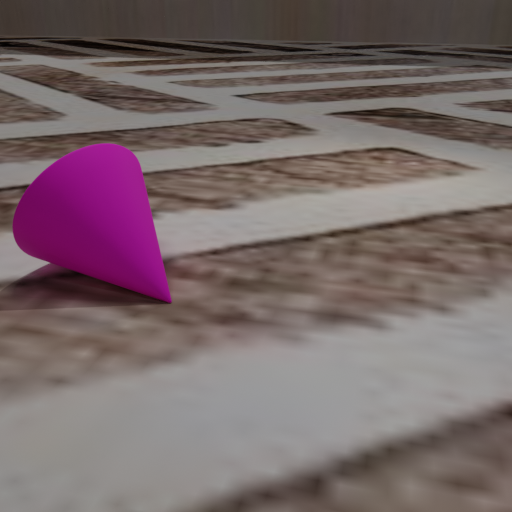

In [28]:
# @title Example frame.
# @markdown Make sure that the video was processed correctly.
# @markdown If this gives an exception, try running the preceding cell one more time--sometimes uploading to Google Drive can fail.

image_paths = list((rgb_dir / '1x').iterdir())
Image.open(image_paths[0])

In [3]:
colmap_image_scale = 2  # @param {type: 'number'}

### Camera registration with COLMAP.

In [30]:
# @title Extract features.
# @markdown Computes SIFT features and saves them to the COLMAP DB.
share_intrinsics = True  # @param {type: 'boolean'}
assume_upright_cameras = True  # @param {type: 'boolean'}

# @markdown This sets the scale at which we will run COLMAP. A scale of 1 will be more accurate but will be slow.
colmap_rgb_dir = rgb_dir / f'{colmap_image_scale}x'

# @markdown Check this if you want to re-process SfM.
overwrite = True  # @param {type: 'boolean'}

if overwrite and colmap_db_path.exists():
  colmap_db_path.unlink()

!colmap feature_extractor \
--SiftExtraction.use_gpu 0 \
--SiftExtraction.upright {int(assume_upright_cameras)} \
--ImageReader.camera_model OPENCV \
--ImageReader.single_camera {int(share_intrinsics)} \
--database_path "{str(colmap_db_path)}" \
--image_path "{str(colmap_rgb_dir)}"


Feature extraction

Processed file [1/200]
  Name:            rgba_00001.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        311
Processed file [2/200]
  Name:            rgba_00000.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        318
Processed file [3/200]
  Name:            rgba_00004.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        318
Processed file [4/200]
  Name:            rgba_00003.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        297
Processed file [5/200]
  Name:            rgba_00002.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        309
Processed file [6/200]
  Name:            rgba_00009.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307

Processed file [50/200]
  Name:            rgba_00051.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        284
Processed file [51/200]
  Name:            rgba_00059.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        273
Processed file [52/200]
  Name:            rgba_00053.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        289
Processed file [53/200]
  Name:            rgba_00048.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        295
Processed file [54/200]
  Name:            rgba_00056.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        290
Processed file [55/200]
  Name:            rgba_00054.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Feature

Processed file [101/200]
  Name:            rgba_00101.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        274
Processed file [102/200]
  Name:            rgba_00103.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        270
Processed file [103/200]
  Name:            rgba_00104.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        263
Processed file [104/200]
  Name:            rgba_00098.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        260
Processed file [105/200]
  Name:            rgba_00105.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        257
Processed file [106/200]
  Name:            rgba_00106.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  F

Processed file [151/200]
  Name:            rgba_00150.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        275
Processed file [152/200]
  Name:            rgba_00151.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        283
Processed file [153/200]
  Name:            rgba_00152.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        282
Processed file [154/200]
  Name:            rgba_00155.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        284
Processed file [155/200]
  Name:            rgba_00153.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  Features:        286
Processed file [156/200]
  Name:            rgba_00158.png
  Dimensions:      256 x 256
  Camera:          #1 - OPENCV
  Focal Length:    307.20px
  F

In [31]:
# @title Match features.
# @markdown Match the SIFT features between images. Use `exhaustive` if you only have a few images and use `vocab_tree` if you have a lot of images.

match_method = 'exhaustive'  # @param ["exhaustive", "vocab_tree"]

if match_method == 'exhaustive':
  !colmap exhaustive_matcher \
    --SiftMatching.use_gpu 0 \
    --database_path "{str(colmap_db_path)}"
else:
  # Use this if you have lots of frames.
  !wget https://demuc.de/colmap/vocab_tree_flickr100K_words32K.bin
  !colmap vocab_tree_matcher \
    --VocabTreeMatching.vocab_tree_path vocab_tree_flickr100K_words32K.bin \
    --SiftMatching.use_gpu 0 \
    --database_path "{str(colmap_db_path)}"


Exhaustive feature matching

Matching block [1/4, 1/4] in 2.786s
Matching block [1/4, 2/4] in 2.385s
Matching block [1/4, 3/4] in 2.067s
Matching block [1/4, 4/4] in 2.258s
Matching block [2/4, 1/4] in 2.379s
Matching block [2/4, 2/4] in 2.141s
Matching block [2/4, 3/4] in 2.238s
Matching block [2/4, 4/4] in 2.119s
Matching block [3/4, 1/4] in 2.266s
Matching block [3/4, 2/4] in 2.250s
Matching block [3/4, 3/4] in 1.981s
Matching block [3/4, 4/4] in 2.155s
Matching block [4/4, 1/4] in 2.102s
Matching block [4/4, 2/4] in 2.278s
Matching block [4/4, 3/4] in 2.300s
Matching block [4/4, 4/4] in 2.321s
Elapsed time: 0.604 [minutes]


In [32]:
# @title Reconstruction.
# @markdown Run structure-from-motion to compute camera parameters.

refine_principal_point = True  #@param {type:"boolean"}
min_num_matches = 64 # @param {type: 'number'}
filter_max_reproj_error = 2  # @param {type: 'number'}
tri_complete_max_reproj_error = 2  # @param {type: 'number'}

!colmap mapper \
  --Mapper.ba_refine_principal_point {int(refine_principal_point)} \
  --Mapper.filter_max_reproj_error $filter_max_reproj_error \
  --Mapper.tri_complete_max_reproj_error $tri_complete_max_reproj_error \
  --Mapper.min_num_matches $min_num_matches \
  --database_path "{str(colmap_db_path)}" \
  --image_path "{str(colmap_rgb_dir)}" \
  --output_path "{str(colmap_out_path)}" # renamed to output path


Loading database

Loading cameras... 1 in 0.000s
Loading matches... 13312 in 0.071s
Loading images... 200 in 0.007s (connected 200)
Building correspondence graph... in 0.168s (ignored 3455)

Elapsed time: 0.004 [minutes]

  => No good initial image pair found.
  => Relaxing the initialization constraints.
  => No good initial image pair found.
  => Relaxing the initialization constraints.

Initializing with image pair #136 and #177


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.679047e+01    0.00e+00    4.10e+03   0.00e+00   0.00e+00  1.00e+04        0    3.80e-03    4.65e-03
   1  4.432321e+01    2.25e+01    1.10e+03   1.27e+01   3.64e-01  9.80e+03        1    1.50e-02    1.98e-02
   2  5.384794e+00    3.89e+01    4.77e+02   1.19e+01   9.79e-01  2.94e+04        1    1.39e-02    3.38e-02
   3  2.072544e+01   -1.53e+01    0.00e+00   3.11e+01  -1.13e+01  1.47e+04        1    1.11e-02    4.49

  68  2.518000e+00    3.22e-04    2.38e+00   2.49e-01   5.97e-01  4.04e+04        1    1.59e-02    1.01e+00
  69  2.517791e+00    2.09e-04    4.06e+00   1.89e-01   4.68e-01  4.04e+04        1    1.58e-02    1.02e+00
  70  2.517493e+00    2.98e-04    2.96e+00   2.70e-01   6.29e-01  4.11e+04        1    1.58e-02    1.04e+00
  71  2.517296e+00    1.97e-04    4.64e+00   2.01e-01   4.79e-01  4.11e+04        1    1.59e-02    1.06e+00
  72  2.517008e+00    2.88e-04    3.69e+00   2.99e-01   6.26e-01  4.18e+04        1    1.58e-02    1.07e+00
  73  2.516830e+00    1.78e-04    5.48e+00   2.20e-01   4.30e-01  4.17e+04        1    1.56e-02    1.09e+00
  74  2.516540e+00    2.89e-04    4.59e+00   3.31e-01   5.91e-01  4.20e+04        1    1.57e-02    1.10e+00
  75  2.516390e+00    1.51e-04    6.30e+00   2.36e-01   3.38e-01  4.06e+04        1    1.55e-02    1.12e+00
  76  2.516079e+00    3.11e-04    5.16e+00   3.49e-01   5.74e-01  4.07e+04        1    1.52e-02    1.14e+00
  77  2.515915e+00    1.64e-

  30  1.454795e+01    3.98e-02    2.08e+02   7.57e+00   6.45e-01  7.98e+04        1    1.51e-02    4.48e-01
  31  1.451026e+01    3.77e-02    2.19e+02   7.47e+00   6.43e-01  8.17e+04        1    1.46e-02    4.62e-01
  32  1.447465e+01    3.56e-02    2.29e+02   7.37e+00   6.40e-01  8.35e+04        1    1.53e-02    4.78e-01
  33  1.444104e+01    3.36e-02    2.38e+02   7.26e+00   6.38e-01  8.53e+04        1    1.54e-02    4.93e-01
  34  1.440934e+01    3.17e-02    2.46e+02   7.15e+00   6.35e-01  8.70e+04        1    1.45e-02    5.08e-01
  35  1.437947e+01    2.99e-02    2.54e+02   7.02e+00   6.32e-01  8.87e+04        1    1.49e-02    5.23e-01
  36  1.435134e+01    2.81e-02    2.60e+02   6.90e+00   6.30e-01  9.02e+04        1    1.50e-02    5.38e-01
  37  1.432487e+01    2.65e-02    2.65e+02   6.77e+00   6.27e-01  9.17e+04        1    1.57e-02    5.53e-01
  38  1.429995e+01    2.49e-02    2.70e+02   6.64e+00   6.24e-01  9.32e+04        1    1.42e-02    5.68e-01
  39  1.427650e+01    2.34e-


Bundle adjustment report
------------------------
    Residuals : 1384
   Parameters : 568
   Iterations : 26
         Time : 0.628242 [s]
 Initial cost : 0.172978 [px]
   Final cost : 0.165857 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 1
  => Filtered observations: 4
  => Changed observations: 0.007225

Bundle adjustment report
------------------------
    Residuals : 1376
   Parameters : 565
   Iterations : 26
         Time : 0.417171 [s]
 Initial cost : 0.114224 [px]
   Final cost : 0.109695 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.655741e+01    0.00e+00    7.94

  66  1.606223e+01    1.92e-03    9.91e+01   1.64e+01   6.32e-01  2.91e+05        1    1.52e-02    1.03e+00
  67  1.606035e+01    1.88e-03    9.77e+01   1.70e+01   6.28e-01  2.96e+05        1    1.51e-02    1.04e+00
  68  1.605852e+01    1.83e-03    9.58e+01   1.77e+01   6.25e-01  3.00e+05        1    1.72e-02    1.06e+00
  69  1.605673e+01    1.79e-03    9.35e+01   1.83e+01   6.22e-01  3.05e+05        1    1.58e-02    1.08e+00
  70  1.605499e+01    1.74e-03    9.09e+01   1.91e+01   6.19e-01  3.09e+05        1    1.55e-02    1.09e+00
  71  1.605330e+01    1.69e-03    8.82e+01   1.98e+01   6.17e-01  3.13e+05        1    1.61e-02    1.11e+00
  72  1.605165e+01    1.64e-03    8.52e+01   2.06e+01   6.15e-01  3.17e+05        1    1.51e-02    1.12e+00
  73  1.605007e+01    1.59e-03    8.22e+01   2.15e+01   6.14e-01  3.21e+05        1    1.75e-02    1.14e+00
  74  1.604853e+01    1.54e-03    7.91e+01   2.24e+01   6.13e-01  3.24e+05        1    1.28e-02    1.15e+00
  75  1.604705e+01    1.48e-

  36  1.576037e+01    3.60e-04    6.27e+01   6.60e+00   5.80e-01  3.97e+05        1    1.50e-02    5.22e-01
  37  1.576001e+01    3.56e-04    6.24e+01   6.64e+00   5.80e-01  3.99e+05        1    1.51e-02    5.37e-01
  38  1.575966e+01    3.53e-04    6.22e+01   6.68e+00   5.80e-01  4.00e+05        1    1.53e-02    5.52e-01
  39  1.575931e+01    3.50e-04    6.19e+01   6.72e+00   5.80e-01  4.02e+05        1    1.57e-02    5.68e-01
  40  1.575896e+01    3.47e-04    6.17e+01   6.76e+00   5.80e-01  4.04e+05        1    1.60e-02    5.84e-01
  41  1.575861e+01    3.44e-04    6.14e+01   6.79e+00   5.80e-01  4.05e+05        1    1.11e-02    5.95e-01
  42  1.575827e+01    3.41e-04    6.11e+01   6.83e+00   5.80e-01  4.07e+05        1    1.62e-02    6.12e-01
  43  1.575794e+01    3.38e-04    6.09e+01   6.87e+00   5.80e-01  4.09e+05        1    1.58e-02    6.28e-01
  44  1.575760e+01    3.36e-04    6.06e+01   6.91e+00   5.80e-01  4.10e+05        1    1.75e-02    6.45e-01
  45  1.575727e+01    3.33e-

  10  1.567759e+01    1.55e-04    1.36e+01   3.91e+00   9.26e-01  6.48e+05        1    1.21e-02    8.42e-02
  11  1.567756e+01    3.62e-05    3.00e+01   8.63e+00   1.33e-01  4.64e+05        1    1.65e-02    1.01e-01
  12  1.567721e+01    3.43e-04    1.66e+01   5.99e+00   8.45e-01  6.93e+05        1    1.58e-02    1.16e-01
  13  1.567720e+01    1.10e-05    3.41e+01   8.65e+00   3.58e-02  3.85e+05        1    1.49e-02    1.31e-01
  14  1.567680e+01    4.00e-04    1.05e+01   4.78e+00   9.35e-01  1.12e+06        1    1.48e-02    1.46e-01
  15  1.567828e+01   -1.48e-03    0.00e+00   1.35e+01  -3.76e+00  5.62e+05        1    1.24e-02    1.59e-01
  16  1.567671e+01    9.30e-05    2.14e+01   6.86e+00   4.34e-01  5.60e+05        1    1.48e-02    1.74e-01
  17  1.567653e+01    1.85e-04    2.09e+01   6.78e+00   6.13e-01  5.67e+05        1    1.58e-02    1.89e-01
  18  1.567635e+01    1.75e-04    2.09e+01   6.81e+00   5.97e-01  5.71e+05        1    1.55e-02    2.05e-01
  19  1.567618e+01    1.73e-

  87  1.566739e+01    1.18e-04    2.34e+01   9.53e+00   5.56e-01  6.97e+05        1    1.55e-02    1.28e+00
  88  1.566727e+01    1.18e-04    2.34e+01   9.59e+00   5.56e-01  6.98e+05        1    1.57e-02    1.30e+00
  89  1.566716e+01    1.18e-04    2.34e+01   9.65e+00   5.55e-01  6.98e+05        1    1.50e-02    1.31e+00
  90  1.566704e+01    1.18e-04    2.34e+01   9.70e+00   5.55e-01  6.99e+05        1    1.57e-02    1.33e+00
  91  1.566692e+01    1.18e-04    2.33e+01   9.76e+00   5.54e-01  7.00e+05        1    1.52e-02    1.34e+00
  92  1.566680e+01    1.18e-04    2.33e+01   9.82e+00   5.54e-01  7.01e+05        1    1.56e-02    1.36e+00
  93  1.566668e+01    1.18e-04    2.33e+01   9.88e+00   5.54e-01  7.02e+05        1    1.69e-02    1.37e+00
  94  1.566657e+01    1.18e-04    2.33e+01   9.94e+00   5.53e-01  7.03e+05        1    1.40e-02    1.39e+00
  95  1.566645e+01    1.18e-04    2.33e+01   1.00e+01   5.53e-01  7.04e+05        1    1.52e-02    1.40e+00
  96  1.566633e+01    1.18e-

  58  1.528700e+01    9.41e-04    1.38e+02   2.71e+01   4.38e-01  3.29e+05        1    1.59e-02    9.08e-01
  59  1.528605e+01    9.55e-04    1.40e+02   2.76e+01   4.39e-01  3.29e+05        1    1.54e-02    9.23e-01
  60  1.528508e+01    9.68e-04    1.42e+02   2.81e+01   4.41e-01  3.28e+05        1    1.56e-02    9.39e-01
  61  1.528410e+01    9.82e-04    1.44e+02   2.85e+01   4.43e-01  3.28e+05        1    1.67e-02    9.56e-01
  62  1.528310e+01    9.96e-04    1.46e+02   2.90e+01   4.46e-01  3.27e+05        1    1.56e-02    9.71e-01
  63  1.528209e+01    1.01e-03    1.48e+02   2.96e+01   4.48e-01  3.27e+05        1    1.58e-02    9.87e-01
  64  1.528107e+01    1.02e-03    1.50e+02   3.01e+01   4.50e-01  3.27e+05        1    1.57e-02    1.00e+00
  65  1.528003e+01    1.04e-03    1.52e+02   3.07e+01   4.53e-01  3.26e+05        1    1.52e-02    1.02e+00
  66  1.527898e+01    1.05e-03    1.53e+02   3.12e+01   4.55e-01  3.26e+05        1    1.50e-02    1.03e+00
  67  1.527791e+01    1.07e-

  30  1.348684e+01    3.63e-04    2.59e+01   2.25e+01   7.54e-01  2.78e+05        1    1.55e-02    4.62e-01
  31  1.348645e+01    3.84e-04    2.35e+01   2.45e+01   7.14e-01  3.02e+05        1    1.82e-02    4.80e-01
  32  1.348606e+01    3.92e-04    2.59e+01   2.57e+01   6.75e-01  3.15e+05        1    1.73e-02    4.98e-01
  33  1.348566e+01    3.99e-04    3.30e+01   2.63e+01   6.50e-01  3.24e+05        1    1.60e-02    5.14e-01
  34  1.348526e+01    4.00e-04    3.87e+01   2.66e+01   6.29e-01  3.30e+05        1    1.60e-02    5.30e-01
  35  1.348486e+01    4.00e-04    4.34e+01   2.68e+01   6.12e-01  3.33e+05        1    1.65e-02    5.46e-01
  36  1.348446e+01    4.00e-04    4.70e+01   2.69e+01   5.99e-01  3.36e+05        1    2.00e-02    5.66e-01
  37  1.348406e+01    3.99e-04    5.00e+01   2.70e+01   5.89e-01  3.38e+05        1    1.73e-02    5.84e-01
  38  1.348366e+01    3.98e-04    5.24e+01   2.71e+01   5.81e-01  3.39e+05        1    1.34e-02    5.97e-01
  39  1.348327e+01    3.97e-


Bundle adjustment report
------------------------
    Residuals : 648
   Parameters : 250
   Iterations : 26
         Time : 0.398506 [s]
 Initial cost : 0.331393 [px]
   Final cost : 0.194896 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 229
  => Filtered observations: 5
  => Changed observations: 0.722222

Bundle adjustment report
------------------------
    Residuals : 1068
   Parameters : 385
   Iterations : 26
         Time : 0.341836 [s]
 Initial cost : 0.179562 [px]
   Final cost : 0.160982 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 6
  => Filtered observations: 27
  => Changed observations: 0.061798

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.630368e+01    0.00e+00    2.

  65  2.438818e+01    4.62e-03    2.91e+02   9.25e+00   6.39e-01  3.73e+05        1    1.44e-02    9.57e-01
  66  2.438388e+01    4.30e-03    2.82e+02   8.93e+00   6.42e-01  3.81e+05        1    1.41e-02    9.71e-01
  67  2.437987e+01    4.00e-03    2.72e+02   8.63e+00   6.44e-01  3.91e+05        1    1.41e-02    9.86e-01
  68  2.437616e+01    3.72e-03    2.63e+02   8.33e+00   6.47e-01  4.01e+05        1    1.42e-02    1.00e+00
  69  2.437271e+01    3.45e-03    2.54e+02   8.05e+00   6.49e-01  4.12e+05        1    1.41e-02    1.01e+00
  70  2.436951e+01    3.20e-03    2.45e+02   7.78e+00   6.51e-01  4.24e+05        1    1.40e-02    1.03e+00
  71  2.436654e+01    2.96e-03    2.36e+02   7.52e+00   6.53e-01  4.36e+05        1    1.42e-02    1.04e+00
  72  2.436380e+01    2.74e-03    2.27e+02   7.27e+00   6.56e-01  4.50e+05        1    1.41e-02    1.06e+00
  73  2.436127e+01    2.53e-03    2.18e+02   7.03e+00   6.58e-01  4.64e+05        1    1.41e-02    1.07e+00
  74  2.435893e+01    2.34e-

  21  5.206689e+01    1.75e-01    3.44e+03   1.99e+01   5.32e-01  4.48e+04        1    1.72e-02    3.37e-01
  22  5.188708e+01    1.80e-01    2.50e+03   2.07e+01   5.57e-01  4.49e+04        1    1.66e-02    3.54e-01
  23  5.171338e+01    1.74e-01    1.67e+03   2.12e+01   5.71e-01  4.50e+04        1    1.57e-02    3.70e-01
  24  5.154981e+01    1.64e-01    1.05e+03   2.14e+01   5.84e-01  4.52e+04        1    1.71e-02    3.87e-01
  25  5.139863e+01    1.51e-01    6.57e+02   2.13e+01   5.99e-01  4.56e+04        1    1.59e-02    4.03e-01
  26  5.126188e+01    1.37e-01    6.12e+02   2.11e+01   6.16e-01  4.62e+04        1    6.02e-03    4.09e-01
  27  5.114067e+01    1.21e-01    5.98e+02   2.07e+01   6.32e-01  4.70e+04        1    1.42e-02    4.23e-01
  28  5.103478e+01    1.06e-01    5.79e+02   2.03e+01   6.47e-01  4.83e+04        1    1.96e-02    4.43e-01
  29  5.094295e+01    9.18e-02    5.60e+02   1.99e+01   6.59e-01  4.99e+04        1    1.94e-02    4.62e-01
  30  5.086349e+01    7.95e-

  99  5.004370e+01    3.98e-03    2.29e+03   1.32e+01   5.74e-01  1.46e+05        1    1.43e-02    1.61e+00
 100  5.003977e+01    3.93e-03    2.30e+03   1.33e+01   5.74e-01  1.46e+05        1    1.66e-02    1.63e+00


Bundle adjustment report
------------------------
    Residuals : 2136
   Parameters : 631
   Iterations : 101
         Time : 1.63027 [s]
 Initial cost : 0.166854 [px]
   Final cost : 0.153058 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 11
  => Changed observations: 0.010300

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.916341e+01    0.00e+00    2.29e+03   0.00e+00   0.00e+00  1.00e+04        0    3.64e-03    4.98e-03
   1  4.905809e+01    1.05e-01    3.28e+02   9.60e+00   9.93e-01  3.00e+04        1    1.61e-02    2.11e-02
   2  4.904151e+01    1.66e-02    8.64e+02   1.58e+01   9.20e-01  7.38e+04

  69  4.884010e+01    1.47e-03    2.86e+03   2.04e+01   5.73e-01  2.07e+05        1    3.55e-02    1.26e+00
  70  4.883866e+01    1.44e-03    2.87e+03   2.03e+01   5.73e-01  2.07e+05        1    2.80e-02    1.28e+00
  71  4.883724e+01    1.42e-03    2.87e+03   2.03e+01   5.73e-01  2.08e+05        1    1.65e-02    1.30e+00
  72  4.883585e+01    1.39e-03    2.88e+03   2.03e+01   5.73e-01  2.09e+05        1    1.28e-02    1.31e+00
  73  4.883448e+01    1.37e-03    2.89e+03   2.03e+01   5.72e-01  2.09e+05        1    4.35e-02    1.36e+00
  74  4.883313e+01    1.35e-03    2.89e+03   2.02e+01   5.72e-01  2.10e+05        1    3.58e-02    1.39e+00
  75  4.883180e+01    1.33e-03    2.90e+03   2.02e+01   5.72e-01  2.10e+05        1    2.42e-02    1.42e+00
  76  4.883050e+01    1.31e-03    2.91e+03   2.02e+01   5.72e-01  2.11e+05        1    2.29e-02    1.44e+00
  77  4.882921e+01    1.28e-03    2.91e+03   2.02e+01   5.72e-01  2.12e+05        1    1.67e-02    1.46e+00
  78  4.882795e+01    1.26e-

  39  3.937323e+01    2.52e-03    1.64e+02   2.19e+01   7.99e-01  1.07e+05        1    1.71e-02    5.85e-01
  40  3.937069e+01    2.55e-03    2.65e+02   2.26e+01   7.88e-01  1.32e+05        1    1.71e-02    6.02e-01
  41  3.936781e+01    2.87e-03    3.89e+02   2.27e+01   8.01e-01  1.69e+05        1    1.88e-02    6.21e-01
  42  3.936461e+01    3.20e-03    6.20e+02   2.36e+01   7.78e-01  2.04e+05        1    1.71e-02    6.38e-01
  43  3.936083e+01    3.78e-03    8.54e+02   2.35e+01   7.94e-01  2.56e+05        1    3.06e-02    6.69e-01
  44  3.935658e+01    4.26e-03    1.24e+03   2.46e+01   7.69e-01  3.03e+05        1    1.76e-02    6.86e-01
  45  3.935156e+01    5.02e-03    1.58e+03   2.51e+01   7.77e-01  3.66e+05        1    1.63e-02    7.03e-01
  46  3.934610e+01    5.46e-03    2.13e+03   2.67e+01   7.36e-01  4.08e+05        1    1.81e-02    7.21e-01
  47  3.933988e+01    6.22e-03    2.51e+03   2.72e+01   7.41e-01  4.60e+05        1    1.64e-02    7.37e-01
  48  3.933373e+01    6.15e-

  11  3.805988e+01    4.43e-03    3.50e+02   1.63e+01   6.94e-01  8.43e+04        1    1.58e-02    1.73e-01
  12  3.805562e+01    4.26e-03    3.59e+02   1.51e+01   7.55e-01  9.72e+04        1    1.53e-02    1.89e-01
  13  3.805200e+01    3.61e-03    3.59e+02   1.51e+01   7.35e-01  1.08e+05        1    1.54e-02    2.04e-01
  14  3.804843e+01    3.57e-03    2.49e+02   1.45e+01   7.74e-01  1.30e+05        1    1.52e-02    2.20e-01
  15  3.804506e+01    3.37e-03    1.34e+02   1.49e+01   7.59e-01  1.51e+05        1    1.64e-02    2.36e-01
  16  3.804151e+01    3.54e-03    3.95e+02   1.49e+01   7.88e-01  1.87e+05        1    1.59e-02    2.52e-01
  17  3.803794e+01    3.58e-03    1.26e+03   1.58e+01   7.61e-01  2.17e+05        1    1.70e-02    2.69e-01
  18  3.803407e+01    3.86e-03    2.48e+03   1.61e+01   7.68e-01  2.57e+05        1    1.49e-02    2.84e-01
  19  3.803028e+01    3.79e-03    4.33e+03   1.71e+01   7.07e-01  2.77e+05        1    1.54e-02    3.00e-01
  20  3.802629e+01    3.99e-

  88  3.793270e+01    3.11e-04    4.54e+03   1.10e+01   5.71e-01  4.38e+05        1    1.65e-02    1.41e+00
  89  3.793240e+01    3.03e-04    4.50e+03   1.09e+01   5.71e-01  4.39e+05        1    1.68e-02    1.43e+00
  90  3.793210e+01    2.95e-04    4.47e+03   1.08e+01   5.71e-01  4.40e+05        1    1.59e-02    1.44e+00
  91  3.793181e+01    2.88e-04    4.45e+03   1.08e+01   5.71e-01  4.42e+05        1    1.66e-02    1.46e+00
  92  3.793153e+01    2.81e-04    4.42e+03   1.07e+01   5.71e-01  4.43e+05        1    1.68e-02    1.48e+00
  93  3.793126e+01    2.74e-04    4.39e+03   1.07e+01   5.71e-01  4.44e+05        1    1.64e-02    1.49e+00
  94  3.793099e+01    2.68e-04    4.36e+03   1.06e+01   5.71e-01  4.45e+05        1    1.82e-02    1.51e+00
  95  3.793073e+01    2.62e-04    4.34e+03   1.05e+01   5.71e-01  4.47e+05        1    1.64e-02    1.53e+00
  96  3.793047e+01    2.56e-04    4.31e+03   1.05e+01   5.71e-01  4.48e+05        1    1.68e-02    1.55e+00
  97  3.793022e+01    2.50e-

  57  3.662594e+01    6.34e-04    9.30e+03   2.58e+00   5.78e-01  2.43e+05        1    1.58e-02    9.57e-01
  58  3.662531e+01    6.31e-04    9.37e+03   2.57e+00   5.78e-01  2.44e+05        1    1.60e-02    9.73e-01
  59  3.662468e+01    6.28e-04    9.44e+03   2.56e+00   5.78e-01  2.45e+05        1    1.50e-02    9.88e-01
  60  3.662406e+01    6.25e-04    9.51e+03   2.55e+00   5.78e-01  2.46e+05        1    1.66e-02    1.00e+00
  61  3.662344e+01    6.21e-04    9.59e+03   2.54e+00   5.78e-01  2.47e+05        1    1.62e-02    1.02e+00
  62  3.662282e+01    6.18e-04    9.66e+03   2.53e+00   5.79e-01  2.47e+05        1    1.60e-02    1.04e+00
  63  3.662220e+01    6.15e-04    9.73e+03   2.52e+00   5.79e-01  2.48e+05        1    1.67e-02    1.05e+00
  64  3.662159e+01    6.12e-04    9.80e+03   2.51e+00   5.79e-01  2.49e+05        1    1.39e-02    1.07e+00
  65  3.662098e+01    6.09e-04    9.88e+03   2.50e+00   5.79e-01  2.50e+05        1    1.68e-02    1.08e+00
  66  3.662037e+01    6.06e-

   2  3.560138e+01    4.18e-02    1.33e+03   2.50e+01   9.10e-01  4.47e+04        1    1.54e-02    3.38e-02
   3  3.558911e+01    1.23e-02    6.92e+02   2.92e+01   7.70e-01  5.31e+04        1    1.60e-02    4.98e-02
   4  3.558234e+01    6.77e-03    3.27e+03   3.01e+01   5.69e-01  5.32e+04        1    1.64e-02    6.62e-02
   5  3.557478e+01    7.56e-03    2.69e+03   2.86e+01   6.54e-01  5.48e+04        1    1.63e-02    8.26e-02
   6  3.556871e+01    6.07e-03    1.77e+03   2.80e+01   6.53e-01  5.64e+04        1    1.54e-02    9.80e-02
   7  3.556352e+01    5.19e-03    1.18e+03   2.72e+01   6.79e-01  5.92e+04        1    1.42e-02    1.12e-01
   8  3.555921e+01    4.31e-03    7.31e+02   2.67e+01   6.89e-01  6.25e+04        1    1.54e-02    1.28e-01
   9  3.555549e+01    3.72e-03    4.14e+02   2.63e+01   7.06e-01  6.72e+04        1    1.58e-02    1.44e-01
  10  3.555227e+01    3.22e-03    1.63e+02   2.60e+01   7.16e-01  7.32e+04        1    1.52e-02    1.59e-01
  11  3.554940e+01    2.87e-

  78  3.545294e+01    4.72e-04    1.46e+04   1.56e+00   8.13e-01  3.45e+05        1    1.92e-02    1.19e+00
  79  3.545276e+01    1.80e-04    3.54e+04   5.33e+00   2.69e-01  3.14e+05        1    1.67e-02    1.21e+00
  80  3.545197e+01    7.90e-04    2.13e+04   1.76e+00   8.05e-01  4.06e+05        1    5.05e-02    1.26e+00
  81  3.545201e+01   -4.22e-05    0.00e+00   6.22e+00  -5.07e-02  2.03e+05        1    7.17e-02    1.33e+00
  82  3.545155e+01    4.20e-04    1.28e+04   3.33e+00   8.21e-01  2.76e+05        1    1.69e-02    1.35e+00
  83  3.545116e+01    3.87e-04    1.71e+04   1.63e+00   7.63e-01  3.24e+05        1    1.50e-02    1.36e+00
  84  3.545089e+01    2.72e-04    3.08e+04   4.64e+00   4.42e-01  3.23e+05        1    1.51e-02    1.38e+00
  85  3.545027e+01    6.23e-04    2.33e+04   1.77e+00   7.60e-01  3.76e+05        1    1.70e-02    1.39e+00
  86  3.545009e+01    1.79e-04    4.14e+04   5.29e+00   2.37e-01  3.28e+05        1    1.56e-02    1.41e+00
  87  3.544924e+01    8.47e-

  50  2.703124e+01    1.56e-02    1.59e+04   1.04e+01   6.19e-01  1.39e+05        1    1.12e-02    7.90e-01
  51  2.701634e+01    1.49e-02    1.49e+04   1.00e+01   6.22e-01  1.42e+05        1    1.19e-03    7.91e-01
  52  2.700214e+01    1.42e-02    1.38e+04   9.68e+00   6.25e-01  1.44e+05        1    1.11e-03    7.92e-01
  53  2.698859e+01    1.35e-02    1.29e+04   9.35e+00   6.27e-01  1.46e+05        1    1.03e-03    7.93e-01
  54  2.697566e+01    1.29e-02    1.20e+04   9.05e+00   6.29e-01  1.49e+05        1    3.07e-03    7.96e-01
  55  2.696330e+01    1.24e-02    1.12e+04   8.76e+00   6.30e-01  1.51e+05        1    1.12e-03    7.97e-01
  56  2.695150e+01    1.18e-02    1.04e+04   8.48e+00   6.32e-01  1.54e+05        1    1.07e-03    7.98e-01
  57  2.694021e+01    1.13e-02    9.59e+03   8.23e+00   6.33e-01  1.57e+05        1    1.09e-03    8.00e-01
  58  2.692940e+01    1.08e-02    8.83e+03   7.98e+00   6.35e-01  1.60e+05        1    1.06e-03    8.01e-01
  59  2.691906e+01    1.03e-

  => Could not register, trying another image.

Registering image #161 (7)

  => Image sees 58 / 281 points
  => Could not register, trying another image.

Registering image #128 (7)

  => Image sees 59 / 278 points
  => Could not register, trying another image.

Registering image #123 (7)

  => Image sees 58 / 270 points
  => Could not register, trying another image.

Registering image #163 (7)

  => Image sees 59 / 277 points
  => Could not register, trying another image.

Registering image #181 (7)

  => Image sees 59 / 276 points
  => Could not register, trying another image.

Registering image #186 (7)

  => Image sees 58 / 281 points
  => Could not register, trying another image.

Registering image #179 (7)

  => Image sees 56 / 264 points
  => Could not register, trying another image.

Registering image #199 (7)

  => Image sees 57 / 274 points
  => Could not register, trying another image.

Registering image #188 (7)

  => Image sees 57 / 268 points
  => Could not register, try

  39  3.128024e+00    2.55e-02    1.14e+02   3.16e+00   5.51e-01  2.89e+04        1    1.68e-02    5.44e-01
  40  3.100197e+00    2.78e-02    1.19e+02   2.97e+00   5.68e-01  2.90e+04        1    1.48e-02    5.58e-01
  41  3.069747e+00    3.04e-02    1.19e+02   2.77e+00   6.10e-01  2.93e+04        1    1.64e-02    5.75e-01
  42  3.037738e+00    3.20e-02    1.12e+02   2.55e+00   6.68e-01  3.05e+04        1    1.35e-02    5.88e-01
  43  3.006202e+00    3.15e-02    1.03e+02   2.39e+00   7.21e-01  3.33e+04        1    1.60e-02    6.05e-01
  44  2.976038e+00    3.02e-02    9.57e+01   2.34e+00   7.59e-01  3.87e+04        1    1.47e-02    6.19e-01
  45  2.946702e+00    2.93e-02    9.21e+01   2.44e+00   7.87e-01  4.78e+04        1    1.62e-02    6.35e-01
  46  2.917819e+00    2.89e-02    8.96e+01   2.73e+00   8.04e-01  6.16e+04        1    1.61e-02    6.52e-01
  47  2.890991e+00    2.68e-02    8.22e+01   3.26e+00   7.77e-01  7.42e+04        1    1.47e-02    6.66e-01
  48  2.871687e+00    1.93e-

   5  9.735960e+00    5.45e-02    4.56e+01   5.91e+00   7.88e-01  7.67e+04        1    1.55e-02    2.25e-02
   6  9.688786e+00    4.72e-02    1.60e+02   6.93e+00   5.80e-01  7.70e+04        1    1.75e-02    4.01e-02
   7  9.626512e+00    6.23e-02    2.65e+02   6.74e+00   6.33e-01  7.85e+04        1    1.76e-02    5.77e-02
   8  9.565326e+00    6.12e-02    3.03e+02   6.71e+00   6.20e-01  7.96e+04        1    1.72e-02    7.50e-02
   9  9.503115e+00    6.22e-02    3.14e+02   6.64e+00   6.35e-01  8.12e+04        1    1.71e-02    9.22e-02
  10  9.442180e+00    6.09e-02    3.12e+02   6.61e+00   6.45e-01  8.32e+04        1    1.69e-02    1.09e-01
  11  9.382761e+00    5.94e-02    3.04e+02   6.59e+00   6.56e-01  8.58e+04        1    1.67e-02    1.26e-01
  12  9.325168e+00    5.76e-02    2.91e+02   6.61e+00   6.65e-01  8.90e+04        1    1.69e-02    1.43e-01
  13  9.269416e+00    5.58e-02    2.77e+02   6.64e+00   6.73e-01  9.29e+04        1    1.72e-02    1.60e-01
  14  9.215515e+00    5.39e-

  83  7.961093e+00    4.87e-03    1.19e+02   2.06e+00   6.45e-01  1.47e+05        1    1.68e-02    1.34e+00
  84  7.956401e+00    4.69e-03    1.14e+02   2.03e+00   6.47e-01  1.51e+05        1    1.60e-02    1.36e+00
  85  7.951880e+00    4.52e-03    1.10e+02   2.00e+00   6.49e-01  1.55e+05        1    1.55e-02    1.37e+00
  86  7.947528e+00    4.35e-03    1.05e+02   1.97e+00   6.51e-01  1.60e+05        1    1.54e-02    1.39e+00
  87  7.943341e+00    4.19e-03    1.01e+02   1.94e+00   6.53e-01  1.65e+05        1    1.45e-02    1.40e+00
  88  7.939314e+00    4.03e-03    9.70e+01   1.91e+00   6.55e-01  1.70e+05        1    1.44e-02    1.42e+00
  89  7.935445e+00    3.87e-03    9.28e+01   1.89e+00   6.58e-01  1.75e+05        1    1.63e-02    1.43e+00
  90  7.931731e+00    3.71e-03    8.87e+01   1.87e+00   6.60e-01  1.81e+05        1    1.78e-02    1.45e+00
  91  7.928167e+00    3.56e-03    8.47e+01   1.85e+00   6.62e-01  1.88e+05        1    1.62e-02    1.47e+00
  92  7.924750e+00    3.42e-

   1  7.901016e+00    1.17e-03    2.65e-01   6.23e-02   1.00e+00  3.00e+04        1    1.82e-02    2.14e-02
   2  7.900771e+00    2.45e-04    1.69e+00   1.87e-01   1.00e+00  9.00e+04        1    1.77e-02    3.92e-02
   3  7.900066e+00    7.05e-04    4.24e+00   5.54e-01   9.85e-01  2.70e+05        1    1.72e-02    5.66e-02
   4  7.898745e+00    1.32e-03    3.21e+01   1.61e+00   6.62e-01  2.80e+05        1    1.66e-02    7.33e-02
   5  7.896772e+00    1.97e-03    3.16e+01   1.59e+00   7.74e-01  3.35e+05        1    1.68e-02    9.01e-02
   6  7.895020e+00    1.75e-03    3.98e+01   1.83e+00   6.73e-01  3.49e+05        1    1.68e-02    1.07e-01
   7  7.892976e+00    2.04e-03    3.84e+01   1.83e+00   7.42e-01  3.94e+05        1    1.66e-02    1.24e-01
   8  7.891128e+00    1.85e-03    4.23e+01   1.97e+00   7.01e-01  4.21e+05        1    1.68e-02    1.41e-01
   9  7.889198e+00    1.93e-03    4.20e+01   2.02e+00   7.35e-01  4.71e+05        1    2.01e-02    1.61e-01
  10  7.887390e+00    1.81e-

  78  7.854054e+00    7.18e-05    2.10e+01   4.10e+00   6.76e-01  7.34e+06        1    1.85e-02    1.41e+00
  79  7.853988e+00    6.58e-05    2.00e+01   4.04e+00   6.79e-01  7.69e+06        1    1.71e-02    1.43e+00
  80  7.853928e+00    6.02e-05    1.90e+01   3.98e+00   6.81e-01  8.07e+06        1    1.86e-02    1.44e+00
  81  7.853873e+00    5.48e-05    1.80e+01   3.92e+00   6.83e-01  8.49e+06        1    1.61e-02    1.46e+00
  82  7.853824e+00    4.96e-05    1.70e+01   3.85e+00   6.86e-01  8.95e+06        1    1.57e-02    1.48e+00
  83  7.853779e+00    4.47e-05    1.60e+01   3.77e+00   6.88e-01  9.45e+06        1    1.36e-02    1.49e+00
  84  7.853739e+00    4.01e-05    1.50e+01   3.69e+00   6.91e-01  1.00e+07        1    1.69e-02    1.51e+00
  85  7.853703e+00    3.58e-05    1.41e+01   3.61e+00   6.94e-01  1.06e+07        1    1.70e-02    1.53e+00
  86  7.853671e+00    3.17e-05    1.31e+01   3.52e+00   6.98e-01  1.13e+07        1    1.40e-02    1.54e+00
  87  7.853644e+00    2.79e-


Initializing with image pair #135 and #180


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.712387e+01    0.00e+00    4.01e+03   0.00e+00   0.00e+00  1.00e+04        0    1.81e-03    2.45e-03
   1  2.592816e+01    3.12e+01    3.20e+03   1.04e+01   6.03e-01  1.01e+04        1    2.11e-02    2.36e-02
   2  5.564591e+00    2.04e+01    4.73e+02   9.27e+00   9.74e-01  3.03e+04        1    1.64e-02    4.01e-02
   3  7.992103e+00   -2.43e+00    0.00e+00   2.31e+01  -2.61e+00  1.51e+04        1    1.31e-02    5.32e-02
   4  5.103777e+00    4.61e-01    1.38e+02   1.23e+01   6.22e-01  1.54e+04        1    1.61e-02    6.93e-02
   5  4.844552e+00    2.59e-01    2.20e+02   1.21e+01   4.84e-01  1.54e+04        1    1.94e-02    8.87e-02
   6  4.765092e+00    7.95e-02    2.68e+02   1.19e+01   1.33e-01  1.10e+04        1    1.88e-02    1.08e-01
   7  4.442739e+00    3.22e-01    3.51e+02   9.18e+00   3.62e-01

  72  1.467532e+00    1.51e-04    3.49e+00   1.01e+00   6.59e-01  3.67e+05        1    1.73e-02    1.32e+00
  73  1.467391e+00    1.41e-04    3.52e+00   9.98e-01   6.51e-01  3.78e+05        1    1.69e-02    1.33e+00
  74  1.467259e+00    1.32e-04    3.55e+00   9.83e-01   6.43e-01  3.87e+05        1    1.68e-02    1.35e+00
  75  1.467135e+00    1.24e-04    3.56e+00   9.70e-01   6.33e-01  3.94e+05        1    1.66e-02    1.37e+00
  76  1.467019e+00    1.16e-04    3.56e+00   9.58e-01   6.24e-01  4.00e+05        1    1.72e-02    1.39e+00
  77  1.466909e+00    1.10e-04    3.55e+00   9.48e-01   6.14e-01  4.05e+05        1    1.70e-02    1.40e+00
  78  1.466805e+00    1.04e-04    3.54e+00   9.40e-01   6.04e-01  4.09e+05        1    1.77e-02    1.42e+00
  79  1.466706e+00    9.91e-05    3.52e+00   9.33e-01   5.94e-01  4.12e+05        1    1.76e-02    1.44e+00
  80  1.466611e+00    9.47e-05    3.49e+00   9.28e-01   5.85e-01  4.14e+05        1    1.61e-02    1.45e+00
  81  1.466520e+00    9.11e-

   2  1.464806e+00    7.99e-06    5.60e-01   1.20e-01   1.01e+00  9.00e+04        1    1.70e-02    3.61e-02
   3  1.464783e+00    2.29e-05    9.05e-01   3.52e-01   1.00e+00  2.70e+05        1    1.63e-02    5.25e-02
   4  1.464741e+00    4.14e-05    1.69e+00   1.03e+00   6.44e-01  2.77e+05        1    1.54e-02    6.79e-02
   5  1.464674e+00    6.70e-05    1.91e+00   1.06e+00   7.33e-01  3.08e+05        1    1.73e-02    8.52e-02
   6  1.464611e+00    6.31e-05    2.16e+00   1.18e+00   6.24e-01  3.13e+05        1    1.60e-02    1.01e-01
   7  1.464535e+00    7.64e-05    2.24e+00   1.21e+00   6.49e-01  3.21e+05        1    1.61e-02    1.17e-01
   8  1.464458e+00    7.72e-05    2.38e+00   1.25e+00   6.20e-01  3.26e+05        1    1.61e-02    1.33e-01
   9  1.464376e+00    8.17e-05    2.48e+00   1.28e+00   6.13e-01  3.29e+05        1    1.51e-02    1.49e-01
  10  1.464292e+00    8.44e-05    2.56e+00   1.31e+00   6.02e-01  3.32e+05        1    1.63e-02    1.65e-01
  11  1.464204e+00    8.73e-

  81  1.449728e+00    3.32e-04    1.02e+01   2.01e+00   4.57e-01  3.14e+05        1    1.79e-02    1.38e+00
  82  1.449395e+00    3.33e-04    1.01e+01   2.01e+00   4.60e-01  3.14e+05        1    1.78e-02    1.40e+00
  83  1.449060e+00    3.34e-04    1.01e+01   2.01e+00   4.63e-01  3.14e+05        1    1.20e-02    1.41e+00
  84  1.448725e+00    3.35e-04    1.01e+01   2.00e+00   4.67e-01  3.14e+05        1    1.79e-02    1.43e+00
  85  1.448389e+00    3.36e-04    1.00e+01   1.99e+00   4.70e-01  3.14e+05        1    1.63e-02    1.45e+00
  86  1.448053e+00    3.36e-04    9.96e+00   1.99e+00   4.74e-01  3.14e+05        1    1.70e-02    1.46e+00
  87  1.447717e+00    3.36e-04    9.88e+00   1.98e+00   4.79e-01  3.14e+05        1    1.63e-02    1.48e+00
  88  1.447381e+00    3.36e-04    9.79e+00   1.97e+00   4.83e-01  3.14e+05        1    1.59e-02    1.50e+00
  89  1.447046e+00    3.35e-04    9.69e+00   1.97e+00   4.88e-01  3.14e+05        1    1.66e-02    1.51e+00
  90  1.446712e+00    3.34e-


Initializing with image pair #135 and #181


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.207290e+02    0.00e+00    7.36e+02   0.00e+00   0.00e+00  1.00e+04        0    3.33e-03    3.90e-03
   1  2.059848e+02   -8.53e+01    0.00e+00   2.21e+01  -8.04e-01  5.00e+03        1    1.16e-02    1.56e-02
   2  2.385125e+02   -1.18e+02    0.00e+00   1.60e+01  -1.11e+00  1.25e+03        1    1.43e-02    2.99e-02
   3  2.084406e+02   -8.77e+01    0.00e+00   1.07e+01  -8.44e-01  1.56e+02        1    1.44e-02    4.61e-02
   4  4.580242e+01    7.49e+01    1.00e+03   6.14e+00   9.00e-01  3.20e+02        1    1.83e-02    6.45e-02
   5  2.437563e+01    2.14e+01    9.26e+02   2.11e+00   7.45e-01  3.63e+02        1    1.63e-02    8.09e-02
   6  1.383642e+01    1.05e+01    2.75e+01   7.66e-01   9.98e-01  1.09e+03        1    1.74e-02    9.83e-02
   7  1.292875e+01    9.08e-01    2.14e+02   4.12e+00   8.59e-01

  72  5.169029e+00    2.15e-02    7.70e+01   1.92e+00   6.19e-01  6.21e+04        1    1.63e-02    8.90e-01
  73  5.149491e+00    1.95e-02    1.25e+02   2.11e+00   5.62e-01  6.22e+04        1    1.60e-02    9.06e-01
  74  5.128006e+00    2.15e-02    8.27e+01   2.00e+00   5.90e-01  6.25e+04        1    1.57e-02    9.22e-01
  75  5.108108e+00    1.99e-02    1.33e+02   2.18e+00   5.47e-01  6.26e+04        1    1.67e-02    9.39e-01
  76  5.086933e+00    2.12e-02    8.72e+01   2.07e+00   5.65e-01  6.27e+04        1    1.59e-02    9.55e-01
  77  5.066970e+00    2.00e-02    1.41e+02   2.25e+00   5.34e-01  6.27e+04        1    2.09e-02    9.76e-01
  78  5.046275e+00    2.07e-02    9.13e+01   2.13e+00   5.44e-01  6.28e+04        1    1.65e-02    9.92e-01
  79  5.026387e+00    1.99e-02    1.49e+02   2.31e+00   5.22e-01  6.28e+04        1    1.53e-02    1.01e+00
  80  5.006282e+00    2.01e-02    9.54e+01   2.19e+00   5.22e-01  6.28e+04        1    1.43e-02    1.02e+00
  81  4.986530e+00    1.98e-

  29  2.730703e+01    3.09e-02    5.57e+01   1.97e+00   8.66e-01  1.90e+04        1    1.59e-02    4.95e-01
  30  2.726947e+01    3.76e-02    1.26e+02   3.37e+00   7.80e-01  2.31e+04        1    1.68e-02    5.12e-01
  31  2.724392e+01    2.55e-02    1.67e+02   3.40e+00   4.58e-01  2.30e+04        1    1.67e-02    5.28e-01
  32  2.723276e+01    1.12e-02    2.02e+02   3.89e+00   1.54e-01  1.73e+04        1    1.69e-02    5.45e-01
  33  2.724773e+01   -1.50e-02    0.00e+00   2.61e+00  -1.65e-01  8.66e+03        1    1.33e-02    5.59e-01
  34  2.718901e+01    4.38e-02    8.60e+01   1.56e+00   5.80e-01  8.70e+03        1    1.70e-02    5.76e-01
  35  2.715625e+01    3.28e-02    4.53e+01   1.59e+00   8.45e-01  1.29e+04        1    1.92e-02    5.95e-01
  36  2.713737e+01    1.89e-02    4.06e+01   1.63e+00   8.36e-01  1.86e+04        1    1.60e-02    6.11e-01
  37  2.711609e+01    2.13e-02    7.07e+01   2.55e+00   7.77e-01  2.24e+04        1    1.58e-02    6.27e-01
  38  2.710020e+01    1.59e-

   1  1.670573e+01    2.98e+00    3.32e+01   1.48e+00   9.94e-01  3.00e+04        1    1.60e-02    1.88e-02
   2  1.754279e+01   -8.37e-01    0.00e+00   3.51e+00  -2.00e+01  1.50e+04        1    1.29e-02    3.18e-02
   3  1.727814e+01   -5.72e-01    0.00e+00   2.64e+00  -1.65e+01  3.75e+03        1    1.35e-02    4.54e-02
   4  1.679561e+01   -8.99e-02    0.00e+00   1.46e+00  -3.48e+00  4.69e+02        1    1.27e-02    5.81e-02
   5  1.669054e+01    1.52e-02    6.47e+00   2.69e-01   9.69e-01  1.41e+03        1    1.58e-02    7.40e-02
   6  1.668938e+01    1.16e-03    1.04e+01   4.43e-01   3.42e-01  1.36e+03        1    1.79e-02    9.19e-02
   7  1.668730e+01    2.07e-03    1.97e+00   1.77e-01   9.05e-01  2.91e+03        1    1.72e-02    1.09e-01
   8  1.668550e+01    1.81e-03    1.22e+00   2.98e-01   9.42e-01  8.73e+03        1    1.62e-02    1.25e-01
   9  1.668082e+01    4.67e-03    6.92e+00   6.22e-01   9.63e-01  2.62e+04        1    1.70e-02    1.43e-01
  10  1.667231e+01    8.51e-

  77  1.670014e+01   -1.31e-01    0.00e+00   1.37e+00  -1.19e+01  7.50e+03        1    1.36e-02    1.20e+00
  78  1.659597e+01   -2.68e-02    0.00e+00   9.34e-01  -3.71e+00  1.88e+03        1    1.35e-02    1.21e+00
  79  1.656767e+01    1.46e-03    8.62e+00   3.88e-01   4.57e-01  1.87e+03        1    1.66e-02    1.23e+00
  80  1.656644e+01    1.23e-03    1.83e+00   2.10e-01   8.37e-01  2.70e+03        1    1.78e-02    1.25e+00
  81  1.656556e+01    8.81e-04    1.73e+00   1.89e-01   7.75e-01  3.24e+03        1    1.58e-02    1.26e+00
  82  1.656527e+01    2.92e-04    6.23e+00   3.81e-01   1.87e-01  2.60e+03        1    1.67e-02    1.28e+00
  83  1.656474e+01    5.25e-04    9.94e+00   4.08e-01   1.91e-01  2.10e+03        1    1.68e-02    1.30e+00
  84  1.656744e+01   -2.70e-03    0.00e+00   5.59e-01  -8.52e-01  1.05e+03        1    1.37e-02    1.31e+00
  85  1.656385e+01    8.91e-04    6.80e+00   3.24e-01   4.02e-01  1.04e+03        1    1.68e-02    1.33e+00
  86  1.656286e+01    9.93e-

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.653429e+01    0.00e+00    4.03e+01   0.00e+00   0.00e+00  1.00e+04        0    2.09e-03    3.33e-03
   1  1.679684e+01   -2.63e-01    0.00e+00   1.61e+00  -1.25e+01  5.00e+03        1    1.32e-02    1.66e-02
   2  1.657337e+01   -3.91e-02    0.00e+00   1.07e+00  -2.39e+00  1.25e+03        1    1.52e-02    3.18e-02
   3  1.652557e+01    8.71e-03    1.08e+01   4.40e-01   7.85e-01  1.54e+03        1    1.67e-02    4.86e-02
   4  1.652414e+01    1.44e-03    1.66e+00   1.24e-01   9.35e-01  4.53e+03        1    1.66e-02    6.52e-02
   5  1.652455e+01   -4.11e-04    0.00e+00   4.66e-01  -2.19e-01  2.26e+03        1    1.35e-02    7.88e-02
   6  1.652394e+01    1.98e-04    4.35e+00   2.99e-01   1.87e-01  1.82e+03        1    1.66e-02    9.54e-02
   7  1.652355

  75  1.649041e+01    2.82e-04    7.91e-01   7.21e-02   9.12e-01  1.99e+03        1    1.60e-02    1.18e+00
  76  1.648982e+01    5.94e-04    1.98e+00   1.20e-01   8.84e-01  3.64e+03        1    1.75e-02    1.19e+00
  77  1.649118e+01   -1.36e-03    0.00e+00   4.63e-01  -8.68e-01  1.82e+03        1    1.46e-02    1.21e+00
  78  1.648992e+01   -1.01e-04    0.00e+00   2.93e-01  -1.15e-01  4.55e+02        1    1.46e-02    1.22e+00
  79  1.648965e+01    1.65e-04    9.15e-01   9.87e-02   6.34e-01  4.64e+02        1    2.21e-02    1.25e+00
  80  1.648948e+01    1.69e-04    6.68e-01   4.77e-02   8.99e-01  9.42e+02        1    1.83e-02    1.26e+00
  81  1.648919e+01    2.94e-04    8.09e-01   6.48e-02   9.47e-01  2.83e+03        1    1.89e-02    1.28e+00
  82  1.648836e+01    8.27e-04    1.97e+00   1.52e-01   8.94e-01  5.55e+03        1    1.75e-02    1.30e+00
  83  1.649521e+01   -6.85e-03    0.00e+00   6.80e-01  -2.85e+00  2.77e+03        1    1.46e-02    1.32e+00
  84  1.649024e+01   -1.88e-


Initializing with image pair #145 and #115


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.445610e+01    0.00e+00    4.86e+03   0.00e+00   0.00e+00  1.00e+04        0    1.80e-03    2.35e-03
   1  7.459955e+01   -1.01e+01    0.00e+00   1.19e+01  -1.85e-01  5.00e+03        1    1.28e-02    1.52e-02
   2  4.471852e+01    1.97e+01    3.89e+03   1.13e+01   3.62e-01  4.90e+03        1    1.63e-02    3.16e-02
   3  9.423321e+00    3.53e+01    1.68e+02   3.78e+00   9.95e-01  1.47e+04        1    1.62e-02    4.79e-02
   4  1.375103e+01   -4.33e+00    0.00e+00   1.64e+01  -5.33e+00  7.35e+03        1    1.35e-02    6.15e-02
   5  9.467038e+00   -4.37e-02    0.00e+00   7.71e+00  -7.12e-02  1.84e+03        1    1.28e-02    7.44e-02
   6  9.001949e+00    4.21e-01    4.56e+01   1.51e+00   9.92e-01  5.51e+03        1    1.61e-02    9.06e-02
   7  8.988659e+00    1.33e-02    1.84e+02   6.48e+00   5.49e-02

  73  3.895302e+00    8.59e-03    1.74e+01   1.45e+01   6.20e-01  9.38e+04        1    1.68e-02    1.09e+00
  74  3.887065e+00    8.24e-03    1.67e+01   1.44e+01   6.20e-01  9.52e+04        1    1.46e-02    1.11e+00
  75  3.879163e+00    7.90e-03    1.61e+01   1.43e+01   6.20e-01  9.65e+04        1    1.73e-02    1.12e+00
  76  3.871578e+00    7.59e-03    1.55e+01   1.42e+01   6.21e-01  9.79e+04        1    1.65e-02    1.14e+00
  77  3.864290e+00    7.29e-03    1.49e+01   1.42e+01   6.21e-01  9.93e+04        1    1.69e-02    1.16e+00
  78  3.857285e+00    7.00e-03    1.44e+01   1.41e+01   6.22e-01  1.01e+05        1    1.67e-02    1.17e+00
  79  3.850548e+00    6.74e-03    1.38e+01   1.40e+01   6.22e-01  1.02e+05        1    1.62e-02    1.19e+00
  80  3.844064e+00    6.48e-03    1.34e+01   1.40e+01   6.22e-01  1.04e+05        1    1.71e-02    1.21e+00
  81  3.837820e+00    6.24e-03    1.29e+01   1.39e+01   6.23e-01  1.05e+05        1    1.69e-02    1.22e+00
  82  3.831803e+00    6.02e-

  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.751891e+00    0.00e+00    7.03e+00   0.00e+00   0.00e+00  1.00e+04        0    1.77e-03    2.34e-03
   1  3.749709e+00    2.18e-03    4.28e-01   1.25e+00   1.00e+00  3.00e+04        1    1.54e-02    1.78e-02
   2  3.749038e+00    6.70e-04    1.94e+00   3.69e+00   9.93e-01  9.00e+04        1    1.61e-02    3.39e-02
   3  3.747306e+00    1.73e-03    2.57e+00   1.11e+01   8.66e-01  1.48e+05        1    1.61e-02    5.01e-02
   4  3.745648e+00    1.66e-03    6.82e+00   1.81e+01   4.83e-01  1.48e+05        1    1.51e-02    6.52e-02
   5  3.742472e+00    3.18e-03    6.25e+00   1.78e+01   6.64e-01  1.53e+05        1    1.63e-02    8.15e-02
   6  3.739557e+00    2.92e-03    6.39e+00   1.82e+01   6.34e-01  1.56e+05        1    1.65e-02    9.81e-02
   7  3.736602e+00    2.95e-03    6.19e+00   1.83e+01   6.41e-01  1.60e+0

  73  3.629632e+00    8.26e-04    3.24e+00   3.17e+01   5.84e-01  4.15e+05        1    1.69e-02    1.18e+00
  74  3.628821e+00    8.11e-04    3.20e+00   3.20e+01   5.82e-01  4.17e+05        1    1.61e-02    1.19e+00
  75  3.628025e+00    7.96e-04    3.16e+00   3.22e+01   5.80e-01  4.19e+05        1    1.61e-02    1.21e+00
  76  3.627243e+00    7.82e-04    3.12e+00   3.25e+01   5.78e-01  4.20e+05        1    1.29e-02    1.22e+00
  77  3.626475e+00    7.68e-04    3.08e+00   3.28e+01   5.76e-01  4.22e+05        1    1.60e-02    1.24e+00
  78  3.625721e+00    7.54e-04    3.04e+00   3.30e+01   5.74e-01  4.23e+05        1    1.61e-02    1.25e+00
  79  3.624980e+00    7.41e-04    3.00e+00   3.33e+01   5.73e-01  4.24e+05        1    1.62e-02    1.27e+00
  80  3.624252e+00    7.28e-04    2.96e+00   3.36e+01   5.71e-01  4.26e+05        1    1.60e-02    1.29e+00
  81  3.623537e+00    7.15e-04    2.92e+00   3.39e+01   5.69e-01  4.27e+05        1    1.61e-02    1.30e+00
  82  3.622834e+00    7.03e-


Initializing with image pair #145 and #189


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.450843e+01    0.00e+00    4.79e+03   0.00e+00   0.00e+00  1.00e+04        0    1.82e-03    2.34e-03
   1  4.687786e+01    3.76e+01    1.31e+03   8.34e+00   5.05e-01  1.00e+04        1    1.49e-02    1.72e-02
   2  2.343921e+01    2.34e+01    1.21e+03   4.42e+00   6.06e-01  1.01e+04        1    1.56e-02    3.29e-02
   3  2.077653e+01    2.66e+00    2.65e+03   1.42e+01   1.69e-01  7.83e+03        1    1.55e-02    4.84e-02
   4  7.459572e+00    1.33e+01    2.52e+02   8.19e+00   9.88e-01  2.35e+04        1    1.84e-02    6.68e-02
   5  7.245091e+00    2.14e-01    1.65e+02   1.29e+01   7.27e-01  2.59e+04        1    1.52e-02    8.20e-02
   6  7.132971e+00    1.12e-01    1.99e+01   8.23e+00   9.18e-01  6.21e+04        1    1.63e-02    9.84e-02
   7  7.176593e+00   -4.36e-02    0.00e+00   1.39e+01  -8.82e-01

  74  6.636834e+00    1.39e-04    8.22e-01   1.28e+00   6.54e-01  1.98e+05        1    1.67e-02    1.20e+00
  75  6.636698e+00    1.36e-04    1.05e+00   1.31e+00   6.54e-01  2.04e+05        1    1.68e-02    1.21e+00
  76  6.636565e+00    1.33e-04    1.85e+00   1.34e+00   6.54e-01  2.11e+05        1    1.74e-02    1.23e+00
  77  6.636434e+00    1.31e-04    9.75e-01   1.38e+00   6.54e-01  2.17e+05        1    1.74e-02    1.25e+00
  78  6.636306e+00    1.28e-04    1.75e+00   1.42e+00   6.53e-01  2.23e+05        1    1.71e-02    1.26e+00
  79  6.636180e+00    1.26e-04    1.12e+00   1.47e+00   6.52e-01  2.30e+05        1    1.62e-02    1.28e+00
  80  6.636055e+00    1.24e-04    1.81e+00   1.53e+00   6.50e-01  2.36e+05        1    1.62e-02    1.30e+00
  81  6.635933e+00    1.23e-04    1.46e+00   1.59e+00   6.48e-01  2.42e+05        1    1.65e-02    1.31e+00
  82  6.635812e+00    1.21e-04    1.81e+00   1.66e+00   6.44e-01  2.48e+05        1    1.54e-02    1.33e+00
  83  6.635692e+00    1.20e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.633348e+00    0.00e+00    1.15e+01   0.00e+00   0.00e+00  1.00e+04        0    2.65e-03    3.14e-03
   1  6.632995e+00    3.52e-04    2.69e-01   1.43e-01   1.00e+00  3.00e+04        1    1.57e-02    1.88e-02
   2  6.632965e+00    3.06e-05    1.23e+00   4.42e-01   1.01e+00  9.00e+04        1    1.59e-02    3.48e-02
   3  6.632882e+00    8.27e-05    1.53e+00   1.35e+00   9.48e-01  2.70e+05        1    1.59e-02    5.07e-02
   4  6.633121e+00   -2.39e-04    0.00e+00   4.09e+00  -8.94e-01  1.35e+05        1    1.28e-02    6.36e-02
   5  6.632773e+00    1.09e-04    3.62e+00   2.05e+00   7.78e-01  1.63e+05        1    1.63e-02    7.99e-02
   6  6.632646e+00    1.27e-04    5.53e+00   2.53e+00   6.30e-01  1.66e+05        1    1.63e-02    9.63e-02
   7  6.632477e+00    1.69e-04    5.99e+00   2.64e+00   6.56e-01  1.71e+05        1    1.61e-02    1.12e-01
   8  6.632300e+00    1.77e-

  75  6.597854e+00    4.56e-04    5.53e+00   6.44e+00   5.29e-01  1.36e+05        1    1.59e-02    1.23e+00
  76  6.597407e+00    4.47e-04    5.32e+00   6.42e+00   5.35e-01  1.36e+05        1    1.94e-02    1.25e+00
  77  6.596969e+00    4.38e-04    5.11e+00   6.39e+00   5.41e-01  1.36e+05        1    1.52e-02    1.26e+00
  78  6.596539e+00    4.30e-04    4.91e+00   6.37e+00   5.46e-01  1.37e+05        1    1.53e-02    1.28e+00
  79  6.596117e+00    4.22e-04    4.73e+00   6.35e+00   5.51e-01  1.37e+05        1    1.74e-02    1.30e+00
  80  6.595704e+00    4.14e-04    4.55e+00   6.33e+00   5.56e-01  1.37e+05        1    1.49e-02    1.31e+00
  81  6.595298e+00    4.06e-04    4.38e+00   6.31e+00   5.61e-01  1.37e+05        1    1.64e-02    1.33e+00
  82  6.594899e+00    3.98e-04    4.22e+00   6.29e+00   5.66e-01  1.38e+05        1    1.64e-02    1.35e+00
  83  6.594508e+00    3.91e-04    4.07e+00   6.28e+00   5.70e-01  1.38e+05        1    1.62e-02    1.36e+00
  84  6.594124e+00    3.84e-


Initializing with image pair #131 and #171


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.997980e+01    0.00e+00    5.50e+03   0.00e+00   0.00e+00  1.00e+04        0    1.71e-03    2.20e-03
   1  3.521492e+01    5.48e+01    1.18e+03   8.12e+00   6.59e-01  1.03e+04        1    1.59e-02    1.81e-02
   2  6.991398e+00    2.82e+01    2.17e+02   1.21e+01   9.89e-01  3.10e+04        1    1.81e-02    3.62e-02
   3  2.159348e+01   -1.46e+01    0.00e+00   3.45e+01  -1.76e+01  1.55e+04        1    1.31e-02    4.93e-02
   4  7.862919e+00   -8.72e-01    0.00e+00   1.82e+01  -1.40e+00  3.87e+03        1    1.33e-02    6.26e-02
   5  6.576750e+00    4.15e-01    4.93e+01   4.60e+00   9.79e-01  1.16e+04        1    1.59e-02    7.86e-02
   6  6.806445e+00   -2.30e-01    0.00e+00   1.43e+01  -1.06e+00  5.81e+03        1    1.29e-02    9.15e-02
   7  6.491226e+00    8.55e-02    7.75e+01   7.31e+00   7.15e-01

  75  3.833052e+00    4.76e-04    1.49e+01   2.46e-01   7.35e-01  2.78e+04        1    1.61e-02    1.16e+00
  76  3.832591e+00    4.61e-04    1.48e+01   1.83e-01   7.44e-01  3.15e+04        1    1.07e-02    1.17e+00
  77  3.832137e+00    4.54e-04    1.47e+01   1.25e-01   7.54e-01  3.63e+04        1    1.13e-02    1.18e+00
  78  3.831678e+00    4.58e-04    1.46e+01   1.23e-01   7.65e-01  4.26e+04        1    1.56e-02    1.19e+00
  79  3.831202e+00    4.76e-04    1.44e+01   2.19e-01   7.76e-01  5.12e+04        1    1.40e-02    1.21e+00
  80  3.830692e+00    5.11e-04    1.41e+01   3.87e-01   7.86e-01  6.30e+04        1    1.46e-02    1.22e+00
  81  3.830127e+00    5.65e-04    1.49e+01   6.28e-01   7.89e-01  7.80e+04        1    1.41e-02    1.24e+00
  82  3.829493e+00    6.34e-04    1.67e+01   9.51e-01   7.74e-01  9.34e+04        1    1.46e-02    1.25e+00
  83  3.828799e+00    6.94e-04    1.78e+01   1.32e+00   7.34e-01  1.04e+05        1    1.51e-02    1.27e+00
  84  3.828060e+00    7.39e-

  31  1.647548e+01    2.47e-02    3.08e+02   1.20e+01   6.29e-01  9.42e+04        1    1.61e-02    4.63e-01
  32  1.645206e+01    2.34e-02    3.18e+02   1.20e+01   6.27e-01  9.57e+04        1    1.72e-02    4.80e-01
  33  1.642979e+01    2.23e-02    3.26e+02   1.20e+01   6.24e-01  9.72e+04        1    1.69e-02    4.97e-01
  34  1.640860e+01    2.12e-02    3.34e+02   1.19e+01   6.22e-01  9.86e+04        1    1.72e-02    5.15e-01
  35  1.638842e+01    2.02e-02    3.41e+02   1.19e+01   6.19e-01  1.00e+05        1    1.52e-02    5.30e-01
  36  1.636917e+01    1.93e-02    3.47e+02   1.19e+01   6.17e-01  1.01e+05        1    1.84e-02    5.48e-01
  37  1.635079e+01    1.84e-02    3.53e+02   1.19e+01   6.15e-01  1.02e+05        1    1.84e-02    5.67e-01
  38  1.633321e+01    1.76e-02    3.58e+02   1.19e+01   6.13e-01  1.04e+05        1    1.73e-02    5.84e-01
  39  1.631638e+01    1.68e-02    3.62e+02   1.18e+01   6.11e-01  1.05e+05        1    1.68e-02    6.01e-01
  40  1.630024e+01    1.61e-

   4  1.517627e+01    2.18e-03    6.30e+01   5.55e+00   8.17e-01  7.12e+04        1    1.58e-02    6.39e-02
   5  1.517397e+01    2.29e-03    2.14e+01   6.55e+00   9.59e-01  2.14e+05        1    1.53e-02    7.92e-02
   6  1.517038e+01    3.59e-03    8.57e+01   1.83e+01   7.43e-01  2.41e+05        1    1.47e-02    9.39e-02
   7  1.516639e+01    3.99e-03    9.90e+01   2.01e+01   6.67e-01  2.51e+05        1    1.52e-02    1.09e-01
   8  1.516232e+01    4.07e-03    8.56e+01   2.06e+01   6.08e-01  2.53e+05        1    1.53e-02    1.24e-01
   9  1.515814e+01    4.17e-03    1.04e+02   2.07e+01   5.81e-01  2.54e+05        1    1.49e-02    1.39e-01
  10  1.515397e+01    4.17e-03    1.18e+02   2.06e+01   5.62e-01  2.55e+05        1    1.61e-02    1.56e-01
  11  1.514984e+01    4.14e-03    1.28e+02   2.05e+01   5.50e-01  2.55e+05        1    1.55e-02    1.71e-01
  12  1.514576e+01    4.08e-03    1.33e+02   2.04e+01   5.42e-01  2.55e+05        1    1.47e-02    1.86e-01
  13  1.514174e+01    4.01e-

  81  1.481112e+01    1.78e-02    1.13e+03   1.72e+01   3.90e-01  5.12e+04        1    1.59e-02    1.25e+00
  82  1.479290e+01    1.82e-02    1.15e+03   1.72e+01   3.98e-01  5.07e+04        1    1.47e-02    1.27e+00
  83  1.477445e+01    1.84e-02    1.17e+03   1.73e+01   4.04e-01  5.04e+04        1    1.51e-02    1.28e+00
  84  1.475582e+01    1.86e-02    1.18e+03   1.73e+01   4.11e-01  5.01e+04        1    1.48e-02    1.30e+00
  85  1.473711e+01    1.87e-02    1.18e+03   1.74e+01   4.18e-01  4.99e+04        1    1.47e-02    1.31e+00
  86  1.471839e+01    1.87e-02    1.18e+03   1.74e+01   4.25e-01  4.97e+04        1    1.45e-02    1.33e+00
  87  1.469974e+01    1.86e-02    1.18e+03   1.75e+01   4.33e-01  4.96e+04        1    1.55e-02    1.34e+00
  88  1.468125e+01    1.85e-02    1.17e+03   1.76e+01   4.42e-01  4.95e+04        1    1.58e-02    1.36e+00
  89  1.466298e+01    1.83e-02    1.16e+03   1.77e+01   4.51e-01  4.94e+04        1    1.50e-02    1.37e+00
  90  1.464502e+01    1.80e-

  50  1.383555e+01    2.10e-03    1.96e+02   1.70e+01   5.18e-01  1.46e+05        1    1.77e-02    7.87e-01
  51  1.383343e+01    2.12e-03    1.98e+02   1.72e+01   5.13e-01  1.46e+05        1    1.53e-02    8.02e-01
  52  1.383128e+01    2.15e-03    2.00e+02   1.75e+01   5.09e-01  1.46e+05        1    1.56e-02    8.18e-01
  53  1.382910e+01    2.18e-03    2.03e+02   1.78e+01   5.04e-01  1.46e+05        1    1.81e-02    8.36e-01
  54  1.382689e+01    2.21e-03    2.06e+02   1.81e+01   4.99e-01  1.46e+05        1    1.59e-02    8.52e-01
  55  1.382465e+01    2.24e-03    2.09e+02   1.84e+01   4.93e-01  1.46e+05        1    1.54e-02    8.68e-01
  56  1.382237e+01    2.28e-03    2.12e+02   1.87e+01   4.88e-01  1.46e+05        1    1.63e-02    8.84e-01
  57  1.382005e+01    2.32e-03    2.15e+02   1.90e+01   4.82e-01  1.46e+05        1    1.64e-02    9.00e-01
  58  1.381769e+01    2.36e-03    2.19e+02   1.94e+01   4.76e-01  1.46e+05        1    1.57e-02    9.16e-01
  59  1.381529e+01    2.40e-

  20  1.268409e+01    1.54e-03    2.23e+02   8.48e+00   7.34e-01  3.74e+04        1    1.62e-02    3.19e-01
  21  1.268267e+01    1.42e-03    2.19e+02   8.56e+00   7.34e-01  4.17e+04        1    1.63e-02    3.35e-01
  22  1.268136e+01    1.32e-03    2.17e+02   8.73e+00   7.33e-01  4.64e+04        1    1.67e-02    3.52e-01
  23  1.268012e+01    1.23e-03    2.16e+02   8.97e+00   7.30e-01  5.14e+04        1    1.62e-02    3.68e-01
  24  1.267897e+01    1.16e-03    2.17e+02   9.25e+00   7.25e-01  5.66e+04        1    1.54e-02    3.84e-01
  25  1.267787e+01    1.09e-03    2.19e+02   9.56e+00   7.20e-01  6.18e+04        1    1.62e-02    4.00e-01
  26  1.267684e+01    1.04e-03    2.20e+02   9.87e+00   7.15e-01  6.71e+04        1    1.55e-02    4.15e-01
  27  1.267585e+01    9.85e-04    2.22e+02   1.02e+01   7.10e-01  7.25e+04        1    1.56e-02    4.31e-01
  28  1.267491e+01    9.39e-04    2.23e+02   1.05e+01   7.06e-01  7.79e+04        1    1.65e-02    4.48e-01
  29  1.267402e+01    8.98e-

  97  1.264339e+01    1.50e-04    5.39e+01   3.24e+01   5.68e-01  7.23e+05        1    1.61e-02    1.58e+00
  98  1.264325e+01    1.46e-04    5.39e+01   3.22e+01   5.64e-01  7.25e+05        1    1.66e-02    1.60e+00
  99  1.264310e+01    1.43e-04    5.38e+01   3.19e+01   5.60e-01  7.26e+05        1    1.56e-02    1.62e+00
 100  1.264296e+01    1.39e-04    5.36e+01   3.16e+01   5.57e-01  7.27e+05        1    1.47e-02    1.63e+00


Bundle adjustment report
------------------------
    Residuals : 660
   Parameters : 367
   Iterations : 101
         Time : 1.63216 [s]
 Initial cost : 0.139183 [px]
   Final cost : 0.138405 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 73
  => Changed observations: 0.221212

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.125129e+01    0.00e+00    4.02e+01   0.00e+00   0.00e+00  1.00e+04 

  67  8.348079e+00    1.69e-02    4.38e+03   5.10e+01   6.61e-01  5.11e+04        1    9.47e-03    9.60e-01
  68  8.330937e+00    1.71e-02    5.28e+03   5.27e+01   6.55e-01  5.26e+04        1    1.11e-02    9.71e-01
  69  8.313526e+00    1.74e-02    6.37e+03   5.43e+01   6.47e-01  5.40e+04        1    1.40e-02    9.85e-01
  70  8.295877e+00    1.76e-02    7.64e+03   5.57e+01   6.37e-01  5.51e+04        1    1.39e-02    9.99e-01
  71  8.278037e+00    1.78e-02    9.09e+03   5.70e+01   6.25e-01  5.60e+04        1    1.69e-02    1.02e+00
  72  8.260066e+00    1.80e-02    1.07e+04   5.79e+01   6.12e-01  5.66e+04        1    1.74e-02    1.03e+00
  73  8.242023e+00    1.80e-02    1.25e+04   5.86e+01   5.99e-01  5.71e+04        1    1.77e-02    1.05e+00
  74  8.223964e+00    1.81e-02    1.44e+04   5.89e+01   5.86e-01  5.74e+04        1    1.74e-02    1.07e+00
  75  8.205940e+00    1.80e-02    1.63e+04   5.90e+01   5.75e-01  5.76e+04        1    1.89e-02    1.09e+00
  76  8.187996e+00    1.79e-

  22  1.901350e+01    2.07e-02    5.08e+03   1.62e+01   6.72e-01  1.07e+05        1    1.79e-02    5.51e-01
  23  1.899325e+01    2.03e-02    4.59e+03   1.63e+01   6.71e-01  1.11e+05        1    1.72e-02    5.68e-01
  24  1.897350e+01    1.97e-02    4.13e+03   1.64e+01   6.71e-01  1.16e+05        1    1.75e-02    5.85e-01
  25  1.895430e+01    1.92e-02    3.68e+03   1.64e+01   6.71e-01  1.20e+05        1    1.83e-02    6.04e-01
  26  1.893567e+01    1.86e-02    3.24e+03   1.64e+01   6.70e-01  1.25e+05        1    1.73e-02    6.21e-01
  27  1.891765e+01    1.80e-02    2.83e+03   1.64e+01   6.69e-01  1.30e+05        1    1.72e-02    6.38e-01
  28  1.890025e+01    1.74e-02    2.43e+03   1.64e+01   6.69e-01  1.36e+05        1    1.75e-02    6.56e-01
  29  1.888351e+01    1.67e-02    2.06e+03   1.64e+01   6.67e-01  1.41e+05        1    1.70e-02    6.73e-01
  30  1.886743e+01    1.61e-02    1.71e+03   1.63e+01   6.66e-01  1.46e+05        1    1.70e-02    6.90e-01
  31  1.885204e+01    1.54e-

  99  1.841563e+01    6.27e-03    3.10e+02   1.51e+01   3.88e-01  1.40e+05        1    1.76e-02    1.80e+00
 100  1.840932e+01    6.30e-03    3.09e+02   1.52e+01   3.90e-01  1.39e+05        1    1.83e-02    1.82e+00


Bundle adjustment report
------------------------
    Residuals : 1344
   Parameters : 571
   Iterations : 101
         Time : 1.81536 [s]
 Initial cost : 0.121092 [px]
   Final cost : 0.117036 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 48
  => Changed observations: 0.071429

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.744247e+01    0.00e+00    1.24e+02   0.00e+00   0.00e+00  1.00e+04        0    2.09e-03    3.01e-03
   1  1.739108e+01    5.14e-02    1.98e+02   3.15e+01   9.75e-01  3.00e+04        1    1.67e-02    1.97e-02
   2  1.737993e+01    1.12e-02    4.40e+02   4.90e+01   5.47e-01  3.00e+04

  68  1.693823e+01    3.29e-03    3.40e+02   6.90e+01   5.92e-01  1.02e+05        1    1.55e-02    1.05e+00
  69  1.693495e+01    3.28e-03    3.35e+02   7.02e+01   5.91e-01  1.03e+05        1    1.60e-02    1.07e+00
  70  1.693168e+01    3.27e-03    3.30e+02   7.14e+01   5.91e-01  1.03e+05        1    1.43e-02    1.08e+00
  71  1.692843e+01    3.25e-03    3.25e+02   7.26e+01   5.91e-01  1.04e+05        1    1.67e-02    1.10e+00
  72  1.692519e+01    3.24e-03    3.20e+02   7.38e+01   5.90e-01  1.04e+05        1    1.61e-02    1.11e+00
  73  1.692197e+01    3.22e-03    3.15e+02   7.51e+01   5.90e-01  1.05e+05        1    1.79e-02    1.13e+00
  74  1.691877e+01    3.20e-03    3.10e+02   7.64e+01   5.90e-01  1.06e+05        1    1.66e-02    1.15e+00
  75  1.691558e+01    3.19e-03    3.04e+02   7.77e+01   5.90e-01  1.06e+05        1    1.55e-02    1.16e+00
  76  1.691241e+01    3.17e-03    2.99e+02   7.90e+01   5.90e-01  1.07e+05        1    7.64e-03    1.17e+00
  77  1.690925e+01    3.15e-

  40  1.241917e+01    3.26e-03    6.94e+01   5.74e+01   7.32e-01  3.53e+05        1    1.43e-02    5.33e-01
  41  1.241569e+01    3.48e-03    5.39e+01   6.42e+01   7.23e-01  3.87e+05        1    1.40e-02    5.47e-01
  42  1.241205e+01    3.64e-03    3.20e+01   7.18e+01   7.02e-01  4.15e+05        1    1.46e-02    5.62e-01
  43  1.240833e+01    3.72e-03    5.12e+01   7.89e+01   6.75e-01  4.33e+05        1    1.50e-02    5.77e-01
  44  1.240458e+01    3.75e-03    6.73e+01   8.52e+01   6.49e-01  4.45e+05        1    1.41e-02    5.91e-01
  45  1.240082e+01    3.76e-03    7.87e+01   9.09e+01   6.30e-01  4.53e+05        1    1.42e-02    6.06e-01
  46  1.239706e+01    3.76e-03    8.56e+01   9.62e+01   6.20e-01  4.59e+05        1    1.41e-02    6.20e-01
  47  1.239333e+01    3.73e-03    8.93e+01   1.01e+02   6.16e-01  4.65e+05        1    1.91e-02    6.39e-01
  48  1.238963e+01    3.70e-03    9.06e+01   1.07e+02   6.17e-01  4.71e+05        1    1.66e-02    6.56e-01
  49  1.238597e+01    3.65e-

  12  8.634950e+00    4.86e-02    7.20e+02   4.49e+01   4.81e-01  1.34e+04        1    1.18e-02    1.82e-01
  13  8.586241e+00    4.87e-02    6.94e+02   3.97e+01   5.18e-01  1.34e+04        1    1.57e-02    1.98e-01
  14  8.539657e+00    4.66e-02    6.45e+02   3.39e+01   5.59e-01  1.34e+04        1    1.21e-02    2.10e-01
  15  8.497070e+00    4.26e-02    5.85e+02   2.81e+01   5.99e-01  1.35e+04        1    1.26e-02    2.23e-01
  16  8.459127e+00    3.79e-02    5.27e+02   2.28e+01   6.35e-01  1.38e+04        1    1.59e-02    2.39e-01
  17  8.425068e+00    3.41e-02    4.82e+02   1.83e+01   6.64e-01  1.43e+04        1    1.59e-02    2.55e-01
  18  8.393352e+00    3.17e-02    4.53e+02   1.51e+01   6.89e-01  1.51e+04        1    1.57e-02    2.71e-01
  19  8.362265e+00    3.11e-02    4.42e+02   1.33e+01   7.07e-01  1.62e+04        1    1.54e-02    2.86e-01
  20  8.330165e+00    3.21e-02    4.44e+02   1.34e+01   7.19e-01  1.77e+04        1    1.47e-02    3.01e-01
  21  8.295580e+00    3.46e-

  88  7.306248e+00    3.27e-03    7.96e+01   4.37e+02   6.60e-01  9.42e+05        1    1.43e-02    1.31e+00
  89  7.303095e+00    3.15e-03    8.16e+01   4.52e+02   6.55e-01  9.71e+05        1    1.51e-02    1.33e+00
  90  7.300064e+00    3.03e-03    8.33e+01   4.66e+02   6.48e-01  9.97e+05        1    1.49e-02    1.34e+00
  91  7.297156e+00    2.91e-03    8.47e+01   4.80e+02   6.41e-01  1.02e+06        1    1.59e-02    1.36e+00
  92  7.294374e+00    2.78e-03    8.57e+01   4.92e+02   6.34e-01  1.04e+06        1    1.58e-02    1.37e+00
  93  7.291716e+00    2.66e-03    8.63e+01   5.04e+02   6.26e-01  1.06e+06        1    1.61e-02    1.39e+00
  94  7.289181e+00    2.54e-03    8.65e+01   5.14e+02   6.19e-01  1.07e+06        1    1.65e-02    1.41e+00
  95  7.286766e+00    2.42e-03    8.64e+01   5.23e+02   6.11e-01  1.08e+06        1    1.66e-02    1.42e+00
  96  7.284466e+00    2.30e-03    8.61e+01   5.31e+02   6.04e-01  1.09e+06        1    1.60e-02    1.44e+00
  97  7.282278e+00    2.19e-

  57  4.674054e+00    8.29e-03    4.09e+02   8.34e+00   5.92e-01  1.14e+05        1    1.06e-02    8.27e-01
  58  4.665887e+00    8.17e-03    4.06e+02   8.21e+00   5.92e-01  1.14e+05        1    1.43e-02    8.41e-01
  59  4.657846e+00    8.04e-03    4.03e+02   8.08e+00   5.92e-01  1.15e+05        1    1.45e-02    8.56e-01
  60  4.649930e+00    7.92e-03    3.99e+02   7.95e+00   5.92e-01  1.16e+05        1    1.56e-02    8.71e-01
  61  4.642140e+00    7.79e-03    3.95e+02   7.82e+00   5.92e-01  1.17e+05        1    1.52e-02    8.87e-01
  62  4.634474e+00    7.67e-03    3.92e+02   7.70e+00   5.92e-01  1.17e+05        1    1.50e-02    9.02e-01
  63  4.626932e+00    7.54e-03    3.88e+02   7.57e+00   5.92e-01  1.18e+05        1    1.35e-02    9.15e-01
  64  4.619514e+00    7.42e-03    3.84e+02   7.45e+00   5.92e-01  1.19e+05        1    2.30e-03    9.18e-01
  65  4.612216e+00    7.30e-03    3.80e+02   7.33e+00   5.92e-01  1.20e+05        1    7.51e-03    9.25e-01
  66  4.605040e+00    7.18e-

  24  3.562017e+00    8.59e-02    2.02e+02   3.56e+00   5.50e-01  2.45e+03        1    1.56e-02    3.47e-01
  25  3.467533e+00    9.45e-02    1.43e+02   3.49e+00   7.27e-01  2.70e+03        1    1.63e-02    3.63e-01
  26  3.390213e+00    7.73e-02    8.20e+01   3.72e+00   7.95e-01  3.40e+03        1    1.50e-02    3.78e-01
  27  3.324553e+00    6.57e-02    7.75e+01   4.44e+00   7.29e-01  3.76e+03        1    1.57e-02    3.94e-01
  28  3.259541e+00    6.50e-02    8.91e+01   4.58e+00   6.95e-01  4.00e+03        1    1.51e-02    4.09e-01
  29  3.191685e+00    6.79e-02    1.16e+02   4.50e+00   7.27e-01  4.41e+03        1    1.42e-02    4.23e-01
  30  3.128587e+00    6.31e-02    1.24e+02   4.51e+00   7.28e-01  4.87e+03        1    1.40e-02    4.37e-01
  31  3.068404e+00    6.02e-02    1.13e+02   4.42e+00   7.60e-01  5.67e+03        1    1.48e-02    4.52e-01
  32  3.016336e+00    5.21e-02    1.03e+02   4.39e+00   7.54e-01  6.53e+03        1    1.49e-02    4.67e-01
  33  2.970775e+00    4.56e-

  => Added observations: 334

Bundle adjustment report
------------------------
    Residuals : 1134
   Parameters : 664
   Iterations : 26
         Time : 0.394243 [s]
 Initial cost : 0.525443 [px]
   Final cost : 0.13798 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000

Retriangulation

  => Merged observations: 1
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.624054e+01    0.00e+00    1.78e+02   0.00e+00   0.00e+00  1.00e+04        0    2.33e-03    3.32e-03
   1  2.523255e+01    1.01e+00    6.15e+02   1.09e+01   6.26e-01  1.02e+04        1    1.47e-02    1.81e-02
   2  2.463795e+01    5.95e-01    2.70e+02   1.21e+01   5.60e-01  1.02e+04        1    1.50e-02    3.31e-02
   3  2.445458e+01    1.83e-01    4.48e+02 

  70  1.952879e+01    3.99e-03    5.51e+00   1.72e+00   7.63e-01  2.99e+04        1    1.54e-02    1.05e+00
  71  1.952616e+01    2.63e-03    7.36e+01   2.04e+00   5.69e-01  3.00e+04        1    1.47e-02    1.06e+00
  72  1.952206e+01    4.11e-03    5.23e+00   1.98e+00   7.57e-01  3.47e+04        1    1.47e-02    1.08e+00
  73  1.951955e+01    2.51e-03    9.34e+01   2.36e+00   4.72e-01  3.47e+04        1    1.61e-02    1.09e+00
  74  1.951478e+01    4.77e-03    6.97e+00   2.31e+00   6.94e-01  3.69e+04        1    1.66e-02    1.11e+00
  75  1.951382e+01    9.60e-04    1.33e+02   2.61e+00   1.47e-01  2.73e+04        1    1.54e-02    1.12e+00
  76  1.950801e+01    5.81e-03    2.16e+01   2.02e+00   6.59e-01  2.82e+04        1    1.52e-02    1.14e+00
  77  1.950674e+01    1.27e-03    1.10e+02   2.10e+00   2.12e-01  2.37e+04        1    1.61e-02    1.16e+00
  78  1.950179e+01    4.95e-03    1.74e+01   1.75e+00   7.02e-01  2.53e+04        1    1.58e-02    1.17e+00
  79  1.949962e+01    2.17e-

  40  1.763957e+01    2.22e-02    2.82e+02   1.09e+01   5.83e-01  1.18e+05        1    1.47e-02    6.24e-01
  41  1.761953e+01    2.00e-02    3.01e+02   1.04e+01   5.67e-01  1.18e+05        1    1.44e-02    6.38e-01
  42  1.760142e+01    1.81e-02    3.19e+02   9.91e+00   5.49e-01  1.18e+05        1    1.85e-02    6.57e-01
  43  1.758500e+01    1.64e-02    3.35e+02   9.47e+00   5.30e-01  1.18e+05        1    1.72e-02    6.74e-01
  44  1.757008e+01    1.49e-02    3.50e+02   9.07e+00   5.08e-01  1.18e+05        1    1.99e-02    6.94e-01
  45  1.755644e+01    1.36e-02    3.64e+02   8.72e+00   4.85e-01  1.18e+05        1    1.51e-02    7.09e-01
  46  1.754390e+01    1.25e-02    3.78e+02   8.42e+00   4.61e-01  1.18e+05        1    1.43e-02    7.24e-01
  47  1.753224e+01    1.17e-02    3.91e+02   8.16e+00   4.39e-01  1.18e+05        1    1.63e-02    7.40e-01
  48  1.752126e+01    1.10e-02    4.02e+02   7.92e+00   4.19e-01  1.18e+05        1    1.36e-02    7.53e-01
  49  1.751077e+01    1.05e-

  11  1.669450e+01    8.68e-03    4.53e+02   4.68e+00   5.83e-01  5.81e+04        1    1.42e-02    1.70e-01
  12  1.668560e+01    8.89e-03    4.68e+02   4.76e+00   5.76e-01  5.84e+04        1    1.45e-02    1.85e-01
  13  1.667650e+01    9.11e-03    4.83e+02   4.85e+00   5.70e-01  5.85e+04        1    1.55e-02    2.00e-01
  14  1.666718e+01    9.32e-03    4.98e+02   4.93e+00   5.65e-01  5.86e+04        1    1.51e-02    2.16e-01
  15  1.665765e+01    9.53e-03    5.14e+02   5.01e+00   5.59e-01  5.87e+04        1    1.39e-02    2.29e-01
  16  1.664790e+01    9.75e-03    5.30e+02   5.09e+00   5.54e-01  5.88e+04        1    1.50e-02    2.45e-01
  17  1.663793e+01    9.97e-03    5.47e+02   5.18e+00   5.48e-01  5.89e+04        1    2.87e-03    2.48e-01
  18  1.662775e+01    1.02e-02    5.65e+02   5.26e+00   5.42e-01  5.89e+04        1    1.20e-02    2.60e-01
  19  1.661734e+01    1.04e-02    5.83e+02   5.34e+00   5.37e-01  5.89e+04        1    1.51e-02    2.75e-01
  20  1.660671e+01    1.06e-

  87  1.563254e+01    3.55e-03    2.16e+02   1.28e+01   5.90e-01  1.41e+05        1    1.52e-02    1.24e+00
  88  1.562904e+01    3.50e-03    2.16e+02   1.29e+01   5.90e-01  1.41e+05        1    1.47e-02    1.26e+00
  89  1.562560e+01    3.45e-03    2.16e+02   1.29e+01   5.89e-01  1.42e+05        1    1.54e-02    1.27e+00
  90  1.562220e+01    3.40e-03    2.15e+02   1.30e+01   5.89e-01  1.43e+05        1    1.36e-02    1.29e+00
  91  1.561885e+01    3.35e-03    2.14e+02   1.30e+01   5.89e-01  1.44e+05        1    1.57e-02    1.30e+00
  92  1.561555e+01    3.30e-03    2.13e+02   1.31e+01   5.89e-01  1.45e+05        1    1.71e-02    1.32e+00
  93  1.561229e+01    3.26e-03    2.12e+02   1.32e+01   5.89e-01  1.45e+05        1    8.98e-03    1.33e+00
  94  1.560907e+01    3.22e-03    2.11e+02   1.33e+01   5.89e-01  1.46e+05        1    1.72e-02    1.34e+00
  95  1.560589e+01    3.18e-03    2.10e+02   1.34e+01   5.89e-01  1.47e+05        1    1.53e-02    1.36e+00
  96  1.560274e+01    3.14e-

  58  1.536906e+01    2.55e-03    1.73e+02   2.04e+01   5.70e-01  1.71e+05        1    1.68e-02    9.37e-01
  59  1.536650e+01    2.56e-03    1.73e+02   2.06e+01   5.70e-01  1.71e+05        1    1.65e-02    9.54e-01
  60  1.536395e+01    2.56e-03    1.73e+02   2.09e+01   5.69e-01  1.72e+05        1    1.67e-02    9.71e-01
  61  1.536139e+01    2.56e-03    1.73e+02   2.12e+01   5.69e-01  1.72e+05        1    1.68e-02    9.87e-01
  62  1.535883e+01    2.56e-03    1.73e+02   2.15e+01   5.69e-01  1.73e+05        1    1.77e-02    1.01e+00
  63  1.535627e+01    2.56e-03    1.73e+02   2.18e+01   5.69e-01  1.73e+05        1    1.83e-02    1.02e+00
  64  1.535370e+01    2.56e-03    1.73e+02   2.21e+01   5.69e-01  1.74e+05        1    1.83e-02    1.04e+00
  65  1.535114e+01    2.57e-03    1.73e+02   2.24e+01   5.69e-01  1.74e+05        1    1.69e-02    1.06e+00
  66  1.534857e+01    2.57e-03    1.74e+02   2.27e+01   5.68e-01  1.75e+05        1    1.70e-02    1.08e+00
  67  1.534600e+01    2.57e-

  29  1.346641e+01    5.49e-03    2.12e+02   4.19e+01   6.34e-01  1.06e+05        1    1.64e-02    4.49e-01
  30  1.346091e+01    5.49e-03    2.14e+02   4.29e+01   6.32e-01  1.08e+05        1    1.51e-02    4.64e-01
  31  1.345542e+01    5.49e-03    2.16e+02   4.38e+01   6.30e-01  1.10e+05        1    1.46e-02    4.79e-01
  32  1.344993e+01    5.49e-03    2.17e+02   4.47e+01   6.28e-01  1.12e+05        1    1.43e-02    4.93e-01
  33  1.344445e+01    5.48e-03    2.19e+02   4.57e+01   6.26e-01  1.14e+05        1    1.63e-02    5.09e-01
  34  1.343899e+01    5.46e-03    2.20e+02   4.66e+01   6.24e-01  1.16e+05        1    1.64e-02    5.26e-01
  35  1.343354e+01    5.44e-03    2.21e+02   4.75e+01   6.22e-01  1.17e+05        1    1.54e-02    5.41e-01
  36  1.342812e+01    5.42e-03    2.22e+02   4.84e+01   6.20e-01  1.19e+05        1    6.75e-03    5.48e-01
  37  1.342273e+01    5.39e-03    2.22e+02   4.92e+01   6.19e-01  1.20e+05        1    1.22e-03    5.49e-01
  38  1.341737e+01    5.36e-

   1  5.381636e+01    1.65e+01    1.32e+03   1.04e+01   2.58e-01  8.98e+03        1    1.13e-02    1.33e-02
   2  6.314126e+00    4.75e+01    1.23e+02   7.52e+00   9.99e-01  2.69e+04        1    1.40e-02    2.74e-02
   3  8.890558e+00   -2.58e+00    0.00e+00   2.00e+01  -8.93e+00  1.35e+04        1    1.11e-02    3.85e-02
   4  6.417525e+00   -1.03e-01    0.00e+00   1.07e+01  -4.90e-01  3.37e+03        1    1.18e-02    5.03e-02
   5  6.184434e+00    1.30e-01    3.12e+01   2.76e+00   9.79e-01  1.01e+04        1    1.46e-02    6.50e-02
   6  6.186444e+00   -2.01e-03    0.00e+00   8.28e+00  -2.39e-02  5.05e+03        1    1.16e-02    7.66e-02
   7  6.144407e+00    4.00e-02    4.33e+01   4.27e+00   8.51e-01  7.74e+03        1    1.44e-02    9.10e-02
   8  6.103475e+00    4.09e-02    6.85e+01   6.49e+00   6.36e-01  7.90e+03        1    1.45e-02    1.05e-01
   9  6.046080e+00    5.74e-02    4.95e+01   6.72e+00   7.49e-01  9.01e+03        1    1.51e-02    1.21e-01
  10  5.999868e+00    4.62e-

  78  4.008432e+00    2.14e-02    1.66e+02   1.31e+00   6.40e-01  2.71e+04        1    1.59e-02    1.15e+00
  79  3.991501e+00    1.69e-02    1.35e+02   1.14e+00   6.93e-01  2.88e+04        1    1.63e-02    1.17e+00
  80  3.978249e+00    1.33e-02    1.17e+02   1.02e+00   7.17e-01  3.14e+04        1    1.60e-02    1.18e+00
  81  3.967083e+00    1.12e-02    1.07e+02   9.52e-01   7.29e-01  3.47e+04        1    1.47e-02    1.20e+00
  82  3.957169e+00    9.91e-03    1.04e+02   9.14e-01   7.26e-01  3.82e+04        1    1.38e-02    1.21e+00
  83  3.948055e+00    9.11e-03    1.04e+02   8.91e-01   7.17e-01  4.16e+04        1    1.41e-02    1.23e+00
  84  3.939612e+00    8.44e-03    1.04e+02   8.72e-01   7.05e-01  4.47e+04        1    1.32e-02    1.24e+00
  85  3.931783e+00    7.83e-03    1.03e+02   8.49e-01   6.93e-01  4.74e+04        1    1.35e-02    1.25e+00
  86  3.924564e+00    7.22e-03    1.01e+02   8.22e-01   6.81e-01  4.98e+04        1    1.38e-02    1.27e+00
  87  3.917922e+00    6.64e-

  36  1.377816e+01    2.74e-02    3.23e+02   4.46e+00   3.93e-01  1.23e+05        1    2.29e-02    5.27e-01
  37  1.375184e+01    2.63e-02    3.14e+02   4.45e+00   4.10e-01  1.22e+05        1    1.67e-02    5.43e-01
  38  1.372488e+01    2.70e-02    2.95e+02   4.45e+00   4.56e-01  1.22e+05        1    1.81e-02    5.62e-01
  39  1.369806e+01    2.68e-02    2.69e+02   4.44e+00   5.08e-01  1.22e+05        1    1.53e-02    5.77e-01
  40  1.367179e+01    2.63e-02    2.34e+02   4.42e+00   5.75e-01  1.22e+05        1    1.66e-02    5.94e-01
  41  1.364711e+01    2.47e-02    1.94e+02   4.37e+00   6.49e-01  1.26e+05        1    1.67e-02    6.10e-01
  42  1.362503e+01    2.21e-02    1.57e+02   4.36e+00   7.14e-01  1.36e+05        1    1.68e-02    6.27e-01
  43  1.360531e+01    1.97e-02    1.28e+02   4.49e+00   7.65e-01  1.60e+05        1    1.68e-02    6.44e-01
  44  1.358696e+01    1.83e-02    1.02e+02   4.85e+00   8.02e-01  2.05e+05        1    1.68e-02    6.61e-01
  45  1.357008e+01    1.69e-


Bundle adjustment report
------------------------
    Residuals : 1390
   Parameters : 583
   Iterations : 26
         Time : 0.405617 [s]
 Initial cost : 0.134268 [px]
   Final cost : 0.129487 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 3
  => Filtered observations: 0
  => Changed observations: 0.004317

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.332344e+01    0.00e+00    5.35e+02   0.00e+00   0.00e+00  1.00e+04        0    1.86e-03    2.88e-03
   1  2.331382e+01    9.62e-03    4.65e+00   5.51e-01   1.00e+00  3.00e+04        1    1.54e-02    1.83e-02
   2  2.331118e+01    2.64e-03    4.78e+01   1.61e+00   9.81e-01  9.00e+04        1    1.57e-02    3.40e-02
   3  2.330873e+01    2.45e-03    4.64e+02   4.74e+00   3.06e-01  8.50e

  70  2.276503e+01    1.77e-03    4.10e+02   6.06e+00   6.56e-01  4.60e+05        1    1.79e-02    1.16e+00
  71  2.276342e+01    1.61e-03    4.21e+02   5.84e+00   6.56e-01  4.75e+05        1    1.73e-02    1.18e+00
  72  2.276196e+01    1.46e-03    4.31e+02   5.61e+00   6.55e-01  4.89e+05        1    1.71e-02    1.20e+00
  73  2.276064e+01    1.32e-03    4.40e+02   5.39e+00   6.55e-01  5.04e+05        1    1.80e-02    1.22e+00
  74  2.275944e+01    1.19e-03    4.47e+02   5.15e+00   6.54e-01  5.19e+05        1    1.71e-02    1.23e+00
  75  2.275837e+01    1.07e-03    4.52e+02   4.92e+00   6.52e-01  5.34e+05        1    1.22e-02    1.24e+00
  76  2.275741e+01    9.62e-04    4.56e+02   4.68e+00   6.51e-01  5.49e+05        1    1.40e-02    1.26e+00
  77  2.275655e+01    8.59e-04    4.58e+02   4.44e+00   6.49e-01  5.64e+05        1    1.85e-03    1.26e+00
  78  2.275578e+01    7.66e-04    4.58e+02   4.21e+00   6.46e-01  5.79e+05        1    1.83e-03    1.26e+00
  79  2.275510e+01    6.81e-

  27  3.685330e+01    2.32e-04    8.53e+01   4.78e+00   6.52e-01  6.93e+05        1    1.45e-02    4.60e-01
  28  3.685309e+01    2.19e-04    8.22e+01   4.72e+00   6.53e-01  7.13e+05        1    1.77e-02    4.78e-01
  29  3.685288e+01    2.07e-04    7.91e+01   4.67e+00   6.55e-01  7.35e+05        1    1.70e-02    4.95e-01
  30  3.685268e+01    1.95e-04    7.62e+01   4.61e+00   6.57e-01  7.59e+05        1    1.75e-02    5.13e-01
  31  3.685250e+01    1.84e-04    7.33e+01   4.56e+00   6.59e-01  7.84e+05        1    1.78e-02    5.31e-01
  32  3.685233e+01    1.73e-04    7.05e+01   4.50e+00   6.60e-01  8.11e+05        1    1.78e-02    5.48e-01
  33  3.685216e+01    1.63e-04    6.77e+01   4.44e+00   6.62e-01  8.39e+05        1    1.56e-02    5.64e-01
  34  3.685201e+01    1.52e-04    6.50e+01   4.38e+00   6.64e-01  8.70e+05        1    1.65e-02    5.80e-01
  35  3.685187e+01    1.43e-04    6.24e+01   4.32e+00   6.66e-01  9.04e+05        1    1.65e-02    5.97e-01
  36  3.685174e+01    1.33e-

  25  3.332659e+01    4.64e-04    3.57e+02   5.28e+00   6.27e-01  3.94e+05        1    1.84e-02    4.74e-01
  26  3.332615e+01    4.40e-04    3.30e+02   5.29e+00   6.29e-01  4.00e+05        1    1.74e-02    4.91e-01
  27  3.332573e+01    4.19e-04    3.04e+02   5.31e+00   6.31e-01  4.08e+05        1    1.87e-02    5.10e-01
  28  3.332533e+01    4.01e-04    2.81e+02   5.32e+00   6.32e-01  4.15e+05        1    1.81e-02    5.28e-01
  29  3.332495e+01    3.84e-04    2.59e+02   5.33e+00   6.33e-01  4.23e+05        1    1.80e-02    5.47e-01
  30  3.332458e+01    3.69e-04    2.39e+02   5.34e+00   6.33e-01  4.31e+05        1    1.81e-02    5.65e-01
  31  3.332422e+01    3.56e-04    2.20e+02   5.35e+00   6.34e-01  4.40e+05        1    1.83e-02    5.83e-01
  32  3.332388e+01    3.43e-04    2.03e+02   5.36e+00   6.34e-01  4.48e+05        1    1.81e-02    6.01e-01
  33  3.332355e+01    3.31e-04    1.86e+02   5.38e+00   6.34e-01  4.57e+05        1    1.75e-02    6.19e-01
  34  3.332323e+01    3.20e-

   2  3.304171e+01    4.53e-03    4.61e+02   6.57e+00   9.62e-01  9.00e+04        1    1.84e-02    4.03e-02
   3  3.303966e+01    2.06e-03    3.87e+02   6.88e+00   8.99e-01  1.83e+05        1    1.79e-02    5.82e-02
   4  3.303872e+01    9.39e-04    5.37e+02   6.63e+00   8.02e-01  2.34e+05        1    1.80e-02    7.62e-02
   5  3.303794e+01    7.79e-04    4.75e+02   6.02e+00   8.67e-01  3.88e+05        1    1.82e-02    9.45e-02
   6  3.303749e+01    4.45e-04    7.69e+02   7.80e+00   5.77e-01  3.89e+05        1    1.77e-02    1.12e-01
   7  3.303690e+01    5.97e-04    5.78e+02   6.88e+00   7.59e-01  4.52e+05        1    1.69e-02    1.29e-01
   8  3.303655e+01    3.42e-04    5.91e+02   7.18e+00   5.97e-01  4.56e+05        1    1.78e-02    1.47e-01
   9  3.303620e+01    3.56e-04    4.97e+02   6.79e+00   6.60e-01  4.71e+05        1    1.78e-02    1.65e-01
  10  3.303591e+01    2.86e-04    4.38e+02   6.69e+00   6.25e-01  4.78e+05        1    1.79e-02    1.83e-01
  11  3.303565e+01    2.63e-

  79  3.300797e+01    6.11e-04    6.03e+02   1.77e+01   4.24e-01  5.01e+05        1    1.92e-02    1.43e+00
  80  3.300735e+01    6.20e-04    5.93e+02   1.78e+01   4.27e-01  4.99e+05        1    1.82e-02    1.45e+00
  81  3.300673e+01    6.19e-04    6.23e+02   1.80e+01   4.25e-01  4.98e+05        1    1.81e-02    1.47e+00
  82  3.300610e+01    6.28e-04    6.12e+02   1.81e+01   4.28e-01  4.96e+05        1    1.60e-02    1.48e+00
  83  3.300547e+01    6.27e-04    6.42e+02   1.83e+01   4.25e-01  4.95e+05        1    1.90e-02    1.50e+00
  84  3.300484e+01    6.36e-04    6.32e+02   1.84e+01   4.28e-01  4.93e+05        1    2.16e-02    1.52e+00
  85  3.300420e+01    6.34e-04    6.62e+02   1.86e+01   4.26e-01  4.92e+05        1    1.83e-02    1.54e+00
  86  3.300356e+01    6.43e-04    6.52e+02   1.87e+01   4.29e-01  4.90e+05        1    1.91e-02    1.56e+00
  87  3.300292e+01    6.41e-04    6.81e+02   1.89e+01   4.27e-01  4.89e+05        1    1.85e-02    1.58e+00
  88  3.300227e+01    6.49e-

  49  3.212444e+01    4.86e-04    1.12e+03   2.01e+01   5.66e-01  3.85e+05        1    1.89e-02    8.80e-01
  50  3.212396e+01    4.86e-04    1.13e+03   2.03e+01   5.66e-01  3.86e+05        1    1.96e-02    9.00e-01
  51  3.212347e+01    4.86e-04    1.14e+03   2.04e+01   5.66e-01  3.87e+05        1    1.90e-02    9.19e-01
  52  3.212299e+01    4.86e-04    1.14e+03   2.06e+01   5.66e-01  3.87e+05        1    6.58e-03    9.26e-01
  53  3.212250e+01    4.86e-04    1.15e+03   2.08e+01   5.66e-01  3.88e+05        1    1.43e-02    9.40e-01
  54  3.212201e+01    4.86e-04    1.16e+03   2.10e+01   5.66e-01  3.89e+05        1    1.80e-02    9.58e-01
  55  3.212153e+01    4.86e-04    1.16e+03   2.11e+01   5.66e-01  3.90e+05        1    1.78e-02    9.76e-01
  56  3.212104e+01    4.86e-04    1.17e+03   2.13e+01   5.65e-01  3.91e+05        1    1.81e-02    9.94e-01
  57  3.212056e+01    4.85e-04    1.17e+03   2.15e+01   5.65e-01  3.92e+05        1    1.79e-02    1.01e+00
  58  3.212007e+01    4.85e-

  20  2.754144e+01    1.84e-02    3.54e+04   3.74e+01   6.93e-01  8.29e+04        1    1.70e-02    3.43e-01
  21  2.752428e+01    1.72e-02    3.69e+04   3.61e+01   6.95e-01  8.81e+04        1    1.56e-02    3.58e-01
  22  2.750840e+01    1.59e-02    3.82e+04   3.46e+01   6.97e-01  9.39e+04        1    1.74e-02    3.76e-01
  23  2.749376e+01    1.46e-02    3.91e+04   3.30e+01   7.00e-01  1.00e+05        1    1.97e-02    3.95e-01
  24  2.748036e+01    1.34e-02    3.97e+04   3.13e+01   7.03e-01  1.07e+05        1    1.62e-02    4.12e-01
  25  2.746815e+01    1.22e-02    3.98e+04   2.94e+01   7.09e-01  1.16e+05        1    1.75e-02    4.29e-01
  26  2.745708e+01    1.11e-02    3.94e+04   2.75e+01   7.15e-01  1.26e+05        1    1.92e-02    4.48e-01
  27  2.744711e+01    9.97e-03    3.84e+04   2.56e+01   7.24e-01  1.38e+05        1    1.61e-02    4.65e-01
  28  2.743817e+01    8.94e-03    3.66e+04   2.35e+01   7.35e-01  1.55e+05        1    1.70e-02    4.82e-01
  29  2.743019e+01    7.98e-

  98  2.731848e+01    1.21e-03    3.05e+03   1.11e+01   4.54e-01  2.33e+05        1    1.68e-02    1.64e+00
  99  2.731728e+01    1.21e-03    2.98e+03   1.10e+01   4.55e-01  2.33e+05        1    1.67e-02    1.66e+00
 100  2.731608e+01    1.20e-03    2.91e+03   1.09e+01   4.56e-01  2.33e+05        1    1.64e-02    1.67e+00


Bundle adjustment report
------------------------
    Residuals : 768
   Parameters : 295
   Iterations : 101
         Time : 1.67336 [s]
 Initial cost : 0.19262 [px]
   Final cost : 0.188594 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #140 (6)

  => Image sees 79 / 263 points

Pose refinement report
----------------------
    Residuals : 154
   Parameters : 6
   Iterations : 4
         Time : 0.000844972 [s]
 Initial cost : 0.223264 [px]
   Final cost : 0.180393 [px]
  Termination : Convergence

  => Contin

  54  3.819441e+01    2.63e-03    7.80e+03   2.07e+01   5.98e-01  1.23e+05        1    1.80e-02    9.67e-01
  55  3.819182e+01    2.59e-03    7.90e+03   2.08e+01   5.98e-01  1.24e+05        1    1.75e-02    9.85e-01
  56  3.818927e+01    2.55e-03    7.99e+03   2.09e+01   5.98e-01  1.25e+05        1    2.09e-02    1.01e+00
  57  3.818676e+01    2.51e-03    8.08e+03   2.10e+01   5.98e-01  1.26e+05        1    1.77e-02    1.02e+00
  58  3.818428e+01    2.47e-03    8.17e+03   2.11e+01   5.98e-01  1.27e+05        1    1.73e-02    1.04e+00
  59  3.818184e+01    2.44e-03    8.26e+03   2.13e+01   5.98e-01  1.28e+05        1    1.80e-02    1.06e+00
  60  3.817944e+01    2.40e-03    8.34e+03   2.14e+01   5.98e-01  1.29e+05        1    1.69e-02    1.08e+00
  61  3.817708e+01    2.36e-03    8.43e+03   2.15e+01   5.98e-01  1.30e+05        1    1.62e-02    1.09e+00
  62  3.817475e+01    2.33e-03    8.51e+03   2.16e+01   5.98e-01  1.31e+05        1    1.72e-02    1.11e+00
  63  3.817246e+01    2.29e-

  23  3.099912e+01    3.95e-02    3.41e+05   7.32e+02   6.68e-01  5.95e+04        1    1.66e-02    3.65e-01
  24  3.095957e+01    3.96e-02    3.83e+05   7.71e+02   6.55e-01  6.14e+04        1    1.63e-02    3.82e-01
  25  3.092033e+01    3.92e-02    4.27e+05   8.06e+02   6.41e-01  6.28e+04        1    1.41e-02    3.96e-01
  26  3.088171e+01    3.86e-02    4.71e+05   8.38e+02   6.27e-01  6.38e+04        1    1.51e-02    4.11e-01
  27  3.084396e+01    3.77e-02    5.15e+05   8.68e+02   6.13e-01  6.46e+04        1    1.52e-02    4.26e-01
  28  3.080730e+01    3.67e-02    5.60e+05   8.95e+02   5.98e-01  6.50e+04        1    1.57e-02    4.42e-01
  29  3.077186e+01    3.54e-02    6.04e+05   9.19e+02   5.83e-01  6.53e+04        1    1.64e-02    4.58e-01
  30  3.073771e+01    3.41e-02    6.48e+05   9.40e+02   5.67e-01  6.55e+04        1    1.67e-02    4.75e-01
  31  3.070488e+01    3.28e-02    6.93e+05   9.57e+02   5.52e-01  6.56e+04        1    1.71e-02    4.92e-01
  32  3.067335e+01    3.15e-

  99  2.986643e+01    8.42e-05    1.85e+05   6.14e+03   6.49e-01  5.60e+06        1    1.63e-02    1.69e+00
 100  2.986635e+01    8.45e-05    1.97e+05   5.88e+03   6.38e-01  5.72e+06        1    1.80e-02    1.71e+00


Bundle adjustment report
------------------------
    Residuals : 666
   Parameters : 238
   Iterations : 101
         Time : 1.713 [s]
 Initial cost : 0.220419 [px]
   Final cost : 0.211765 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 8
  => Changed observations: 0.024024

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.932038e+01    0.00e+00    1.97e+05   0.00e+00   0.00e+00  1.00e+04        0    2.07e-03    2.76e-03
   1  2.920238e+01    1.18e-01    4.35e+05   1.81e+01   8.62e-01  1.61e+04        1    1.74e-02    2.01e-02
   2  2.912244e+01    7.99e-02    1.58e+06   1.89e+01   7.44e-01  1.83e+04    

  69  2.866886e+01    2.84e-04    4.12e+04   5.92e+02   6.72e-01  8.33e+05        1    1.81e-02    1.58e+00
  70  2.866860e+01    2.62e-04    3.70e+04   6.24e+02   6.71e-01  8.67e+05        1    1.86e-02    1.60e+00
  71  2.866836e+01    2.42e-04    3.29e+04   6.57e+02   6.70e-01  9.03e+05        1    1.90e-02    1.62e+00
  72  2.866813e+01    2.24e-04    2.88e+04   6.90e+02   6.68e-01  9.38e+05        1    1.60e-02    1.64e+00
  73  2.866793e+01    2.07e-04    2.48e+04   7.24e+02   6.67e-01  9.74e+05        1    1.65e-02    1.65e+00
  74  2.866773e+01    1.92e-04    2.09e+04   7.59e+02   6.65e-01  1.01e+06        1    1.76e-02    1.67e+00
  75  2.866755e+01    1.79e-04    1.71e+04   7.94e+02   6.63e-01  1.05e+06        1    1.71e-02    1.69e+00
  76  2.866739e+01    1.67e-04    1.33e+04   8.29e+02   6.61e-01  1.08e+06        1    2.64e-02    1.71e+00
  77  2.866723e+01    1.56e-04    9.68e+03   8.64e+02   6.59e-01  1.12e+06        1    1.66e-02    1.73e+00
  78  2.866709e+01    1.46e-

  38  1.910432e+01    7.02e-03    4.66e+05   2.84e+00   6.46e-01  9.27e+04        1    4.39e-02    8.66e-01
  39  1.909746e+01    6.86e-03    4.53e+05   2.92e+00   6.50e-01  9.53e+04        1    3.48e-02    9.01e-01
  40  1.909075e+01    6.71e-03    4.39e+05   3.02e+00   6.53e-01  9.81e+04        1    3.40e-02    9.35e-01
  41  1.908417e+01    6.58e-03    4.25e+05   3.14e+00   6.56e-01  1.01e+05        1    3.72e-02    9.72e-01
  42  1.907770e+01    6.47e-03    4.10e+05   3.27e+00   6.60e-01  1.05e+05        1    4.16e-02    1.01e+00
  43  1.907133e+01    6.38e-03    3.96e+05   3.41e+00   6.63e-01  1.08e+05        1    4.26e-02    1.06e+00
  44  1.906502e+01    6.30e-03    3.82e+05   3.57e+00   6.66e-01  1.12e+05        1    4.19e-02    1.10e+00
  45  1.905877e+01    6.25e-03    3.68e+05   3.74e+00   6.69e-01  1.17e+05        1    3.20e-02    1.13e+00
  46  1.905255e+01    6.22e-03    3.54e+05   3.93e+00   6.72e-01  1.22e+05        1    1.79e-02    1.15e+00
  47  1.904633e+01    6.22e-

   7  1.531788e+01    2.81e-02    5.25e+05   8.50e+00   5.62e-01  5.05e+04        1    1.67e-02    1.46e-01
   8  1.528865e+01    2.92e-02    5.60e+05   8.67e+00   5.40e-01  5.05e+04        1    1.64e-02    1.63e-01
   9  1.525867e+01    3.00e-02    6.01e+05   8.85e+00   5.12e-01  5.05e+04        1    2.04e-02    1.83e-01
  10  1.522764e+01    3.10e-02    6.49e+05   9.06e+00   4.86e-01  5.05e+04        1    2.79e-02    2.11e-01
  11  1.519569e+01    3.19e-02    7.03e+05   9.30e+00   4.59e-01  5.05e+04        1    1.95e-02    2.31e-01
  12  1.516255e+01    3.31e-02    7.62e+05   9.58e+00   4.34e-01  5.03e+04        1    3.81e-02    2.69e-01
  13  1.512802e+01    3.45e-02    8.23e+05   9.89e+00   4.13e-01  5.01e+04        1    5.15e-02    3.20e-01
  14  1.509168e+01    3.63e-02    8.82e+05   1.02e+01   3.97e-01  4.96e+04        1    6.95e-02    3.90e-01
  15  1.505334e+01    3.83e-02    9.39e+05   1.06e+01   3.87e-01  4.91e+04        1    8.09e-02    4.71e-01
  16  1.501290e+01    4.04e-

  83  1.327377e+01    5.47e-03    2.53e+05   1.16e+02   6.81e-01  1.28e+06        1    1.69e-02    2.08e+00
  84  1.326857e+01    5.20e-03    2.47e+05   1.20e+02   6.83e-01  1.35e+06        1    1.62e-02    2.10e+00
  85  1.326361e+01    4.95e-03    2.41e+05   1.25e+02   6.86e-01  1.42e+06        1    1.58e-02    2.12e+00
  86  1.325890e+01    4.72e-03    2.35e+05   1.32e+02   6.89e-01  1.50e+06        1    1.63e-02    2.13e+00
  87  1.325441e+01    4.49e-03    2.29e+05   1.40e+02   6.93e-01  1.60e+06        1    1.72e-02    2.15e+00
  88  1.325013e+01    4.28e-03    2.22e+05   1.51e+02   6.97e-01  1.70e+06        1    1.50e-02    2.17e+00
  89  1.324604e+01    4.08e-03    2.14e+05   1.65e+02   7.03e-01  1.82e+06        1    1.51e-02    2.18e+00
  90  1.324214e+01    3.90e-03    2.06e+05   1.81e+02   7.10e-01  1.97e+06        1    1.71e-02    2.20e+00
  91  1.323840e+01    3.74e-03    1.97e+05   2.03e+02   7.18e-01  2.15e+06        1    1.48e-02    2.21e+00
  92  1.323482e+01    3.59e-

  52  3.090021e+00    4.18e-04    8.19e+00   1.56e+00   7.47e-01  2.73e+05        1    1.68e-02    8.64e-01
  53  3.089657e+00    3.64e-04    7.60e+00   1.50e+00   7.57e-01  3.16e+05        1    1.48e-02    8.78e-01
  54  3.089341e+00    3.16e-04    7.00e+00   1.44e+00   7.70e-01  3.75e+05        1    1.68e-02    8.95e-01
  55  3.089067e+00    2.73e-04    6.38e+00   1.37e+00   7.85e-01  4.61e+05        1    1.84e-02    9.14e-01
  56  3.088833e+00    2.34e-04    5.67e+00   1.28e+00   8.00e-01  5.88e+05        1    1.55e-02    9.29e-01
  57  3.088638e+00    1.95e-04    4.77e+00   1.16e+00   8.01e-01  7.52e+05        1    1.74e-02    9.47e-01
  58  3.088486e+00    1.52e-04    4.07e+00   9.37e-01   7.54e-01  8.65e+05        1    2.25e-02    9.69e-01
  59  3.088365e+00    1.21e-04    4.54e+00   6.31e-01   7.15e-01  9.39e+05        1    1.65e-02    9.86e-01
  60  3.088269e+00    9.57e-05    4.39e+00   3.79e-01   6.81e-01  9.86e+05        1    1.79e-02    1.00e+00
  61  3.088192e+00    7.77e-


Initializing with image pair #147 and #191


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.052800e+01    0.00e+00    1.40e+03   0.00e+00   0.00e+00  1.00e+04        0    3.40e-03    4.08e-03
   1  4.278955e+01   -1.23e+01    0.00e+00   8.79e+00  -5.74e-01  5.00e+03        1    1.19e-02    1.60e-02
   2  2.679779e+01    3.73e+00    2.08e+03   7.84e+00   1.77e-01  3.94e+03        1    1.67e-02    3.27e-02
   3  9.070640e+00    1.77e+01    1.44e+02   1.59e+00   9.97e-01  1.18e+04        1    1.64e-02    4.92e-02
   4  8.971102e+00    9.95e-02    1.72e+02   5.27e+00   3.26e-01  1.13e+04        1    1.66e-02    6.58e-02
   5  9.172612e+00   -2.02e-01    0.00e+00   7.74e+00  -4.55e-01  5.67e+03        1    1.34e-02    7.92e-02
   6  8.693700e+00    2.77e-01    9.83e+01   3.87e+00   7.59e-01  6.58e+03        1    1.62e-02    9.55e-02
   7  8.655175e+00    3.85e-02    1.78e+02   6.24e+00   1.23e-01

  73  6.369974e+00    2.18e-03    2.95e+01   2.14e+00   6.05e-01  1.21e+05        1    1.71e-02    1.19e+00
  74  6.367844e+00    2.13e-03    2.94e+01   2.10e+00   6.05e-01  1.22e+05        1    1.70e-02    1.21e+00
  75  6.365769e+00    2.07e-03    2.92e+01   2.06e+00   6.04e-01  1.23e+05        1    1.59e-02    1.22e+00
  76  6.363758e+00    2.01e-03    2.91e+01   2.01e+00   6.04e-01  1.24e+05        1    2.02e-02    1.24e+00
  77  6.361818e+00    1.94e-03    2.89e+01   1.96e+00   6.03e-01  1.25e+05        1    1.68e-02    1.26e+00
  78  6.359956e+00    1.86e-03    2.87e+01   1.91e+00   6.02e-01  1.26e+05        1    1.77e-02    1.28e+00
  79  6.358176e+00    1.78e-03    2.85e+01   1.86e+00   6.00e-01  1.27e+05        1    1.72e-02    1.30e+00
  80  6.356481e+00    1.70e-03    2.83e+01   1.81e+00   5.97e-01  1.28e+05        1    1.63e-02    1.31e+00
  81  6.354870e+00    1.61e-03    2.80e+01   1.75e+00   5.94e-01  1.29e+05        1    1.63e-02    1.33e+00
  82  6.353343e+00    1.53e-

   2  1.973021e+00    8.31e-02    6.23e+01   7.38e+00   8.79e-01  3.01e+04        1    1.88e-02    3.64e-02
   3  1.945199e+00    2.78e-02    1.46e+02   7.54e+00   5.08e-01  3.01e+04        1    1.46e-02    5.10e-02
   4  1.902290e+00    4.29e-02    8.74e+01   5.93e+00   8.01e-01  3.84e+04        1    1.54e-02    6.64e-02
   5  1.877841e+00    2.44e-02    6.91e+01   6.83e+00   7.02e-01  4.12e+04        1    1.69e-02    8.33e-02
   6  1.853919e+00    2.39e-02    3.86e+01   6.86e+00   8.07e-01  5.36e+04        1    1.55e-02    9.89e-02
   7  1.836514e+00    1.74e-02    4.47e+01   8.17e+00   7.12e-01  5.80e+04        1    1.61e-02    1.15e-01
   8  1.818813e+00    1.77e-02    3.80e+01   7.98e+00   7.97e-01  7.35e+04        1    1.62e-02    1.31e-01
   9  1.805641e+00    1.32e-02    3.92e+01   8.76e+00   7.25e-01  8.08e+04        1    1.53e-02    1.47e-01
  10  1.793292e+00    1.23e-02    3.02e+01   8.26e+00   8.02e-01  1.04e+05        1    1.61e-02    1.63e-01
  11  1.784655e+00    8.64e-

  78  1.684064e+00    2.24e-04    1.54e+01   3.46e+00   4.07e-01  3.58e+05        1    1.65e-02    1.27e+00
  79  1.683838e+00    2.27e-04    1.55e+01   3.48e+00   4.07e-01  3.56e+05        1    1.62e-02    1.28e+00
  80  1.683608e+00    2.29e-04    1.56e+01   3.51e+00   4.08e-01  3.54e+05        1    1.66e-02    1.30e+00
  81  1.683377e+00    2.32e-04    1.57e+01   3.54e+00   4.08e-01  3.52e+05        1    1.64e-02    1.32e+00
  82  1.683142e+00    2.35e-04    1.58e+01   3.56e+00   4.08e-01  3.49e+05        1    1.57e-02    1.33e+00
  83  1.682905e+00    2.37e-04    1.59e+01   3.59e+00   4.08e-01  3.47e+05        1    1.67e-02    1.35e+00
  84  1.682665e+00    2.40e-04    1.61e+01   3.62e+00   4.09e-01  3.45e+05        1    1.80e-02    1.37e+00
  85  1.682421e+00    2.43e-04    1.62e+01   3.64e+00   4.09e-01  3.43e+05        1    1.63e-02    1.39e+00
  86  1.682175e+00    2.46e-04    1.63e+01   3.67e+00   4.09e-01  3.41e+05        1    1.64e-02    1.40e+00
  87  1.681926e+00    2.49e-

   1  3.800524e+01    1.99e+01    2.36e+03   8.05e+00   4.10e-01  9.94e+03        1    1.79e-02    2.05e-02
   2  9.858712e+00    2.81e+01    4.44e+02   2.78e+00   9.52e-01  2.98e+04        1    1.69e-02    3.75e-02
   3  9.920512e+01   -8.93e+01    0.00e+00   8.93e+00  -4.07e+01  1.49e+04        1    1.28e-02    5.03e-02
   4  5.187561e+01   -4.20e+01    0.00e+00   4.70e+00  -1.99e+01  3.73e+03        1    1.35e-02    6.38e-02
   5  1.183617e+01   -1.98e+00    0.00e+00   9.33e-01  -1.06e+00  4.66e+02        1    1.40e-02    7.78e-02
   6  8.299397e+00    1.56e+00    9.19e+01   7.12e-01   9.78e-01  1.40e+03        1    1.67e-02    9.45e-02
   7  8.142106e+00    1.57e-01    1.85e+02   4.38e-01   6.79e-01  1.47e+03        1    1.63e-02    1.11e-01
   8  7.930425e+00    2.12e-01    1.94e+02   5.57e-01   7.30e-01  1.62e+03        1    1.62e-02    1.27e-01
   9  7.769140e+00    1.61e-01    2.47e+02   4.28e-01   5.73e-01  1.63e+03        1    1.71e-02    1.44e-01
  10  7.571662e+00    1.97e-

  78  6.493593e+00    8.75e-06    2.68e+00   6.87e-01   4.41e-01  1.58e+06        1    1.68e-02    1.10e+00
  79  6.493585e+00    8.44e-06    2.65e+00   6.85e-01   4.35e-01  1.58e+06        1    1.67e-02    1.12e+00
  80  6.493576e+00    8.53e-06    2.61e+00   6.81e-01   4.45e-01  1.58e+06        1    1.65e-02    1.14e+00
  81  6.493568e+00    8.28e-06    2.59e+00   6.79e-01   4.41e-01  1.58e+06        1    1.72e-02    1.16e+00
  82  6.493560e+00    8.34e-06    2.55e+00   6.76e-01   4.50e-01  1.57e+06        1    1.47e-02    1.17e+00
  83  6.493551e+00    8.14e-06    2.53e+00   6.74e-01   4.47e-01  1.57e+06        1    1.54e-02    1.19e+00
  84  6.493543e+00    8.18e-06    2.50e+00   6.71e-01   4.54e-01  1.57e+06        1    1.56e-02    1.20e+00
  85  6.493535e+00    8.01e-06    2.48e+00   6.69e-01   4.52e-01  1.57e+06        1    1.57e-02    1.22e+00
  86  6.493527e+00    8.02e-06    2.45e+00   6.66e-01   4.58e-01  1.57e+06        1    1.46e-02    1.23e+00
  87  6.493519e+00    7.88e-


Initializing with image pair #138 and #102


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.831896e+02    0.00e+00    9.55e+03   0.00e+00   0.00e+00  1.00e+04        0    1.94e-03    2.46e-03
   1  2.111098e+02   -2.79e+01    0.00e+00   2.48e+01  -1.58e-01  5.00e+03        1    1.16e-02    1.41e-02
   2  1.107364e+02    7.25e+01    8.75e+03   2.28e+01   4.12e-01  4.97e+03        1    1.43e-02    2.85e-02
   3  6.669910e+00    1.04e+02    6.37e+02   5.01e+00   9.97e-01  1.49e+04        1    2.33e-02    5.18e-02
   4  8.656949e+00   -1.99e+00    0.00e+00   2.34e+01  -1.97e+00  7.46e+03        1    1.18e-02    6.36e-02
   5  6.125806e+00    5.44e-01    3.40e+02   1.17e+01   6.95e-01  7.93e+03        1    1.26e-02    7.62e-02
   6  5.838677e+00    2.87e-01    1.58e+02   1.33e+01   5.56e-01  7.94e+03        1    1.45e-02    9.07e-02
   7  5.573649e+00    2.65e-01    1.57e+02   1.34e+01   5.40e-01

  74  2.590767e+00    1.51e-03    1.25e+01   6.45e-01   8.66e-01  1.29e+05        1    1.59e-02    1.18e+00
  75  2.589102e+00    1.66e-03    1.62e+01   8.06e-01   6.99e-01  1.38e+05        1    1.60e-02    1.19e+00
  76  2.587274e+00    1.83e-03    1.41e+01   1.01e+00   6.49e-01  1.41e+05        1    1.66e-02    1.21e+00
  77  2.585244e+00    2.03e-03    1.54e+01   1.11e+00   6.54e-01  1.45e+05        1    1.86e-02    1.23e+00
  78  2.583122e+00    2.12e-03    1.53e+01   1.16e+00   6.53e-01  1.50e+05        1    1.47e-02    1.24e+00
  79  2.580892e+00    2.23e-03    1.49e+01   1.22e+00   6.56e-01  1.54e+05        1    1.60e-02    1.26e+00
  80  2.578536e+00    2.36e-03    1.45e+01   1.29e+00   6.56e-01  1.59e+05        1    1.63e-02    1.28e+00
  81  2.576009e+00    2.53e-03    1.40e+01   1.37e+00   6.56e-01  1.64e+05        1    1.64e-02    1.29e+00
  82  2.573264e+00    2.74e-03    1.37e+01   1.48e+00   6.55e-01  1.69e+05        1    1.65e-02    1.31e+00
  83  2.570249e+00    3.01e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.453138e+00    0.00e+00    2.99e+01   0.00e+00   0.00e+00  1.00e+04        0    1.55e-03    2.16e-03
   1  2.440171e+00    1.30e-02    7.69e-01   1.64e-01   1.00e+00  3.00e+04        1    1.50e-02    1.73e-02
   2  2.439095e+00    1.08e-03    1.48e+00   4.21e-01   1.00e+00  9.00e+04        1    1.57e-02    3.30e-02
   3  2.436261e+00    2.83e-03    5.54e+00   1.18e+00   9.39e-01  2.70e+05        1    1.63e-02    4.93e-02
   4  2.449333e+00   -1.31e-02    0.00e+00   3.57e+00  -1.63e+00  1.35e+05        1    1.28e-02    6.20e-02
   5  2.432985e+00    3.28e-03    9.50e+00   1.77e+00   7.30e-01  1.50e+05        1    1.51e-02    7.72e-02
   6  2.429153e+00    3.83e-03    1.37e+01   1.96e+00   6.64e-01  1.55e+05        1    1.51e-02    9.23e-02
   7  2.425017e+00    4.14e-03    1.63e+01   2.02e+00   6.43e-01  1.59e+05        1    1.46e-02    1.07e-01
   8  2.420933e+00    4.08e-

  76  2.304328e+00    1.33e-03    3.84e+01   2.84e+00   5.99e-01  4.47e+05        1    1.54e-02    1.21e+00
  77  2.302986e+00    1.34e-03    3.85e+01   2.87e+00   6.00e-01  4.51e+05        1    1.60e-02    1.22e+00
  78  2.301634e+00    1.35e-03    3.85e+01   2.90e+00   6.00e-01  4.55e+05        1    2.44e-02    1.25e+00
  79  2.300273e+00    1.36e-03    3.85e+01   2.93e+00   6.01e-01  4.58e+05        1    8.57e-03    1.26e+00
  80  2.298901e+00    1.37e-03    3.84e+01   2.96e+00   6.02e-01  4.62e+05        1    7.44e-04    1.26e+00
  81  2.297517e+00    1.38e-03    3.83e+01   3.00e+00   6.03e-01  4.66e+05        1    9.73e-04    1.26e+00
  82  2.296119e+00    1.40e-03    3.83e+01   3.04e+00   6.03e-01  4.71e+05        1    4.92e-04    1.26e+00
  83  2.294707e+00    1.41e-03    3.81e+01   3.08e+00   6.04e-01  4.75e+05        1    6.69e-04    1.26e+00
  84  2.293279e+00    1.43e-03    3.80e+01   3.12e+00   6.05e-01  4.79e+05        1    3.39e-03    1.26e+00
  85  2.291834e+00    1.45e-


Initializing with image pair #138 and #177


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.737408e+01    0.00e+00    5.15e+03   0.00e+00   0.00e+00  1.00e+04        0    1.96e-03    2.35e-03
   1  4.656686e+01    3.08e+01    1.29e+03   9.90e+00   4.21e-01  9.96e+03        1    1.69e-02    1.92e-02
   2  4.721921e+00    4.18e+01    3.63e+02   1.07e+01   9.82e-01  2.99e+04        1    1.74e-02    3.66e-02
   3  1.593383e+01   -1.12e+01    0.00e+00   3.02e+01  -9.39e+00  1.49e+04        1    1.37e-02    5.03e-02
   4  5.130356e+00   -4.08e-01    0.00e+00   1.60e+01  -3.94e-01  3.74e+03        1    1.31e-02    6.34e-02
   5  3.857066e+00    8.65e-01    5.12e+01   4.17e+00   9.87e-01  1.12e+04        1    1.62e-02    7.96e-02
   6  4.072566e+00   -2.16e-01    0.00e+00   1.26e+01  -1.22e+00  5.60e+03        1    1.29e-02    9.26e-02
   7  3.788354e+00    6.87e-02    7.64e+01   6.44e+00   6.74e-01

  79  1.965508e+00   -2.59e-04    0.00e+00   1.31e+00  -3.26e-01  7.00e+04        1    2.57e-03    1.02e+00
  80  1.964851e+00    3.98e-04    2.56e+00   6.58e-01   8.25e-01  9.63e+04        1    7.21e-04    1.02e+00
  81  1.964490e+00    3.61e-04    4.76e+00   9.71e-01   8.10e-01  1.27e+05        1    1.17e-02    1.03e+00
  82  1.964155e+00    3.35e-04    7.16e+00   1.23e+00   5.76e-01  1.27e+05        1    1.52e-02    1.05e+00
  83  1.963761e+00    3.94e-04    1.20e+01   1.34e+00   5.20e-01  1.27e+05        1    1.62e-02    1.06e+00
  84  1.964459e+00   -6.97e-04    0.00e+00   1.21e+00  -7.68e-01  6.36e+04        1    1.21e-02    1.07e+00
  85  1.963280e+00    4.82e-04    4.32e+00   6.07e-01   7.94e-01  7.98e+04        1    1.65e-02    1.09e+00
  86  1.962923e+00    3.57e-04    3.20e+00   8.11e-01   8.92e-01  1.55e+05        1    1.58e-02    1.11e+00
  87  1.962745e+00    1.78e-04    1.04e+01   1.52e+00   2.82e-01  1.43e+05        1    1.57e-02    1.12e+00
  88  1.962333e+00    4.12e-

  36  8.611627e+00    3.61e-03    3.14e+02   3.53e+00   1.99e-01  7.71e+04        1    1.71e-02    6.35e-01
  37  8.599901e+00    1.17e-02    2.44e+02   3.18e+00   5.58e-01  7.73e+04        1    1.77e-02    6.52e-01
  38  8.596225e+00    3.68e-03    2.81e+02   3.44e+00   2.23e-01  6.60e+04        1    1.45e-02    6.67e-01
  39  8.586029e+00    1.02e-02    2.39e+02   3.22e+00   5.10e-01  6.60e+04        1    2.23e-02    6.89e-01
  40  8.581917e+00    4.11e-03    2.76e+02   3.49e+00   2.31e-01  5.71e+04        1    1.74e-02    7.07e-01
  41  8.571214e+00    1.07e-02    2.43e+02   3.32e+00   4.90e-01  5.71e+04        1    1.64e-02    7.23e-01
  42  8.566536e+00    4.68e-03    2.86e+02   3.59e+00   2.30e-01  4.93e+04        1    1.88e-02    7.42e-01
  43  8.554164e+00    1.24e-02    2.60e+02   3.39e+00   4.96e-01  4.93e+04        1    1.87e-02    7.61e-01
  44  8.548440e+00    5.72e-03    3.09e+02   3.66e+00   2.48e-01  4.38e+04        1    2.91e-02    7.90e-01
  45  8.535293e+00    1.31e-


Bundle adjustment report
------------------------
    Residuals : 1378
   Parameters : 574
   Iterations : 26
         Time : 0.437471 [s]
 Initial cost : 0.11266 [px]
   Final cost : 0.101152 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 6
  => Filtered observations: 0
  => Changed observations: 0.008708

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.305789e+01    0.00e+00    4.62e+02   0.00e+00   0.00e+00  1.00e+04        0    2.94e-03    3.98e-03
   1  1.948008e+01    3.58e+00    7.38e+02   9.97e+00   9.98e-01  3.00e+04        1    1.71e-02    2.11e-02
   2  1.939406e+01    8.60e-02    2.35e+03   2.17e+01   4.07e-01  2.98e+04        1    1.67e-02    3.78e-02
   3  1.917765e+01    2.16e-01    9.39e+02   1.70e+01   8.80e-01  5.30e+

  69  1.845325e+01    1.65e-04    3.33e+01   7.17e+00   6.15e-01  8.46e+05        1    1.66e-02    1.20e+00
  70  1.845309e+01    1.57e-04    3.15e+01   7.27e+00   6.16e-01  8.56e+05        1    1.67e-02    1.22e+00
  71  1.845294e+01    1.51e-04    2.97e+01   7.38e+00   6.17e-01  8.68e+05        1    1.70e-02    1.24e+00
  72  1.845279e+01    1.46e-04    2.81e+01   7.50e+00   6.18e-01  8.79e+05        1    1.84e-02    1.26e+00
  73  1.845265e+01    1.42e-04    2.67e+01   7.64e+00   6.18e-01  8.91e+05        1    1.53e-02    1.27e+00
  74  1.845251e+01    1.39e-04    2.54e+01   7.78e+00   6.18e-01  9.03e+05        1    1.97e-02    1.29e+00
  75  1.845237e+01    1.36e-04    2.41e+01   7.94e+00   6.18e-01  9.15e+05        1    1.79e-02    1.31e+00
  76  1.845224e+01    1.33e-04    2.30e+01   8.10e+00   6.17e-01  9.27e+05        1    1.61e-02    1.33e+00
  77  1.845211e+01    1.31e-04    2.19e+01   8.27e+00   6.17e-01  9.39e+05        1    1.86e-02    1.34e+00
  78  1.845198e+01    1.29e-

  39  1.800205e+01    1.66e-04    4.35e+01   3.21e+00   5.83e-01  7.35e+05        1    1.88e-02    6.86e-01
  40  1.800188e+01    1.65e-04    4.32e+01   3.23e+00   5.82e-01  7.38e+05        1    1.81e-02    7.04e-01
  41  1.800172e+01    1.64e-04    4.30e+01   3.24e+00   5.81e-01  7.41e+05        1    1.83e-02    7.23e-01
  42  1.800156e+01    1.63e-04    4.29e+01   3.25e+00   5.80e-01  7.44e+05        1    1.85e-02    7.41e-01
  43  1.800140e+01    1.62e-04    4.27e+01   3.26e+00   5.80e-01  7.47e+05        1    1.77e-02    7.59e-01
  44  1.800123e+01    1.61e-04    4.26e+01   3.27e+00   5.79e-01  7.50e+05        1    1.62e-02    7.75e-01
  45  1.800107e+01    1.60e-04    4.26e+01   3.28e+00   5.78e-01  7.53e+05        1    1.91e-02    7.94e-01
  46  1.800091e+01    1.59e-04    4.25e+01   3.29e+00   5.78e-01  7.56e+05        1    1.74e-02    8.12e-01
  47  1.800076e+01    1.58e-04    4.25e+01   3.30e+00   5.77e-01  7.59e+05        1    1.64e-02    8.28e-01
  48  1.800060e+01    1.58e-

   2  2.776599e+01    1.12e-02    1.92e+02   2.59e+00   9.87e-01  2.99e+04        1    1.93e-02    4.08e-02
   3  2.776402e+01    1.97e-03    5.79e+02   5.20e+00   6.40e-01  3.06e+04        1    1.79e-02    5.88e-02
   4  2.776162e+01    2.39e-03    3.01e+02   4.06e+00   8.96e-01  6.07e+04        1    1.71e-02    7.60e-02
   5  2.776049e+01    1.14e-03    4.16e+02   5.35e+00   6.94e-01  6.45e+04        1    1.71e-02    9.32e-02
   6  2.775937e+01    1.12e-03    1.44e+02   3.70e+00   9.59e-01  1.94e+05        1    1.76e-02    1.11e-01
   7  2.775861e+01    7.56e-04    2.57e+02   6.88e+00   7.95e-01  2.44e+05        1    1.72e-02    1.28e-01
   8  2.775784e+01    7.72e-04    1.49e+02   6.64e+00   8.15e-01  3.25e+05        1    1.71e-02    1.45e-01
   9  2.775734e+01    4.98e-04    1.95e+02   8.03e+00   4.83e-01  3.25e+05        1    1.75e-02    1.63e-01
  10  2.775653e+01    8.15e-04    1.70e+02   7.69e+00   6.06e-01  3.28e+05        1    1.76e-02    1.80e-01
  11  2.775574e+01    7.86e-

  80  2.768750e+01    1.21e-03    5.31e+02   1.90e+01   5.07e-01  3.51e+05        1    1.86e-02    1.51e+00
  81  2.768628e+01    1.22e-03    5.44e+02   1.93e+01   5.06e-01  3.51e+05        1    1.92e-02    1.53e+00
  82  2.768506e+01    1.22e-03    5.58e+02   1.96e+01   5.06e-01  3.51e+05        1    1.86e-02    1.55e+00
  83  2.768384e+01    1.23e-03    5.73e+02   2.00e+01   5.05e-01  3.51e+05        1    2.01e-02    1.57e+00
  84  2.768261e+01    1.23e-03    5.87e+02   2.03e+01   5.05e-01  3.51e+05        1    1.87e-02    1.59e+00
  85  2.768137e+01    1.23e-03    6.02e+02   2.06e+01   5.04e-01  3.51e+05        1    1.93e-02    1.61e+00
  86  2.768013e+01    1.24e-03    6.18e+02   2.10e+01   5.03e-01  3.51e+05        1    1.91e-02    1.63e+00
  87  2.767889e+01    1.24e-03    6.34e+02   2.13e+01   5.03e-01  3.51e+05        1    1.93e-02    1.64e+00
  88  2.767764e+01    1.25e-03    6.50e+02   2.17e+01   5.02e-01  3.51e+05        1    3.06e-02    1.68e+00
  89  2.767639e+01    1.25e-

  51  2.629961e+01    5.88e-03    2.42e+02   5.46e+01   5.97e-01  1.78e+05        1    1.93e-02    8.60e-01
  52  2.629406e+01    5.55e-03    2.35e+02   5.48e+01   6.08e-01  1.80e+05        1    1.93e-02    8.79e-01
  53  2.628882e+01    5.24e-03    2.29e+02   5.50e+01   6.18e-01  1.82e+05        1    1.93e-02    8.99e-01
  54  2.628387e+01    4.95e-03    2.23e+02   5.53e+01   6.27e-01  1.85e+05        1    1.88e-02    9.18e-01
  55  2.627918e+01    4.69e-03    2.18e+02   5.58e+01   6.35e-01  1.89e+05        1    8.22e-03    9.26e-01
  56  2.627473e+01    4.45e-03    2.14e+02   5.65e+01   6.42e-01  1.93e+05        1    1.28e-02    9.39e-01
  57  2.627049e+01    4.24e-03    2.11e+02   5.73e+01   6.48e-01  1.99e+05        1    1.90e-02    9.58e-01
  58  2.626643e+01    4.05e-03    2.09e+02   5.83e+01   6.52e-01  2.04e+05        1    1.73e-02    9.75e-01
  59  2.626254e+01    3.89e-03    2.07e+02   5.95e+01   6.56e-01  2.11e+05        1    1.68e-02    9.92e-01
  60  2.625880e+01    3.75e-

  23  1.862108e+01    3.72e-03    1.35e+03   4.57e+01   1.56e-01  3.84e+04        1    1.40e-02    3.54e-01
  24  1.859466e+01    2.64e-02    6.67e+02   3.08e+01   8.55e-01  5.99e+04        1    1.46e-02    3.69e-01
  25  1.859088e+01    3.78e-03    1.25e+03   4.35e+01   2.13e-01  5.03e+04        1    1.52e-02    3.84e-01
  26  1.857310e+01    1.78e-02    7.12e+02   3.59e+01   7.50e-01  5.75e+04        1    1.74e-02    4.01e-01
  27  1.856409e+01    9.01e-03    7.29e+02   4.01e+01   5.81e-01  5.77e+04        1    7.44e-03    4.09e-01
  28  1.855397e+01    1.01e-02    5.77e+02   3.97e+01   6.80e-01  6.05e+04        1    9.53e-04    4.10e-01
  29  1.854539e+01    8.58e-03    4.95e+02   4.12e+01   6.96e-01  6.44e+04        1    2.84e-03    4.13e-01
  30  1.853778e+01    7.61e-03    4.30e+02   4.33e+01   7.20e-01  7.04e+04        1    1.29e-02    4.26e-01
  31  1.853109e+01    6.69e-03    3.87e+02   4.69e+01   7.35e-01  7.86e+04        1    1.63e-02    4.42e-01
  32  1.852515e+01    5.94e-

  99  1.845985e+01    2.07e-04    5.17e+01   9.47e+02   6.88e-01  8.23e+05        1    1.65e-02    1.52e+00
 100  1.845965e+01    1.99e-04    5.10e+01   1.03e+03   6.92e-01  8.72e+05        1    1.63e-02    1.53e+00


Bundle adjustment report
------------------------
    Residuals : 630
   Parameters : 235
   Iterations : 101
         Time : 1.53428 [s]
 Initial cost : 0.189473 [px]
   Final cost : 0.171175 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 37
  => Changed observations: 0.117460

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.641104e+01    0.00e+00    5.58e+01   0.00e+00   0.00e+00  1.00e+04        0    1.74e-03    2.14e-03
   1  2.732810e+01   -1.09e+01    0.00e+00   1.66e+02  -7.73e+00  5.00e+03        1    1.38e-02    1.60e-02
   2  1.716846e+01   -7.57e-01    0.00e+00   1.07e+02  -6.93e-01  1.25e+03 

  69  1.150714e+01    7.52e-03    2.87e+03   1.04e+03   4.07e-01  7.58e+04        1    1.77e-02    9.20e-01
  70  1.149955e+01    7.59e-03    2.80e+03   1.02e+03   4.07e-01  7.53e+04        1    1.35e-02    9.33e-01
  71  1.149188e+01    7.67e-03    2.74e+03   1.00e+03   4.08e-01  7.48e+04        1    1.45e-02    9.48e-01
  72  1.148413e+01    7.75e-03    2.68e+03   9.86e+02   4.08e-01  7.44e+04        1    1.46e-02    9.63e-01
  73  1.147629e+01    7.83e-03    2.62e+03   9.68e+02   4.09e-01  7.39e+04        1    1.36e-02    9.76e-01
  74  1.146837e+01    7.92e-03    2.57e+03   9.50e+02   4.09e-01  7.35e+04        1    1.49e-02    9.91e-01
  75  1.146037e+01    8.00e-03    2.51e+03   9.32e+02   4.09e-01  7.31e+04        1    1.57e-02    1.01e+00
  76  1.145228e+01    8.09e-03    2.45e+03   9.15e+02   4.10e-01  7.26e+04        1    1.60e-02    1.02e+00
  77  1.144410e+01    8.18e-03    2.40e+03   8.98e+02   4.10e-01  7.22e+04        1    1.45e-02    1.04e+00
  78  1.143582e+01    8.27e-

  40  1.012531e+01    5.08e-03    5.70e+02   1.74e+02   4.20e-01  2.46e+05        1    1.60e-02    5.14e-01
  41  1.012049e+01    4.82e-03    5.55e+02   1.79e+02   4.20e-01  2.45e+05        1    1.43e-02    5.28e-01
  42  1.011592e+01    4.58e-03    5.39e+02   1.83e+02   4.21e-01  2.44e+05        1    1.44e-02    5.42e-01
  43  1.011157e+01    4.35e-03    5.22e+02   1.86e+02   4.24e-01  2.43e+05        1    1.42e-02    5.57e-01
  44  1.010743e+01    4.14e-03    5.04e+02   1.89e+02   4.28e-01  2.42e+05        1    1.40e-02    5.71e-01
  45  1.010350e+01    3.93e-03    4.86e+02   1.92e+02   4.32e-01  2.41e+05        1    1.39e-02    5.85e-01
  46  1.009975e+01    3.74e-03    4.69e+02   1.94e+02   4.38e-01  2.41e+05        1    1.21e-02    5.97e-01
  47  1.009619e+01    3.56e-03    4.51e+02   1.96e+02   4.44e-01  2.41e+05        1    1.55e-02    6.12e-01
  48  1.009280e+01    3.39e-03    4.34e+02   1.98e+02   4.51e-01  2.40e+05        1    1.27e-02    6.25e-01
  49  1.008956e+01    3.24e-

   7  5.934878e+00    8.08e-02    7.87e+01   7.90e+00   6.61e-01  6.66e+03        1    1.34e-02    9.69e-02
   8  5.822275e+00    1.13e-01    5.53e+01   8.54e+00   7.36e-01  7.44e+03        1    1.49e-02    1.12e-01
   9  5.723376e+00    9.89e-02    6.75e+01   9.87e+00   5.97e-01  7.50e+03        1    1.60e-02    1.28e-01
  10  5.606497e+00    1.17e-01    7.40e+01   1.03e+01   5.86e-01  7.54e+03        1    1.46e-02    1.42e-01
  11  5.489828e+00    1.17e-01    8.13e+01   1.08e+01   5.13e-01  7.54e+03        1    1.39e-02    1.56e-01
  12  5.370207e+00    1.20e-01    9.48e+01   1.13e+01   4.42e-01  7.52e+03        1    1.38e-02    1.70e-01
  13  5.246516e+00    1.24e-01    1.17e+02   1.16e+01   3.75e-01  7.41e+03        1    1.45e-02    1.85e-01
  14  5.100999e+00    1.46e-01    1.39e+02   1.17e+01   3.60e-01  7.25e+03        1    1.40e-02    1.99e-01
  15  4.927387e+00    1.74e-01    1.60e+02   1.13e+01   3.71e-01  7.13e+03        1    1.44e-02    2.13e-01
  16  4.739032e+00    1.88e-

  84  3.058359e+00    4.71e-04    2.05e+01   1.23e+00   6.44e-01  6.58e+04        1    1.45e-02    1.11e+00
  85  3.057922e+00    4.37e-04    2.02e+01   1.16e+00   6.45e-01  6.75e+04        1    1.60e-02    1.13e+00
  86  3.057515e+00    4.07e-04    2.00e+01   1.10e+00   6.45e-01  6.92e+04        1    9.91e-03    1.14e+00
  87  3.057135e+00    3.80e-04    1.99e+01   1.03e+00   6.46e-01  7.09e+04        1    1.50e-02    1.16e+00
  88  3.056780e+00    3.55e-04    1.97e+01   9.74e-01   6.46e-01  7.27e+04        1    1.67e-02    1.17e+00
  89  3.056447e+00    3.33e-04    1.95e+01   9.15e-01   6.47e-01  7.46e+04        1    1.29e-02    1.19e+00
  90  3.056134e+00    3.13e-04    1.94e+01   8.58e-01   6.48e-01  7.66e+04        1    1.50e-02    1.20e+00
  91  3.055840e+00    2.94e-04    1.92e+01   8.02e-01   6.48e-01  7.87e+04        1    1.41e-02    1.21e+00
  92  3.055562e+00    2.78e-04    1.91e+01   7.48e-01   6.49e-01  8.08e+04        1    1.40e-02    1.23e+00
  93  3.055298e+00    2.63e-

  40  1.389828e+01    2.70e-02    1.24e+03   2.37e+00   9.17e-01  1.05e+04        1    1.48e-02    5.72e-01
  41  1.389450e+01    3.78e-03    6.67e+03   5.86e+00   6.12e-02  6.29e+03        1    1.45e-02    5.86e-01
  42  1.381022e+01    8.43e-02    1.64e+03   3.76e+00   9.54e-01  1.89e+04        1    1.42e-02    6.00e-01
  43  1.398444e+01   -1.74e-01    0.00e+00   1.05e+01  -2.02e+00  9.44e+03        1    1.13e-02    6.12e-01
  44  1.378160e+01    2.86e-02    3.75e+03   5.40e+00   6.16e-01  9.55e+03        1    1.44e-02    6.26e-01
  45  1.373781e+01    4.38e-02    3.03e+03   5.62e+00   7.83e-01  1.17e+04        1    1.42e-02    6.40e-01
  46  1.370245e+01    3.54e-02    3.80e+03   6.88e+00   6.56e-01  1.20e+04        1    1.42e-02    6.54e-01
  47  1.365917e+01    4.33e-02    3.15e+03   7.25e+00   7.63e-01  1.41e+04        1    1.42e-02    6.69e-01
  48  1.362249e+01    3.67e-02    3.51e+03   8.53e+00   6.89e-01  1.49e+04        1    1.44e-02    6.83e-01
  49  1.358165e+01    4.08e-

   9  7.321832e+00    3.87e-02    5.57e+03   5.41e+00   6.64e-01  6.47e+04        1    1.51e-02    1.33e-01
  10  7.283599e+00    3.82e-02    4.66e+03   5.46e+00   6.81e-01  6.79e+04        1    1.44e-02    1.48e-01
  11  7.248615e+00    3.50e-02    4.05e+03   5.56e+00   6.65e-01  7.04e+04        1    1.49e-02    1.63e-01
  12  7.214963e+00    3.37e-02    3.46e+03   5.60e+00   6.68e-01  7.31e+04        1    1.56e-02    1.78e-01
  13  7.183222e+00    3.17e-02    3.00e+03   5.64e+00   6.63e-01  7.58e+04        1    1.45e-02    1.93e-01
  14  7.152798e+00    3.04e-02    2.59e+03   5.66e+00   6.63e-01  7.85e+04        1    1.52e-02    2.08e-01
  15  7.123697e+00    2.91e-02    2.25e+03   5.69e+00   6.61e-01  8.12e+04        1    1.92e-02    2.27e-01
  16  7.095683e+00    2.80e-02    1.96e+03   5.71e+00   6.61e-01  8.40e+04        1    1.87e-02    2.46e-01
  17  7.068664e+00    2.70e-02    1.71e+03   5.73e+00   6.60e-01  8.68e+04        1    1.82e-02    2.65e-01
  18  7.042513e+00    2.62e-

  88  6.115473e+00    5.20e-03    3.47e+02   5.97e+00   6.33e-01  4.69e+05        1    1.88e-02    1.36e+00
  89  6.110409e+00    5.06e-03    3.18e+02   5.95e+00   6.33e-01  4.78e+05        1    1.51e-02    1.38e+00
  90  6.105478e+00    4.93e-03    2.90e+02   5.93e+00   6.33e-01  4.87e+05        1    1.42e-02    1.39e+00
  91  6.100677e+00    4.80e-03    2.63e+02   5.91e+00   6.33e-01  4.96e+05        1    1.55e-02    1.41e+00
  92  6.096003e+00    4.67e-03    2.35e+02   5.89e+00   6.33e-01  5.06e+05        1    1.50e-02    1.42e+00
  93  6.091454e+00    4.55e-03    2.08e+02   5.87e+00   6.33e-01  5.16e+05        1    1.44e-02    1.44e+00
  94  6.087025e+00    4.43e-03    1.81e+02   5.85e+00   6.33e-01  5.25e+05        1    1.46e-02    1.45e+00
  95  6.082714e+00    4.31e-03    1.54e+02   5.83e+00   6.33e-01  5.36e+05        1    1.39e-02    1.47e+00
  96  6.078518e+00    4.20e-03    1.35e+02   5.81e+00   6.33e-01  5.46e+05        1    1.49e-02    1.48e+00
  97  6.074435e+00    4.08e-

   3  6.059851e+00    5.60e-04    4.32e+00   8.83e-01   9.98e-01  2.70e+05        1    1.43e-02    4.57e-02
   4  6.058288e+00    1.56e-03    3.56e+01   2.63e+00   9.42e-01  8.10e+05        1    9.60e-03    5.54e-02
   5  6.060337e+00   -2.05e-03    0.00e+00   7.68e+00  -4.22e-01  4.05e+05        1    1.43e-02    6.98e-02
   6  6.056229e+00    2.06e-03    7.75e+01   3.88e+00   8.19e-01  5.47e+05        1    1.31e-02    8.28e-02
   7  6.054008e+00    2.22e-03    1.36e+02   5.14e+00   6.17e-01  5.54e+05        1    1.43e-02    9.72e-02
   8  6.050896e+00    3.11e-03    1.37e+02   5.10e+00   7.03e-01  5.93e+05        1    1.45e-02    1.12e-01
   9  6.048023e+00    2.87e-03    1.54e+02   5.36e+00   6.47e-01  6.09e+05        1    1.67e-02    1.29e-01
  10  6.044954e+00    3.07e-03    1.58e+02   5.38e+00   6.62e-01  6.30e+05        1    1.28e-02    1.41e-01
  11  6.041974e+00    2.98e-03    1.65e+02   5.44e+00   6.48e-01  6.47e+05        1    1.65e-02    1.58e-01
  12  6.038998e+00    2.98e-

  80  5.939483e+00    9.61e-04    5.70e+03   6.81e+00   6.35e-01  5.28e+06        1    1.35e-02    1.21e+00
  81  5.938521e+00    9.62e-04    5.89e+03   6.82e+00   6.31e-01  5.38e+06        1    1.46e-02    1.23e+00
  82  5.937558e+00    9.62e-04    6.04e+03   6.83e+00   6.27e-01  5.47e+06        1    1.51e-02    1.24e+00
  83  5.936596e+00    9.62e-04    6.17e+03   6.85e+00   6.24e-01  5.55e+06        1    1.49e-02    1.26e+00
  84  5.935635e+00    9.61e-04    6.29e+03   6.85e+00   6.21e-01  5.63e+06        1    1.46e-02    1.27e+00
  85  5.934676e+00    9.60e-04    6.38e+03   6.86e+00   6.18e-01  5.71e+06        1    1.45e-02    1.29e+00
  86  5.933718e+00    9.58e-04    6.45e+03   6.87e+00   6.16e-01  5.78e+06        1    1.42e-02    1.30e+00
  87  5.932763e+00    9.55e-04    6.50e+03   6.88e+00   6.13e-01  5.85e+06        1    1.46e-02    1.32e+00
  88  5.931811e+00    9.53e-04    6.54e+03   6.90e+00   6.11e-01  5.91e+06        1    1.74e-02    1.34e+00
  89  5.930861e+00    9.50e-

   1  2.241133e+01    4.68e+01    1.46e+03   1.12e+01   7.64e-01  1.17e+04        1    1.49e-02    1.72e-02
   2  7.931460e+00    1.45e+01    1.67e+02   9.49e+00   9.78e-01  3.52e+04        1    1.50e-02    3.23e-02
   3  1.453011e+01   -6.60e+00    0.00e+00   2.29e+01  -1.16e+01  1.76e+04        1    1.26e-02    4.50e-02
   4  8.384477e+00   -4.53e-01    0.00e+00   1.24e+01  -9.72e-01  4.40e+03        1    1.19e-02    5.69e-02
   5  7.583020e+00    3.48e-01    4.18e+01   3.35e+00   9.73e-01  1.32e+04        1    1.36e-02    7.06e-02
   6  7.616935e+00   -3.39e-02    0.00e+00   9.73e+00  -3.18e-01  6.60e+03        1    1.09e-02    8.15e-02
   7  7.534214e+00    4.88e-02    5.83e+01   5.03e+00   8.02e-01  8.46e+03        1    1.36e-02    9.52e-02
   8  7.479731e+00    5.45e-02    5.36e+01   6.43e+00   7.79e-01  1.02e+04        1    1.37e-02    1.09e-01
   9  7.423077e+00    5.67e-02    4.62e+01   7.61e+00   7.24e-01  1.13e+04        1    1.43e-02    1.23e-01
  10  7.362850e+00    6.02e-

  77  5.985882e+00    1.09e-05    1.62e+00   1.09e+00   5.87e-01  7.93e+05        1    1.38e-02    1.09e+00
  78  5.985871e+00    1.09e-05    1.57e+00   1.10e+00   5.84e-01  7.97e+05        1    1.40e-02    1.10e+00
  79  5.985860e+00    1.10e-05    1.50e+00   1.10e+00   5.82e-01  8.00e+05        1    1.40e-02    1.12e+00
  80  5.985849e+00    1.10e-05    1.43e+00   1.10e+00   5.80e-01  8.03e+05        1    1.25e-02    1.13e+00
  81  5.985838e+00    1.11e-05    1.36e+00   1.11e+00   5.78e-01  8.07e+05        1    1.26e-02    1.14e+00
  82  5.985827e+00    1.11e-05    1.35e+00   1.11e+00   5.77e-01  8.09e+05        1    1.37e-02    1.15e+00
  83  5.985816e+00    1.11e-05    1.36e+00   1.12e+00   5.75e-01  8.12e+05        1    1.37e-02    1.17e+00
  84  5.985805e+00    1.11e-05    1.36e+00   1.12e+00   5.74e-01  8.15e+05        1    1.40e-02    1.18e+00
  85  5.985794e+00    1.12e-05    1.36e+00   1.12e+00   5.73e-01  8.17e+05        1    1.37e-02    1.20e+00
  86  5.985782e+00    1.12e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.985625e+00    0.00e+00    1.31e+00   0.00e+00   0.00e+00  1.00e+04        0    1.76e-03    2.25e-03
   1  5.985616e+00    8.83e-06    1.16e-02   1.82e-02   1.00e+00  3.00e+04        1    1.53e-02    1.76e-02


Bundle adjustment report
------------------------
    Residuals : 332
   Parameters : 262
   Iterations : 2
         Time : 0.0176994 [s]
 Initial cost : 0.134272 [px]
   Final cost : 0.134272 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #145 (3)

  => Image sees 77 / 291 points
  => Could not register, trying another image.

Registering image #152 (3)

  => Image sees 80 / 282 points
  => Could not register, trying another image.

Registering image #149 (3)

  => Image sees 77 / 286 points
  => Could not regist


Initializing with image pair #149 and #183


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.996692e+01    0.00e+00    4.04e+03   0.00e+00   0.00e+00  1.00e+04        0    1.70e-03    2.26e-03
   1  1.968313e+01    1.03e+01    1.90e+03   7.64e+00   4.23e-01  9.96e+03        1    1.39e-02    1.62e-02
   2  5.458742e+00    1.42e+01    1.26e+02   4.78e+00   9.94e-01  2.99e+04        1    1.40e-02    3.02e-02
   3  5.710837e+00   -2.52e-01    0.00e+00   1.20e+01  -1.20e+00  1.49e+04        1    1.04e-02    4.07e-02
   4  5.334772e+00    1.24e-01    1.11e+02   6.21e+00   7.89e-01  1.85e+04        1    1.43e-02    5.50e-02
   5  5.327047e+00    7.72e-03    2.66e+02   8.16e+00   5.76e-02  1.09e+04        1    1.39e-02    6.90e-02
   6  5.153745e+00    1.73e-01    1.51e+02   5.65e+00   8.12e-01  1.45e+04        1    1.38e-02    8.28e-02
   7  5.271426e+00   -1.18e-01    0.00e+00   8.95e+00  -6.86e-01

  74  1.907903e+00    1.37e-04    9.10e+00   1.33e+00   5.26e-01  3.06e+05        1    1.61e-02    9.11e-01
  75  1.907764e+00    1.39e-04    9.25e+00   1.34e+00   5.22e-01  3.06e+05        1    1.59e-02    9.27e-01
  76  1.907624e+00    1.40e-04    9.40e+00   1.35e+00   5.18e-01  3.06e+05        1    1.60e-02    9.43e-01
  77  1.907481e+00    1.42e-04    9.56e+00   1.36e+00   5.14e-01  3.06e+05        1    1.62e-02    9.59e-01
  78  1.907337e+00    1.44e-04    9.72e+00   1.36e+00   5.10e-01  3.06e+05        1    2.70e-02    9.86e-01
  79  1.907191e+00    1.46e-04    9.88e+00   1.37e+00   5.06e-01  3.06e+05        1    1.63e-02    1.00e+00
  80  1.907042e+00    1.48e-04    1.00e+01   1.38e+00   5.02e-01  3.06e+05        1    1.52e-02    1.02e+00
  81  1.906892e+00    1.50e-04    1.02e+01   1.38e+00   4.98e-01  3.06e+05        1    1.44e-02    1.03e+00
  82  1.906739e+00    1.52e-04    1.04e+01   1.39e+00   4.93e-01  3.06e+05        1    1.50e-02    1.05e+00
  83  1.906585e+00    1.55e-

  => Could not register, trying another image.

Registering image #199 (3)

  => Image sees 96 / 274 points
  => Could not register, trying another image.

Registering image #187 (3)

  => Image sees 98 / 274 points
  => Could not register, trying another image.

Registering image #195 (3)

  => Image sees 95 / 267 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 96 / 279 points
  => Could not register, trying another image.

Registering image #198 (3)

  => Image sees 95 / 276 points
  => Could not register, trying another image.

Registering image #194 (3)

  => Image sees 95 / 265 points
  => Could not register, trying another image.

Registering image #196 (3)

  => Image sees 94 / 259 points
  => Could not register, trying another image.

Registering image #200 (3)

  => Image sees 94 / 258 points
  => Could not register, trying another image.

Registering image #137 (3)

  => Image sees 94 / 262 points
  => Could not register, try

  49  1.186939e+00    4.43e-02    2.53e+01   1.81e+00   8.42e-01  8.71e+03        1    1.62e-02    7.61e-01
  50  1.173135e+00    1.38e-02    3.47e+01   1.14e+00   7.10e-01  9.40e+03        1    1.62e-02    7.77e-01
  51  1.162230e+00    1.09e-02    3.33e+01   1.99e+00   5.78e-01  9.44e+03        1    1.66e-02    7.94e-01
  52  1.153427e+00    8.80e-03    4.72e+01   8.48e-01   4.40e-01  9.42e+03        1    1.69e-02    8.11e-01
  53  1.146927e+00    6.50e-03    4.63e+01   1.89e+00   3.04e-01  8.89e+03        1    2.17e-02    8.33e-01
  54  1.135982e+00    1.09e-02    4.83e+01   7.26e-01   4.58e-01  8.88e+03        1    1.60e-02    8.49e-01
  55  1.126917e+00    9.07e-03    3.78e+01   1.54e+00   4.66e-01  8.88e+03        1    1.89e-02    8.68e-01
  56  1.115970e+00    1.09e-02    3.25e+01   6.27e-01   6.45e-01  9.11e+03        1    1.67e-02    8.84e-01
  57  1.108332e+00    7.64e-03    2.43e+01   1.19e+00   6.51e-01  9.36e+03        1    1.56e-02    9.00e-01
  58  1.100619e+00    7.71e-

   1  1.016575e+00    2.71e-03    2.66e+00   3.29e-01   1.00e+00  3.00e+04        1    1.49e-02    1.68e-02
   2  1.016028e+00    5.48e-04    2.28e+01   9.20e-01   7.53e-01  3.45e+04        1    1.58e-02    3.26e-02
   3  1.015242e+00    7.86e-04    3.18e+01   1.13e+00   6.79e-01  3.61e+04        1    1.63e-02    4.89e-02
   4  1.014244e+00    9.98e-04    3.85e+01   1.28e+00   6.43e-01  3.70e+04        1    1.40e-02    6.29e-02
   5  1.013061e+00    1.18e-03    4.46e+01   1.43e+00   6.13e-01  3.75e+04        1    1.70e-02    7.99e-02
   6  1.011680e+00    1.38e-03    5.03e+01   1.57e+00   5.94e-01  3.77e+04        1    1.60e-02    9.59e-02
   7  1.010099e+00    1.58e-03    5.53e+01   1.71e+00   5.83e-01  3.79e+04        1    1.53e-02    1.11e-01
   8  1.008312e+00    1.79e-03    5.96e+01   1.84e+00   5.79e-01  3.80e+04        1    1.82e-02    1.29e-01
   9  1.006325e+00    1.99e-03    6.27e+01   1.97e+00   5.83e-01  3.82e+04        1    1.61e-02    1.46e-01
  10  1.004156e+00    2.17e-


Initializing with image pair #150 and #191


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.648423e+01    0.00e+00    3.47e+03   0.00e+00   0.00e+00  1.00e+04        0    3.35e-03    3.89e-03
   1  3.094445e+01    2.55e+01    1.09e+03   8.88e+00   5.31e-01  1.00e+04        1    3.51e-02    3.90e-02
   2  1.086669e+01    2.01e+01    5.33e+02   5.15e+00   8.52e-01  1.54e+04        1    1.62e-02    5.52e-02
   3  7.553187e+01   -6.47e+01    0.00e+00   9.99e+00  -1.54e+01  7.68e+03        1    1.31e-02    6.83e-02
   4  3.942122e+01   -2.86e+01    0.00e+00   5.83e+00  -6.96e+00  1.92e+03        1    1.33e-02    8.16e-02
   5  1.022768e+01    6.39e-01    1.13e+03   2.77e+00   1.64e-01  1.47e+03        1    1.57e-02    9.74e-02
   6  6.793963e+00    3.43e+00    1.83e+02   8.81e-01   9.84e-01  4.42e+03        1    1.58e-02    1.13e-01
   7  6.998946e+00   -2.05e-01    0.00e+00   3.53e+00  -8.49e-01

  73  5.474851e+00    8.12e-04    8.94e+00   5.38e+00   5.84e-01  9.18e+04        1    1.61e-02    9.30e-01
  74  5.474057e+00    7.94e-04    8.80e+00   5.35e+00   5.85e-01  9.22e+04        1    1.61e-02    9.46e-01
  75  5.473280e+00    7.77e-04    8.66e+00   5.33e+00   5.86e-01  9.27e+04        1    1.48e-02    9.61e-01
  76  5.472520e+00    7.60e-04    8.52e+00   5.31e+00   5.87e-01  9.32e+04        1    1.49e-02    9.76e-01
  77  5.471775e+00    7.45e-04    8.39e+00   5.30e+00   5.88e-01  9.37e+04        1    1.48e-02    9.91e-01
  78  5.471045e+00    7.30e-04    8.27e+00   5.28e+00   5.89e-01  9.42e+04        1    1.38e-02    1.00e+00
  79  5.470328e+00    7.16e-04    8.15e+00   5.26e+00   5.90e-01  9.48e+04        1    1.44e-02    1.02e+00
  80  5.469625e+00    7.03e-04    8.04e+00   5.25e+00   5.90e-01  9.53e+04        1    1.50e-02    1.03e+00
  81  5.468934e+00    6.91e-04    7.93e+00   5.23e+00   5.91e-01  9.59e+04        1    1.35e-02    1.05e+00
  82  5.468255e+00    6.79e-

   3  5.456788e+00    2.68e-04    1.60e+00   4.62e+00   6.31e-01  9.16e+04        1    1.66e-02    4.99e-02
   4  5.456373e+00    4.15e-04    1.99e+00   4.68e+00   7.17e-01  9.98e+04        1    1.40e-02    6.39e-02
   5  5.455977e+00    3.95e-04    1.89e+00   5.06e+00   6.41e-01  1.02e+05        1    1.52e-02    7.92e-02
   6  5.455534e+00    4.43e-04    1.93e+00   5.15e+00   6.55e-01  1.05e+05        1    1.87e-02    9.79e-02
   7  5.455093e+00    4.41e-04    2.00e+00   5.28e+00   6.36e-01  1.07e+05        1    1.53e-02    1.13e-01
   8  5.454641e+00    4.52e-04    2.03e+00   5.35e+00   6.32e-01  1.09e+05        1    1.91e-02    1.32e-01
   9  5.454188e+00    4.53e-04    2.05e+00   5.42e+00   6.25e-01  1.11e+05        1    1.66e-02    1.49e-01
  10  5.453733e+00    4.55e-04    2.06e+00   5.47e+00   6.21e-01  1.13e+05        1    1.50e-02    1.64e-01
  11  5.453278e+00    4.55e-04    2.07e+00   5.52e+00   6.17e-01  1.14e+05        1    1.65e-02    1.80e-01
  12  5.452824e+00    4.54e-

  85  5.428620e+00    2.31e-04    1.93e+00   6.43e+00   6.00e-01  2.11e+05        1    2.84e-03    8.72e-01
  86  5.428391e+00    2.29e-04    1.28e+00   6.44e+00   6.00e-01  2.13e+05        1    6.33e-04    8.72e-01
  87  5.428164e+00    2.27e-04    8.89e-01   6.46e+00   6.00e-01  2.15e+05        1    5.50e-04    8.73e-01
  88  5.427939e+00    2.25e-04    8.79e-01   6.47e+00   6.00e-01  2.16e+05        1    5.09e-04    8.74e-01
  89  5.427716e+00    2.23e-04    8.68e-01   6.49e+00   6.00e-01  2.18e+05        1    5.56e-04    8.74e-01
  90  5.427495e+00    2.21e-04    1.08e+00   6.50e+00   6.00e-01  2.20e+05        1    4.96e-04    8.75e-01
  91  5.427276e+00    2.19e-04    1.80e+00   6.52e+00   6.00e-01  2.22e+05        1    5.13e-04    8.75e-01
  92  5.427059e+00    2.17e-04    1.98e+00   6.54e+00   6.00e-01  2.23e+05        1    5.05e-04    8.76e-01
  93  5.426843e+00    2.15e-04    1.51e+00   6.55e+00   6.00e-01  2.25e+05        1    5.12e-04    8.76e-01
  94  5.426630e+00    2.13e-


Initializing with image pair #150 and #190


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.002267e+01    0.00e+00    4.95e+03   0.00e+00   0.00e+00  1.00e+04        0    1.88e-04    7.94e-04
   1  3.123832e+01    5.88e+01    6.98e+02   1.04e+01   7.81e-01  1.22e+04        1    1.13e-03    1.95e-03
   2  1.445901e+01    1.68e+01    1.32e+02   9.93e+00   9.95e-01  3.65e+04        1    5.72e-04    2.54e-03
   3  2.573607e+01   -1.13e+01    0.00e+00   2.52e+01  -2.40e+01  1.82e+04        1    5.32e-04    3.09e-03
   4  1.548940e+01   -1.03e+00    0.00e+00   1.37e+01  -3.05e+00  4.56e+03        1    4.68e-04    3.57e-03
   5  1.427737e+01    1.82e-01    8.39e+01   3.58e+00   9.41e-01  1.37e+04        1    5.30e-04    4.12e-03
   6  1.446699e+01   -1.90e-01    0.00e+00   1.06e+01  -1.18e+00  6.84e+03        1    4.28e-04    4.56e-03
   7  1.421349e+01    6.39e-02    1.22e+02   5.45e+00   6.77e-01

  74  1.209941e+01    1.05e-02    1.29e+02   1.04e+00   2.85e-01  7.42e+03        1    1.75e-02    8.38e-01
  75  1.207779e+01    2.16e-02    1.25e+02   1.12e+00   4.57e-01  7.42e+03        1    1.59e-02    8.54e-01
  76  1.205937e+01    1.84e-02    1.39e+02   1.28e+00   3.60e-01  7.26e+03        1    1.55e-02    8.70e-01
  77  1.203281e+01    2.66e-02    1.44e+02   1.43e+00   4.22e-01  7.23e+03        1    1.45e-02    8.84e-01
  78  1.200231e+01    3.05e-02    1.50e+02   1.60e+00   4.26e-01  7.21e+03        1    1.09e-02    8.95e-01
  79  1.196497e+01    3.73e-02    1.52e+02   1.76e+00   4.61e-01  7.20e+03        1    1.67e-02    9.12e-01
  80  1.192136e+01    4.36e-02    1.49e+02   1.90e+00   4.99e-01  7.20e+03        1    1.40e-02    9.26e-01
  81  1.187228e+01    4.91e-02    1.41e+02   2.01e+00   5.48e-01  7.21e+03        1    1.35e-02    9.40e-01
  82  1.181995e+01    5.23e-02    1.27e+02   2.08e+00   6.06e-01  7.28e+03        1    1.40e-02    9.54e-01
  83  1.176769e+01    5.23e-

  => Could not register, trying another image.

Registering image #189 (3)

  => Image sees 81 / 273 points
  => Could not register, trying another image.

Registering image #175 (3)

  => Image sees 81 / 272 points
  => Could not register, trying another image.

Registering image #179 (3)

  => Image sees 80 / 264 points
  => Could not register, trying another image.

Registering image #145 (3)

  => Image sees 80 / 291 points
  => Could not register, trying another image.

Registering image #143 (3)

  => Image sees 79 / 283 points
  => Could not register, trying another image.

Registering image #149 (3)

  => Image sees 79 / 286 points
  => Could not register, trying another image.

Registering image #164 (3)

  => Image sees 81 / 283 points
  => Could not register, trying another image.

Registering image #173 (3)

  => Image sees 80 / 281 points
  => Could not register, trying another image.

Registering image #182 (3)

  => Image sees 80 / 284 points
  => Could not register, try

  43  6.688630e+00    1.37e-03    1.06e+01   9.78e+00   6.76e-01  2.00e+05        1    1.37e-02    5.56e-01
  44  6.687282e+00    1.35e-03    1.03e+01   9.91e+00   6.75e-01  2.09e+05        1    1.42e-02    5.70e-01
  45  6.685937e+00    1.34e-03    1.01e+01   1.01e+01   6.73e-01  2.18e+05        1    1.37e-02    5.84e-01
  46  6.684581e+00    1.36e-03    9.80e+00   1.02e+01   6.68e-01  2.27e+05        1    1.42e-02    5.98e-01
  47  6.683196e+00    1.39e-03    9.52e+00   1.04e+01   6.61e-01  2.35e+05        1    1.46e-02    6.12e-01
  48  6.681762e+00    1.43e-03    9.21e+00   1.07e+01   6.48e-01  2.41e+05        1    1.55e-02    6.28e-01
  49  6.680255e+00    1.51e-03    1.01e+01   1.09e+01   6.27e-01  2.45e+05        1    2.20e-03    6.30e-01
  50  6.678651e+00    1.60e-03    1.27e+01   1.11e+01   5.96e-01  2.47e+05        1    1.47e-03    6.32e-01
  51  6.676924e+00    1.73e-03    1.61e+01   1.15e+01   5.49e-01  2.47e+05        1    7.15e-04    6.32e-01
  52  6.675076e+00    1.85e-

  => Could not register, trying another image.

Registering image #155 (3)

  => Image sees 80 / 286 points
  => Could not register, trying another image.

Registering image #187 (3)

  => Image sees 80 / 274 points
  => Could not register, trying another image.

Registering image #185 (3)

  => Image sees 80 / 279 points
  => Could not register, trying another image.

Registering image #188 (3)

  => Image sees 79 / 268 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 79 / 279 points
  => Could not register, trying another image.

Registering image #159 (3)

  => Image sees 77 / 288 points
  => Could not register, trying another image.

Registering image #158 (3)

  => Image sees 78 / 277 points
  => Could not register, trying another image.

Registering image #165 (3)

  => Image sees 81 / 274 points
  => Could not register, trying another image.

Registering image #163 (3)

  => Image sees 77 / 277 points
  => Could not register, try

  10  6.043935e+00    3.31e-01    6.52e+01   6.28e+00   8.08e-01  3.23e+03        1    1.52e-02    1.52e-01
  11  5.785589e+00    2.58e-01    4.23e+01   4.89e+00   8.78e-01  5.69e+03        1    1.57e-02    1.68e-01
  12  5.655830e+00    1.30e-01    1.16e+02   6.27e+00   4.46e-01  5.69e+03        1    1.41e-02    1.82e-01
  13  5.385051e+00    2.71e-01    1.35e+02   6.05e+00   6.80e-01  5.96e+03        1    1.43e-02    1.97e-01
  14  5.156142e+00    2.29e-01    1.41e+02   6.50e+00   6.17e-01  6.04e+03        1    1.37e-02    2.10e-01
  15  4.921810e+00    2.34e-01    1.67e+02   6.79e+00   5.89e-01  6.07e+03        1    1.39e-02    2.24e-01
  16  4.686447e+00    2.35e-01    2.14e+02   6.97e+00   5.41e-01  6.08e+03        1    1.61e-02    2.40e-01
  17  4.434294e+00    2.52e-01    2.59e+02   6.93e+00   5.20e-01  6.08e+03        1    1.76e-02    2.58e-01
  18  4.144627e+00    2.90e-01    2.71e+02   6.53e+00   5.60e-01  6.09e+03        1    1.73e-02    2.75e-01
  19  3.838389e+00    3.06e-

  88  2.736818e+00    2.46e-05    1.96e+00   5.27e-01   6.53e-01  3.38e+05        1    1.45e-02    1.22e+00
  89  2.736800e+00    1.75e-05    2.02e+00   3.43e-01   4.60e-01  3.38e+05        1    1.40e-02    1.24e+00
  90  2.736776e+00    2.48e-05    1.89e+00   5.52e-01   5.79e-01  3.39e+05        1    1.37e-02    1.25e+00
  91  2.736760e+00    1.56e-05    2.05e+00   3.16e-01   3.63e-01  3.32e+05        1    1.41e-02    1.27e+00
  92  2.736736e+00    2.40e-05    1.89e+00   5.62e-01   4.91e-01  3.32e+05        1    1.53e-02    1.28e+00
  93  2.736723e+00    1.31e-05    2.01e+00   2.80e-01   2.63e-01  3.00e+05        1    1.42e-02    1.30e+00
  94  2.736700e+00    2.25e-05    1.98e+00   5.42e-01   4.01e-01  2.98e+05        1    1.28e-02    1.31e+00
  95  2.736689e+00    1.16e-05    1.65e+00   2.25e-01   2.09e-01  2.49e+05        1    1.44e-02    1.32e+00
  96  2.736669e+00    1.93e-05    1.86e+00   4.86e-01   3.27e-01  2.39e+05        1    1.49e-02    1.34e+00
  97  2.736657e+00    1.22e-

   1  2.736606e+00    9.63e-06    7.61e-02   5.97e-02   6.84e-01  1.05e+04        1    1.48e-02    1.72e-02


Bundle adjustment report
------------------------
    Residuals : 308
   Parameters : 244
   Iterations : 2
         Time : 0.0173017 [s]
 Initial cost : 0.0942609 [px]
   Final cost : 0.0942607 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #154 (3)

  => Image sees 73 / 281 points
  => Could not register, trying another image.

Registering image #190 (3)

  => Image sees 74 / 278 points
  => Could not register, trying another image.

Registering image #163 (3)

  => Image sees 73 / 277 points
  => Could not register, trying another image.

Registering image #153 (3)

  => Image sees 75 / 277 points
  => Could not register, trying another image.

Registering image #161 (3)

  => Image sees 74 / 281 points
  => Could not regi

   1  1.735323e+01    3.26e+01    1.81e+03   9.91e+00   7.30e-01  1.11e+04        1    1.59e-02    1.82e-02
   2  5.779936e+00    1.16e+01    4.43e+02   1.03e+01   9.20e-01  2.72e+04        1    1.62e-02    3.45e-02
   3  9.398589e+00   -3.62e+00    0.00e+00   2.36e+01  -2.62e+00  1.36e+04        1    1.25e-02    4.71e-02
   4  5.123702e+00    6.56e-01    2.03e+02   1.24e+01   5.53e-01  1.36e+04        1    1.63e-02    6.34e-02
   5  4.784114e+00    3.40e-01    2.59e+02   1.28e+01   4.04e-01  1.35e+04        1    1.61e-02    7.95e-02
   6  5.667879e+00   -8.84e-01    0.00e+00   1.42e+01  -9.46e-01  6.75e+03        1    1.39e-02    9.35e-02
   7  4.235778e+00    5.48e-01    2.54e+02   7.17e+00   7.07e-01  7.27e+03        1    1.67e-02    1.10e-01
   8  4.203516e+00    3.23e-02    3.75e+02   9.36e+00   6.05e-02  4.33e+03        1    1.60e-02    1.26e-01
   9  3.598912e+00    6.05e-01    1.58e+02   6.88e+00   8.45e-01  6.45e+03        1    1.63e-02    1.43e-01
  10  3.493501e+00    1.05e-

  80  1.723488e+00    2.51e-05    2.64e+00   8.30e-01   5.77e-01  5.53e+05        1    1.62e-02    1.30e+00
  81  1.723463e+00    2.50e-05    2.63e+00   8.31e-01   5.76e-01  5.55e+05        1    1.65e-02    1.31e+00
  82  1.723438e+00    2.49e-05    2.62e+00   8.32e-01   5.76e-01  5.57e+05        1    1.65e-02    1.33e+00
  83  1.723413e+00    2.48e-05    2.61e+00   8.32e-01   5.76e-01  5.59e+05        1    1.66e-02    1.34e+00
  84  1.723388e+00    2.47e-05    2.60e+00   8.33e-01   5.75e-01  5.61e+05        1    1.48e-02    1.36e+00
  85  1.723364e+00    2.46e-05    2.60e+00   8.34e-01   5.75e-01  5.63e+05        1    1.49e-02    1.37e+00
  86  1.723339e+00    2.45e-05    2.59e+00   8.34e-01   5.75e-01  5.65e+05        1    1.58e-02    1.39e+00
  87  1.723315e+00    2.44e-05    2.58e+00   8.35e-01   5.75e-01  5.67e+05        1    1.80e-02    1.41e+00
  88  1.723290e+00    2.43e-05    2.57e+00   8.35e-01   5.74e-01  5.68e+05        1    1.67e-02    1.43e+00
  89  1.723266e+00    2.42e-


Initializing with image pair #132 and #174


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.147096e+01    0.00e+00    4.16e+03   0.00e+00   0.00e+00  1.00e+04        0    1.83e-03    2.34e-03
   1  6.632173e+01    5.15e+00    1.56e+03   1.30e+01   7.74e-02  6.23e+03        1    1.77e-02    2.01e-02
   2  5.610712e+00    6.07e+01    3.60e+02   6.15e+00   9.84e-01  1.87e+04        1    1.72e-02    3.73e-02
   3  6.344083e+00   -7.33e-01    0.00e+00   1.61e+01  -5.64e-01  9.35e+03        1    1.35e-02    5.09e-02
   4  4.759487e+00    8.51e-01    1.89e+02   9.14e+00   7.09e-01  1.01e+04        1    1.68e-02    6.77e-02
   5  4.424585e+00    3.35e-01    1.62e+02   8.96e+00   6.96e-01  1.07e+04        1    1.70e-02    8.48e-02
   6  4.274269e+00    1.50e-01    1.24e+02   8.62e+00   6.23e-01  1.09e+04        1    1.67e-02    1.02e-01
   7  4.175549e+00    9.87e-02    1.16e+02   8.04e+00   6.04e-01

  73  2.431899e+00    2.47e-03    1.92e+01   2.62e+00   6.27e-01  1.58e+05        1    1.59e-02    1.00e+00
  74  2.429580e+00    2.32e-03    2.01e+01   2.59e+00   6.22e-01  1.61e+05        1    1.61e-02    1.02e+00
  75  2.427402e+00    2.18e-03    2.08e+01   2.56e+00   6.18e-01  1.63e+05        1    1.34e-02    1.03e+00
  76  2.425356e+00    2.05e-03    2.14e+01   2.53e+00   6.15e-01  1.65e+05        1    1.71e-02    1.05e+00
  77  2.423430e+00    1.93e-03    2.18e+01   2.50e+00   6.11e-01  1.67e+05        1    1.50e-02    1.06e+00
  78  2.421617e+00    1.81e-03    2.20e+01   2.47e+00   6.08e-01  1.68e+05        1    1.61e-02    1.08e+00
  79  2.419908e+00    1.71e-03    2.21e+01   2.44e+00   6.06e-01  1.70e+05        1    1.59e-02    1.09e+00
  80  2.418292e+00    1.62e-03    2.21e+01   2.41e+00   6.03e-01  1.71e+05        1    1.63e-02    1.11e+00
  81  2.416765e+00    1.53e-03    2.20e+01   2.39e+00   6.01e-01  1.73e+05        1    1.65e-02    1.13e+00
  82  2.415317e+00    1.45e-

  29  1.385559e+01    3.34e-02    3.23e+02   7.13e+00   5.32e-01  4.69e+04        1    1.54e-02    4.97e-01
  30  1.382161e+01    3.40e-02    3.33e+02   7.35e+00   5.07e-01  4.69e+04        1    7.92e-03    5.05e-01
  31  1.378724e+01    3.44e-02    3.42e+02   7.62e+00   4.70e-01  4.68e+04        1    2.27e-03    5.07e-01
  32  1.375283e+01    3.44e-02    3.51e+02   7.93e+00   4.20e-01  4.67e+04        1    1.67e-02    5.24e-01
  33  1.371770e+01    3.51e-02    3.61e+02   8.25e+00   3.73e-01  4.59e+04        1    1.76e-02    5.42e-01
  34  1.367765e+01    4.00e-02    3.69e+02   8.44e+00   3.71e-01  4.51e+04        1    1.63e-02    5.58e-01
  35  1.362916e+01    4.85e-02    3.89e+02   8.47e+00   4.11e-01  4.49e+04        1    1.75e-02    5.76e-01
  36  1.357225e+01    5.69e-02    4.26e+02   8.34e+00   4.83e-01  4.49e+04        1    1.75e-02    5.93e-01
  37  1.351288e+01    5.94e-02    4.61e+02   8.08e+00   5.58e-01  4.49e+04        1    1.73e-02    6.11e-01
  38  1.345974e+01    5.31e-

   2  1.236002e+01    2.21e-03    1.69e+01   3.33e+00   9.75e-01  9.00e+04        1    1.64e-02    3.64e-02
   3  1.235693e+01    3.09e-03    1.12e+02   1.01e+01   4.82e-01  9.00e+04        1    1.67e-02    5.31e-02
   4  1.235008e+01    6.84e-03    9.76e+01   1.02e+01   7.21e-01  9.85e+04        1    1.52e-02    6.84e-02
   5  1.234399e+01    6.10e-03    1.07e+02   1.13e+01   6.59e-01  1.02e+05        1    1.63e-02    8.47e-02
   6  1.233728e+01    6.71e-03    1.07e+02   1.18e+01   6.81e-01  1.07e+05        1    1.61e-02    1.01e-01
   7  1.233066e+01    6.61e-03    1.12e+02   1.24e+01   6.59e-01  1.10e+05        1    1.60e-02    1.17e-01
   8  1.232383e+01    6.84e-03    1.15e+02   1.29e+01   6.56e-01  1.14e+05        1    1.75e-02    1.34e-01
   9  1.231693e+01    6.89e-03    1.19e+02   1.34e+01   6.46e-01  1.17e+05        1    1.44e-02    1.49e-01
  10  1.230995e+01    6.99e-03    1.22e+02   1.38e+01   6.40e-01  1.19e+05        1    1.54e-02    1.64e-01
  11  1.230291e+01    7.03e-

  80  1.184058e+01    6.72e-03    3.01e+02   3.25e+01   5.03e-01  1.71e+05        1    1.83e-02    1.39e+00
  81  1.183387e+01    6.72e-03    3.11e+02   3.28e+01   4.95e-01  1.71e+05        1    1.76e-02    1.41e+00
  82  1.182715e+01    6.72e-03    3.23e+02   3.32e+01   4.86e-01  1.71e+05        1    1.71e-02    1.43e+00
  83  1.182043e+01    6.72e-03    3.36e+02   3.35e+01   4.76e-01  1.71e+05        1    1.75e-02    1.45e+00
  84  1.181372e+01    6.72e-03    3.50e+02   3.39e+01   4.66e-01  1.71e+05        1    1.63e-02    1.46e+00
  85  1.180699e+01    6.73e-03    3.66e+02   3.43e+01   4.55e-01  1.71e+05        1    1.51e-02    1.48e+00
  86  1.180025e+01    6.74e-03    3.82e+02   3.47e+01   4.44e-01  1.71e+05        1    1.49e-02    1.49e+00
  87  1.179348e+01    6.77e-03    3.99e+02   3.50e+01   4.33e-01  1.70e+05        1    1.64e-02    1.51e+00
  88  1.178666e+01    6.82e-03    4.16e+02   3.54e+01   4.24e-01  1.70e+05        1    1.66e-02    1.53e+00
  89  1.177977e+01    6.89e-

  50  1.002948e+01    6.66e-03    2.94e+02   4.69e+01   4.97e-01  1.29e+05        1    1.96e-02    8.74e-01
  51  1.002283e+01    6.65e-03    2.93e+02   4.88e+01   4.93e-01  1.29e+05        1    1.71e-02    8.91e-01
  52  1.001620e+01    6.63e-03    2.91e+02   5.09e+01   4.89e-01  1.29e+05        1    1.71e-02    9.08e-01
  53  1.000958e+01    6.61e-03    2.89e+02   5.34e+01   4.84e-01  1.29e+05        1    2.35e-02    9.31e-01
  54  1.000299e+01    6.59e-03    2.87e+02   5.62e+01   4.79e-01  1.29e+05        1    1.55e-02    9.47e-01
  55  9.996424e+00    6.57e-03    2.85e+02   5.95e+01   4.74e-01  1.29e+05        1    1.52e-02    9.62e-01
  56  9.989886e+00    6.54e-03    2.83e+02   6.33e+01   4.69e-01  1.29e+05        1    1.52e-02    9.78e-01
  57  9.983383e+00    6.50e-03    2.80e+02   6.78e+01   4.63e-01  1.29e+05        1    1.54e-02    9.93e-01
  58  9.976919e+00    6.46e-03    2.77e+02   7.31e+01   4.56e-01  1.29e+05        1    1.57e-02    1.01e+00
  59  9.970501e+00    6.42e-

  21  2.123473e+00    7.33e-03    8.73e+01   7.18e+00   6.74e-01  2.89e+04        1    1.63e-02    1.20e-01
  22  2.116413e+00    7.06e-03    9.03e+01   7.20e+00   6.48e-01  2.96e+04        1    1.64e-02    1.37e-01
  23  2.108933e+00    7.48e-03    9.00e+01   7.05e+00   6.54e-01  3.05e+04        1    1.60e-02    1.53e-01
  24  2.101301e+00    7.63e-03    9.00e+01   6.90e+00   6.45e-01  3.13e+04        1    1.67e-02    1.69e-01
  25  2.093379e+00    7.92e-03    8.88e+01   6.69e+00   6.42e-01  3.20e+04        1    1.83e-02    1.88e-01
  26  2.085213e+00    8.17e-03    8.67e+01   6.46e+00   6.41e-01  3.28e+04        1    1.60e-02    2.04e-01
  27  2.076817e+00    8.40e-03    8.36e+01   6.19e+00   6.44e-01  3.36e+04        1    1.66e-02    2.20e-01
  28  2.068265e+00    8.55e-03    8.10e+01   5.90e+00   6.50e-01  3.45e+04        1    1.61e-02    2.37e-01
  29  2.059640e+00    8.63e-03    7.86e+01   5.60e+00   6.58e-01  3.56e+04        1    1.74e-02    2.54e-01
  30  2.051024e+00    8.62e-

  99  1.347849e+00    5.37e-03    4.37e+01   4.55e+00   6.87e-01  5.71e+04        1    1.61e-02    9.86e-01
 100  1.342289e+00    5.56e-03    4.85e+01   4.63e+00   6.87e-01  6.03e+04        1    1.65e-02    1.00e+00


Bundle adjustment report
------------------------
    Residuals : 70
   Parameters : 61
   Iterations : 101
         Time : 1.00308 [s]
 Initial cost : 0.290469 [px]
   Final cost : 0.138476 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Initializing with image pair #132 and #169


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.201937e+01    0.00e+00    4.69e+03   0.00e+00   0.00e+00  1.00e+04        0    1.81e-03    2.24e-03
   1  1.565447e+01    6.64e+01    2.47e+03   8.50e+00   8.86e-01  1.85e+04        1    1.58e-02    1.81e-02
   2  9.5

  69  9.823231e-01    6.60e-03    7.44e+01   1.90e+00   5.95e-01  9.85e+04        1    6.82e-03    1.10e+00
  70  9.760778e-01    6.25e-03    7.35e+01   1.85e+00   5.93e-01  9.92e+04        1    1.62e-02    1.11e+00
  71  9.701684e-01    5.91e-03    7.23e+01   1.80e+00   5.91e-01  9.98e+04        1    1.80e-02    1.13e+00
  72  9.645714e-01    5.60e-03    7.08e+01   1.76e+00   5.90e-01  1.00e+05        1    1.80e-02    1.15e+00
  73  9.592627e-01    5.31e-03    6.92e+01   1.71e+00   5.90e-01  1.01e+05        1    1.75e-02    1.17e+00
  74  9.542182e-01    5.04e-03    6.75e+01   1.67e+00   5.89e-01  1.02e+05        1    1.76e-02    1.19e+00
  75  9.494133e-01    4.80e-03    6.56e+01   1.62e+00   5.90e-01  1.02e+05        1    1.58e-02    1.20e+00
  76  9.448235e-01    4.59e-03    6.36e+01   1.58e+00   5.90e-01  1.03e+05        1    1.79e-02    1.22e+00
  77  9.404246e-01    4.40e-03    6.14e+01   1.55e+00   5.91e-01  1.03e+05        1    1.64e-02    1.24e+00
  78  9.361923e-01    4.23e-

  30  1.187778e+01    8.81e-03    8.37e+01   4.42e+00   6.22e-01  7.70e+04        1    1.68e-02    5.17e-01
  31  1.186924e+01    8.54e-03    8.27e+01   4.41e+00   6.21e-01  7.81e+04        1    1.67e-02    5.34e-01
  32  1.186096e+01    8.28e-03    8.17e+01   4.39e+00   6.20e-01  7.92e+04        1    1.57e-02    5.50e-01
  33  1.185294e+01    8.03e-03    8.07e+01   4.38e+00   6.19e-01  8.03e+04        1    1.68e-02    5.67e-01
  34  1.184515e+01    7.79e-03    7.98e+01   4.36e+00   6.18e-01  8.13e+04        1    1.70e-02    5.84e-01
  35  1.183759e+01    7.56e-03    7.89e+01   4.35e+00   6.17e-01  8.24e+04        1    1.67e-02    6.00e-01
  36  1.183024e+01    7.35e-03    7.80e+01   4.33e+00   6.16e-01  8.34e+04        1    1.67e-02    6.17e-01
  37  1.182310e+01    7.14e-03    7.72e+01   4.32e+00   6.15e-01  8.45e+04        1    1.66e-02    6.34e-01
  38  1.181616e+01    6.94e-03    7.63e+01   4.30e+00   6.14e-01  8.55e+04        1    1.69e-02    6.51e-01
  39  1.180940e+01    6.76e-

  => Could not register, trying another image.

Registering image #143 (4)

  => Image sees 156 / 283 points
  => Could not register, trying another image.

Registering image #142 (4)

  => Image sees 156 / 270 points
  => Could not register, trying another image.

Registering image #150 (4)

  => Image sees 154 / 280 points
  => Could not register, trying another image.

Registering image #148 (4)

  => Image sees 152 / 284 points
  => Could not register, trying another image.

Registering image #149 (4)

  => Image sees 153 / 286 points
  => Could not register, trying another image.

Registering image #147 (4)

  => Image sees 151 / 287 points
  => Could not register, trying another image.

Registering image #135 (4)

  => Image sees 150 / 270 points
  => Could not register, trying another image.

Registering image #141 (4)

  => Image sees 149 / 266 points
  => Could not register, trying another image.

Registering image #136 (4)

  => Image sees 149 / 285 points
  => Could not regi

   2  1.157373e+01    4.41e-04    1.77e+00   7.16e-01   9.95e-01  9.00e+04        1    1.59e-02    3.58e-02
   3  1.157260e+01    1.13e-03    1.55e+01   2.17e+00   8.62e-01  1.45e+05        1    1.66e-02    5.24e-02
   4  1.157151e+01    1.08e-03    3.92e+01   3.46e+00   4.80e-01  1.45e+05        1    1.69e-02    6.94e-02
   5  1.156943e+01    2.08e-03    3.81e+01   3.42e+00   6.52e-01  1.49e+05        1    1.62e-02    8.56e-02
   6  1.156747e+01    1.96e-03    3.93e+01   3.48e+00   6.24e-01  1.51e+05        1    1.70e-02    1.03e-01
   7  1.156546e+01    2.01e-03    3.94e+01   3.49e+00   6.27e-01  1.54e+05        1    1.73e-02    1.20e-01
   8  1.156348e+01    1.99e-03    3.97e+01   3.51e+00   6.21e-01  1.56e+05        1    1.83e-02    1.38e-01
   9  1.156150e+01    1.98e-03    3.97e+01   3.53e+00   6.19e-01  1.58e+05        1    1.82e-02    1.57e-01
  10  1.155954e+01    1.96e-03    3.97e+01   3.54e+00   6.17e-01  1.60e+05        1    1.79e-02    1.75e-01
  11  1.155760e+01    1.94e-

  79  1.147694e+01    6.38e-04    1.97e+01   3.16e+00   6.22e-01  3.73e+05        1    1.58e-02    1.22e+00
  80  1.147631e+01    6.27e-04    1.95e+01   3.15e+00   6.23e-01  3.79e+05        1    1.65e-02    1.24e+00
  81  1.147569e+01    6.16e-04    1.92e+01   3.14e+00   6.23e-01  3.85e+05        1    1.68e-02    1.25e+00
  82  1.147509e+01    6.05e-04    1.90e+01   3.13e+00   6.23e-01  3.90e+05        1    1.70e-02    1.27e+00
  83  1.147449e+01    5.95e-04    1.88e+01   3.13e+00   6.23e-01  3.96e+05        1    1.66e-02    1.29e+00
  84  1.147391e+01    5.84e-04    1.86e+01   3.12e+00   6.23e-01  4.02e+05        1    1.91e-02    1.30e+00
  85  1.147333e+01    5.74e-04    1.84e+01   3.11e+00   6.24e-01  4.09e+05        1    1.42e-02    1.32e+00
  86  1.147277e+01    5.64e-04    1.82e+01   3.10e+00   6.24e-01  4.15e+05        1    1.73e-02    1.34e+00
  87  1.147222e+01    5.54e-04    1.80e+01   3.09e+00   6.24e-01  4.21e+05        1    1.73e-02    1.35e+00
  88  1.147167e+01    5.44e-


Initializing with image pair #141 and #186


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.566230e+01    0.00e+00    3.66e+03   0.00e+00   0.00e+00  1.00e+04        0    1.98e-03    2.49e-03
   1  2.401980e+01    4.16e+01    1.26e+03   1.41e+01   7.44e-01  1.13e+04        1    1.80e-02    2.05e-02
   2  6.413907e+01   -4.01e+01    0.00e+00   2.83e+01  -2.20e+00  5.66e+03        1    1.32e-02    3.37e-02
   3  1.590912e+01    8.11e+00    8.01e+02   1.47e+01   4.64e-01  5.66e+03        1    1.66e-02    5.04e-02
   4  1.077550e+02   -9.18e+01    0.00e+00   2.00e+01  -7.79e+00  2.83e+03        1    1.29e-02    6.33e-02
   5  4.668686e+01   -3.08e+01    0.00e+00   1.12e+01  -2.68e+00  7.07e+02        1    1.44e-02    7.77e-02
   6  7.987786e+00    7.92e+00    6.28e+02   3.24e+00   7.29e-01  7.82e+02        1    1.67e-02    9.44e-02
   7  4.723480e+00    3.26e+00    1.81e+02   4.07e+00   9.29e-01

  78  1.234025e+00    2.91e-04    1.32e+00   1.24e-01   1.01e+00  3.57e+05        1    1.59e-02    1.01e+00
  79  1.234353e+00   -3.27e-04    0.00e+00   4.85e-01  -2.49e+00  1.79e+05        1    1.27e-02    1.03e+00
  80  1.234026e+00   -7.78e-07    0.00e+00   2.61e-01  -9.35e-03  4.47e+04        1    1.28e-02    1.04e+00
  81  1.234001e+00    2.39e-05    5.22e-01   8.16e-02   8.40e-01  6.52e+04        1    1.58e-02    1.06e+00
  82  1.233981e+00    2.08e-05    6.39e-01   7.59e-02   1.03e+00  1.95e+05        1    1.62e-02    1.07e+00
  83  1.233960e+00    2.04e-05    1.92e+00   2.15e-01   6.20e-01  1.98e+05        1    1.59e-02    1.09e+00
  84  1.233945e+00    1.53e-05    8.58e-01   1.69e-01   8.77e-01  3.48e+05        1    1.60e-02    1.10e+00
  85  1.233941e+00    4.15e-06    1.99e+00   3.50e-01   2.07e-01  2.89e+05        1    1.57e-02    1.12e+00
  86  1.233948e+00   -7.13e-06    0.00e+00   2.39e-01  -2.54e-01  1.45e+05        1    1.26e-02    1.13e+00
  87  1.233934e+00    6.94e-


Initializing with image pair #141 and #182


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.969493e+01    0.00e+00    2.72e+03   0.00e+00   0.00e+00  1.00e+04        0    1.97e-03    2.34e-03
   1  1.499499e+01    2.47e+01    1.73e+03   9.95e+00   7.17e-01  1.09e+04        1    1.72e-02    1.96e-02
   2  5.893378e+00    9.10e+00    4.88e+02   1.08e+01   8.72e-01  1.85e+04        1    1.40e-02    3.37e-02
   3  3.034108e+01   -2.44e+01    0.00e+00   1.47e+01  -1.22e+01  9.26e+03        1    1.45e-02    4.82e-02
   4  9.533581e+00   -3.64e+00    0.00e+00   7.42e+00  -2.06e+00  2.32e+03        1    1.40e-02    6.22e-02
   5  4.525930e+00    1.37e+00    1.55e+02   1.99e+00   9.14e-01  5.35e+03        1    1.78e-02    8.01e-02
   6  4.913682e+00   -3.88e-01    0.00e+00   5.77e+00  -7.83e-01  2.67e+03        1    1.20e-02    9.22e-02
   7  4.247813e+00    2.78e-01    1.50e+02   3.05e+00   7.72e-01

  72  1.113811e+00    6.12e-06    1.29e+00   4.35e-01   2.93e-01  2.07e+05        1    1.73e-02    1.16e+00
  73  1.113794e+00    1.75e-05    1.58e+00   2.37e-01   6.52e-01  2.12e+05        1    1.71e-02    1.18e+00
  74  1.113788e+00    5.34e-06    1.30e+00   4.27e-01   2.43e-01  1.87e+05        1    1.65e-02    1.19e+00
  75  1.113771e+00    1.70e-05    1.41e+00   2.02e-01   6.25e-01  1.90e+05        1    1.55e-02    1.21e+00
  76  1.113765e+00    6.28e-06    1.10e+00   3.89e-01   3.02e-01  1.79e+05        1    1.97e-02    1.23e+00
  77  1.113750e+00    1.50e-05    1.21e+00   1.93e-01   6.25e-01  1.82e+05        1    8.10e-04    1.23e+00
  78  1.113743e+00    6.96e-06    9.64e-01   3.67e-01   3.71e-01  1.79e+05        1    5.11e-04    1.23e+00
  79  1.113729e+00    1.37e-05    1.05e+00   1.98e-01   6.50e-01  1.84e+05        1    4.98e-04    1.23e+00
  80  1.113722e+00    7.33e-06    9.01e-01   3.62e-01   4.25e-01  1.83e+05        1    1.53e-02    1.25e+00
  81  1.113709e+00    1.32e-


  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #162 (3)

  => Image sees 68 / 285 points
  => Could not register, trying another image.

Registering image #136 (3)

  => Image sees 70 / 285 points
  => Could not register, trying another image.

Registering image #134 (3)

  => Image sees 70 / 259 points
  => Could not register, trying another image.

Registering image #146 (3)

  => Image sees 70 / 271 points
  => Could not register, trying another image.

Registering image #135 (3)

  => Image sees 69 / 270 points
  => Could not register, trying another image.

Registering image #195 (3)

  => Image sees 68 / 267 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 67 / 279 points
  => Could not register, trying another image.

Registering image #168 (3)

  => Image sees 69 / 281 points
  => Could not register, trying a


Initializing with image pair #143 and #120


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.820040e+01    0.00e+00    7.96e+03   0.00e+00   0.00e+00  1.00e+04        0    2.03e-03    2.59e-03
   1  2.452103e+02   -1.77e+02    0.00e+00   6.10e+00  -3.42e+00  5.00e+03        1    1.06e-02    1.33e-02
   2  1.848315e+02   -1.17e+02    0.00e+00   5.02e+00  -2.28e+00  1.25e+03        1    8.48e-03    2.18e-02
   3  6.436971e+01    3.83e+00    3.54e+03   5.11e+00   7.90e-02  7.83e+02        1    1.66e-02    3.84e-02
   4  1.874428e+01    4.56e+01    6.81e+02   1.83e+00   9.70e-01  2.35e+03        1    1.58e-02    5.43e-02
   5  2.135701e+01   -2.61e+00    0.00e+00   5.00e+00  -7.67e-01  1.17e+03        1    1.23e-02    6.66e-02
   6  1.727383e+01    1.47e+00    6.48e+02   2.44e+00   4.86e-01  1.17e+03        1    1.56e-02    8.22e-02
   7  1.531577e+01    1.96e+00    3.92e+02   3.69e+00   7.93e-01

  72  8.183055e+00    6.81e-03    7.70e+01   1.22e+01   5.91e-01  4.52e+04        1    1.84e-02    1.13e+00
  73  8.176455e+00    6.60e-03    7.60e+01   1.23e+01   5.91e-01  4.55e+04        1    1.79e-02    1.15e+00
  74  8.170053e+00    6.40e-03    7.50e+01   1.23e+01   5.91e-01  4.58e+04        1    1.73e-02    1.17e+00
  75  8.163838e+00    6.21e-03    7.40e+01   1.23e+01   5.91e-01  4.61e+04        1    1.81e-02    1.19e+00
  76  8.157803e+00    6.04e-03    7.31e+01   1.24e+01   5.91e-01  4.64e+04        1    1.76e-02    1.20e+00
  77  8.151938e+00    5.86e-03    7.21e+01   1.24e+01   5.92e-01  4.66e+04        1    2.29e-02    1.23e+00
  78  8.146236e+00    5.70e-03    7.12e+01   1.25e+01   5.92e-01  4.69e+04        1    1.70e-02    1.24e+00
  79  8.140690e+00    5.55e-03    7.03e+01   1.25e+01   5.92e-01  4.72e+04        1    1.76e-02    1.26e+00
  80  8.135291e+00    5.40e-03    6.95e+01   1.26e+01   5.92e-01  4.75e+04        1    1.74e-02    1.28e+00
  81  8.130035e+00    5.26e-

   1  8.047552e+00    2.95e-03    8.78e-01   2.76e+00   9.99e-01  3.00e+04        1    1.59e-02    1.83e-02
   2  8.045922e+00    1.63e-03    7.72e-01   8.02e+00   8.79e-01  5.33e+04        1    1.43e-02    3.27e-02
   3  8.044597e+00    1.33e-03    2.40e+00   1.42e+01   3.84e-01  5.26e+04        1    1.58e-02    4.86e-02
   4  8.041309e+00    3.29e-03    2.26e+00   1.41e+01   6.29e-01  5.35e+04        1    1.60e-02    6.48e-02
   5  8.038280e+00    3.03e-03    2.26e+00   1.43e+01   6.04e-01  5.40e+04        1    1.58e-02    8.06e-02
   6  8.035231e+00    3.05e-03    2.22e+00   1.45e+01   6.07e-01  5.46e+04        1    1.30e-02    9.37e-02
   7  8.032228e+00    3.00e-03    2.18e+00   1.47e+01   6.04e-01  5.51e+04        1    1.63e-02    1.10e-01
   8  8.029262e+00    2.97e-03    2.14e+00   1.48e+01   6.03e-01  5.55e+04        1    1.79e-02    1.28e-01
   9  8.026335e+00    2.93e-03    2.10e+00   1.50e+01   6.01e-01  5.60e+04        1    1.77e-02    1.46e-01
  10  8.023447e+00    2.89e-

  79  7.889551e+00    1.38e-03    1.66e+00   3.99e+01   5.94e-01  8.95e+04        1    1.83e-02    1.30e+00
  80  7.888183e+00    1.37e-03    1.25e+00   4.06e+01   5.94e-01  9.01e+04        1    1.74e-02    1.32e+00
  81  7.886824e+00    1.36e-03    1.24e+00   4.12e+01   5.94e-01  9.07e+04        1    1.73e-02    1.34e+00
  82  7.885475e+00    1.35e-03    1.60e+00   4.19e+01   5.95e-01  9.13e+04        1    1.77e-02    1.35e+00
  83  7.884135e+00    1.34e-03    1.24e+00   4.26e+01   5.95e-01  9.19e+04        1    1.76e-02    1.37e+00
  84  7.882803e+00    1.33e-03    1.99e+00   4.33e+01   5.95e-01  9.26e+04        1    1.70e-02    1.39e+00
  85  7.881480e+00    1.32e-03    1.23e+00   4.40e+01   5.95e-01  9.32e+04        1    1.59e-02    1.41e+00
  86  7.880166e+00    1.31e-03    1.52e+00   4.47e+01   5.95e-01  9.38e+04        1    1.73e-02    1.42e+00
  87  7.878861e+00    1.31e-03    1.22e+00   4.54e+01   5.95e-01  9.45e+04        1    1.69e-02    1.44e+00
  88  7.877563e+00    1.30e-


Initializing with image pair #143 and #184


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.086583e+01    0.00e+00    2.26e+03   0.00e+00   0.00e+00  1.00e+04        0    1.99e-03    2.68e-03
   1  4.668551e+01   -5.82e+00    0.00e+00   1.41e+01  -1.77e-01  5.00e+03        1    1.21e-02    1.48e-02
   2  3.696351e+01    3.90e+00    1.69e+03   1.03e+01   1.20e-01  3.47e+03        1    1.68e-02    3.16e-02
   3  7.550328e+00    2.94e+01    1.24e+02   3.38e+00   9.94e-01  1.04e+04        1    1.67e-02    4.83e-02
   4  7.307131e+00    2.43e-01    2.43e+02   8.27e+00   7.17e-01  1.13e+04        1    1.81e-02    6.65e-02
   5  7.146983e+00    1.60e-01    1.26e+02   8.66e+00   7.81e-01  1.38e+04        1    1.42e-02    8.08e-02
   6  7.081157e+00    6.58e-02    1.66e+02   1.02e+01   4.26e-01  1.37e+04        1    1.59e-02    9.68e-02
   7  6.985736e+00    9.54e-02    1.58e+02   1.01e+01   5.12e-01

  72  4.116635e+00    4.57e-03    9.96e+01   2.54e+00   4.17e-01  1.48e+05        1    1.66e-02    1.11e+00
  73  4.112363e+00    4.27e-03    9.65e+01   2.43e+00   4.24e-01  1.48e+05        1    1.79e-02    1.13e+00
  74  4.108303e+00    4.06e-03    9.38e+01   2.33e+00   4.32e-01  1.47e+05        1    1.67e-02    1.14e+00
  75  4.104365e+00    3.94e-03    9.17e+01   2.24e+00   4.42e-01  1.47e+05        1    1.60e-02    1.16e+00
  76  4.100449e+00    3.92e-03    9.01e+01   2.15e+00   4.55e-01  1.47e+05        1    1.52e-02    1.17e+00
  77  4.096427e+00    4.02e-03    8.90e+01   2.08e+00   4.72e-01  1.47e+05        1    1.61e-02    1.19e+00
  78  4.092126e+00    4.30e-03    8.84e+01   2.01e+00   4.97e-01  1.47e+05        1    1.50e-02    1.20e+00
  79  4.087306e+00    4.82e-03    8.82e+01   1.95e+00   5.27e-01  1.47e+05        1    1.58e-02    1.22e+00
  80  4.081696e+00    5.61e-03    8.82e+01   1.91e+00   5.52e-01  1.47e+05        1    1.62e-02    1.24e+00
  81  4.075319e+00    6.38e-

  29  2.320909e+01    6.82e-03    5.09e+01   8.41e-01   8.89e-01  1.90e+04        1    1.82e-02    4.63e-01
  30  2.320044e+01    8.64e-03    9.94e+01   1.16e+00   8.34e-01  2.70e+04        1    1.59e-02    4.79e-01
  31  2.318854e+01    1.19e-02    2.47e+02   1.30e+00   9.22e-01  6.77e+04        1    1.69e-02    4.96e-01
  32  2.317469e+01    1.38e-02    1.60e+03   2.91e+00   5.60e-01  6.78e+04        1    1.81e-02    5.14e-01
  33  2.315099e+01    2.37e-02    1.58e+03   2.88e+00   7.40e-01  7.63e+04        1    1.58e-02    5.30e-01
  34  2.313219e+01    1.88e-02    1.94e+03   3.32e+00   6.06e-01  7.70e+04        1    1.71e-02    5.47e-01
  35  2.310996e+01    2.22e-02    1.95e+03   3.43e+00   6.48e-01  7.91e+04        1    1.78e-02    5.65e-01
  36  2.308884e+01    2.11e-02    2.05e+03   3.58e+00   6.19e-01  8.02e+04        1    1.64e-02    5.82e-01
  37  2.306744e+01    2.14e-02    2.11e+03   3.68e+00   6.15e-01  8.12e+04        1    1.78e-02    6.00e-01
  38  2.304622e+01    2.12e-

   1  1.305224e+01    2.49e+00    5.48e+02   3.51e+00   1.00e+00  3.00e+04        1    1.89e-02    2.24e-02
   2  1.301611e+01    3.61e-02    1.13e+03   2.95e+00   9.54e-01  9.00e+04        1    1.83e-02    4.08e-02
   3  1.297469e+01    4.14e-02    4.99e+03   4.80e+00   6.09e-01  9.09e+04        1    1.86e-02    5.95e-02
   4  1.291736e+01    5.73e-02    3.99e+03   4.02e+00   7.91e-01  1.13e+05        1    1.88e-02    7.83e-02
   5  1.288585e+01    3.15e-02    5.22e+03   4.61e+00   5.70e-01  1.14e+05        1    1.83e-02    9.67e-02
   6  1.285122e+01    3.46e-02    4.71e+03   4.46e+00   6.54e-01  1.17e+05        1    1.84e-02    1.15e-01
   7  1.282677e+01    2.44e-02    4.64e+03   4.57e+00   5.91e-01  1.18e+05        1    1.87e-02    1.34e-01
   8  1.280598e+01    2.08e-02    4.45e+03   4.66e+00   5.83e-01  1.18e+05        1    1.88e-02    1.53e-01
   9  1.278852e+01    1.75e-02    4.31e+03   4.80e+00   5.66e-01  1.18e+05        1    1.79e-02    1.71e-01
  10  1.277318e+01    1.53e-

  77  1.209142e+01    9.34e-03    5.99e+03   1.28e+01   5.88e-01  1.46e+05        1    1.67e-02    1.33e+00
  78  1.208210e+01    9.32e-03    6.03e+03   1.31e+01   5.88e-01  1.47e+05        1    1.70e-02    1.35e+00
  79  1.207281e+01    9.29e-03    6.06e+03   1.33e+01   5.89e-01  1.48e+05        1    1.42e-02    1.36e+00
  80  1.206354e+01    9.27e-03    6.10e+03   1.36e+01   5.89e-01  1.49e+05        1    1.59e-02    1.38e+00
  81  1.205429e+01    9.24e-03    6.14e+03   1.39e+01   5.90e-01  1.50e+05        1    1.62e-02    1.40e+00
  82  1.204508e+01    9.22e-03    6.18e+03   1.42e+01   5.91e-01  1.51e+05        1    1.47e-02    1.41e+00
  83  1.203589e+01    9.19e-03    6.21e+03   1.45e+01   5.91e-01  1.52e+05        1    1.54e-02    1.43e+00
  84  1.202672e+01    9.16e-03    6.25e+03   1.48e+01   5.92e-01  1.53e+05        1    1.61e-02    1.44e+00
  85  1.201758e+01    9.14e-03    6.29e+03   1.52e+01   5.92e-01  1.53e+05        1    1.58e-02    1.46e+00
  86  1.200847e+01    9.11e-

  48  1.107825e+01    5.47e-03    7.69e+03   1.03e+01   6.15e-01  1.62e+05        1    1.66e-02    7.92e-01
  49  1.107282e+01    5.43e-03    7.74e+03   1.04e+01   6.15e-01  1.64e+05        1    1.70e-02    8.09e-01
  50  1.106743e+01    5.39e-03    7.79e+03   1.05e+01   6.14e-01  1.66e+05        1    1.66e-02    8.25e-01
  51  1.106207e+01    5.35e-03    7.85e+03   1.06e+01   6.14e-01  1.68e+05        1    3.12e-03    8.28e-01
  52  1.105675e+01    5.32e-03    7.91e+03   1.07e+01   6.14e-01  1.70e+05        1    5.40e-03    8.34e-01
  53  1.105146e+01    5.29e-03    7.97e+03   1.08e+01   6.13e-01  1.72e+05        1    1.63e-02    8.50e-01
  54  1.104620e+01    5.26e-03    8.03e+03   1.09e+01   6.13e-01  1.74e+05        1    1.71e-02    8.67e-01
  55  1.104096e+01    5.24e-03    8.09e+03   1.10e+01   6.13e-01  1.76e+05        1    1.65e-02    8.84e-01
  56  1.103575e+01    5.21e-03    8.16e+03   1.11e+01   6.12e-01  1.78e+05        1    1.69e-02    9.01e-01
  57  1.103056e+01    5.19e-

  18  1.063201e+01    4.29e-03    1.18e+04   2.16e+01   6.09e-01  2.98e+05        1    1.90e-02    3.25e-01
  19  1.062775e+01    4.25e-03    1.18e+04   2.18e+01   6.10e-01  3.01e+05        1    1.81e-02    3.43e-01
  20  1.062354e+01    4.21e-03    1.18e+04   2.20e+01   6.10e-01  3.05e+05        1    1.68e-02    3.60e-01
  21  1.061936e+01    4.18e-03    1.18e+04   2.22e+01   6.10e-01  3.08e+05        1    1.88e-02    3.79e-01
  22  1.061522e+01    4.14e-03    1.18e+04   2.24e+01   6.10e-01  3.11e+05        1    1.86e-02    3.97e-01
  23  1.061111e+01    4.11e-03    1.18e+04   2.27e+01   6.10e-01  3.15e+05        1    1.86e-02    4.16e-01
  24  1.060703e+01    4.08e-03    1.18e+04   2.29e+01   6.10e-01  3.18e+05        1    1.85e-02    4.34e-01
  25  1.060299e+01    4.05e-03    1.19e+04   2.32e+01   6.10e-01  3.21e+05        1    1.67e-02    4.51e-01
  26  1.059897e+01    4.02e-03    1.19e+04   2.34e+01   6.09e-01  3.25e+05        1    1.71e-02    4.68e-01
  27  1.059499e+01    3.99e-

  97  1.038260e+01    2.25e-03    1.39e+04   4.11e+01   5.84e-01  5.18e+05        1    1.61e-02    1.70e+00
  98  1.038037e+01    2.24e-03    1.39e+04   4.14e+01   5.84e-01  5.20e+05        1    1.65e-02    1.72e+00
  99  1.037815e+01    2.22e-03    1.40e+04   4.17e+01   5.84e-01  5.23e+05        1    1.75e-02    1.73e+00
 100  1.037594e+01    2.20e-03    1.40e+04   4.19e+01   5.84e-01  5.25e+05        1    1.70e-02    1.75e+00


Bundle adjustment report
------------------------
    Residuals : 934
   Parameters : 517
   Iterations : 101
         Time : 1.74975 [s]
 Initial cost : 0.107083 [px]
   Final cost : 0.1054 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 90
  => Changed observations: 0.192719

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.607371e+00    0.00e+00    4.65e+01   0.00e+00   0.00e+00  1.00e+04   

  66  5.730877e+00    2.79e-03    7.45e+01   8.23e+01   7.03e-01  7.47e+05        1    1.60e-02    1.01e+00
  67  5.728161e+00    2.72e-03    5.67e+01   8.73e+01   7.00e-01  7.98e+05        1    1.46e-02    1.02e+00
  68  5.725530e+00    2.63e-03    4.46e+01   9.25e+01   6.94e-01  8.47e+05        1    1.43e-02    1.04e+00
  69  5.722998e+00    2.53e-03    3.40e+01   9.76e+01   6.85e-01  8.92e+05        1    1.65e-02    1.05e+00
  70  5.720583e+00    2.42e-03    2.21e+01   1.02e+02   6.74e-01  9.32e+05        1    1.55e-02    1.07e+00
  71  5.718295e+00    2.29e-03    3.08e+01   1.06e+02   6.62e-01  9.65e+05        1    1.76e-02    1.09e+00
  72  5.716141e+00    2.15e-03    5.04e+01   1.10e+02   6.50e-01  9.92e+05        1    1.52e-02    1.10e+00
  73  5.714123e+00    2.02e-03    6.68e+01   1.13e+02   6.39e-01  1.01e+06        1    1.52e-02    1.12e+00
  74  5.712239e+00    1.88e-03    7.96e+01   1.16e+02   6.30e-01  1.03e+06        1    1.88e-02    1.14e+00
  75  5.710484e+00    1.75e-

   1  6.127280e+00   -1.05e+00    0.00e+00   1.30e+01  -5.84e+00  5.00e+03        1    1.16e-02    1.36e-02
   2  5.184444e+00   -1.03e-01    0.00e+00   7.93e+00  -7.37e-01  1.25e+03        1    1.16e-02    2.52e-02
   3  5.010505e+00    7.08e-02    1.55e+02   2.29e+00   9.31e-01  3.47e+03        1    1.53e-02    4.06e-02
   4  4.982964e+00    2.75e-02    4.74e+02   5.56e+00   4.16e-01  3.45e+03        1    1.28e-02    5.35e-02
   5  4.923028e+00    5.99e-02    2.69e+02   4.52e+00   8.33e-01  4.91e+03        1    1.40e-02    6.76e-02
   6  4.897144e+00    2.59e-02    3.01e+02   5.04e+00   6.42e-01  5.02e+03        1    1.44e-02    8.19e-02
   7  4.870427e+00    2.67e-02    1.89e+02   4.14e+00   8.30e-01  7.04e+03        1    1.30e-02    9.50e-02
   8  4.855629e+00    1.48e-02    2.11e+02   4.58e+00   6.96e-01  7.50e+03        1    1.48e-02    1.10e-01
   9  4.840850e+00    1.48e-02    1.46e+02   3.95e+00   8.34e-01  1.07e+04        1    1.59e-02    1.26e-01
  10  4.830592e+00    1.03e-

  78  4.468472e+00    2.11e-03    8.97e+01   6.07e+00   6.80e-01  2.20e+05        1    1.94e-02    1.19e+00
  79  4.466327e+00    2.14e-03    9.23e+01   6.19e+00   6.75e-01  2.30e+05        1    1.45e-02    1.20e+00
  80  4.464154e+00    2.17e-03    9.46e+01   6.31e+00   6.71e-01  2.40e+05        1    1.48e-02    1.22e+00
  81  4.461958e+00    2.20e-03    9.66e+01   6.41e+00   6.68e-01  2.49e+05        1    1.59e-02    1.23e+00
  82  4.459743e+00    2.21e-03    9.85e+01   6.51e+00   6.65e-01  2.58e+05        1    1.60e-02    1.25e+00
  83  4.457516e+00    2.23e-03    1.00e+02   6.60e+00   6.62e-01  2.67e+05        1    1.59e-02    1.26e+00
  84  4.455282e+00    2.23e-03    1.02e+02   6.68e+00   6.59e-01  2.76e+05        1    1.57e-02    1.28e+00
  85  4.453046e+00    2.24e-03    1.03e+02   6.76e+00   6.57e-01  2.85e+05        1    1.57e-02    1.30e+00
  86  4.450813e+00    2.23e-03    1.05e+02   6.82e+00   6.54e-01  2.94e+05        1    1.50e-02    1.31e+00
  87  4.448587e+00    2.23e-

  48  3.386944e+00    2.23e-03    3.85e+01   1.66e+01   5.68e-01  7.40e+05        1    1.60e-02    7.24e-01
  49  3.384754e+00    2.19e-03    3.04e+01   1.68e+01   5.57e-01  7.41e+05        1    1.47e-02    7.38e-01
  50  3.382604e+00    2.15e-03    2.19e+01   1.70e+01   5.46e-01  7.42e+05        1    1.38e-02    7.52e-01
  51  3.380493e+00    2.11e-03    1.31e+01   1.72e+01   5.35e-01  7.42e+05        1    1.39e-02    7.66e-01
  52  3.378421e+00    2.07e-03    6.66e+00   1.74e+01   5.23e-01  7.42e+05        1    1.38e-02    7.80e-01
  53  3.376387e+00    2.03e-03    8.03e+00   1.76e+01   5.11e-01  7.42e+05        1    1.37e-02    7.94e-01
  54  3.374389e+00    2.00e-03    1.34e+01   1.78e+01   4.99e-01  7.42e+05        1    1.28e-02    8.07e-01
  55  3.372426e+00    1.96e-03    2.19e+01   1.80e+01   4.86e-01  7.42e+05        1    1.44e-02    8.21e-01
  56  3.370495e+00    1.93e-03    3.00e+01   1.82e+01   4.74e-01  7.42e+05        1    1.59e-02    8.37e-01
  57  3.368592e+00    1.90e-

  18  2.600439e+00    2.74e-02    7.99e+02   5.63e+00   3.51e-01  1.53e+04        1    1.73e-02    2.79e-01
  19  2.570328e+00    3.01e-02    8.54e+02   5.69e+00   3.52e-01  1.49e+04        1    1.63e-02    2.95e-01
  20  2.537424e+00    3.29e-02    9.09e+02   5.74e+00   3.53e-01  1.46e+04        1    1.59e-02    3.11e-01
  21  2.501579e+00    3.58e-02    9.65e+02   5.78e+00   3.56e-01  1.42e+04        1    1.78e-02    3.29e-01
  22  2.462635e+00    3.89e-02    1.02e+03   5.82e+00   3.59e-01  1.39e+04        1    1.63e-02    3.45e-01
  23  2.420385e+00    4.23e-02    1.08e+03   5.84e+00   3.62e-01  1.36e+04        1    1.61e-02    3.62e-01
  24  2.374602e+00    4.58e-02    1.15e+03   5.86e+00   3.66e-01  1.34e+04        1    1.48e-02    3.76e-01
  25  2.325010e+00    4.96e-02    1.21e+03   5.88e+00   3.70e-01  1.31e+04        1    1.53e-02    3.92e-01
  26  2.271309e+00    5.37e-02    1.28e+03   5.90e+00   3.74e-01  1.29e+04        1    1.48e-02    4.06e-01
  27  2.213160e+00    5.81e-

  95  4.946025e-01    6.90e-04    1.96e+02   6.74e+00   4.06e-01  2.57e+05        1    1.25e-02    1.20e+00
  96  4.939106e-01    6.92e-04    1.96e+02   6.69e+00   4.04e-01  2.55e+05        1    1.61e-02    1.21e+00
  97  4.932149e-01    6.96e-04    1.96e+02   6.64e+00   4.02e-01  2.53e+05        1    1.40e-02    1.23e+00
  98  4.925140e-01    7.01e-04    1.96e+02   6.59e+00   3.99e-01  2.51e+05        1    1.33e-02    1.24e+00
  99  4.918064e-01    7.08e-04    1.97e+02   6.55e+00   3.97e-01  2.49e+05        1    1.38e-02    1.25e+00
 100  4.910909e-01    7.16e-04    1.97e+02   6.50e+00   3.95e-01  2.46e+05        1    1.33e-02    1.27e+00


Bundle adjustment report
------------------------
    Residuals : 94
   Parameters : 70
   Iterations : 101
         Time : 1.26717 [s]
 Initial cost : 0.177185 [px]
   Final cost : 0.0722798 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000

  64  3.240351e+00    3.91e-03    9.93e+00   8.16e-01   9.73e-01  2.79e+04        1    2.03e-02    8.23e-01
  65  3.238598e+00    1.75e-03    9.23e+00   2.40e+00   9.41e-01  8.38e+04        1    1.75e-02    8.41e-01
  66  3.236962e+00    1.64e-03    2.24e+01   7.19e+00   3.71e-01  8.24e+04        1    1.61e-02    8.57e-01
  67  3.360948e+00   -1.24e-01    0.00e+00   6.09e+00  -1.93e+01  4.12e+04        1    1.25e-02    8.69e-01
  68  3.245671e+00   -8.71e-03    0.00e+00   3.12e+00  -1.77e+00  1.03e+04        1    1.36e-02    8.83e-01
  69  3.233660e+00    3.30e-03    1.09e+01   8.25e-01   9.60e-01  3.09e+04        1    1.65e-02    9.00e-01
  70  3.232195e+00    1.47e-03    1.23e+01   2.45e+00   9.03e-01  6.48e+04        1    1.53e-02    9.15e-01
  71  3.229862e+00    2.33e-03    1.48e+01   5.27e+00   8.12e-01  8.54e+04        1    1.58e-02    9.31e-01
  72  3.231086e+00   -1.22e-03    0.00e+00   6.38e+00  -3.51e-01  4.27e+04        1    1.29e-02    9.44e-01
  73  3.228102e+00    1.76e-

  25  2.983483e+00    1.76e-02    6.93e+01   2.81e+00   6.15e-01  3.09e+03        1    1.41e-02    2.68e-02
  26  2.962517e+00    2.10e-02    6.53e+01   2.72e+00   7.11e-01  3.34e+03        1    1.56e-02    4.24e-02
  27  2.945508e+00    1.70e-02    7.00e+01   2.77e+00   6.47e-01  3.43e+03        1    1.57e-02    5.81e-02
  28  2.927727e+00    1.78e-02    6.55e+01   2.69e+00   6.93e-01  3.64e+03        1    1.47e-02    7.29e-02
  29  2.912074e+00    1.57e-02    6.62e+01   2.70e+00   6.65e-01  3.78e+03        1    1.63e-02    8.92e-02
  30  2.896636e+00    1.54e-02    6.36e+01   2.65e+00   6.84e-01  3.97e+03        1    1.77e-02    1.07e-01
  31  2.882430e+00    1.42e-02    6.33e+01   2.64e+00   6.71e-01  4.14e+03        1    1.67e-02    1.24e-01
  32  2.868727e+00    1.37e-02    6.20e+01   2.60e+00   6.78e-01  4.33e+03        1    1.74e-02    1.41e-01
  33  2.855849e+00    1.29e-02    6.18e+01   2.58e+00   6.72e-01  4.52e+03        1    1.69e-02    1.58e-01
  34  2.843520e+00    1.23e-

  => Could not register, trying another image.

Registering image #129 (3)

  => Image sees 68 / 276 points
  => Could not register, trying another image.

Registering image #162 (3)

  => Image sees 67 / 285 points
  => Could not register, trying another image.

Registering image #133 (3)

  => Image sees 69 / 266 points
  => Could not register, trying another image.

Registering image #172 (3)

  => Image sees 68 / 279 points
  => Could not register, trying another image.

Registering image #138 (3)

  => Image sees 69 / 265 points
  => Could not register, trying another image.

Registering image #120 (3)

  => Image sees 68 / 270 points
  => Could not register, trying another image.

Registering image #142 (3)

  => Image sees 68 / 270 points
  => Could not register, trying another image.

Registering image #167 (3)

  => Image sees 69 / 282 points
  => Could not register, trying another image.

Registering image #151 (3)

  => Image sees 69 / 274 points
  => Could not register, try

   8  6.225562e+00    1.38e-01    1.41e+02   8.28e+00   5.78e-01  5.76e+03        1    1.59e-02    1.29e-01
   9  6.169136e+00    5.64e-02    1.77e+02   8.85e+00   2.45e-01  5.09e+03        1    1.60e-02    1.46e-01
  10  6.092842e+00    7.63e-02    2.15e+02   8.30e+00   2.50e-01  4.52e+03        1    1.60e-02    1.62e-01
  11  6.067266e+00    2.56e-02    2.77e+02   7.87e+00   7.01e-02  2.77e+03        1    1.63e-02    1.78e-01
  12  5.775655e+00    2.92e-01    1.91e+02   5.09e+00   6.60e-01  2.86e+03        1    1.59e-02    1.94e-01
  13  5.826313e+00   -5.07e-02    0.00e+00   5.61e+00  -1.90e-01  1.43e+03        1    1.22e-02    2.06e-01
  14  5.589872e+00    1.86e-01    8.15e+01   2.77e+00   8.77e-01  2.51e+03        1    1.71e-02    2.23e-01
  15  5.732911e+00   -1.43e-01    0.00e+00   5.11e+00  -1.06e+00  1.25e+03        1    1.27e-02    2.36e-01
  16  5.528700e+00    6.12e-02    7.62e+01   2.55e+00   7.44e-01  1.42e+03        1    1.59e-02    2.52e-01
  17  5.488120e+00    4.06e-

  85  2.794031e+00    3.78e-03    1.51e+01   6.13e-01   7.95e-01  3.77e+03        1    1.64e-02    1.31e+00
  86  2.790835e+00    3.20e-03    1.73e+01   7.20e-01   7.23e-01  4.14e+03        1    1.60e-02    1.33e+00
  87  2.787388e+00    3.45e-03    1.46e+01   7.51e-01   8.03e-01  5.32e+03        1    1.61e-02    1.34e+00
  88  2.784419e+00    2.97e-03    1.73e+01   9.29e-01   7.25e-01  5.85e+03        1    1.67e-02    1.36e+00
  89  2.781071e+00    3.35e-03    1.46e+01   1.00e+00   8.12e-01  7.74e+03        1    2.05e-02    1.38e+00
  90  2.778044e+00    3.03e-03    1.84e+01   1.32e+00   7.25e-01  8.51e+03        1    1.60e-02    1.40e+00
  91  2.774391e+00    3.65e-03    1.58e+01   1.45e+00   8.22e-01  1.16e+04        1    1.59e-02    1.41e+00
  92  2.770921e+00    3.47e-03    2.18e+01   1.98e+00   7.13e-01  1.26e+04        1    1.58e-02    1.43e+00
  93  2.766395e+00    4.53e-03    1.88e+01   2.15e+00   8.25e-01  1.74e+04        1    1.60e-02    1.44e+00
  94  2.762158e+00    4.24e-

  => Could not register, trying another image.

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.721981e+00    0.00e+00    3.91e+01   0.00e+00   0.00e+00  1.00e+04        0    1.79e-03    2.21e-03
   1  2.716281e+00    5.70e-03    1.58e+00   1.69e+00   1.00e+00  3.00e+04        1    1.57e-02    1.80e-02
   2  2.711302e+00    4.98e-03    1.69e+01   4.72e+00   8.64e-01  4.88e+04        1    1.58e-02    3.39e-02
   3  2.705997e+00    5.30e-03    3.26e+01   6.98e+00   5.64e-01  4.89e+04        1    1.52e-02    4.91e-02
   4  2.696972e+00    9.03e-03    2.15e+01   6.34e+00   7.57e-01  5.66e+04        1    1.61e-02    6.52e-02
   5  2.690021e+00    6.95e-03    3.02e+01   6.53e+00   6.35e-01  5.77e+04        1    1.65e-02    8.17e-02
   6  2.682159e+00    7.86e-03    3.16e+01   5.92e+00   6

  73  2.495723e+00    8.90e-05    8.24e+00   1.15e+00   7.27e-01  3.88e+05        1    1.37e-02    9.63e-01
  74  2.495647e+00    7.53e-05    7.17e+00   1.12e+00   7.33e-01  4.31e+05        1    1.41e-02    9.77e-01
  75  2.495584e+00    6.34e-05    6.11e+00   1.09e+00   7.37e-01  4.83e+05        1    1.39e-02    9.91e-01
  76  2.495531e+00    5.30e-05    5.06e+00   1.06e+00   7.41e-01  5.44e+05        1    1.37e-02    1.00e+00
  77  2.495487e+00    4.39e-05    4.00e+00   1.03e+00   7.44e-01  6.16e+05        1    1.37e-02    1.02e+00
  78  2.495451e+00    3.59e-05    2.91e+00   9.95e-01   7.45e-01  6.99e+05        1    1.63e-02    1.03e+00
  79  2.495422e+00    2.90e-05    1.98e+00   9.52e-01   7.41e-01  7.86e+05        1    2.08e-02    1.06e+00
  80  2.495399e+00    2.32e-05    1.25e+00   8.97e-01   7.26e-01  8.66e+05        1    1.36e-02    1.07e+00
  81  2.495380e+00    1.85e-05    2.30e+00   8.29e-01   6.98e-01  9.23e+05        1    2.85e-02    1.10e+00
  82  2.495365e+00    1.52e-

  30  1.309482e+01    2.28e-02    1.52e+03   5.65e+00   5.97e-01  1.01e+05        1    2.23e-02    6.60e-01
  31  1.307249e+01    2.23e-02    1.54e+03   5.58e+00   5.96e-01  1.01e+05        1    2.34e-02    6.84e-01
  32  1.305067e+01    2.18e-02    1.56e+03   5.52e+00   5.96e-01  1.02e+05        1    1.64e-02    7.00e-01
  33  1.302933e+01    2.13e-02    1.57e+03   5.46e+00   5.96e-01  1.03e+05        1    3.52e-02    7.36e-01
  34  1.300847e+01    2.09e-02    1.58e+03   5.41e+00   5.96e-01  1.03e+05        1    1.64e-02    7.52e-01
  35  1.298808e+01    2.04e-02    1.59e+03   5.37e+00   5.96e-01  1.04e+05        1    1.91e-02    7.71e-01
  36  1.296815e+01    1.99e-02    1.60e+03   5.33e+00   5.96e-01  1.05e+05        1    1.80e-02    7.89e-01
  37  1.294866e+01    1.95e-02    1.61e+03   5.29e+00   5.96e-01  1.06e+05        1    1.81e-02    8.08e-01
  38  1.292961e+01    1.90e-02    1.62e+03   5.26e+00   5.96e-01  1.06e+05        1    2.05e-02    8.28e-01
  39  1.291099e+01    1.86e-

   2  1.185120e+01    2.73e-03    1.41e+01   1.37e+00   9.86e-01  9.00e+04        1    1.98e-02    4.11e-02
   3  1.184590e+01    5.29e-03    2.42e+02   3.34e+00   9.23e-01  2.29e+05        1    1.70e-02    5.82e-02
   4  1.184814e+01   -2.24e-03    0.00e+00   8.46e+00  -1.76e-01  1.15e+05        1    1.31e-02    7.14e-02
   5  1.184010e+01    5.81e-03    7.65e+02   4.22e+00   8.68e-01  1.91e+05        1    1.59e-02    8.74e-02
   6  1.183746e+01    2.64e-03    2.68e+03   7.01e+00   2.45e-01  1.69e+05        1    1.63e-02    1.04e-01
   7  1.182618e+01    1.13e-02    2.25e+03   6.09e+00   6.79e-01  1.77e+05        1    1.59e-02    1.20e-01
   8  1.181869e+01    7.49e-03    2.52e+03   6.30e+00   5.36e-01  1.77e+05        1    1.68e-02    1.37e-01
   9  1.181015e+01    8.53e-03    2.53e+03   6.24e+00   5.72e-01  1.77e+05        1    1.69e-02    1.54e-01
  10  1.180180e+01    8.36e-03    2.55e+03   6.21e+00   5.71e-01  1.78e+05        1    1.69e-02    1.70e-01
  11  1.179356e+01    8.24e-

  80  1.132594e+01    6.55e-03    4.28e+03   8.19e+00   5.54e-01  2.21e+05        1    3.20e-02    1.67e+00
  81  1.131939e+01    6.55e-03    4.32e+03   8.27e+00   5.53e-01  2.21e+05        1    1.72e-02    1.69e+00
  82  1.131282e+01    6.56e-03    4.37e+03   8.35e+00   5.52e-01  2.22e+05        1    1.80e-02    1.71e+00
  83  1.130625e+01    6.57e-03    4.42e+03   8.43e+00   5.51e-01  2.22e+05        1    1.73e-02    1.73e+00
  84  1.129967e+01    6.58e-03    4.46e+03   8.51e+00   5.50e-01  2.22e+05        1    1.70e-02    1.74e+00
  85  1.129308e+01    6.59e-03    4.51e+03   8.60e+00   5.50e-01  2.22e+05        1    1.66e-02    1.76e+00
  86  1.128647e+01    6.60e-03    4.56e+03   8.68e+00   5.49e-01  2.22e+05        1    1.76e-02    1.78e+00
  87  1.127986e+01    6.61e-03    4.61e+03   8.77e+00   5.48e-01  2.23e+05        1    1.83e-02    1.80e+00
  88  1.127324e+01    6.62e-03    4.66e+03   8.86e+00   5.47e-01  2.23e+05        1    1.82e-02    1.81e+00
  89  1.126660e+01    6.64e-

  52  1.016149e+01    6.92e-03    8.29e+03   1.51e+01   5.25e-01  2.22e+05        1    1.81e-02    1.07e+00
  53  1.015455e+01    6.94e-03    8.38e+03   1.53e+01   5.24e-01  2.22e+05        1    1.81e-02    1.09e+00
  54  1.014760e+01    6.95e-03    8.47e+03   1.55e+01   5.24e-01  2.22e+05        1    1.80e-02    1.10e+00
  55  1.014063e+01    6.97e-03    8.56e+03   1.56e+01   5.23e-01  2.22e+05        1    1.75e-02    1.12e+00
  56  1.013365e+01    6.98e-03    8.65e+03   1.58e+01   5.23e-01  2.22e+05        1    1.66e-02    1.14e+00
  57  1.012666e+01    6.99e-03    8.74e+03   1.60e+01   5.23e-01  2.22e+05        1    1.68e-02    1.16e+00
  58  1.011966e+01    7.01e-03    8.83e+03   1.61e+01   5.22e-01  2.22e+05        1    1.66e-02    1.17e+00
  59  1.011264e+01    7.02e-03    8.92e+03   1.63e+01   5.22e-01  2.22e+05        1    1.63e-02    1.19e+00
  60  1.010561e+01    7.03e-03    9.01e+03   1.65e+01   5.22e-01  2.22e+05        1    3.17e-02    1.22e+00
  61  1.009857e+01    7.04e-

  22  9.109754e+00    6.58e-03    2.21e+03   2.51e+01   6.41e-01  2.25e+05        1    1.86e-02    2.63e-01
  23  9.103487e+00    6.27e-03    2.02e+03   2.58e+01   6.44e-01  2.30e+05        1    1.59e-02    2.79e-01
  24  9.097481e+00    6.01e-03    1.83e+03   2.65e+01   6.47e-01  2.36e+05        1    1.86e-02    2.98e-01
  25  9.091698e+00    5.78e-03    1.63e+03   2.73e+01   6.50e-01  2.43e+05        1    1.76e-02    3.15e-01
  26  9.086101e+00    5.60e-03    1.43e+03   2.81e+01   6.52e-01  2.50e+05        1    1.81e-02    3.34e-01
  27  9.080663e+00    5.44e-03    1.22e+03   2.90e+01   6.53e-01  2.57e+05        1    1.87e-02    3.52e-01
  28  9.075360e+00    5.30e-03    9.92e+02   2.99e+01   6.54e-01  2.65e+05        1    1.97e-02    3.72e-01
  29  9.070170e+00    5.19e-03    7.52e+02   3.09e+01   6.55e-01  2.73e+05        1    1.71e-02    3.89e-01
  30  9.065078e+00    5.09e-03    4.93e+02   3.19e+01   6.54e-01  2.81e+05        1    1.81e-02    4.07e-01
  31  9.060070e+00    5.01e-

  99  8.817139e+00    2.73e-03    1.00e+04   5.78e+01   5.63e-01  4.07e+05        1    1.69e-02    1.57e+00
 100  8.814431e+00    2.71e-03    1.01e+04   5.81e+01   5.63e-01  4.07e+05        1    1.56e-02    1.58e+00


Bundle adjustment report
------------------------
    Residuals : 916
   Parameters : 499
   Iterations : 101
         Time : 1.58225 [s]
 Initial cost : 0.101562 [px]
   Final cost : 0.0980956 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 147
  => Changed observations: 0.320961

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.556381e+00    0.00e+00    3.22e+03   0.00e+00   0.00e+00  1.00e+04        0    1.43e-03    1.56e-03
   1  5.953226e+00   -3.97e-01    0.00e+00   1.32e+01  -2.08e-01  5.00e+03        1    1.21e-02    1.37e-02
   2  4.658447e+00    8.98e-01    3.19e+04   1.03e+01   5.06e-01  5.00e+0

  76  1.588087e+00    2.68e-03    6.00e+03   4.72e+00   6.34e-01  2.73e+05        1    1.69e-02    6.72e-01
  77  1.585480e+00    2.61e-03    6.01e+03   4.68e+00   6.32e-01  2.78e+05        1    1.56e-02    6.87e-01
  78  1.582941e+00    2.54e-03    6.01e+03   4.63e+00   6.30e-01  2.83e+05        1    1.57e-02    7.03e-01
  79  1.580470e+00    2.47e-03    6.00e+03   4.58e+00   6.28e-01  2.88e+05        1    1.70e-02    7.20e-01
  80  1.578064e+00    2.41e-03    5.99e+03   4.54e+00   6.25e-01  2.92e+05        1    1.40e-02    7.34e-01
  81  1.575723e+00    2.34e-03    5.96e+03   4.49e+00   6.23e-01  2.97e+05        1    1.50e-02    7.49e-01
  82  1.573445e+00    2.28e-03    5.93e+03   4.44e+00   6.20e-01  3.01e+05        1    1.43e-02    7.63e-01
  83  1.571228e+00    2.22e-03    5.89e+03   4.39e+00   6.17e-01  3.05e+05        1    1.49e-02    7.78e-01
  84  1.569072e+00    2.16e-03    5.84e+03   4.33e+00   6.15e-01  3.09e+05        1    1.69e-02    7.95e-01
  85  1.566974e+00    2.10e-

  54  2.638138e+00    8.98e-04    8.10e+00   3.05e+00   5.88e-01  7.76e+04        1    1.58e-02    6.44e-01
  55  2.637237e+00    9.00e-04    8.14e+00   3.07e+00   5.85e-01  7.80e+04        1    1.59e-02    6.60e-01
  56  2.636334e+00    9.03e-04    8.16e+00   3.09e+00   5.83e-01  7.84e+04        1    1.60e-02    6.76e-01
  57  2.635430e+00    9.05e-04    8.17e+00   3.11e+00   5.81e-01  7.87e+04        1    1.61e-02    6.92e-01
  58  2.634524e+00    9.06e-04    8.16e+00   3.13e+00   5.80e-01  7.90e+04        1    1.65e-02    7.08e-01
  59  2.633617e+00    9.07e-04    8.14e+00   3.15e+00   5.78e-01  7.93e+04        1    1.53e-02    7.24e-01
  60  2.632710e+00    9.07e-04    8.10e+00   3.16e+00   5.77e-01  7.96e+04        1    1.48e-02    7.39e-01
  61  2.631804e+00    9.07e-04    8.06e+00   3.18e+00   5.76e-01  7.99e+04        1    1.61e-02    7.55e-01
  62  2.630898e+00    9.06e-04    8.01e+00   3.20e+00   5.75e-01  8.02e+04        1    1.63e-02    7.71e-01
  63  2.629993e+00    9.05e-

  => Could not register, trying another image.

Registering image #193 (3)

  => Image sees 76 / 270 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 76 / 279 points
  => Could not register, trying another image.

Registering image #179 (3)

  => Image sees 75 / 264 points
  => Could not register, trying another image.

Registering image #200 (3)

  => Image sees 75 / 258 points
  => Could not register, trying another image.

Registering image #146 (3)

  => Image sees 77 / 271 points
  => Could not register, trying another image.

Registering image #194 (3)

  => Image sees 76 / 265 points
  => Could not register, trying another image.

Registering image #167 (3)

  => Image sees 78 / 282 points
  => Could not register, trying another image.

Registering image #197 (3)

  => Image sees 75 / 260 points
  => Could not register, trying another image.

Registering image #152 (3)

  => Image sees 77 / 282 points
  => Could not register, try

  36  2.576738e+00    5.81e-04    2.74e+00   4.03e+00   5.95e-01  1.14e+05        1    1.49e-02    6.14e-01
  37  2.576161e+00    5.77e-04    2.70e+00   4.03e+00   5.95e-01  1.15e+05        1    2.63e-02    6.40e-01
  38  2.575588e+00    5.73e-04    2.65e+00   4.04e+00   5.95e-01  1.16e+05        1    1.87e-02    6.59e-01
  39  2.575020e+00    5.69e-04    2.60e+00   4.04e+00   5.95e-01  1.17e+05        1    2.90e-02    6.88e-01
  40  2.574456e+00    5.64e-04    2.56e+00   4.04e+00   5.96e-01  1.18e+05        1    1.46e-02    7.03e-01
  41  2.573896e+00    5.60e-04    2.52e+00   4.04e+00   5.96e-01  1.19e+05        1    1.58e-02    7.18e-01
  42  2.573340e+00    5.56e-04    2.47e+00   4.04e+00   5.96e-01  1.19e+05        1    1.90e-02    7.37e-01
  43  2.572789e+00    5.51e-04    2.43e+00   4.04e+00   5.96e-01  1.20e+05        1    1.32e-02    7.51e-01
  44  2.572241e+00    5.47e-04    2.39e+00   4.04e+00   5.96e-01  1.21e+05        1    1.74e-02    7.68e-01
  45  2.571698e+00    5.43e-

   2  6.788848e+00    1.56e+01    4.66e+02   7.11e+00   8.63e-01  1.77e+04        1    1.52e-02    3.02e-02
   3  3.639483e+01   -2.96e+01    0.00e+00   1.14e+01  -9.57e+00  8.86e+03        1    1.19e-02    4.22e-02
   4  2.019655e+01   -1.34e+01    0.00e+00   6.12e+00  -4.46e+00  2.22e+03        1    1.19e-02    5.41e-02
   5  5.741370e+00    1.05e+00    7.34e+02   2.06e+00   3.74e-01  2.18e+03        1    1.48e-02    6.89e-02
   6  3.871213e+00    1.87e+00    2.32e+02   1.22e+00   9.43e-01  6.54e+03        1    1.43e-02    8.33e-02
   7  3.774806e+00    9.64e-02    2.90e+02   4.79e+00   3.50e-01  6.37e+03        1    1.38e-02    9.71e-02
   8  3.500102e+00    2.75e-01    1.77e+01   5.27e+00   1.00e+00  1.91e+04        1    1.38e-02    1.11e-01
   9  3.458722e+00    4.14e-02    1.07e+02   1.30e+01   3.57e-01  1.87e+04        1    1.39e-02    1.25e-01
  10  3.345654e+00    1.13e-01    4.71e+01   1.14e+01   7.50e-01  2.13e+04        1    1.57e-02    1.41e-01
  11  3.283170e+00    6.25e-

  79  2.594462e+00    1.04e-03    9.91e+00   5.34e+00   6.01e-01  7.44e+04        1    1.95e-02    1.16e+00
  80  2.593431e+00    1.03e-03    9.86e+00   5.35e+00   6.01e-01  7.50e+04        1    1.80e-02    1.18e+00
  81  2.592411e+00    1.02e-03    9.82e+00   5.36e+00   6.02e-01  7.57e+04        1    1.61e-02    1.19e+00
  82  2.591400e+00    1.01e-03    9.77e+00   5.36e+00   6.02e-01  7.63e+04        1    1.97e-02    1.21e+00
  83  2.590400e+00    1.00e-03    9.72e+00   5.37e+00   6.02e-01  7.70e+04        1    1.47e-02    1.23e+00
  84  2.589408e+00    9.91e-04    9.68e+00   5.38e+00   6.02e-01  7.76e+04        1    1.87e-02    1.25e+00
  85  2.588427e+00    9.81e-04    9.63e+00   5.38e+00   6.02e-01  7.83e+04        1    1.72e-02    1.26e+00
  86  2.587455e+00    9.72e-04    9.59e+00   5.39e+00   6.02e-01  7.90e+04        1    1.49e-02    1.28e+00
  87  2.586492e+00    9.63e-04    9.55e+00   5.40e+00   6.02e-01  7.96e+04        1    1.71e-02    1.30e+00
  88  2.585539e+00    9.53e-

  => Could not register, trying another image.

Registering image #153 (3)

  => Image sees 77 / 277 points
  => Could not register, trying another image.

Registering image #193 (3)

  => Image sees 76 / 270 points
  => Could not register, trying another image.

Registering image #200 (3)

  => Image sees 75 / 258 points
  => Could not register, trying another image.

Registering image #168 (3)

  => Image sees 77 / 281 points
  => Could not register, trying another image.

Registering image #164 (3)

  => Image sees 78 / 283 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 76 / 279 points
  => Could not register, trying another image.

Registering image #179 (3)

  => Image sees 75 / 264 points
  => Could not register, trying another image.

Registering image #189 (3)

  => Image sees 77 / 273 points
  => Could not register, trying another image.

Registering image #174 (3)

  => Image sees 76 / 283 points
  => Could not register, try

  50  2.543026e+00    5.12e-04    1.97e+00   6.36e+00   6.09e-01  1.43e+05        1    1.64e-02    7.71e-01
  51  2.542519e+00    5.06e-04    1.99e+00   6.37e+00   6.09e-01  1.44e+05        1    1.70e-02    7.88e-01
  52  2.542018e+00    5.01e-04    1.92e+00   6.38e+00   6.09e-01  1.46e+05        1    1.80e-02    8.06e-01
  53  2.541521e+00    4.97e-04    1.89e+00   6.39e+00   6.09e-01  1.47e+05        1    1.96e-02    8.25e-01
  54  2.541030e+00    4.92e-04    1.87e+00   6.40e+00   6.09e-01  1.49e+05        1    1.48e-02    8.40e-01
  55  2.540543e+00    4.87e-04    1.84e+00   6.41e+00   6.09e-01  1.51e+05        1    1.77e-02    8.58e-01
  56  2.540061e+00    4.82e-04    1.81e+00   6.42e+00   6.09e-01  1.52e+05        1    1.78e-02    8.76e-01
  57  2.539584e+00    4.77e-04    1.79e+00   6.43e+00   6.09e-01  1.54e+05        1    1.47e-02    8.91e-01
  58  2.539111e+00    4.73e-04    1.94e+00   6.44e+00   6.09e-01  1.55e+05        1    1.79e-02    9.08e-01
  59  2.538643e+00    4.68e-


Initializing with image pair #146 and #184


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.233627e+01    0.00e+00    3.38e+03   0.00e+00   0.00e+00  1.00e+04        0    3.09e-03    3.46e-03
   1  9.791505e+00    2.25e+01    1.17e+03   7.05e+00   8.35e-01  1.43e+04        1    1.31e-02    1.66e-02
   2  5.172034e+00    4.62e+00    1.59e+02   9.31e+00   9.57e-01  4.30e+04        1    1.59e-02    3.25e-02
   3  3.700553e+01   -3.18e+01    0.00e+00   2.43e+01  -4.00e+01  2.15e+04        1    2.73e-02    5.98e-02
   4  9.394504e+00   -4.22e+00    0.00e+00   1.23e+01  -7.50e+00  5.37e+03        1    1.27e-02    7.25e-02
   5  4.913354e+00    2.59e-01    1.21e+02   2.98e+00   7.78e-01  6.48e+03        1    1.58e-02    8.83e-02
   6  4.808412e+00    1.05e-01    2.22e+02   3.70e+00   3.78e-01  6.39e+03        1    1.60e-02    1.04e-01
   7  5.148259e+00   -3.40e-01    0.00e+00   4.72e+00  -6.14e-01

  74  1.469418e+00    7.43e-05    8.31e-01   3.71e-01   7.84e-01  3.32e+04        1    1.64e-02    8.85e-01
  75  1.469330e+00    8.78e-05    1.03e+00   3.19e-01   8.48e-01  5.01e+04        1    1.64e-02    9.01e-01
  76  1.469208e+00    1.22e-04    1.84e+00   6.00e-01   8.05e-01  6.48e+04        1    1.67e-02    9.18e-01
  77  1.469056e+00    1.52e-04    1.86e+00   6.35e-01   7.67e-01  7.64e+04        1    1.64e-02    9.34e-01
  78  1.468910e+00    1.46e-04    2.50e+00   8.84e-01   5.45e-01  7.65e+04        1    1.63e-02    9.51e-01
  79  1.468755e+00    1.54e-04    2.71e+00   6.98e-01   4.38e-01  7.63e+04        1    1.65e-02    9.67e-01
  80  1.468759e+00   -3.30e-06    0.00e+00   9.92e-01  -6.42e-03  3.82e+04        1    1.40e-02    9.81e-01
  81  1.468673e+00    8.20e-05    1.43e+00   6.44e-01   2.22e-01  3.26e+04        1    1.59e-02    9.97e-01
  82  1.468575e+00    9.81e-05    1.75e+00   2.71e-01   2.69e-01  2.96e+04        1    1.23e-02    1.01e+00
  83  1.468487e+00    8.80e-

   2  1.466880e+00    2.55e-05    2.85e-01   1.56e-01   9.33e-01  2.95e+04        1    1.61e-02    3.42e-02
   3  1.466815e+00    6.54e-05    7.63e-01   4.09e-01   9.91e-01  8.84e+04        1    1.55e-02    4.97e-02
   4  1.466645e+00    1.69e-04    2.34e+00   1.25e+00   8.59e-01  1.41e+05        1    1.59e-02    6.57e-02
   5  1.466463e+00    1.83e-04    5.66e+00   1.97e+00   5.47e-01  1.41e+05        1    1.62e-02    8.19e-02
   6  1.466178e+00    2.84e-04    5.70e+00   1.96e+00   6.22e-01  1.43e+05        1    1.59e-02    9.78e-02
   7  1.465858e+00    3.21e-04    5.42e+00   1.94e+00   6.70e-01  1.49e+05        1    1.59e-02    1.14e-01
   8  1.465711e+00    1.47e-04    6.52e+00   2.05e+00   2.91e-01  1.39e+05        1    1.58e-02    1.30e-01
   9  1.465418e+00    2.94e-04    4.82e+00   1.87e+00   4.01e-01  1.38e+05        1    1.70e-02    1.47e-01
  10  1.466407e+00   -9.89e-04    0.00e+00   2.11e+00  -9.01e-01  6.88e+04        1    1.29e-02    1.60e-01
  11  1.465521e+00   -1.03e-

  80  1.459285e+00    1.68e-04    2.86e+00   1.49e+00   4.57e-01  1.37e+05        1    1.62e-02    1.27e+00
  81  1.459462e+00   -1.77e-04    0.00e+00   1.60e+00  -3.32e-01  6.86e+04        1    1.08e-02    1.28e+00
  82  1.459235e+00    5.06e-05    1.46e+00   9.22e-01   1.31e-01  4.90e+04        1    1.39e-02    1.30e+00
  83  1.459168e+00    6.68e-05    1.73e+00   5.98e-01   1.50e-01  3.65e+04        1    1.48e-02    1.31e+00
  84  1.459097e+00    7.07e-05    1.43e+00   7.14e-01   1.64e-01  2.80e+04        1    1.46e-02    1.33e+00
  85  1.458986e+00    1.11e-04    1.19e+00   4.01e-01   3.35e-01  2.70e+04        1    1.49e-02    1.34e+00
  86  1.458915e+00    7.08e-05    1.90e+00   4.78e-01   3.74e-01  2.66e+04        1    1.54e-02    1.36e+00
  87  1.458860e+00    5.48e-05    4.50e-01   2.80e-01   4.80e-01  2.66e+04        1    1.77e-02    1.38e+00
  88  1.458817e+00    4.35e-05    1.03e+00   3.64e-01   5.82e-01  2.67e+04        1    1.40e-02    1.39e+00
  89  1.458777e+00    3.96e-


Initializing with image pair #146 and #182


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.304941e+01    0.00e+00    4.94e+03   0.00e+00   0.00e+00  1.00e+04        0    1.50e-03    1.92e-03
   1  1.387373e+01    6.92e+01    3.88e+02   9.88e+00   8.96e-01  1.99e+04        1    1.40e-02    1.60e-02
   2  7.966092e+00    5.91e+00    8.01e+02   1.72e+01   6.68e-01  2.07e+04        1    1.40e-02    3.01e-02
   3  5.999941e+01   -5.20e+01    0.00e+00   1.46e+01  -1.37e+01  1.04e+04        1    1.33e-02    4.34e-02
   4  2.360980e+01   -1.56e+01    0.00e+00   7.91e+00  -4.36e+00  2.59e+03        1    1.35e-02    5.70e-02
   5  5.717462e+00    2.25e+00    6.45e+02   2.60e+00   6.94e-01  2.75e+03        1    1.69e-02    7.40e-02
   6  4.768223e+00    9.49e-01    4.41e+02   1.63e+00   7.09e-01  2.97e+03        1    1.74e-02    9.15e-02
   7  4.564782e+00    2.03e-01    5.65e+02   2.06e+00   2.91e-01

  75  2.973742e+00    1.29e-03    1.06e+01   6.46e+00   5.83e-01  6.13e+04        1    1.73e-02    9.53e-01
  76  2.972468e+00    1.27e-03    1.05e+01   6.47e+00   5.84e-01  6.16e+04        1    1.57e-02    9.69e-01
  77  2.971211e+00    1.26e-03    1.05e+01   6.48e+00   5.85e-01  6.19e+04        1    1.57e-02    9.85e-01
  78  2.969970e+00    1.24e-03    1.04e+01   6.49e+00   5.86e-01  6.22e+04        1    1.61e-02    1.00e+00
  79  2.968744e+00    1.23e-03    1.04e+01   6.50e+00   5.87e-01  6.26e+04        1    1.60e-02    1.02e+00
  80  2.967533e+00    1.21e-03    1.04e+01   6.52e+00   5.88e-01  6.29e+04        1    1.58e-02    1.03e+00
  81  2.966338e+00    1.20e-03    1.03e+01   6.53e+00   5.89e-01  6.33e+04        1    1.56e-02    1.05e+00
  82  2.965156e+00    1.18e-03    1.03e+01   6.55e+00   5.90e-01  6.36e+04        1    1.59e-02    1.06e+00
  83  2.963989e+00    1.17e-03    1.03e+01   6.57e+00   5.90e-01  6.40e+04        1    1.60e-02    1.08e+00
  84  2.962836e+00    1.15e-

   3  2.945248e+00   -3.03e-04    0.00e+00   9.03e+00  -2.58e-01  4.50e+04        1    1.28e-02    4.52e-02
   4  2.944439e+00    5.05e-04    2.21e+00   4.54e+00   8.39e-01  6.54e+04        1    1.52e-02    6.05e-02
   5  2.943922e+00    5.17e-04    4.50e+00   6.57e+00   5.56e-01  6.55e+04        1    1.37e-02    7.42e-02
   6  2.943092e+00    8.30e-04    4.42e+00   6.56e+00   6.73e-01  6.84e+04        1    1.53e-02    8.95e-02
   7  2.942307e+00    7.85e-04    4.66e+00   6.82e+00   6.32e-01  6.96e+04        1    1.58e-02    1.05e-01
   8  2.941482e+00    8.25e-04    4.69e+00   6.92e+00   6.35e-01  7.11e+04        1    1.61e-02    1.22e-01
   9  2.940659e+00    8.23e-04    4.73e+00   7.03e+00   6.26e-01  7.22e+04        1    1.61e-02    1.38e-01
  10  2.939830e+00    8.29e-04    4.73e+00   7.12e+00   6.22e-01  7.33e+04        1    1.61e-02    1.54e-01
  11  2.939002e+00    8.28e-04    4.72e+00   7.20e+00   6.18e-01  7.43e+04        1    1.49e-02    1.69e-01
  12  2.938175e+00    8.27e-

  81  2.897398e+00    4.00e-04    1.87e+00   1.07e+01   6.14e-01  1.53e+05        1    1.74e-02    1.26e+00
  82  2.897002e+00    3.96e-04    1.18e+00   1.07e+01   6.14e-01  1.55e+05        1    1.74e-02    1.28e+00
  83  2.896611e+00    3.92e-04    1.79e+00   1.08e+01   6.14e-01  1.57e+05        1    1.72e-02    1.30e+00
  84  2.896223e+00    3.88e-04    1.12e+00   1.09e+01   6.14e-01  1.59e+05        1    1.74e-02    1.31e+00
  85  2.895839e+00    3.84e-04    1.08e+00   1.09e+01   6.14e-01  1.61e+05        1    1.69e-02    1.33e+00
  86  2.895459e+00    3.80e-04    1.58e+00   1.10e+01   6.14e-01  1.63e+05        1    1.65e-02    1.35e+00
  87  2.895082e+00    3.77e-04    1.02e+00   1.10e+01   6.14e-01  1.65e+05        1    1.54e-02    1.36e+00
  88  2.894709e+00    3.73e-04    1.99e+00   1.11e+01   6.14e-01  1.67e+05        1    1.81e-02    1.38e+00
  89  2.894340e+00    3.69e-04    9.56e-01   1.12e+01   6.14e-01  1.69e+05        1    1.63e-02    1.40e+00
  90  2.893974e+00    3.66e-


Initializing with image pair #126 and #171


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.887723e+01    0.00e+00    6.20e+03   0.00e+00   0.00e+00  1.00e+04        0    3.23e-03    3.61e-03
   1  2.636689e+01    7.25e+01    9.11e+02   9.03e+00   8.06e-01  1.30e+04        1    1.34e-02    1.71e-02
   2  8.987198e+00    1.74e+01    1.55e+02   1.31e+01   9.82e-01  3.89e+04        1    1.50e-02    3.20e-02
   3  3.557668e+01   -2.66e+01    0.00e+00   4.26e+01  -3.08e+01  1.95e+04        1    1.19e-02    4.40e-02
   4  1.054352e+01   -1.56e+00    0.00e+00   2.23e+01  -2.44e+00  4.87e+03        1    1.19e-02    5.59e-02
   5  8.568055e+00    4.19e-01    3.81e+01   5.53e+00   9.75e-01  1.46e+04        1    1.52e-02    7.11e-02
   6  9.358886e+00   -7.91e-01    0.00e+00   1.79e+01  -3.14e+00  7.30e+03        1    1.23e-02    8.34e-02
   7  8.499832e+00    6.82e-02    8.38e+01   9.13e+00   4.88e-01

  74  4.554711e+00    5.58e-04    8.72e+00   2.42e+00   6.11e-01  1.32e+05        1    2.29e-02    1.23e+00
  75  4.554203e+00    5.08e-04    8.34e+00   2.37e+00   6.11e-01  1.33e+05        1    1.70e-02    1.25e+00
  76  4.553739e+00    4.64e-04    8.10e+00   2.32e+00   6.11e-01  1.34e+05        1    1.79e-02    1.26e+00
  77  4.553315e+00    4.24e-04    7.86e+00   2.27e+00   6.11e-01  1.36e+05        1    1.75e-02    1.28e+00
  78  4.552927e+00    3.88e-04    7.63e+00   2.22e+00   6.11e-01  1.37e+05        1    1.76e-02    1.30e+00
  79  4.552572e+00    3.56e-04    7.40e+00   2.17e+00   6.11e-01  1.39e+05        1    1.75e-02    1.32e+00
  80  4.552245e+00    3.27e-04    7.18e+00   2.12e+00   6.11e-01  1.40e+05        1    1.76e-02    1.33e+00
  81  4.551945e+00    3.00e-04    6.96e+00   2.08e+00   6.10e-01  1.42e+05        1    1.76e-02    1.35e+00
  82  4.551669e+00    2.76e-04    6.75e+00   2.03e+00   6.10e-01  1.44e+05        1    2.18e-02    1.37e+00
  83  4.551414e+00    2.55e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.548992e+00    0.00e+00    4.07e+00   0.00e+00   0.00e+00  1.00e+04        0    4.23e-03    4.69e-03
   1  4.548933e+00    5.92e-05    5.56e-02   8.28e-02   1.00e+00  3.00e+04        1    2.44e-02    2.92e-02


Bundle adjustment report
------------------------
    Residuals : 336
   Parameters : 265
   Iterations : 2
         Time : 0.0293553 [s]
 Initial cost : 0.116356 [px]
   Final cost : 0.116355 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #170 (3)

  => Image sees 78 / 279 points
  => Could not register, trying another image.

Registering image #157 (3)

  => Image sees 77 / 283 points
  => Could not register, trying another image.

Registering image #141 (3)

  => Image sees 77 / 266 points
  => Could not regist


Initializing with image pair #126 and #170


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.137365e+01    0.00e+00    4.17e+03   0.00e+00   0.00e+00  1.00e+04        0    3.69e-03    4.15e-03
   1  2.518155e+01    4.62e+01    1.19e+03   1.07e+01   7.17e-01  1.09e+04        1    3.87e-02    4.29e-02
   2  6.923025e+00    1.83e+01    1.83e+02   7.09e+00   9.86e-01  3.27e+04        1    1.77e-02    6.06e-02
   3  7.770561e+00   -8.48e-01    0.00e+00   2.12e+01  -2.06e+00  1.63e+04        1    1.73e-02    7.80e-02
   4  6.690465e+00    2.33e-01    7.77e+01   1.13e+01   6.78e-01  1.71e+04        1    2.10e-02    9.90e-02
   5  6.627330e+00    6.31e-02    1.02e+02   1.17e+01   3.36e-01  1.65e+04        1    2.13e-02    1.20e-01
   6  6.568998e+00    5.83e-02    1.26e+02   1.11e+01   2.99e-01  1.55e+04        1    1.52e-02    1.36e-01
   7  6.509357e+00    5.96e-02    1.43e+02   1.02e+01   2.98e-01

  74  5.319602e+00    1.24e-02    1.19e+02   1.00e+00   7.36e-01  3.16e+04        1    2.35e-02    1.70e+00
  75  5.309970e+00    9.63e-03    1.10e+02   8.86e-01   7.25e-01  3.48e+04        1    2.34e-02    1.72e+00
  76  5.302129e+00    7.84e-03    1.02e+02   7.80e-01   6.94e-01  3.70e+04        1    1.84e-02    1.74e+00
  77  5.295421e+00    6.71e-03    9.21e+01   6.82e-01   6.68e-01  3.84e+04        1    2.09e-02    1.76e+00
  78  5.289548e+00    5.87e-03    8.43e+01   6.04e-01   6.46e-01  3.94e+04        1    1.64e-02    1.78e+00
  79  5.284279e+00    5.27e-03    7.89e+01   5.44e-01   6.30e-01  4.01e+04        1    2.02e-02    1.80e+00
  80  5.279465e+00    4.81e-03    8.36e+01   5.02e-01   6.16e-01  4.06e+04        1    1.92e-02    1.81e+00
  81  5.274972e+00    4.49e-03    8.85e+01   4.77e-01   6.03e-01  4.10e+04        1    1.94e-02    1.83e+00
  82  5.270685e+00    4.29e-03    9.42e+01   4.70e-01   5.91e-01  4.13e+04        1    2.13e-02    1.86e+00
  83  5.266503e+00    4.18e-

  30  7.386913e+00    6.53e-03    1.60e+02   3.03e+00   5.91e-01  1.61e+05        1    1.79e-02    7.15e-01
  31  7.380530e+00    6.38e-03    1.60e+02   3.01e+00   5.92e-01  1.62e+05        1    1.88e-02    7.34e-01
  32  7.374290e+00    6.24e-03    1.60e+02   2.99e+00   5.93e-01  1.63e+05        1    2.92e-02    7.63e-01
  33  7.368189e+00    6.10e-03    1.60e+02   2.97e+00   5.94e-01  1.64e+05        1    1.82e-02    7.81e-01
  34  7.362222e+00    5.97e-03    1.60e+02   2.96e+00   5.95e-01  1.66e+05        1    1.97e-02    8.01e-01
  35  7.356385e+00    5.84e-03    1.60e+02   2.94e+00   5.96e-01  1.67e+05        1    2.33e-02    8.24e-01
  36  7.350674e+00    5.71e-03    1.59e+02   2.92e+00   5.97e-01  1.68e+05        1    3.14e-02    8.56e-01
  37  7.345085e+00    5.59e-03    1.59e+02   2.91e+00   5.98e-01  1.69e+05        1    1.95e-02    8.75e-01
  38  7.339614e+00    5.47e-03    1.59e+02   2.89e+00   5.99e-01  1.71e+05        1    3.34e-02    9.09e-01
  39  7.334258e+00    5.36e-


Bundle adjustment report
------------------------
    Residuals : 1230
   Parameters : 526
   Iterations : 26
         Time : 0.456648 [s]
 Initial cost : 0.147202 [px]
   Final cost : 0.121858 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 3
  => Filtered observations: 0
  => Changed observations: 0.004878

Bundle adjustment report
------------------------
    Residuals : 1236
   Parameters : 526
   Iterations : 26
         Time : 0.4524 [s]
 Initial cost : 0.133828 [px]
   Final cost : 0.130632 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.109205e+01    0.00e+00    9.56e+

  67  1.982171e+01    9.45e-03    3.24e+02   9.42e+00   7.00e-01  1.30e+05        1    1.70e-02    1.18e+00
  68  1.981263e+01    9.08e-03    2.93e+02   9.69e+00   7.01e-01  1.39e+05        1    1.77e-02    1.20e+00
  69  1.980391e+01    8.71e-03    2.59e+02   9.97e+00   7.00e-01  1.48e+05        1    1.72e-02    1.21e+00
  70  1.979559e+01    8.32e-03    2.21e+02   1.02e+01   6.97e-01  1.58e+05        1    1.69e-02    1.23e+00
  71  1.978767e+01    7.92e-03    1.80e+02   1.05e+01   6.91e-01  1.67e+05        1    2.43e-02    1.25e+00
  72  1.978019e+01    7.49e-03    1.38e+02   1.06e+01   6.83e-01  1.75e+05        1    1.73e-02    1.27e+00
  73  1.977314e+01    7.04e-03    9.57e+01   1.07e+01   6.73e-01  1.83e+05        1    2.07e-02    1.29e+00
  74  1.976655e+01    6.59e-03    7.50e+01   1.07e+01   6.62e-01  1.89e+05        1    1.99e-02    1.31e+00
  75  1.976040e+01    6.15e-03    8.28e+01   1.07e+01   6.51e-01  1.95e+05        1    1.76e-02    1.33e+00
  76  1.975469e+01    5.71e-

  22  3.252021e+01    5.27e-02    9.60e+02   5.56e+01   6.20e-01  4.73e+04        1    1.90e-02    4.69e-01
  23  3.246839e+01    5.18e-02    9.56e+02   5.65e+01   6.21e-01  4.79e+04        1    1.87e-02    4.88e-01
  24  3.241746e+01    5.09e-02    9.52e+02   5.75e+01   6.22e-01  4.87e+04        1    1.79e-02    5.06e-01
  25  3.236741e+01    5.00e-02    9.47e+02   5.85e+01   6.23e-01  4.94e+04        1    1.75e-02    5.24e-01
  26  3.231826e+01    4.92e-02    9.41e+02   5.96e+01   6.24e-01  5.02e+04        1    1.83e-02    5.42e-01
  27  3.226999e+01    4.83e-02    9.36e+02   6.06e+01   6.25e-01  5.10e+04        1    1.80e-02    5.60e-01
  28  3.222261e+01    4.74e-02    9.30e+02   6.17e+01   6.26e-01  5.18e+04        1    1.94e-02    5.79e-01
  29  3.217612e+01    4.65e-02    9.24e+02   6.29e+01   6.28e-01  5.27e+04        1    1.77e-02    5.97e-01
  30  3.213049e+01    4.56e-02    9.17e+02   6.40e+01   6.29e-01  5.36e+04        1    1.95e-02    6.17e-01
  31  3.208574e+01    4.48e-

  98  3.056982e+01    7.90e-03    3.58e+02   1.52e+02   4.95e-01  1.58e+05        1    1.80e-02    1.66e+00
  99  3.056216e+01    7.66e-03    3.42e+02   1.52e+02   4.98e-01  1.58e+05        1    1.63e-02    1.67e+00
 100  3.055474e+01    7.42e-03    3.27e+02   1.52e+02   5.00e-01  1.58e+05        1    1.78e-02    1.69e+00


Bundle adjustment report
------------------------
    Residuals : 1618
   Parameters : 568
   Iterations : 101
         Time : 1.69216 [s]
 Initial cost : 0.145391 [px]
   Final cost : 0.13742 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 161
  => Changed observations: 0.199011

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.445881e+01    0.00e+00    7.55e+01   0.00e+00   0.00e+00  1.00e+04        0    1.69e-03    2.08e-03
   1  5.394957e+01   -2.95e+01    0.00e+00   5.32e+01  -4.09e+00  5.00e+03

  67  8.222098e+00    1.13e-02    1.49e+02   3.12e+01   3.65e-01  4.86e+04        1    1.69e-02    8.95e-01
  68  8.210890e+00    1.12e-02    1.51e+02   2.79e+01   3.65e-01  4.77e+04        1    1.62e-02    9.11e-01
  69  8.199387e+00    1.15e-02    1.54e+02   2.49e+01   3.79e-01  4.70e+04        1    1.61e-02    9.28e-01
  70  8.188029e+00    1.14e-02    1.57e+02   2.23e+01   3.86e-01  4.65e+04        1    1.66e-02    9.44e-01
  71  8.176767e+00    1.13e-02    1.61e+02   1.99e+01   3.98e-01  4.61e+04        1    1.57e-02    9.60e-01
  72  8.165750e+00    1.10e-02    1.64e+02   1.78e+01   4.12e-01  4.58e+04        1    1.60e-02    9.76e-01
  73  8.155099e+00    1.07e-02    1.68e+02   1.59e+01   4.27e-01  4.57e+04        1    1.51e-02    9.91e-01
  74  8.144881e+00    1.02e-02    1.72e+02   1.42e+01   4.45e-01  4.56e+04        1    1.62e-02    1.01e+00
  75  8.135215e+00    9.67e-03    1.75e+02   1.27e+01   4.65e-01  4.56e+04        1    1.61e-02    1.02e+00
  76  8.126165e+00    9.05e-

  34  4.606445e+00    1.70e-03    1.08e+01   1.72e+00   7.15e-01  5.98e+04        1    1.53e-02    4.89e-01
  35  4.604816e+00    1.63e-03    1.38e+01   1.65e+00   6.69e-01  6.22e+04        1    1.49e-02    5.04e-01
  36  4.603163e+00    1.65e-03    1.60e+01   1.65e+00   6.31e-01  6.33e+04        1    1.62e-02    5.20e-01
  37  4.601445e+00    1.72e-03    1.78e+01   1.68e+00   6.09e-01  6.40e+04        1    1.27e-02    5.33e-01
  38  4.599681e+00    1.76e-03    1.93e+01   1.72e+00   5.92e-01  6.44e+04        1    1.45e-02    5.48e-01
  39  4.597873e+00    1.81e-03    2.06e+01   1.75e+00   5.78e-01  6.47e+04        1    1.64e-02    5.64e-01
  40  4.596030e+00    1.84e-03    2.17e+01   1.77e+00   5.67e-01  6.48e+04        1    1.46e-02    5.79e-01
  41  4.594155e+00    1.88e-03    2.27e+01   1.79e+00   5.59e-01  6.49e+04        1    1.61e-02    5.95e-01
  42  4.592251e+00    1.90e-03    2.35e+01   1.81e+00   5.51e-01  6.50e+04        1    3.33e-02    6.28e-01
  43  4.590322e+00    1.93e-

   2  4.482607e+00    4.53e-04    4.06e+00   1.60e+00   9.48e-01  9.00e+04        1    1.49e-02    3.31e-02
   3  4.483003e+00   -3.96e-04    0.00e+00   4.51e+00  -2.84e-01  4.50e+04        1    1.36e-02    4.83e-02
   4  4.481998e+00    6.08e-04    8.86e+00   2.33e+00   8.38e-01  6.51e+04        1    1.67e-02    6.50e-02
   5  4.481379e+00    6.19e-04    1.79e+01   3.29e+00   5.63e-01  6.52e+04        1    2.00e-02    8.51e-02
   6  4.480400e+00    9.79e-04    1.75e+01   3.28e+00   6.83e-01  6.86e+04        1    1.62e-02    1.01e-01
   7  4.479495e+00    9.05e-04    1.87e+01   3.39e+00   6.36e-01  7.00e+04        1    1.80e-02    1.19e-01
   8  4.478547e+00    9.48e-04    1.88e+01   3.41e+00   6.45e-01  7.17e+04        1    1.94e-02    1.39e-01
   9  4.477619e+00    9.28e-04    1.91e+01   3.43e+00   6.35e-01  7.32e+04        1    1.53e-02    1.54e-01
  10  4.476698e+00    9.21e-04    1.91e+01   3.44e+00   6.33e-01  7.46e+04        1    1.68e-02    1.71e-01
  11  4.475793e+00    9.05e-

   1  3.067103e+01    6.29e+01    1.26e+03   1.12e+01   7.37e-01  1.12e+04        1    1.70e-02    2.09e-02
   2  8.297019e+00    2.24e+01    2.07e+02   1.44e+01   9.78e-01  3.36e+04        1    1.53e-02    3.63e-02
   3  4.039287e+01   -3.21e+01    0.00e+00   3.54e+01  -1.68e+01  1.68e+04        1    1.52e-02    5.15e-02
   4  1.089129e+01   -2.59e+00    0.00e+00   1.92e+01  -1.82e+00  4.20e+03        1    1.41e-02    6.57e-02
   5  7.378738e+00    9.18e-01    5.33e+01   4.79e+00   1.03e+00  1.26e+04        1    1.68e-02    8.24e-02
   6  1.530686e+01   -7.93e+00    0.00e+00   1.40e+01  -8.56e+00  6.30e+03        1    1.59e-02    9.84e-02
   7  8.018771e+00   -6.40e-01    0.00e+00   7.08e+00  -1.08e+00  1.57e+03        1    1.34e-02    1.12e-01
   8  7.136826e+00    2.42e-01    4.75e+01   1.64e+00   1.05e+00  4.72e+03        1    2.37e-02    1.36e-01
   9  7.560024e+00   -4.23e-01    0.00e+00   5.18e+00  -8.03e-01  2.36e+03        1    1.25e-02    1.48e-01
  10  6.886423e+00    2.50e-

  78  3.690790e+00    5.74e-03    7.51e+01   2.22e+00   4.22e-01  5.39e+04        1    1.62e-02    1.45e+00
  79  3.684982e+00    5.81e-03    7.60e+01   2.20e+00   4.24e-01  5.38e+04        1    1.82e-02    1.47e+00
  80  3.679130e+00    5.85e-03    7.67e+01   2.18e+00   4.27e-01  5.36e+04        1    1.80e-02    1.49e+00
  81  3.673257e+00    5.87e-03    7.73e+01   2.16e+00   4.31e-01  5.35e+04        1    1.87e-02    1.51e+00
  82  3.667386e+00    5.87e-03    7.77e+01   2.13e+00   4.35e-01  5.33e+04        1    1.76e-02    1.52e+00
  83  3.661543e+00    5.84e-03    7.79e+01   2.10e+00   4.39e-01  5.32e+04        1    1.92e-02    1.54e+00
  84  3.655755e+00    5.79e-03    7.78e+01   2.07e+00   4.44e-01  5.32e+04        1    1.92e-02    1.56e+00
  85  3.650050e+00    5.71e-03    7.74e+01   2.03e+00   4.49e-01  5.31e+04        1    2.00e-02    1.58e+00
  86  3.644452e+00    5.60e-03    7.68e+01   2.00e+00   4.55e-01  5.31e+04        1    1.60e-02    1.60e+00
  87  3.638985e+00    5.47e-

   3  3.580825e+00    1.17e-03    3.69e+01   6.12e+00   5.16e-01  4.77e+04        1    1.78e-02    5.76e-02
   4  3.578758e+00    2.07e-03    3.50e+01   5.98e+00   6.75e-01  4.98e+04        1    1.71e-02    7.47e-02
   5  3.576888e+00    1.87e-03    3.65e+01   6.04e+00   6.39e-01  5.09e+04        1    1.76e-02    9.23e-02
   6  3.575011e+00    1.88e-03    3.61e+01   5.96e+00   6.45e-01  5.22e+04        1    1.69e-02    1.09e-01
   7  3.573205e+00    1.81e-03    3.61e+01   5.88e+00   6.42e-01  5.34e+04        1    2.51e-02    1.34e-01
   8  3.571473e+00    1.73e-03    3.57e+01   5.79e+00   6.38e-01  5.46e+04        1    1.64e-02    1.51e-01
   9  3.569799e+00    1.67e-03    3.52e+01   5.68e+00   6.41e-01  5.58e+04        1    2.15e-02    1.72e-01
  10  3.568212e+00    1.59e-03    3.47e+01   5.58e+00   6.36e-01  5.70e+04        1    2.58e-02    1.98e-01
  11  3.566681e+00    1.53e-03    3.41e+01   5.45e+00   6.42e-01  5.83e+04        1    1.62e-02    2.14e-01
  12  3.565240e+00    1.44e-

  79  3.545945e+00    5.15e-05    1.20e+00   1.06e+00   1.73e-01  1.76e+04        1    1.61e-02    1.42e+00
  80  3.545878e+00    6.70e-05    5.74e-01   6.01e-01   3.48e-01  1.71e+04        1    1.61e-02    1.44e+00
  81  3.545845e+00    3.31e-05    3.34e-01   4.30e-01   3.99e-01  1.70e+04        1    1.60e-02    1.46e+00
  82  3.545823e+00    2.22e-05    2.54e-01   3.04e-01   5.27e-01  1.70e+04        1    1.61e-02    1.47e+00
  83  3.545806e+00    1.68e-05    2.34e-01   2.63e-01   6.84e-01  1.79e+04        1    1.60e-02    1.49e+00
  84  3.545791e+00    1.55e-05    1.59e-01   2.41e-01   8.24e-01  2.45e+04        1    1.91e-02    1.51e+00
  85  3.545771e+00    1.94e-05    3.47e-01   3.23e-01   9.16e-01  5.76e+04        1    1.48e-02    1.52e+00
  86  3.545730e+00    4.12e-05    1.34e+00   6.95e-01   9.11e-01  1.30e+05        1    1.66e-02    1.54e+00
  87  3.545666e+00    6.39e-05    4.68e+00   1.61e+00   7.20e-01  1.42e+05        1    1.56e-02    1.55e+00
  88  3.545616e+00    4.98e-


Initializing with image pair #142 and #186


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.992129e+01    0.00e+00    4.68e+03   0.00e+00   0.00e+00  1.00e+04        0    1.74e-03    2.21e-03
   1  1.464076e+01    7.53e+01    1.58e+03   1.66e+01   9.20e-01  2.46e+04        1    1.72e-02    1.94e-02
   2  1.788184e+01   -3.24e+00    0.00e+00   3.70e+01  -4.10e-01  1.23e+04        1    1.31e-02    3.25e-02
   3  8.548819e+00    6.09e+00    3.63e+02   1.95e+01   8.12e-01  1.62e+04        1    1.64e-02    4.90e-02
   4  1.585659e+01   -7.31e+00    0.00e+00   2.56e+01  -3.24e+00  8.11e+03        1    1.26e-02    6.16e-02
   5  8.306855e+00    2.42e-01    7.61e+02   1.30e+01   1.26e-01  5.72e+03        1    1.59e-02    7.76e-02
   6  6.574671e+00    1.73e+00    4.52e+02   8.35e+00   8.15e-01  7.61e+03        1    1.63e-02    9.39e-02
   7  8.121443e+00   -1.55e+00    0.00e+00   1.18e+01  -1.57e+00

  74  2.654564e+00    3.54e-03    2.52e+01   2.11e+00   6.80e-01  4.14e+05        1    2.00e-02    1.20e+00
  75  2.651172e+00    3.39e-03    2.39e+01   2.22e+00   6.79e-01  4.34e+05        1    1.61e-02    1.22e+00
  76  2.647929e+00    3.24e-03    2.27e+01   2.39e+00   6.78e-01  4.54e+05        1    1.78e-02    1.24e+00
  77  2.644834e+00    3.10e-03    2.14e+01   2.64e+00   6.77e-01  4.75e+05        1    2.14e-02    1.26e+00
  78  2.641885e+00    2.95e-03    2.02e+01   3.00e+00   6.77e-01  4.97e+05        1    1.75e-02    1.28e+00
  79  2.639084e+00    2.80e-03    1.90e+01   3.48e+00   6.76e-01  5.20e+05        1    1.75e-02    1.29e+00
  80  2.636433e+00    2.65e-03    1.79e+01   4.11e+00   6.77e-01  5.44e+05        1    1.75e-02    1.31e+00
  81  2.633935e+00    2.50e-03    1.68e+01   4.94e+00   6.78e-01  5.70e+05        1    1.76e-02    1.33e+00
  82  2.631596e+00    2.34e-03    1.57e+01   5.99e+00   6.80e-01  5.98e+05        1    1.76e-02    1.35e+00
  83  2.629422e+00    2.17e-

   3  2.609644e+00    5.54e-04    2.98e+00   1.76e+00   8.95e-01  1.77e+05        1    1.58e-02    4.78e-02
   4  2.608938e+00    7.05e-04    1.02e+01   1.97e+00   9.19e-01  4.28e+05        1    1.56e-02    6.34e-02
   5  2.608696e+00    2.42e-04    3.56e+01   4.75e+00   1.73e-01  3.35e+05        1    1.44e-02    7.79e-02
   6  2.606894e+00    1.80e-03    1.70e+01   3.83e+00   8.35e-01  4.79e+05        1    1.41e-02    9.20e-02
   7  2.606212e+00    6.82e-04    3.30e+01   5.75e+00   4.05e-01  4.75e+05        1    1.48e-02    1.07e-01
   8  2.604645e+00    1.57e-03    3.12e+01   5.75e+00   6.96e-01  5.06e+05        1    1.55e-02    1.22e-01
   9  2.603351e+00    1.29e-03    3.29e+01   6.15e+00   6.66e-01  5.25e+05        1    1.49e-02    1.37e-01
  10  2.602034e+00    1.32e-03    3.31e+01   6.38e+00   6.96e-01  5.59e+05        1    1.53e-02    1.53e-01
  11  2.600775e+00    1.26e-03    3.47e+01   6.76e+00   6.85e-01  5.89e+05        1    1.55e-02    1.68e-01
  12  2.599499e+00    1.28e-

  81  2.544864e+00    4.57e-04    5.15e+01   5.40e+00   4.41e-01  9.71e+05        1    2.07e-02    1.29e+00
  82  2.544411e+00    4.53e-04    5.14e+01   5.37e+00   4.40e-01  9.69e+05        1    1.28e-02    1.30e+00
  83  2.543962e+00    4.49e-04    5.13e+01   5.34e+00   4.40e-01  9.67e+05        1    1.41e-02    1.32e+00
  84  2.543517e+00    4.45e-04    5.12e+01   5.30e+00   4.39e-01  9.66e+05        1    2.79e-02    1.35e+00
  85  2.543076e+00    4.41e-04    5.11e+01   5.27e+00   4.39e-01  9.64e+05        1    1.65e-02    1.36e+00
  86  2.542638e+00    4.37e-04    5.10e+01   5.24e+00   4.39e-01  9.62e+05        1    1.51e-02    1.38e+00
  87  2.542205e+00    4.33e-04    5.09e+01   5.21e+00   4.39e-01  9.60e+05        1    1.07e-02    1.39e+00
  88  2.541775e+00    4.30e-04    5.08e+01   5.18e+00   4.38e-01  9.58e+05        1    1.64e-02    1.40e+00
  89  2.541350e+00    4.26e-04    5.07e+01   5.15e+00   4.38e-01  9.57e+05        1    1.42e-02    1.42e+00
  90  2.540927e+00    4.22e-

  50  2.523345e+00    2.81e-04    3.55e+01   3.44e+00   5.39e-01  7.57e+05        1    1.59e-02    7.43e-01
  51  2.523065e+00    2.80e-04    3.55e+01   3.44e+00   5.38e-01  7.57e+05        1    1.63e-02    7.59e-01
  52  2.522785e+00    2.79e-04    3.56e+01   3.44e+00   5.37e-01  7.57e+05        1    1.63e-02    7.75e-01
  53  2.522507e+00    2.78e-04    3.56e+01   3.43e+00   5.37e-01  7.58e+05        1    2.46e-02    8.00e-01
  54  2.522229e+00    2.78e-04    3.57e+01   3.43e+00   5.36e-01  7.58e+05        1    1.60e-02    8.16e-01
  55  2.521952e+00    2.77e-04    3.57e+01   3.42e+00   5.35e-01  7.58e+05        1    1.35e-02    8.29e-01
  56  2.521676e+00    2.76e-04    3.57e+01   3.42e+00   5.35e-01  7.59e+05        1    1.74e-02    8.47e-01
  57  2.521401e+00    2.75e-04    3.58e+01   3.41e+00   5.34e-01  7.59e+05        1    1.55e-02    8.62e-01
  58  2.521126e+00    2.75e-04    3.58e+01   3.41e+00   5.33e-01  7.59e+05        1    1.57e-02    8.78e-01
  59  2.520853e+00    2.74e-

  21  2.295476e+00    8.95e-03    8.85e+01   2.49e+01   5.84e-01  2.89e+04        1    1.64e-02    3.37e-01
  22  2.286338e+00    9.14e-03    8.59e+01   2.63e+01   5.90e-01  2.91e+04        1    1.75e-02    3.54e-01
  23  2.277062e+00    9.28e-03    8.25e+01   2.76e+01   5.98e-01  2.93e+04        1    1.80e-02    3.72e-01
  24  2.267718e+00    9.34e-03    7.84e+01   2.89e+01   6.08e-01  2.96e+04        1    1.47e-02    3.87e-01
  25  2.258403e+00    9.32e-03    7.37e+01   3.00e+01   6.20e-01  3.00e+04        1    1.95e-02    4.07e-01
  26  2.249233e+00    9.17e-03    6.84e+01   3.10e+01   6.33e-01  3.06e+04        1    1.67e-02    4.23e-01
  27  2.240334e+00    8.90e-03    6.27e+01   3.18e+01   6.46e-01  3.14e+04        1    1.50e-02    4.38e-01
  28  2.231835e+00    8.50e-03    5.70e+01   3.25e+01   6.60e-01  3.25e+04        1    1.53e-02    4.54e-01
  29  2.223860e+00    7.98e-03    5.12e+01   3.29e+01   6.72e-01  3.39e+04        1    1.87e-02    4.72e-01
  30  2.216516e+00    7.34e-

  98  2.119405e+00    4.68e-04    2.22e+01   1.04e+01   6.05e-01  1.90e+05        1    1.71e-02    1.62e+00
  99  2.118947e+00    4.58e-04    2.21e+01   1.02e+01   6.04e-01  1.92e+05        1    1.74e-02    1.63e+00
 100  2.118499e+00    4.48e-04    2.20e+01   9.91e+00   6.04e-01  1.94e+05        1    1.75e-02    1.65e+00


Bundle adjustment report
------------------------
    Residuals : 264
   Parameters : 211
   Iterations : 101
         Time : 1.65151 [s]
 Initial cost : 0.0969662 [px]
   Final cost : 0.0895802 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 28
  => Changed observations: 0.212121

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.624136e+00    0.00e+00    9.34e+00   0.00e+00   0.00e+00  1.00e+04        0    1.85e-03    2.32e-03
   1  1.573287e+00    5.08e-02    4.92e+01   2.49e+01   8.85e-01  1.84e+0

  68  1.445888e+00    4.05e-03    1.50e+01   1.33e+01   6.60e-01  6.01e+04        1    1.25e-02    8.94e-01
  69  1.442296e+00    3.59e-03    1.75e+01   1.29e+01   6.72e-01  6.27e+04        1    1.67e-02    9.11e-01
  70  1.439036e+00    3.26e-03    1.92e+01   1.28e+01   6.79e-01  6.57e+04        1    1.58e-02    9.27e-01
  71  1.436009e+00    3.03e-03    2.04e+01   1.28e+01   6.83e-01  6.91e+04        1    1.72e-02    9.44e-01
  72  1.433148e+00    2.86e-03    2.13e+01   1.29e+01   6.85e-01  7.28e+04        1    1.65e-02    9.60e-01
  73  1.430403e+00    2.75e-03    2.20e+01   1.31e+01   6.86e-01  7.67e+04        1    1.59e-02    9.76e-01
  74  1.427738e+00    2.67e-03    2.25e+01   1.34e+01   6.86e-01  8.09e+04        1    1.68e-02    9.93e-01
  75  1.425124e+00    2.61e-03    2.30e+01   1.37e+01   6.85e-01  8.52e+04        1    1.81e-02    1.01e+00
  76  1.422540e+00    2.58e-03    2.34e+01   1.40e+01   6.84e-01  8.96e+04        1    1.72e-02    1.03e+00
  77  1.419967e+00    2.57e-

  38  1.014936e+00    3.02e-03    5.69e+01   1.15e+01   3.74e-01  1.06e+05        1    1.45e-02    5.66e-01
  39  1.011873e+00    3.06e-03    5.75e+01   1.12e+01   3.73e-01  1.05e+05        1    1.73e-02    5.84e-01
  40  1.008761e+00    3.11e-03    5.81e+01   1.09e+01   3.72e-01  1.03e+05        1    1.40e-02    5.98e-01
  41  1.005594e+00    3.17e-03    5.87e+01   1.06e+01   3.71e-01  1.01e+05        1    1.51e-02    6.13e-01
  42  1.002366e+00    3.23e-03    5.94e+01   1.04e+01   3.71e-01  9.94e+04        1    1.20e-02    6.26e-01
  43  9.990735e-01    3.29e-03    6.01e+01   1.02e+01   3.70e-01  9.76e+04        1    1.50e-02    6.41e-01
  44  9.957107e-01    3.36e-03    6.09e+01   9.99e+00   3.69e-01  9.59e+04        1    1.56e-02    6.56e-01
  45  9.922737e-01    3.44e-03    6.17e+01   9.79e+00   3.68e-01  9.42e+04        1    1.54e-02    6.72e-01
  46  9.887588e-01    3.51e-03    6.26e+01   9.61e+00   3.67e-01  9.24e+04        1    1.55e-02    6.87e-01
  47  9.851622e-01    3.60e-

   6  4.537838e+00    1.57e+00    3.51e+02   1.60e+00   8.84e-01  4.33e+03        1    1.54e-02    8.77e-02
   7  4.354993e+00    1.83e-01    3.64e+02   4.17e+00   4.73e-01  4.33e+03        1    1.45e-02    1.02e-01
   8  4.072443e+00    2.83e-01    3.33e+01   4.74e+00   9.85e-01  1.30e+04        1    1.46e-02    1.17e-01
   9  4.026434e+00    4.60e-02    1.04e+02   1.21e+01   3.05e-01  1.23e+04        1    1.29e-02    1.30e-01
  10  3.859505e+00    1.67e-01    4.23e+01   1.02e+01   7.98e-01  1.55e+04        1    1.38e-02    1.44e-01
  11  3.771926e+00    8.76e-02    3.87e+01   1.17e+01   5.73e-01  1.56e+04        1    1.36e-02    1.58e-01
  12  3.655836e+00    1.16e-01    1.99e+01   1.07e+01   7.36e-01  1.74e+04        1    6.84e-03    1.64e-01
  13  3.569394e+00    8.64e-02    2.05e+01   1.10e+01   6.68e-01  1.81e+04        1    1.38e-02    1.78e-01
  14  3.483003e+00    8.64e-02    2.03e+01   1.06e+01   7.26e-01  1.99e+04        1    1.52e-02    1.94e-01
  15  3.412325e+00    7.07e-

  91  2.981417e+00    7.93e-04    6.56e+00   4.76e+00   5.97e-01  9.20e+04        1    1.20e-02    1.21e+00
  92  2.980632e+00    7.85e-04    6.43e+00   4.77e+00   5.97e-01  9.26e+04        1    1.44e-02    1.22e+00
  93  2.979854e+00    7.78e-04    6.30e+00   4.78e+00   5.97e-01  9.33e+04        1    1.41e-02    1.24e+00
  94  2.979084e+00    7.70e-04    6.17e+00   4.79e+00   5.97e-01  9.40e+04        1    1.39e-02    1.25e+00
  95  2.978322e+00    7.63e-04    6.05e+00   4.79e+00   5.98e-01  9.47e+04        1    1.26e-02    1.26e+00
  96  2.977566e+00    7.55e-04    5.92e+00   4.80e+00   5.98e-01  9.54e+04        1    1.37e-02    1.28e+00
  97  2.976819e+00    7.48e-04    5.80e+00   4.81e+00   5.98e-01  9.62e+04        1    1.53e-02    1.29e+00
  98  2.976078e+00    7.41e-04    5.68e+00   4.81e+00   5.98e-01  9.69e+04        1    1.39e-02    1.31e+00
  99  2.975345e+00    7.33e-04    5.57e+00   4.82e+00   5.98e-01  9.76e+04        1    1.41e-02    1.32e+00
 100  2.974619e+00    7.26e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.974619e+00    0.00e+00    5.45e+00   0.00e+00   0.00e+00  1.00e+04        0    2.85e-03    3.25e-03
   1  2.974061e+00    5.57e-04    8.39e-01   5.53e-01   1.00e+00  3.00e+04        1    1.09e-02    1.42e-02
   2  2.973849e+00    2.12e-04    1.12e+00   1.65e+00   9.80e-01  9.00e+04        1    1.54e-02    2.96e-02
   3  2.973528e+00    3.21e-04    4.40e+00   4.92e+00   4.97e-01  9.00e+04        1    1.41e-02    4.37e-02
   4  2.972885e+00    6.42e-04    4.29e+00   4.88e+00   6.71e-01  9.38e+04        1    1.28e-02    5.65e-02
   5  2.972280e+00    6.06e-04    4.49e+00   5.05e+00   6.30e-01  9.54e+04        1    1.67e-02    7.32e-02
   6  2.971643e+00    6.37e-04    4.50e+00   5.10e+00   6.35e-01  9.73e+04        1    1.64e-02    8.97e-02
   7  2.971008e+00    6.35e-04    4.51e+00   5.16e+00   6.25e-01  9.89e+04        1    2.16e-02    1.11e-01
   8  2.970368e+00    6.40e-

  75  2.937475e+00    3.52e-04    9.73e-01   5.51e+00   6.05e-01  1.89e+05        1    1.58e-02    1.19e+00
  76  2.937127e+00    3.48e-04    9.44e-01   5.51e+00   6.05e-01  1.91e+05        1    1.49e-02    1.21e+00
  77  2.936782e+00    3.45e-04    9.16e-01   5.51e+00   6.05e-01  1.93e+05        1    1.40e-02    1.22e+00
  78  2.936440e+00    3.42e-04    1.62e+00   5.52e+00   6.05e-01  1.95e+05        1    1.48e-02    1.24e+00
  79  2.936101e+00    3.39e-04    1.99e+00   5.52e+00   6.05e-01  1.96e+05        1    1.47e-02    1.25e+00
  80  2.935765e+00    3.36e-04    1.47e+00   5.53e+00   6.05e-01  1.98e+05        1    1.43e-02    1.26e+00
  81  2.935432e+00    3.33e-04    9.72e-01   5.53e+00   6.05e-01  2.00e+05        1    1.43e-02    1.28e+00
  82  2.935103e+00    3.30e-04    7.82e-01   5.54e+00   6.05e-01  2.02e+05        1    1.51e-02    1.29e+00
  83  2.934776e+00    3.26e-04    7.57e-01   5.54e+00   6.05e-01  2.04e+05        1    1.69e-02    1.31e+00
  84  2.934453e+00    3.23e-

  => Could not register, trying another image.

Registering image #130 (3)

  => Image sees 70 / 274 points
  => Could not register, trying another image.

Registering image #126 (3)

  => Image sees 70 / 273 points
  => Could not register, trying another image.

Registering image #164 (3)

  => Image sees 73 / 283 points
  => Could not register, trying another image.

Initializing with image pair #152 and #113


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.684390e+01    0.00e+00    5.95e+03   0.00e+00   0.00e+00  1.00e+04        0    1.98e-03    2.39e-03
   1  8.651426e+01    1.03e+01    7.32e+03   2.36e+01   1.34e-01  7.19e+03        1    1.43e-02    1.68e-02
   2  5.107230e+01    3.54e+01    2.13e+03   1.98e+01   5.21e-01  7.19e+03        1    1.61e-02    3.29e-02
   3  3.417257e+01    1.69e+01    3.21e+03   3.37e+01   5.08e-01  7.19e+03        1    1.60e-02    4.89e-02
   4  1.436247e+0

  65  3.326880e+00    1.11e-02    1.61e+01   9.35e+00   6.05e-01  8.29e+04        1    1.58e-02    9.57e-01
  66  3.316123e+00    1.08e-02    1.55e+01   9.13e+00   6.01e-01  8.35e+04        1    1.58e-02    9.73e-01
  67  3.305626e+00    1.05e-02    1.58e+01   8.89e+00   5.98e-01  8.42e+04        1    1.57e-02    9.88e-01
  68  3.295350e+00    1.03e-02    1.70e+01   8.65e+00   5.94e-01  8.47e+04        1    1.59e-02    1.00e+00
  69  3.285259e+00    1.01e-02    1.81e+01   8.40e+00   5.90e-01  8.52e+04        1    1.57e-02    1.02e+00
  70  3.275319e+00    9.94e-03    1.92e+01   8.14e+00   5.87e-01  8.57e+04        1    1.57e-02    1.04e+00
  71  3.265499e+00    9.82e-03    2.02e+01   7.88e+00   5.83e-01  8.61e+04        1    1.67e-02    1.05e+00
  72  3.255769e+00    9.73e-03    2.12e+01   7.61e+00   5.80e-01  8.64e+04        1    1.70e-02    1.07e+00
  73  3.246101e+00    9.67e-03    2.21e+01   7.33e+00   5.76e-01  8.67e+04        1    1.66e-02    1.09e+00
  74  3.236469e+00    9.63e-

   3  2.948556e+00   -8.17e-04    0.00e+00   5.26e+00  -8.59e-02  4.50e+04        1    1.40e-02    4.92e-02
   4  2.943515e+00    4.22e-03    2.67e+00   2.63e+00   8.63e-01  7.28e+04        1    1.75e-02    6.67e-02
   5  2.939728e+00    3.79e-03    7.18e+00   4.23e+00   4.68e-01  7.28e+04        1    1.75e-02    8.42e-02
   6  2.932362e+00    7.37e-03    6.66e+00   4.19e+00   6.46e-01  7.46e+04        1    1.75e-02    1.02e-01
   7  2.925476e+00    6.89e-03    7.05e+00   4.23e+00   6.28e-01  7.59e+04        1    1.59e-02    1.18e-01
   8  2.918701e+00    6.78e-03    7.07e+00   4.23e+00   6.29e-01  7.72e+04        1    2.37e-02    1.41e-01
   9  2.912128e+00    6.57e-03    7.10e+00   4.22e+00   6.29e-01  7.86e+04        1    1.62e-02    1.58e-01
  10  2.905806e+00    6.32e-03    6.98e+00   4.20e+00   6.29e-01  8.00e+04        1    1.67e-02    1.74e-01
  11  2.899720e+00    6.09e-03    6.81e+00   4.17e+00   6.31e-01  8.14e+04        1    1.57e-02    1.90e-01
  12  2.893903e+00    5.82e-

  81  2.797563e+00    9.18e-04    1.02e+00   7.33e-01   9.69e-01  2.73e+05        1    1.90e-02    1.21e+00
  82  2.797282e+00    2.81e-04    5.36e+00   1.33e+00   3.70e-01  2.68e+05        1    1.74e-02    1.23e+00
  83  2.796661e+00    6.21e-04    5.89e+00   1.46e+00   5.19e-01  2.68e+05        1    1.74e-02    1.25e+00
  84  2.808546e+00   -1.19e-02    0.00e+00   1.64e+00  -8.58e+00  1.34e+05        1    1.27e-02    1.26e+00
  85  2.796646e+00    1.53e-05    3.33e+00   8.28e-01   1.61e-02  7.04e+04        1    1.74e-02    1.28e+00
  86  2.795604e+00    1.04e-03    1.65e+00   5.93e-01   9.88e-01  2.11e+05        1    1.74e-02    1.29e+00
  87  2.795160e+00    4.44e-04    2.46e+00   9.12e-01   8.77e-01  3.70e+05        1    1.60e-02    1.31e+00
  88  2.794677e+00    4.83e-04    6.12e+00   1.46e+00   5.57e-01  3.70e+05        1    2.24e-02    1.33e+00
  89  2.794089e+00    5.88e-04    6.10e+00   1.37e+00   5.12e-01  3.70e+05        1    1.73e-02    1.35e+00
  90  2.793194e+00    8.96e-

  => Could not register, trying another image.

Registering image #105 (3)

  => Image sees 63 / 256 points
  => Could not register, trying another image.

Registering image #102 (3)

  => Image sees 63 / 267 points
  => Could not register, trying another image.

Registering image #100 (3)

  => Image sees 63 / 263 points
  => Could not register, trying another image.

Initializing with image pair #152 and #194


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.009243e+02    0.00e+00    1.45e+03   0.00e+00   0.00e+00  1.00e+04        0    1.52e-03    1.82e-03
   1  4.864744e+01    5.23e+01    1.31e+03   1.09e+01   6.12e-01  1.01e+04        1    1.36e-02    1.54e-02
   2  1.657560e+01    3.21e+01    3.28e+02   1.80e+01   9.49e-01  3.03e+04        1    1.38e-02    2.92e-02
   3  1.542266e+02   -1.38e+02    0.00e+00   6.18e+01  -4.22e+01  1.52e+04        1    1.10e-02    4.03e-02
   4  2.668282e+0

  65  5.914147e+00    9.06e-02    8.18e+01   1.77e+00   6.10e-01  1.63e+04        1    1.35e-02    9.06e-01
  66  6.149632e+00   -2.35e-01    0.00e+00   1.89e+00  -1.46e+00  8.13e+03        1    2.37e-03    9.08e-01
  67  5.889273e+00    2.49e-02    1.29e+02   1.12e+00   2.24e-01  6.95e+03        1    3.89e-03    9.12e-01
  68  5.836240e+00    5.30e-02    1.16e+02   1.26e+00   4.05e-01  6.91e+03        1    8.24e-03    9.20e-01
  69  5.779325e+00    5.69e-02    9.38e+01   8.72e-01   5.55e-01  6.92e+03        1    1.35e-02    9.34e-01
  70  5.732595e+00    4.67e-02    7.61e+01   1.03e+00   5.69e-01  6.93e+03        1    1.27e-02    9.47e-01
  71  5.698242e+00    3.44e-02    7.26e+01   7.78e-01   5.27e-01  6.93e+03        1    1.39e-02    9.60e-01
  72  5.657554e+00    4.07e-02    6.31e+01   9.49e-01   6.23e-01  7.04e+03        1    1.29e-02    9.73e-01
  73  5.624587e+00    3.30e-02    5.79e+01   7.27e-01   6.06e-01  7.11e+03        1    1.40e-02    9.87e-01
  74  5.587607e+00    3.70e-

   3  4.862041e+00    2.13e-02    6.63e+01   1.65e+01   4.31e-01  7.34e+03        1    1.59e-02    4.95e-02
   4  4.843695e+00    1.83e-02    6.19e+01   1.38e+01   4.17e-01  7.31e+03        1    1.65e-02    6.60e-02
   5  4.828834e+00    1.49e-02    5.21e+01   1.63e+01   4.27e-01  7.29e+03        1    1.70e-02    8.31e-02
   6  4.813006e+00    1.58e-02    5.12e+01   1.38e+01   4.57e-01  7.28e+03        1    1.65e-02    9.96e-02
   7  4.800690e+00    1.23e-02    4.47e+01   1.62e+01   4.33e-01  7.27e+03        1    1.66e-02    1.16e-01
   8  4.786348e+00    1.43e-02    4.53e+01   1.39e+01   4.80e-01  7.27e+03        1    1.60e-02    1.32e-01
   9  4.775283e+00    1.11e-02    4.03e+01   1.61e+01   4.42e-01  7.25e+03        1    1.61e-02    1.48e-01
  10  4.762027e+00    1.33e-02    4.14e+01   1.39e+01   4.93e-01  7.25e+03        1    1.60e-02    1.65e-01
  11  4.751853e+00    1.02e-02    3.75e+01   1.60e+01   4.46e-01  7.25e+03        1    1.67e-02    1.81e-01
  12  4.739478e+00    1.24e-

  79  4.409776e+00    1.81e-03    9.65e+00   1.21e+01   4.40e-01  6.27e+03        1    1.51e-02    1.26e+00
  80  4.407486e+00    2.29e-03    8.80e+00   1.14e+01   5.06e-01  6.27e+03        1    1.58e-02    1.28e+00
  81  4.405745e+00    1.74e-03    9.37e+00   1.20e+01   4.39e-01  6.26e+03        1    1.55e-02    1.29e+00
  82  4.403542e+00    2.20e-03    8.56e+00   1.14e+01   5.05e-01  6.26e+03        1    1.35e-02    1.31e+00
  83  4.401864e+00    1.68e-03    9.10e+00   1.19e+01   4.38e-01  6.24e+03        1    1.42e-02    1.32e+00
  84  4.399742e+00    2.12e-03    8.33e+00   1.13e+01   5.03e-01  6.24e+03        1    1.40e-02    1.34e+00
  85  4.398124e+00    1.62e-03    8.85e+00   1.19e+01   4.38e-01  6.23e+03        1    1.39e-02    1.35e+00
  86  4.396080e+00    2.04e-03    8.11e+00   1.13e+01   5.02e-01  6.23e+03        1    1.49e-02    1.37e+00
  87  4.394518e+00    1.56e-03    8.60e+00   1.18e+01   4.37e-01  6.22e+03        1    1.48e-02    1.38e+00
  88  4.392548e+00    1.97e-

  49  3.670845e+00   -3.73e-03    0.00e+00   2.61e+00  -6.54e-01  5.07e+02        1    1.39e-02    8.26e-01
  50  3.665858e+00    1.26e-03    1.79e+00   4.45e-01   7.71e-01  6.03e+02        1    1.71e-02    8.43e-01
  51  3.665546e+00    3.12e-04    5.44e-01   3.70e-01   9.26e-01  1.57e+03        1    1.67e-02    8.59e-01
  52  3.665277e+00    2.69e-04    5.27e-01   9.33e-01   7.83e-01  1.92e+03        1    1.68e-02    8.76e-01
  53  3.665076e+00    2.01e-04    3.94e-01   1.07e+00   9.93e-01  5.76e+03        1    1.69e-02    8.93e-01
  54  3.664570e+00    5.06e-04    8.74e-01   3.14e+00   9.53e-01  1.73e+04        1    1.74e-02    9.11e-01
  55  3.663220e+00    1.35e-03    1.49e+00   9.42e+00   8.98e-01  3.48e+04        1    1.59e-02    9.27e-01
  56  3.663480e+00   -2.60e-04    0.00e+00   1.76e+01  -7.64e-02  1.74e+04        1    1.14e-02    9.38e-01
  57  3.663124e+00    9.57e-05    7.91e+00   9.05e+00   4.91e-02  1.00e+04        1    1.52e-02    9.53e-01
  58  3.669347e+00   -6.22e-

  18  2.993559e+00   -5.04e-03    0.00e+00   8.55e+00  -7.10e-01  5.71e+03        1    1.27e-02    2.69e-01
  19  2.987845e+00    6.77e-04    1.80e+01   4.90e+00   1.49e-01  4.24e+03        1    1.74e-02    2.86e-01
  20  3.042838e+00   -5.50e-02    0.00e+00   3.66e+00  -4.09e+00  2.12e+03        1    1.15e-02    2.98e-01
  21  2.997883e+00   -1.00e-02    0.00e+00   1.93e+00  -1.05e+00  5.30e+02        1    1.42e-02    3.12e-01
  22  2.985643e+00    2.20e-03    5.15e+00   5.07e-01   5.35e-01  5.30e+02        1    1.45e-02    3.26e-01
  23  2.984975e+00    6.68e-04    9.22e-01   5.17e-01   9.12e-01  1.20e+03        1    1.75e-02    3.44e-01
  24  2.984553e+00    4.22e-04    8.10e-01   9.30e-01   7.84e-01  1.47e+03        1    1.68e-02    3.61e-01
  25  2.984152e+00    4.01e-04    8.98e-01   1.09e+00   8.41e-01  2.15e+03        1    1.48e-02    3.76e-01
  26  2.983720e+00    4.32e-04    1.02e+00   1.48e+00   8.06e-01  2.79e+03        1    1.74e-02    3.93e-01
  27  2.983371e+00    3.48e-

  96  2.978058e+00    5.24e-05    5.98e-01   4.51e-01   3.50e-01  1.36e+03        1    1.58e-02    1.02e+00
  97  2.977999e+00    5.88e-05    1.07e+00   4.51e-01   3.70e-01  1.34e+03        1    1.58e-02    1.04e+00
  98  2.977947e+00    5.22e-05    6.10e-01   4.29e-01   3.39e-01  1.30e+03        1    1.53e-02    1.05e+00
  99  2.977888e+00    5.91e-05    1.02e+00   4.28e-01   3.84e-01  1.28e+03        1    1.58e-02    1.07e+00
 100  2.977835e+00    5.28e-05    5.84e-01   4.08e-01   3.79e-01  1.26e+03        1    1.58e-02    1.08e+00


Bundle adjustment report
------------------------
    Residuals : 248
   Parameters : 199
   Iterations : 101
         Time : 1.0851 [s]
 Initial cost : 0.115835 [px]
   Final cost : 0.109578 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #169 (3)

  => Image sees 57 / 278 points
  => Could not regi


Initializing with image pair #134 and #178


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.847730e+01    0.00e+00    4.84e+03   0.00e+00   0.00e+00  1.00e+04        0    1.99e-03    2.39e-03
   1  3.430209e+01    3.42e+01    1.00e+03   8.27e+00   5.47e-01  1.00e+04        1    1.66e-02    1.91e-02
   2  5.924113e+00    2.84e+01    1.11e+02   9.06e+00   9.95e-01  3.00e+04        1    1.61e-02    3.52e-02
   3  1.067349e+01   -4.75e+00    0.00e+00   2.52e+01  -1.24e+01  1.50e+04        1    1.30e-02    4.82e-02
   4  6.170699e+00   -2.47e-01    0.00e+00   1.31e+01  -8.78e-01  3.75e+03        1    1.45e-02    6.28e-02
   5  5.742340e+00    1.82e-01    2.94e+01   3.31e+00   9.78e-01  1.13e+04        1    1.50e-02    7.78e-02
   6  5.780258e+00   -3.79e-02    0.00e+00   1.02e+01  -3.76e-01  5.63e+03        1    1.25e-02    9.04e-02
   7  5.697974e+00    4.44e-02    4.23e+01   5.17e+00   8.01e-01

  75  3.292621e+00    1.35e-02    5.08e+01   3.04e+00   7.22e-01  4.11e+04        1    1.77e-02    1.26e+00
  76  3.282892e+00    9.73e-03    3.50e+01   2.82e+00   7.86e-01  5.06e+04        1    2.80e-02    1.29e+00
  77  3.277930e+00    4.96e-03    2.72e+01   2.97e+00   7.23e-01  5.55e+04        1    2.11e-02    1.31e+00
  78  3.274720e+00    3.21e-03    1.46e+01   2.85e+00   7.90e-01  6.90e+04        1    1.64e-02    1.32e+00
  79  3.273244e+00    1.48e-03    1.03e+01   3.15e+00   6.76e-01  7.22e+04        1    1.82e-02    1.34e+00
  80  3.272146e+00    1.10e-03    1.06e+01   3.03e+00   7.13e-01  7.82e+04        1    2.21e-02    1.36e+00
  81  3.271466e+00    6.80e-04    1.15e+01   3.09e+00   6.00e-01  7.89e+04        1    1.50e-02    1.38e+00
  82  3.270799e+00    6.67e-04    1.09e+01   3.00e+00   6.20e-01  8.00e+04        1    1.54e-02    1.40e+00
  83  3.270187e+00    6.12e-04    1.06e+01   2.97e+00   6.06e-01  8.07e+04        1    1.49e-02    1.41e+00
  84  3.269582e+00    6.05e-

   1  3.258591e+00    5.93e-04    1.71e+00   3.81e-01   1.00e+00  3.00e+04        1    1.56e-02    1.80e-02
   2  3.258351e+00    2.40e-04    1.96e+00   1.12e+00   9.77e-01  9.00e+04        1    1.75e-02    3.55e-02
   3  3.258104e+00    2.47e-04    1.30e+01   3.26e+00   3.40e-01  8.71e+04        1    2.28e-02    5.84e-02
   4  3.257328e+00    7.76e-04    1.23e+01   3.16e+00   6.50e-01  8.96e+04        1    1.98e-02    7.82e-02
   5  3.256634e+00    6.94e-04    1.30e+01   3.24e+00   6.01e-01  9.03e+04        1    1.55e-02    9.37e-02
   6  3.255896e+00    7.38e-04    1.32e+01   3.27e+00   6.10e-01  9.13e+04        1    1.80e-02    1.12e-01
   7  3.255148e+00    7.48e-04    1.35e+01   3.30e+00   6.05e-01  9.21e+04        1    1.62e-02    1.28e-01
   8  3.254385e+00    7.63e-04    1.37e+01   3.33e+00   6.03e-01  9.30e+04        1    1.36e-02    1.42e-01
   9  3.253608e+00    7.77e-04    1.39e+01   3.36e+00   6.01e-01  9.37e+04        1    2.53e-02    1.67e-01
  10  3.252818e+00    7.90e-

  77  3.182404e+00    8.28e-04    1.68e+01   3.75e+00   6.51e-01  2.04e+05        1    1.71e-02    1.21e+00
  78  3.181605e+00    8.00e-04    1.59e+01   3.80e+00   6.54e-01  2.10e+05        1    1.77e-02    1.23e+00
  79  3.180833e+00    7.72e-04    1.50e+01   3.86e+00   6.56e-01  2.17e+05        1    1.77e-02    1.25e+00
  80  3.180087e+00    7.45e-04    1.40e+01   3.91e+00   6.59e-01  2.24e+05        1    1.76e-02    1.27e+00
  81  3.179367e+00    7.20e-04    1.29e+01   3.97e+00   6.60e-01  2.31e+05        1    1.86e-02    1.29e+00
  82  3.178671e+00    6.96e-04    1.19e+01   4.03e+00   6.62e-01  2.39e+05        1    2.45e-02    1.31e+00
  83  3.177998e+00    6.73e-04    1.07e+01   4.09e+00   6.63e-01  2.48e+05        1    1.74e-02    1.33e+00
  84  3.177348e+00    6.51e-04    9.60e+00   4.14e+00   6.63e-01  2.57e+05        1    1.61e-02    1.34e+00
  85  3.176719e+00    6.29e-04    8.43e+00   4.19e+00   6.63e-01  2.66e+05        1    1.91e-02    1.36e+00
  86  3.176110e+00    6.08e-


Initializing with image pair #134 and #175


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.987637e+01    0.00e+00    5.38e+03   0.00e+00   0.00e+00  1.00e+04        0    1.85e-03    2.18e-03
   1  2.236730e+01    6.75e+01    9.85e+02   1.05e+01   8.62e-01  1.61e+04        1    1.69e-02    1.91e-02
   2  7.240407e+01   -5.00e+01    0.00e+00   2.89e+01  -3.66e+00  8.05e+03        1    1.32e-02    3.24e-02
   3  1.913041e+01    3.24e+00    1.73e+03   1.52e+01   2.49e-01  7.15e+03        1    1.69e-02    4.92e-02
   4  1.131153e+02   -9.40e+01    0.00e+00   1.52e+01  -7.61e+00  3.58e+03        1    1.32e-02    6.24e-02
   5  3.633267e+01   -1.72e+01    0.00e+00   8.80e+00  -1.44e+00  8.94e+02        1    1.33e-02    7.58e-02
   6  8.859803e+00    1.03e+01    5.88e+02   2.63e+00   9.15e-01  2.09e+03        1    1.74e-02    9.32e-02
   7  1.115055e+01   -2.29e+00    0.00e+00   6.39e+00  -1.14e+00

  72  3.195354e+00    1.93e-03    3.55e+01   2.30e+00   3.97e-01  9.10e+04        1    1.62e-02    1.11e+00
  73  3.193401e+00    1.95e-03    3.58e+01   2.29e+00   3.98e-01  9.02e+04        1    1.51e-02    1.12e+00
  74  3.191426e+00    1.97e-03    3.60e+01   2.29e+00   3.99e-01  8.95e+04        1    1.48e-02    1.14e+00
  75  3.189431e+00    2.00e-03    3.62e+01   2.28e+00   4.01e-01  8.88e+04        1    1.50e-02    1.15e+00
  76  3.187416e+00    2.02e-03    3.64e+01   2.27e+00   4.02e-01  8.81e+04        1    1.20e-02    1.17e+00
  77  3.185381e+00    2.03e-03    3.66e+01   2.26e+00   4.03e-01  8.75e+04        1    1.71e-02    1.18e+00
  78  3.183328e+00    2.05e-03    3.68e+01   2.26e+00   4.05e-01  8.69e+04        1    1.71e-02    1.20e+00
  79  3.181258e+00    2.07e-03    3.70e+01   2.25e+00   4.06e-01  8.63e+04        1    1.33e-02    1.21e+00
  80  3.179172e+00    2.09e-03    3.71e+01   2.24e+00   4.08e-01  8.58e+04        1    1.84e-02    1.23e+00
  81  3.177070e+00    2.10e-

   3  3.134218e+00   -1.32e-03    0.00e+00   5.69e+00  -5.94e-01  4.50e+04        1    1.14e-02    4.30e-02
   4  3.131964e+00    9.36e-04    1.26e+01   3.02e+00   8.08e-01  5.86e+04        1    1.42e-02    5.72e-02
   5  3.130953e+00    1.01e-03    2.10e+01   3.84e+00   6.10e-01  5.93e+04        1    1.53e-02    7.25e-02
   6  3.129542e+00    1.41e-03    2.14e+01   3.88e+00   6.77e-01  6.20e+04        1    1.43e-02    8.68e-02
   7  3.128176e+00    1.37e-03    2.35e+01   4.03e+00   6.31e-01  6.31e+04        1    1.57e-02    1.03e-01
   8  3.126723e+00    1.45e-03    2.42e+01   4.08e+00   6.33e-01  6.44e+04        1    1.58e-02    1.18e-01
   9  3.125263e+00    1.46e-03    2.51e+01   4.13e+00   6.21e-01  6.53e+04        1    1.62e-02    1.35e-01
  10  3.123784e+00    1.48e-03    2.56e+01   4.15e+00   6.16e-01  6.61e+04        1    1.57e-02    1.51e-01
  11  3.122302e+00    1.48e-03    2.61e+01   4.18e+00   6.11e-01  6.68e+04        1    1.57e-02    1.66e-01
  12  3.120819e+00    1.48e-

  80  3.061779e+00    4.08e-04    1.87e+01   1.92e+00   6.13e-01  1.23e+05        1    1.89e-02    1.28e+00
  81  3.061380e+00    3.99e-04    1.85e+01   1.92e+00   6.13e-01  1.24e+05        1    1.61e-02    1.30e+00
  82  3.060989e+00    3.91e-04    1.84e+01   1.92e+00   6.13e-01  1.26e+05        1    1.62e-02    1.31e+00
  83  3.060607e+00    3.83e-04    1.82e+01   1.92e+00   6.14e-01  1.27e+05        1    1.62e-02    1.33e+00
  84  3.060232e+00    3.74e-04    1.81e+01   1.92e+00   6.14e-01  1.29e+05        1    1.62e-02    1.35e+00
  85  3.059866e+00    3.66e-04    1.80e+01   1.91e+00   6.14e-01  1.30e+05        1    1.60e-02    1.36e+00
  86  3.059507e+00    3.58e-04    1.78e+01   1.91e+00   6.15e-01  1.32e+05        1    1.51e-02    1.38e+00
  87  3.059157e+00    3.51e-04    1.77e+01   1.91e+00   6.15e-01  1.34e+05        1    1.51e-02    1.39e+00
  88  3.058814e+00    3.43e-04    1.75e+01   1.90e+00   6.15e-01  1.35e+05        1    1.49e-02    1.41e+00
  89  3.058479e+00    3.35e-


Initializing with image pair #137 and #178


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.300531e+01    0.00e+00    4.00e+03   0.00e+00   0.00e+00  1.00e+04        0    1.68e-03    2.14e-03
   1  4.263791e+01    2.04e+01    1.25e+03   1.15e+01   3.51e-01  9.74e+03        1    1.32e-02    1.54e-02
   2  5.055101e+00    3.76e+01    2.70e+02   1.13e+01   9.91e-01  2.92e+04        1    1.70e-02    3.24e-02
   3  1.364447e+01   -8.59e+00    0.00e+00   2.97e+01  -1.13e+01  1.46e+04        1    1.27e-02    4.52e-02
   4  5.545186e+00   -4.90e-01    0.00e+00   1.60e+01  -8.10e-01  3.65e+03        1    1.24e-02    5.77e-02
   5  4.616190e+00    4.39e-01    5.54e+01   4.19e+00   9.80e-01  1.10e+04        1    1.62e-02    7.39e-02
   6  4.741651e+00   -1.25e-01    0.00e+00   1.24e+01  -7.33e-01  5.48e+03        1    1.56e-02    8.95e-02
   7  4.544218e+00    7.20e-02    8.09e+01   6.41e+00   7.41e-01

  74  2.650089e+00    8.85e-03    7.98e+01   9.15e-01   4.10e-01  1.27e+04        1    1.49e-02    1.10e+00
  75  2.641656e+00    8.43e-03    8.91e+01   9.74e-01   3.36e-01  1.23e+04        1    1.55e-02    1.11e+00
  76  2.629088e+00    1.26e-02    9.30e+01   1.00e+00   3.99e-01  1.22e+04        1    1.58e-02    1.13e+00
  77  2.614617e+00    1.45e-02    9.87e+01   1.05e+00   3.94e-01  1.20e+04        1    1.45e-02    1.14e+00
  78  2.595476e+00    1.91e-02    1.01e+02   1.08e+00   4.41e-01  1.20e+04        1    1.58e-02    1.16e+00
  79  2.571365e+00    2.41e-02    9.82e+01   1.09e+00   4.97e-01  1.20e+04        1    1.53e-02    1.17e+00
  80  2.541618e+00    2.97e-02    9.06e+01   1.06e+00   5.84e-01  1.21e+04        1    1.42e-02    1.19e+00
  81  2.508464e+00    3.32e-02    8.58e+01   9.86e-01   6.88e-01  1.28e+04        1    1.46e-02    1.20e+00
  82  2.476933e+00    3.15e-02    7.45e+01   8.99e-01   7.72e-01  1.52e+04        1    1.41e-02    1.22e+00
  83  2.449381e+00    2.76e-

   3  2.371119e+00   -7.31e-04    0.00e+00   1.97e+00  -4.04e-01  4.02e+04        1    1.28e-02    4.63e-02
   4  2.369577e+00    8.11e-04    8.15e+00   1.01e+00   8.23e-01  5.51e+04        1    1.54e-02    6.18e-02
   5  2.368710e+00    8.66e-04    1.49e+01   1.40e+00   5.71e-01  5.52e+04        1    1.43e-02    7.60e-02
   6  2.367306e+00    1.40e-03    1.57e+01   1.45e+00   6.56e-01  5.69e+04        1    1.45e-02    9.05e-02
   7  2.365811e+00    1.49e-03    1.73e+01   1.55e+00   6.18e-01  5.77e+04        1    1.38e-02    1.04e-01
   8  2.364095e+00    1.72e-03    1.85e+01   1.66e+00   6.13e-01  5.84e+04        1    1.38e-02    1.18e-01
   9  2.362179e+00    1.92e-03    1.98e+01   1.78e+00   6.03e-01  5.89e+04        1    1.47e-02    1.33e-01
  10  2.360033e+00    2.15e-03    2.10e+01   1.90e+00   5.96e-01  5.93e+04        1    1.62e-02    1.49e-01
  11  2.357636e+00    2.40e-03    2.21e+01   2.04e+00   5.93e-01  5.97e+04        1    1.62e-02    1.66e-01
  12  2.354964e+00    2.67e-

  82  2.292699e+00    2.46e-06    1.99e+00   8.38e-01   5.10e-01  1.98e+06        1    1.52e-02    1.16e+00
  83  2.292697e+00    2.40e-06    1.99e+00   8.29e-01   5.15e-01  1.98e+06        1    1.56e-02    1.18e+00
  84  2.292694e+00    2.35e-06    1.98e+00   8.21e-01   5.20e-01  1.98e+06        1    1.48e-02    1.19e+00
  85  2.292692e+00    2.29e-06    1.97e+00   8.12e-01   5.26e-01  1.98e+06        1    1.58e-02    1.21e+00
  86  2.292690e+00    2.24e-06    1.95e+00   8.04e-01   5.31e-01  1.98e+06        1    1.44e-02    1.22e+00
  87  2.292688e+00    2.19e-06    1.93e+00   7.96e-01   5.36e-01  1.98e+06        1    1.34e-02    1.24e+00
  88  2.292685e+00    2.14e-06    1.91e+00   7.88e-01   5.41e-01  1.98e+06        1    1.32e-02    1.25e+00
  89  2.292683e+00    2.09e-06    1.88e+00   7.80e-01   5.46e-01  1.98e+06        1    1.33e-02    1.26e+00
  90  2.292681e+00    2.04e-06    1.85e+00   7.72e-01   5.50e-01  1.98e+06        1    1.41e-02    1.28e+00
  91  2.292679e+00    1.99e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.533609e+01    0.00e+00    3.62e+03   0.00e+00   0.00e+00  1.00e+04        0    1.73e-03    2.13e-03
   1  1.533780e+01    4.00e+01    8.07e+02   1.08e+01   8.17e-01  1.34e+04        1    1.63e-02    1.85e-02
   2  6.767157e+00    8.57e+00    2.52e+02   1.45e+01   9.11e-01  3.02e+04        1    1.62e-02    3.47e-02
   3  1.577094e+01   -9.00e+00    0.00e+00   2.88e+01  -7.37e+00  1.51e+04        1    1.26e-02    4.74e-02
   4  6.968969e+00   -2.02e-01    0.00e+00   1.55e+01  -1.91e-01  3.77e+03        1    1.12e-02    5.86e-02
   5  5.896200e+00    8.71e-01    3.10e+01   4.10e+00   9.83e-01  1.13e+04        1    1.43e-02    7.29e-02
   6  5.961298e+00   -6.51e-02    0.00e+00   1.25e+01  -3.74e-01  5.66e+03        1    1.18e-02    8.47e-02
   7  5.817065e+00    7.91e-02    5.94e+01   6.39e+00   7.97e-01  7.17e+03        1    1.48e-02    9.95e-02
   8  5.731848e+00    8.52e-

  81  3.384932e+00    1.61e-06    1.70e+00   3.93e-01   5.85e-01  1.95e+06        1    3.40e-03    1.12e+00
  82  3.384931e+00    1.61e-06    1.71e+00   3.94e-01   5.84e-01  1.96e+06        1    9.57e-04    1.12e+00
  83  3.384929e+00    1.60e-06    1.71e+00   3.94e-01   5.83e-01  1.97e+06        1    4.79e-04    1.12e+00
  84  3.384928e+00    1.60e-06    1.71e+00   3.94e-01   5.82e-01  1.98e+06        1    4.53e-04    1.12e+00
  85  3.384926e+00    1.59e-06    1.71e+00   3.95e-01   5.82e-01  1.98e+06        1    4.53e-04    1.12e+00
  86  3.384924e+00    1.58e-06    1.71e+00   3.95e-01   5.81e-01  1.99e+06        1    5.06e-04    1.12e+00
  87  3.384923e+00    1.57e-06    1.71e+00   3.95e-01   5.80e-01  2.00e+06        1    4.42e-04    1.12e+00
  88  3.384921e+00    1.57e-06    1.71e+00   3.95e-01   5.80e-01  2.01e+06        1    1.35e-02    1.13e+00
  89  3.384920e+00    1.56e-06    1.71e+00   3.95e-01   5.79e-01  2.02e+06        1    1.78e-02    1.15e+00
  90  3.384918e+00    1.55e-

  => Could not register, trying another image.

Registering image #140 (3)

  => Image sees 70 / 263 points
  => Could not register, trying another image.

Registering image #144 (3)

  => Image sees 70 / 253 points
  => Could not register, trying another image.

Initializing with image pair #151 and #191


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.360269e+01    0.00e+00    3.33e+03   0.00e+00   0.00e+00  1.00e+04        0    1.76e-03    2.16e-03
   1  8.944070e+01   -3.58e+01    0.00e+00   1.39e+01  -7.97e-01  5.00e+03        1    1.10e-02    1.32e-02
   2  4.869146e+01    4.91e+00    2.87e+03   1.18e+01   1.10e-01  3.39e+03        1    1.42e-02    2.74e-02
   3  9.522504e+00    3.92e+01    6.21e+02   5.06e+00   9.24e-01  8.69e+03        1    1.41e-02    4.15e-02
   4  5.267021e+02   -5.17e+02    0.00e+00   2.00e+01  -7.72e+01  4.34e+03        1    1.11e-02    5.26e-02
   5  2.034829e+0

  69  1.148786e+00    1.33e-02    1.20e+02   2.50e+00   3.99e-01  4.46e+04        1    1.59e-02    1.02e+00
  70  1.133195e+00    1.56e-02    1.24e+02   2.50e+00   4.44e-01  4.45e+04        1    1.50e-02    1.03e+00
  71  1.114879e+00    1.83e-02    1.18e+02   2.41e+00   5.37e-01  4.45e+04        1    1.56e-02    1.05e+00
  72  1.096490e+00    1.84e-02    1.03e+02   2.21e+00   6.40e-01  4.55e+04        1    1.55e-02    1.07e+00
  73  1.081351e+00    1.51e-02    8.39e+01   1.99e+00   7.16e-01  4.95e+04        1    1.55e-02    1.08e+00
  74  1.069990e+00    1.14e-02    6.91e+01   1.86e+00   7.53e-01  5.69e+04        1    1.53e-02    1.10e+00
  75  1.060795e+00    9.19e-03    5.68e+01   1.86e+00   7.80e-01  6.90e+04        1    1.45e-02    1.11e+00
  76  1.052617e+00    8.18e-03    4.60e+01   2.18e+00   7.57e-01  7.99e+04        1    1.44e-02    1.13e+00
  77  1.047796e+00    4.82e-03    3.85e+01   3.07e+00   3.68e-01  7.84e+04        1    1.45e-02    1.14e+00
  78  1.109065e+00   -6.13e-

   1  9.493192e-01    2.22e-04    1.59e-01   5.96e-02   1.00e+00  3.00e+04        1    1.54e-02    1.77e-02
   2  9.492913e-01    2.79e-05    7.94e-01   1.76e-01   9.97e-01  9.00e+04        1    1.61e-02    3.39e-02
   3  9.492138e-01    7.75e-05    2.19e+00   5.24e-01   9.29e-01  2.44e+05        1    1.53e-02    4.92e-02
   4  9.492922e-01   -7.84e-05    0.00e+00   1.41e+00  -3.42e-01  1.22e+05        1    1.20e-02    6.13e-02
   5  9.491155e-01    9.83e-05    4.00e+00   7.06e-01   8.34e-01  1.74e+05        1    1.60e-02    7.73e-02
   6  9.490167e-01    9.88e-05    8.02e+00   9.99e-01   5.58e-01  1.74e+05        1    1.54e-02    9.28e-02
   7  9.488596e-01    1.57e-04    7.87e+00   9.92e-01   6.74e-01  1.82e+05        1    1.53e-02    1.08e-01
   8  9.487115e-01    1.48e-04    8.40e+00   1.03e+00   6.30e-01  1.85e+05        1    1.86e-02    1.27e-01
   9  9.485554e-01    1.56e-04    8.53e+00   1.04e+00   6.34e-01  1.89e+05        1    1.40e-02    1.41e-01
  10  9.483996e-01    1.56e-

  81  9.400382e-01    8.24e-05    6.02e+00   9.73e-01   5.90e-01  3.14e+05        1    1.61e-02    1.30e+00
  82  9.399565e-01    8.16e-05    5.98e+00   9.72e-01   5.90e-01  3.16e+05        1    1.59e-02    1.31e+00
  83  9.398756e-01    8.09e-05    5.95e+00   9.71e-01   5.90e-01  3.18e+05        1    1.15e-02    1.32e+00
  84  9.397955e-01    8.02e-05    5.91e+00   9.69e-01   5.90e-01  3.20e+05        1    1.44e-02    1.34e+00
  85  9.397160e-01    7.94e-05    5.88e+00   9.68e-01   5.90e-01  3.22e+05        1    1.15e-02    1.35e+00
  86  9.396373e-01    7.87e-05    5.84e+00   9.66e-01   5.90e-01  3.24e+05        1    1.36e-02    1.36e+00
  87  9.395593e-01    7.80e-05    5.81e+00   9.65e-01   5.89e-01  3.25e+05        1    1.35e-02    1.38e+00
  88  9.394820e-01    7.73e-05    5.77e+00   9.64e-01   5.89e-01  3.27e+05        1    1.50e-02    1.39e+00
  89  9.394054e-01    7.66e-05    5.74e+00   9.62e-01   5.89e-01  3.29e+05        1    1.30e-02    1.41e+00
  90  9.393294e-01    7.59e-


Initializing with image pair #151 and #192


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.387381e+02    0.00e+00    7.95e+03   0.00e+00   0.00e+00  1.00e+04        0    1.75e-03    2.17e-03
   1  1.270383e+02    1.17e+01    3.36e+03   1.29e+01   9.51e-02  6.53e+03        1    2.38e-02    2.60e-02
   2  1.567111e+01    1.11e+02    4.44e+02   8.05e+00   9.99e-01  1.96e+04        1    1.42e-02    4.03e-02
   3  1.839887e+01   -2.73e+00    0.00e+00   2.16e+01  -3.75e+00  9.80e+03        1    1.19e-02    5.22e-02
   4  1.546709e+01    2.04e-01    4.62e+02   1.14e+01   3.91e-01  9.70e+03        1    1.44e-02    6.66e-02
   5  1.514670e+01    3.20e-01    3.81e+02   1.12e+01   5.64e-01  9.72e+03        1    1.40e-02    8.06e-02
   6  1.491022e+01    2.36e-01    3.36e+02   1.14e+01   4.71e-01  9.72e+03        1    1.55e-02    9.62e-02
   7  1.470755e+01    2.03e-01    3.10e+02   1.18e+01   3.74e-01

  74  8.798917e+00    1.17e-02    1.09e+02   7.35e+00   3.64e-01  4.80e+04        1    1.49e-02    1.10e+00
  75  8.787111e+00    1.18e-02    1.12e+02   7.51e+00   3.65e-01  4.71e+04        1    1.61e-02    1.12e+00
  76  8.775041e+00    1.21e-02    1.14e+02   7.70e+00   3.68e-01  4.62e+04        1    1.63e-02    1.13e+00
  77  8.762539e+00    1.25e-02    1.17e+02   7.95e+00   3.72e-01  4.54e+04        1    1.52e-02    1.15e+00
  78  8.749335e+00    1.32e-02    1.21e+02   8.30e+00   3.79e-01  4.48e+04        1    1.55e-02    1.16e+00
  79  8.734973e+00    1.44e-02    1.26e+02   8.78e+00   3.90e-01  4.43e+04        1    1.54e-02    1.18e+00
  80  8.718729e+00    1.62e-02    1.32e+02   9.52e+00   4.02e-01  4.40e+04        1    1.56e-02    1.20e+00
  81  8.700126e+00    1.86e-02    1.42e+02   1.07e+01   3.93e-01  4.36e+04        1    1.56e-02    1.21e+00
  82  8.683931e+00    1.62e-02    1.57e+02   1.26e+01   2.58e-01  3.91e+04        1    1.47e-02    1.23e+00
  83  8.666419e+00    1.75e-

   2  8.221431e+00    1.88e-03    1.68e+01   7.11e+00   2.38e-01  2.62e+04        1    1.48e-02    4.40e-02
   3  8.212158e+00    9.27e-03    1.19e+01   5.97e+00   7.50e-01  3.00e+04        1    4.92e-02    9.32e-02
   4  8.206729e+00    5.43e-03    1.44e+01   6.56e+00   5.55e-01  3.00e+04        1    3.28e-02    1.26e-01
   5  8.199853e+00    6.88e-03    1.32e+01   6.29e+00   6.52e-01  3.09e+04        1    9.65e-03    1.36e-01
   6  8.193708e+00    6.15e-03    1.28e+01   6.20e+00   6.43e-01  3.16e+04        1    3.55e-03    1.39e-01
   7  8.187828e+00    5.88e-03    1.23e+01   6.07e+00   6.55e-01  3.26e+04        1    1.65e-03    1.41e-01
   8  8.182298e+00    5.53e-03    1.20e+01   5.97e+00   6.58e-01  3.37e+04        1    1.63e-03    1.43e-01
   9  8.177031e+00    5.27e-03    1.16e+01   5.87e+00   6.64e-01  3.49e+04        1    2.11e-03    1.45e-01
  10  8.172005e+00    5.03e-03    1.13e+01   5.79e+00   6.68e-01  3.63e+04        1    4.46e-02    1.89e-01
  11  8.167183e+00    4.82e-

  79  7.916250e+00    1.94e-03    8.14e+00   5.16e+00   6.11e-01  2.32e+05        1    1.61e-02    1.32e+00
  80  7.914351e+00    1.90e-03    8.04e+00   5.16e+00   6.11e-01  2.35e+05        1    1.31e-02    1.33e+00
  81  7.912490e+00    1.86e-03    7.94e+00   5.17e+00   6.11e-01  2.38e+05        1    1.19e-02    1.34e+00
  82  7.910663e+00    1.83e-03    7.83e+00   5.17e+00   6.11e-01  2.40e+05        1    1.74e-02    1.36e+00
  83  7.908872e+00    1.79e-03    7.74e+00   5.17e+00   6.11e-01  2.43e+05        1    1.53e-02    1.37e+00
  84  7.907114e+00    1.76e-03    7.64e+00   5.17e+00   6.11e-01  2.46e+05        1    1.53e-02    1.39e+00
  85  7.905389e+00    1.72e-03    7.55e+00   5.18e+00   6.11e-01  2.48e+05        1    1.38e-02    1.40e+00
  86  7.903696e+00    1.69e-03    7.46e+00   5.18e+00   6.10e-01  2.51e+05        1    1.38e-02    1.42e+00
  87  7.902034e+00    1.66e-03    7.37e+00   5.18e+00   6.10e-01  2.54e+05        1    1.37e-02    1.43e+00
  88  7.900403e+00    1.63e-


Initializing with image pair #160 and #198


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.349582e+01    0.00e+00    2.15e+03   0.00e+00   0.00e+00  1.00e+04        0    1.85e-03    2.34e-03
   1  3.176344e+01    1.73e+00    2.52e+03   1.09e+01   6.01e-02  5.95e+03        1    2.93e-02    3.28e-02
   2  4.838111e+00    2.69e+01    2.02e+02   4.62e+00   9.62e-01  1.78e+04        1    1.61e-02    4.89e-02
   3  5.297662e+01   -4.81e+01    0.00e+00   3.01e+01  -2.46e+01  8.92e+03        1    1.37e-02    6.26e-02
   4  1.935393e+01   -1.45e+01    0.00e+00   1.53e+01  -8.31e+00  2.23e+03        1    1.39e-02    7.65e-02
   5  4.513292e+00    3.25e-01    4.22e+02   3.60e+00   2.34e-01  1.94e+03        1    1.85e-02    9.51e-02
   6  3.203828e+00    1.31e+00    1.80e+02   4.06e+00   9.13e-01  4.43e+03        1    2.20e-02    1.17e-01
   7  4.300189e+00   -1.10e+00    0.00e+00   9.50e+00  -1.98e+00

  72  9.711908e-01    1.62e-04    3.72e+00   1.20e+00   5.53e-01  2.04e+05        1    1.55e-02    1.04e+00
  73  9.710276e-01    1.63e-04    3.78e+00   1.20e+00   5.50e-01  2.04e+05        1    2.01e-02    1.06e+00
  74  9.708627e-01    1.65e-04    3.84e+00   1.20e+00   5.46e-01  2.05e+05        1    1.69e-02    1.07e+00
  75  9.706960e-01    1.67e-04    3.93e+00   1.20e+00   5.43e-01  2.05e+05        1    1.75e-02    1.09e+00
  76  9.705274e-01    1.69e-04    4.09e+00   1.20e+00   5.39e-01  2.05e+05        1    1.73e-02    1.11e+00
  77  9.703567e-01    1.71e-04    4.24e+00   1.21e+00   5.36e-01  2.05e+05        1    1.53e-02    1.12e+00
  78  9.701838e-01    1.73e-04    4.40e+00   1.21e+00   5.32e-01  2.05e+05        1    1.43e-02    1.14e+00
  79  9.700087e-01    1.75e-04    4.55e+00   1.21e+00   5.28e-01  2.05e+05        1    1.57e-02    1.15e+00
  80  9.698313e-01    1.77e-04    4.71e+00   1.21e+00   5.24e-01  2.05e+05        1    2.10e-02    1.18e+00
  81  9.696514e-01    1.80e-

   1  9.653039e-01    3.35e-04    2.43e-02   1.42e-01   1.00e+00  3.00e+04        1    1.46e-02    1.69e-02


Bundle adjustment report
------------------------
    Residuals : 328
   Parameters : 259
   Iterations : 2
         Time : 0.0169701 [s]
 Initial cost : 0.0542588 [px]
   Final cost : 0.0542494 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #192 (3)

  => Image sees 77 / 267 points
  => Could not register, trying another image.

Registering image #155 (3)

  => Image sees 76 / 286 points
  => Could not register, trying another image.

Registering image #176 (3)

  => Image sees 76 / 266 points
  => Could not register, trying another image.

Registering image #159 (3)

  => Image sees 75 / 288 points
  => Could not register, trying another image.

Registering image #179 (3)

  => Image sees 76 / 264 points
  => Could not regi

   1  4.808102e+01    1.42e+01    4.25e+03   1.88e+01   2.45e-01  8.83e+03        1    4.65e-02    4.89e-02
   2  4.095166e+00    4.40e+01    3.05e+02   4.19e+00   9.92e-01  2.65e+04        1    1.52e-02    6.42e-02
   3  6.501338e+00   -2.41e+00    0.00e+00   1.85e+01  -4.92e+00  1.32e+04        1    1.23e-02    7.66e-02
   4  3.969408e+00    1.26e-01    1.57e+02   9.82e+00   2.91e-01  1.23e+04        1    3.21e-02    1.09e-01
   5  4.060971e+00   -9.16e-02    0.00e+00   1.04e+01  -2.05e-01  6.17e+03        1    1.18e-02    1.21e-01
   6  3.613489e+00    3.56e-01    5.96e+01   5.28e+00   8.88e-01  1.16e+04        1    1.57e-02    1.36e-01
   7  4.291749e+00   -6.78e-01    0.00e+00   1.10e+01  -3.36e+00  5.80e+03        1    1.19e-02    1.48e-01
   8  3.546719e+00    6.68e-02    8.16e+01   5.67e+00   4.61e-01  5.80e+03        1    1.72e-02    1.65e-01
   9  3.507486e+00    3.92e-02    1.29e+02   6.12e+00   1.94e-01  4.72e+03        1    2.23e-02    1.88e-01
  10  3.365530e+00    1.42e-

  79  1.263786e+00    3.17e-05    1.40e+00   2.71e-01   2.29e-01  4.73e+04        1    1.91e-02    1.30e+00
  80  1.263746e+00    4.05e-05    9.73e-01   3.56e-01   4.19e-01  4.71e+04        1    1.40e-02    1.31e+00
  81  1.263722e+00    2.38e-05    3.06e-01   1.32e-01   5.25e-01  4.71e+04        1    1.63e-02    1.33e+00
  82  1.263708e+00    1.42e-05    3.93e-01   2.27e-01   5.75e-01  4.73e+04        1    1.38e-02    1.34e+00
  83  1.263696e+00    1.16e-05    3.73e-02   1.06e-01   7.49e-01  5.39e+04        1    1.68e-02    1.36e+00


Bundle adjustment report
------------------------
    Residuals : 432
   Parameters : 337
   Iterations : 84
         Time : 1.3561 [s]
 Initial cost : 0.379568 [px]
   Final cost : 0.0540853 [px]
  Termination : Convergence

  => Filtered observations: 0
  => Filtered images: 0

Registering image #198 (3)

  => Image sees 105 / 276 points
  => Could not register, trying another image.

Registering image #197 (3)

  => Image sees 105 / 260 points
  => Co


Initializing with image pair #155 and #195


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.600785e+01    0.00e+00    3.02e+03   0.00e+00   0.00e+00  1.00e+04        0    2.96e-03    3.28e-03
   1  5.012887e+01   -4.12e+00    0.00e+00   1.00e+01  -1.08e-01  5.00e+03        1    9.76e-03    1.31e-02
   2  2.067772e+01    2.53e+01    6.17e+02   8.57e+00   6.68e-01  5.20e+03        1    1.36e-02    2.67e-02
   3  8.053197e+00    1.26e+01    2.11e+02   5.24e+00   9.66e-01  1.56e+04        1    1.27e-02    3.94e-02
   4  7.906407e+00    1.47e-01    2.96e+02   1.20e+01   2.39e-01  1.36e+04        1    1.40e-02    5.34e-02
   5  7.465722e+00    4.41e-01    1.45e+02   9.30e+00   8.22e-01  1.86e+04        1    1.43e-02    6.77e-02
   6  7.473355e+00   -7.63e-03    0.00e+00   1.19e+01  -4.56e-02  9.31e+03        1    1.25e-02    8.02e-02
   7  7.344479e+00    1.21e-01    5.03e+01   6.25e+00   9.01e-01

  73  4.677282e+00    3.04e-02    1.27e+02   3.67e+00   5.05e-01  2.38e+04        1    1.59e-02    1.07e+00
  74  4.649312e+00    2.80e-02    1.27e+02   3.98e+00   4.78e-01  2.38e+04        1    1.61e-02    1.09e+00
  75  4.617194e+00    3.21e-02    1.21e+02   4.32e+00   5.29e-01  2.39e+04        1    1.61e-02    1.10e+00
  76  4.583263e+00    3.39e-02    1.11e+02   4.67e+00   5.79e-01  2.39e+04        1    1.59e-02    1.12e+00
  77  4.550492e+00    3.28e-02    9.95e+01   5.05e+00   6.15e-01  2.42e+04        1    1.70e-02    1.13e+00
  78  4.520890e+00    2.96e-02    9.01e+01   5.46e+00   6.30e-01  2.47e+04        1    1.60e-02    1.15e+00
  79  4.494728e+00    2.62e-02    8.34e+01   5.86e+00   6.28e-01  2.51e+04        1    1.63e-02    1.17e+00
  80  4.471498e+00    2.32e-02    7.89e+01   6.21e+00   6.20e-01  2.54e+04        1    1.61e-02    1.18e+00
  81  4.450604e+00    2.09e-02    7.56e+01   6.47e+00   6.10e-01  2.57e+04        1    1.19e-02    1.19e+00
  82  4.431539e+00    1.91e-

   3  4.195396e+00    9.95e-03    3.22e+01   5.88e+00   7.17e-01  2.95e+04        1    1.60e-02    4.74e-02
   4  4.188768e+00    6.63e-03    3.66e+01   6.34e+00   5.57e-01  2.96e+04        1    1.50e-02    6.25e-02
   5  4.180736e+00    8.03e-03    3.50e+01   6.28e+00   6.17e-01  2.99e+04        1    1.46e-02    7.71e-02
   6  4.173069e+00    7.67e-03    3.44e+01   6.30e+00   6.07e-01  3.02e+04        1    1.50e-02    9.20e-02
   7  4.165473e+00    7.60e-03    3.35e+01   6.30e+00   6.09e-01  3.06e+04        1    1.49e-02    1.07e-01
   8  4.158012e+00    7.46e-03    3.27e+01   6.31e+00   6.09e-01  3.09e+04        1    1.54e-02    1.22e-01
   9  4.150667e+00    7.34e-03    3.19e+01   6.31e+00   6.09e-01  3.12e+04        1    1.39e-02    1.36e-01
  10  4.143437e+00    7.23e-03    3.20e+01   6.32e+00   6.09e-01  3.15e+04        1    1.44e-02    1.51e-01
  11  4.136318e+00    7.12e-03    3.23e+01   6.33e+00   6.09e-01  3.19e+04        1    1.43e-02    1.65e-01
  12  4.129305e+00    7.01e-

  93  3.496243e+00    7.12e-03    3.35e+01   3.63e+00   6.97e-01  4.42e+04        1    1.17e-02    1.23e+00
  94  3.489502e+00    6.74e-03    3.35e+01   3.59e+00   6.95e-01  4.70e+04        1    1.51e-02    1.24e+00
  95  3.483113e+00    6.39e-03    3.33e+01   3.53e+00   6.94e-01  4.99e+04        1    1.43e-02    1.26e+00
  96  3.477055e+00    6.06e-03    3.31e+01   3.48e+00   6.94e-01  5.30e+04        1    1.49e-02    1.27e+00
  97  3.471308e+00    5.75e-03    3.29e+01   3.42e+00   6.93e-01  5.62e+04        1    1.42e-02    1.29e+00
  98  3.465849e+00    5.46e-03    3.25e+01   3.36e+00   6.93e-01  5.96e+04        1    1.50e-02    1.30e+00
  99  3.460658e+00    5.19e-03    3.22e+01   3.30e+00   6.92e-01  6.32e+04        1    1.36e-02    1.31e+00
 100  3.455715e+00    4.94e-03    3.18e+01   3.23e+00   6.92e-01  6.70e+04        1    1.56e-02    1.33e+00


Bundle adjustment report
------------------------
    Residuals : 312
   Parameters : 247
   Iterations : 101
         Time : 1.33047 

   2  2.218186e+04   -2.20e+04    0.00e+00   2.56e+01  -1.12e+02  1.25e+03        1    1.34e-02    2.84e-02
   3  5.245147e+03   -5.03e+03    0.00e+00   1.62e+01  -2.73e+01  1.56e+02        1    1.31e-02    4.15e-02
   4  1.976049e+02    1.27e+01    4.96e+03   6.01e+00   8.81e-02  1.00e+02        1    1.63e-02    5.79e-02
   5  6.547019e+01    1.32e+02    9.59e+02   3.45e+00   8.95e-01  1.98e+02        1    1.44e-02    7.23e-02
   6  4.231028e+01    2.32e+01    6.16e+02   8.00e+00   9.27e-01  5.28e+02        1    1.85e-02    9.08e-02
   7  3.818154e+01    4.13e+00    1.40e+02   9.29e+00   9.36e-01  1.57e+03        1    1.52e-02    1.06e-01
   8  3.920604e+01   -1.02e+00    0.00e+00   2.56e+01  -3.02e-01  7.83e+02        1    1.40e-02    1.20e-01
   9  3.670558e+01    1.48e+00    1.98e+02   1.36e+01   7.41e-01  8.82e+02        1    1.58e-02    1.36e-01
  10  3.496311e+01    1.74e+00    1.12e+02   1.12e+01   9.30e-01  2.44e+03        1    1.73e-02    1.53e-01
  11  3.820373e+01   -3.24e+

  80  1.640966e+00    1.11e-02    3.34e+01   2.65e-01   6.53e-01  2.35e+03        1    1.42e-02    1.20e+00
  81  1.630223e+00    1.07e-02    2.13e+00   2.54e-01   9.79e-01  7.04e+03        1    1.57e-02    1.22e+00
  82  1.615251e+00    1.50e-02    1.07e+01   8.27e-01   9.56e-01  2.11e+04        1    1.46e-02    1.23e+00
  83  1.707919e+00   -9.27e-02    0.00e+00   2.50e+00  -2.21e+00  1.06e+04        1    1.22e-02    1.24e+00
  84  1.616698e+00   -1.45e-03    0.00e+00   1.35e+00  -6.42e-02  2.64e+03        1    1.61e-02    1.26e+00
  85  1.609339e+00    5.91e-03    5.52e+00   3.49e-01   9.35e-01  7.72e+03        1    1.56e-02    1.28e+00
  86  1.593751e+00    1.56e-02    1.09e+01   8.68e-01   9.81e-01  2.32e+04        1    1.44e-02    1.29e+00
  87  1.592317e+00    1.43e-03    9.11e+01   2.50e+00   3.48e-02  1.28e+04        1    1.56e-02    1.31e+00
  88  1.726053e+00   -1.34e-01    0.00e+00   1.39e+00  -2.25e+00  6.41e+03        1    1.22e-02    1.32e+00
  89  1.595327e+00   -3.01e-

  36  1.630567e+01    2.37e-02    1.13e+02   6.36e+00   3.11e-01  5.93e+04        1    1.87e-02    6.30e-01
  37  1.627179e+01    3.39e-02    1.16e+02   6.28e+00   4.17e-01  5.90e+04        1    1.58e-02    6.46e-01
  38  1.624520e+01    2.66e-02    1.20e+02   6.45e+00   3.45e-01  5.73e+04        1    1.46e-02    6.61e-01
  39  1.621307e+01    3.21e-02    1.18e+02   6.46e+00   4.00e-01  5.69e+04        1    1.51e-02    6.76e-01
  40  1.618361e+01    2.95e-02    1.19e+02   6.57e+00   3.75e-01  5.60e+04        1    1.47e-02    6.91e-01
  41  1.615183e+01    3.18e-02    1.21e+02   6.61e+00   3.99e-01  5.55e+04        1    1.54e-02    7.06e-01
  42  1.612051e+01    3.13e-02    1.23e+02   6.68e+00   3.99e-01  5.51e+04        1    1.54e-02    7.22e-01
  43  1.608852e+01    3.20e-02    1.23e+02   6.73e+00   4.10e-01  5.48e+04        1    1.55e-02    7.37e-01
  44  1.605652e+01    3.20e-02    1.23e+02   6.77e+00   4.16e-01  5.45e+04        1    1.63e-02    7.54e-01
  45  1.602447e+01    3.20e-


Bundle adjustment report
------------------------
    Residuals : 1686
   Parameters : 751
   Iterations : 26
         Time : 0.41168 [s]
 Initial cost : 0.100145 [px]
   Final cost : 0.0987076 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.642702e+01    0.00e+00    8.98e+01   0.00e+00   0.00e+00  1.00e+04        0    5.78e-04    1.98e-03
   1  1.642482e+01    2.20e-03    7.97e-01   6.16e-01   1.00e+00  3.00e+04        1    4.74e-03    6.79e-03
   2  1.642403e+01    7.93e-04    5.57e+00   1.82e+00   9.88e-01  9.00e+04        1    2.38e-03    9.25e-03
   3  1.642232e+01    1.70e-03    4.91e+01   5.38e+00   7.16e-01  9.79e

  68  1.627145e+01    1.81e-03    2.83e+02   8.24e+00   5.74e-01  1.59e+05        1    1.85e-02    1.06e+00
  69  1.626965e+01    1.80e-03    2.88e+02   8.25e+00   5.74e-01  1.60e+05        1    1.86e-02    1.08e+00
  70  1.626787e+01    1.78e-03    2.92e+02   8.26e+00   5.75e-01  1.60e+05        1    1.93e-02    1.10e+00
  71  1.626611e+01    1.76e-03    2.97e+02   8.27e+00   5.75e-01  1.61e+05        1    1.84e-02    1.12e+00
  72  1.626436e+01    1.75e-03    3.01e+02   8.28e+00   5.75e-01  1.61e+05        1    1.81e-02    1.14e+00
  73  1.626263e+01    1.73e-03    3.06e+02   8.29e+00   5.75e-01  1.62e+05        1    1.79e-02    1.16e+00
  74  1.626091e+01    1.72e-03    3.11e+02   8.30e+00   5.75e-01  1.62e+05        1    1.89e-02    1.18e+00
  75  1.625921e+01    1.70e-03    3.16e+02   8.31e+00   5.75e-01  1.63e+05        1    1.85e-02    1.19e+00
  76  1.625752e+01    1.69e-03    3.21e+02   8.33e+00   5.75e-01  1.63e+05        1    1.78e-02    1.21e+00
  77  1.625585e+01    1.67e-

  38  1.587108e+01    1.27e-03    7.59e+02   1.94e+01   5.77e-01  1.68e+05        1    1.58e-02    7.35e-01
  39  1.586982e+01    1.27e-03    7.70e+02   1.95e+01   5.77e-01  1.69e+05        1    1.72e-02    7.52e-01
  40  1.586855e+01    1.26e-03    7.81e+02   1.96e+01   5.77e-01  1.70e+05        1    1.85e-02    7.70e-01
  41  1.586730e+01    1.25e-03    7.92e+02   1.97e+01   5.77e-01  1.70e+05        1    1.86e-02    7.89e-01
  42  1.586605e+01    1.25e-03    8.02e+02   1.98e+01   5.76e-01  1.71e+05        1    1.84e-02    8.07e-01
  43  1.586481e+01    1.24e-03    8.13e+02   1.99e+01   5.76e-01  1.71e+05        1    1.90e-02    8.26e-01
  44  1.586358e+01    1.23e-03    8.24e+02   2.00e+01   5.76e-01  1.72e+05        1    1.90e-02    8.46e-01
  45  1.586235e+01    1.23e-03    8.35e+02   2.01e+01   5.76e-01  1.73e+05        1    1.87e-02    8.64e-01
  46  1.586113e+01    1.22e-03    8.47e+02   2.02e+01   5.75e-01  1.73e+05        1    1.85e-02    8.83e-01
  47  1.585991e+01    1.22e-

   7  1.522271e+01    8.29e-04    1.25e+03   2.07e+01   6.57e-01  1.55e+05        1    1.69e-02    1.25e-01
   8  1.522189e+01    8.20e-04    1.31e+03   2.13e+01   6.32e-01  1.58e+05        1    1.72e-02    1.43e-01
   9  1.522104e+01    8.45e-04    1.35e+03   2.16e+01   6.28e-01  1.60e+05        1    1.73e-02    1.60e-01
  10  1.522019e+01    8.52e-04    1.38e+03   2.20e+01   6.20e-01  1.63e+05        1    1.61e-02    1.76e-01
  11  1.521933e+01    8.59e-04    1.41e+03   2.23e+01   6.15e-01  1.65e+05        1    1.68e-02    1.93e-01
  12  1.521847e+01    8.64e-04    1.43e+03   2.26e+01   6.10e-01  1.67e+05        1    1.66e-02    2.10e-01
  13  1.521760e+01    8.66e-04    1.46e+03   2.28e+01   6.07e-01  1.68e+05        1    1.26e-02    2.22e-01
  14  1.521673e+01    8.68e-04    1.48e+03   2.31e+01   6.04e-01  1.70e+05        1    1.80e-02    2.40e-01
  15  1.521587e+01    8.68e-04    1.50e+03   2.33e+01   6.01e-01  1.71e+05        1    2.03e-02    2.61e-01
  16  1.521500e+01    8.67e-

  84  1.516750e+01    5.09e-04    2.68e+03   3.22e+01   5.87e-01  2.43e+05        1    1.73e-02    1.57e+00
  85  1.516700e+01    5.03e-04    2.69e+03   3.23e+01   5.87e-01  2.44e+05        1    1.69e-02    1.59e+00
  86  1.516650e+01    4.98e-04    2.71e+03   3.24e+01   5.87e-01  2.45e+05        1    1.72e-02    1.61e+00
  87  1.516601e+01    4.93e-04    2.73e+03   3.25e+01   5.87e-01  2.47e+05        1    1.73e-02    1.62e+00
  88  1.516552e+01    4.87e-04    2.74e+03   3.26e+01   5.88e-01  2.48e+05        1    2.18e-02    1.65e+00
  89  1.516504e+01    4.82e-04    2.76e+03   3.26e+01   5.88e-01  2.49e+05        1    4.70e-02    1.69e+00
  90  1.516456e+01    4.77e-04    2.78e+03   3.27e+01   5.88e-01  2.51e+05        1    3.94e-02    1.73e+00
  91  1.516409e+01    4.71e-04    2.79e+03   3.28e+01   5.88e-01  2.52e+05        1    1.70e-02    1.75e+00
  92  1.516363e+01    4.66e-04    2.81e+03   3.29e+01   5.88e-01  2.53e+05        1    1.74e-02    1.77e+00
  93  1.516317e+01    4.61e-

  54  1.176543e+01    4.37e-04    1.70e+03   3.28e+01   5.36e-01  2.83e+05        1    1.71e-02    9.33e-01
  55  1.176499e+01    4.36e-04    1.75e+03   3.24e+01   5.35e-01  2.83e+05        1    1.51e-02    9.48e-01
  56  1.176456e+01    4.35e-04    1.80e+03   3.19e+01   5.34e-01  2.83e+05        1    1.63e-02    9.65e-01
  57  1.176413e+01    4.33e-04    1.84e+03   3.15e+01   5.33e-01  2.83e+05        1    1.65e-02    9.81e-01
  58  1.176369e+01    4.32e-04    1.89e+03   3.11e+01   5.32e-01  2.84e+05        1    1.76e-02    9.99e-01
  59  1.176326e+01    4.30e-04    1.93e+03   3.07e+01   5.31e-01  2.84e+05        1    1.52e-02    1.01e+00
  60  1.176284e+01    4.29e-04    1.98e+03   3.04e+01   5.31e-01  2.84e+05        1    1.59e-02    1.03e+00
  61  1.176241e+01    4.27e-04    2.02e+03   3.00e+01   5.30e-01  2.84e+05        1    1.55e-02    1.05e+00
  62  1.176198e+01    4.26e-04    2.06e+03   2.96e+01   5.29e-01  2.84e+05        1    1.62e-02    1.06e+00
  63  1.176156e+01    4.24e-

  11  2.234511e+01    7.81e-03    2.71e+03   7.65e+01   6.01e-01  1.84e+05        1    1.65e-02    1.97e-01
  12  2.233747e+01    7.64e-03    2.58e+03   7.75e+01   6.05e-01  1.85e+05        1    1.56e-02    2.13e-01
  13  2.232999e+01    7.49e-03    2.47e+03   7.85e+01   6.09e-01  1.87e+05        1    1.72e-02    2.30e-01
  14  2.232263e+01    7.35e-03    2.35e+03   7.96e+01   6.11e-01  1.90e+05        1    1.66e-02    2.47e-01
  15  2.231540e+01    7.23e-03    2.23e+03   8.08e+01   6.14e-01  1.92e+05        1    1.53e-02    2.63e-01
  16  2.230827e+01    7.13e-03    2.12e+03   8.20e+01   6.15e-01  1.94e+05        1    1.54e-02    2.78e-01
  17  2.230124e+01    7.03e-03    2.00e+03   8.33e+01   6.16e-01  1.97e+05        1    1.62e-02    2.94e-01
  18  2.229431e+01    6.93e-03    1.87e+03   8.46e+01   6.17e-01  1.99e+05        1    1.56e-02    3.10e-01
  19  2.228748e+01    6.84e-03    1.75e+03   8.60e+01   6.18e-01  2.02e+05        1    1.55e-02    3.26e-01
  20  2.228073e+01    6.75e-

  87  2.202689e+01    1.55e-03    1.91e+03   2.47e+02   5.96e-01  4.02e+05        1    1.80e-02    1.74e+00
  88  2.202538e+01    1.51e-03    1.89e+03   2.54e+02   5.97e-01  4.05e+05        1    1.77e-02    1.75e+00
  89  2.202391e+01    1.47e-03    1.87e+03   2.63e+02   5.97e-01  4.07e+05        1    1.76e-02    1.77e+00
  90  2.202247e+01    1.44e-03    1.86e+03   2.73e+02   5.97e-01  4.11e+05        1    1.85e-02    1.79e+00
  91  2.202107e+01    1.40e-03    1.84e+03   2.83e+02   5.98e-01  4.14e+05        1    1.77e-02    1.81e+00
  92  2.201970e+01    1.37e-03    1.82e+03   2.95e+02   5.98e-01  4.17e+05        1    1.90e-02    1.83e+00
  93  2.201836e+01    1.34e-03    1.80e+03   3.08e+02   5.99e-01  4.20e+05        1    1.95e-02    1.85e+00
  94  2.201706e+01    1.30e-03    1.78e+03   3.22e+02   5.99e-01  4.23e+05        1    1.82e-02    1.87e+00
  95  2.201579e+01    1.27e-03    1.76e+03   3.38e+02   6.00e-01  4.27e+05        1    1.73e-02    1.88e+00
  96  2.201455e+01    1.24e-

  56  9.671566e+00    1.35e-02    1.79e+06   1.28e+01   7.57e-01  3.20e+04        1    1.27e-02    1.04e+00
  57  9.658317e+00    1.32e-02    1.72e+06   1.39e+01   7.43e-01  3.62e+04        1    1.40e-02    1.05e+00
  58  9.645108e+00    1.32e-02    1.63e+06   1.48e+01   7.22e-01  3.97e+04        1    1.40e-02    1.06e+00
  59  9.631833e+00    1.33e-02    1.52e+06   1.55e+01   7.01e-01  4.24e+04        1    1.25e-02    1.08e+00
  60  9.618494e+00    1.33e-02    1.41e+06   1.60e+01   6.84e-01  4.47e+04        1    1.53e-02    1.09e+00
  61  9.605161e+00    1.33e-02    1.30e+06   1.63e+01   6.71e-01  4.65e+04        1    1.16e-02    1.10e+00
  62  9.591940e+00    1.32e-02    1.19e+06   1.66e+01   6.61e-01  4.81e+04        1    1.44e-02    1.12e+00
  63  9.578923e+00    1.30e-02    1.07e+06   1.68e+01   6.52e-01  4.95e+04        1    1.43e-02    1.13e+00
  64  9.566186e+00    1.27e-02    9.44e+05   1.69e+01   6.44e-01  5.07e+04        1    1.36e-02    1.15e+00
  65  9.553785e+00    1.24e-

  28  8.758526e+00    8.22e-03    5.05e+05   5.91e+01   6.88e-01  1.09e+05        1    1.82e-02    4.08e-01
  29  8.751475e+00    7.05e-03    1.26e+06   6.02e+01   6.67e-01  1.13e+05        1    1.77e-02    4.26e-01
  30  8.745245e+00    6.23e-03    1.68e+06   6.03e+01   6.51e-01  1.16e+05        1    1.56e-02    4.42e-01
  31  8.739561e+00    5.68e-03    1.83e+06   5.98e+01   6.41e-01  1.19e+05        1    1.62e-02    4.58e-01
  32  8.734240e+00    5.32e-03    1.83e+06   5.90e+01   6.37e-01  1.21e+05        1    1.54e-02    4.73e-01
  33  8.729155e+00    5.08e-03    1.76e+06   5.79e+01   6.36e-01  1.24e+05        1    1.45e-02    4.88e-01
  34  8.724223e+00    4.93e-03    1.68e+06   5.67e+01   6.37e-01  1.26e+05        1    1.43e-02    5.02e-01
  35  8.719386e+00    4.84e-03    1.59e+06   5.54e+01   6.38e-01  1.29e+05        1    1.52e-02    5.18e-01
  36  8.714604e+00    4.78e-03    1.52e+06   5.40e+01   6.38e-01  1.32e+05        1    1.52e-02    5.33e-01
  37  8.709849e+00    4.76e-

   2  7.877694e+00    3.66e-02    5.91e+05   7.21e+00   8.83e-01  5.44e+04        1    1.51e-02    3.08e-02
   3  7.866475e+00    1.12e-02    3.65e+05   9.52e+00   2.71e-01  4.96e+04        1    1.43e-02    4.51e-02
   4  7.827744e+00    3.87e-02    7.59e+04   7.07e+00   7.38e-01  5.56e+04        1    1.44e-02    5.95e-02
   5  7.812239e+00    1.55e-02    1.26e+05   6.78e+00   4.93e-01  5.56e+04        1    1.44e-02    7.39e-02
   6  7.795110e+00    1.71e-02    4.39e+04   5.87e+00   5.87e-01  5.59e+04        1    2.02e-02    9.41e-02
   7  7.782408e+00    1.27e-02    3.36e+04   5.20e+00   5.68e-01  5.61e+04        1    1.43e-02    1.09e-01
   8  7.772265e+00    1.01e-02    9.60e+04   4.63e+00   5.64e-01  5.62e+04        1    1.72e-02    1.26e-01
   9  7.763972e+00    8.29e-03    1.43e+05   4.17e+00   5.65e-01  5.63e+04        1    1.92e-02    1.45e-01
  10  7.757008e+00    6.96e-03    1.78e+05   3.79e+00   5.70e-01  5.65e+04        1    1.42e-02    1.59e-01
  11  7.751034e+00    5.97e-

  78  7.621163e+00    1.43e-03    1.50e+05   1.09e+00   7.27e-01  1.98e+06        1    2.43e-02    1.58e+00
  79  7.619673e+00    1.49e-03    1.50e+05   1.08e+00   7.38e-01  2.22e+06        1    1.79e-02    1.60e+00
  80  7.618124e+00    1.55e-03    6.36e+04   1.09e+00   7.45e-01  2.51e+06        1    3.01e-02    1.63e+00
  81  7.616628e+00    1.50e-03    1.77e+05   1.12e+00   6.90e-01  2.66e+06        1    1.89e-02    1.64e+00
  82  7.615517e+00    1.11e-03    5.92e+05   1.12e+00   4.84e-01  2.66e+06        1    1.63e-02    1.66e+00
  83  7.615011e+00    5.06e-04    1.04e+06   1.10e+00   1.86e-01  2.13e+06        1    1.67e-02    1.68e+00
  84  7.613199e+00    1.81e-03    9.61e+05   8.85e-01   5.36e-01  2.13e+06        1    1.70e-02    1.69e+00
  85  7.612721e+00    4.77e-04    1.19e+06   8.87e-01   1.77e-01  1.68e+06        1    2.83e-02    1.72e+00
  86  7.610775e+00    1.95e-03    8.77e+05   7.15e-01   6.32e-01  1.71e+06        1    2.81e-02    1.75e+00
  87  7.610268e+00    5.06e-

  46  2.275216e+00    5.08e-04    1.00e+01   1.44e+00   5.72e-01  1.58e+05        1    1.42e-02    7.55e-01
  47  2.274733e+00    4.84e-04    1.20e+01   1.55e+00   5.16e-01  1.58e+05        1    1.62e-02    7.71e-01
  48  2.274251e+00    4.81e-04    1.35e+01   1.62e+00   4.79e-01  1.58e+05        1    1.78e-02    7.89e-01
  49  2.273762e+00    4.90e-04    1.46e+01   1.68e+00   4.55e-01  1.58e+05        1    1.75e-02    8.07e-01
  50  2.273258e+00    5.04e-04    1.55e+01   1.72e+00   4.41e-01  1.58e+05        1    1.94e-02    8.26e-01
  51  2.272737e+00    5.20e-04    1.61e+01   1.75e+00   4.33e-01  1.57e+05        1    1.68e-02    8.43e-01
  52  2.272203e+00    5.35e-04    1.67e+01   1.76e+00   4.28e-01  1.57e+05        1    1.40e-02    8.57e-01
  53  2.271655e+00    5.47e-04    1.71e+01   1.78e+00   4.25e-01  1.56e+05        1    1.30e-02    8.70e-01
  54  2.271097e+00    5.58e-04    1.74e+01   1.79e+00   4.22e-01  1.56e+05        1    1.66e-02    8.87e-01
  55  2.270529e+00    5.68e-

   1  2.236920e+00    1.29e-03    3.12e-01   3.50e-01   1.00e+00  3.00e+04        1    1.62e-02    2.02e-02
   2  2.236713e+00    2.07e-04    1.95e+00   9.64e-01   9.83e-01  9.00e+04        1    1.43e-02    3.46e-02
   3  2.236409e+00    3.04e-04    1.42e+01   2.79e+00   4.78e-01  9.00e+04        1    1.74e-02    5.21e-02
   4  2.235772e+00    6.37e-04    1.43e+01   2.85e+00   6.55e-01  9.28e+04        1    1.54e-02    6.75e-02
   5  2.235157e+00    6.15e-04    1.54e+01   2.96e+00   6.14e-01  9.39e+04        1    1.40e-02    8.15e-02
   6  2.234502e+00    6.54e-04    1.59e+01   3.03e+00   6.13e-01  9.50e+04        1    4.51e-04    8.20e-02
   7  2.233835e+00    6.67e-04    1.65e+01   3.09e+00   6.02e-01  9.58e+04        1    4.25e-04    8.25e-02
   8  2.233151e+00    6.84e-04    1.70e+01   3.15e+00   5.95e-01  9.65e+04        1    4.63e-04    8.29e-02
   9  2.232453e+00    6.98e-04    1.75e+01   3.20e+00   5.89e-01  9.70e+04        1    3.94e-04    8.34e-02
  10  2.231742e+00    7.11e-

  79  2.160564e+00    1.30e-03    4.25e+01   1.04e+01   4.53e-01  9.76e+04        1    1.85e-02    9.31e-01
  80  2.159257e+00    1.31e-03    4.27e+01   1.08e+01   4.54e-01  9.75e+04        1    1.75e-02    9.49e-01
  81  2.157947e+00    1.31e-03    4.30e+01   1.11e+01   4.54e-01  9.74e+04        1    2.07e-02    9.69e-01
  82  2.156632e+00    1.31e-03    4.32e+01   1.15e+01   4.55e-01  9.73e+04        1    1.90e-02    9.88e-01
  83  2.155314e+00    1.32e-03    4.34e+01   1.20e+01   4.56e-01  9.73e+04        1    1.49e-02    1.00e+00
  84  2.153992e+00    1.32e-03    4.36e+01   1.24e+01   4.57e-01  9.72e+04        1    1.56e-02    1.02e+00
  85  2.152667e+00    1.32e-03    4.37e+01   1.29e+01   4.58e-01  9.72e+04        1    1.67e-02    1.04e+00
  86  2.151339e+00    1.33e-03    4.39e+01   1.34e+01   4.59e-01  9.71e+04        1    1.68e-02    1.05e+00
  87  2.150009e+00    1.33e-03    4.40e+01   1.40e+01   4.60e-01  9.71e+04        1    1.60e-02    1.07e+00
  88  2.148677e+00    1.33e-

  48  2.027257e+00    1.26e-03    4.07e+01   1.25e+01   5.65e-01  8.00e+04        1    1.58e-02    8.15e-01
  49  2.026010e+00    1.25e-03    4.06e+01   1.27e+01   5.66e-01  8.01e+04        1    1.60e-02    8.31e-01
  50  2.024772e+00    1.24e-03    4.05e+01   1.28e+01   5.67e-01  8.03e+04        1    1.62e-02    8.47e-01
  51  2.023544e+00    1.23e-03    4.04e+01   1.30e+01   5.68e-01  8.05e+04        1    1.47e-02    8.62e-01
  52  2.022325e+00    1.22e-03    4.03e+01   1.32e+01   5.69e-01  8.08e+04        1    1.55e-02    8.77e-01
  53  2.021116e+00    1.21e-03    4.02e+01   1.33e+01   5.70e-01  8.10e+04        1    1.62e-02    8.94e-01
  54  2.019916e+00    1.20e-03    4.01e+01   1.35e+01   5.71e-01  8.12e+04        1    1.60e-02    9.10e-01
  55  2.018725e+00    1.19e-03    4.01e+01   1.37e+01   5.72e-01  8.15e+04        1    1.63e-02    9.26e-01
  56  2.017543e+00    1.18e-03    4.00e+01   1.39e+01   5.73e-01  8.17e+04        1    1.71e-02    9.43e-01
  57  2.016371e+00    1.17e-

  18  1.880998e+00    6.74e-04    5.61e+01   1.53e+01   6.10e-01  1.22e+05        1    2.06e-02    3.15e-01
  19  1.880350e+00    6.48e-04    5.85e+01   1.44e+01   5.97e-01  1.23e+05        1    1.79e-02    3.33e-01
  20  1.879721e+00    6.29e-04    6.02e+01   1.36e+01   5.88e-01  1.23e+05        1    1.70e-02    3.50e-01
  21  1.879110e+00    6.11e-04    6.15e+01   1.30e+01   5.82e-01  1.24e+05        1    1.76e-02    3.68e-01
  22  1.878514e+00    5.96e-04    6.24e+01   1.25e+01   5.78e-01  1.24e+05        1    1.60e-02    3.84e-01
  23  1.877930e+00    5.83e-04    6.32e+01   1.21e+01   5.76e-01  1.25e+05        1    1.60e-02    4.00e-01
  24  1.877358e+00    5.72e-04    6.38e+01   1.17e+01   5.75e-01  1.25e+05        1    1.64e-02    4.16e-01
  25  1.876797e+00    5.62e-04    6.44e+01   1.14e+01   5.74e-01  1.26e+05        1    1.61e-02    4.32e-01
  26  1.876244e+00    5.52e-04    6.49e+01   1.11e+01   5.74e-01  1.26e+05        1    1.50e-02    4.47e-01
  27  1.875700e+00    5.44e-

  94  1.850250e+00    2.71e-04    1.01e+02   1.44e+01   5.87e-01  1.78e+05        1    1.13e-02    1.08e+00
  95  1.849982e+00    2.68e-04    1.01e+02   1.45e+01   5.87e-01  1.79e+05        1    1.47e-03    1.08e+00
  96  1.849716e+00    2.66e-04    1.02e+02   1.46e+01   5.87e-01  1.80e+05        1    4.49e-04    1.08e+00
  97  1.849453e+00    2.63e-04    1.03e+02   1.48e+01   5.87e-01  1.81e+05        1    3.98e-04    1.08e+00
  98  1.849192e+00    2.61e-04    1.03e+02   1.49e+01   5.87e-01  1.81e+05        1    3.99e-04    1.08e+00
  99  1.848933e+00    2.59e-04    1.04e+02   1.50e+01   5.87e-01  1.82e+05        1    4.33e-04    1.08e+00
 100  1.848677e+00    2.56e-04    1.05e+02   1.51e+01   5.87e-01  1.83e+05        1    3.76e-04    1.08e+00


Bundle adjustment report
------------------------
    Residuals : 280
   Parameters : 223
   Iterations : 101
         Time : 1.08093 [s]
 Initial cost : 0.082757 [px]
   Final cost : 0.0812553 [px]
  Termination : No convergence

  => Merged

  65  1.728799e+00    1.85e-04    1.90e+02   2.01e+00   5.76e-01  2.17e+05        1    1.54e-02    1.08e+00
  66  1.728615e+00    1.84e-04    1.91e+02   2.00e+00   5.76e-01  2.18e+05        1    1.46e-02    1.09e+00
  67  1.728432e+00    1.83e-04    1.92e+02   2.00e+00   5.76e-01  2.19e+05        1    1.59e-02    1.11e+00
  68  1.728250e+00    1.82e-04    1.94e+02   2.00e+00   5.76e-01  2.19e+05        1    1.75e-02    1.12e+00
  69  1.728069e+00    1.81e-04    1.95e+02   1.99e+00   5.76e-01  2.20e+05        1    1.63e-02    1.14e+00
  70  1.727889e+00    1.80e-04    1.97e+02   1.99e+00   5.76e-01  2.21e+05        1    1.48e-02    1.16e+00
  71  1.727710e+00    1.79e-04    1.98e+02   1.99e+00   5.76e-01  2.22e+05        1    1.62e-02    1.17e+00
  72  1.727532e+00    1.78e-04    2.00e+02   1.98e+00   5.76e-01  2.22e+05        1    1.65e-02    1.19e+00
  73  1.727355e+00    1.77e-04    2.01e+02   1.98e+00   5.76e-01  2.23e+05        1    1.78e-02    1.21e+00
  74  1.727179e+00    1.76e-

  36  1.438110e+00    8.07e-05    1.67e+02   1.34e+01   5.81e-01  3.06e+05        1    1.94e-02    6.51e-01
  37  1.438033e+00    7.63e-05    1.65e+02   1.25e+01   5.81e-01  3.07e+05        1    1.80e-02    6.69e-01
  38  1.437961e+00    7.28e-05    1.63e+02   1.16e+01   5.82e-01  3.08e+05        1    1.35e-02    6.82e-01
  39  1.437891e+00    6.99e-05    1.61e+02   1.09e+01   5.83e-01  3.10e+05        1    1.48e-02    6.97e-01
  40  1.437823e+00    6.75e-05    1.60e+02   1.01e+01   5.84e-01  3.11e+05        1    1.52e-02    7.13e-01
  41  1.437757e+00    6.56e-05    1.59e+02   9.51e+00   5.85e-01  3.13e+05        1    1.47e-02    7.28e-01
  42  1.437693e+00    6.40e-05    1.59e+02   8.93e+00   5.86e-01  3.14e+05        1    1.57e-02    7.43e-01
  43  1.437631e+00    6.27e-05    1.59e+02   8.41e+00   5.87e-01  3.16e+05        1    1.56e-02    7.59e-01
  44  1.437569e+00    6.16e-05    1.59e+02   7.94e+00   5.88e-01  3.18e+05        1    1.61e-02    7.75e-01
  45  1.437508e+00    6.07e-


Bundle adjustment report
------------------------
    Residuals : 518
   Parameters : 286
   Iterations : 26
         Time : 0.377199 [s]
 Initial cost : 0.183807 [px]
   Final cost : 0.112617 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 126
  => Filtered observations: 3
  => Changed observations: 0.498069

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.075297e+01    0.00e+00    1.27e+05   0.00e+00   0.00e+00  1.00e+04        0    1.95e-03    2.79e-03
   1  1.026669e+01    3.05e+01    5.63e+04   1.06e+02   9.77e-01  3.00e+04        1    1.49e-02    1.77e-02
   2  1.124542e+01   -9.79e-01    0.00e+00   8.93e+01  -4.49e-01  1.50e+04        1    1.23e-02    3.02e-02
   3  9.112836e+00    1.15e+00    8.85e+04   6.33e+01   6.00e-01  1.51

  69  7.591781e+00    3.23e-04    3.94e+03   1.98e+01   6.13e-01  2.93e+05        1    1.79e-02    1.19e+00
  70  7.591467e+00    3.14e-04    3.94e+03   1.91e+01   6.12e-01  2.96e+05        1    1.73e-02    1.21e+00
  71  7.591160e+00    3.06e-04    3.94e+03   1.85e+01   6.11e-01  2.99e+05        1    2.96e-02    1.24e+00
  72  7.590861e+00    2.99e-04    3.95e+03   1.79e+01   6.10e-01  3.03e+05        1    1.47e-02    1.25e+00
  73  7.590569e+00    2.92e-04    3.96e+03   1.72e+01   6.10e-01  3.06e+05        1    1.57e-02    1.27e+00
  74  7.590284e+00    2.86e-04    3.96e+03   1.66e+01   6.09e-01  3.09e+05        1    1.63e-02    1.28e+00
  75  7.590003e+00    2.80e-04    3.97e+03   1.60e+01   6.08e-01  3.12e+05        1    1.56e-02    1.30e+00
  76  7.589728e+00    2.75e-04    3.98e+03   1.54e+01   6.08e-01  3.15e+05        1    1.59e-02    1.32e+00
  77  7.589458e+00    2.70e-04    3.99e+03   1.49e+01   6.07e-01  3.18e+05        1    1.57e-02    1.33e+00
  78  7.589192e+00    2.66e-

  39  5.193299e+00    9.72e-03    1.11e+04   2.32e+02   5.42e-01  9.60e+04        1    1.89e-02    7.36e-01
  40  5.183763e+00    9.54e-03    1.25e+04   2.54e+02   4.96e-01  9.60e+04        1    1.49e-02    7.51e-01
  41  5.174555e+00    9.21e-03    1.44e+04   4.58e+02   4.32e-01  9.57e+04        1    1.66e-02    7.68e-01
  42  5.165913e+00    8.64e-03    1.68e+04   7.25e+02   3.49e-01  9.32e+04        1    1.72e-02    7.85e-01
  43  5.157154e+00    8.76e-03    1.92e+04   1.02e+03   2.92e-01  8.69e+04        1    1.75e-02    8.03e-01
  44  5.146681e+00    1.05e-02    2.09e+04   1.29e+03   2.87e-01  8.06e+04        1    1.70e-02    8.20e-01
  45  5.136655e+00    1.00e-02    2.27e+04   1.58e+03   2.33e-01  7.00e+04        1    2.19e-02    8.42e-01
  46  5.120112e+00    1.65e-02    2.20e+04   1.78e+03   3.21e-01  6.69e+04        1    1.64e-02    8.58e-01
  47  5.115053e+00    5.06e-03    2.50e+04   2.21e+03   9.00e-02  4.31e+04        1    1.74e-02    8.75e-01
  48  5.066102e+00    4.90e-

   9  3.638767e+00    5.50e-02    3.94e+04   2.18e+01   5.95e-01  3.15e+04        1    1.17e-02    1.36e-01
  10  3.578952e+00    5.98e-02    3.22e+04   2.52e+01   6.23e-01  3.20e+04        1    3.28e-03    1.39e-01
  11  3.517281e+00    6.17e-02    2.29e+04   2.73e+01   6.92e-01  3.39e+04        1    5.60e-04    1.39e-01
  12  3.463927e+00    5.34e-02    1.59e+04   2.72e+01   7.65e-01  3.99e+04        1    5.66e-04    1.40e-01
  13  3.427320e+00    3.66e-02    1.41e+04   2.53e+01   7.89e-01  4.94e+04        1    5.91e-04    1.41e-01
  14  3.405765e+00    2.16e-02    1.43e+04   2.12e+01   7.65e-01  5.80e+04        1    6.43e-04    1.41e-01
  15  3.393270e+00    1.25e-02    1.17e+04   1.52e+01   7.41e-01  6.53e+04        1    1.06e-03    1.42e-01
  16  3.385247e+00    8.02e-03    8.07e+03   1.00e+01   7.63e-01  7.65e+04        1    2.13e-03    1.44e-01
  17  3.380147e+00    5.10e-03    5.89e+03   6.23e+00   7.71e-01  9.09e+04        1    6.65e-04    1.45e-01
  18  3.376709e+00    3.44e-

  87  3.363573e+00    3.71e-05    3.23e+03   6.22e-01   5.69e-01  1.72e+06        1    1.63e-02    1.22e+00
  88  3.363536e+00    3.68e-05    3.23e+03   6.16e-01   5.69e-01  1.72e+06        1    1.56e-02    1.23e+00
  89  3.363500e+00    3.65e-05    3.24e+03   6.11e-01   5.69e-01  1.73e+06        1    1.58e-02    1.25e+00
  90  3.363463e+00    3.62e-05    3.24e+03   6.06e-01   5.69e-01  1.73e+06        1    1.59e-02    1.27e+00
  91  3.363427e+00    3.59e-05    3.25e+03   6.01e-01   5.70e-01  1.74e+06        1    1.60e-02    1.28e+00
  92  3.363392e+00    3.56e-05    3.25e+03   5.96e-01   5.70e-01  1.74e+06        1    1.61e-02    1.30e+00
  93  3.363356e+00    3.54e-05    3.26e+03   5.91e-01   5.70e-01  1.75e+06        1    1.61e-02    1.31e+00
  94  3.363321e+00    3.51e-05    3.26e+03   5.87e-01   5.70e-01  1.75e+06        1    1.51e-02    1.33e+00
  95  3.363287e+00    3.48e-05    3.26e+03   5.82e-01   5.70e-01  1.75e+06        1    1.60e-02    1.35e+00
  96  3.363252e+00    3.45e-

   1  3.363091e+00    2.54e-05    1.11e+00   3.76e-03   1.00e+00  3.00e+04        1    1.68e-02    1.93e-02
   2  3.363090e+00    5.60e-07    3.56e-01   1.16e-02   1.00e+00  9.00e+04        1    1.60e-02    3.53e-02
   3  3.363089e+00    1.68e-06    7.17e+00   3.27e-02   1.00e+00  2.70e+05        1    1.42e-02    4.94e-02
   4  3.363084e+00    5.01e-06    7.46e+01   9.26e-02   9.97e-01  8.10e+05        1    1.48e-02    6.43e-02
   5  3.363070e+00    1.40e-05    6.79e+02   2.66e-01   9.29e-01  2.20e+06        1    1.40e-02    7.83e-02
   6  3.363086e+00   -1.64e-05    0.00e+00   6.97e-01  -3.94e-01  1.10e+06        1    1.15e-02    8.98e-02
   7  3.363052e+00    1.78e-05    1.25e+03   3.52e-01   8.32e-01  1.55e+06        1    1.46e-02    1.04e-01
   8  3.363034e+00    1.79e-05    2.50e+03   4.91e-01   5.59e-01  1.56e+06        1    1.58e-02    1.20e-01
   9  3.363006e+00    2.84e-05    2.50e+03   4.87e-01   6.70e-01  1.62e+06        1    1.47e-02    1.35e-01
  10  3.362979e+00    2.70e-

  77  3.361265e+00    2.08e-05    3.73e+03   4.09e-01   5.74e-01  2.22e+06        1    1.50e-02    1.22e+00
  78  3.361244e+00    2.07e-05    3.74e+03   4.08e-01   5.74e-01  2.23e+06        1    1.30e-02    1.23e+00
  79  3.361224e+00    2.05e-05    3.74e+03   4.06e-01   5.73e-01  2.23e+06        1    2.46e-02    1.26e+00
  80  3.361203e+00    2.04e-05    3.75e+03   4.05e-01   5.73e-01  2.24e+06        1    3.11e-02    1.29e+00
  81  3.361183e+00    2.03e-05    3.76e+03   4.03e-01   5.73e-01  2.25e+06        1    3.57e-02    1.33e+00
  82  3.361163e+00    2.02e-05    3.76e+03   4.02e-01   5.73e-01  2.25e+06        1    1.92e-02    1.35e+00
  83  3.361143e+00    2.00e-05    3.77e+03   4.00e-01   5.73e-01  2.26e+06        1    1.62e-02    1.36e+00
  84  3.361123e+00    1.99e-05    3.78e+03   3.99e-01   5.73e-01  2.27e+06        1    2.25e-02    1.38e+00
  85  3.361103e+00    1.98e-05    3.78e+03   3.97e-01   5.73e-01  2.28e+06        1    3.79e-03    1.39e+00
  86  3.361083e+00    1.97e-

   1  7.922903e+01   -3.79e+01    0.00e+00   1.80e+01  -1.08e+00  5.00e+03        1    1.13e-02    1.33e-02
   2  2.159043e+01    1.97e+01    1.25e+03   1.17e+01   5.74e-01  5.02e+03        1    1.59e-02    2.91e-02
   3  1.076064e+01    1.08e+01    6.76e+02   1.04e+01   6.88e-01  5.30e+03        1    1.70e-02    4.63e-02
   4  5.707741e+00    5.05e+00    1.31e+02   9.78e+00   9.74e-01  1.59e+04        1    1.65e-02    6.29e-02
   5  7.545591e+00   -1.84e+00    0.00e+00   2.29e+01  -2.85e+00  7.94e+03        1    1.33e-02    7.61e-02
   6  5.557499e+00    1.50e-01    2.53e+02   1.28e+01   3.28e-01  7.63e+03        1    1.64e-02    9.26e-02
   7  5.202062e+00    3.55e-01    1.96e+02   1.12e+01   6.86e-01  8.05e+03        1    1.71e-02    1.10e-01
   8  5.016669e+00    1.85e-01    1.59e+02   1.07e+01   5.61e-01  8.06e+03        1    1.70e-02    1.27e-01
   9  4.874636e+00    1.42e-01    1.77e+02   9.98e+00   5.03e-01  8.06e+03        1    1.66e-02    1.43e-01
  10  4.784741e+00    8.99e-

  79  3.135218e+00    1.20e-03    2.49e+01   1.11e+00   6.39e-01  1.18e+05        1    1.53e-02    1.25e+00
  80  3.134156e+00    1.06e-03    1.84e+01   1.33e+00   5.92e-01  1.19e+05        1    1.56e-02    1.27e+00
  81  3.133016e+00    1.14e-03    2.19e+01   1.18e+00   6.31e-01  1.21e+05        1    1.48e-02    1.28e+00
  82  3.131979e+00    1.04e-03    1.77e+01   1.32e+00   5.99e-01  1.22e+05        1    1.24e-02    1.29e+00
  83  3.130905e+00    1.07e-03    1.91e+01   1.23e+00   6.21e-01  1.24e+05        1    1.61e-02    1.31e+00
  84  3.129896e+00    1.01e-03    1.71e+01   1.31e+00   6.04e-01  1.25e+05        1    1.58e-02    1.33e+00
  85  3.128884e+00    1.01e-03    1.72e+01   1.28e+00   6.12e-01  1.26e+05        1    1.57e-02    1.34e+00
  86  3.127909e+00    9.75e-04    1.68e+01   1.31e+00   6.05e-01  1.27e+05        1    1.51e-02    1.36e+00
  87  3.126949e+00    9.60e-04    1.65e+01   1.31e+00   6.06e-01  1.29e+05        1    1.57e-02    1.37e+00
  88  3.126014e+00    9.34e-

  35  1.607497e+01    1.66e-02    2.07e+02   1.09e+01   7.41e-01  5.07e+04        1    1.85e-02    6.66e-01
  36  1.605738e+01    1.76e-02    5.97e+02   1.04e+01   6.78e-01  5.31e+04        1    1.86e-02    6.85e-01
  37  1.604066e+01    1.67e-02    3.16e+02   1.31e+01   5.69e-01  5.32e+04        1    1.54e-02    7.00e-01
  38  1.602319e+01    1.75e-02    8.74e+02   1.08e+01   5.23e-01  5.32e+04        1    1.66e-02    7.17e-01
  39  1.601231e+01    1.09e-02    4.05e+02   1.38e+01   2.96e-01  4.99e+04        1    1.76e-02    7.34e-01
  40  1.599498e+01    1.73e-02    1.15e+03   1.01e+01   3.86e-01  4.93e+04        1    2.85e-02    7.63e-01
  41  1.598946e+01    5.52e-03    4.75e+02   1.35e+01   1.19e-01  3.42e+04        1    1.56e-02    7.78e-01
  42  1.595930e+01    3.02e-02    9.22e+02   7.11e+00   5.73e-01  3.43e+04        1    1.70e-02    7.95e-01
  43  1.593946e+01    1.98e-02    2.39e+02   9.52e+00   6.04e-01  3.46e+04        1    1.67e-02    8.12e-01
  44  1.592232e+01    1.71e-

   4  1.366876e+01    4.59e-02    7.08e+02   5.40e+00   7.26e-01  1.87e+04        1    2.13e-02    5.62e-02
   5  1.363268e+01    3.61e-02    7.29e+02   5.70e+00   5.80e-01  1.87e+04        1    1.73e-02    7.36e-02
   6  1.361650e+01    1.62e-02    7.81e+02   7.05e+00   1.99e-01  1.54e+04        1    1.76e-02    9.12e-02
   7  1.363253e+01   -1.60e-02    0.00e+00   9.29e+00  -1.19e-01  7.69e+03        1    1.31e-02    1.04e-01
   8  1.353562e+01    8.09e-02    4.37e+02   6.17e+00   6.86e-01  8.10e+03        1    1.62e-02    1.21e-01
   9  1.349853e+01    3.71e-02    4.36e+02   7.30e+00   4.27e-01  8.08e+03        1    1.39e-02    1.34e-01
  10  1.343737e+01    6.12e-02    2.61e+02   6.91e+00   7.15e-01  8.77e+03        1    1.78e-02    1.52e-01
  11  1.339923e+01    3.81e-02    1.26e+02   5.95e+00   8.52e-01  1.35e+04        1    1.55e-02    1.68e-01
  12  1.338125e+01    1.80e-02    8.48e+01   6.48e+00   8.75e-01  2.33e+04        1    1.64e-02    1.84e-01
  13  1.336756e+01    1.37e-

  83  1.293642e+01    3.77e-03    5.33e+02   2.95e+01   1.91e-01  7.94e+04        1    1.10e-02    1.27e+00
  84  1.292856e+01    7.86e-03    6.52e+02   2.81e+01   2.54e-01  7.09e+04        1    1.59e-02    1.28e+00
  85  1.293029e+01   -1.74e-03    0.00e+00   3.04e+01  -3.96e-02  3.55e+04        1    8.77e-03    1.29e+00
  86  1.289918e+01    2.94e-02    3.12e+02   1.60e+01   8.12e-01  4.69e+04        1    1.69e-02    1.31e+00
  87  1.289671e+01    2.47e-03    5.65e+02   2.35e+01   9.99e-02  3.10e+04        1    1.68e-02    1.33e+00
  88  1.286774e+01    2.90e-02    3.60e+02   1.83e+01   7.17e-01  3.38e+04        1    1.67e-02    1.34e+00
  89  1.285237e+01    1.54e-02    4.47e+02   2.18e+01   4.60e-01  3.37e+04        1    1.60e-02    1.36e+00
  90  1.282883e+01    2.35e-02    4.62e+02   2.37e+01   5.33e-01  3.38e+04        1    1.75e-02    1.38e+00
  91  1.279895e+01    2.99e-02    4.53e+02   2.54e+01   5.99e-01  3.40e+04        1    1.69e-02    1.39e+00
  92  1.276460e+01    3.43e-

  52  1.174415e+01    7.39e-03    2.21e+02   1.49e+02   6.24e-01  1.79e+05        1    1.74e-02    7.94e-01
  53  1.173683e+01    7.32e-03    2.20e+02   1.55e+02   6.25e-01  1.82e+05        1    1.69e-02    8.11e-01
  54  1.172959e+01    7.24e-03    2.19e+02   1.62e+02   6.26e-01  1.85e+05        1    1.61e-02    8.27e-01
  55  1.172244e+01    7.15e-03    2.18e+02   1.69e+02   6.26e-01  1.88e+05        1    1.60e-02    8.43e-01
  56  1.171539e+01    7.06e-03    2.16e+02   1.76e+02   6.27e-01  1.91e+05        1    1.54e-02    8.59e-01
  57  1.170843e+01    6.96e-03    2.14e+02   1.84e+02   6.27e-01  1.94e+05        1    1.58e-02    8.74e-01
  58  1.170158e+01    6.85e-03    2.12e+02   1.93e+02   6.28e-01  1.97e+05        1    1.86e-02    8.93e-01
  59  1.169484e+01    6.74e-03    2.09e+02   2.02e+02   6.28e-01  2.01e+05        1    1.74e-02    9.11e-01
  60  1.168822e+01    6.62e-03    2.07e+02   2.11e+02   6.28e-01  2.04e+05        1    1.80e-02    9.29e-01
  61  1.168173e+01    6.49e-

  23  4.154683e+00    8.06e-02    2.00e+02   9.64e+01   7.71e-01  7.13e+03        1    2.11e-02    3.42e-01
  24  4.073084e+00    8.16e-02    1.31e+02   1.10e+02   7.67e-01  8.42e+03        1    1.73e-02    3.59e-01
  25  3.998140e+00    7.49e-02    6.99e+01   1.20e+02   7.05e-01  9.04e+03        1    1.54e-02    3.74e-01
  26  3.923046e+00    7.51e-02    2.63e+01   1.16e+02   7.04e-01  9.70e+03        1    1.80e-02    3.92e-01
  27  3.856947e+00    6.61e-02    1.11e+02   1.10e+02   6.51e-01  9.98e+03        1    1.71e-02    4.10e-01
  28  3.792607e+00    6.43e-02    1.49e+02   8.20e+01   7.07e-01  1.07e+04        1    1.74e-02    4.27e-01
  29  3.740091e+00    5.25e-02    6.29e+01   4.43e+01   7.65e-01  1.26e+04        1    1.70e-02    4.44e-01
  30  3.704595e+00    3.55e-02    7.69e+01   3.91e+01   6.61e-01  1.30e+04        1    1.58e-02    4.60e-01
  31  3.672755e+00    3.18e-02    2.55e+02   1.77e+01   6.56e-01  1.35e+04        1    2.19e-02    4.82e-01
  32  3.640396e+00    3.24e-

 100  3.129322e+00    2.92e-02    6.82e+01   3.76e+01   8.17e-01  2.58e+04        1    1.65e-02    1.46e+00


Bundle adjustment report
------------------------
    Residuals : 66
   Parameters : 58
   Iterations : 101
         Time : 1.45832 [s]
 Initial cost : 0.356783 [px]
   Final cost : 0.217747 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 2
  => Changed observations: 0.060606

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.950912e+00    0.00e+00    6.27e+01   0.00e+00   0.00e+00  1.00e+04        0    1.45e-03    1.65e-03
   1  3.165791e+00   -2.15e-01    0.00e+00   5.17e+00  -1.23e+00  5.00e+03        1    1.24e-02    1.40e-02
   2  2.870230e+00    8.07e-02    2.21e+02   3.33e+00   5.58e-01  5.01e+03        1    1.39e-02    2.79e-02
   3  2.795139e+00    7.51e-02    7.24e+01   2.09e+00   8.75e-01  8.64e+03    

  69  1.570428e+00    5.92e-03    4.79e+02   3.84e+00   7.11e-01  7.02e+04        1    1.36e-02    1.01e+00
  70  1.564659e+00    5.77e-03    4.89e+02   3.96e+00   7.11e-01  7.59e+04        1    1.42e-02    1.03e+00
  71  1.559018e+00    5.64e-03    5.02e+02   4.08e+00   7.09e-01  8.19e+04        1    1.57e-02    1.04e+00
  72  1.553483e+00    5.53e-03    5.15e+02   4.21e+00   7.07e-01  8.82e+04        1    1.56e-02    1.06e+00
  73  1.548041e+00    5.44e-03    5.27e+02   4.34e+00   7.05e-01  9.47e+04        1    1.68e-02    1.08e+00
  74  1.542683e+00    5.36e-03    5.37e+02   4.47e+00   7.01e-01  1.01e+05        1    1.65e-02    1.09e+00
  75  1.537405e+00    5.28e-03    5.47e+02   4.59e+00   6.98e-01  1.08e+05        1    1.65e-02    1.11e+00
  76  1.532207e+00    5.20e-03    5.54e+02   4.70e+00   6.95e-01  1.15e+05        1    1.49e-02    1.12e+00
  77  1.527089e+00    5.12e-03    5.61e+02   4.80e+00   6.92e-01  1.22e+05        1    1.71e-02    1.14e+00
  78  1.522050e+00    5.04e-

  38  3.661247e+00    2.16e-02    9.63e+01   4.09e+00   6.01e-01  4.28e+04        1    1.75e-02    5.65e-01
  39  3.642089e+00    1.92e-02    1.01e+02   3.71e+00   5.89e-01  4.31e+04        1    1.55e-02    5.81e-01
  40  3.625033e+00    1.71e-02    1.05e+02   3.38e+00   5.77e-01  4.33e+04        1    1.67e-02    5.97e-01
  41  3.609641e+00    1.54e-02    1.09e+02   3.11e+00   5.66e-01  4.34e+04        1    1.76e-02    6.15e-01
  42  3.595460e+00    1.42e-02    1.09e+02   2.92e+00   5.62e-01  4.34e+04        1    1.73e-02    6.32e-01
  43  3.582131e+00    1.33e-02    1.04e+02   2.77e+00   5.69e-01  4.35e+04        1    1.75e-02    6.50e-01
  44  3.569592e+00    1.25e-02    9.33e+01   2.65e+00   5.91e-01  4.38e+04        1    1.78e-02    6.68e-01
  45  3.558195e+00    1.14e-02    9.05e+01   2.52e+00   6.22e-01  4.45e+04        1    1.71e-02    6.85e-01
  46  3.548429e+00    9.77e-03    9.37e+01   2.37e+00   6.49e-01  4.57e+04        1    1.65e-02    7.01e-01
  47  3.540428e+00    8.00e-

   2  1.620752e+01    5.33e-01    3.88e+02   5.46e+00   9.90e-01  3.53e+04        1    1.64e-02    3.62e-02
   3  1.616439e+01    4.31e-02    2.15e+02   7.15e+00   8.99e-01  7.19e+04        1    1.77e-02    5.39e-02
   4  1.613479e+01    2.96e-02    7.30e+02   8.49e+00   6.64e-01  7.45e+04        1    1.79e-02    7.18e-02
   5  1.610931e+01    2.55e-02    9.79e+02   7.77e+00   6.85e-01  7.85e+04        1    1.71e-02    8.90e-02
   6  1.609457e+01    1.47e-02    1.13e+03   8.66e+00   5.46e-01  7.86e+04        1    1.79e-02    1.07e-01
   7  1.608137e+01    1.32e-02    1.09e+03   9.11e+00   5.61e-01  7.87e+04        1    1.80e-02    1.25e-01
   8  1.607029e+01    1.11e-02    1.02e+03   9.27e+00   5.72e-01  7.89e+04        1    1.70e-02    1.42e-01
   9  1.606069e+01    9.60e-03    9.19e+02   9.18e+00   6.00e-01  7.96e+04        1    1.69e-02    1.59e-01
  10  1.605243e+01    8.26e-03    8.20e+02   8.97e+00   6.28e-01  8.09e+04        1    1.79e-02    1.77e-01
  11  1.604527e+01    7.16e-

  79  1.582137e+01    1.98e-03    3.97e+02   3.26e+00   6.07e-01  3.19e+05        1    1.66e-02    1.26e+00
  80  1.581941e+01    1.95e-03    4.00e+02   3.22e+00   6.06e-01  3.22e+05        1    1.68e-02    1.27e+00
  81  1.581748e+01    1.93e-03    4.02e+02   3.18e+00   6.06e-01  3.26e+05        1    1.68e-02    1.29e+00
  82  1.581558e+01    1.90e-03    4.05e+02   3.14e+00   6.06e-01  3.29e+05        1    1.65e-02    1.31e+00
  83  1.581370e+01    1.88e-03    4.08e+02   3.10e+00   6.06e-01  3.32e+05        1    1.69e-02    1.32e+00
  84  1.581185e+01    1.85e-03    4.11e+02   3.06e+00   6.05e-01  3.35e+05        1    1.65e-02    1.34e+00
  85  1.581002e+01    1.83e-03    4.15e+02   3.02e+00   6.05e-01  3.38e+05        1    1.40e-02    1.36e+00
  86  1.580821e+01    1.80e-03    4.19e+02   2.98e+00   6.05e-01  3.41e+05        1    1.45e-02    1.37e+00
  87  1.580644e+01    1.78e-03    4.23e+02   2.94e+00   6.05e-01  3.44e+05        1    1.51e-02    1.38e+00
  88  1.580468e+01    1.75e-

  37  1.984155e+01    4.66e-04    5.70e+02   1.37e+00   6.10e-01  9.23e+05        1    1.49e-02    5.53e-01
  38  1.984110e+01    4.58e-04    5.69e+02   1.36e+00   6.10e-01  9.33e+05        1    1.48e-02    5.68e-01
  39  1.984065e+01    4.50e-04    5.68e+02   1.35e+00   6.10e-01  9.43e+05        1    1.46e-02    5.83e-01
  40  1.984020e+01    4.43e-04    5.67e+02   1.34e+00   6.10e-01  9.53e+05        1    1.47e-02    5.98e-01
  41  1.983977e+01    4.35e-04    5.66e+02   1.33e+00   6.10e-01  9.63e+05        1    1.48e-02    6.12e-01
  42  1.983934e+01    4.28e-04    5.65e+02   1.32e+00   6.10e-01  9.74e+05        1    1.57e-02    6.28e-01
  43  1.983892e+01    4.21e-04    5.64e+02   1.31e+00   6.10e-01  9.84e+05        1    1.51e-02    6.43e-01
  44  1.983850e+01    4.14e-04    5.62e+02   1.30e+00   6.11e-01  9.95e+05        1    1.44e-02    6.58e-01
  45  1.983810e+01    4.07e-04    5.61e+02   1.29e+00   6.11e-01  1.01e+06        1    1.46e-02    6.73e-01
  46  1.983770e+01    4.01e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.982340e+01    0.00e+00    4.65e+02   0.00e+00   0.00e+00  1.00e+04        0    2.04e-03    3.17e-03
   1  1.982330e+01    1.03e-04    1.75e-01   2.15e-02   1.00e+00  3.00e+04        1    1.52e-02    1.84e-02
   2  1.982329e+01    2.55e-06    1.28e-01   6.68e-02   1.00e+00  9.00e+04        1    1.50e-02    3.35e-02
   3  1.982329e+01    7.58e-06    1.01e+00   2.04e-01   1.00e+00  2.70e+05        1    1.50e-02    4.86e-02
   4  1.982326e+01    2.26e-05    8.73e+00   6.19e-01   9.98e-01  8.10e+05        1    1.49e-02    6.35e-02
   5  1.982320e+01    6.44e-05    7.90e+01   1.85e+00   9.54e-01  2.43e+06        1    1.51e-02    7.87e-02
   6  1.982322e+01   -2.26e-05    0.00e+00   5.47e+00  -1.12e-01  1.22e+06        1    1.19e-02    9.06e-02
   7  1.982311e+01    8.81e-05    1.75e+02   2.74e+00   8.59e-01  1.93e+06        1    1.47e-02    1.05e-01
   8  1.982303e+01    8.33e-

  77  1.981676e+01    3.99e-05    2.67e+02   3.61e+00   6.45e-01  7.16e+06        1    1.51e-02    1.22e+00
  78  1.981672e+01    3.88e-05    2.62e+02   3.59e+00   6.45e-01  7.34e+06        1    1.50e-02    1.24e+00
  79  1.981669e+01    3.77e-05    2.57e+02   3.58e+00   6.46e-01  7.53e+06        1    1.53e-02    1.25e+00
  80  1.981665e+01    3.66e-05    2.51e+02   3.56e+00   6.46e-01  7.72e+06        1    1.08e-02    1.26e+00
  81  1.981661e+01    3.55e-05    2.46e+02   3.55e+00   6.47e-01  7.92e+06        1    1.10e-02    1.27e+00
  82  1.981658e+01    3.44e-05    2.40e+02   3.53e+00   6.47e-01  8.12e+06        1    1.50e-02    1.29e+00
  83  1.981655e+01    3.34e-05    2.35e+02   3.51e+00   6.48e-01  8.34e+06        1    1.49e-02    1.30e+00
  84  1.981651e+01    3.23e-05    2.29e+02   3.50e+00   6.48e-01  8.56e+06        1    1.50e-02    1.32e+00
  85  1.981648e+01    3.13e-05    2.23e+02   3.48e+00   6.49e-01  8.79e+06        1    1.72e-02    1.34e+00
  86  1.981645e+01    3.02e-

   1  2.488220e+01    7.91e+01    1.81e+03   6.50e+00   8.53e-01  1.54e+04        1    1.41e-02    1.60e-02
   2  6.898655e+01   -4.41e+01    0.00e+00   2.58e+01  -2.78e+00  7.72e+03        1    1.10e-02    2.70e-02
   3  1.729392e+01    7.59e+00    8.95e+02   1.36e+01   4.97e-01  7.72e+03        1    1.49e-02    4.20e-02
   4  1.114782e+02   -9.42e+01    0.00e+00   2.77e+01  -8.94e+00  3.86e+03        1    1.16e-02    5.36e-02
   5  2.925373e+01   -1.20e+01    0.00e+00   1.50e+01  -1.21e+00  9.65e+02        1    1.14e-02    6.50e-02
   6  9.182947e+00    8.11e+00    3.55e+02   3.49e+00   9.11e-01  2.17e+03        1    1.75e-02    8.25e-02
   7  1.081563e+01   -1.63e+00    0.00e+00   1.01e+01  -7.89e-01  1.09e+03        1    1.17e-02    9.43e-02
   8  7.919721e+00    1.26e+00    2.93e+02   5.27e+00   7.76e-01  1.30e+03        1    1.47e-02    1.09e-01
   9  7.451217e+00    4.69e-01    4.47e+02   6.53e+00   3.46e-01  1.27e+03        1    1.43e-02    1.23e-01
  10  6.298732e+00    1.15e+

  79  3.547667e+00    4.14e-03    1.16e+02   1.13e+00   4.61e-01  4.28e+04        1    1.38e-02    1.08e+00
  80  3.543545e+00    4.12e-03    1.17e+02   1.12e+00   4.64e-01  4.27e+04        1    1.33e-02    1.09e+00
  81  3.539444e+00    4.10e-03    1.18e+02   1.12e+00   4.68e-01  4.27e+04        1    1.40e-02    1.11e+00
  82  3.535364e+00    4.08e-03    1.18e+02   1.11e+00   4.72e-01  4.27e+04        1    1.41e-02    1.12e+00
  83  3.531308e+00    4.06e-03    1.18e+02   1.11e+00   4.76e-01  4.27e+04        1    1.39e-02    1.14e+00
  84  3.527278e+00    4.03e-03    1.19e+02   1.10e+00   4.80e-01  4.27e+04        1    1.44e-02    1.15e+00
  85  3.523276e+00    4.00e-03    1.19e+02   1.10e+00   4.85e-01  4.27e+04        1    1.46e-02    1.17e+00
  86  3.519303e+00    3.97e-03    1.19e+02   1.09e+00   4.90e-01  4.27e+04        1    1.58e-02    1.18e+00
  87  3.515361e+00    3.94e-03    1.19e+02   1.08e+00   4.95e-01  4.27e+04        1    1.45e-02    1.20e+00
  88  3.511454e+00    3.91e-

  37  1.121651e+01    1.21e-02    6.64e+02   1.59e+01   4.69e-01  6.12e+04        1    1.74e-02    5.50e-01
  38  1.120437e+01    1.21e-02    6.88e+02   1.60e+01   4.65e-01  6.11e+04        1    1.66e-02    5.67e-01
  39  1.119222e+01    1.22e-02    7.13e+02   1.61e+01   4.61e-01  6.11e+04        1    1.48e-02    5.82e-01
  40  1.118005e+01    1.22e-02    7.38e+02   1.62e+01   4.58e-01  6.11e+04        1    1.64e-02    5.98e-01
  41  1.116786e+01    1.22e-02    7.62e+02   1.64e+01   4.55e-01  6.10e+04        1    1.59e-02    6.14e-01
  42  1.115567e+01    1.22e-02    7.87e+02   1.65e+01   4.53e-01  6.10e+04        1    1.64e-02    6.30e-01
  43  1.114347e+01    1.22e-02    8.12e+02   1.66e+01   4.51e-01  6.09e+04        1    1.49e-02    6.45e-01
  44  1.113127e+01    1.22e-02    8.37e+02   1.67e+01   4.49e-01  6.09e+04        1    1.46e-02    6.60e-01
  45  1.111908e+01    1.22e-02    8.62e+02   1.68e+01   4.48e-01  6.08e+04        1    1.47e-02    6.75e-01
  46  1.110690e+01    1.22e-

   7  1.002801e+01    5.69e-03    1.76e+03   1.48e+01   6.11e-01  4.14e+04        1    1.48e-02    1.10e-01
   8  1.002114e+01    6.86e-03    1.50e+03   1.40e+01   7.37e-01  4.64e+04        1    1.52e-02    1.25e-01
   9  1.001603e+01    5.11e-03    1.65e+03   1.49e+01   6.46e-01  4.76e+04        1    1.54e-02    1.41e-01
  10  1.001059e+01    5.45e-03    1.55e+03   1.46e+01   6.96e-01  5.06e+04        1    1.61e-02    1.57e-01
  11  1.000575e+01    4.84e-03    1.62e+03   1.50e+01   6.60e-01  5.23e+04        1    1.63e-02    1.73e-01
  12  1.000084e+01    4.91e-03    1.62e+03   1.51e+01   6.70e-01  5.45e+04        1    1.84e-02    1.92e-01
  13  9.996092e+00    4.75e-03    1.67e+03   1.54e+01   6.55e-01  5.61e+04        1    1.55e-02    2.07e-01
  14  9.991336e+00    4.76e-03    1.71e+03   1.56e+01   6.51e-01  5.77e+04        1    1.38e-02    2.21e-01
  15  9.986618e+00    4.72e-03    1.76e+03   1.58e+01   6.42e-01  5.91e+04        1    1.44e-02    2.35e-01
  16  9.981905e+00    4.71e-

  84  9.757923e+00    2.02e-03    3.94e+03   1.94e+01   5.87e-01  9.08e+04        1    1.71e-02    1.29e+00
  85  9.755931e+00    1.99e-03    3.97e+03   1.95e+01   5.87e-01  9.12e+04        1    1.61e-02    1.30e+00
  86  9.753967e+00    1.96e-03    4.00e+03   1.95e+01   5.87e-01  9.17e+04        1    1.50e-02    1.32e+00
  87  9.752030e+00    1.94e-03    4.04e+03   1.95e+01   5.87e-01  9.22e+04        1    1.50e-02    1.33e+00
  88  9.750118e+00    1.91e-03    4.07e+03   1.96e+01   5.87e-01  9.27e+04        1    1.48e-02    1.35e+00
  89  9.748233e+00    1.89e-03    4.11e+03   1.96e+01   5.87e-01  9.32e+04        1    1.52e-02    1.36e+00
  90  9.746373e+00    1.86e-03    4.14e+03   1.96e+01   5.87e-01  9.36e+04        1    1.51e-02    1.38e+00
  91  9.744538e+00    1.83e-03    4.17e+03   1.97e+01   5.87e-01  9.41e+04        1    1.49e-02    1.39e+00
  92  9.742728e+00    1.81e-03    4.21e+03   1.97e+01   5.87e-01  9.46e+04        1    1.45e-02    1.41e+00
  93  9.740942e+00    1.79e-

  54  5.329977e+00    4.31e-04    5.58e+03   7.24e+00   6.19e-01  1.52e+05        1    1.65e-02    7.74e-01
  55  5.329552e+00    4.25e-04    5.62e+03   7.23e+00   6.16e-01  1.54e+05        1    1.63e-02    7.90e-01
  56  5.329134e+00    4.19e-04    5.67e+03   7.21e+00   6.14e-01  1.55e+05        1    2.16e-02    8.12e-01
  57  5.328721e+00    4.13e-04    5.71e+03   7.19e+00   6.13e-01  1.57e+05        1    1.57e-02    8.27e-01
  58  5.328313e+00    4.07e-04    5.75e+03   7.18e+00   6.11e-01  1.59e+05        1    1.47e-02    8.42e-01
  59  5.327912e+00    4.01e-04    5.79e+03   7.15e+00   6.09e-01  1.61e+05        1    1.44e-02    8.56e-01
  60  5.327517e+00    3.95e-04    5.83e+03   7.13e+00   6.08e-01  1.62e+05        1    1.52e-02    8.72e-01
  61  5.327128e+00    3.89e-04    5.87e+03   7.11e+00   6.07e-01  1.64e+05        1    1.50e-02    8.87e-01
  62  5.326744e+00    3.83e-04    5.90e+03   7.09e+00   6.06e-01  1.65e+05        1    1.42e-02    9.01e-01
  63  5.326367e+00    3.77e-

  25  4.124028e+00    4.51e-03    1.77e+03   4.34e+01   4.94e-01  4.71e+04        1    1.57e-02    2.91e-01
  26  4.119317e+00    4.71e-03    2.06e+03   4.52e+01   4.56e-01  4.70e+04        1    1.59e-02    3.07e-01
  27  4.114236e+00    5.08e-03    2.30e+03   4.69e+01   4.30e-01  4.69e+04        1    1.66e-02    3.24e-01
  28  4.108388e+00    5.85e-03    2.32e+03   4.81e+01   4.41e-01  4.68e+04        1    1.67e-02    3.41e-01
  29  4.101442e+00    6.95e-03    1.99e+03   4.83e+01   4.98e-01  4.68e+04        1    1.51e-02    3.56e-01
  30  4.093776e+00    7.67e-03    1.41e+03   4.71e+01   5.91e-01  4.71e+04        1    1.51e-02    3.71e-01
  31  4.086718e+00    7.06e-03    8.52e+02   4.47e+01   6.82e-01  4.95e+04        1    1.66e-02    3.88e-01
  32  4.081334e+00    5.38e-03    4.90e+02   4.28e+01   7.36e-01  5.53e+04        1    1.61e-02    4.04e-01
  33  4.077439e+00    3.90e-03    3.20e+02   4.22e+01   7.62e-01  6.46e+04        1    1.59e-02    4.20e-01
  34  4.074576e+00    2.86e-

   1  3.045407e+00    5.92e-02    3.15e+04   3.35e+01   6.74e-01  1.04e+04        1    1.74e-02    1.98e-02
   2  3.003592e+00    4.18e-02    1.23e+04   2.95e+01   9.00e-01  2.15e+04        1    1.75e-02    3.74e-02
   3  3.006118e+00   -2.53e-03    0.00e+00   5.41e+01  -7.83e-02  1.07e+04        1    1.32e-02    5.06e-02
   4  2.986729e+00    1.69e-02    1.28e+04   2.88e+01   8.51e-01  1.64e+04        1    1.62e-02    6.69e-02
   5  2.972921e+00    1.38e-02    2.20e+04   4.05e+01   6.56e-01  1.69e+04        1    1.72e-02    8.42e-02
   6  2.955742e+00    1.72e-02    9.08e+03   3.98e+01   8.01e-01  2.17e+04        1    1.69e-02    1.01e-01
   7  2.943785e+00    1.20e-02    3.17e+03   4.71e+01   6.36e-01  2.21e+04        1    1.67e-02    1.18e-01
   8  2.929897e+00    1.39e-02    3.83e+03   4.47e+01   7.36e-01  2.47e+04        1    1.71e-02    1.35e-01
   9  2.919311e+00    1.06e-02    8.01e+03   4.53e+01   6.49e-01  2.54e+04        1    1.61e-02    1.51e-01
  10  2.908514e+00    1.08e-

  78  2.850368e+00   -4.35e-05    0.00e+00   1.34e+00  -3.23e-01  4.38e+04        1    1.20e-02    1.09e+00
  79  2.850316e+00    8.39e-06    9.97e+02   7.76e-01   9.00e-02  2.82e+04        1    1.20e-02    1.10e+00
  80  2.850281e+00    3.52e-05    1.52e+01   6.00e-01   3.60e-01  2.76e+04        1    1.17e-02    1.11e+00
  81  2.850260e+00    2.09e-05    4.10e+02   4.88e-01   4.12e-01  2.75e+04        1    1.45e-02    1.13e+00
  82  2.850242e+00    1.84e-05    2.62e+01   3.01e-01   5.50e-01  2.75e+04        1    1.54e-02    1.14e+00
  83  2.850226e+00    1.53e-05    2.47e+02   2.74e-01   6.72e-01  2.87e+04        1    1.46e-02    1.16e+00
  84  2.850211e+00    1.51e-05    7.91e+01   1.59e-01   7.94e-01  3.60e+04        1    1.50e-02    1.17e+00
  85  2.850194e+00    1.78e-05    3.20e+02   2.15e-01   8.67e-01  5.95e+04        1    1.41e-02    1.19e+00
  86  2.850165e+00    2.84e-05    5.40e+02   2.43e-01   8.79e-01  1.05e+05        1    1.43e-02    1.20e+00
  87  2.850122e+00    4.33e-

   1  2.849701e+00    7.31e-05    1.82e+02   5.36e-01   6.95e-01  1.06e+04        1    1.56e-02    1.78e-02
   2  2.849692e+00    8.38e-06    2.32e+01   8.48e-02   9.83e-01  3.19e+04        1    1.58e-02    3.37e-02
   3  2.849677e+00    1.56e-05    2.23e+02   1.51e-01   9.71e-01  9.57e+04        1    1.58e-02    4.95e-02
   4  2.849633e+00    4.43e-05    1.74e+03   3.73e-01   9.63e-01  2.87e+05        1    1.61e-02    6.57e-02
   5  2.849611e+00    2.17e-05    1.70e+04   1.07e+00   1.57e-01  2.17e+05        1    1.60e-02    8.17e-02
   6  2.849444e+00    1.67e-04    8.49e+03   1.61e+00   7.26e-01  2.39e+05        1    1.61e-02    9.79e-02
   7  2.849705e+00   -2.61e-04    0.00e+00   3.46e+00  -9.93e-01  1.20e+05        1    1.28e-02    1.11e-01
   8  2.849506e+00   -6.16e-05    0.00e+00   1.83e+00  -3.34e-01  2.99e+04        1    1.26e-02    1.23e-01
   9  2.849396e+00    4.81e-05    5.51e+02   6.03e-01   4.72e-01  2.99e+04        1    1.61e-02    1.40e-01
  10  2.849373e+00    2.28e-

  79  2.847942e+00    5.02e-05    1.07e+03   1.10e+00   2.00e-01  2.40e+04        1    1.51e-02    1.04e+00
  80  2.847876e+00    6.67e-05    3.68e+00   8.50e-01   4.36e-01  2.40e+04        1    1.65e-02    1.05e+00
  81  2.847853e+00    2.26e-05    3.60e+02   4.88e-01   4.18e-01  2.39e+04        1    1.42e-02    1.07e+00
  82  2.847838e+00    1.56e-05    1.57e+01   3.19e-01   5.81e-01  2.40e+04        1    1.40e-02    1.08e+00
  83  2.847826e+00    1.18e-05    1.71e+02   2.23e-01   7.28e-01  2.65e+04        1    1.41e-02    1.09e+00
  84  2.847814e+00    1.19e-05    7.71e+01   1.34e-01   8.73e-01  4.53e+04        1    1.47e-02    1.11e+00
  85  2.847795e+00    1.91e-05    4.66e+02   2.31e-01   9.21e-01  1.13e+05        1    1.42e-02    1.12e+00
  86  2.847750e+00    4.48e-05    2.29e+03   3.48e-01   8.88e-01  2.12e+05        1    1.51e-02    1.14e+00
  87  2.847707e+00    4.26e-05    9.84e+03   1.29e+00   4.09e-01  2.11e+05        1    1.52e-02    1.15e+00
  88  2.847767e+00   -5.96e-


Initializing with image pair #129 and #165


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.662535e+01    0.00e+00    4.09e+03   0.00e+00   0.00e+00  1.00e+04        0    1.78e-03    2.22e-03
   1  1.608948e+01    5.05e+01    2.13e+03   1.03e+01   8.75e-01  1.73e+04        1    1.18e-02    1.40e-02
   2  9.519140e+00    6.57e+00    3.48e+02   1.78e+01   8.63e-01  2.80e+04        1    1.43e-02    2.84e-02
   3  1.185946e+01   -2.34e+00    0.00e+00   3.06e+01  -1.64e+00  1.40e+04        1    1.34e-02    4.18e-02
   4  8.630123e+00    8.89e-01    2.82e+02   1.58e+01   7.04e-01  1.50e+04        1    2.21e-02    6.40e-02
   5  8.284503e+00    3.46e-01    1.97e+02   1.65e+01   6.41e-01  1.54e+04        1    1.73e-02    8.13e-02
   6  8.173791e+00    1.11e-01    2.23e+02   1.68e+01   3.16e-01  1.47e+04        1    1.52e-02    9.65e-02
   7  8.108845e+00    6.49e-02    2.35e+02   1.61e+01   1.70e-01

  73  6.268353e+00    1.35e-02    2.77e+01   5.52e-01   8.49e-01  8.79e+02        1    7.08e-03    1.04e+00
  74  6.257496e+00    1.09e-02    5.43e+01   8.57e-01   5.30e-01  8.79e+02        1    1.04e-03    1.04e+00
  75  6.234311e+00    2.32e-02    3.57e+01   8.73e-01   8.52e-01  1.35e+03        1    5.34e-04    1.04e+00
  76  6.218630e+00    1.57e-02    6.66e+01   1.30e+00   5.54e-01  1.35e+03        1    9.88e-04    1.04e+00
  77  6.188573e+00    3.01e-02    3.45e+01   1.27e+00   8.94e-01  2.66e+03        1    6.29e-04    1.04e+00
  78  6.166551e+00    2.20e-02    7.87e+01   2.34e+00   5.65e-01  2.66e+03        1    6.56e-04    1.04e+00
  79  6.124190e+00    4.24e-02    2.87e+01   2.24e+00   9.29e-01  7.23e+03        1    1.26e-02    1.05e+00
  80  6.285045e+00   -1.61e-01    0.00e+00   5.39e+00  -2.41e+00  3.61e+03        1    1.34e-02    1.07e+00
  81  6.095589e+00    2.86e-02    6.07e+01   2.83e+00   7.84e-01  4.42e+03        1    1.36e-02    1.08e+00
  82  6.092918e+00    2.67e-

  31  5.382631e+00    3.33e-03    1.32e+02   2.69e+00   6.82e-01  5.34e+04        1    1.61e-02    5.43e-01
  32  5.379317e+00    3.31e-03    1.18e+02   2.62e+00   7.09e-01  5.77e+04        1    1.44e-02    5.58e-01
  33  5.376263e+00    3.05e-03    1.12e+02   2.63e+00   6.94e-01  6.12e+04        1    1.54e-02    5.73e-01
  34  5.373220e+00    3.04e-03    9.98e+01   2.59e+00   7.12e-01  6.63e+04        1    1.62e-02    5.90e-01
  35  5.370341e+00    2.88e-03    9.25e+01   2.62e+00   7.01e-01  7.09e+04        1    1.85e-02    6.08e-01
  36  5.367465e+00    2.88e-03    8.12e+01   2.61e+00   7.12e-01  7.68e+04        1    1.50e-02    6.23e-01
  37  5.364697e+00    2.77e-03    7.21e+01   2.65e+00   7.02e-01  8.22e+04        1    1.89e-02    6.42e-01
  38  5.361932e+00    2.76e-03    6.03e+01   2.66e+00   7.08e-01  8.85e+04        1    1.47e-02    6.57e-01
  39  5.359242e+00    2.69e-03    4.94e+01   2.71e+00   6.99e-01  9.45e+04        1    1.69e-02    6.74e-01
  40  5.356562e+00    2.68e-


Bundle adjustment report
------------------------
    Residuals : 1228
   Parameters : 511
   Iterations : 26
         Time : 0.417049 [s]
 Initial cost : 0.178178 [px]
   Final cost : 0.166444 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 3
  => Filtered observations: 12
  => Changed observations: 0.024430

Bundle adjustment report
------------------------
    Residuals : 1202
   Parameters : 499
   Iterations : 26
         Time : 0.417191 [s]
 Initial cost : 0.104986 [px]
   Final cost : 0.0920112 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 9
  => Filtered observations: 0
  => Changed observations: 0.014975

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.052905e+01    0.00e+00    1.

  65  9.969743e+00    3.14e-03    4.69e+01   3.53e+00   6.14e-01  4.12e+05        1    1.94e-02    9.50e-01
  66  9.966613e+00    3.13e-03    4.75e+01   3.53e+00   6.14e-01  4.17e+05        1    1.95e-02    9.69e-01
  67  9.963498e+00    3.12e-03    4.82e+01   3.54e+00   6.15e-01  4.22e+05        1    2.12e-02    9.91e-01
  68  9.960397e+00    3.10e-03    4.88e+01   3.55e+00   6.15e-01  4.28e+05        1    1.86e-02    1.01e+00
  69  9.957312e+00    3.09e-03    4.96e+01   3.55e+00   6.15e-01  4.33e+05        1    1.78e-02    1.03e+00
  70  9.954242e+00    3.07e-03    5.04e+01   3.56e+00   6.15e-01  4.38e+05        1    1.90e-02    1.05e+00
  71  9.951186e+00    3.06e-03    5.12e+01   3.57e+00   6.15e-01  4.43e+05        1    1.83e-02    1.06e+00
  72  9.948146e+00    3.04e-03    5.21e+01   3.57e+00   6.15e-01  4.49e+05        1    1.87e-02    1.08e+00
  73  9.945120e+00    3.03e-03    5.31e+01   3.58e+00   6.15e-01  4.55e+05        1    1.95e-02    1.10e+00
  74  9.942110e+00    3.01e-

  => Could not register, trying another image.

Registering image #171 (5)

  => Image sees 144 / 283 points
  => Could not register, trying another image.

Registering image #153 (5)

  => Image sees 144 / 277 points
  => Could not register, trying another image.

Registering image #151 (5)

  => Image sees 146 / 274 points
  => Could not register, trying another image.

Registering image #123 (5)

  => Image sees 141 / 270 points
  => Could not register, trying another image.

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.869303e+00    0.00e+00    1.06e+02   0.00e+00   0.00e+00  1.00e+04        0    2.46e-03    3.75e-03
   1  9.867652e+00    1.65e-03    5.72e-02   6.10e-02   1.00e+00  3.00e+04        1    3.71e-02    4.22e-02


Bundle adjustment report
------------------------
 

   1  2.852238e+01    4.18e+01    1.52e+03   1.29e+01   6.65e-01  1.04e+04        1    5.06e-02    5.62e-02
   2  7.725658e+00    2.08e+01    2.25e+02   1.09e+01   9.74e-01  3.11e+04        1    4.10e-02    9.73e-02
   3  1.026155e+01   -2.54e+00    0.00e+00   2.39e+01  -2.75e+00  1.56e+04        1    3.17e-02    1.29e-01
   4  7.411956e+00    3.14e-01    4.17e+02   1.35e+01   3.89e-01  1.54e+04        1    3.52e-02    1.64e-01
   5  6.918759e+00    4.93e-01    2.05e+02   1.20e+01   7.90e-01  1.91e+04        1    3.64e-02    2.01e-01
   6  6.817645e+00    1.01e-01    1.67e+02   1.31e+01   4.27e-01  1.91e+04        1    2.31e-02    2.24e-01
   7  6.688158e+00    1.29e-01    7.36e+01   1.18e+01   6.04e-01  1.93e+04        1    4.08e-02    2.65e-01
   8  6.613109e+00    7.50e-02    5.88e+01   1.09e+01   5.00e-01  1.93e+04        1    1.75e-02    2.82e-01
   9  6.549253e+00    6.39e-02    5.83e+01   9.83e+00   4.96e-01  1.93e+04        1    1.78e-02    3.00e-01
  10  6.490846e+00    5.84e-

  77  4.969359e+00    2.74e-04    1.26e+01   1.50e+00   4.07e-01  2.11e+05        1    1.69e-02    1.63e+00
  78  4.969083e+00    2.76e-04    1.27e+01   1.50e+00   4.07e-01  2.10e+05        1    1.75e-02    1.65e+00
  79  4.968804e+00    2.79e-04    1.28e+01   1.50e+00   4.07e-01  2.08e+05        1    1.59e-02    1.67e+00
  80  4.968522e+00    2.82e-04    1.29e+01   1.49e+00   4.07e-01  2.07e+05        1    1.78e-02    1.68e+00
  81  4.968237e+00    2.85e-04    1.31e+01   1.49e+00   4.07e-01  2.06e+05        1    2.10e-02    1.71e+00
  82  4.967950e+00    2.88e-04    1.32e+01   1.49e+00   4.08e-01  2.05e+05        1    3.16e-02    1.74e+00
  83  4.967659e+00    2.91e-04    1.33e+01   1.49e+00   4.08e-01  2.03e+05        1    1.87e-02    1.76e+00
  84  4.967365e+00    2.94e-04    1.34e+01   1.49e+00   4.08e-01  2.02e+05        1    1.85e-02    1.77e+00
  85  4.967068e+00    2.97e-04    1.35e+01   1.49e+00   4.08e-01  2.01e+05        1    2.09e-02    1.80e+00
  86  4.966768e+00    3.00e-

   1  4.961692e+00    5.24e-04    1.10e-01   1.78e-01   1.00e+00  3.00e+04        1    1.66e-02    1.98e-02
   2  4.961634e+00    5.77e-05    8.36e-01   5.17e-01   9.95e-01  9.00e+04        1    2.13e-02    4.12e-02
   3  4.961488e+00    1.46e-04    3.73e+00   1.53e+00   8.34e-01  1.28e+05        1    1.61e-02    5.73e-02
   4  4.961331e+00    1.57e-04    7.66e+00   2.20e+00   5.61e-01  1.29e+05        1    1.92e-02    7.65e-02
   5  4.961081e+00    2.51e-04    7.79e+00   2.23e+00   6.64e-01  1.33e+05        1    1.50e-02    9.16e-02
   6  4.960836e+00    2.44e-04    8.48e+00   2.33e+00   6.20e-01  1.35e+05        1    1.73e-02    1.09e-01
   7  4.960574e+00    2.62e-04    8.85e+00   2.39e+00   6.17e-01  1.37e+05        1    1.84e-02    1.27e-01
   8  4.960306e+00    2.69e-04    9.22e+00   2.44e+00   6.05e-01  1.38e+05        1    1.61e-02    1.44e-01
   9  4.960030e+00    2.76e-04    9.54e+00   2.49e+00   5.97e-01  1.39e+05        1    1.61e-02    1.60e-01
  10  4.959746e+00    2.83e-

  77  4.927238e+00    7.12e-04    2.73e+01   5.92e+00   4.21e-01  1.29e+05        1    1.80e-02    1.46e+00
  78  4.926519e+00    7.19e-04    2.76e+01   6.00e+00   4.22e-01  1.28e+05        1    2.19e-02    1.48e+00
  79  4.925792e+00    7.27e-04    2.78e+01   6.07e+00   4.22e-01  1.28e+05        1    2.35e-02    1.51e+00
  80  4.925058e+00    7.34e-04    2.80e+01   6.15e+00   4.22e-01  1.27e+05        1    2.17e-02    1.53e+00
  81  4.924317e+00    7.41e-04    2.82e+01   6.24e+00   4.22e-01  1.27e+05        1    1.84e-02    1.55e+00
  82  4.923569e+00    7.48e-04    2.85e+01   6.32e+00   4.23e-01  1.26e+05        1    2.01e-02    1.57e+00
  83  4.922813e+00    7.56e-04    2.87e+01   6.40e+00   4.23e-01  1.26e+05        1    1.77e-02    1.58e+00
  84  4.922050e+00    7.63e-04    2.89e+01   6.49e+00   4.23e-01  1.25e+05        1    1.78e-02    1.60e+00
  85  4.921280e+00    7.70e-04    2.91e+01   6.58e+00   4.24e-01  1.25e+05        1    1.70e-02    1.62e+00
  86  4.920503e+00    7.77e-

  => Could not register, trying another image.

Registering image #175 (3)

  => Image sees 67 / 272 points
  => Could not register, trying another image.

Registering image #191 (3)

  => Image sees 67 / 284 points
  => Could not register, trying another image.

Registering image #182 (3)

  => Image sees 65 / 284 points
  => Could not register, trying another image.

Registering image #188 (3)

  => Image sees 66 / 268 points
  => Could not register, trying another image.

Initializing with image pair #153 and #192


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.683420e+01    0.00e+00    2.93e+03   0.00e+00   0.00e+00  1.00e+04        0    3.42e-03    3.94e-03
   1  4.449361e+01    2.34e+00    1.47e+03   9.80e+00   5.92e-02  5.93e+03        1    2.23e-02    2.62e-02
   2  7.120214e+00    3.74e+01    1.05e+02   4.52e+00   9.97e-01  1.78e+04        1    3.10e-02    5.73e-02
   3  7.160295e+0

  62  5.094398e+00    9.58e-03    7.28e+01   2.22e+00   4.97e-01  8.10e+04        1    2.35e-02    1.11e+00
  63  5.084744e+00    9.65e-03    8.25e+01   2.45e+00   4.57e-01  8.10e+04        1    5.12e-03    1.11e+00
  64  5.075223e+00    9.52e-03    9.42e+01   2.71e+00   4.01e-01  8.03e+04        1    2.04e-03    1.11e+00
  65  5.065797e+00    9.43e-03    1.07e+02   2.97e+00   3.45e-01  7.80e+04        1    2.51e-03    1.12e+00
  66  5.055591e+00    1.02e-02    1.17e+02   3.17e+00   3.20e-01  7.45e+04        1    6.95e-04    1.12e+00
  67  5.044342e+00    1.12e-02    1.24e+02   3.31e+00   3.09e-01  7.06e+04        1    6.51e-04    1.12e+00
  68  5.031812e+00    1.25e-02    1.29e+02   3.41e+00   3.08e-01  6.68e+04        1    4.51e-04    1.12e+00
  69  5.017964e+00    1.38e-02    1.32e+02   3.48e+00   3.13e-01  6.35e+04        1    8.74e-04    1.12e+00
  70  5.002569e+00    1.54e-02    1.40e+02   3.53e+00   3.26e-01  6.09e+04        1    1.18e-03    1.12e+00
  71  4.985882e+00    1.67e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.670685e+00    0.00e+00    6.41e+01   0.00e+00   0.00e+00  1.00e+04        0    1.23e-02    1.29e-02
   1  4.665647e+00    5.04e-03    1.93e+00   4.22e-01   1.00e+00  3.00e+04        1    3.11e-02    4.42e-02
   2  4.663200e+00    2.45e-03    1.58e+01   1.35e+00   9.07e-01  6.52e+04        1    1.83e-02    6.26e-02
   3  4.662859e+00    3.41e-04    7.25e+01   3.16e+00   5.69e-02  3.85e+04        1    5.65e-03    6.83e-02
   4  4.654486e+00    8.37e-03    2.48e+01   1.78e+00   9.26e-01  1.01e+05        1    3.83e-02    1.07e-01
   5  4.676426e+00   -2.19e-02    0.00e+00   5.05e+00  -2.37e+00  5.03e+04        1    5.77e-03    1.13e-01
   6  4.651423e+00    3.06e-03    4.16e+01   2.40e+00   6.07e-01  5.08e+04        1    2.06e-03    1.15e-01
   7  4.647107e+00    4.32e-03    4.16e+01   2.44e+00   6.78e-01  5.32e+04        1    1.13e-03    1.16e-01
   8  4.642955e+00    4.15e-

  77  3.903177e+00    3.02e-02    1.09e+02   1.65e+01   4.83e-01  4.65e+04        1    1.10e-02    9.33e-01
  78  3.872619e+00    3.06e-02    9.91e+01   1.65e+01   4.75e-01  4.65e+04        1    1.16e-03    9.34e-01
  79  3.844370e+00    2.82e-02    8.42e+01   1.66e+01   4.16e-01  4.63e+04        1    5.01e-04    9.34e-01
  80  3.828149e+00    1.62e-02    6.02e+01   1.67e+01   2.10e-01  3.88e+04        1    5.48e-04    9.35e-01
  81  3.817247e+00    1.09e-02    2.48e+01   1.49e+01   1.10e-01  2.63e+04        1    5.36e-04    9.36e-01
  82  3.777451e+00    3.98e-02    3.84e+01   1.14e+01   3.21e-01  2.51e+04        1    5.48e-04    9.36e-01
  83  3.805834e+00   -2.84e-02    0.00e+00   1.08e+01  -2.30e-01  1.26e+04        1    4.30e-04    9.37e-01
  84  3.681097e+00    9.64e-02    2.76e+01   5.61e+00   9.15e-01  2.92e+04        1    4.97e-04    9.37e-01
  85  3.938688e+00   -2.58e-01    0.00e+00   1.14e+01  -4.87e+00  1.46e+04        1    9.73e-03    9.47e-01
  86  3.668405e+00    1.27e-

   1  2.355993e+02   -1.23e+02    0.00e+00   1.12e+01  -1.14e+00  5.00e+03        1    1.04e-02    1.12e-02
   2  5.078324e+01    6.19e+01    3.56e+03   1.01e+01   5.83e-01  5.02e+03        1    1.57e-02    2.70e-02
   3  9.919882e+00    4.09e+01    7.54e+02   7.43e+00   9.05e-01  1.07e+04        1    1.65e-02    4.36e-02
   4  1.213501e+01   -2.22e+00    0.00e+00   1.67e+01  -4.30e-01  5.35e+03        1    1.30e-02    5.68e-02
   5  5.969402e+00    3.95e+00    3.36e+02   8.92e+00   8.13e-01  7.09e+03        1    1.59e-02    7.28e-02
   6  5.433727e+00    5.36e-01    3.56e+02   1.15e+01   3.93e-01  7.03e+03        1    1.63e-02    8.92e-02
   7  4.613302e+00    8.20e-01    2.34e+02   1.08e+01   6.89e-01  7.42e+03        1    1.59e-02    1.05e-01
   8  4.208275e+00    4.05e-01    2.15e+02   1.08e+01   5.77e-01  7.45e+03        1    1.60e-02    1.21e-01
   9  3.858323e+00    3.50e-01    2.63e+02   1.04e+01   5.88e-01  7.49e+03        1    1.59e-02    1.37e-01
  10  3.584814e+00    2.74e-

  80  1.650973e+00    7.09e-04    1.75e+01   2.40e+00   3.88e-01  1.33e+05        1    1.65e-02    1.21e+00
  81  1.650248e+00    7.25e-04    1.78e+01   2.42e+00   3.89e-01  1.32e+05        1    1.75e-02    1.23e+00
  82  1.649506e+00    7.42e-04    1.80e+01   2.43e+00   3.89e-01  1.30e+05        1    1.48e-02    1.25e+00
  83  1.648747e+00    7.59e-04    1.83e+01   2.44e+00   3.90e-01  1.29e+05        1    1.66e-02    1.26e+00
  84  1.647972e+00    7.76e-04    1.86e+01   2.45e+00   3.90e-01  1.27e+05        1    1.63e-02    1.28e+00
  85  1.647179e+00    7.93e-04    1.89e+01   2.46e+00   3.91e-01  1.26e+05        1    2.13e-02    1.30e+00
  86  1.646370e+00    8.10e-04    1.92e+01   2.47e+00   3.91e-01  1.25e+05        1    1.51e-02    1.31e+00
  87  1.645542e+00    8.27e-04    1.95e+01   2.48e+00   3.92e-01  1.24e+05        1    1.25e-02    1.33e+00
  88  1.644697e+00    8.45e-04    1.98e+01   2.49e+00   3.93e-01  1.22e+05        1    1.45e-02    1.34e+00
  89  1.643835e+00    8.63e-

  36  9.978660e+00    2.04e-02    4.11e+02   9.93e+00   6.02e-01  7.03e+04        1    1.72e-02    6.18e-01
  37  9.958788e+00    1.99e-02    4.17e+02   1.01e+01   6.01e-01  7.09e+04        1    1.56e-02    6.34e-01
  38  9.939449e+00    1.93e-02    4.22e+02   1.02e+01   6.00e-01  7.14e+04        1    1.65e-02    6.50e-01
  39  9.920616e+00    1.88e-02    4.26e+02   1.03e+01   5.99e-01  7.20e+04        1    1.66e-02    6.67e-01
  40  9.902264e+00    1.84e-02    4.30e+02   1.05e+01   5.98e-01  7.25e+04        1    1.63e-02    6.83e-01
  41  9.884368e+00    1.79e-02    4.34e+02   1.07e+01   5.98e-01  7.31e+04        1    1.58e-02    6.99e-01
  42  9.866906e+00    1.75e-02    4.37e+02   1.09e+01   5.97e-01  7.36e+04        1    1.62e-02    7.15e-01
  43  9.849858e+00    1.70e-02    4.40e+02   1.11e+01   5.97e-01  7.42e+04        1    1.66e-02    7.32e-01
  44  9.833202e+00    1.67e-02    4.42e+02   1.13e+01   5.97e-01  7.47e+04        1    1.68e-02    7.49e-01
  45  9.816920e+00    1.63e-

   6  8.905543e+00    7.45e-03    2.88e+02   5.76e+00   6.24e-01  6.79e+04        1    1.39e-02    9.14e-02
   7  8.895795e+00    9.75e-03    2.92e+02   5.85e+00   7.10e-01  7.34e+04        1    1.43e-02    1.06e-01
   8  8.887078e+00    8.72e-03    3.40e+02   6.34e+00   6.39e-01  7.50e+04        1    1.46e-02    1.20e-01
   9  8.877634e+00    9.44e-03    3.57e+02   6.51e+00   6.47e-01  7.69e+04        1    1.41e-02    1.35e-01
  10  8.868304e+00    9.33e-03    3.79e+02   6.71e+00   6.23e-01  7.81e+04        1    2.40e-02    1.59e-01
  11  8.858777e+00    9.53e-03    3.95e+02   6.85e+00   6.14e-01  7.90e+04        1    1.59e-02    1.75e-01
  12  8.849163e+00    9.61e-03    4.08e+02   6.97e+00   6.03e-01  7.97e+04        1    1.57e-02    1.90e-01
  13  8.839448e+00    9.71e-03    4.18e+02   7.07e+00   5.95e-01  8.03e+04        1    1.76e-02    2.08e-01
  14  8.829651e+00    9.80e-03    4.27e+02   7.16e+00   5.89e-01  8.07e+04        1    1.92e-02    2.27e-01
  15  8.819785e+00    9.87e-

  82  8.237061e+00    6.59e-03    4.99e+02   1.03e+01   4.57e-01  8.81e+04        1    1.79e-02    1.33e+00
  83  8.230515e+00    6.55e-03    5.02e+02   1.04e+01   4.53e-01  8.80e+04        1    1.62e-02    1.34e+00
  84  8.224015e+00    6.50e-03    5.05e+02   1.06e+01   4.48e-01  8.79e+04        1    1.87e-02    1.36e+00
  85  8.217563e+00    6.45e-03    5.08e+02   1.07e+01   4.43e-01  8.78e+04        1    1.67e-02    1.38e+00
  86  8.211159e+00    6.40e-03    5.11e+02   1.08e+01   4.37e-01  8.76e+04        1    1.59e-02    1.40e+00
  87  8.204804e+00    6.35e-03    5.14e+02   1.09e+01   4.31e-01  8.74e+04        1    1.57e-02    1.41e+00
  88  8.198498e+00    6.31e-03    5.17e+02   1.11e+01   4.24e-01  8.71e+04        1    1.61e-02    1.43e+00
  89  8.192240e+00    6.26e-03    5.21e+02   1.12e+01   4.16e-01  8.67e+04        1    1.54e-02    1.44e+00
  90  8.186023e+00    6.22e-03    5.25e+02   1.13e+01   4.07e-01  8.61e+04        1    1.58e-02    1.46e+00
  91  8.179841e+00    6.18e-

  19  7.157194e+00    1.19e-03    1.07e+02   1.04e+01   6.66e-01  1.92e+05        1    1.66e-02    3.36e-01
  20  7.156111e+00    1.08e-03    1.06e+02   1.02e+01   6.56e-01  1.98e+05        1    1.63e-02    3.52e-01
  21  7.155115e+00    9.96e-04    1.04e+02   1.02e+01   6.50e-01  2.03e+05        1    1.32e-02    3.65e-01
  22  7.154195e+00    9.20e-04    1.02e+02   1.03e+01   6.45e-01  2.08e+05        1    1.78e-02    3.83e-01
  23  7.153338e+00    8.57e-04    1.00e+02   1.04e+01   6.42e-01  2.13e+05        1    1.55e-02    3.99e-01
  24  7.152535e+00    8.04e-04    9.86e+01   1.06e+01   6.40e-01  2.18e+05        1    1.70e-02    4.16e-01
  25  7.151776e+00    7.59e-04    9.69e+01   1.08e+01   6.38e-01  2.23e+05        1    1.71e-02    4.33e-01
  26  7.151055e+00    7.21e-04    9.54e+01   1.10e+01   6.36e-01  2.27e+05        1    1.82e-02    4.51e-01
  27  7.150366e+00    6.89e-04    9.40e+01   1.12e+01   6.35e-01  2.32e+05        1    1.59e-02    4.67e-01
  28  7.149705e+00    6.61e-

  96  7.118736e+00    9.73e-04    1.13e+02   2.09e+01   3.25e-01  2.71e+05        1    1.86e-02    1.67e+00
  97  7.117673e+00    1.06e-03    1.18e+02   2.14e+01   3.20e-01  2.59e+05        1    1.68e-02    1.68e+00
  98  7.116505e+00    1.17e-03    1.23e+02   2.19e+01   3.16e-01  2.47e+05        1    1.69e-02    1.70e+00
  99  7.115217e+00    1.29e-03    1.29e+02   2.25e+01   3.11e-01  2.34e+05        1    1.57e-02    1.72e+00
 100  7.113788e+00    1.43e-03    1.36e+02   2.31e+01   3.07e-01  2.22e+05        1    1.71e-02    1.73e+00


Bundle adjustment report
------------------------
    Residuals : 842
   Parameters : 469
   Iterations : 101
         Time : 1.73465 [s]
 Initial cost : 0.0926757 [px]
   Final cost : 0.0919167 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 47
  => Changed observations: 0.111639

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radi

  66  5.899226e+00    7.42e-05    4.55e+01   1.52e+01   6.08e-01  7.49e+05        1    1.68e-02    9.72e-01
  67  5.899152e+00    7.33e-05    4.55e+01   1.52e+01   6.08e-01  7.56e+05        1    1.47e-02    9.86e-01
  68  5.899080e+00    7.23e-05    4.54e+01   1.53e+01   6.08e-01  7.64e+05        1    1.53e-02    1.00e+00
  69  5.899009e+00    7.14e-05    4.54e+01   1.54e+01   6.07e-01  7.71e+05        1    1.52e-02    1.02e+00
  70  5.898938e+00    7.06e-05    4.54e+01   1.55e+01   6.07e-01  7.79e+05        1    1.60e-02    1.03e+00
  71  5.898868e+00    6.97e-05    4.54e+01   1.56e+01   6.07e-01  7.87e+05        1    1.53e-02    1.05e+00
  72  5.898799e+00    6.89e-05    4.54e+01   1.57e+01   6.06e-01  7.94e+05        1    1.57e-02    1.06e+00
  73  5.898731e+00    6.81e-05    4.53e+01   1.58e+01   6.06e-01  8.02e+05        1    1.60e-02    1.08e+00
  74  5.898664e+00    6.74e-05    4.53e+01   1.60e+01   6.06e-01  8.10e+05        1    1.67e-02    1.10e+00
  75  5.898597e+00    6.66e-

  23  1.379283e+01    4.49e-03    1.25e+03   2.80e+01   6.78e-01  1.38e+05        1    1.81e-02    3.80e-01
  24  1.378861e+01    4.22e-03    1.31e+03   2.74e+01   6.76e-01  1.45e+05        1    1.80e-02    3.98e-01
  25  1.378464e+01    3.98e-03    1.35e+03   2.68e+01   6.78e-01  1.51e+05        1    1.82e-02    4.17e-01
  26  1.378092e+01    3.72e-03    1.40e+03   2.61e+01   6.76e-01  1.58e+05        1    1.72e-02    4.34e-01
  27  1.377743e+01    3.49e-03    1.44e+03   2.54e+01   6.79e-01  1.66e+05        1    1.67e-02    4.51e-01
  28  1.377418e+01    3.25e-03    1.48e+03   2.48e+01   6.78e-01  1.74e+05        1    1.80e-02    4.69e-01
  29  1.377114e+01    3.04e-03    1.51e+03   2.41e+01   6.80e-01  1.82e+05        1    1.76e-02    4.86e-01
  30  1.376832e+01    2.83e-03    1.54e+03   2.34e+01   6.80e-01  1.91e+05        1    1.75e-02    5.04e-01
  31  1.376568e+01    2.64e-03    1.56e+03   2.28e+01   6.82e-01  2.01e+05        1    1.73e-02    5.21e-01
  32  1.376323e+01    2.45e-

  99  1.373078e+01    4.08e-05    2.32e+03   6.42e+00   6.04e-01  1.02e+06        1    1.82e-02    1.47e+00
 100  1.373074e+01    3.96e-05    2.31e+03   6.40e+00   6.05e-01  1.03e+06        1    1.57e-02    1.48e+00


Bundle adjustment report
------------------------
    Residuals : 622
   Parameters : 280
   Iterations : 101
         Time : 1.48397 [s]
 Initial cost : 0.190899 [px]
   Final cost : 0.148577 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 20
  => Changed observations: 0.064309

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.319050e+01    0.00e+00    6.98e+02   0.00e+00   0.00e+00  1.00e+04        0    1.88e-03    2.33e-03
   1  1.351691e+01   -3.26e-01    0.00e+00   4.03e+01  -1.56e+00  5.00e+03        1    1.34e-02    1.59e-02
   2  1.320289e+01   -1.24e-02    0.00e+00   2.54e+01  -7.64e-02  1.25e+03 

  69  1.260508e+01    2.46e-03    1.07e+03   1.39e+02   3.91e-01  8.41e+04        1    1.86e-02    1.10e+00
  70  1.260264e+01    2.44e-03    1.03e+03   1.40e+02   3.91e-01  8.33e+04        1    2.39e-02    1.12e+00
  71  1.260021e+01    2.42e-03    9.88e+02   1.41e+02   3.92e-01  8.25e+04        1    1.49e-02    1.14e+00
  72  1.259781e+01    2.41e-03    9.49e+02   1.42e+02   3.93e-01  8.16e+04        1    1.66e-02    1.16e+00
  73  1.259542e+01    2.39e-03    9.12e+02   1.43e+02   3.93e-01  8.09e+04        1    1.57e-02    1.17e+00
  74  1.259304e+01    2.37e-03    8.77e+02   1.44e+02   3.94e-01  8.01e+04        1    1.46e-02    1.19e+00
  75  1.259068e+01    2.36e-03    8.43e+02   1.45e+02   3.95e-01  7.94e+04        1    1.72e-02    1.20e+00
  76  1.258834e+01    2.34e-03    8.10e+02   1.46e+02   3.95e-01  7.86e+04        1    1.58e-02    1.22e+00
  77  1.258601e+01    2.33e-03    7.79e+02   1.47e+02   3.96e-01  7.79e+04        1    1.60e-02    1.24e+00
  78  1.258369e+01    2.31e-

  38  9.064310e+00    2.03e-02    1.66e+02   1.77e+02   6.71e-01  2.31e+04        1    1.75e-02    5.99e-01
  39  9.045861e+00    1.84e-02    1.37e+02   1.76e+02   6.76e-01  2.42e+04        1    1.51e-02    6.14e-01
  40  9.028899e+00    1.70e-02    1.21e+02   1.75e+02   6.81e-01  2.54e+04        1    1.48e-02    6.29e-01
  41  9.013184e+00    1.57e-02    1.08e+02   1.74e+02   6.85e-01  2.68e+04        1    1.54e-02    6.44e-01
  42  8.998534e+00    1.46e-02    9.82e+01   1.73e+02   6.89e-01  2.83e+04        1    1.59e-02    6.60e-01
  43  8.984802e+00    1.37e-02    9.03e+01   1.72e+02   6.92e-01  3.00e+04        1    1.57e-02    6.76e-01
  44  8.971866e+00    1.29e-02    8.39e+01   1.71e+02   6.96e-01  3.19e+04        1    1.56e-02    6.92e-01
  45  8.959625e+00    1.22e-02    7.87e+01   1.70e+02   7.00e-01  3.41e+04        1    1.76e-02    7.10e-01
  46  8.947995e+00    1.16e-02    7.45e+01   1.70e+02   7.04e-01  3.66e+04        1    1.63e-02    7.26e-01
  47  8.936900e+00    1.11e-

  25  5.545086e+00    6.19e-03    4.99e+02   6.08e+02   6.41e-01  8.45e+04        1    1.43e-02    4.07e-01
  26  5.539140e+00    5.95e-03    5.12e+02   6.24e+02   6.40e-01  8.64e+04        1    1.59e-02    4.23e-01
  27  5.533423e+00    5.72e-03    5.25e+02   6.41e+02   6.39e-01  8.82e+04        1    1.61e-02    4.39e-01
  28  5.527924e+00    5.50e-03    5.37e+02   6.57e+02   6.38e-01  9.01e+04        1    2.02e-02    4.59e-01
  29  5.522630e+00    5.29e-03    5.48e+02   6.74e+02   6.37e-01  9.20e+04        1    1.42e-02    4.73e-01
  30  5.517531e+00    5.10e-03    5.59e+02   6.91e+02   6.36e-01  9.39e+04        1    1.62e-02    4.90e-01
  31  5.512616e+00    4.92e-03    5.70e+02   7.08e+02   6.35e-01  9.58e+04        1    1.66e-02    5.06e-01
  32  5.507873e+00    4.74e-03    5.80e+02   7.25e+02   6.34e-01  9.76e+04        1    1.67e-02    5.23e-01
  33  5.503293e+00    4.58e-03    5.89e+02   7.42e+02   6.34e-01  9.95e+04        1    1.63e-02    5.39e-01
  34  5.498866e+00    4.43e-

   3  5.725082e+00    3.14e-02    2.75e+03   3.49e+01   7.50e-01  5.51e+04        1    1.70e-02    5.15e-02
   4  5.699057e+00    2.60e-02    1.64e+03   3.30e+01   9.06e-01  1.18e+05        1    1.72e-02    6.88e-02
   5  5.683817e+00    1.52e-02    5.05e+03   5.99e+01   4.76e-01  1.18e+05        1    1.73e-02    8.62e-02
   6  5.656800e+00    2.70e-02    4.00e+03   5.46e+01   7.53e-01  1.36e+05        1    2.01e-02    1.06e-01
   7  5.644945e+00    1.19e-02    5.91e+03   5.88e+01   4.48e-01  1.36e+05        1    1.72e-02    1.24e-01
   8  5.630971e+00    1.40e-02    6.55e+03   5.62e+01   4.78e-01  1.36e+05        1    1.84e-02    1.42e-01
   9  5.619261e+00    1.17e-02    7.24e+03   5.48e+01   4.13e-01  1.35e+05        1    1.72e-02    1.59e-01
  10  5.607856e+00    1.14e-02    7.68e+03   5.36e+01   3.97e-01  1.34e+05        1    1.75e-02    1.77e-01
  11  5.596492e+00    1.14e-02    7.92e+03   5.29e+01   3.96e-01  1.33e+05        1    1.72e-02    1.94e-01
  12  5.585287e+00    1.12e-

  81  5.252960e+00    2.01e-03    4.91e+03   3.48e+02   6.32e-01  2.42e+05        1    1.75e-02    1.38e+00
  82  5.250992e+00    1.97e-03    4.89e+03   3.59e+02   6.32e-01  2.46e+05        1    1.67e-02    1.40e+00
  83  5.249065e+00    1.93e-03    4.88e+03   3.71e+02   6.33e-01  2.51e+05        1    1.84e-02    1.42e+00
  84  5.247180e+00    1.89e-03    4.86e+03   3.84e+02   6.33e-01  2.56e+05        1    1.66e-02    1.43e+00
  85  5.245334e+00    1.85e-03    4.84e+03   3.97e+02   6.34e-01  2.61e+05        1    1.57e-02    1.45e+00
  86  5.243528e+00    1.81e-03    4.82e+03   4.11e+02   6.34e-01  2.66e+05        1    1.61e-02    1.47e+00
  87  5.241761e+00    1.77e-03    4.80e+03   4.25e+02   6.35e-01  2.71e+05        1    1.55e-02    1.48e+00
  88  5.240031e+00    1.73e-03    4.78e+03   4.39e+02   6.36e-01  2.77e+05        1    1.52e-02    1.50e+00
  89  5.238338e+00    1.69e-03    4.76e+03   4.54e+02   6.36e-01  2.83e+05        1    1.61e-02    1.51e+00
  90  5.236681e+00    1.66e-

  48  3.057379e+00    1.00e-03    2.19e+01   6.06e-01   7.14e-01  4.31e+04        1    2.00e-02    7.02e-01
  49  3.056564e+00    8.15e-04    2.08e+01   5.71e-01   7.18e-01  4.70e+04        1    1.74e-02    7.19e-01
  50  3.055894e+00    6.70e-04    1.98e+01   5.50e-01   7.23e-01  5.15e+04        1    1.76e-02    7.37e-01
  51  3.055336e+00    5.58e-04    1.88e+01   5.42e-01   7.28e-01  5.69e+04        1    1.96e-02    7.56e-01
  52  3.054864e+00    4.72e-04    1.78e+01   5.48e-01   7.34e-01  6.34e+04        1    1.62e-02    7.73e-01
  53  3.054456e+00    4.08e-04    1.69e+01   5.66e-01   7.41e-01  7.14e+04        1    1.78e-02    7.90e-01
  54  3.054095e+00    3.61e-04    1.62e+01   6.00e-01   7.48e-01  8.14e+04        1    1.60e-02    8.06e-01
  55  3.053767e+00    3.29e-04    1.56e+01   6.49e-01   7.56e-01  9.41e+04        1    2.25e-02    8.29e-01
  56  3.053458e+00    3.09e-04    1.51e+01   7.18e-01   7.64e-01  1.10e+05        1    1.80e-02    8.47e-01
  57  3.053157e+00    3.01e-

   5  9.624164e+00    2.35e-02    8.51e+01   4.40e+00   6.82e-01  5.13e+04        1    1.61e-02    8.48e-02
   6  9.598296e+00    2.59e-02    9.14e+01   4.52e+00   7.08e-01  5.52e+04        1    1.55e-02    1.00e-01
   7  9.573495e+00    2.48e-02    1.03e+02   4.76e+00   6.78e-01  5.78e+04        1    1.55e-02    1.16e-01
   8  9.547951e+00    2.55e-02    1.10e+02   4.85e+00   6.83e-01  6.08e+04        1    1.58e-02    1.32e-01
   9  9.522949e+00    2.50e-02    1.18e+02   4.96e+00   6.70e-01  6.33e+04        1    1.85e-02    1.50e-01
  10  9.497918e+00    2.50e-02    1.24e+02   5.01e+00   6.68e-01  6.58e+04        1    1.74e-02    1.68e-01
  11  9.473230e+00    2.47e-02    1.29e+02   5.04e+00   6.63e-01  6.81e+04        1    1.60e-02    1.84e-01
  12  9.448752e+00    2.45e-02    1.33e+02   5.05e+00   6.60e-01  7.05e+04        1    1.49e-02    1.99e-01
  13  9.424567e+00    2.42e-02    1.37e+02   5.05e+00   6.58e-01  7.28e+04        1    1.60e-02    2.15e-01
  14  9.400641e+00    2.39e-

  84  7.902945e+00    1.90e-02    4.03e+02   2.86e+00   4.82e-01  1.11e+05        1    1.51e-02    1.41e+00
  85  7.884186e+00    1.88e-02    4.04e+02   2.82e+00   4.90e-01  1.11e+05        1    1.57e-02    1.42e+00
  86  7.865761e+00    1.84e-02    4.00e+02   2.78e+00   5.00e-01  1.11e+05        1    1.33e-02    1.43e+00
  87  7.847724e+00    1.80e-02    3.92e+02   2.73e+00   5.13e-01  1.11e+05        1    1.10e-03    1.44e+00
  88  7.830147e+00    1.76e-02    3.78e+02   2.68e+00   5.28e-01  1.11e+05        1    1.03e-03    1.44e+00
  89  7.813120e+00    1.70e-02    3.60e+02   2.63e+00   5.47e-01  1.11e+05        1    1.02e-03    1.44e+00
  90  7.796748e+00    1.64e-02    3.39e+02   2.56e+00   5.67e-01  1.12e+05        1    1.41e-02    1.45e+00
  91  7.781138e+00    1.56e-02    3.15e+02   2.50e+00   5.88e-01  1.12e+05        1    1.71e-02    1.47e+00
  92  7.766374e+00    1.48e-02    2.89e+02   2.44e+00   6.08e-01  1.13e+05        1    1.73e-02    1.49e+00
  93  7.752498e+00    1.39e-

  44  1.007649e+01    2.97e-03    1.61e+03   4.60e+00   3.77e-01  1.91e+06        1    1.69e-02    7.58e-01
  45  1.007355e+01    2.95e-03    1.62e+03   4.53e+00   3.73e-01  1.88e+06        1    1.65e-02    7.74e-01
  46  1.007063e+01    2.91e-03    1.63e+03   4.45e+00   3.70e-01  1.85e+06        1    1.73e-02    7.92e-01
  47  1.006775e+01    2.88e-03    1.62e+03   4.37e+00   3.67e-01  1.82e+06        1    1.87e-02    8.10e-01
  48  1.006491e+01    2.84e-03    1.62e+03   4.29e+00   3.65e-01  1.78e+06        1    1.91e-02    8.29e-01
  49  1.006212e+01    2.79e-03    1.61e+03   4.21e+00   3.64e-01  1.75e+06        1    1.79e-02    8.47e-01
  50  1.005938e+01    2.74e-03    1.60e+03   4.13e+00   3.62e-01  1.71e+06        1    1.74e-02    8.65e-01
  51  1.005668e+01    2.70e-03    1.58e+03   4.05e+00   3.62e-01  1.67e+06        1    1.70e-02    8.82e-01
  52  1.005404e+01    2.64e-03    1.57e+03   3.97e+00   3.61e-01  1.64e+06        1    1.45e-02    8.96e-01
  53  1.005145e+01    2.59e-

  13  9.965749e+00    3.83e-04    6.82e+01   5.97e+00   6.46e-01  9.51e+05        1    1.72e-02    2.32e-01
  14  9.965363e+00    3.87e-04    6.86e+01   6.15e+00   6.46e-01  9.75e+05        1    1.52e-03    2.33e-01
  15  9.964972e+00    3.91e-04    6.91e+01   6.33e+00   6.46e-01  1.00e+06        1    1.45e-03    2.35e-01
  16  9.964577e+00    3.95e-04    6.97e+01   6.52e+00   6.45e-01  1.03e+06        1    1.77e-02    2.53e-01
  17  9.964177e+00    4.00e-04    7.02e+01   6.70e+00   6.44e-01  1.05e+06        1    1.47e-02    2.67e-01
  18  9.963772e+00    4.04e-04    7.08e+01   6.89e+00   6.44e-01  1.08e+06        1    1.68e-02    2.84e-01
  19  9.963364e+00    4.09e-04    7.13e+01   7.08e+00   6.43e-01  1.10e+06        1    1.67e-02    3.01e-01
  20  9.962951e+00    4.13e-04    7.19e+01   7.27e+00   6.42e-01  1.13e+06        1    1.70e-02    3.18e-01
  21  9.962534e+00    4.17e-04    7.24e+01   7.47e+00   6.40e-01  1.15e+06        1    1.69e-02    3.35e-01
  22  9.962114e+00    4.21e-

  89  9.933532e+00    3.25e-04    2.96e+01   4.10e+01   6.08e-01  4.14e+06        1    1.69e-02    1.47e+00
  90  9.933214e+00    3.18e-04    3.02e+01   4.20e+01   6.07e-01  4.18e+06        1    4.39e-03    1.47e+00
  91  9.932903e+00    3.12e-04    3.17e+01   4.29e+01   6.06e-01  4.22e+06        1    4.67e-03    1.48e+00
  92  9.932598e+00    3.05e-04    3.32e+01   4.38e+01   6.05e-01  4.26e+06        1    1.51e-02    1.49e+00
  93  9.932299e+00    2.99e-04    3.45e+01   4.48e+01   6.05e-01  4.30e+06        1    1.49e-02    1.51e+00
  94  9.932007e+00    2.92e-04    3.56e+01   4.58e+01   6.04e-01  4.34e+06        1    1.48e-02    1.52e+00
  95  9.931721e+00    2.86e-04    3.67e+01   4.67e+01   6.04e-01  4.38e+06        1    1.46e-02    1.54e+00
  96  9.931441e+00    2.80e-04    3.76e+01   4.78e+01   6.03e-01  4.42e+06        1    1.39e-02    1.55e+00
  97  9.931167e+00    2.74e-04    3.84e+01   4.88e+01   6.03e-01  4.46e+06        1    1.38e-02    1.57e+00
  98  9.930900e+00    2.68e-

  60  9.894229e+00    1.60e-04    6.72e+01   4.23e+00   5.53e-01  1.77e+06        1    1.78e-02    9.81e-01
  61  9.894074e+00    1.56e-04    6.59e+01   4.19e+00   5.57e-01  1.77e+06        1    1.81e-02    9.99e-01
  62  9.893922e+00    1.51e-04    6.44e+01   4.15e+00   5.61e-01  1.78e+06        1    1.80e-02    1.02e+00
  63  9.893777e+00    1.46e-04    6.26e+01   4.11e+00   5.66e-01  1.78e+06        1    1.70e-02    1.03e+00
  64  9.893638e+00    1.39e-04    6.06e+01   4.06e+00   5.72e-01  1.79e+06        1    1.80e-02    1.05e+00
  65  9.893505e+00    1.32e-04    5.83e+01   4.02e+00   5.78e-01  1.79e+06        1    2.37e-02    1.08e+00
  66  9.893380e+00    1.25e-04    5.58e+01   3.98e+00   5.85e-01  1.80e+06        1    1.72e-02    1.09e+00
  67  9.893263e+00    1.17e-04    5.31e+01   3.94e+00   5.93e-01  1.81e+06        1    1.74e-02    1.11e+00
  68  9.893154e+00    1.10e-04    5.04e+01   3.92e+00   6.01e-01  1.83e+06        1    1.71e-02    1.13e+00
  69  9.893052e+00    1.02e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.890589e+00    0.00e+00    2.38e+01   0.00e+00   0.00e+00  1.00e+04        0    1.97e-03    3.14e-03
   1  9.890547e+00    4.25e-05    4.00e-03   1.88e-02   1.00e+00  3.00e+04        1    1.67e-02    1.99e-02


Bundle adjustment report
------------------------
    Residuals : 1104
   Parameters : 469
   Iterations : 2
         Time : 0.0202601 [s]
 Initial cost : 0.0946513 [px]
   Final cost : 0.0946511 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #140 (5)

  => Image sees 133 / 263 points
  => Could not register, trying another image.

Registering image #174 (5)

  => Image sees 133 / 283 points
  => Could not register, trying another image.

Registering image #171 (5)

  => Image sees 131 / 283 points
  => Could not 


Initializing with image pair #123 and #163


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.457272e+01    0.00e+00    5.31e+03   0.00e+00   0.00e+00  1.00e+04        0    1.81e-03    2.25e-03
   1  2.318829e+01    6.14e+01    1.31e+03   6.48e+00   8.40e-01  1.46e+04        1    1.54e-02    1.77e-02
   2  1.896808e+01    4.22e+00    8.40e+02   2.52e+01   3.43e-01  1.42e+04        1    1.57e-02    3.35e-02
   3  2.183726e+01   -2.87e+00    0.00e+00   3.41e+01  -3.18e-01  7.08e+03        1    1.46e-02    4.81e-02
   4  1.127366e+01    7.69e+00    2.97e+02   1.67e+01   8.87e-01  1.32e+04        1    1.46e-02    6.28e-02
   5  9.000439e+01   -7.87e+01    0.00e+00   3.89e+01  -2.99e+01  6.61e+03        1    1.15e-02    7.44e-02
   6  2.216088e+01   -1.09e+01    0.00e+00   2.09e+01  -5.30e+00  1.65e+03        1    1.10e-02    8.54e-02
   7  1.004218e+01    1.23e+00    1.22e+02   5.59e+00   8.55e-01

  74  2.138095e+00    7.98e-05    5.49e+00   9.81e-01   5.87e-01  4.22e+05        1    1.73e-02    1.16e+00
  75  2.138015e+00    8.00e-05    5.50e+00   9.86e-01   5.86e-01  4.24e+05        1    1.48e-02    1.17e+00
  76  2.137935e+00    8.02e-05    5.50e+00   9.90e-01   5.84e-01  4.26e+05        1    1.46e-02    1.19e+00
  77  2.137854e+00    8.03e-05    5.51e+00   9.93e-01   5.83e-01  4.28e+05        1    1.49e-02    1.20e+00
  78  2.137774e+00    8.04e-05    5.51e+00   9.97e-01   5.82e-01  4.30e+05        1    1.60e-02    1.22e+00
  79  2.137694e+00    8.05e-05    5.51e+00   1.00e+00   5.81e-01  4.32e+05        1    1.59e-02    1.24e+00
  80  2.137613e+00    8.05e-05    5.51e+00   1.00e+00   5.80e-01  4.34e+05        1    1.62e-02    1.25e+00
  81  2.137532e+00    8.06e-05    5.51e+00   1.01e+00   5.79e-01  4.36e+05        1    1.57e-02    1.27e+00
  82  2.137452e+00    8.06e-05    5.50e+00   1.01e+00   5.79e-01  4.37e+05        1    1.45e-02    1.28e+00
  83  2.137371e+00    8.06e-

   1  1.506038e+02   -4.69e+01    0.00e+00   1.31e+01  -4.99e-01  5.00e+03        1    1.23e-02    1.42e-02
   2  9.065852e+01    1.30e+01    3.75e+03   1.17e+01   1.39e-01  3.63e+03        1    1.49e-02    2.91e-02
   3  2.454526e+01    6.61e+01    1.06e+03   8.17e+00   8.03e-01  4.67e+03        1    1.45e-02    4.36e-02
   4  9.375412e+00    1.52e+01    1.26e+02   6.66e+00   9.88e-01  1.40e+04        1    1.51e-02    5.87e-02
   5  3.078135e+01   -2.14e+01    0.00e+00   3.08e+01  -1.57e+01  7.01e+03        1    1.19e-02    7.06e-02
   6  1.094592e+01   -1.57e+00    0.00e+00   1.61e+01  -1.53e+00  1.75e+03        1    1.17e-02    8.23e-02
   7  8.712449e+00    6.63e-01    4.53e+01   4.25e+00   1.10e+00  5.25e+03        1    1.39e-02    9.63e-02
   8  1.716494e+01   -8.45e+00    0.00e+00   1.72e+01  -7.99e+00  2.63e+03        1    1.15e-02    1.08e-01
   9  9.129622e+00   -4.17e-01    0.00e+00   9.04e+00  -6.00e-01  6.57e+02        1    1.12e-02    1.19e-01
  10  8.423569e+00    2.89e-

  79  3.844146e+00    1.26e-03    5.65e+01   1.48e+00   3.76e-01  1.24e+05        1    1.39e-02    7.87e-01
  80  3.842878e+00    1.27e-03    5.73e+01   1.48e+00   3.77e-01  1.22e+05        1    1.43e-02    8.01e-01
  81  3.841604e+00    1.27e-03    5.81e+01   1.49e+00   3.78e-01  1.20e+05        1    1.36e-02    8.15e-01
  82  3.840320e+00    1.28e-03    5.90e+01   1.49e+00   3.80e-01  1.18e+05        1    1.36e-02    8.28e-01
  83  3.839026e+00    1.29e-03    5.99e+01   1.49e+00   3.81e-01  1.17e+05        1    1.39e-02    8.42e-01
  84  3.837721e+00    1.31e-03    6.09e+01   1.50e+00   3.82e-01  1.15e+05        1    1.51e-02    8.57e-01
  85  3.836403e+00    1.32e-03    6.19e+01   1.50e+00   3.83e-01  1.14e+05        1    1.36e-02    8.71e-01
  86  3.835071e+00    1.33e-03    6.30e+01   1.50e+00   3.84e-01  1.12e+05        1    1.48e-02    8.86e-01
  87  3.833724e+00    1.35e-03    6.41e+01   1.50e+00   3.85e-01  1.11e+05        1    1.75e-02    9.03e-01
  88  3.832361e+00    1.36e-

  36  9.015010e+00    2.37e-03    4.77e+02   9.78e+00   5.90e-01  2.38e+05        1    1.43e-02    4.57e-01
  37  9.012660e+00    2.35e-03    4.76e+02   9.57e+00   5.90e-01  2.40e+05        1    1.56e-02    4.73e-01
  38  9.010335e+00    2.33e-03    4.76e+02   9.36e+00   5.91e-01  2.41e+05        1    1.66e-02    4.90e-01
  39  9.008033e+00    2.30e-03    4.75e+02   9.15e+00   5.91e-01  2.43e+05        1    1.67e-02    5.06e-01
  40  9.005755e+00    2.28e-03    4.75e+02   8.96e+00   5.91e-01  2.44e+05        1    1.69e-02    5.23e-01
  41  9.003501e+00    2.25e-03    4.74e+02   8.77e+00   5.91e-01  2.46e+05        1    1.69e-02    5.40e-01
  42  9.001270e+00    2.23e-03    4.74e+02   8.58e+00   5.92e-01  2.47e+05        1    1.66e-02    5.57e-01
  43  8.999061e+00    2.21e-03    4.74e+02   8.41e+00   5.92e-01  2.49e+05        1    1.65e-02    5.74e-01
  44  8.996876e+00    2.19e-03    4.74e+02   8.23e+00   5.92e-01  2.50e+05        1    2.25e-02    5.96e-01
  45  8.994712e+00    2.16e-


Bundle adjustment report
------------------------
    Residuals : 1436
   Parameters : 616
   Iterations : 26
         Time : 0.41807 [s]
 Initial cost : 0.116293 [px]
   Final cost : 0.114618 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 9
  => Filtered observations: 0
  => Changed observations: 0.012535

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.887959e+01    0.00e+00    2.09e+03   0.00e+00   0.00e+00  1.00e+04        0    2.22e-03    3.37e-03
   1  1.887164e+01    7.94e-03    2.25e+01   2.36e-01   1.00e+00  3.00e+04        1    1.54e-02    1.88e-02
   2  1.887090e+01    7.43e-04    8.08e+01   6.41e-01   1.02e+00  9.00e+04        1    1.68e-02    3.57e-02
   3  1.886933e+01    1.57e-03    5.38e+02   1.85e+00   8.07e-01  1.17e+

  70  1.863948e+01    8.61e-04    1.22e+02   1.62e+00   6.76e-01  3.13e+05        1    1.87e-02    1.22e+00
  71  1.863869e+01    7.97e-04    1.18e+02   1.58e+00   6.79e-01  3.28e+05        1    1.88e-02    1.24e+00
  72  1.863795e+01    7.37e-04    1.14e+02   1.55e+00   6.81e-01  3.45e+05        1    1.89e-02    1.26e+00
  73  1.863727e+01    6.81e-04    1.09e+02   1.51e+00   6.84e-01  3.63e+05        1    1.81e-02    1.27e+00
  74  1.863664e+01    6.29e-04    1.05e+02   1.47e+00   6.87e-01  3.83e+05        1    1.91e-02    1.29e+00
  75  1.863606e+01    5.80e-04    1.01e+02   1.44e+00   6.90e-01  4.05e+05        1    1.57e-02    1.31e+00
  76  1.863552e+01    5.35e-04    9.69e+01   1.40e+00   6.94e-01  4.30e+05        1    1.71e-02    1.33e+00
  77  1.863503e+01    4.94e-04    9.29e+01   1.37e+00   6.97e-01  4.58e+05        1    1.71e-02    1.34e+00
  78  1.863457e+01    4.57e-04    8.89e+01   1.34e+00   7.00e-01  4.89e+05        1    1.73e-02    1.36e+00
  79  1.863415e+01    4.24e-

   1  1.862850e+01    1.10e-04    3.77e-02   2.78e-02   1.00e+00  3.00e+04        1    1.67e-02    2.03e-02


Bundle adjustment report
------------------------
    Residuals : 1454
   Parameters : 625
   Iterations : 2
         Time : 0.0204725 [s]
 Initial cost : 0.11319 [px]
   Final cost : 0.11319 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #114 (5)

  => Image sees 155 / 257 points
  => Could not register, trying another image.

Registering image #151 (5)

  => Image sees 160 / 274 points
  => Could not register, trying another image.

Registering image #117 (5)

  => Image sees 154 / 249 points
  => Could not register, trying another image.

Registering image #119 (5)

  => Image sees 154 / 252 points
  => Could not register, trying another image.

Registering image #152 (5)

  => Image sees 157 / 282 points
  => Could not re


Initializing with image pair #125 and #164


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.538240e+01    0.00e+00    5.58e+03   0.00e+00   0.00e+00  1.00e+04        0    1.83e-03    2.40e-03
   1  7.344165e+01    1.94e+00    3.67e+03   1.09e+01   2.76e-02  5.42e+03        1    1.63e-02    1.87e-02
   2  4.923752e+00    6.85e+01    4.20e+02   4.46e+00   9.94e-01  1.63e+04        1    1.61e-02    3.48e-02
   3  8.720555e+00   -3.80e+00    0.00e+00   2.00e+01  -4.41e+00  8.14e+03        1    1.30e-02    4.78e-02
   4  4.751216e+00    1.73e-01    2.54e+02   1.09e+01   2.38e-01  7.11e+03        1    1.67e-02    6.46e-02
   5  4.722919e+00    2.83e-02    2.93e+02   1.05e+01   3.11e-02  3.90e+03        1    1.52e-02    7.98e-02
   6  3.777290e+00    9.46e-01    1.64e+02   5.73e+00   8.20e-01  5.28e+03        1    1.44e-02    9.43e-02
   7  3.920276e+00   -1.43e-01    0.00e+00   7.44e+00  -2.95e-01

  72  1.545009e+00    9.24e-05    3.11e+00   1.12e+00   5.89e-01  3.45e+05        1    1.53e-02    1.09e+00
  73  1.544918e+00    9.14e-05    3.11e+00   1.12e+00   5.88e-01  3.46e+05        1    1.58e-02    1.11e+00
  74  1.544827e+00    9.06e-05    3.11e+00   1.13e+00   5.88e-01  3.48e+05        1    1.40e-02    1.12e+00
  75  1.544737e+00    8.98e-05    3.10e+00   1.13e+00   5.87e-01  3.50e+05        1    1.62e-02    1.14e+00
  76  1.544648e+00    8.90e-05    3.10e+00   1.13e+00   5.87e-01  3.52e+05        1    1.47e-02    1.15e+00
  77  1.544560e+00    8.83e-05    3.09e+00   1.14e+00   5.86e-01  3.54e+05        1    1.44e-02    1.17e+00
  78  1.544472e+00    8.76e-05    3.09e+00   1.14e+00   5.86e-01  3.56e+05        1    1.50e-02    1.18e+00
  79  1.544386e+00    8.69e-05    3.08e+00   1.15e+00   5.85e-01  3.57e+05        1    1.51e-02    1.20e+00
  80  1.544299e+00    8.62e-05    3.07e+00   1.15e+00   5.85e-01  3.59e+05        1    1.46e-02    1.21e+00
  81  1.544214e+00    8.56e-

  => Could not register, trying another image.

Registering image #173 (3)

  => Image sees 97 / 281 points
  => Could not register, trying another image.

Registering image #176 (3)

  => Image sees 96 / 266 points
  => Could not register, trying another image.

Registering image #140 (3)

  => Image sees 97 / 263 points
  => Could not register, trying another image.

Registering image #180 (3)

  => Image sees 96 / 271 points
  => Could not register, trying another image.

Registering image #179 (3)

  => Image sees 95 / 264 points
  => Could not register, trying another image.

Registering image #175 (3)

  => Image sees 94 / 272 points
  => Could not register, trying another image.

Registering image #184 (3)

  => Image sees 92 / 289 points
  => Could not register, trying another image.

Registering image #182 (3)

  => Image sees 92 / 284 points
  => Could not register, trying another image.

Registering image #191 (3)

  => Image sees 92 / 284 points
  => Could not register, try

  51  2.695263e+00    1.20e-02    9.38e+01   2.13e+00   7.20e-01  3.99e+04        1    1.39e-02    7.56e-01
  52  2.686370e+00    8.89e-03    7.06e+01   1.83e+00   7.40e-01  4.49e+04        1    1.41e-02    7.70e-01
  53  2.679753e+00    6.62e-03    5.18e+01   1.53e+00   7.53e-01  5.15e+04        1    9.32e-03    7.79e-01
  54  2.674796e+00    4.96e-03    3.68e+01   1.21e+00   7.62e-01  6.02e+04        1    1.78e-02    7.97e-01
  55  2.671055e+00    3.74e-03    2.54e+01   8.60e-01   7.72e-01  7.17e+04        1    1.54e-02    8.13e-01
  56  2.668186e+00    2.87e-03    1.75e+01   4.95e-01   7.83e-01  8.76e+04        1    1.55e-02    8.28e-01
  57  2.665922e+00    2.26e-03    1.50e+01   2.32e-01   7.95e-01  1.10e+05        1    1.44e-02    8.43e-01
  58  2.664060e+00    1.86e-03    1.37e+01   5.07e-01   7.96e-01  1.39e+05        1    1.58e-02    8.58e-01
  59  2.662494e+00    1.57e-03    1.55e+01   9.49e-01   7.68e-01  1.64e+05        1    1.47e-02    8.73e-01
  60  2.661155e+00    1.34e-

   8  1.007693e+01    1.04e-02    6.27e+01   3.86e+00   6.25e-01  7.34e+04        1    1.80e-02    1.35e-01
   9  1.006731e+01    9.62e-03    6.31e+01   3.70e+00   6.19e-01  7.44e+04        1    1.54e-02    1.50e-01
  10  1.005827e+01    9.04e-03    6.26e+01   3.55e+00   6.15e-01  7.53e+04        1    1.45e-02    1.65e-01
  11  1.004973e+01    8.54e-03    6.16e+01   3.43e+00   6.09e-01  7.61e+04        1    1.60e-02    1.81e-01
  12  1.004162e+01    8.11e-03    6.07e+01   3.32e+00   6.03e-01  7.67e+04        1    1.59e-02    1.97e-01
  13  1.003386e+01    7.76e-03    6.43e+01   3.24e+00   5.96e-01  7.73e+04        1    1.59e-02    2.13e-01
  14  1.002641e+01    7.45e-03    6.75e+01   3.17e+00   5.89e-01  7.77e+04        1    1.63e-02    2.29e-01
  15  1.001921e+01    7.20e-03    7.03e+01   3.11e+00   5.83e-01  7.81e+04        1    1.67e-02    2.46e-01
  16  1.001223e+01    6.98e-03    7.28e+01   3.07e+00   5.77e-01  7.84e+04        1    1.65e-02    2.62e-01
  17  1.000543e+01    6.80e-

  84  9.754128e+00    2.04e-03    9.01e+01   3.43e+00   5.91e-01  1.20e+05        1    1.57e-02    1.43e+00
  85  9.752109e+00    2.02e-03    9.05e+01   3.43e+00   5.90e-01  1.21e+05        1    1.57e-02    1.45e+00
  86  9.750117e+00    1.99e-03    9.09e+01   3.43e+00   5.90e-01  1.22e+05        1    1.79e-02    1.47e+00
  87  9.748148e+00    1.97e-03    9.13e+01   3.43e+00   5.89e-01  1.22e+05        1    1.90e-02    1.49e+00
  88  9.746205e+00    1.94e-03    9.17e+01   3.44e+00   5.89e-01  1.23e+05        1    1.88e-02    1.50e+00
  89  9.744284e+00    1.92e-03    9.21e+01   3.44e+00   5.89e-01  1.24e+05        1    1.82e-02    1.52e+00
  90  9.742386e+00    1.90e-03    9.25e+01   3.44e+00   5.88e-01  1.25e+05        1    1.62e-02    1.54e+00
  91  9.740511e+00    1.88e-03    9.29e+01   3.44e+00   5.88e-01  1.25e+05        1    1.60e-02    1.55e+00
  92  9.738657e+00    1.85e-03    9.33e+01   3.44e+00   5.88e-01  1.26e+05        1    1.64e-02    1.57e+00
  93  9.736825e+00    1.83e-

  56  9.437652e+00    2.98e-03    1.32e+02   4.28e+00   6.32e-01  1.36e+05        1    1.52e-02    8.69e-01
  57  9.435087e+00    2.57e-03    1.06e+02   4.13e+00   6.40e-01  1.39e+05        1    1.54e-02    8.85e-01
  58  9.432838e+00    2.25e-03    8.61e+01   4.00e+00   6.46e-01  1.42e+05        1    1.49e-02    9.00e-01
  59  9.430836e+00    2.00e-03    7.15e+01   3.87e+00   6.51e-01  1.46e+05        1    1.83e-02    9.18e-01
  60  9.429028e+00    1.81e-03    6.73e+01   3.75e+00   6.55e-01  1.51e+05        1    1.49e-02    9.33e-01
  61  9.427375e+00    1.65e-03    6.46e+01   3.66e+00   6.58e-01  1.56e+05        1    1.46e-02    9.47e-01
  62  9.425845e+00    1.53e-03    6.30e+01   3.58e+00   6.60e-01  1.61e+05        1    1.45e-02    9.62e-01
  63  9.424413e+00    1.43e-03    6.20e+01   3.51e+00   6.62e-01  1.67e+05        1    1.49e-02    9.77e-01
  64  9.423059e+00    1.35e-03    6.14e+01   3.47e+00   6.64e-01  1.73e+05        1    1.50e-02    9.92e-01
  65  9.421764e+00    1.30e-

  27  9.295330e+00    5.77e-04    4.06e+02   3.57e+00   6.21e-01  4.99e+05        1    1.52e-02    4.07e-01
  28  9.294772e+00    5.58e-04    4.15e+02   3.53e+00   6.22e-01  5.07e+05        1    1.70e-02    4.24e-01
  29  9.294232e+00    5.40e-04    4.24e+02   3.48e+00   6.22e-01  5.14e+05        1    1.71e-02    4.41e-01
  30  9.293710e+00    5.22e-04    4.34e+02   3.44e+00   6.23e-01  5.22e+05        1    1.78e-02    4.59e-01
  31  9.293205e+00    5.05e-04    4.44e+02   3.40e+00   6.23e-01  5.30e+05        1    1.45e-02    4.73e-01
  32  9.292716e+00    4.89e-04    4.53e+02   3.35e+00   6.23e-01  5.38e+05        1    1.44e-02    4.88e-01
  33  9.292243e+00    4.73e-04    4.63e+02   3.31e+00   6.23e-01  5.46e+05        1    1.45e-02    5.02e-01
  34  9.291785e+00    4.58e-04    4.73e+02   3.27e+00   6.23e-01  5.54e+05        1    1.34e-02    5.16e-01
  35  9.291343e+00    4.43e-04    4.83e+02   3.23e+00   6.23e-01  5.63e+05        1    1.47e-02    5.31e-01
  36  9.290915e+00    4.28e-


Bundle adjustment report
------------------------
    Residuals : 1206
   Parameters : 511
   Iterations : 26
         Time : 0.412025 [s]
 Initial cost : 0.140382 [px]
   Final cost : 0.126579 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 13
  => Changed observations: 0.021559

Bundle adjustment report
------------------------
    Residuals : 1142
   Parameters : 481
   Iterations : 26
         Time : 0.380035 [s]
 Initial cost : 0.0971646 [px]
   Final cost : 0.0923811 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.746134e+00    0.00e+00    3

  66  9.499155e+00    2.27e-03    1.36e+02   1.65e+01   6.01e-01  1.90e+05        1    1.50e-02    1.03e+00
  67  9.496928e+00    2.23e-03    1.36e+02   1.65e+01   6.01e-01  1.91e+05        1    1.50e-02    1.04e+00
  68  9.494743e+00    2.18e-03    1.35e+02   1.66e+01   6.00e-01  1.93e+05        1    1.55e-02    1.06e+00
  69  9.492600e+00    2.14e-03    1.34e+02   1.67e+01   6.00e-01  1.95e+05        1    1.72e-02    1.08e+00
  70  9.490498e+00    2.10e-03    1.37e+02   1.67e+01   5.99e-01  1.96e+05        1    1.56e-02    1.09e+00
  71  9.488438e+00    2.06e-03    1.51e+02   1.68e+01   5.98e-01  1.98e+05        1    1.57e-02    1.11e+00
  72  9.486417e+00    2.02e-03    1.64e+02   1.68e+01   5.98e-01  1.99e+05        1    1.52e-02    1.12e+00
  73  9.484437e+00    1.98e-03    1.77e+02   1.69e+01   5.97e-01  2.01e+05        1    1.49e-02    1.14e+00
  74  9.482496e+00    1.94e-03    1.89e+02   1.69e+01   5.97e-01  2.02e+05        1    1.48e-02    1.15e+00
  75  9.480594e+00    1.90e-

  35  8.745873e+00   -3.94e-03    0.00e+00   3.96e+01  -2.38e-01  8.43e+04        1    1.15e-02    5.37e-01
  36  8.729466e+00    1.25e-02    2.52e+02   2.02e+01   9.30e-01  2.33e+05        1    1.42e-02    5.51e-01
  37  8.870554e+00   -1.41e-01    0.00e+00   6.44e+01  -8.73e+00  1.17e+05        1    1.14e-02    5.62e-01
  38  8.731644e+00   -2.18e-03    0.00e+00   3.37e+01  -2.15e-01  2.91e+04        1    1.12e-02    5.74e-01
  39  8.724901e+00    4.56e-03    1.27e+02   8.51e+00   1.05e+00  8.74e+04        1    1.51e-02    5.89e-01
  40  8.723287e+00    1.61e-03    3.30e+02   2.83e+01   2.01e-01  7.20e+04        1    1.71e-02    6.06e-01
  41  8.711434e+00    1.19e-02    3.41e+02   2.74e+01   6.71e-01  7.50e+04        1    1.63e-02    6.22e-01
  42  8.704370e+00    7.06e-03    6.00e+02   3.25e+01   3.34e-01  7.24e+04        1    1.57e-02    6.38e-01
  43  8.692352e+00    1.20e-02    7.99e+02   3.44e+01   3.75e-01  7.12e+04        1    1.42e-02    6.52e-01
  44  8.677481e+00    1.49e-

   5  7.827207e+00    3.88e-02    3.18e+03   1.36e+00   6.77e-01  4.90e+02        1    1.52e-02    6.66e-02
   6  7.781059e+00    4.61e-02    1.51e+03   1.26e+00   9.05e-01  1.04e+03        1    1.55e-02    8.22e-02
   7  7.741424e+00    3.96e-02    2.25e+03   2.47e+00   7.79e-01  1.26e+03        1    1.52e-02    9.74e-02
   8  7.699271e+00    4.22e-02    1.09e+03   2.75e+00   9.30e-01  3.46e+03        1    1.53e-02    1.13e-01
   9  7.649013e+00    5.03e-02    1.63e+03   6.29e+00   8.65e-01  5.66e+03        1    1.46e-02    1.27e-01
  10  7.596820e+00    5.22e-02    4.40e+01   8.20e+00   9.59e-01  1.70e+04        1    1.50e-02    1.42e-01
  11  7.581561e+00    1.53e-02    3.65e+03   1.44e+01   2.37e-01  1.48e+04        1    1.58e-02    1.58e-01
  12  7.513259e+00    6.83e-02    7.46e+02   7.91e+00   9.28e-01  3.99e+04        1    1.60e-02    1.74e-01
  13  7.516030e+00   -2.77e-03    0.00e+00   1.18e+01  -8.61e-02  2.00e+04        1    1.34e-02    1.88e-01
  14  7.494320e+00    1.89e-

  83  7.205239e+00    1.43e-03    4.67e+02   3.47e+01   6.05e-01  2.09e+05        1    1.75e-02    1.25e+00
  84  7.203860e+00    1.38e-03    4.75e+02   3.44e+01   6.02e-01  2.11e+05        1    1.89e-02    1.27e+00
  85  7.202533e+00    1.33e-03    4.83e+02   3.40e+01   6.00e-01  2.12e+05        1    1.69e-02    1.29e+00
  86  7.201254e+00    1.28e-03    4.91e+02   3.36e+01   5.98e-01  2.14e+05        1    1.84e-02    1.31e+00
  87  7.200023e+00    1.23e-03    4.98e+02   3.33e+01   5.95e-01  2.15e+05        1    1.61e-02    1.33e+00
  88  7.198838e+00    1.19e-03    5.06e+02   3.29e+01   5.93e-01  2.17e+05        1    1.69e-02    1.34e+00
  89  7.197697e+00    1.14e-03    5.13e+02   3.25e+01   5.91e-01  2.18e+05        1    1.77e-02    1.36e+00
  90  7.196598e+00    1.10e-03    5.20e+02   3.21e+01   5.89e-01  2.19e+05        1    1.70e-02    1.38e+00
  91  7.195540e+00    1.06e-03    5.27e+02   3.18e+01   5.87e-01  2.20e+05        1    1.73e-02    1.39e+00
  92  7.194521e+00    1.02e-

  52  5.941548e+00    1.73e-04    3.35e+02   1.21e+01   7.09e-01  6.28e+05        1    1.67e-02    7.74e-01
  53  5.941391e+00    1.57e-04    2.95e+02   1.22e+01   7.17e-01  6.83e+05        1    1.65e-02    7.90e-01
  54  5.941249e+00    1.42e-04    2.54e+02   1.24e+01   7.26e-01  7.53e+05        1    1.63e-02    8.07e-01
  55  5.941120e+00    1.29e-04    2.14e+02   1.27e+01   7.37e-01  8.43e+05        1    1.62e-02    8.23e-01
  56  5.941004e+00    1.16e-04    1.72e+02   1.31e+01   7.51e-01  9.64e+05        1    1.69e-02    8.40e-01
  57  5.940897e+00    1.06e-04    1.30e+02   1.39e+01   7.69e-01  1.14e+06        1    1.62e-02    8.56e-01
  58  5.940799e+00    9.83e-05    8.68e+01   1.51e+01   7.96e-01  1.44e+06        1    1.54e-02    8.72e-01
  59  5.940705e+00    9.38e-05    4.46e+01   1.73e+01   8.29e-01  2.02e+06        1    1.79e-02    8.90e-01
  60  5.940623e+00    8.19e-05    2.61e+01   2.17e+01   7.47e-01  2.30e+06        1    1.57e-02    9.05e-01
  61  5.940612e+00    1.12e-

  23  4.921652e+00    4.62e-03    1.18e+03   1.92e+01   6.37e-01  4.23e+04        1    1.19e-02    3.53e-01
  24  4.917395e+00    4.26e-03    1.18e+03   1.95e+01   6.58e-01  4.36e+04        1    1.54e-02    3.69e-01
  25  4.913470e+00    3.93e-03    1.20e+03   2.00e+01   6.75e-01  4.56e+04        1    1.61e-02    3.85e-01
  26  4.909832e+00    3.64e-03    1.25e+03   2.06e+01   6.89e-01  4.82e+04        1    5.15e-03    3.90e-01
  27  4.906438e+00    3.39e-03    1.31e+03   2.14e+01   6.99e-01  5.15e+04        1    6.73e-04    3.91e-01
  28  4.903256e+00    3.18e-03    1.40e+03   2.24e+01   7.06e-01  5.53e+04        1    1.01e-03    3.92e-01
  29  4.900264e+00    2.99e-03    1.51e+03   2.35e+01   7.10e-01  5.98e+04        1    1.40e-02    4.06e-01
  30  4.897453e+00    2.81e-03    1.62e+03   2.47e+01   7.11e-01  6.46e+04        1    1.86e-02    4.25e-01
  31  4.894822e+00    2.63e-03    1.74e+03   2.60e+01   7.09e-01  6.97e+04        1    1.43e-02    4.39e-01
  32  4.892372e+00    2.45e-


Bundle adjustment report
------------------------
    Residuals : 1254
   Parameters : 439
   Iterations : 26
         Time : 0.433077 [s]
 Initial cost : 0.859995 [px]
   Final cost : 0.109772 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 14
  => Filtered observations: 3
  => Changed observations: 0.027113

Bundle adjustment report
------------------------
    Residuals : 1260
   Parameters : 439
   Iterations : 26
         Time : 0.413436 [s]
 Initial cost : 0.116226 [px]
   Final cost : 0.108024 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 5
  => Filtered observations: 0
  => Changed observations: 0.007937

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.484335e+01    0.00e+00    1.7

  65  1.413966e+01    8.21e-03    2.67e+04   2.47e+01   5.51e-01  1.50e+05        1    1.72e-02    1.09e+00
  66  1.413158e+01    8.08e-03    2.67e+04   2.48e+01   5.52e-01  1.50e+05        1    1.76e-02    1.11e+00
  67  1.412362e+01    7.96e-03    2.68e+04   2.49e+01   5.52e-01  1.50e+05        1    1.66e-02    1.13e+00
  68  1.411578e+01    7.84e-03    2.68e+04   2.50e+01   5.53e-01  1.50e+05        1    1.58e-02    1.14e+00
  69  1.410806e+01    7.72e-03    2.68e+04   2.51e+01   5.54e-01  1.50e+05        1    1.82e-02    1.16e+00
  70  1.410045e+01    7.60e-03    2.69e+04   2.52e+01   5.55e-01  1.50e+05        1    1.58e-02    1.18e+00
  71  1.409297e+01    7.48e-03    2.69e+04   2.53e+01   5.55e-01  1.51e+05        1    1.69e-02    1.19e+00
  72  1.408560e+01    7.37e-03    2.69e+04   2.54e+01   5.56e-01  1.51e+05        1    1.72e-02    1.21e+00
  73  1.407835e+01    7.25e-03    2.70e+04   2.55e+01   5.57e-01  1.51e+05        1    1.69e-02    1.23e+00
  74  1.407121e+01    7.14e-

  34  1.017002e+01    6.63e-04    1.05e+03   2.78e+02   7.03e-01  2.28e+05        1    1.81e-02    5.77e-01
  35  1.016941e+01    6.04e-04    1.09e+03   2.98e+02   7.05e-01  2.45e+05        1    1.58e-02    5.92e-01
  36  1.016886e+01    5.55e-04    1.15e+03   3.19e+02   7.07e-01  2.63e+05        1    9.61e-03    6.02e-01
  37  1.016835e+01    5.13e-04    1.24e+03   3.42e+02   7.08e-01  2.84e+05        1    1.27e-03    6.03e-01
  38  1.016787e+01    4.78e-04    1.38e+03   3.67e+02   7.09e-01  3.06e+05        1    1.35e-02    6.17e-01
  39  1.016742e+01    4.48e-04    1.55e+03   3.94e+02   7.09e-01  3.30e+05        1    1.56e-02    6.33e-01
  40  1.016700e+01    4.21e-04    1.76e+03   4.23e+02   7.07e-01  3.56e+05        1    1.57e-02    6.48e-01
  41  1.016660e+01    3.98e-04    2.03e+03   4.54e+02   7.05e-01  3.82e+05        1    1.73e-02    6.66e-01
  42  1.016622e+01    3.78e-04    2.33e+03   4.86e+02   7.02e-01  4.09e+05        1    1.73e-02    6.83e-01
  43  1.016586e+01    3.59e-

   3  9.535983e+00    2.51e-02    5.21e+02   1.44e+01   9.31e-01  7.72e+04        1    1.71e-02    4.38e-02
   4  9.528561e+00    7.42e-03    2.71e+04   2.84e+01   6.47e-01  7.92e+04        1    1.59e-02    5.98e-02
   5  9.521665e+00    6.90e-03    2.38e+04   2.84e+01   8.20e-01  1.07e+05        1    1.71e-02    7.69e-02
   6  9.518995e+00    2.67e-03    2.92e+04   3.65e+01   5.07e-01  1.07e+05        1    1.69e-02    9.39e-02
   7  9.514970e+00    4.03e-03    2.00e+04   3.62e+01   7.24e-01  1.18e+05        1    1.68e-02    1.11e-01
   8  9.511994e+00    2.98e-03    1.70e+04   3.80e+01   6.97e-01  1.26e+05        1    1.69e-02    1.28e-01
   9  9.509162e+00    2.83e-03    1.44e+04   3.86e+01   7.39e-01  1.41e+05        1    1.72e-02    1.45e-01
  10  9.506586e+00    2.58e-03    1.43e+04   4.05e+01   7.33e-01  1.57e+05        1    1.64e-02    1.61e-01
  11  9.504013e+00    2.57e-03    1.46e+04   4.17e+01   7.48e-01  1.79e+05        1    1.57e-02    1.77e-01
  12  9.501470e+00    2.54e-

  79  9.345174e+00    1.31e-03    1.85e+03   1.33e+01   7.08e-01  1.27e+06        1    1.45e-02    1.24e+00
  80  9.343908e+00    1.27e-03    5.05e+02   1.33e+01   7.09e-01  1.37e+06        1    1.49e-02    1.26e+00
  81  9.342695e+00    1.21e-03    9.37e+02   1.32e+01   7.08e-01  1.48e+06        1    1.43e-02    1.27e+00
  82  9.341541e+00    1.15e-03    2.40e+03   1.31e+01   7.06e-01  1.59e+06        1    1.50e-02    1.29e+00
  83  9.340451e+00    1.09e-03    3.75e+03   1.28e+01   7.03e-01  1.70e+06        1    1.48e-02    1.30e+00
  84  9.339427e+00    1.02e-03    4.85e+03   1.24e+01   7.02e-01  1.82e+06        1    1.58e-02    1.32e+00
  85  9.338466e+00    9.61e-04    5.54e+03   1.20e+01   7.05e-01  1.96e+06        1    1.68e-02    1.33e+00
  86  9.337563e+00    9.03e-04    5.73e+03   1.15e+01   7.16e-01  2.13e+06        1    1.55e-02    1.35e+00
  87  9.336709e+00    8.54e-04    5.29e+03   1.12e+01   7.34e-01  2.37e+06        1    1.64e-02    1.37e+00
  88  9.335893e+00    8.15e-

   1  9.331409e+00    2.28e-04    2.22e+00   2.12e-02   1.00e+00  3.00e+04        1    1.57e-02    1.86e-02
   2  9.331406e+00    3.60e-06    3.50e-01   4.98e-02   1.00e+00  9.00e+04        1    1.60e-02    3.46e-02
   3  9.331395e+00    1.07e-05    2.59e+01   1.40e-01   1.00e+00  2.70e+05        1    1.65e-02    5.12e-02
   4  9.331363e+00    3.18e-05    2.78e+02   4.13e-01   9.94e-01  8.10e+05        1    1.64e-02    6.76e-02
   5  9.331288e+00    7.53e-05    2.68e+03   1.29e+00   7.94e-01  1.02e+06        1    1.66e-02    8.43e-02
   6  9.331203e+00    8.49e-05    4.38e+03   1.60e+00   6.24e-01  1.03e+06        1    1.67e-02    1.01e-01
   7  9.331093e+00    1.10e-04    4.65e+03   1.57e+00   6.61e-01  1.07e+06        1    1.89e-02    1.20e-01
   8  9.330987e+00    1.06e-04    5.13e+03   1.56e+00   6.10e-01  1.08e+06        1    1.51e-02    1.35e-01
   9  9.330877e+00    1.10e-04    5.39e+03   1.52e+00   6.00e-01  1.09e+06        1    1.66e-02    1.52e-01
  10  9.330767e+00    1.10e-

  80  9.325392e+00    5.45e-05    7.28e+03   6.14e-01   5.31e-01  1.10e+06        1    1.00e-03    1.25e+00
  81  9.325338e+00    5.40e-05    7.27e+03   6.11e-01   5.33e-01  1.10e+06        1    2.42e-03    1.25e+00
  82  9.325284e+00    5.36e-05    7.26e+03   6.08e-01   5.35e-01  1.10e+06        1    1.28e-02    1.26e+00
  83  9.325231e+00    5.31e-05    7.26e+03   6.06e-01   5.36e-01  1.10e+06        1    1.68e-02    1.28e+00
  84  9.325178e+00    5.27e-05    7.25e+03   6.03e-01   5.38e-01  1.10e+06        1    1.34e-02    1.29e+00
  85  9.325126e+00    5.23e-05    7.24e+03   6.00e-01   5.39e-01  1.10e+06        1    1.70e-02    1.31e+00
  86  9.325074e+00    5.19e-05    7.24e+03   5.98e-01   5.41e-01  1.10e+06        1    1.73e-02    1.33e+00
  87  9.325023e+00    5.15e-05    7.23e+03   5.95e-01   5.42e-01  1.10e+06        1    1.71e-02    1.35e+00
  88  9.324972e+00    5.11e-05    7.23e+03   5.93e-01   5.43e-01  1.10e+06        1    1.67e-02    1.36e+00
  89  9.324921e+00    5.07e-


Initializing with image pair #115 and #156


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.014562e+02    0.00e+00    6.02e+03   0.00e+00   0.00e+00  1.00e+04        0    2.44e-04    6.74e-04
   1  5.338385e+01    4.81e+01    1.59e+03   7.93e+00   5.02e-01  1.00e+04        1    5.78e-04    1.28e-03
   2  9.106088e+00    4.43e+01    7.17e+02   8.51e+00   9.17e-01  2.39e+04        1    4.81e-04    1.78e-03
   3  1.182991e+01   -2.72e+00    0.00e+00   1.91e+01  -6.30e-01  1.19e+04        1    4.27e-04    2.23e-03
   4  5.881846e+00    3.22e+00    3.93e+02   1.02e+01   7.65e-01  1.40e+04        1    4.94e-04    2.74e-03
   5  5.178966e+00    7.03e-01    2.30e+02   1.18e+01   6.19e-01  1.42e+04        1    4.49e-04    3.21e-03
   6  4.923792e+00    2.55e-01    2.38e+02   1.16e+01   4.67e-01  1.42e+04        1    4.52e-04    3.68e-03
   7  4.812088e+00    1.12e-01    2.36e+02   1.14e+01   2.84e-01

  73  3.482880e+00    2.45e-04    1.01e+01   1.50e+00   4.89e-01  2.61e+05        1    1.74e-02    5.97e-01
  74  3.482635e+00    2.45e-04    1.00e+01   1.50e+00   4.89e-01  2.61e+05        1    1.64e-02    6.13e-01
  75  3.482391e+00    2.44e-04    9.97e+00   1.49e+00   4.90e-01  2.61e+05        1    1.64e-02    6.30e-01
  76  3.482147e+00    2.44e-04    9.92e+00   1.49e+00   4.91e-01  2.61e+05        1    1.70e-02    6.47e-01
  77  3.481903e+00    2.44e-04    9.86e+00   1.48e+00   4.92e-01  2.61e+05        1    1.62e-02    6.63e-01
  78  3.481659e+00    2.43e-04    9.80e+00   1.47e+00   4.93e-01  2.61e+05        1    2.03e-02    6.83e-01
  79  3.481417e+00    2.43e-04    9.75e+00   1.46e+00   4.94e-01  2.61e+05        1    1.62e-02    6.99e-01
  80  3.481174e+00    2.42e-04    9.69e+00   1.45e+00   4.95e-01  2.61e+05        1    1.61e-02    7.16e-01
  81  3.480932e+00    2.42e-04    9.63e+00   1.44e+00   4.96e-01  2.61e+05        1    1.60e-02    7.32e-01
  82  3.480691e+00    2.42e-

  30  1.695113e+01    1.34e-02    3.70e+02   7.91e+00   5.76e-01  4.69e+04        1    1.61e-02    5.16e-01
  31  1.693790e+01    1.32e-02    3.71e+02   7.94e+00   5.76e-01  4.71e+04        1    1.66e-02    5.32e-01
  32  1.692489e+01    1.30e-02    3.71e+02   7.98e+00   5.77e-01  4.73e+04        1    1.68e-02    5.49e-01
  33  1.691209e+01    1.28e-02    3.70e+02   8.01e+00   5.77e-01  4.74e+04        1    1.68e-02    5.66e-01
  34  1.689952e+01    1.26e-02    3.70e+02   8.05e+00   5.78e-01  4.76e+04        1    1.74e-02    5.83e-01
  35  1.688718e+01    1.23e-02    3.69e+02   8.08e+00   5.79e-01  4.78e+04        1    1.70e-02    6.01e-01
  36  1.687505e+01    1.21e-02    3.68e+02   8.12e+00   5.79e-01  4.80e+04        1    1.75e-02    6.18e-01
  37  1.686315e+01    1.19e-02    3.67e+02   8.15e+00   5.80e-01  4.82e+04        1    1.77e-02    6.36e-01
  38  1.685148e+01    1.17e-02    3.65e+02   8.19e+00   5.81e-01  4.84e+04        1    1.74e-02    6.53e-01
  39  1.684003e+01    1.15e-

   1  1.574121e+01    9.88e-02    3.53e+02   6.46e+00   9.90e-01  3.00e+04        1    1.81e-02    2.13e-02
   2  1.572759e+01    1.36e-02    6.74e+02   1.03e+01   8.54e-01  4.65e+04        1    1.88e-02    4.01e-02
   3  1.571824e+01    9.34e-03    5.69e+02   1.12e+01   7.95e-01  5.85e+04        1    1.84e-02    5.86e-02
   4  1.571074e+01    7.50e-03    4.58e+02   1.21e+01   7.26e-01  6.44e+04        1    1.85e-02    7.71e-02
   5  1.570371e+01    7.04e-03    3.07e+02   1.22e+01   7.37e-01  7.20e+04        1    1.86e-02    9.57e-02
   6  1.569773e+01    5.98e-03    2.20e+02   1.26e+01   7.00e-01  7.70e+04        1    1.86e-02    1.14e-01
   7  1.569218e+01    5.55e-03    1.37e+02   1.26e+01   7.02e-01  8.24e+04        1    1.84e-02    1.33e-01
   8  1.568727e+01    4.91e-03    7.09e+01   1.29e+01   6.72e-01  8.59e+04        1    1.76e-02    1.50e-01
   9  1.568263e+01    4.64e-03    7.81e+01   1.29e+01   6.60e-01  8.88e+04        1    1.85e-02    1.69e-01
  10  1.567824e+01    4.38e-

  77  1.548617e+01    1.42e-03    1.15e+02   2.01e+01   6.23e-01  2.08e+05        1    1.51e-02    1.21e+00
  78  1.548478e+01    1.40e-03    1.14e+02   2.02e+01   6.23e-01  2.11e+05        1    1.63e-02    1.23e+00
  79  1.548340e+01    1.37e-03    1.13e+02   2.03e+01   6.23e-01  2.14e+05        1    1.69e-02    1.24e+00
  80  1.548206e+01    1.35e-03    1.12e+02   2.05e+01   6.23e-01  2.17e+05        1    1.61e-02    1.26e+00
  81  1.548074e+01    1.32e-03    1.11e+02   2.06e+01   6.23e-01  2.21e+05        1    1.67e-02    1.28e+00
  82  1.547944e+01    1.30e-03    1.10e+02   2.08e+01   6.23e-01  2.24e+05        1    1.70e-02    1.29e+00
  83  1.547817e+01    1.27e-03    1.09e+02   2.09e+01   6.23e-01  2.27e+05        1    1.68e-02    1.31e+00
  84  1.547692e+01    1.25e-03    1.08e+02   2.11e+01   6.23e-01  2.31e+05        1    1.69e-02    1.33e+00
  85  1.547569e+01    1.23e-03    1.08e+02   2.12e+01   6.23e-01  2.34e+05        1    1.76e-02    1.35e+00
  86  1.547449e+01    1.20e-

   6  1.468077e+01    4.49e-05    3.67e+01   6.51e+00   6.73e-01  1.14e+06        1    1.81e-02    1.14e-01
   7  1.468073e+01    4.52e-05    2.39e+01   5.24e+00   7.53e-01  1.31e+06        1    1.72e-02    1.31e-01
   8  1.468070e+01    2.88e-05    2.10e+01   4.78e+00   6.71e-01  1.37e+06        1    1.71e-02    1.48e-01
   9  1.468067e+01    2.48e-05    1.62e+01   4.05e+00   7.48e-01  1.56e+06        1    1.75e-02    1.66e-01
  10  1.468066e+01    1.53e-05    1.52e+01   3.76e+00   6.84e-01  1.64e+06        1    1.51e-02    1.81e-01
  11  1.468065e+01    1.23e-05    1.22e+01   3.30e+00   7.47e-01  1.86e+06        1    1.63e-02    1.97e-01
  12  1.468064e+01    7.75e-06    1.12e+01   3.20e+00   6.96e-01  1.98e+06        1    1.72e-02    2.15e-01
  13  1.468063e+01    6.25e-06    9.00e+00   3.00e+00   7.52e-01  2.28e+06        1    1.73e-02    2.32e-01
  14  1.468063e+01    4.23e-06    8.18e+00   3.07e+00   7.13e-01  2.47e+06        1    1.63e-02    2.48e-01
  15  1.468062e+01    3.58e-

  47  1.454607e+01    1.85e-05    1.21e+01   9.95e+00   6.33e-01  2.09e+06        1    1.73e-02    8.63e-01
  48  1.454606e+01    1.80e-05    1.19e+01   9.92e+00   6.33e-01  2.13e+06        1    1.69e-02    8.80e-01
  49  1.454604e+01    1.75e-05    1.18e+01   9.90e+00   6.33e-01  2.17e+06        1    1.84e-02    8.99e-01
  50  1.454602e+01    1.71e-05    1.17e+01   9.88e+00   6.33e-01  2.21e+06        1    1.47e-02    9.13e-01
  51  1.454600e+01    1.66e-05    1.15e+01   9.87e+00   6.32e-01  2.25e+06        1    1.80e-02    9.31e-01
  52  1.454599e+01    1.62e-05    1.14e+01   9.85e+00   6.32e-01  2.30e+06        1    1.66e-02    9.48e-01
  53  1.454597e+01    1.58e-05    1.13e+01   9.84e+00   6.32e-01  2.34e+06        1    1.77e-02    9.66e-01
  54  1.454596e+01    1.55e-05    1.12e+01   9.84e+00   6.31e-01  2.38e+06        1    1.68e-02    9.83e-01
  55  1.454594e+01    1.51e-05    1.11e+01   9.83e+00   6.31e-01  2.42e+06        1    1.79e-02    1.00e+00
  56  1.454593e+01    1.48e-

   5  4.371241e+01    7.28e+00    4.68e+03   2.69e+01   9.96e-01  1.41e+03        1    1.59e-02    1.14e-01
   6  4.530681e+01   -1.59e+00    0.00e+00   4.07e+01  -9.16e-01  7.03e+02        1    1.22e-02    1.26e-01
   7  4.283953e+01    8.73e-01    1.08e+04   2.70e+01   6.56e-01  7.25e+02        1    1.50e-02    1.41e-01
   8  4.202642e+01    8.13e-01    1.54e+04   1.80e+01   6.29e-01  7.38e+02        1    1.70e-02    1.58e-01
   9  4.126997e+01    7.56e-01    1.90e+04   1.39e+01   6.34e-01  7.52e+02        1    1.47e-02    1.73e-01
  10  4.050348e+01    7.66e-01    2.44e+04   1.47e+01   6.27e-01  7.65e+02        1    1.43e-02    1.88e-01
  11  3.954025e+01    9.63e-01    3.05e+04   1.72e+01   6.80e-01  8.02e+02        1    1.53e-02    2.03e-01
  12  3.832948e+01    1.21e+00    3.42e+04   1.97e+01   7.69e-01  9.50e+02        1    1.38e-02    2.17e-01
  13  3.706787e+01    1.26e+00    3.84e+04   2.31e+01   8.04e-01  1.22e+03        1    1.44e-02    2.31e-01
  14  3.506176e+01    2.01e+

  82  2.650255e+01    2.37e-02    6.60e+02   1.72e+02   6.04e-01  2.62e+04        1    1.70e-02    1.28e+00
  83  2.647951e+01    2.30e-02    6.10e+02   1.73e+02   6.02e-01  2.64e+04        1    1.49e-02    1.30e+00
  84  2.645707e+01    2.24e-02    5.65e+02   1.75e+02   6.00e-01  2.66e+04        1    1.61e-02    1.31e+00
  85  2.643523e+01    2.18e-02    5.22e+02   1.76e+02   5.98e-01  2.68e+04        1    1.60e-02    1.33e+00
  86  2.641396e+01    2.13e-02    4.84e+02   1.78e+02   5.96e-01  2.70e+04        1    1.63e-02    1.35e+00
  87  2.639326e+01    2.07e-02    4.48e+02   1.81e+02   5.94e-01  2.72e+04        1    1.61e-02    1.36e+00
  88  2.637311e+01    2.02e-02    4.15e+02   1.84e+02   5.91e-01  2.74e+04        1    2.43e-02    1.39e+00
  89  2.635349e+01    1.96e-02    3.85e+02   1.89e+02   5.89e-01  2.75e+04        1    1.81e-02    1.41e+00
  90  2.633440e+01    1.91e-02    3.57e+02   1.94e+02   5.87e-01  2.77e+04        1    1.74e-02    1.42e+00
  91  2.631581e+01    1.86e-

  52  7.289085e+00    3.25e-02    4.13e+02   1.19e+01   6.10e-01  1.07e+05        1    1.48e-02    7.71e-01
  53  7.257546e+00    3.15e-02    3.98e+02   1.22e+01   6.09e-01  1.09e+05        1    1.45e-02    7.86e-01
  54  7.226989e+00    3.06e-02    3.83e+02   1.25e+01   6.08e-01  1.10e+05        1    1.36e-02    7.99e-01
  55  7.197409e+00    2.96e-02    3.70e+02   1.28e+01   6.07e-01  1.11e+05        1    1.53e-02    8.15e-01
  56  7.168796e+00    2.86e-02    3.59e+02   1.31e+01   6.06e-01  1.12e+05        1    1.52e-02    8.30e-01
  57  7.141131e+00    2.77e-02    3.51e+02   1.34e+01   6.05e-01  1.13e+05        1    1.57e-02    8.46e-01
  58  7.114394e+00    2.67e-02    3.45e+02   1.37e+01   6.04e-01  1.14e+05        1    1.56e-02    8.61e-01
  59  7.088560e+00    2.58e-02    3.43e+02   1.39e+01   6.03e-01  1.15e+05        1    1.58e-02    8.77e-01
  60  7.063603e+00    2.50e-02    3.44e+02   1.41e+01   6.02e-01  1.16e+05        1    1.52e-02    8.93e-01
  61  7.039494e+00    2.41e-

  22  5.602874e+00    1.10e-02    1.57e+02   4.97e+00   6.31e-01  4.45e+04        1    1.71e-02    3.47e-01
  23  5.592248e+00    1.06e-02    1.54e+02   4.97e+00   6.40e-01  4.55e+04        1    1.60e-02    3.63e-01
  24  5.581932e+00    1.03e-02    1.51e+02   4.97e+00   6.47e-01  4.66e+04        1    1.57e-02    3.78e-01
  25  5.571884e+00    1.00e-02    1.49e+02   4.98e+00   6.52e-01  4.80e+04        1    1.72e-02    3.96e-01
  26  5.562072e+00    9.81e-03    1.46e+02   4.99e+00   6.56e-01  4.95e+04        1    1.60e-02    4.12e-01
  27  5.552476e+00    9.60e-03    1.44e+02   5.00e+00   6.58e-01  5.11e+04        1    1.60e-02    4.28e-01
  28  5.543092e+00    9.38e-03    1.41e+02   5.02e+00   6.60e-01  5.28e+04        1    1.62e-02    4.44e-01
  29  5.533923e+00    9.17e-03    1.77e+02   5.04e+00   6.61e-01  5.47e+04        1    1.59e-02    4.60e-01
  30  5.524984e+00    8.94e-03    2.31e+02   5.06e+00   6.62e-01  5.66e+04        1    1.56e-02    4.76e-01
  31  5.516290e+00    8.69e-


Initializing with image pair #122 and #157


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.403787e+01    0.00e+00    5.41e+03   0.00e+00   0.00e+00  1.00e+04        0    1.93e-03    2.39e-03
   1  2.176883e+01    7.23e+01    3.82e+03   9.31e+00   8.53e-01  1.55e+04        1    1.58e-02    1.82e-02
   2  1.065065e+01    1.11e+01    9.29e+02   1.92e+01   8.55e-01  2.40e+04        1    1.75e-02    3.59e-02
   3  2.103923e+01   -1.04e+01    0.00e+00   3.43e+01  -4.07e+00  1.20e+04        1    1.29e-02    4.88e-02
   4  9.399550e+00    1.25e+00    6.92e+02   1.72e+01   5.44e-01  1.20e+04        1    1.71e-02    6.60e-02
   5  1.011119e+01   -7.12e-01    0.00e+00   2.04e+01  -5.05e-01  6.01e+03        1    1.76e-02    8.36e-02
   6  8.311802e+00    1.09e+00    2.60e+02   1.01e+01   8.70e-01  1.01e+04        1    1.81e-02    1.02e-01
   7  9.756821e+00   -1.45e+00    0.00e+00   1.90e+01  -2.88e+00

  77  2.983773e+00    1.02e-04    3.01e+00   1.47e+00   5.87e-01  2.96e+05        1    2.06e-02    1.05e+00
  78  2.983672e+00    1.01e-04    2.95e+00   1.47e+00   5.87e-01  2.98e+05        1    1.54e-02    1.06e+00
  79  2.983571e+00    1.00e-04    2.88e+00   1.48e+00   5.86e-01  2.99e+05        1    1.59e-02    1.08e+00
  80  2.983472e+00    9.92e-05    2.82e+00   1.49e+00   5.86e-01  3.01e+05        1    1.59e-02    1.09e+00
  81  2.983374e+00    9.82e-05    2.75e+00   1.49e+00   5.86e-01  3.03e+05        1    1.56e-02    1.11e+00
  82  2.983277e+00    9.73e-05    2.69e+00   1.50e+00   5.86e-01  3.04e+05        1    1.54e-02    1.12e+00
  83  2.983180e+00    9.63e-05    2.62e+00   1.50e+00   5.86e-01  3.06e+05        1    1.58e-02    1.14e+00
  84  2.983085e+00    9.54e-05    2.56e+00   1.51e+00   5.86e-01  3.07e+05        1    1.59e-02    1.16e+00
  85  2.982991e+00    9.44e-05    2.49e+00   1.51e+00   5.86e-01  3.09e+05        1    1.61e-02    1.17e+00
  86  2.982897e+00    9.35e-

   1  2.981618e+00    6.01e-05    1.37e-01   5.99e-02   1.00e+00  3.00e+04        1    1.64e-02    1.87e-02
   2  2.981611e+00    7.41e-06    6.15e-01   1.72e-01   1.00e+00  9.00e+04        1    7.14e-03    2.59e-02
   3  2.981589e+00    2.18e-05    7.57e-01   5.15e-01   9.86e-01  2.70e+05        1    1.13e-02    3.72e-02
   4  2.981548e+00    4.13e-05    1.06e+00   1.53e+00   6.22e-01  2.74e+05        1    1.76e-02    5.48e-02
   5  2.981483e+00    6.51e-05    7.61e-01   1.54e+00   7.14e-01  2.97e+05        1    1.75e-02    7.24e-02
   6  2.981421e+00    6.18e-05    1.30e+00   1.67e+00   6.37e-01  3.04e+05        1    1.76e-02    9.00e-02
   7  2.981352e+00    6.94e-05    1.82e+00   1.70e+00   6.51e-01  3.12e+05        1    1.75e-02    1.07e-01
   8  2.981282e+00    6.94e-05    9.47e-01   1.74e+00   6.31e-01  3.18e+05        1    1.76e-02    1.25e-01
   9  2.981211e+00    7.11e-05    1.27e+00   1.76e+00   6.27e-01  3.23e+05        1    1.61e-02    1.41e-01
  10  2.981139e+00    7.16e-

  77  2.977116e+00    4.76e-05    7.73e-01   1.83e+00   5.92e-01  5.10e+05        1    1.70e-02    1.19e+00
  78  2.977069e+00    4.73e-05    7.48e-01   1.83e+00   5.92e-01  5.13e+05        1    1.75e-02    1.21e+00
  79  2.977022e+00    4.70e-05    7.20e-01   1.83e+00   5.93e-01  5.16e+05        1    1.69e-02    1.22e+00
  80  2.976975e+00    4.67e-05    6.90e-01   1.83e+00   5.93e-01  5.19e+05        1    1.57e-02    1.24e+00
  81  2.976928e+00    4.64e-05    6.59e-01   1.83e+00   5.93e-01  5.23e+05        1    1.61e-02    1.26e+00
  82  2.976882e+00    4.61e-05    6.24e-01   1.83e+00   5.93e-01  5.26e+05        1    1.47e-02    1.27e+00
  83  2.976837e+00    4.58e-05    6.11e-01   1.83e+00   5.93e-01  5.29e+05        1    1.30e-02    1.28e+00
  84  2.976791e+00    4.55e-05    6.05e-01   1.83e+00   5.93e-01  5.33e+05        1    2.37e-03    1.29e+00
  85  2.976746e+00    4.52e-05    6.00e-01   1.83e+00   5.93e-01  5.36e+05        1    3.99e-03    1.29e+00
  86  2.976701e+00    4.49e-


Initializing with image pair #122 and #158


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.837076e+01    0.00e+00    4.29e+03   0.00e+00   0.00e+00  1.00e+04        0    1.85e-03    2.24e-03
   1  5.062994e+01    1.77e+01    1.64e+03   9.19e+00   2.78e-01  9.19e+03        1    1.59e-02    1.82e-02
   2  7.750440e+00    4.29e+01    6.47e+02   7.39e+00   9.18e-01  2.22e+04        1    1.60e-02    3.42e-02
   3  6.576666e+00    1.17e+00    5.39e+02   1.66e+01   2.88e-01  2.06e+04        1    1.54e-02    4.97e-02
   4  4.027271e+00    2.55e+00    2.82e+02   1.44e+01   8.44e-01  3.05e+04        1    1.62e-02    6.59e-02
   5  4.637514e+00   -6.10e-01    0.00e+00   1.87e+01  -1.04e+00  1.52e+04        1    1.27e-02    7.86e-02
   6  3.603944e+00    4.23e-01    1.52e+02   1.01e+01   7.86e-01  1.87e+04        1    1.60e-02    9.47e-02
   7  3.636004e+00   -3.21e-02    0.00e+00   1.17e+01  -1.76e-01

  74  2.766545e+00    1.11e-02    1.85e+02   3.08e+00   4.24e-01  4.73e+04        1    1.79e-02    7.17e-01
  75  2.757549e+00    9.00e-03    2.02e+02   3.08e+00   3.54e-01  4.62e+04        1    1.60e-02    7.33e-01
  76  2.746306e+00    1.12e-02    2.05e+02   2.97e+00   4.20e-01  4.60e+04        1    1.62e-02    7.50e-01
  77  2.735238e+00    1.11e-02    2.07e+02   2.87e+00   4.30e-01  4.59e+04        1    1.44e-02    7.64e-01
  78  2.723632e+00    1.16e-02    2.01e+02   2.73e+00   4.76e-01  4.59e+04        1    1.84e-02    7.83e-01
  79  2.712162e+00    1.15e-02    1.87e+02   2.54e+00   5.27e-01  4.59e+04        1    1.68e-02    7.99e-01
  80  2.701466e+00    1.07e-02    1.65e+02   2.32e+00   5.86e-01  4.61e+04        1    1.49e-02    8.14e-01
  81  2.692230e+00    9.24e-03    1.40e+02   2.07e+00   6.42e-01  4.72e+04        1    1.57e-02    8.30e-01
  82  2.684750e+00    7.48e-03    1.17e+02   1.83e+00   6.85e-01  4.97e+04        1    1.69e-02    8.47e-01
  83  2.678825e+00    5.92e-

  30  1.843035e+01    4.66e-02    4.89e+02   9.13e+00   6.18e-01  5.41e+04        1    1.15e-02    5.34e-01
  31  1.838501e+01    4.53e-02    4.89e+02   9.16e+00   6.15e-01  5.48e+04        1    1.63e-02    5.50e-01
  32  1.834095e+01    4.41e-02    4.89e+02   9.18e+00   6.13e-01  5.54e+04        1    1.74e-02    5.67e-01
  33  1.829818e+01    4.28e-02    4.90e+02   9.19e+00   6.09e-01  5.60e+04        1    1.56e-02    5.83e-01
  34  1.825670e+01    4.15e-02    4.92e+02   9.20e+00   6.06e-01  5.66e+04        1    1.80e-02    6.01e-01
  35  1.821652e+01    4.02e-02    4.93e+02   9.19e+00   6.02e-01  5.70e+04        1    5.30e-03    6.06e-01
  36  1.817763e+01    3.89e-02    4.95e+02   9.17e+00   5.97e-01  5.75e+04        1    1.46e-03    6.08e-01
  37  1.814002e+01    3.76e-02    4.97e+02   9.15e+00   5.93e-01  5.78e+04        1    1.61e-02    6.24e-01
  38  1.810365e+01    3.64e-02    5.00e+02   9.12e+00   5.88e-01  5.81e+04        1    1.68e-02    6.41e-01
  39  1.806850e+01    3.52e-

   3  1.673537e+01    9.55e-03    2.94e+02   5.77e+00   8.00e-01  4.12e+04        1    1.62e-02    5.38e-02
   4  1.672702e+01    8.35e-03    4.60e+02   7.29e+00   5.94e-01  4.15e+04        1    1.73e-02    7.12e-02
   5  1.671543e+01    1.16e-02    4.64e+02   7.32e+00   6.71e-01  4.33e+04        1    1.70e-02    8.82e-02
   6  1.670450e+01    1.09e-02    5.06e+02   7.61e+00   6.21e-01  4.39e+04        1    1.74e-02    1.06e-01
   7  1.669292e+01    1.16e-02    5.25e+02   7.72e+00   6.21e-01  4.45e+04        1    1.77e-02    1.23e-01
   8  1.668131e+01    1.16e-02    5.45e+02   7.83e+00   6.07e-01  4.49e+04        1    1.73e-02    1.41e-01
   9  1.666957e+01    1.17e-02    5.60e+02   7.92e+00   6.00e-01  4.53e+04        1    1.56e-02    1.56e-01
  10  1.665777e+01    1.18e-02    5.73e+02   7.99e+00   5.94e-01  4.56e+04        1    2.10e-02    1.78e-01
  11  1.664594e+01    1.18e-02    5.84e+02   8.06e+00   5.88e-01  4.59e+04        1    1.91e-02    1.97e-01
  12  1.663410e+01    1.18e-

  79  1.598261e+01    8.15e-03    1.59e+03   1.27e+01   5.99e-01  6.52e+04        1    1.85e-02    1.32e+00
  80  1.597451e+01    8.11e-03    1.61e+03   1.28e+01   5.99e-01  6.57e+04        1    1.78e-02    1.34e+00
  81  1.596645e+01    8.06e-03    1.64e+03   1.30e+01   5.99e-01  6.63e+04        1    1.66e-02    1.36e+00
  82  1.595844e+01    8.01e-03    1.66e+03   1.31e+01   5.99e-01  6.68e+04        1    1.64e-02    1.37e+00
  83  1.595048e+01    7.96e-03    1.68e+03   1.33e+01   5.99e-01  6.73e+04        1    1.81e-02    1.39e+00
  84  1.594258e+01    7.90e-03    1.70e+03   1.35e+01   5.99e-01  6.78e+04        1    1.73e-02    1.41e+00
  85  1.593473e+01    7.85e-03    1.71e+03   1.36e+01   5.98e-01  6.83e+04        1    1.73e-02    1.43e+00
  86  1.592694e+01    7.79e-03    1.73e+03   1.38e+01   5.98e-01  6.89e+04        1    1.72e-02    1.44e+00
  87  1.591920e+01    7.74e-03    1.74e+03   1.39e+01   5.98e-01  6.94e+04        1    1.75e-02    1.46e+00
  88  1.591152e+01    7.68e-

  50  1.523412e+01    7.65e-03    3.16e+03   2.80e+01   5.73e-01  7.25e+04        1    4.06e-02    9.09e-01
  51  1.522656e+01    7.57e-03    3.23e+03   2.83e+01   5.74e-01  7.27e+04        1    3.34e-02    9.43e-01
  52  1.521907e+01    7.49e-03    3.29e+03   2.86e+01   5.75e-01  7.29e+04        1    1.97e-02    9.62e-01
  53  1.521166e+01    7.41e-03    3.35e+03   2.90e+01   5.76e-01  7.32e+04        1    3.31e-02    9.96e-01
  54  1.520432e+01    7.34e-03    3.41e+03   2.93e+01   5.77e-01  7.35e+04        1    3.84e-02    1.03e+00
  55  1.519706e+01    7.26e-03    3.47e+03   2.96e+01   5.78e-01  7.38e+04        1    2.59e-02    1.06e+00
  56  1.518987e+01    7.19e-03    3.53e+03   3.00e+01   5.79e-01  7.40e+04        1    1.86e-02    1.08e+00
  57  1.518275e+01    7.12e-03    3.59e+03   3.03e+01   5.80e-01  7.43e+04        1    1.09e-02    1.09e+00
  58  1.517569e+01    7.05e-03    3.65e+03   3.07e+01   5.81e-01  7.47e+04        1    3.66e-02    1.13e+00
  59  1.516870e+01    6.99e-

  21  1.226139e+01   -1.31e-01    0.00e+00   6.17e+01  -5.21e-01  6.58e+03        1    1.52e-02    3.45e-01
  22  1.200492e+01    1.25e-01    1.11e+04   3.17e+01   6.76e-01  6.88e+03        1    1.78e-02    3.63e-01
  23  1.188200e+01    1.23e-01    1.09e+04   3.59e+01   6.76e-01  7.20e+03        1    1.79e-02    3.81e-01
  24  1.177356e+01    1.08e-01    1.15e+04   3.88e+01   5.93e-01  7.24e+03        1    1.81e-02    3.99e-01
  25  1.165248e+01    1.21e-01    9.27e+03   3.82e+01   6.55e-01  7.47e+03        1    2.11e-02    4.20e-01
  26  1.154798e+01    1.05e-01    6.53e+03   3.63e+01   6.95e-01  7.94e+03        1    2.04e-02    4.41e-01
  27  1.146926e+01    7.87e-02    3.99e+03   3.34e+01   7.52e-01  9.11e+03        1    1.55e-02    4.56e-01
  28  1.142065e+01    4.86e-02    2.20e+03   3.15e+01   7.89e-01  1.13e+04        1    1.98e-02    4.76e-01
  29  1.139351e+01    2.71e-02    9.65e+02   3.12e+01   8.19e-01  1.52e+04        1    1.68e-02    4.93e-01
  30  1.137875e+01    1.48e-

  99  1.119783e+01    8.50e-04    4.48e+02   3.62e+02   5.40e-01  1.60e+05        1    1.61e-02    1.67e+00
 100  1.119700e+01    8.22e-04    4.22e+02   3.63e+02   5.50e-01  1.60e+05        1    1.76e-02    1.69e+00


Bundle adjustment report
------------------------
    Residuals : 436
   Parameters : 256
   Iterations : 101
         Time : 1.69178 [s]
 Initial cost : 0.173943 [px]
   Final cost : 0.160254 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 44
  => Changed observations: 0.201835

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.062271e+01    0.00e+00    4.22e+02   0.00e+00   0.00e+00  1.00e+04        0    1.92e-03    2.60e-03
   1  1.080823e+01   -1.86e-01    0.00e+00   1.34e+02  -6.31e-01  5.00e+03        1    1.68e-02    1.94e-02
   2  1.048477e+01    1.38e-01    3.42e+03   9.30e+01   5.84e-01  5.02e+03 

  69  9.520079e+00    8.46e-04    1.71e+03   3.66e+00   6.29e-01  1.19e+05        1    1.74e-02    1.15e+00
  70  9.519250e+00    8.29e-04    1.72e+03   3.63e+00   6.26e-01  1.21e+05        1    1.73e-02    1.17e+00
  71  9.518437e+00    8.13e-04    1.73e+03   3.61e+00   6.24e-01  1.22e+05        1    1.58e-02    1.18e+00
  72  9.517640e+00    7.98e-04    1.74e+03   3.60e+00   6.22e-01  1.24e+05        1    1.57e-02    1.20e+00
  73  9.516857e+00    7.83e-04    1.75e+03   3.61e+00   6.20e-01  1.26e+05        1    1.56e-02    1.22e+00
  74  9.516088e+00    7.69e-04    1.76e+03   3.61e+00   6.18e-01  1.28e+05        1    1.56e-02    1.23e+00
  75  9.515333e+00    7.55e-04    1.77e+03   3.62e+00   6.15e-01  1.29e+05        1    1.57e-02    1.25e+00
  76  9.514591e+00    7.42e-04    1.78e+03   3.62e+00   6.13e-01  1.31e+05        1    1.68e-02    1.26e+00
  77  9.513862e+00    7.29e-04    1.79e+03   3.63e+00   6.11e-01  1.32e+05        1    1.57e-02    1.28e+00
  78  9.513146e+00    7.16e-

  24  3.542484e+01    7.54e-03    1.20e+03   3.07e-01   5.24e-01  6.46e+00        1    1.68e-02    3.54e-01
  25  3.541693e+01    7.91e-03    8.23e+02   2.80e-01   6.39e-01  6.60e+00        1    1.75e-02    3.71e-01
  26  3.540966e+01    7.27e-03    1.13e+03   2.25e-01   7.01e-01  7.06e+00        1    1.70e-02    3.88e-01
  27  3.540204e+01    7.62e-03    8.36e+02   2.23e-01   7.72e-01  8.42e+00        1    1.85e-02    4.07e-01
  28  3.539369e+01    8.34e-03    1.05e+03   2.29e-01   7.71e-01  1.00e+01        1    1.89e-02    4.26e-01
  29  3.538434e+01    9.36e-03    6.56e+02   3.02e-01   7.15e-01  1.09e+01        1    1.58e-02    4.42e-01
  30  3.537615e+01    8.18e-03    9.65e+02   3.99e-01   4.83e-01  1.09e+01        1    1.87e-02    4.60e-01
  31  3.536797e+01    8.18e-03    2.38e+02   5.34e-01   3.48e-01  1.06e+01        1    1.62e-02    4.76e-01
  32  3.536645e+01    1.52e-03    6.17e+02   7.31e-01   4.36e-02  6.00e+00        1    1.71e-02    4.94e-01
  33  3.534934e+01    1.71e-

 100  3.474491e+01    1.26e-02    3.41e+02   3.94e-01   8.74e-01  3.88e+01        1    1.95e-02    1.58e+00


Bundle adjustment report
------------------------
    Residuals : 1154
   Parameters : 490
   Iterations : 101
         Time : 1.58267 [s]
 Initial cost : 0.183078 [px]
   Final cost : 0.173517 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 1
  => Changed observations: 0.001733

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.474282e+01    0.00e+00    3.40e+02   0.00e+00   0.00e+00  1.00e+04        0    3.60e-03    4.59e-03
   1  4.902830e+01   -1.43e+01    0.00e+00   1.43e+02  -5.28e+00  5.00e+03        1    1.29e-02    1.75e-02
   2  3.812314e+01   -3.38e+00    0.00e+00   8.96e+01  -1.87e+00  1.25e+03        1    1.50e-02    3.25e-02
   3  3.484686e+01   -1.04e-01    0.00e+00   3.11e+01  -1.62e-01  1.56e+02 

  69  3.420836e+01    6.83e-03    2.04e+02   3.56e-01   9.69e-01  4.25e+01        1    1.61e-02    1.16e+00
  70  3.418935e+01    1.90e-02    3.32e+02   1.11e+00   8.96e-01  8.45e+01        1    1.72e-02    1.17e+00
  71  3.419275e+01   -3.39e-03    0.00e+00   3.29e+00  -6.35e-02  4.22e+01        1    1.54e-02    1.19e+00
  72  3.418465e+01    4.70e-03    9.56e+02   1.88e+00   1.57e-01  3.19e+01        1    1.75e-02    1.21e+00
  73  3.433651e+01   -1.52e-01    0.00e+00   5.09e+00  -1.18e+00  1.60e+01        1    1.50e-02    1.22e+00
  74  3.421018e+01   -2.55e-02    0.00e+00   2.96e+00  -2.97e-01  3.99e+00        1    1.50e-02    1.24e+00
  75  3.416748e+01    1.72e-02    1.06e+02   9.41e-01   5.38e-01  3.99e+00        1    1.84e-02    1.26e+00
  76  3.416416e+01    3.33e-03    2.05e+02   1.26e-01   9.92e-01  1.20e+01        1    1.69e-02    1.27e+00
  77  3.415843e+01    5.72e-03    2.97e+02   3.57e-01   9.19e-01  2.92e+01        1    1.68e-02    1.29e+00
  78  3.414554e+01    1.29e-

  24  3.982780e+01   -1.26e-02    0.00e+00   2.59e+00  -4.15e-02  8.96e-01        1    1.30e-02    3.62e-01
  25  3.975173e+01    6.35e-02    4.17e+03   9.04e-01   5.70e-01  8.98e-01        1    1.54e-02    3.78e-01
  26  3.973573e+01    1.60e-02    4.34e+03   1.35e-01   9.95e-01  2.70e+00        1    1.56e-02    3.93e-01
  27  3.970587e+01    2.99e-02    4.65e+03   3.98e-01   8.82e-01  4.86e+00        1    1.91e-02    4.13e-01
  28  3.966001e+01    4.59e-02    4.10e+03   5.30e-01   9.32e-01  1.37e+01        1    1.33e-02    4.26e-01
  29  3.958943e+01    7.06e-02    4.45e+03   1.78e+00   5.13e-01  1.37e+01        1    1.61e-02    4.42e-01
  30  4.012540e+01   -5.36e-01    0.00e+00   4.76e+00  -1.37e+00  6.84e+00        1    1.36e-02    4.56e-01
  31  3.964432e+01   -5.49e-02    0.00e+00   2.91e+00  -2.12e-01  1.71e+00        1    1.27e-02    4.68e-01
  32  3.953220e+01    5.72e-02    3.22e+03   9.99e-01   6.04e-01  1.72e+00        1    1.47e-02    4.83e-01
  33  3.951376e+01    1.84e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.012468e+01    0.00e+00    4.41e+02   0.00e+00   0.00e+00  1.00e+04        0    1.90e-03    3.03e-03
   1  3.818090e+01    1.94e+00    7.71e+04   1.04e+02   8.65e-01  1.64e+04        1    1.77e-02    2.08e-02
   2  1.437288e+07   -1.44e+07    0.00e+00   1.58e+02  -4.80e+06  8.18e+03        1    1.40e-02    3.48e-02
   3  5.890813e+05   -5.89e+05    0.00e+00   1.13e+02  -2.47e+05  2.05e+03        1    1.20e-02    4.69e-02
   4  2.030247e+03   -1.99e+03    0.00e+00   5.56e+01  -1.41e+03  2.56e+02        1    8.57e-03    5.55e-02
   5  4.083318e+01   -2.65e+00    0.00e+00   1.54e+01  -4.20e+00  1.60e+01        1    1.33e-03    5.69e-02
   6  3.790298e+01    2.78e-01    5.08e+03   3.23e+00   7.44e-01  1.81e+01        1    1.85e-03    5.88e-02
   7  3.799562e+01   -9.26e-02    0.00e+00   3.39e+00  -9.39e-01  9.04e+00        1    1.11e-02    7.00e-02
   8  3.791329e+01   -1.03e-

  76  3.781171e+01    9.33e-04    5.37e+01   5.39e-01   1.50e-01  4.71e+00        1    1.91e-02    1.24e+00
  77  3.781002e+01    1.70e-03    1.41e+02   3.61e-01   4.12e-01  4.68e+00        1    1.85e-02    1.26e+00
  78  3.780919e+01    8.31e-04    6.11e+01   1.88e-01   5.60e-01  4.69e+00        1    1.81e-02    1.27e+00
  79  3.780850e+01    6.86e-04    6.62e+01   1.19e-01   7.55e-01  5.40e+00        1    1.80e-02    1.29e+00
  80  3.780779e+01    7.07e-04    6.23e+01   8.83e-02   8.93e-01  1.05e+01        1    1.78e-02    1.31e+00
  81  3.780649e+01    1.30e-03    6.45e+01   1.41e-01   9.15e-01  2.44e+01        1    1.62e-02    1.33e+00
  82  3.780419e+01    2.30e-03    1.16e+02   4.01e-01   6.51e-01  2.51e+01        1    1.11e-02    1.34e+00
  83  3.781205e+01   -7.86e-03    0.00e+00   1.16e+00  -8.22e-01  1.25e+01        1    1.53e-03    1.34e+00
  84  3.780491e+01   -7.23e-04    0.00e+00   6.56e-01  -1.25e-01  3.13e+00        1    1.47e-03    1.34e+00
  85  3.780303e+01    1.17e-

  45  3.745766e+01    1.85e-03    1.22e+02   3.27e-01   6.75e-01  1.98e+01        1    1.76e-02    7.46e-01
  46  3.746040e+01   -2.74e-03    0.00e+00   8.23e-01  -4.32e-01  9.92e+00        1    1.35e-02    7.59e-01
  47  3.745723e+01    4.25e-04    2.01e+02   4.58e-01   1.14e-01  6.79e+00        1    1.82e-02    7.78e-01
  48  3.745669e+01    5.44e-04    8.40e+01   5.42e-01   9.19e-02  4.40e+00        1    1.93e-02    7.97e-01
  49  3.745482e+01    1.87e-03    1.29e+02   3.75e-01   4.15e-01  4.38e+00        1    1.85e-02    8.16e-01
  50  3.745403e+01    7.87e-04    7.67e+01   1.74e-01   5.76e-01  4.40e+00        1    1.85e-02    8.34e-01
  51  3.745341e+01    6.24e-04    6.59e+01   1.10e-01   7.70e-01  5.22e+00        1    1.66e-02    8.51e-01
  52  3.745275e+01    6.61e-04    6.75e+01   8.19e-02   9.11e-01  1.17e+01        1    1.62e-02    8.67e-01
  53  3.745134e+01    1.41e-03    6.40e+01   1.59e-01   9.23e-01  2.97e+01        1    1.63e-02    8.83e-01
  54  3.744893e+01    2.41e-

   1  3.421985e+01   -1.27e-01    0.00e+00   5.14e+01  -1.97e-01  5.00e+03        1    1.39e-02    1.78e-02
   2  3.419147e+01   -9.88e-02    0.00e+00   2.86e+01  -2.49e-01  1.25e+03        1    1.34e-02    3.13e-02
   3  3.426702e+01   -1.74e-01    0.00e+00   1.09e+01  -1.10e+00  1.56e+02        1    1.34e-02    4.47e-02
   4  3.424037e+01   -1.48e-01    0.00e+00   6.17e+00  -2.42e+00  9.77e+00        1    1.35e-02    5.83e-02
   5  3.408860e+01    4.08e-03    9.37e+02   1.03e+00   2.80e-01  8.99e+00        1    1.48e-02    7.31e-02
   6  3.416305e+01   -7.45e-02    0.00e+00   2.79e+00  -1.28e+00  4.50e+00        1    1.23e-02    8.55e-02
   7  3.410405e+01   -1.55e-02    0.00e+00   1.66e+00  -4.00e-01  1.12e+00        1    1.29e-02    9.84e-02
   8  3.408178e+01    6.81e-03    1.52e+03   5.58e-01   4.75e-01  1.12e+00        1    2.14e-02    1.20e-01
   9  3.408006e+01    1.72e-03    1.60e+03   1.10e-01   8.70e-01  1.89e+00        1    1.85e-02    1.38e-01
  10  3.407865e+01    1.41e-

  78  3.401845e+01    6.48e-04    4.47e+02   5.81e-01   1.25e-01  2.70e+00        1    1.65e-02    1.14e+00
  79  3.401719e+01    1.27e-03    3.34e+02   3.46e-01   4.26e-01  2.69e+00        1    1.92e-02    1.16e+00
  80  3.401673e+01    4.55e-04    4.75e+02   1.58e-01   5.57e-01  2.70e+00        1    1.92e-02    1.18e+00
  81  3.401639e+01    3.40e-04    4.38e+02   8.65e-02   7.69e-01  3.20e+00        1    1.94e-02    1.20e+00
  82  3.401604e+01    3.51e-04    4.65e+02   5.59e-02   9.17e-01  7.64e+00        1    1.74e-02    1.22e+00
  83  3.401525e+01    7.90e-04    4.27e+02   9.06e-02   9.43e-01  2.29e+01        1    1.72e-02    1.24e+00
  84  3.401353e+01    1.72e-03    4.76e+02   3.87e-01   6.59e-01  2.37e+01        1    1.79e-02    1.25e+00
  85  3.402573e+01   -1.22e-02    0.00e+00   1.50e+00  -1.54e+00  1.18e+01        1    1.33e-02    1.27e+00
  86  3.401653e+01   -3.00e-03    0.00e+00   8.80e-01  -5.88e-01  2.96e+00        1    1.31e-02    1.28e+00
  87  3.401272e+01    8.15e-

  33  3.582084e+01   -7.24e-03    0.00e+00   1.09e+00  -4.30e-01  4.44e-01        1    1.27e-02    5.53e-01
  34  3.581047e+01    3.13e-03    2.61e+03   3.60e-01   5.12e-01  4.44e-01        1    1.63e-02    5.69e-01
  35  3.580971e+01    7.65e-04    2.71e+03   7.67e-02   8.60e-01  7.08e-01        1    1.64e-02    5.86e-01
  36  3.580878e+01    9.24e-04    2.66e+03   9.82e-02   9.06e-01  1.53e+00        1    1.60e-02    6.02e-01
  37  3.580700e+01    1.78e-03    2.66e+03   1.05e-01   9.65e-01  4.59e+00        1    1.72e-02    6.19e-01
  38  3.580361e+01    3.39e-03    2.31e+03   5.04e-01   6.19e-01  4.65e+00        1    1.75e-02    6.37e-01
  39  3.584451e+01   -4.09e-02    0.00e+00   1.78e+00  -1.97e+00  2.33e+00        1    1.39e-02    6.50e-01
  40  3.581536e+01   -1.18e-02    0.00e+00   1.07e+00  -8.82e-01  5.81e-01        1    1.42e-02    6.65e-01
  41  3.580219e+01    1.42e-03    2.52e+03   3.66e-01   2.93e-01  5.43e-01        1    1.78e-02    6.82e-01
  42  3.580110e+01    1.09e-

   4  1.747173e+02   -1.39e+02    0.00e+00   3.75e+01  -2.04e+02  1.57e+02        1    1.41e-02    5.95e-02
   5  3.596736e+01   -3.99e-01    0.00e+00   1.09e+01  -1.42e+00  9.78e+00        1    1.47e-02    7.42e-02
   6  3.546977e+01    9.82e-02    4.91e+03   3.73e+00   5.61e-01  9.80e+00        1    1.73e-02    9.16e-02
   7  3.567645e+01   -2.07e-01    0.00e+00   4.97e+00  -2.86e+00  4.90e+00        1    1.30e-02    1.05e-01
   8  3.557485e+01   -1.05e-01    0.00e+00   3.77e+00  -1.66e+00  1.22e+00        1    1.27e-02    1.17e-01
   9  3.547386e+01   -4.10e-03    0.00e+00   1.77e+00  -1.10e-01  1.53e-01        1    1.28e-02    1.30e-01
  10  3.546304e+01    6.72e-03    2.34e+03   3.54e-01   7.66e-01  1.80e-01        1    7.36e-03    1.38e-01
  11  3.546103e+01    2.02e-03    1.17e+03   2.03e-01   7.72e-01  2.15e-01        1    3.18e-03    1.41e-01
  12  3.546011e+01    9.17e-04    6.66e+02   9.48e-02   8.93e-01  4.17e-01        1    4.56e-03    1.46e-01
  13  3.545918e+01    9.28e-

  82  3.545055e+01    1.65e-05    8.22e+01   1.39e-02   8.66e-01  1.34e+00        1    1.69e-02    1.28e+00
  83  3.545052e+01    2.58e-05    7.55e+01   1.94e-02   8.66e-01  2.20e+00        1    1.47e-02    1.30e+00
  84  3.545049e+01    3.39e-05    9.00e+01   4.12e-02   6.22e-01  2.23e+00        1    1.55e-02    1.31e+00
  85  3.545051e+01   -2.62e-05    0.00e+00   1.13e-01  -2.24e-01  1.12e+00        1    1.31e-02    1.33e+00
  86  3.545047e+01    1.41e-05    6.41e+01   6.68e-02   2.06e-01  9.29e-01        1    1.57e-02    1.34e+00
  87  3.545046e+01    1.50e-05    9.20e+01   7.43e-02   1.70e-01  7.21e-01        1    1.58e-02    1.36e+00
  88  3.545043e+01    2.55e-05    6.69e+01   6.62e-02   3.07e-01  6.82e-01        1    1.75e-02    1.38e+00
  89  3.545041e+01    2.01e-05    8.62e+01   4.62e-02   4.07e-01  6.78e-01        1    1.71e-02    1.39e+00
  90  3.545040e+01    1.70e-05    7.42e+01   3.29e-02   5.45e-01  6.78e-01        1    1.72e-02    1.41e+00
  91  3.545038e+01    1.51e-

  51  3.511270e+01    3.70e-05    5.85e+01   2.15e-02   9.63e-01  4.11e+00        1    1.46e-02    7.74e-01
  52  3.511265e+01    5.11e-05    7.63e+01   1.27e-01   4.09e-01  4.09e+00        1    1.68e-02    7.90e-01
  53  3.511461e+01   -1.96e-03    0.00e+00   4.66e-01  -2.95e+00  2.04e+00        1    1.36e-02    8.04e-01
  54  3.511339e+01   -7.42e-04    0.00e+00   3.11e-01  -1.54e+00  5.11e-01        1    1.15e-02    8.15e-01
  55  3.511263e+01    1.91e-05    3.27e+01   1.17e-01   9.40e-02  3.33e-01        1    1.76e-02    8.33e-01
  56  3.511259e+01    4.73e-05    6.04e+01   8.34e-02   3.36e-01  3.21e-01        1    1.59e-02    8.49e-01
  57  3.511257e+01    1.82e-05    4.72e+01   3.81e-02   4.65e-01  3.21e-01        1    1.62e-02    8.65e-01
  58  3.511256e+01    9.61e-06    5.44e+01   1.81e-02   7.17e-01  3.50e-01        1    1.86e-02    8.84e-01
  59  3.511255e+01    8.71e-06    5.13e+01   7.81e-03   9.11e-01  7.90e-01        1    1.52e-02    8.99e-01
  60  3.511253e+01    1.84e-

  21  3.497928e+01    1.21e-04    4.25e+02   1.47e-01   2.94e-01  2.26e-01        1    1.85e-02    3.28e-01
  22  3.497921e+01    7.63e-05    3.94e+02   7.80e-02   4.50e-01  2.26e-01        1    1.85e-02    3.46e-01
  23  3.497916e+01    4.91e-05    4.14e+02   4.79e-02   6.52e-01  2.32e-01        1    1.76e-02    3.64e-01
  24  3.497911e+01    4.32e-05    4.06e+02   2.17e-02   8.60e-01  3.71e-01        1    1.70e-02    3.81e-01
  25  3.497905e+01    6.36e-05    4.14e+02   3.19e-02   9.19e-01  9.05e-01        1    1.76e-02    3.99e-01
  26  3.497891e+01    1.39e-04    3.96e+02   4.61e-02   8.72e-01  1.54e+00        1    1.70e-02    4.16e-01
  27  3.497897e+01   -5.73e-05    0.00e+00   2.30e-01  -1.47e-01  7.70e-01        1    1.36e-02    4.29e-01
  28  3.497887e+01    3.82e-05    4.31e+02   1.34e-01   1.78e-01  6.08e-01        1    1.71e-02    4.47e-01
  29  3.497913e+01   -2.53e-04    0.00e+00   2.45e-01  -4.11e-01  3.04e-01        1    1.37e-02    4.60e-01
  30  3.497880e+01    7.25e-

 100  3.497372e+01    1.40e-04    1.93e+02   5.97e-02   8.72e-01  4.30e+00        1    1.63e-02    1.62e+00


Bundle adjustment report
------------------------
    Residuals : 1900
   Parameters : 496
   Iterations : 101
         Time : 1.61877 [s]
 Initial cost : 0.135893 [px]
   Final cost : 0.135673 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 1
  => Changed observations: 0.001053

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.491156e+01    0.00e+00    1.93e+02   0.00e+00   0.00e+00  1.00e+04        0    2.23e-03    3.80e-03
   1  3.629260e+01   -1.38e+00    0.00e+00   4.27e+01  -7.36e+00  5.00e+03        1    1.38e-02    1.77e-02
   2  3.530737e+01   -3.96e-01    0.00e+00   2.26e+01  -3.70e+00  1.25e+03        1    1.27e-02    3.04e-02
   3  3.491702e+01   -5.46e-03    0.00e+00   6.45e+00  -1.66e-01  1.56e+02 

  69  3.490992e+01    2.55e-05    1.51e+02   1.30e-02   9.23e-01  1.19e+00        1    1.67e-02    1.04e+00
  70  3.490987e+01    5.46e-05    1.62e+02   4.02e-02   7.60e-01  1.38e+00        1    1.80e-02    1.06e+00
  71  3.490997e+01   -1.08e-04    0.00e+00   1.50e-01  -6.43e-01  6.92e-01        1    1.54e-02    1.07e+00
  72  3.490988e+01   -1.22e-05    0.00e+00   9.42e-02  -1.19e-01  1.73e-01        1    1.41e-02    1.09e+00
  73  3.490984e+01    2.07e-05    1.50e+02   3.15e-02   6.05e-01  1.75e-01        1    1.74e-02    1.10e+00
  74  3.490983e+01    1.00e-05    1.52e+02   5.46e-03   9.63e-01  5.24e-01        1    1.72e-02    1.12e+00
  75  3.490981e+01    2.88e-05    1.51e+02   5.44e-03   9.95e-01  1.57e+00        1    1.66e-02    1.14e+00
  76  3.490972e+01    8.46e-05    1.53e+02   1.90e-02   9.81e-01  4.71e+00        1    1.40e-02    1.15e+00
  77  3.490955e+01    1.76e-04    1.15e+02   9.55e-02   6.59e-01  4.87e+00        1    1.71e-02    1.17e+00
  78  3.491453e+01   -4.98e-

  26  5.226272e+01   -2.20e-05    0.00e+00   3.39e-01  -6.52e-03  5.21e-02        1    1.24e-02    3.32e-01
  27  5.226200e+01    7.01e-04    2.06e+03   9.67e-02   7.09e-01  5.62e-02        1    1.66e-02    3.49e-01
  28  5.226176e+01    2.42e-04    2.10e+03   2.53e-02   9.28e-01  1.51e-01        1    1.71e-02    3.66e-01
  29  5.226120e+01    5.56e-04    2.18e+03   1.98e-02   9.88e-01  4.53e-01        1    1.73e-02    3.83e-01
  30  5.225963e+01    1.57e-03    2.32e+03   4.76e-02   9.92e-01  1.36e+00        1    1.66e-02    4.00e-01
  31  5.225605e+01    3.58e-03    2.79e+03   1.95e-01   8.01e-01  1.74e+00        1    1.71e-02    4.17e-01
  32  5.231844e+01   -6.24e-02    0.00e+00   1.72e+00  -3.78e+00  8.68e-01        1    1.33e-02    4.31e-01
  33  5.227659e+01   -2.05e-02    0.00e+00   1.08e+00  -1.95e+00  2.17e-01        1    1.37e-02    4.44e-01
  34  5.225595e+01    9.86e-05    2.53e+03   3.62e-01   2.64e-02  1.17e-01        1    1.64e-02    4.61e-01
  35  5.225471e+01    1.24e-


Bundle adjustment report
------------------------
    Residuals : 2448
   Parameters : 481
   Iterations : 22
         Time : 0.371314 [s]
 Initial cost : 0.215344 [px]
   Final cost : 0.175147 [px]
  Termination : Convergence

  => Merged observations: 14
  => Completed observations: 24
  => Filtered observations: 10
  => Changed observations: 0.039216

Bundle adjustment report
------------------------
    Residuals : 2422
   Parameters : 466
   Iterations : 6
         Time : 0.0820138 [s]
 Initial cost : 0.168502 [px]
   Final cost : 0.162028 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 23
  => Filtered observations: 3
  => Changed observations: 0.021470

Retriangulation

  => Merged observations: 3
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.635855e+01    0.00e+00    6.73e+

  66  6.559043e+01    3.04e-03    6.47e+02   3.29e-01   5.07e-01  1.61e-01        1    2.59e-02    1.11e+00
  67  6.558783e+01    2.60e-03    8.99e+02   3.23e-01   4.64e-01  1.61e-01        1    1.95e-02    1.13e+00
  68  6.558485e+01    2.98e-03    6.59e+02   3.26e-01   5.07e-01  1.61e-01        1    1.80e-02    1.15e+00
  69  6.558230e+01    2.56e-03    9.09e+02   3.20e-01   4.64e-01  1.61e-01        1    1.95e-02    1.17e+00
  70  6.557937e+01    2.93e-03    6.71e+02   3.23e-01   5.07e-01  1.61e-01        1    2.36e-02    1.19e+00
  71  6.557685e+01    2.52e-03    9.18e+02   3.17e-01   4.65e-01  1.61e-01        1    1.99e-02    1.21e+00
  72  6.557397e+01    2.88e-03    6.82e+02   3.20e-01   5.07e-01  1.61e-01        1    2.95e-02    1.24e+00
  73  6.557149e+01    2.48e-03    9.26e+02   3.15e-01   4.65e-01  1.61e-01        1    1.92e-02    1.26e+00
  74  6.556866e+01    2.83e-03    6.91e+02   3.18e-01   5.07e-01  1.61e-01        1    1.98e-02    1.28e+00
  75  6.556622e+01    2.44e-

  35  6.512736e+01    6.92e-03    1.14e+03   2.38e-02   1.00e+00  1.89e+00        1    2.97e-02    7.27e-01
  36  6.510774e+01    1.96e-02    1.13e+03   7.50e-02   9.99e-01  5.67e+00        1    3.12e-02    7.59e-01
  37  6.506669e+01    4.11e-02    3.57e+02   8.09e-01   7.93e-01  7.11e+00        1    2.29e-02    7.82e-01
  38  6.650408e+01   -1.44e+00    0.00e+00   8.93e+00  -6.55e+00  3.55e+00        1    1.58e-02    7.97e-01
  39  6.600403e+01   -9.37e-01    0.00e+00   6.97e+00  -5.32e+00  8.88e-01        1    2.43e-02    8.22e-01
  40  6.527856e+01   -2.12e-01    0.00e+00   3.54e+00  -2.04e+00  1.11e-01        1    1.48e-02    8.36e-01
  41  6.505687e+01    9.83e-03    9.38e+02   7.11e-01   3.95e-01  1.10e-01        1    2.61e-02    8.62e-01
  42  6.505518e+01    1.69e-03    8.45e+02   2.15e-01   5.62e-01  1.10e-01        1    9.14e-02    9.54e-01
  43  6.505410e+01    1.08e-03    9.65e+02   1.00e-01   8.05e-01  1.42e-01        1    2.13e-02    9.75e-01
  44  6.505283e+01    1.27e-


Bundle adjustment report
------------------------
    Residuals : 2700
   Parameters : 472
   Iterations : 26
         Time : 0.504319 [s]
 Initial cost : 0.173878 [px]
   Final cost : 0.168369 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 22
  => Filtered observations: 6
  => Changed observations: 0.020741

Retriangulation

  => Merged observations: 7
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.105901e+01    0.00e+00    1.14e+05   0.00e+00   0.00e+00  1.00e+04        0    2.77e-03    4.81e-03
   1  8.240720e+01   -1.35e+00    0.00e+00   6.71e+01  -1.63e-01  5.00e+03        1    2.46e-02    2.96e-02
   2  8.453542e+01   -3.48e+00    0.00e+00   4.24e+01  -4.31e-01  1.25e+03        1    1.81e-02    4.78e-02
   3  8.823215e+01   -7.17e+00    0.00e+00   2.15e+01  -9.56e-01  1.56

  12  7.549913e+01   -7.59e-04    0.00e+00   1.07e+00  -1.39e-02  8.69e-02        1    1.58e-02    1.94e-01
  13  7.548174e+01    1.66e-02    3.12e+03   5.99e-01   4.94e-01  8.69e-02        1    1.93e-02    2.13e-01
  14  7.547442e+01    7.32e-03    1.59e+03   3.33e-01   6.54e-01  8.96e-02        1    2.00e-02    2.33e-01
  15  7.546926e+01    5.16e-03    1.17e+03   1.42e-01   8.51e-01  1.37e-01        1    1.93e-02    2.52e-01
  16  7.546408e+01    5.18e-03    1.07e+03   2.45e-01   7.81e-01  1.66e-01        1    1.89e-02    2.71e-01
  17  7.546061e+01    3.47e-03    1.03e+03   2.34e-01   5.70e-01  1.67e-01        1    1.76e-02    2.89e-01
  18  7.546005e+01    5.65e-04    9.47e+02   5.05e-01   5.69e-02  9.83e-02        1    1.90e-02    3.08e-01
  19  7.545611e+01    3.94e-03    9.60e+02   4.28e-01   3.27e-01  9.43e-02        1    1.74e-02    3.25e-01
  20  7.545439e+01    1.72e-03    9.09e+02   2.83e-01   3.56e-01  9.21e-02        1    1.85e-02    3.44e-01
  21  7.545323e+01    1.16e-

  33  7.194578e+01    2.45e-05    2.25e+02   7.76e-02   1.42e-01  2.55e-01        1    1.81e-02    5.14e-01
  34  7.194575e+01    3.33e-05    2.88e+02   1.20e-01   1.06e-01  1.71e-01        1    1.83e-02    5.33e-01
  35  7.194566e+01    8.67e-05    2.30e+02   9.40e-02   2.93e-01  1.60e-01        1    1.78e-02    5.50e-01
  36  7.194560e+01    5.93e-05    2.54e+02   5.91e-02   4.68e-01  1.60e-01        1    1.81e-02    5.69e-01
  37  7.194557e+01    3.73e-05    2.35e+02   2.48e-02   7.10e-01  1.73e-01        1    1.72e-02    5.86e-01
  38  7.194553e+01    3.52e-05    2.39e+02   2.04e-02   8.83e-01  3.13e-01        1    1.68e-02    6.03e-01
  39  7.194547e+01    5.95e-05    2.26e+02   1.84e-02   9.42e-01  9.39e-01        1    1.78e-02    6.21e-01
  40  7.194534e+01    1.33e-04    2.47e+02   9.19e-02   6.84e-01  9.88e-01        1    1.71e-02    6.38e-01
  41  7.194616e+01   -8.18e-04    0.00e+00   2.43e-01  -1.43e+00  4.94e-01        1    1.37e-02    6.52e-01
  42  7.194553e+01   -1.88e-

  39  1.378705e+02    9.70e-03    5.94e+02   6.06e-01   4.44e-01  1.55e-01        1    1.89e-02    7.01e-01
  40  1.378681e+02    2.36e-03    9.33e+02   2.74e-01   4.60e-01  1.55e-01        1    1.92e-02    7.20e-01
  41  1.378655e+02    2.67e-03    7.70e+02   2.55e-01   5.53e-01  1.55e-01        1    1.98e-02    7.40e-01
  42  1.378631e+02    2.34e-03    9.93e+02   2.07e-01   5.98e-01  1.56e-01        1    1.92e-02    7.59e-01
  43  1.378607e+02    2.48e-03    8.49e+02   2.00e-01   6.54e-01  1.61e-01        1    1.94e-02    7.79e-01
  44  1.378583e+02    2.37e-03    1.03e+03   1.74e-01   6.80e-01  1.69e-01        1    1.99e-02    7.99e-01
  45  1.378558e+02    2.53e-03    8.83e+02   1.87e-01   6.88e-01  1.78e-01        1    2.13e-02    8.20e-01
  46  1.378533e+02    2.48e-03    1.07e+03   1.96e-01   6.40e-01  1.82e-01        1    1.83e-02    8.39e-01
  47  1.378506e+02    2.62e-03    8.73e+02   2.36e-01   5.87e-01  1.83e-01        1    2.05e-02    8.59e-01
  48  1.378483e+02    2.31e-


Bundle adjustment report
------------------------
    Residuals : 3708
   Parameters : 562
   Iterations : 26
         Time : 0.480366 [s]
 Initial cost : 0.201075 [px]
   Final cost : 0.188792 [px]
  Termination : No convergence

  => Merged observations: 35
  => Completed observations: 22
  => Filtered observations: 29
  => Changed observations: 0.046386

Bundle adjustment report
------------------------
    Residuals : 3602
   Parameters : 529
   Iterations : 26
         Time : 0.389651 [s]
 Initial cost : 0.189489 [px]
   Final cost : 0.172079 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 65
  => Filtered observations: 0
  => Changed observations: 0.036091

Registering image #139 (13)

  => Image sees 174 / 268 points

Pose refinement report
----------------------
    Residuals : 344
   Parameters : 6
   Iterations : 4
         Time : 0.00146668 [s]
 Initial cost : 0.353234 [px]
   Final cost : 0.271495 [px]
  Termination : Convergen

   1  1.277288e+02    2.25e+01    7.63e+04   1.20e+02   9.80e-01  3.00e+04        1    2.02e-02    2.67e-02
   2  1.466720e+15   -1.47e+15    0.00e+00   3.84e+02  -2.95e+14  1.50e+04        1    1.76e-02    4.44e-02
   3  4.612025e+10   -4.61e+10    0.00e+00   2.59e+02  -1.15e+10  3.75e+03        1    1.47e-02    5.92e-02
   4  1.354122e+05   -1.35e+05    0.00e+00   1.33e+02  -5.45e+04  4.69e+02        1    1.85e-02    7.77e-02
   5  2.046563e+02   -7.69e+01    0.00e+00   4.73e+01  -6.14e+01  2.93e+01        1    1.68e-02    9.46e-02
   6  1.285476e+02   -8.19e-01    0.00e+00   1.38e+01  -1.10e+00  9.16e-01        1    1.69e-02    1.11e-01
   7  1.273766e+02    3.52e-01    4.08e+03   4.95e+00   7.26e-01  1.01e+00        1    2.03e-02    1.32e-01
   8  1.275283e+02   -1.52e-01    0.00e+00   5.74e+00  -1.08e+00  5.04e-01        1    1.93e-02    1.51e-01
   9  1.274023e+02   -2.57e-02    0.00e+00   3.80e+00  -2.51e-01  1.26e-01        1    1.52e-02    1.66e-01
  10  1.273531e+02    2.35e-

  22  1.260190e+02    9.12e-05    4.31e+02   9.30e-02   5.21e-01  9.00e-02        1    2.35e-02    4.40e-01
  23  1.260189e+02    6.81e-05    4.10e+02   5.14e-02   7.58e-01  1.04e-01        1    2.29e-02    4.63e-01
  24  1.260188e+02    7.02e-05    4.28e+02   2.66e-02   9.07e-01  2.25e-01        1    2.43e-02    4.87e-01
  25  1.260187e+02    1.38e-04    4.13e+02   5.08e-02   8.97e-01  4.51e-01        1    2.25e-02    5.09e-01
  26  1.260186e+02    1.11e-04    4.92e+02   1.51e-01   3.25e-01  4.32e-01        1    2.20e-02    5.32e-01
  27  1.260216e+02   -3.03e-03    0.00e+00   7.32e-01  -1.67e+00  2.16e-01        1    1.58e-02    5.47e-01
  28  1.260191e+02   -5.45e-04    0.00e+00   4.28e-01  -4.93e-01  5.40e-02        1    1.99e-02    5.67e-01
  29  1.260184e+02    1.97e-04    4.35e+02   1.23e-01   5.93e-01  5.44e-02        1    2.28e-02    5.90e-01
  30  1.260183e+02    3.26e-05    4.34e+02   1.09e-02   9.80e-01  1.63e-01        1    2.14e-02    6.12e-01
  31  1.260183e+02    9.40e-

  16  2.194762e+02    2.12e-03    4.03e+03   1.12e-01   1.00e+00  2.42e-01        1    2.32e-02    3.33e-01
  17  2.194707e+02    5.45e-03    4.59e+03   2.87e-01   1.00e+00  7.25e-01        1    2.35e-02    3.57e-01
  18  2.194574e+02    1.33e-02    4.92e+03   7.41e-01   9.99e-01  2.18e+00        1    2.34e-02    3.80e-01
  19  2.194239e+02    3.35e-02    5.40e+03   1.81e+00   9.86e-01  6.53e+00        1    2.46e-02    4.05e-01
  20  2.195323e+02   -1.08e-01    0.00e+00   7.88e+00  -1.00e+00  3.26e+00        1    1.94e-02    4.25e-01
  21  2.194802e+02   -5.64e-02    0.00e+00   4.77e+00  -9.46e-01  8.16e-01        1    1.88e-02    4.44e-01
  22  2.194336e+02   -9.71e-03    0.00e+00   1.90e+00  -5.17e-01  1.02e-01        1    1.70e-02    4.60e-01
  23  2.194219e+02    1.96e-03    5.20e+03   3.44e-01   6.45e-01  1.05e-01        1    2.57e-02    4.86e-01
  24  2.194203e+02    1.64e-03    5.30e+03   1.55e-01   8.44e-01  1.55e-01        1    2.35e-02    5.10e-01
  25  2.194180e+02    2.30e-

  36  1.539200e+02    1.11e-03    2.50e+03   5.19e-01   1.96e-01  7.27e-02        1    2.37e-02    7.61e-01
  37  1.539185e+02    1.52e-03    2.26e+03   3.57e-01   4.49e-01  7.27e-02        1    2.22e-02    7.83e-01
  38  1.539177e+02    7.54e-04    2.41e+03   1.38e-01   6.92e-01  7.70e-02        1    2.23e-02    8.06e-01
  39  1.539170e+02    7.09e-04    2.38e+03   9.67e-02   8.77e-01  1.35e-01        1    2.42e-02    8.30e-01
  40  1.539158e+02    1.16e-03    2.49e+03   7.80e-02   9.32e-01  3.81e-01        1    2.30e-02    8.53e-01
  41  1.539135e+02    2.34e-03    2.34e+03   3.86e-01   6.33e-01  3.89e-01        1    2.25e-02    8.76e-01
  42  1.539375e+02   -2.40e-02    0.00e+00   1.52e+00  -1.69e+00  1.94e-01        1    1.79e-02    8.94e-01
  43  1.539181e+02   -4.61e-03    0.00e+00   8.83e-01  -5.44e-01  4.86e-02        1    1.76e-02    9.11e-01
  44  1.539121e+02    1.41e-03    2.58e+03   2.52e-01   5.66e-01  4.87e-02        1    2.19e-02    9.33e-01
  45  1.539117e+02    4.20e-


Pose refinement report
----------------------
    Residuals : 328
   Parameters : 6
   Iterations : 8
         Time : 0.00310796 [s]
 Initial cost : 0.334602 [px]
   Final cost : 0.275008 [px]
  Termination : Convergence

  => Continued observations: 160
  => Added observations: 93

Bundle adjustment report
------------------------
    Residuals : 3344
   Parameters : 331
   Iterations : 26
         Time : 0.429896 [s]
 Initial cost : 0.227754 [px]
   Final cost : 0.21999 [px]
  Termination : No convergence

  => Merged observations: 31
  => Completed observations: 19
  => Filtered observations: 23
  => Changed observations: 0.043660

Bundle adjustment report
------------------------
    Residuals : 3198
   Parameters : 298
   Iterations : 5
         Time : 0.0749311 [s]
 Initial cost : 0.204526 [px]
   Final cost : 0.200045 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 28
  => Filtered observations: 4
  => Changed observations: 0.020013

R

   1  1.689458e+02    2.60e+01    5.05e+05   8.99e+01   9.85e-01  3.00e+04        1    2.23e-02    3.22e-02
   2  1.856866e+02   -1.67e+01    0.00e+00   2.60e+02  -4.42e+00  1.50e+04        1    1.81e-02    5.04e-02
   3  1.818818e+02   -1.29e+01    0.00e+00   1.73e+02  -4.44e+00  3.75e+03        1    1.81e-02    6.85e-02
   4  1.747172e+02   -5.77e+00    0.00e+00   8.18e+01  -3.53e+00  4.69e+02        1    1.84e-02    8.70e-02
   5  1.688347e+02    1.11e-01    3.08e+04   2.44e+01   1.50e-01  3.49e+02        1    2.16e-02    1.09e-01
   6  4.383504e+02   -2.70e+02    0.00e+00   5.61e+01  -3.18e+02  1.74e+02        1    1.75e-02    1.26e-01
   7  2.348447e+02   -6.60e+01    0.00e+00   4.36e+01  -8.86e+01  4.36e+01        1    1.79e-02    1.44e-01
   8  1.802322e+02   -1.14e+01    0.00e+00   2.67e+01  -1.83e+01  5.45e+00        1    1.81e-02    1.62e-01
   9  1.710013e+02   -2.17e+00    0.00e+00   1.51e+01  -4.24e+00  3.41e-01        1    1.78e-02    1.80e-01
  10  1.686843e+02    1.50e-

  20  1.688217e+02    5.04e-04    6.18e+03   1.85e-01   6.90e-01  1.14e-01        1    2.58e-02    4.11e-01
  21  1.688215e+02    1.97e-04    6.19e+03   2.53e-02   9.79e-01  3.42e-01        1    2.15e-02    4.35e-01
  22  1.688210e+02    5.71e-04    6.18e+03   3.76e-02   1.00e+00  1.03e+00        1    2.32e-02    4.59e-01
  23  1.688193e+02    1.68e-03    6.16e+03   1.15e-01   9.98e-01  3.08e+00        1    2.30e-02    4.82e-01
  24  1.688145e+02    4.75e-03    6.17e+03   2.77e-01   9.95e-01  9.23e+00        1    2.42e-02    5.06e-01
  25  1.688073e+02    7.19e-03    5.47e+03   1.55e+00   5.32e-01  9.23e+00        1    2.32e-02    5.29e-01
  26  1.690580e+02   -2.51e-01    0.00e+00   8.34e+00  -3.66e+00  4.62e+00        1    1.82e-02    5.48e-01
  27  1.689831e+02   -1.76e-01    0.00e+00   6.73e+00  -2.99e+00  1.15e+00        1    2.23e-02    5.70e-01
  28  1.688520e+02   -4.46e-02    0.00e+00   3.76e+00  -1.13e+00  1.44e-01        1    1.89e-02    5.89e-01
  29  1.688015e+02    5.80e-

  15  3.090288e+02    5.16e-03    2.12e+03   2.46e+00   7.52e-02  1.36e-01        1    2.42e-02    3.90e-01
  16  3.090035e+02    2.52e-02    4.78e+03   1.55e+00   4.86e-01  1.36e-01        1    2.38e-02    4.14e-01
  17  3.089996e+02    3.88e-03    5.04e+03   3.12e-01   7.81e-01  1.66e-01        1    2.34e-02    4.38e-01
  18  3.089965e+02    3.09e-03    5.50e+03   2.30e-01   9.05e-01  3.54e-01        1    2.34e-02    4.61e-01
  19  3.089929e+02    3.64e-03    5.36e+03   3.33e-01   7.49e-01  4.04e-01        1    2.35e-02    4.85e-01
  20  3.089929e+02   -1.14e-05    0.00e+00   8.53e-01  -1.59e-03  2.02e-01        1    1.88e-02    5.04e-01
  21  3.089912e+02    1.75e-03    5.83e+03   5.00e-01   4.15e-01  2.01e-01        1    2.31e-02    5.27e-01
  22  3.089898e+02    1.36e-03    5.34e+03   5.63e-01   2.97e-01  1.88e-01        1    2.42e-02    5.51e-01
  23  3.089882e+02    1.57e-03    5.91e+03   5.80e-01   3.11e-01  1.79e-01        1    2.23e-02    5.73e-01
  24  3.089869e+02    1.37e-

  35  2.266283e+02    2.36e-03    4.29e+03   2.07e-01   8.11e-01  5.69e-02        1    2.49e-02    8.43e-01
  36  2.266270e+02    1.24e-03    4.45e+03   1.52e-01   8.11e-01  7.49e-02        1    2.41e-02    8.67e-01
  37  2.266262e+02    8.54e-04    4.52e+03   7.46e-02   9.25e-01  1.93e-01        1    2.41e-02    8.91e-01
  38  2.266242e+02    1.92e-03    4.55e+03   3.34e-02   9.94e-01  5.80e-01        1    2.41e-02    9.16e-01
  39  2.266186e+02    5.63e-03    4.60e+03   9.98e-02   9.90e-01  1.74e+00        1    2.52e-02    9.41e-01
  40  2.266047e+02    1.39e-02    5.28e+03   4.93e-01   8.32e-01  2.46e+00        1    2.47e-02    9.66e-01
  41  2.268896e+02   -2.85e-01    0.00e+00   4.77e+00  -5.06e+00  1.23e+00        1    1.91e-02    9.85e-01
  42  2.267245e+02   -1.20e-01    0.00e+00   3.40e+00  -3.10e+00  3.07e-01        1    1.88e-02    1.00e+00
  43  2.266099e+02   -5.16e-03    0.00e+00   1.32e+00  -3.35e-01  3.84e-02        1    2.37e-02    1.03e+00
  44  2.266027e+02    2.00e-

  30  5.638181e+02    1.06e-02    3.47e+03   1.67e+00   9.95e-01  2.31e+01        1    2.52e-02    7.20e-01
  31  5.638008e+02    1.73e-02    2.60e+03   4.43e+00   7.21e-01  2.53e+01        1    2.66e-02    7.47e-01
  32  5.639046e+02   -1.04e-01    0.00e+00   7.44e+00  -2.12e+00  1.27e+01        1    2.22e-02    7.69e-01
  33  5.638780e+02   -7.72e-02    0.00e+00   6.00e+00  -1.88e+00  3.17e+00        1    2.00e-02    7.89e-01
  34  5.638309e+02   -3.01e-02    0.00e+00   3.98e+00  -9.55e-01  3.96e-01        1    2.00e-02    8.09e-01
  35  5.637950e+02    5.79e-03    3.25e+03   1.19e+00   4.71e-01  3.96e-01        1    2.45e-02    8.34e-01
  36  5.637945e+02    4.40e-04    3.16e+03   2.47e-01   7.05e-01  4.25e-01        1    2.34e-02    8.57e-01
  37  5.637942e+02    3.23e-04    3.21e+03   7.25e-02   9.56e-01  1.27e+00        1    2.47e-02    8.82e-01
  38  5.637933e+02    9.06e-04    3.17e+03   1.94e-01   9.78e-01  3.82e+00        1    2.52e-02    9.07e-01
  39  5.637907e+02    2.57e-

  50  2.396066e+02    3.60e-02    4.62e+04   2.88e+02   6.26e-01  2.61e+05        1    2.22e-02    1.29e+00


Bundle adjustment report
------------------------
    Residuals : 6832
   Parameters : 766
   Iterations : 51
         Time : 1.29276 [s]
 Initial cost : 0.201268 [px]
   Final cost : 0.187273 [px]
  Termination : No convergence

  => Merged observations: 15
  => Completed observations: 0
  => Filtered observations: 75
  => Changed observations: 0.026347

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.302102e+02    0.00e+00    1.06e+04   0.00e+00   0.00e+00  1.00e+04        0    3.20e-03    6.21e-03
   1  2.279763e+02    2.23e+00    3.26e+04   7.62e+01   9.23e-01  2.52e+04        1    2.16e-02    2.79e-02
   2  2.278796e+02    9.67e-02    1.36e+04   1.28e+02   1.25e-01  1.77e+04        1    2.14e-02    4.93e-02
   3  2.270426e+02    8.37e-01    1.93e+04   7.02e+01   9.53e-01  5.32e+04

  13  2.050105e+02    1.02e-01    2.90e+04   1.22e+02   6.46e-01  7.38e+04        1    2.05e-02    2.81e-01
  14  2.049100e+02    1.01e-01    2.73e+04   1.33e+02   6.49e-01  7.58e+04        1    1.88e-02    2.99e-01
  15  2.048111e+02    9.89e-02    2.57e+04   1.46e+02   6.53e-01  7.81e+04        1    1.92e-02    3.19e-01
  16  2.047138e+02    9.73e-02    2.42e+04   1.60e+02   6.57e-01  8.06e+04        1    2.00e-02    3.39e-01
  17  2.046179e+02    9.59e-02    2.28e+04   1.77e+02   6.61e-01  8.33e+04        1    2.13e-02    3.60e-01
  18  2.045233e+02    9.46e-02    2.14e+04   1.96e+02   6.65e-01  8.65e+04        1    1.94e-02    3.80e-01
  19  2.044300e+02    9.33e-02    2.02e+04   2.17e+02   6.70e-01  9.00e+04        1    1.77e-02    3.97e-01
  20  2.043379e+02    9.21e-02    1.91e+04   2.42e+02   6.74e-01  9.39e+04        1    2.05e-02    4.18e-01
  21  2.042471e+02    9.09e-02    1.80e+04   2.69e+02   6.78e-01  9.84e+04        1    2.35e-02    4.42e-01
  22  2.041573e+02    8.97e-

  34  1.816106e+02    1.15e-01    2.99e+03   6.48e+01   6.01e-01  1.81e+05        1    2.06e-02    7.50e-01
  35  1.814987e+02    1.12e-01    2.63e+03   6.67e+01   6.17e-01  1.83e+05        1    1.99e-02    7.70e-01
  36  1.813896e+02    1.09e-01    2.39e+03   6.91e+01   6.31e-01  1.87e+05        1    1.86e-02    7.89e-01
  37  1.812827e+02    1.07e-01    2.17e+03   7.20e+01   6.42e-01  1.91e+05        1    2.05e-02    8.10e-01
  38  1.811774e+02    1.05e-01    1.98e+03   7.55e+01   6.51e-01  1.96e+05        1    2.09e-02    8.31e-01
  39  1.810731e+02    1.04e-01    1.79e+03   7.96e+01   6.56e-01  2.03e+05        1    2.06e-02    8.51e-01
  40  1.809693e+02    1.04e-01    1.67e+03   8.43e+01   6.60e-01  2.09e+05        1    1.91e-02    8.71e-01
  41  1.808659e+02    1.03e-01    1.64e+03   8.96e+01   6.62e-01  2.17e+05        1    1.90e-02    8.90e-01
  42  1.807625e+02    1.03e-01    1.61e+03   9.55e+01   6.62e-01  2.24e+05        1    1.95e-02    9.09e-01
  43  1.806593e+02    1.03e-

  40  4.027465e+03    3.64e+00    5.26e+05   8.20e+01   7.99e-01  6.65e+03        1    1.97e-02    7.54e-01
  41  4.024244e+03    3.22e+00    5.11e+05   1.00e+02   7.75e-01  7.98e+03        1    2.29e-02    7.77e-01
  42  4.021195e+03    3.05e+00    4.96e+05   1.17e+02   7.65e-01  9.37e+03        1    1.89e-02    7.96e-01
  43  4.018350e+03    2.85e+00    5.04e+05   1.31e+02   7.44e-01  1.06e+04        1    2.03e-02    8.17e-01
  44  4.015605e+03    2.75e+00    4.88e+05   1.38e+02   7.50e-01  1.21e+04        1    1.96e-02    8.36e-01
  45  4.013067e+03    2.54e+00    4.85e+05   1.44e+02   7.36e-01  1.35e+04        1    1.80e-02    8.54e-01
  46  4.010637e+03    2.43e+00    4.59e+05   1.43e+02   7.43e-01  1.53e+04        1    1.83e-02    8.73e-01
  47  4.008398e+03    2.24e+00    4.42e+05   1.40e+02   7.30e-01  1.70e+04        1    1.84e-02    8.91e-01
  48  4.006269e+03    2.13e+00    4.08e+05   1.32e+02   7.34e-01  1.89e+04        1    1.76e-02    9.09e-01
  49  4.004307e+03    1.96e+

   2  3.026219e+01    4.25e+00    4.77e+04   2.91e+01   8.89e-01  2.51e+04        1    1.83e-02    3.86e-02
   3  2.995825e+01    3.04e-01    2.60e+04   1.98e+01   3.16e-01  2.39e+04        1    1.75e-02    5.61e-02
   4  2.936069e+01    5.98e-01    7.48e+03   1.17e+01   7.33e-01  2.66e+04        1    1.75e-02    7.38e-02
   5  2.920356e+01    1.57e-01    5.71e+03   1.05e+01   4.80e-01  2.66e+04        1    1.79e-02    9.18e-02
   6  2.909572e+01    1.08e-01    2.61e+03   8.51e+00   4.63e-01  2.66e+04        1    1.76e-02    1.10e-01
   7  2.899851e+01    9.72e-02    3.27e+03   8.51e+00   5.31e-01  2.66e+04        1    1.75e-02    1.27e-01
   8  2.893545e+01    6.31e-02    1.57e+03   7.09e+00   5.14e-01  2.66e+04        1    2.13e-02    1.49e-01
   9  2.887635e+01    5.91e-02    3.16e+03   7.37e+00   6.04e-01  2.69e+04        1    1.06e-02    1.59e-01
  10  2.883335e+01    4.30e-02    2.11e+03   6.34e+00   6.50e-01  2.76e+04        1    1.57e-02    1.75e-01
  11  2.879592e+01    3.74e-

  23  1.036518e+01    1.56e-02    3.38e+03   6.05e+00   6.40e-01  3.75e+04        1    1.57e-02    3.56e-01
  24  1.035029e+01    1.49e-02    3.19e+03   5.86e+00   6.40e-01  3.83e+04        1    1.57e-02    3.71e-01
  25  1.033607e+01    1.42e-02    3.01e+03   5.69e+00   6.40e-01  3.92e+04        1    1.57e-02    3.87e-01
  26  1.032248e+01    1.36e-02    2.84e+03   5.52e+00   6.40e-01  4.01e+04        1    1.59e-02    4.03e-01
  27  1.030946e+01    1.30e-02    2.68e+03   5.38e+00   6.41e-01  4.10e+04        1    5.76e-03    4.09e-01
  28  1.029699e+01    1.25e-02    2.53e+03   5.26e+00   6.41e-01  4.20e+04        1    1.42e-02    4.23e-01
  29  1.028502e+01    1.20e-02    2.39e+03   5.15e+00   6.42e-01  4.29e+04        1    1.74e-02    4.41e-01
  30  1.027352e+01    1.15e-02    2.25e+03   5.06e+00   6.42e-01  4.39e+04        1    1.66e-02    4.57e-01
  31  1.026245e+01    1.11e-02    2.13e+03   4.99e+00   6.42e-01  4.50e+04        1    1.54e-02    4.73e-01
  32  1.025179e+01    1.07e-

  43  9.668145e+00    3.62e-03    8.04e+02   5.04e+00   6.40e-01  1.61e+05        1    1.81e-02    5.59e-01
  44  9.664617e+00    3.53e-03    7.47e+02   5.03e+00   6.40e-01  1.65e+05        1    1.86e-02    5.78e-01
  45  9.661181e+00    3.44e-03    6.91e+02   5.01e+00   6.40e-01  1.69e+05        1    1.64e-02    5.94e-01
  46  9.657834e+00    3.35e-03    6.35e+02   5.00e+00   6.40e-01  1.73e+05        1    1.69e-02    6.11e-01
  47  9.654573e+00    3.26e-03    5.80e+02   4.99e+00   6.40e-01  1.76e+05        1    1.65e-02    6.28e-01
  48  9.651396e+00    3.18e-03    5.25e+02   4.98e+00   6.40e-01  1.80e+05        1    1.71e-02    6.45e-01
  49  9.648300e+00    3.10e-03    4.71e+02   4.96e+00   6.40e-01  1.84e+05        1    1.75e-02    6.62e-01
  50  9.645283e+00    3.02e-03    4.17e+02   4.95e+00   6.40e-01  1.89e+05        1    1.65e-02    6.79e-01


Bundle adjustment report
------------------------
    Residuals : 242
   Parameters : 172
   Iterations : 51
         Time : 0.679184 

  60  9.760099e-01    5.80e-04    2.30e+01   2.49e+00   1.18e-01  6.68e+04        1    1.61e-02    9.17e-01
  61  9.693179e-01    6.69e-03    2.22e+01   2.16e+00   7.59e-01  7.76e+04        1    1.62e-02    9.34e-01
  62  9.662310e-01    3.09e-03    2.89e+01   2.45e+00   4.29e-01  7.74e+04        1    1.66e-02    9.50e-01
  63  9.609810e-01    5.25e-03    2.84e+01   2.36e+00   5.68e-01  7.76e+04        1    1.65e-02    9.67e-01
  64  9.554298e-01    5.55e-03    2.36e+01   2.13e+00   6.38e-01  7.93e+04        1    1.58e-02    9.83e-01
  65  9.504245e-01    5.01e-03    1.65e+01   1.83e+00   6.93e-01  8.41e+04        1    1.53e-02    9.98e-01
  66  9.463653e-01    4.06e-03    1.10e+01   1.55e+00   7.14e-01  9.12e+04        1    1.72e-02    1.02e+00
  67  9.430912e-01    3.27e-03    1.02e+01   1.30e+00   7.17e-01  9.93e+04        1    1.58e-02    1.03e+00
  68  9.404292e-01    2.66e-03    1.11e+01   1.11e+00   7.06e-01  1.07e+05        1    1.47e-02    1.05e+00
  69  9.382201e-01    2.21e-

Registering image #183 (3)

  => Image sees 74 / 287 points
  => Could not register, trying another image.

Registering image #185 (3)

  => Image sees 73 / 279 points
  => Could not register, trying another image.

Registering image #165 (3)

  => Image sees 71 / 274 points
  => Could not register, trying another image.

Registering image #164 (3)

  => Image sees 71 / 283 points
  => Could not register, trying another image.

Registering image #167 (3)

  => Image sees 71 / 282 points
  => Could not register, trying another image.

Registering image #146 (3)

  => Image sees 71 / 271 points
  => Could not register, trying another image.

Registering image #187 (3)

  => Image sees 72 / 274 points
  => Could not register, trying another image.

Registering image #170 (3)

  => Image sees 69 / 279 points
  => Could not register, trying another image.

Registering image #186 (3)

  => Image sees 71 / 281 points
  => Could not register, trying another image.

Registering image #134 (3)



  28  2.038413e+00    5.88e-02    4.85e+01   6.72e+00   5.80e-01  1.84e+04        1    1.75e-02    4.52e-01
  29  1.984432e+00    5.40e-02    4.95e+01   6.33e+00   5.37e-01  1.84e+04        1    1.61e-02    4.68e-01
  30  1.932474e+00    5.20e-02    5.00e+01   6.04e+00   5.03e-01  1.84e+04        1    1.69e-02    4.85e-01
  31  1.881533e+00    5.09e-02    5.04e+01   5.84e+00   4.70e-01  1.84e+04        1    1.67e-02    5.02e-01
  32  1.829295e+00    5.22e-02    4.99e+01   5.69e+00   4.52e-01  1.84e+04        1    1.63e-02    5.18e-01
  33  1.772414e+00    5.69e-02    4.71e+01   5.56e+00   4.63e-01  1.84e+04        1    1.64e-02    5.35e-01
  34  1.708210e+00    6.42e-02    4.21e+01   5.40e+00   5.09e-01  1.84e+04        1    1.76e-02    5.52e-01
  35  1.637531e+00    7.07e-02    5.42e+01   5.18e+00   5.84e-01  1.85e+04        1    2.22e-02    5.75e-01
  36  1.566843e+00    7.07e-02    6.65e+01   4.90e+00   6.67e-01  1.92e+04        1    1.63e-02    5.91e-01
  37  1.503649e+00    6.32e-


Initializing with image pair #128 and #164


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.061006e+01    0.00e+00    5.13e+03   0.00e+00   0.00e+00  1.00e+04        0    3.35e-03    3.81e-03
   1  2.083900e+02   -1.38e+02    0.00e+00   8.08e+00  -2.07e+00  5.00e+03        1    8.02e-03    1.19e-02
   2  1.001948e+02   -2.96e+01    0.00e+00   7.65e+00  -4.46e-01  1.25e+03        1    1.32e-02    2.51e-02
   3  3.088679e+01    3.97e+01    2.19e+03   6.79e+00   6.06e-01  1.26e+03        1    1.74e-02    4.25e-02
   4  4.428655e+00    2.65e+01    3.75e+01   3.30e+00   1.00e+00  3.79e+03        1    1.71e-02    5.97e-02
   5  4.246864e+00    1.82e-01    1.11e+02   2.33e+00   8.78e-01  6.68e+03        1    1.52e-02    7.49e-02
   6  4.077918e+00    1.69e-01    4.66e+01   1.79e+00   8.61e-01  1.07e+04        1    1.60e-02    9.09e-02
   7  4.072666e+00    5.25e-03    1.67e+02   7.89e+00   1.96e-02

  72  1.787253e+00    4.40e-03    9.25e+01   3.15e+00   6.06e-01  8.71e+04        1    1.77e-02    1.19e+00
  73  1.782960e+00    4.29e-03    9.04e+01   3.13e+00   6.20e-01  8.83e+04        1    1.69e-02    1.20e+00
  74  1.778723e+00    4.24e-03    8.93e+01   3.13e+00   6.30e-01  8.99e+04        1    1.63e-02    1.22e+00
  75  1.774495e+00    4.23e-03    8.92e+01   3.15e+00   6.38e-01  9.18e+04        1    1.76e-02    1.24e+00
  76  1.770230e+00    4.26e-03    8.98e+01   3.17e+00   6.42e-01  9.40e+04        1    1.54e-02    1.25e+00
  77  1.765888e+00    4.34e-03    9.12e+01   3.21e+00   6.44e-01  9.63e+04        1    1.62e-02    1.27e+00
  78  1.761434e+00    4.45e-03    9.31e+01   3.26e+00   6.45e-01  9.87e+04        1    1.62e-02    1.29e+00
  79  1.756840e+00    4.59e-03    9.54e+01   3.31e+00   6.44e-01  1.01e+05        1    1.73e-02    1.30e+00
  80  1.752084e+00    4.76e-03    9.81e+01   3.35e+00   6.42e-01  1.03e+05        1    1.63e-02    1.32e+00
  81  1.747153e+00    4.93e-

  29  1.706549e+01    4.56e-03    6.01e+01   4.53e+00   6.31e-01  2.30e+05        1    1.85e-02    5.54e-01
  30  1.706106e+01    4.43e-03    5.68e+01   4.46e+00   6.32e-01  2.35e+05        1    1.89e-02    5.73e-01
  31  1.705675e+01    4.31e-03    5.33e+01   4.39e+00   6.32e-01  2.39e+05        1    1.76e-02    5.91e-01
  32  1.705256e+01    4.19e-03    4.98e+01   4.31e+00   6.32e-01  2.43e+05        1    1.97e-02    6.10e-01
  33  1.704849e+01    4.07e-03    4.61e+01   4.24e+00   6.32e-01  2.48e+05        1    1.90e-02    6.29e-01
  34  1.704454e+01    3.96e-03    5.48e+01   4.17e+00   6.32e-01  2.53e+05        1    1.76e-02    6.47e-01
  35  1.704069e+01    3.84e-03    6.52e+01   4.09e+00   6.32e-01  2.57e+05        1    1.85e-02    6.66e-01
  36  1.703696e+01    3.73e-03    7.59e+01   4.02e+00   6.32e-01  2.62e+05        1    1.84e-02    6.84e-01
  37  1.703334e+01    3.62e-03    8.69e+01   3.95e+00   6.33e-01  2.67e+05        1    1.12e-02    6.95e-01
  38  1.702982e+01    3.52e-

   1  1.692909e+01    6.30e-04    1.59e+00   5.37e-02   1.00e+00  3.00e+04        1    1.70e-02    1.99e-02
   2  1.692900e+01    8.46e-05    8.50e+00   1.55e-01   1.09e+00  9.00e+04        1    1.89e-02    3.89e-02
   3  1.692883e+01    1.75e-04    1.05e+01   3.65e-01   1.15e+00  2.70e+05        1    1.88e-02    5.78e-02
   4  1.692848e+01    3.50e-04    1.64e+01   7.70e-01   1.14e+00  8.10e+05        1    1.74e-02    7.53e-02
   5  1.692789e+01    5.90e-04    1.74e+02   1.52e+00   8.74e-01  1.39e+06        1    1.88e-02    9.42e-02
   6  1.692730e+01    5.90e-04    4.43e+02   2.20e+00   5.04e-01  1.39e+06        1    1.89e-02    1.13e-01
   7  1.692611e+01    1.19e-03    3.83e+02   2.16e+00   6.97e-01  1.48e+06        1    1.88e-02    1.32e-01
   8  1.692503e+01    1.09e-03    3.35e+02   2.27e+00   6.34e-01  1.51e+06        1    1.77e-02    1.50e-01
   9  1.692385e+01    1.18e-03    2.90e+02   2.31e+00   6.26e-01  1.53e+06        1    1.77e-02    1.68e-01
  10  1.692267e+01    1.18e-

  79  1.560554e+01    8.86e-02    5.85e+03   8.48e+00   6.42e-01  3.74e+05        1    1.87e-02    1.44e+00
  80  1.552659e+01    7.90e-02    5.51e+03   7.60e+00   7.07e-01  4.02e+05        1    1.67e-02    1.46e+00
  81  1.546217e+01    6.44e-02    5.00e+03   6.71e+00   7.35e-01  4.49e+05        1    1.81e-02    1.48e+00
  82  1.541128e+01    5.09e-02    3.75e+03   5.84e+00   7.23e-01  4.93e+05        1    1.60e-02    1.50e+00
  83  1.537280e+01    3.85e-02    1.87e+03   5.08e+00   6.60e-01  5.09e+05        1    1.62e-02    1.51e+00
  84  1.534201e+01    3.08e-02    1.23e+03   4.65e+00   6.19e-01  5.16e+05        1    1.55e-02    1.53e+00
  85  1.531680e+01    2.52e-02    1.94e+03   4.63e+00   6.02e-01  5.21e+05        1    1.52e-02    1.54e+00
  86  1.529597e+01    2.08e-02    2.11e+03   4.78e+00   5.99e-01  5.25e+05        1    1.61e-02    1.56e+00
  87  1.527873e+01    1.72e-02    2.00e+03   4.91e+00   6.04e-01  5.30e+05        1    1.76e-02    1.58e+00
  88  1.526438e+01    1.44e-


Initializing with image pair #128 and #163


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.946027e+01    0.00e+00    5.78e+03   0.00e+00   0.00e+00  1.00e+04        0    1.90e-03    2.25e-03
   1  2.574152e+01    7.37e+01    1.01e+03   7.04e+00   8.30e-01  1.41e+04        1    1.74e-02    1.96e-02
   2  1.380296e+01    1.19e+01    5.20e+02   1.89e+01   7.79e-01  1.70e+04        1    1.77e-02    3.74e-02
   3  1.952886e+01   -5.73e+00    0.00e+00   3.00e+01  -1.50e+00  8.51e+03        1    1.30e-02    5.04e-02
   4  1.128622e+01    2.52e+00    3.70e+02   1.47e+01   6.97e-01  9.06e+03        1    1.58e-02    6.63e-02
   5  1.419387e+01   -2.91e+00    0.00e+00   1.96e+01  -1.94e+00  4.53e+03        1    1.26e-02    7.89e-02
   6  1.057519e+01    7.11e-01    2.05e+02   1.00e+01   5.41e-01  4.53e+03        1    1.68e-02    9.57e-02
   7  9.831102e+00    7.44e-01    1.02e+02   1.22e+01   8.37e-01

  73  2.303505e+00    1.22e-05    2.30e+00   5.32e-01   5.32e-01  1.03e+06        1    1.74e-02    1.11e+00
  74  2.303493e+00    1.21e-05    2.28e+00   5.31e-01   5.34e-01  1.03e+06        1    1.94e-02    1.13e+00
  75  2.303481e+00    1.20e-05    2.26e+00   5.30e-01   5.36e-01  1.03e+06        1    1.43e-02    1.15e+00
  76  2.303469e+00    1.20e-05    2.24e+00   5.28e-01   5.38e-01  1.03e+06        1    1.64e-02    1.16e+00
  77  2.303457e+00    1.19e-05    2.22e+00   5.27e-01   5.40e-01  1.03e+06        1    1.64e-02    1.18e+00
  78  2.303446e+00    1.18e-05    2.20e+00   5.26e-01   5.42e-01  1.03e+06        1    1.61e-02    1.20e+00
  79  2.303434e+00    1.17e-05    2.18e+00   5.25e-01   5.44e-01  1.03e+06        1    1.39e-02    1.21e+00
  80  2.303422e+00    1.16e-05    2.16e+00   5.24e-01   5.46e-01  1.03e+06        1    7.71e-03    1.22e+00
  81  2.303411e+00    1.16e-05    2.14e+00   5.23e-01   5.47e-01  1.03e+06        1    5.80e-03    1.22e+00
  82  2.303399e+00    1.15e-

  => Could not register, trying another image.

Registering image #160 (3)

  => Image sees 64 / 297 points
  => Could not register, trying another image.

Registering image #162 (3)

  => Image sees 62 / 285 points
  => Could not register, trying another image.

Registering image #146 (3)

  => Image sees 62 / 271 points
  => Could not register, trying another image.

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.303203e+00    0.00e+00    1.90e+00   0.00e+00   0.00e+00  1.00e+04        0    1.97e-03    2.37e-03
   1  2.303195e+00    8.07e-06    5.74e-03   7.22e-03   1.00e+00  3.00e+04        1    1.75e-02    1.99e-02


Bundle adjustment report
------------------------
    Residuals : 276
   Parameters : 220
   Iterations : 2
         Time : 0.0199937 [s]
 Initial cost : 0.0913506


Initializing with image pair #154 and #197


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.885774e+01    0.00e+00    1.88e+03   0.00e+00   0.00e+00  1.00e+04        0    1.99e-03    2.48e-03
   1  4.748093e+01   -1.86e+01    0.00e+00   9.54e+00  -7.64e-01  5.00e+03        1    1.39e-02    1.64e-02
   2  2.449834e+01    4.36e+00    7.22e+02   8.45e+00   1.80e-01  3.96e+03        1    1.71e-02    3.35e-02
   3  5.016936e+00    1.95e+01    4.80e+02   3.02e+00   9.29e-01  1.08e+04        1    1.74e-02    5.10e-02
   4  1.288118e+02   -1.24e+02    0.00e+00   1.12e+01  -4.43e+01  5.39e+03        1    1.54e-02    6.64e-02
   5  4.399412e+01   -3.90e+01    0.00e+00   5.81e+00  -1.56e+01  1.35e+03        1    1.92e-02    8.56e-02
   6  4.895932e+00    1.21e-01    6.98e+02   1.28e+00   6.34e-02  8.09e+02        1    1.79e-02    1.04e-01
   7  2.646220e+00    2.25e+00    1.20e+02   1.18e+00   9.99e-01

  74  1.317612e+00    1.84e-03    1.48e+01   1.48e+00   6.57e-01  1.40e+05        1    1.56e-02    1.25e+00
  75  1.316130e+00    1.48e-03    1.35e+01   1.45e+00   6.72e-01  1.46e+05        1    1.52e-02    1.27e+00
  76  1.314921e+00    1.21e-03    1.23e+01   1.43e+00   6.84e-01  1.53e+05        1    1.56e-02    1.28e+00
  77  1.313926e+00    9.95e-04    1.12e+01   1.42e+00   6.94e-01  1.63e+05        1    1.63e-02    1.30e+00
  78  1.313102e+00    8.24e-04    1.02e+01   1.41e+00   7.03e-01  1.74e+05        1    1.64e-02    1.32e+00
  79  1.312416e+00    6.86e-04    9.19e+00   1.41e+00   7.10e-01  1.88e+05        1    1.51e-02    1.33e+00
  80  1.311845e+00    5.71e-04    8.18e+00   1.40e+00   7.17e-01  2.05e+05        1    1.49e-02    1.35e+00
  81  1.311371e+00    4.74e-04    8.00e+00   1.40e+00   7.24e-01  2.26e+05        1    1.50e-02    1.36e+00
  82  1.310980e+00    3.91e-04    8.23e+00   1.39e+00   7.31e-01  2.50e+05        1    1.42e-02    1.38e+00
  83  1.310659e+00    3.21e-

   1  1.309027e+00    4.67e-05    1.06e-02   2.24e-02   1.00e+00  3.00e+04        1    1.58e-02    1.77e-02


Bundle adjustment report
------------------------
    Residuals : 320
   Parameters : 253
   Iterations : 2
         Time : 0.0177962 [s]
 Initial cost : 0.0639598 [px]
   Final cost : 0.0639586 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000000
  => Filtered images: 0

Registering image #156 (3)

  => Image sees 75 / 277 points
  => Could not register, trying another image.

Registering image #150 (3)

  => Image sees 77 / 280 points
  => Could not register, trying another image.

Registering image #189 (3)

  => Image sees 76 / 273 points
  => Could not register, trying another image.

Registering image #155 (3)

  => Image sees 77 / 286 points
  => Could not register, trying another image.

Registering image #168 (3)

  => Image sees 76 / 281 points
  => Could not regi

   2  9.133022e+01    3.64e+01    3.18e+03   1.78e+01   3.17e-01  4.77e+03        1    1.25e-02    2.46e-02
   3  1.198151e+01    7.93e+01    4.36e+02   3.98e+00   9.82e-01  1.43e+04        1    1.52e-02    3.98e-02
   4  4.329309e+01   -3.13e+01    0.00e+00   2.22e+01  -1.23e+01  7.15e+03        1    1.25e-02    5.24e-02
   5  1.858003e+01   -6.60e+00    0.00e+00   1.18e+01  -2.92e+00  1.79e+03        1    1.29e-02    6.53e-02
   6  1.060206e+01    1.38e+00    3.25e+02   2.86e+00   7.65e-01  2.10e+03        1    1.36e-02    7.89e-02
   7  9.759295e+00    8.43e-01    1.37e+02   4.17e+00   9.52e-01  6.30e+03        1    1.20e-02    9.09e-02
   8  2.798982e+01   -1.82e+01    0.00e+00   1.40e+01  -1.32e+01  3.15e+03        1    1.23e-02    1.03e-01
   9  1.191483e+01   -2.16e+00    0.00e+00   7.50e+00  -2.15e+00  7.87e+02        1    1.25e-02    1.16e-01
  10  9.309199e+00    4.50e-01    1.24e+02   1.93e+00   9.69e-01  2.36e+03        1    1.61e-02    1.32e-01
  11  1.046249e+01   -1.15e+

  80  9.218247e-01    2.19e-03    3.39e+01   1.48e+00   6.01e-01  1.64e+05        1    1.97e-02    1.15e+00
  81  9.196943e-01    2.13e-03    3.31e+01   1.45e+00   6.05e-01  1.65e+05        1    1.60e-02    1.17e+00
  82  9.176166e-01    2.08e-03    3.24e+01   1.43e+00   6.08e-01  1.67e+05        1    1.47e-02    1.18e+00
  83  9.155890e-01    2.03e-03    3.17e+01   1.40e+00   6.11e-01  1.69e+05        1    1.68e-02    1.20e+00
  84  9.136095e-01    1.98e-03    3.11e+01   1.38e+00   6.14e-01  1.71e+05        1    1.68e-02    1.22e+00
  85  9.116761e-01    1.93e-03    3.05e+01   1.35e+00   6.16e-01  1.73e+05        1    1.65e-02    1.23e+00
  86  9.097869e-01    1.89e-03    2.99e+01   1.33e+00   6.19e-01  1.75e+05        1    1.65e-02    1.25e+00
  87  9.079404e-01    1.85e-03    2.94e+01   1.31e+00   6.20e-01  1.78e+05        1    1.61e-02    1.27e+00
  88  9.061354e-01    1.81e-03    2.89e+01   1.29e+00   6.22e-01  1.80e+05        1    1.79e-02    1.28e+00
  89  9.043707e-01    1.76e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  8.874516e-01    0.00e+00    1.94e+01   0.00e+00   0.00e+00  1.00e+04        0    1.75e-03    2.27e-03
   1  8.865973e-01    8.54e-04    1.85e-01   7.94e-02   1.00e+00  3.00e+04        1    1.60e-02    1.83e-02
   2  8.864142e-01    1.83e-04    1.46e+00   2.29e-01   1.00e+00  9.00e+04        1    1.66e-02    3.50e-02
   3  8.858994e-01    5.15e-04    3.25e+00   6.71e-01   9.63e-01  2.70e+05        1    1.54e-02    5.04e-02
   4  8.859064e-01   -6.97e-06    0.00e+00   1.91e+00  -4.61e-03  1.35e+05        1    1.54e-02    6.59e-02
   5  8.852020e-01    6.97e-04    7.14e+00   9.85e-01   8.75e-01  2.33e+05        1    1.50e-02    8.10e-02
   6  8.846406e-01    5.61e-04    2.01e+01   1.64e+00   4.10e-01  2.32e+05        1    1.64e-02    9.74e-02
   7  8.833148e-01    1.33e-03    1.84e+01   1.58e+00   6.58e-01  2.40e+05        1    1.66e-02    1.14e-01
   8  8.821346e-01    1.18e-

  75  8.572437e-01    5.80e-05    5.00e+00   6.89e-01   5.88e-01  6.32e+05        1    3.10e-02    1.24e+00
  76  8.571861e-01    5.76e-05    4.92e+00   6.98e-01   5.88e-01  6.35e+05        1    1.64e-02    1.25e+00
  77  8.571288e-01    5.73e-05    4.84e+00   7.06e-01   5.88e-01  6.39e+05        1    1.52e-02    1.27e+00
  78  8.570717e-01    5.71e-05    4.77e+00   7.13e-01   5.87e-01  6.42e+05        1    2.09e-02    1.29e+00
  79  8.570149e-01    5.68e-05    4.71e+00   7.20e-01   5.87e-01  6.46e+05        1    2.54e-02    1.31e+00
  80  8.569582e-01    5.66e-05    4.65e+00   7.27e-01   5.86e-01  6.49e+05        1    2.81e-02    1.34e+00
  81  8.569017e-01    5.65e-05    4.59e+00   7.34e-01   5.85e-01  6.52e+05        1    2.42e-02    1.37e+00
  82  8.568454e-01    5.63e-05    4.54e+00   7.39e-01   5.85e-01  6.55e+05        1    1.65e-02    1.38e+00
  83  8.567892e-01    5.62e-05    4.49e+00   7.45e-01   5.84e-01  6.58e+05        1    3.04e-02    1.41e+00
  84  8.567331e-01    5.61e-


Initializing with image pair #162 and #198


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.034441e+01    0.00e+00    2.26e+03   0.00e+00   0.00e+00  1.00e+04        0    2.53e-04    7.13e-04
   1  5.963354e+01   -2.93e+01    0.00e+00   6.54e+00  -1.17e+00  5.00e+03        1    4.84e-04    1.22e-03
   2  6.609080e+01   -3.57e+01    0.00e+00   6.05e+00  -1.43e+00  1.25e+03        1    4.53e-04    1.69e-03
   3  3.512786e+01   -4.78e+00    0.00e+00   4.82e+00  -1.98e-01  1.56e+02        1    4.09e-04    2.12e-03
   4  1.277143e+01    1.76e+01    1.70e+02   2.83e+00   9.80e-01  4.69e+02        1    4.80e-04    2.61e-03
   5  8.431162e+00    4.34e+00    5.81e+02   1.28e+00   7.15e-01  5.09e+02        1    5.05e-04    3.13e-03
   6  5.531389e+00    2.90e+00    9.07e+00   1.02e+00   1.01e+00  1.53e+03        1    4.98e-04    3.64e-03
   7  5.230842e+00    3.01e-01    1.56e+01   1.09e+00   1.01e+00

  73  7.652455e-01    1.90e-03    4.57e+01   1.18e+00   3.87e-01  1.12e+05        1    1.90e-02    7.70e-01
  74  7.633814e-01    1.86e-03    4.73e+01   1.16e+00   3.85e-01  1.10e+05        1    1.53e-02    7.85e-01
  75  7.615461e-01    1.84e-03    4.87e+01   1.14e+00   3.83e-01  1.09e+05        1    1.46e-02    8.00e-01
  76  7.597328e-01    1.81e-03    4.98e+01   1.13e+00   3.82e-01  1.07e+05        1    1.49e-02    8.15e-01
  77  7.579364e-01    1.80e-03    5.09e+01   1.11e+00   3.82e-01  1.06e+05        1    1.49e-02    8.30e-01
  78  7.561521e-01    1.78e-03    5.18e+01   1.10e+00   3.82e-01  1.05e+05        1    1.41e-02    8.44e-01
  79  7.543763e-01    1.78e-03    5.26e+01   1.09e+00   3.83e-01  1.03e+05        1    1.52e-02    8.59e-01
  80  7.526056e-01    1.77e-03    5.34e+01   1.08e+00   3.84e-01  1.02e+05        1    1.50e-02    8.74e-01
  81  7.508367e-01    1.77e-03    5.41e+01   1.08e+00   3.85e-01  1.01e+05        1    1.48e-02    8.89e-01
  82  7.490670e-01    1.77e-

  29  3.413058e+00    2.18e-03    1.23e+02   5.31e+00   4.14e-01  1.02e+05        1    4.53e-02    6.45e-01
  30  3.410867e+00    2.19e-03    1.23e+02   5.32e+00   4.01e-01  1.01e+05        1    3.37e-02    6.78e-01
  31  3.408659e+00    2.21e-03    1.23e+02   5.33e+00   3.88e-01  9.96e+04        1    1.43e-02    6.93e-01
  32  3.406435e+00    2.22e-03    1.22e+02   5.32e+00   3.76e-01  9.81e+04        1    1.54e-02    7.08e-01
  33  3.404196e+00    2.24e-03    1.20e+02   5.30e+00   3.64e-01  9.62e+04        1    1.66e-02    7.25e-01
  34  3.401943e+00    2.25e-03    1.18e+02   5.26e+00   3.53e-01  9.38e+04        1    1.77e-02    7.43e-01
  35  3.399677e+00    2.27e-03    1.15e+02   5.21e+00   3.41e-01  9.09e+04        1    1.63e-02    7.59e-01
  36  3.397401e+00    2.28e-03    1.11e+02   5.14e+00   3.31e-01  8.75e+04        1    1.67e-02    7.76e-01
  37  3.395113e+00    2.29e-03    1.13e+02   5.05e+00   3.21e-01  8.36e+04        1    1.67e-02    7.92e-01
  38  3.392813e+00    2.30e-


Bundle adjustment report
------------------------
    Residuals : 1240
   Parameters : 511
   Iterations : 26
         Time : 0.419117 [s]
 Initial cost : 0.0990797 [px]
   Final cost : 0.0802594 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 1
  => Filtered observations: 4
  => Changed observations: 0.008065

Bundle adjustment report
------------------------
    Residuals : 1218
   Parameters : 502
   Iterations : 26
         Time : 0.350008 [s]
 Initial cost : 0.070156 [px]
   Final cost : 0.0656099 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 9
  => Changed observations: 0.014778

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  4.929413e+00    0.00e+00    1

  64  4.533609e+00    2.85e-03    1.24e+02   6.60e+01   6.23e-01  2.23e+05        1    1.64e-02    1.09e+00
  65  4.530829e+00    2.78e-03    1.22e+02   6.71e+01   6.23e-01  2.26e+05        1    1.70e-02    1.10e+00
  66  4.528112e+00    2.72e-03    1.21e+02   6.83e+01   6.23e-01  2.30e+05        1    1.73e-02    1.12e+00
  67  4.525458e+00    2.65e-03    1.19e+02   6.95e+01   6.23e-01  2.33e+05        1    1.68e-02    1.14e+00
  68  4.522864e+00    2.59e-03    1.18e+02   7.08e+01   6.23e-01  2.37e+05        1    1.68e-02    1.15e+00
  69  4.520330e+00    2.53e-03    1.17e+02   7.21e+01   6.23e-01  2.40e+05        1    1.73e-02    1.17e+00
  70  4.517853e+00    2.48e-03    1.15e+02   7.34e+01   6.23e-01  2.44e+05        1    1.42e-02    1.19e+00
  71  4.515434e+00    2.42e-03    1.14e+02   7.48e+01   6.23e-01  2.48e+05        1    1.52e-02    1.20e+00
  72  4.513070e+00    2.36e-03    1.13e+02   7.63e+01   6.23e-01  2.51e+05        1    1.50e-02    1.22e+00
  73  4.510761e+00    2.31e-

  33  3.995100e-01    3.83e-03    1.00e+01   1.16e+00   7.74e-01  1.77e+04        1    1.43e-02    5.05e-01
  34  3.960188e-01    3.49e-03    8.22e+00   1.17e+00   8.01e-01  2.27e+04        1    1.44e-02    5.19e-01
  35  3.928269e-01    3.19e-03    1.52e+01   1.23e+00   8.21e-01  3.08e+04        1    1.35e-02    5.33e-01
  36  3.900560e-01    2.77e-03    3.41e+01   1.35e+00   7.91e-01  3.84e+04        1    1.41e-02    5.47e-01
  37  3.879492e-01    2.11e-03    5.34e+01   1.48e+00   6.82e-01  4.04e+04        1    1.40e-02    5.61e-01
  38  3.860501e-01    1.90e-03    5.43e+01   1.52e+00   6.81e-01  4.24e+04        1    1.42e-02    5.75e-01
  39  3.844543e-01    1.60e-03    5.39e+01   1.66e+00   6.60e-01  4.38e+04        1    1.39e-02    5.89e-01
  40  3.829586e-01    1.50e-03    5.19e+01   1.81e+00   6.77e-01  4.59e+04        1    1.59e-02    6.05e-01
  41  3.815660e-01    1.39e-03    5.21e+01   1.99e+00   6.72e-01  4.78e+04        1    1.54e-02    6.21e-01
  42  3.801890e-01    1.38e-

   2  6.467208e+00    2.00e+01    2.56e+02   3.15e+00   9.92e-01  3.47e+04        1    1.82e-02    3.79e-02
   3  7.910654e+00   -1.44e+00    0.00e+00   1.55e+01  -4.31e+00  1.73e+04        1    1.82e-02    5.61e-02
   4  6.334383e+00    1.33e-01    2.39e+02   7.77e+00   4.69e-01  1.73e+04        1    1.99e-02    7.60e-02
   5  6.465659e+00   -1.31e-01    0.00e+00   9.76e+00  -4.93e-01  8.66e+03        1    1.25e-02    8.86e-02
   6  6.140815e+00    1.94e-01    1.01e+02   4.85e+00   8.73e-01  1.48e+04        1    2.69e-02    1.16e-01
   7  6.439301e+00   -2.98e-01    0.00e+00   9.72e+00  -1.96e+00  7.40e+03        1    1.10e-02    1.27e-01
   8  6.071993e+00    6.88e-02    1.01e+02   4.89e+00   6.88e-01  7.82e+03        1    1.52e-02    1.42e-01
   9  6.027139e+00    4.49e-02    1.46e+02   5.85e+00   3.55e-01  7.63e+03        1    1.45e-02    1.56e-01
  10  5.987400e+00    3.97e-02    1.87e+02   6.37e+00   1.90e-01  6.16e+03        1    1.42e-02    1.71e-01
  11  5.846650e+00    1.41e-

  79  1.947130e+00    4.94e-03    7.53e+01   1.83e+00   6.42e-01  7.17e+04        1    1.54e-02    1.47e+00
  80  1.942368e+00    4.76e-03    7.43e+01   1.82e+00   6.42e-01  7.34e+04        1    2.56e-02    1.49e+00
  81  1.937775e+00    4.59e-03    7.34e+01   1.82e+00   6.42e-01  7.52e+04        1    1.49e-02    1.51e+00
  82  1.933342e+00    4.43e-03    7.25e+01   1.81e+00   6.43e-01  7.70e+04        1    1.85e-02    1.53e+00
  83  1.929063e+00    4.28e-03    7.16e+01   1.81e+00   6.43e-01  7.88e+04        1    1.48e-02    1.54e+00
  84  1.924931e+00    4.13e-03    7.07e+01   1.80e+00   6.43e-01  8.07e+04        1    1.71e-02    1.56e+00
  85  1.920940e+00    3.99e-03    6.99e+01   1.80e+00   6.43e-01  8.26e+04        1    1.44e-02    1.57e+00
  86  1.917085e+00    3.86e-03    6.91e+01   1.79e+00   6.44e-01  8.46e+04        1    2.36e-02    1.60e+00
  87  1.913360e+00    3.72e-03    6.82e+01   1.79e+00   6.44e-01  8.67e+04        1    2.05e-02    1.62e+00
  88  1.909761e+00    3.60e-

   1  1.873582e+00    1.46e-03    9.47e-01   1.89e-01   1.00e+00  3.00e+04        1    1.44e-02    1.66e-02
   2  1.873022e+00    5.60e-04    4.11e+00   5.75e-01   9.90e-01  9.00e+04        1    1.54e-02    3.20e-02
   3  1.871745e+00    1.28e-03    3.46e+01   1.70e+00   7.70e-01  1.07e+05        1    1.48e-02    4.69e-02
   4  1.870178e+00    1.57e-03    4.68e+01   1.97e+00   7.01e-01  1.14e+05        1    1.64e-02    6.33e-02
   5  1.868406e+00    1.77e-03    5.09e+01   2.04e+00   6.98e-01  1.22e+05        1    1.47e-02    7.81e-02
   6  1.866625e+00    1.78e-03    5.47e+01   2.11e+00   6.73e-01  1.27e+05        1    2.12e-02    9.93e-02
   7  1.864811e+00    1.81e-03    5.61e+01   2.13e+00   6.71e-01  1.32e+05        1    1.77e-02    1.17e-01
   8  1.863033e+00    1.78e-03    5.72e+01   2.14e+00   6.63e-01  1.37e+05        1    1.60e-02    1.33e-01
   9  1.861286e+00    1.75e-03    5.76e+01   2.14e+00   6.61e-01  1.42e+05        1    2.12e-02    1.54e-01
  10  1.859591e+00    1.70e-

  82  1.830927e+00    2.87e-05    2.95e+01   1.00e+00   4.95e-01  1.36e+06        1    1.31e-02    1.51e+00
  83  1.830898e+00    2.89e-05    2.96e+01   1.00e+00   4.94e-01  1.36e+06        1    1.58e-02    1.53e+00
  84  1.830869e+00    2.90e-05    2.97e+01   1.01e+00   4.93e-01  1.36e+06        1    1.30e-02    1.54e+00
  85  1.830840e+00    2.92e-05    2.98e+01   1.01e+00   4.92e-01  1.36e+06        1    1.64e-02    1.56e+00
  86  1.830811e+00    2.94e-05    2.99e+01   1.01e+00   4.90e-01  1.36e+06        1    1.26e-02    1.57e+00
  87  1.830781e+00    2.95e-05    3.00e+01   1.02e+00   4.89e-01  1.36e+06        1    1.58e-02    1.59e+00
  88  1.830752e+00    2.97e-05    3.01e+01   1.02e+00   4.88e-01  1.36e+06        1    1.30e-02    1.60e+00
  89  1.830722e+00    2.98e-05    3.02e+01   1.02e+00   4.87e-01  1.36e+06        1    1.38e-02    1.62e+00
  90  1.830692e+00    3.00e-05    3.03e+01   1.02e+00   4.86e-01  1.36e+06        1    1.40e-02    1.63e+00
  91  1.830662e+00    3.01e-


Initializing with image pair #158 and #198


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.234078e+01    0.00e+00    9.60e+02   0.00e+00   0.00e+00  1.00e+04        0    3.08e-03    3.53e-03
   1  1.057501e+01    1.18e+01    1.06e+03   6.36e+00   7.72e-01  1.19e+04        1    1.38e-02    1.73e-02
   2  6.944232e+00    3.63e+00    1.01e+02   2.85e+00   9.66e-01  3.58e+04        1    1.50e-02    3.23e-02
   3  1.436174e+01   -7.42e+00    0.00e+00   9.31e+00  -9.35e+00  1.79e+04        1    1.17e-02    4.40e-02
   4  7.371555e+00   -4.27e-01    0.00e+00   4.41e+00  -7.58e-01  4.47e+03        1    1.14e-02    5.55e-02
   5  6.641970e+00    3.02e-01    3.22e+01   8.27e-01   1.00e+00  1.34e+04        1    1.43e-02    6.98e-02
   6  6.775091e+00   -1.33e-01    0.00e+00   3.99e+00  -3.31e-01  6.70e+03        1    1.25e-02    8.23e-02
   7  6.439531e+00    2.02e-01    9.30e+01   1.71e+00   8.53e-01

  74  1.142231e+00    5.42e-04    2.03e+01   2.32e+00   6.84e-01  1.54e+05        1    1.37e-02    1.04e+00
  75  1.141754e+00    4.78e-04    1.92e+01   2.26e+00   6.81e-01  1.62e+05        1    1.57e-02    1.06e+00
  76  1.141332e+00    4.21e-04    1.82e+01   2.19e+00   6.79e-01  1.70e+05        1    1.64e-02    1.07e+00
  77  1.140960e+00    3.73e-04    1.72e+01   2.13e+00   6.77e-01  1.78e+05        1    1.36e-02    1.09e+00
  78  1.140628e+00    3.31e-04    1.62e+01   2.06e+00   6.76e-01  1.86e+05        1    1.37e-02    1.10e+00
  79  1.140333e+00    2.95e-04    1.53e+01   2.00e+00   6.74e-01  1.94e+05        1    1.37e-02    1.12e+00
  80  1.140068e+00    2.65e-04    1.44e+01   1.94e+00   6.73e-01  2.02e+05        1    1.40e-02    1.13e+00
  81  1.139829e+00    2.39e-04    1.35e+01   1.88e+00   6.72e-01  2.11e+05        1    1.39e-02    1.14e+00
  82  1.139612e+00    2.17e-04    1.26e+01   1.83e+00   6.71e-01  2.19e+05        1    1.44e-02    1.16e+00
  83  1.139414e+00    1.98e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.137159e+00    0.00e+00    9.07e+00   0.00e+00   0.00e+00  1.00e+04        0    1.60e-03    2.00e-03
   1  1.137081e+00    7.79e-05    1.01e-01   4.73e-02   1.00e+00  3.00e+04        1    1.43e-02    1.63e-02
   2  1.137071e+00    1.01e-05    5.33e-01   1.39e-01   9.99e-01  9.00e+04        1    1.43e-02    3.07e-02
   3  1.137041e+00    2.99e-05    1.03e+00   4.17e-01   9.86e-01  2.70e+05        1    1.42e-02    4.49e-02
   4  1.136984e+00    5.68e-05    6.07e+00   1.25e+00   6.28e-01  2.75e+05        1    1.39e-02    5.88e-02
   5  1.136896e+00    8.86e-05    6.20e+00   1.26e+00   7.14e-01  2.98e+05        1    1.46e-02    7.34e-02
   6  1.136812e+00    8.41e-05    7.30e+00   1.35e+00   6.36e-01  3.04e+05        1    1.46e-02    8.81e-02
   7  1.136717e+00    9.45e-05    7.60e+00   1.36e+00   6.48e-01  3.12e+05        1    1.49e-02    1.03e-01
   8  1.136623e+00    9.43e-

  76  1.130903e+00    6.81e-05    6.99e+00   1.33e+00   5.77e-01  4.37e+05        1    1.47e-02    1.02e+00
  77  1.130835e+00    6.77e-05    6.96e+00   1.33e+00   5.77e-01  4.39e+05        1    1.39e-02    1.04e+00
  78  1.130768e+00    6.73e-05    6.92e+00   1.33e+00   5.77e-01  4.41e+05        1    1.40e-02    1.05e+00
  79  1.130701e+00    6.69e-05    6.89e+00   1.33e+00   5.77e-01  4.42e+05        1    1.37e-02    1.07e+00
  80  1.130634e+00    6.65e-05    6.85e+00   1.32e+00   5.77e-01  4.44e+05        1    1.49e-02    1.08e+00
  81  1.130568e+00    6.61e-05    6.82e+00   1.32e+00   5.77e-01  4.45e+05        1    1.38e-02    1.09e+00
  82  1.130503e+00    6.57e-05    6.78e+00   1.32e+00   5.77e-01  4.47e+05        1    1.41e-02    1.11e+00
  83  1.130437e+00    6.53e-05    6.75e+00   1.32e+00   5.77e-01  4.49e+05        1    1.36e-02    1.12e+00
  84  1.130372e+00    6.49e-05    6.72e+00   1.32e+00   5.77e-01  4.50e+05        1    1.46e-02    1.14e+00
  85  1.130308e+00    6.45e-

  => Could not register, trying another image.

Registering image #134 (3)

  => Image sees 75 / 259 points
  => Could not register, trying another image.

Registering image #136 (3)

  => Image sees 75 / 285 points
  => Could not register, trying another image.

Registering image #141 (3)

  => Image sees 74 / 266 points
  => Could not register, trying another image.

Registering image #144 (3)

  => Image sees 74 / 253 points
  => Could not register, trying another image.

Initializing with image pair #157 and #198


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.358117e+01    0.00e+00    1.16e+03   0.00e+00   0.00e+00  1.00e+04        0    1.83e-03    2.24e-03
   1  1.134851e+01    1.22e+01    1.35e+03   5.96e+00   7.11e-01  1.08e+04        1    1.26e-02    1.62e-02
   2  6.213878e+00    5.13e+00    1.79e+02   1.67e+00   9.84e-01  3.24e+04        1    1.47e-02    3.09e-02
   3  2.432129e+0

  64  1.513248e+00    5.54e-03    1.18e+02   1.42e+00   7.53e-01  5.82e+04        1    1.56e-02    8.90e-01
  65  1.508940e+00    4.31e-03    1.02e+02   1.25e+00   7.66e-01  6.85e+04        1    1.48e-02    9.05e-01
  66  1.505571e+00    3.37e-03    8.80e+01   1.21e+00   7.77e-01  8.26e+04        1    1.31e-02    9.18e-01
  67  1.502899e+00    2.67e-03    7.59e+01   1.39e+00   7.67e-01  9.74e+04        1    1.17e-02    9.30e-01
  68  1.500820e+00    2.08e-03    6.01e+01   1.77e+00   6.85e-01  1.03e+05        1    6.36e-03    9.36e-01
  69  1.499057e+00    1.76e-03    3.83e+01   2.05e+00   6.03e-01  1.04e+05        1    1.69e-02    9.53e-01
  70  1.497424e+00    1.63e-03    3.64e+01   2.25e+00   5.53e-01  1.04e+05        1    1.29e-02    9.66e-01
  71  1.495837e+00    1.59e-03    3.89e+01   2.41e+00   5.25e-01  1.04e+05        1    1.63e-02    9.82e-01
  72  1.494261e+00    1.58e-03    4.01e+01   2.54e+00   5.11e-01  1.04e+05        1    1.68e-02    9.99e-01
  73  1.492686e+00    1.57e-

   1  1.452987e+00    1.16e-03    1.56e+00   3.36e-01   1.00e+00  3.00e+04        1    1.46e-02    1.66e-02
   2  1.452642e+00    3.45e-04    2.43e+00   9.78e-01   9.81e-01  9.00e+04        1    1.46e-02    3.12e-02
   3  1.452129e+00    5.13e-04    2.18e+01   2.86e+00   4.86e-01  9.00e+04        1    1.38e-02    4.51e-02
   4  1.451072e+00    1.06e-03    2.14e+01   2.85e+00   6.67e-01  9.35e+04        1    1.40e-02    5.91e-02
   5  1.450075e+00    9.96e-04    2.29e+01   2.95e+00   6.22e-01  9.49e+04        1    1.44e-02    7.36e-02
   6  1.449019e+00    1.06e-03    2.33e+01   2.99e+00   6.27e-01  9.65e+04        1    1.40e-02    8.76e-02
   7  1.447960e+00    1.06e-03    2.38e+01   3.03e+00   6.16e-01  9.77e+04        1    1.80e-02    1.06e-01
   8  1.446887e+00    1.07e-03    2.41e+01   3.06e+00   6.12e-01  9.88e+04        1    1.39e-02    1.20e-01
   9  1.445808e+00    1.08e-03    2.43e+01   3.08e+00   6.07e-01  9.97e+04        1    1.40e-02    1.34e-01
  10  1.444724e+00    1.08e-

  77  1.380926e+00    8.04e-04    1.82e+01   3.59e+00   5.81e-01  1.33e+05        1    1.55e-02    1.18e+00
  78  1.380125e+00    8.01e-04    1.81e+01   3.62e+00   5.82e-01  1.33e+05        1    1.55e-02    1.19e+00
  79  1.379326e+00    7.99e-04    1.80e+01   3.64e+00   5.82e-01  1.34e+05        1    1.58e-02    1.21e+00
  80  1.378530e+00    7.96e-04    1.79e+01   3.67e+00   5.83e-01  1.35e+05        1    1.60e-02    1.23e+00
  81  1.377736e+00    7.94e-04    1.78e+01   3.70e+00   5.83e-01  1.35e+05        1    1.61e-02    1.24e+00
  82  1.376944e+00    7.92e-04    1.78e+01   3.74e+00   5.84e-01  1.36e+05        1    1.55e-02    1.26e+00
  83  1.376153e+00    7.91e-04    1.77e+01   3.78e+00   5.85e-01  1.37e+05        1    1.60e-02    1.27e+00
  84  1.375364e+00    7.90e-04    1.76e+01   3.83e+00   5.86e-01  1.37e+05        1    1.60e-02    1.29e+00
  85  1.374574e+00    7.89e-04    1.76e+01   3.89e+00   5.87e-01  1.38e+05        1    1.53e-02    1.30e+00
  86  1.373785e+00    7.89e-


Initializing with image pair #119 and #155


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.745424e+01    0.00e+00    3.96e+03   0.00e+00   0.00e+00  1.00e+04        0    1.90e-03    2.38e-03
   1  1.534633e+02   -8.60e+01    0.00e+00   1.24e+01  -1.39e+00  5.00e+03        1    1.04e-02    1.41e-02
   2  3.053726e+01    3.69e+01    2.59e+03   1.00e+01   6.08e-01  5.05e+03        1    1.63e-02    3.05e-02
   3  9.736563e+00    2.08e+01    8.57e+02   7.62e+00   8.34e-01  7.19e+03        1    1.52e-02    4.57e-02
   4  6.166859e+00    3.57e+00    3.57e+02   1.11e+01   7.56e-01  8.31e+03        1    1.44e-02    6.01e-02
   5  5.194406e+00    9.72e-01    2.67e+02   1.15e+01   6.43e-01  8.50e+03        1    1.47e-02    7.49e-02
   6  4.705086e+00    4.89e-01    2.05e+02   1.03e+01   6.27e-01  8.65e+03        1    1.45e-02    8.94e-02
   7  4.412176e+00    2.93e-01    1.77e+02   9.23e+00   6.34e-01

  72  2.565341e+00    2.08e-03    5.18e+01   7.01e-01   6.67e-01  1.13e+05        1    1.46e-02    1.10e+00
  73  2.563574e+00    1.77e-03    4.90e+01   6.55e-01   6.61e-01  1.16e+05        1    1.45e-02    1.12e+00
  74  2.562067e+00    1.51e-03    4.63e+01   6.16e-01   6.57e-01  1.20e+05        1    1.52e-02    1.13e+00
  75  2.560771e+00    1.30e-03    4.38e+01   5.83e-01   6.55e-01  1.24e+05        1    1.68e-02    1.15e+00
  76  2.559644e+00    1.13e-03    4.16e+01   5.55e-01   6.54e-01  1.28e+05        1    1.53e-02    1.17e+00
  77  2.558653e+00    9.91e-04    3.96e+01   5.34e-01   6.54e-01  1.31e+05        1    1.61e-02    1.18e+00
  78  2.557770e+00    8.83e-04    3.79e+01   5.17e-01   6.55e-01  1.35e+05        1    1.58e-02    1.20e+00
  79  2.556972e+00    7.97e-04    3.65e+01   5.04e-01   6.56e-01  1.40e+05        1    1.54e-02    1.21e+00
  80  2.556242e+00    7.30e-04    3.54e+01   4.96e-01   6.59e-01  1.44e+05        1    1.75e-02    1.23e+00
  81  2.555565e+00    6.77e-

  30  1.128127e+01    9.40e-03    2.18e+02   4.46e+00   6.38e-01  1.59e+05        1    1.47e-02    4.49e-01
  31  1.127201e+01    9.26e-03    2.16e+02   4.48e+00   6.39e-01  1.63e+05        1    7.34e-03    4.56e-01
  32  1.126288e+01    9.13e-03    2.15e+02   4.49e+00   6.40e-01  1.66e+05        1    9.88e-03    4.66e-01
  33  1.125389e+01    8.99e-03    2.13e+02   4.51e+00   6.40e-01  1.70e+05        1    1.47e-02    4.81e-01
  34  1.124503e+01    8.86e-03    2.11e+02   4.53e+00   6.41e-01  1.74e+05        1    1.87e-02    5.00e-01
  35  1.123631e+01    8.72e-03    2.10e+02   4.55e+00   6.42e-01  1.78e+05        1    1.46e-02    5.14e-01
  36  1.122772e+01    8.59e-03    2.08e+02   4.56e+00   6.43e-01  1.82e+05        1    1.55e-02    5.30e-01
  37  1.121927e+01    8.45e-03    2.06e+02   4.58e+00   6.44e-01  1.87e+05        1    1.48e-02    5.45e-01
  38  1.121095e+01    8.32e-03    2.04e+02   4.60e+00   6.45e-01  1.91e+05        1    1.39e-02    5.58e-01
  39  1.120276e+01    8.19e-

   1  1.052101e+01    6.68e-03    1.72e+00   2.40e-01   9.95e-01  3.00e+04        1    1.45e-02    1.75e-02
   2  1.052072e+01    2.93e-04    1.76e+00   3.94e-01   9.99e-01  9.00e+04        1    1.51e-02    3.27e-02
   3  1.052033e+01    3.84e-04    7.43e+00   9.86e-01   9.96e-01  2.70e+05        1    1.53e-02    4.80e-02
   4  1.051945e+01    8.81e-04    6.60e+01   2.81e+00   8.35e-01  3.86e+05        1    1.47e-02    6.28e-02
   5  1.051858e+01    8.68e-04    1.41e+02   3.96e+00   5.31e-01  3.86e+05        1    1.45e-02    7.74e-02
   6  1.051721e+01    1.37e-03    1.46e+02   3.93e+00   6.29e-01  3.93e+05        1    1.39e-02    9.13e-02
   7  1.051590e+01    1.31e-03    1.55e+02   3.97e+00   5.90e-01  3.95e+05        1    1.45e-02    1.06e-01
   8  1.051457e+01    1.33e-03    1.61e+02   3.97e+00   5.78e-01  3.96e+05        1    1.44e-02    1.20e-01
   9  1.051325e+01    1.32e-03    1.66e+02   3.96e+00   5.64e-01  3.97e+05        1    1.49e-02    1.35e-01
  10  1.051194e+01    1.31e-

  77  1.041158e+01    2.91e-03    4.32e+02   3.50e+00   3.55e-01  1.30e+05        1    1.40e-02    1.44e+00
  78  1.040856e+01    3.02e-03    4.41e+02   3.53e+00   3.56e-01  1.27e+05        1    1.48e-02    1.46e+00
  79  1.040543e+01    3.13e-03    4.51e+02   3.56e+00   3.57e-01  1.25e+05        1    1.53e-02    1.47e+00
  80  1.040218e+01    3.24e-03    4.60e+02   3.60e+00   3.58e-01  1.22e+05        1    1.48e-02    1.49e+00
  81  1.039883e+01    3.36e-03    4.69e+02   3.63e+00   3.60e-01  1.19e+05        1    1.25e-03    1.49e+00
  82  1.039535e+01    3.47e-03    4.79e+02   3.67e+00   3.61e-01  1.17e+05        1    1.68e-03    1.49e+00
  83  1.039176e+01    3.59e-03    4.89e+02   3.70e+00   3.62e-01  1.14e+05        1    1.65e-03    1.49e+00
  84  1.038805e+01    3.71e-03    4.99e+02   3.74e+00   3.63e-01  1.12e+05        1    2.65e-03    1.50e+00
  85  1.038422e+01    3.83e-03    5.08e+02   3.78e+00   3.64e-01  1.10e+05        1    1.51e-03    1.50e+00
  86  1.038027e+01    3.95e-

  47  9.992053e+00    8.06e-03    1.01e+03   6.26e+00   5.12e-01  5.92e+04        1    6.40e-02    8.55e-01
  48  9.984088e+00    7.97e-03    1.01e+03   6.28e+00   5.23e-01  5.92e+04        1    2.36e-02    8.79e-01
  49  9.976258e+00    7.83e-03    9.95e+02   6.27e+00   5.36e-01  5.92e+04        1    1.83e-02    8.97e-01
  50  9.968601e+00    7.66e-03    9.78e+02   6.26e+00   5.50e-01  5.93e+04        1    2.05e-02    9.17e-01
  51  9.961154e+00    7.45e-03    9.55e+02   6.23e+00   5.64e-01  5.94e+04        1    2.31e-02    9.40e-01
  52  9.953951e+00    7.20e-03    9.28e+02   6.20e+00   5.79e-01  5.97e+04        1    1.79e-02    9.58e-01
  53  9.947018e+00    6.93e-03    8.99e+02   6.15e+00   5.93e-01  6.00e+04        1    1.91e-02    9.78e-01
  54  9.940370e+00    6.65e-03    8.67e+02   6.11e+00   6.07e-01  6.06e+04        1    1.64e-02    9.94e-01
  55  9.934015e+00    6.36e-03    8.36e+02   6.07e+00   6.19e-01  6.15e+04        1    2.00e-02    1.01e+00
  56  9.927948e+00    6.07e-

   4  2.337305e+01    2.53e-03    4.12e+02   2.51e+00   5.62e-01  1.18e+04        1    1.63e-02    6.74e-02
   5  2.336958e+01    3.47e-03    3.16e+02   2.19e+00   7.47e-01  1.34e+04        1    1.69e-02    8.43e-02
   6  2.336703e+01    2.55e-03    3.02e+02   2.19e+00   6.99e-01  1.43e+04        1    1.70e-02    1.01e-01
   7  2.336455e+01    2.48e-03    2.53e+02   2.08e+00   7.61e-01  1.67e+04        1    1.65e-02    1.18e-01
   8  2.336243e+01    2.12e-03    2.45e+02   2.19e+00   7.40e-01  1.88e+04        1    1.78e-02    1.36e-01
   9  2.336031e+01    2.11e-03    2.18e+02   2.27e+00   7.80e-01  2.28e+04        1    1.85e-02    1.54e-01
  10  2.335830e+01    2.02e-03    2.18e+02   2.59e+00   7.68e-01  2.69e+04        1    2.67e-02    1.81e-01
  11  2.335614e+01    2.16e-03    2.05e+02   2.95e+00   7.96e-01  3.40e+04        1    1.90e-02    2.00e-01
  12  2.335385e+01    2.29e-03    2.14e+02   3.65e+00   7.84e-01  4.16e+04        1    1.73e-02    2.18e-01
  13  2.335124e+01    2.61e-

  81  2.319244e+01    2.15e-03    1.03e+02   1.20e+01   3.63e-01  1.83e+05        1    1.96e-02    1.54e+00
  82  2.319024e+01    2.20e-03    1.10e+02   1.21e+01   3.64e-01  1.80e+05        1    1.78e-02    1.56e+00
  83  2.318798e+01    2.26e-03    1.16e+02   1.22e+01   3.65e-01  1.76e+05        1    1.55e-02    1.58e+00
  84  2.318566e+01    2.32e-03    1.22e+02   1.23e+01   3.67e-01  1.73e+05        1    1.79e-02    1.60e+00
  85  2.318329e+01    2.38e-03    1.27e+02   1.24e+01   3.70e-01  1.70e+05        1    1.65e-02    1.61e+00
  86  2.318085e+01    2.43e-03    1.32e+02   1.25e+01   3.74e-01  1.67e+05        1    1.79e-02    1.63e+00
  87  2.317837e+01    2.48e-03    1.34e+02   1.27e+01   3.79e-01  1.65e+05        1    1.77e-02    1.65e+00
  88  2.317584e+01    2.53e-03    1.35e+02   1.28e+01   3.84e-01  1.63e+05        1    1.70e-02    1.67e+00
  89  2.317326e+01    2.57e-03    1.34e+02   1.29e+01   3.92e-01  1.61e+05        1    1.78e-02    1.68e+00
  90  2.317065e+01    2.61e-

  52  2.242621e+01    1.84e-03    9.29e+01   2.57e+01   5.78e-01  1.61e+05        1    1.72e-02    1.02e+00
  53  2.242437e+01    1.84e-03    9.29e+01   2.60e+01   5.78e-01  1.62e+05        1    1.65e-02    1.03e+00
  54  2.242254e+01    1.83e-03    9.28e+01   2.63e+01   5.79e-01  1.63e+05        1    1.71e-02    1.05e+00
  55  2.242071e+01    1.83e-03    9.27e+01   2.65e+01   5.80e-01  1.63e+05        1    1.63e-02    1.07e+00
  56  2.241890e+01    1.82e-03    9.26e+01   2.68e+01   5.80e-01  1.64e+05        1    1.81e-02    1.08e+00
  57  2.241708e+01    1.81e-03    9.25e+01   2.71e+01   5.81e-01  1.65e+05        1    1.77e-02    1.10e+00
  58  2.241527e+01    1.81e-03    9.24e+01   2.74e+01   5.81e-01  1.65e+05        1    1.72e-02    1.12e+00
  59  2.241347e+01    1.80e-03    9.23e+01   2.77e+01   5.82e-01  1.66e+05        1    1.69e-02    1.14e+00
  60  2.241167e+01    1.80e-03    9.23e+01   2.80e+01   5.83e-01  1.67e+05        1    1.71e-02    1.15e+00
  61  2.240988e+01    1.79e-

  21  1.871645e+01    1.23e-02    1.09e+02   3.67e+01   6.96e-01  6.79e+04        1    1.32e-02    2.61e-01
  22  1.870403e+01    1.24e-02    9.77e+01   3.62e+01   6.92e-01  7.20e+04        1    3.06e-02    2.91e-01
  23  1.869159e+01    1.24e-02    8.43e+01   3.48e+01   6.97e-01  7.66e+04        1    1.86e-02    3.10e-01
  24  1.867944e+01    1.22e-02    6.89e+01   3.28e+01   7.08e-01  8.26e+04        1    1.82e-02    3.28e-01
  25  1.866789e+01    1.16e-02    7.56e+01   3.03e+01   7.22e-01  9.05e+04        1    1.86e-02    3.47e-01
  26  1.865725e+01    1.06e-02    9.66e+01   2.75e+01   7.36e-01  1.01e+05        1    1.89e-02    3.66e-01
  27  1.864774e+01    9.51e-03    1.20e+02   2.45e+01   7.46e-01  1.15e+05        1    1.63e-02    3.82e-01
  28  1.863954e+01    8.20e-03    1.44e+02   2.11e+01   7.47e-01  1.31e+05        1    1.72e-02    3.99e-01
  29  1.863274e+01    6.81e-03    1.66e+02   1.76e+01   7.33e-01  1.45e+05        1    1.71e-02    4.16e-01
  30  1.862725e+01    5.48e-

  98  1.846207e+01    1.81e-06    9.05e-01   4.38e+00   8.52e-01  1.21e+07        1    1.75e-02    1.58e+00
  99  1.846207e+01    1.08e-06    6.15e-01   3.72e+00   8.95e-01  2.39e+07        1    1.75e-03    1.59e+00
 100  1.846207e+01    5.09e-07    3.35e-01   2.86e+00   9.70e-01  7.17e+07        1    1.18e-03    1.59e+00


Bundle adjustment report
------------------------
    Residuals : 626
   Parameters : 286
   Iterations : 101
         Time : 1.58731 [s]
 Initial cost : 0.174656 [px]
   Final cost : 0.171733 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 10
  => Changed observations: 0.031949

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.752660e+01    0.00e+00    4.79e+00   0.00e+00   0.00e+00  1.00e+04        0    2.48e-03    3.10e-03
   1  1.745602e+01    7.06e-02    4.51e+00   3.19e+01   9.88e-01  3.00e+04 

  69  1.740829e+01    1.08e-05    3.82e+00   4.48e+00   7.36e-01  2.60e+06        1    1.79e-02    1.22e+00
  70  1.740828e+01    8.69e-06    3.36e+00   4.19e+00   7.46e-01  2.95e+06        1    1.94e-02    1.24e+00
  71  1.740827e+01    6.80e-06    2.90e+00   3.88e+00   7.56e-01  3.41e+06        1    2.02e-02    1.26e+00
  72  1.740827e+01    5.16e-06    2.46e+00   3.56e+00   7.69e-01  4.03e+06        1    1.77e-02    1.28e+00
  73  1.740827e+01    3.78e-06    2.03e+00   3.23e+00   7.84e-01  4.94e+06        1    1.79e-02    1.30e+00
  74  1.740826e+01    2.63e-06    1.62e+00   2.89e+00   8.04e-01  6.36e+06        1    1.51e-02    1.31e+00
  75  1.740826e+01    1.71e-06    1.23e+00   2.52e+00   8.29e-01  8.90e+06        1    1.57e-02    1.33e+00
  76  1.740826e+01    1.01e-06    8.67e-01   2.12e+00   8.65e-01  1.45e+07        1    1.53e-02    1.34e+00
  77  1.740826e+01    5.11e-07    5.36e-01   1.68e+00   9.20e-01  3.58e+07        1    1.69e-02    1.36e+00
  78  1.740826e+01    2.01e-


Initializing with image pair #119 and #158


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.280925e+02    0.00e+00    6.96e+03   0.00e+00   0.00e+00  1.00e+04        0    1.92e-03    2.54e-03
   1  1.169019e+02    1.12e+01    8.82e+03   1.69e+01   9.99e-02  6.61e+03        1    1.63e-02    1.89e-02
   2  9.250249e+01    2.44e+01    2.67e+03   1.00e+01   2.41e-01  5.81e+03        1    1.69e-02    3.59e-02
   3  1.714639e+01    7.54e+01    3.00e+02   3.23e+00   9.96e-01  1.74e+04        1    1.49e-02    5.09e-02
   4  3.270554e+01   -1.56e+01    0.00e+00   1.05e+01  -7.13e+00  8.71e+03        1    1.12e-02    6.23e-02
   5  1.840687e+01   -1.26e+00    0.00e+00   5.68e+00  -8.93e-01  2.18e+03        1    1.26e-02    7.50e-02
   6  1.650389e+01    6.42e-01    1.06e+02   1.33e+00   1.01e+00  6.53e+03        1    1.74e-02    9.25e-02
   7  1.595391e+01    5.50e-01    6.60e+02   4.56e+00   4.46e-01

  81  9.096158e+00    4.47e-04    2.53e+01   6.45e+00   7.24e-01  2.20e+05        1    2.00e-02    1.12e+00
  82  9.095731e+00    4.27e-04    2.17e+01   6.17e+00   7.10e-01  2.38e+05        1    1.74e-02    1.14e+00
  83  9.095322e+00    4.09e-04    1.80e+01   5.80e+00   6.95e-01  2.53e+05        1    1.56e-02    1.16e+00
  84  9.094930e+00    3.92e-04    1.47e+01   5.40e+00   6.83e-01  2.66e+05        1    1.78e-02    1.17e+00
  85  9.094554e+00    3.75e-04    1.22e+01   5.02e+00   6.75e-01  2.78e+05        1    8.10e-02    1.25e+00
  86  9.094195e+00    3.59e-04    1.02e+01   4.67e+00   6.70e-01  2.89e+05        1    1.78e-02    1.27e+00
  87  9.093852e+00    3.43e-04    8.82e+00   4.37e+00   6.67e-01  3.00e+05        1    1.66e-02    1.29e+00
  88  9.093526e+00    3.27e-04    7.78e+00   4.12e+00   6.65e-01  3.11e+05        1    1.67e-02    1.31e+00
  89  9.093215e+00    3.11e-04    7.00e+00   3.91e+00   6.65e-01  3.23e+05        1    1.67e-02    1.32e+00
  90  9.092920e+00    2.95e-

  => Could not register, trying another image.

Registering image #144 (3)

  => Image sees 71 / 253 points
  => Could not register, trying another image.

Registering image #137 (3)

  => Image sees 71 / 262 points
  => Could not register, trying another image.

Registering image #150 (3)

  => Image sees 72 / 280 points
  => Could not register, trying another image.

Registering image #128 (3)

  => Image sees 71 / 278 points
  => Could not register, trying another image.

Registering image #117 (3)

  => Image sees 71 / 249 points
  => Could not register, trying another image.

Retriangulation

  => Merged observations: 0
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.090753e+00    0.00e+00    4.47e+00   0.00e+00   0.00e+00  1.00e+04        0    1.62e-03    1.97e-03
   1  9.090661e+00    9.15e-05    6.38e-02   1.45e-01   1


Initializing with image pair #112 and #153


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.307231e+02    0.00e+00    7.80e+03   0.00e+00   0.00e+00  1.00e+04        0    2.53e-03    3.00e-03
   1  5.116389e+02   -3.81e+02    0.00e+00   1.12e+01  -3.12e+00  5.00e+03        1    1.16e-02    1.47e-02
   2  1.062359e+02    2.45e+01    3.43e+03   9.07e+00   2.04e-01  4.14e+03        1    1.49e-02    2.96e-02
   3  1.271943e+01    9.35e+01    6.79e+02   5.70e+00   9.71e-01  1.24e+04        1    1.44e-02    4.41e-02
   4  2.655604e+01   -1.38e+01    0.00e+00   1.89e+01  -3.46e+00  6.21e+03        1    1.12e-02    5.53e-02
   5  1.151137e+01    1.21e+00    6.60e+02   1.04e+01   3.31e-01  5.98e+03        1    1.50e-02    7.03e-02
   6  9.308464e+00    2.20e+00    3.74e+02   1.05e+01   7.41e-01  6.73e+03        1    1.66e-02    8.69e-02
   7  8.852411e+00    4.56e-01    4.93e+02   1.17e+01   3.54e-01

  73  4.780785e+00    3.16e-03    2.31e+01   5.66e+00   3.83e-01  5.70e+04        1    1.37e-02    1.23e+00
  74  4.777578e+00    3.21e-03    2.34e+01   5.75e+00   3.84e-01  5.63e+04        1    1.49e-02    1.25e+00
  75  4.774318e+00    3.26e-03    2.36e+01   5.84e+00   3.85e-01  5.56e+04        1    1.50e-02    1.26e+00
  76  4.771003e+00    3.31e-03    2.39e+01   5.92e+00   3.86e-01  5.50e+04        1    1.53e-02    1.28e+00
  77  4.767631e+00    3.37e-03    2.42e+01   6.01e+00   3.87e-01  5.44e+04        1    1.54e-02    1.29e+00
  78  4.764200e+00    3.43e-03    2.44e+01   6.09e+00   3.88e-01  5.37e+04        1    1.58e-02    1.31e+00
  79  4.760708e+00    3.49e-03    2.46e+01   6.18e+00   3.89e-01  5.32e+04        1    1.55e-02    1.32e+00
  80  4.757152e+00    3.56e-03    2.49e+01   6.26e+00   3.90e-01  5.26e+04        1    1.59e-02    1.34e+00
  81  4.753529e+00    3.62e-03    2.51e+01   6.35e+00   3.91e-01  5.21e+04        1    1.60e-02    1.35e+00
  82  4.749836e+00    3.69e-

   1  4.664849e+00    6.81e-03    2.77e+00   1.85e+00   9.87e-01  3.00e+04        1    1.76e-02    2.12e-02
   2  4.663451e+00    1.40e-03    1.64e+01   5.64e+00   3.52e-01  2.92e+04        1    1.65e-02    3.77e-02
   3  4.661937e+00    1.51e-03    2.07e+01   5.65e+00   2.26e-01  2.51e+04        1    1.67e-02    5.45e-02
   4  4.660023e+00    1.91e-03    2.18e+01   4.98e+00   2.10e-01  2.10e+04        1    1.87e-02    7.32e-02
   5  4.657201e+00    2.82e-03    2.16e+01   4.27e+00   2.60e-01  1.89e+04        1    1.60e-02    8.92e-02
   6  4.655263e+00    1.94e-03    2.30e+01   3.94e+00   1.67e-01  1.46e+04        1    1.70e-02    1.06e-01
   7  4.647978e+00    7.29e-03    1.70e+01   3.10e+00   5.75e-01  1.46e+04        1    1.69e-02    1.23e-01
   8  4.646029e+00    1.95e-03    1.87e+01   3.14e+00   2.32e-01  1.27e+04        1    1.69e-02    1.40e-01
   9  4.640605e+00    5.42e-03    1.42e+01   2.73e+00   5.99e-01  1.28e+04        1    2.05e-02    1.61e-01
  10  4.637755e+00    2.85e-

  77  4.569950e+00    4.07e-04    2.87e+00   4.90e+00   6.12e-01  1.19e+05        1    2.89e-02    1.01e+00
  78  4.569556e+00    3.93e-04    2.79e+00   4.88e+00   6.12e-01  1.20e+05        1    2.21e-02    1.04e+00
  79  4.569176e+00    3.80e-04    2.72e+00   4.85e+00   6.13e-01  1.21e+05        1    2.17e-02    1.06e+00
  80  4.568810e+00    3.67e-04    2.65e+00   4.82e+00   6.13e-01  1.23e+05        1    1.77e-02    1.08e+00
  81  4.568455e+00    3.54e-04    2.58e+00   4.80e+00   6.14e-01  1.24e+05        1    1.78e-02    1.09e+00
  82  4.568113e+00    3.42e-04    2.51e+00   4.77e+00   6.14e-01  1.26e+05        1    1.80e-02    1.11e+00
  83  4.567783e+00    3.30e-04    2.44e+00   4.74e+00   6.15e-01  1.27e+05        1    2.81e-02    1.14e+00
  84  4.567464e+00    3.19e-04    2.37e+00   4.72e+00   6.16e-01  1.29e+05        1    2.01e-02    1.16e+00
  85  4.567156e+00    3.08e-04    2.30e+00   4.69e+00   6.16e-01  1.31e+05        1    1.67e-02    1.18e+00
  86  4.566860e+00    2.97e-

   1  1.439257e+02   -3.16e+01    0.00e+00   1.27e+01  -3.42e-01  5.00e+03        1    2.61e-02    3.18e-02
   2  9.478174e+01    1.75e+01    9.51e+03   1.04e+01   1.91e-01  4.04e+03        1    1.46e-02    4.64e-02
   3  2.633141e+01    6.85e+01    8.24e+02   9.87e+00   8.82e-01  7.32e+03        1    1.60e-02    6.25e-02
   4  3.121542e+02   -2.86e+02    0.00e+00   3.26e+01  -2.44e+01  3.66e+03        1    1.27e-02    7.52e-02
   5  6.449075e+01   -3.82e+01    0.00e+00   1.61e+01  -3.64e+00  9.14e+02        1    1.67e-02    9.19e-02
   6  1.820155e+01    8.13e+00    3.81e+02   3.12e+00   9.02e-01  1.90e+03        1    1.35e-02    1.05e-01
   7  1.672326e+01    1.48e+00    1.67e+02   8.27e+00   8.49e-01  2.88e+03        1    1.55e-02    1.21e-01
   8  2.103787e+01   -4.31e+00    0.00e+00   1.68e+01  -1.87e+00  1.44e+03        1    1.25e-02    1.34e-01
   9  1.551683e+01    1.21e+00    2.26e+02   8.77e+00   7.26e-01  1.59e+03        1    1.43e-02    1.48e-01
  10  1.459607e+01    9.21e-

  77  3.411441e+00    1.20e-02    7.10e+01   1.53e+01   6.55e-01  7.79e+04        1    1.75e-02    1.38e+00
  78  3.399959e+00    1.15e-02    7.48e+01   1.54e+01   6.51e-01  8.01e+04        1    2.14e-02    1.40e+00
  79  3.388924e+00    1.10e-02    7.81e+01   1.54e+01   6.47e-01  8.21e+04        1    1.87e-02    1.42e+00
  80  3.378267e+00    1.07e-02    8.07e+01   1.53e+01   6.43e-01  8.41e+04        1    1.76e-02    1.44e+00
  81  3.367928e+00    1.03e-02    8.24e+01   1.52e+01   6.39e-01  8.59e+04        1    1.40e-02    1.45e+00
  82  3.357861e+00    1.01e-02    8.34e+01   1.50e+01   6.35e-01  8.76e+04        1    1.47e-02    1.47e+00
  83  3.348032e+00    9.83e-03    8.33e+01   1.48e+01   6.31e-01  8.92e+04        1    1.53e-02    1.48e+00
  84  3.338417e+00    9.62e-03    8.24e+01   1.46e+01   6.26e-01  9.07e+04        1    1.33e-02    1.50e+00
  85  3.328997e+00    9.42e-03    8.05e+01   1.43e+01   6.22e-01  9.20e+04        1    1.40e-02    1.51e+00
  86  3.319760e+00    9.24e-

   3  3.193457e+00    1.88e-03    4.60e+01   7.30e+00   2.68e-01  8.19e+04        1    1.43e-02    3.89e-02
   4  3.185643e+00    7.81e-03    3.71e+01   6.53e+00   6.82e-01  8.60e+04        1    1.57e-02    5.46e-02
   5  3.179932e+00    5.71e-03    4.21e+01   6.68e+00   5.57e-01  8.61e+04        1    1.96e-02    7.43e-02
   6  3.173489e+00    6.44e-03    4.19e+01   6.55e+00   5.78e-01  8.65e+04        1    1.58e-02    9.01e-02
   7  3.167089e+00    6.40e-03    4.27e+01   6.44e+00   5.66e-01  8.67e+04        1    1.75e-02    1.08e-01
   8  3.160671e+00    6.42e-03    4.28e+01   6.34e+00   5.58e-01  8.68e+04        1    1.71e-02    1.25e-01
   9  3.154249e+00    6.42e-03    4.31e+01   6.24e+00   5.50e-01  8.69e+04        1    1.69e-02    1.42e-01
  10  3.147825e+00    6.42e-03    4.31e+01   6.14e+00   5.43e-01  8.70e+04        1    1.97e-02    1.61e-01
  11  3.141402e+00    6.42e-03    4.32e+01   6.05e+00   5.36e-01  8.70e+04        1    1.85e-02    1.80e-01
  12  3.134983e+00    6.42e-

  81  2.685115e+00    6.43e-03    1.61e+01   4.21e+00   5.75e-01  8.87e+04        1    1.74e-02    1.43e+00
  82  2.678693e+00    6.42e-03    1.67e+01   4.25e+00   5.78e-01  8.91e+04        1    1.77e-02    1.45e+00
  83  2.672283e+00    6.41e-03    1.73e+01   4.29e+00   5.80e-01  8.94e+04        1    1.77e-02    1.47e+00
  84  2.665886e+00    6.40e-03    1.79e+01   4.34e+00   5.82e-01  8.98e+04        1    1.04e-02    1.48e+00
  85  2.659502e+00    6.38e-03    1.86e+01   4.38e+00   5.84e-01  9.03e+04        1    5.82e-03    1.48e+00
  86  2.653131e+00    6.37e-03    1.92e+01   4.43e+00   5.86e-01  9.07e+04        1    2.05e-02    1.50e+00
  87  2.646772e+00    6.36e-03    1.98e+01   4.48e+00   5.88e-01  9.12e+04        1    1.82e-02    1.52e+00
  88  2.640427e+00    6.34e-03    2.04e+01   4.53e+00   5.90e-01  9.18e+04        1    2.26e-02    1.54e+00
  89  2.634097e+00    6.33e-03    2.10e+01   4.58e+00   5.92e-01  9.23e+04        1    1.77e-02    1.56e+00
  90  2.627781e+00    6.32e-


Initializing with image pair #110 and #152


Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.230096e+02    0.00e+00    6.74e+03   0.00e+00   0.00e+00  1.00e+04        0    1.94e-03    2.41e-03
   1  5.936762e+02   -4.71e+02    0.00e+00   3.19e+01  -4.50e+00  5.00e+03        1    1.43e-02    1.68e-02
   2  2.857195e+02   -1.63e+02    0.00e+00   2.18e+01  -1.57e+00  1.25e+03        1    1.41e-02    3.09e-02
   3  7.318729e+01    4.98e+01    1.35e+03   1.26e+01   4.90e-01  1.25e+03        1    2.87e-03    3.38e-02
   4  2.011198e+01    5.31e+01    3.63e+02   6.74e+00   9.84e-01  3.75e+03        1    7.30e-04    3.46e-02
   5  2.307869e+01   -2.97e+00    0.00e+00   2.87e+01  -1.22e+00  1.87e+03        1    1.19e-02    4.65e-02
   6  1.877284e+01    1.34e+00    2.06e+02   1.52e+01   6.94e-01  1.99e+03        1    1.73e-02    6.38e-02
   7  1.790929e+01    8.64e-01    1.98e+02   1.63e+01   5.55e-01

  78  5.039414e+00    5.51e-03    7.10e+01   7.06e+00   6.74e-01  7.50e+04        1    4.48e-03    9.39e-01
  79  5.034083e+00    5.33e-03    7.10e+01   6.78e+00   6.73e-01  7.82e+04        1    1.44e-03    9.41e-01
  80  5.028892e+00    5.19e-03    7.11e+01   6.50e+00   6.71e-01  8.14e+04        1    4.59e-04    9.41e-01
  81  5.023806e+00    5.09e-03    7.13e+01   6.24e+00   6.69e-01  8.47e+04        1    4.71e-04    9.42e-01
  82  5.018797e+00    5.01e-03    7.16e+01   5.99e+00   6.67e-01  8.80e+04        1    5.39e-04    9.42e-01
  83  5.013840e+00    4.96e-03    7.18e+01   5.75e+00   6.65e-01  9.13e+04        1    4.54e-04    9.43e-01
  84  5.008916e+00    4.92e-03    7.20e+01   5.53e+00   6.63e-01  9.46e+04        1    4.47e-04    9.43e-01
  85  5.004007e+00    4.91e-03    7.22e+01   5.32e+00   6.61e-01  9.79e+04        1    5.38e-04    9.44e-01
  86  4.999100e+00    4.91e-03    7.22e+01   5.13e+00   6.59e-01  1.01e+05        1    4.60e-04    9.44e-01
  87  4.994186e+00    4.91e-

  35  7.775494e+00    1.17e-02    4.54e+03   6.28e+00   6.64e-01  3.75e+05        1    1.85e-02    6.30e-01
  36  7.764333e+00    1.12e-02    4.50e+03   6.14e+00   6.64e-01  3.89e+05        1    1.65e-02    6.47e-01
  37  7.753707e+00    1.06e-02    4.45e+03   6.00e+00   6.65e-01  4.04e+05        1    1.67e-02    6.63e-01
  38  7.743591e+00    1.01e-02    4.41e+03   5.85e+00   6.66e-01  4.19e+05        1    1.66e-02    6.80e-01
  39  7.733959e+00    9.63e-03    4.36e+03   5.71e+00   6.67e-01  4.35e+05        1    1.69e-02    6.97e-01
  40  7.724787e+00    9.17e-03    4.32e+03   5.57e+00   6.68e-01  4.52e+05        1    1.66e-02    7.14e-01
  41  7.716051e+00    8.74e-03    4.28e+03   5.43e+00   6.69e-01  4.71e+05        1    1.73e-02    7.31e-01
  42  7.707728e+00    8.32e-03    4.24e+03   5.28e+00   6.71e-01  4.90e+05        1    1.56e-02    7.47e-01
  43  7.699796e+00    7.93e-03    4.21e+03   5.14e+00   6.72e-01  5.11e+05        1    1.70e-02    7.64e-01
  44  7.692232e+00    7.56e-

   7  7.300155e+00    1.47e-03    2.53e+02   5.84e+00   6.85e-01  4.91e+05        1    2.58e-02    7.01e-02
   8  7.298908e+00    1.25e-03    1.66e+02   5.21e+00   7.28e-01  5.43e+05        1    1.66e-02    8.68e-02
   9  7.297883e+00    1.02e-03    1.00e+02   4.92e+00   7.26e-01  5.98e+05        1    9.75e-03    9.66e-02
  10  7.296931e+00    9.52e-04    6.74e+01   4.66e+00   7.45e-01  6.77e+05        1    3.01e-03    9.96e-02
  11  7.296031e+00    9.00e-04    8.94e+01   4.55e+00   7.42e-01  7.64e+05        1    1.88e-03    1.02e-01
  12  7.295129e+00    9.03e-04    1.05e+02   4.45e+00   7.49e-01  8.73e+05        1    3.40e-02    1.36e-01
  13  7.294218e+00    9.11e-04    1.59e+02   4.42e+00   7.46e-01  9.91e+05        1    3.68e-02    1.72e-01
  14  7.293276e+00    9.42e-04    2.17e+02   4.39e+00   7.48e-01  1.13e+06        1    2.00e-02    1.92e-01
  15  7.292302e+00    9.74e-04    2.57e+02   4.40e+00   7.47e-01  1.28e+06        1    1.64e-02    2.09e-01
  16  7.291280e+00    1.02e-

  83  7.245448e+00    3.80e-04    2.36e+03   8.24e-01   4.37e-01  1.29e+06        1    1.50e-02    1.47e+00
  84  7.245071e+00    3.77e-04    2.35e+03   8.16e-01   4.38e-01  1.29e+06        1    1.66e-02    1.48e+00
  85  7.244696e+00    3.74e-04    2.34e+03   8.08e-01   4.39e-01  1.29e+06        1    1.69e-02    1.50e+00
  86  7.244325e+00    3.71e-04    2.34e+03   8.01e-01   4.40e-01  1.29e+06        1    1.68e-02    1.52e+00
  87  7.243956e+00    3.69e-04    2.33e+03   7.94e-01   4.41e-01  1.28e+06        1    1.59e-02    1.53e+00
  88  7.243590e+00    3.66e-04    2.32e+03   7.87e-01   4.42e-01  1.28e+06        1    1.68e-02    1.55e+00
  89  7.243227e+00    3.63e-04    2.32e+03   7.80e-01   4.43e-01  1.28e+06        1    1.62e-02    1.57e+00
  90  7.242867e+00    3.60e-04    2.31e+03   7.73e-01   4.44e-01  1.28e+06        1    2.12e-02    1.59e+00
  91  7.242509e+00    3.58e-04    2.31e+03   7.67e-01   4.45e-01  1.28e+06        1    1.81e-02    1.60e+00
  92  7.242154e+00    3.55e-

  52  6.126375e+00    3.28e-03    4.45e+02   1.69e+00   6.21e-01  5.75e+05        1    2.04e-02    1.05e+00
  53  6.123181e+00    3.19e-03    5.11e+02   1.67e+00   6.15e-01  5.82e+05        1    1.73e-02    1.07e+00
  54  6.120076e+00    3.10e-03    5.72e+02   1.65e+00   6.08e-01  5.88e+05        1    1.66e-02    1.08e+00
  55  6.117059e+00    3.02e-03    6.28e+02   1.64e+00   6.01e-01  5.92e+05        1    1.78e-02    1.10e+00
  56  6.114127e+00    2.93e-03    6.78e+02   1.61e+00   5.94e-01  5.96e+05        1    1.66e-02    1.12e+00
  57  6.111279e+00    2.85e-03    7.22e+02   1.59e+00   5.87e-01  5.99e+05        1    1.66e-02    1.14e+00
  58  6.108510e+00    2.77e-03    7.61e+02   1.57e+00   5.80e-01  6.02e+05        1    1.74e-02    1.15e+00
  59  6.105819e+00    2.69e-03    7.95e+02   1.55e+00   5.73e-01  6.04e+05        1    1.75e-02    1.17e+00
  60  6.103201e+00    2.62e-03    8.24e+02   1.53e+00   5.67e-01  6.05e+05        1    1.86e-02    1.19e+00
  61  6.100653e+00    2.55e-

   9  2.482684e+01    3.69e-01    1.20e+04   1.03e+01   5.60e-01  7.27e+04        1    1.70e-02    1.67e-01
  10  2.444541e+01    3.81e-01    1.30e+04   1.04e+01   5.39e-01  7.27e+04        1    1.66e-02    1.84e-01
  11  2.405357e+01    3.92e-01    1.37e+04   1.04e+01   5.22e-01  7.27e+04        1    1.74e-02    2.02e-01
  12  2.365271e+01    4.01e-01    1.42e+04   1.03e+01   5.09e-01  7.27e+04        1    1.80e-02    2.20e-01
  13  2.324437e+01    4.08e-01    1.45e+04   1.03e+01   5.01e-01  7.27e+04        1    1.75e-02    2.37e-01
  14  2.283062e+01    4.14e-01    1.45e+04   1.01e+01   4.98e-01  7.27e+04        1    1.72e-02    2.54e-01
  15  2.241418e+01    4.16e-01    1.44e+04   9.93e+00   4.97e-01  7.27e+04        1    2.04e-02    2.75e-01
  16  2.199832e+01    4.16e-01    1.41e+04   9.71e+00   4.99e-01  7.27e+04        1    1.83e-02    2.93e-01
  17  2.158656e+01    4.12e-01    1.37e+04   9.46e+00   5.03e-01  7.27e+04        1    2.08e-02    3.14e-01
  18  2.118231e+01    4.04e-

  85  1.636084e+01    1.03e-02    4.66e+01   5.27e-01   1.00e+00  1.33e+04        1    1.75e-02    1.49e+00
  86  1.633085e+01    3.00e-02    3.73e+02   1.31e+00   9.91e-01  3.99e+04        1    1.75e-02    1.51e+00
  87  1.626108e+01    6.98e-02    3.24e+03   3.32e+00   7.86e-01  4.91e+04        1    1.68e-02    1.53e+00
  88  1.619154e+01    6.95e-02    5.45e+03   4.75e+00   5.57e-01  4.91e+04        1    1.71e-02    1.55e+00
  89  1.611746e+01    7.41e-02    3.45e+03   2.58e+00   4.31e-01  4.90e+04        1    1.70e-02    1.56e+00
  90  2.372449e+01   -7.61e+00    0.00e+00   9.06e+00  -2.01e+01  2.45e+04        1    2.59e-02    1.59e+00
  91  2.168782e+01   -5.57e+00    0.00e+00   6.66e+00  -1.72e+01  6.13e+03        1    1.45e-02    1.60e+00
  92  1.756889e+01   -1.45e+00    0.00e+00   3.40e+00  -5.75e+00  7.66e+02        1    1.49e-02    1.62e+00
  93  1.604606e+01    7.14e-02    4.80e+01   9.25e-01   6.37e-01  7.82e+02        1    2.00e-02    1.64e+00
  94  1.603132e+01    1.47e-

  40  4.605277e+01    2.25e-03    2.88e+03   5.52e+00   5.99e-01  3.95e+05        1    1.75e-02    7.25e-01
  41  4.605054e+01    2.23e-03    2.89e+03   5.48e+00   5.99e-01  3.98e+05        1    2.01e-02    7.45e-01
  42  4.604832e+01    2.22e-03    2.90e+03   5.45e+00   6.00e-01  4.01e+05        1    1.86e-02    7.64e-01
  43  4.604610e+01    2.21e-03    2.91e+03   5.42e+00   6.00e-01  4.05e+05        1    1.87e-02    7.82e-01
  44  4.604390e+01    2.21e-03    2.92e+03   5.39e+00   6.01e-01  4.08e+05        1    1.84e-02    8.01e-01
  45  4.604170e+01    2.20e-03    2.93e+03   5.36e+00   6.01e-01  4.11e+05        1    2.01e-02    8.21e-01
  46  4.603950e+01    2.19e-03    2.94e+03   5.33e+00   6.01e-01  4.15e+05        1    1.94e-02    8.40e-01
  47  4.603731e+01    2.19e-03    2.96e+03   5.31e+00   6.01e-01  4.18e+05        1    1.74e-02    8.58e-01
  48  4.603513e+01    2.19e-03    2.97e+03   5.29e+00   6.01e-01  4.22e+05        1    1.94e-02    8.77e-01
  49  4.603294e+01    2.19e-

  11  3.635139e+01    5.69e-02    2.17e+04   1.37e+01   4.88e-01  4.94e+05        1    1.70e-02    1.89e-01
  12  3.630210e+01    4.93e-02    1.97e+04   1.37e+01   5.06e-01  4.94e+05        1    2.11e-02    2.10e-01
  13  3.625997e+01    4.21e-02    1.77e+04   1.37e+01   5.22e-01  4.94e+05        1    1.57e-02    2.26e-01
  14  3.622407e+01    3.59e-02    1.57e+04   1.36e+01   5.38e-01  4.95e+05        1    1.83e-02    2.44e-01
  15  3.619338e+01    3.07e-02    1.39e+04   1.35e+01   5.52e-01  4.95e+05        1    1.78e-02    2.62e-01
  16  3.616699e+01    2.64e-02    1.24e+04   1.33e+01   5.65e-01  4.96e+05        1    1.68e-02    2.79e-01
  17  3.614411e+01    2.29e-02    1.10e+04   1.31e+01   5.77e-01  4.98e+05        1    1.75e-02    2.96e-01
  18  3.612408e+01    2.00e-02    9.90e+03   1.29e+01   5.88e-01  5.01e+05        1    1.73e-02    3.13e-01
  19  3.610639e+01    1.77e-02    8.92e+03   1.26e+01   5.96e-01  5.04e+05        1    1.78e-02    3.31e-01
  20  3.609062e+01    1.58e-

  88  3.581532e+01    3.80e-03    1.67e+04   3.64e+00   3.66e-01  9.48e+06        1    2.02e-02    1.51e+00
  89  3.581149e+01    3.82e-03    1.70e+04   3.61e+00   3.64e-01  9.30e+06        1    1.58e-02    1.52e+00
  90  3.580766e+01    3.83e-03    1.71e+04   3.58e+00   3.63e-01  9.11e+06        1    2.80e-02    1.55e+00
  91  3.580385e+01    3.82e-03    1.73e+04   3.53e+00   3.63e-01  8.93e+06        1    1.52e-02    1.57e+00
  92  3.580005e+01    3.80e-03    1.73e+04   3.49e+00   3.63e-01  8.75e+06        1    1.90e-02    1.58e+00
  93  3.579629e+01    3.76e-03    1.74e+04   3.45e+00   3.64e-01  8.57e+06        1    1.78e-02    1.60e+00
  94  3.579256e+01    3.72e-03    1.74e+04   3.40e+00   3.64e-01  8.41e+06        1    1.62e-02    1.62e+00
  95  3.578888e+01    3.68e-03    1.73e+04   3.36e+00   3.65e-01  8.25e+06        1    1.77e-02    1.64e+00
  96  3.578525e+01    3.63e-03    1.73e+04   3.31e+00   3.66e-01  8.09e+06        1    1.76e-02    1.65e+00
  97  3.578166e+01    3.59e-

  44  6.209963e+01    4.52e-03    1.25e+04   3.06e+00   5.55e-01  1.13e+06        1    1.66e-02    8.20e-01
  45  6.209511e+01    4.52e-03    1.25e+04   3.02e+00   5.59e-01  1.13e+06        1    1.78e-02    8.38e-01
  46  6.209059e+01    4.52e-03    1.25e+04   2.99e+00   5.63e-01  1.14e+06        1    2.24e-02    8.60e-01
  47  6.208607e+01    4.52e-03    1.25e+04   2.95e+00   5.66e-01  1.14e+06        1    2.01e-02    8.80e-01
  48  6.208154e+01    4.53e-03    1.25e+04   2.92e+00   5.69e-01  1.14e+06        1    1.75e-02    8.98e-01
  49  6.207700e+01    4.54e-03    1.25e+04   2.90e+00   5.72e-01  1.14e+06        1    1.87e-02    9.17e-01
  50  6.207246e+01    4.54e-03    1.25e+04   2.87e+00   5.74e-01  1.15e+06        1    1.86e-02    9.35e-01
  51  6.206790e+01    4.55e-03    1.26e+04   2.85e+00   5.76e-01  1.15e+06        1    2.33e-02    9.59e-01
  52  6.206334e+01    4.57e-03    1.26e+04   2.83e+00   5.78e-01  1.16e+06        1    2.00e-02    9.79e-01
  53  6.205875e+01    4.58e-

  13  6.003452e+01    4.13e-03    1.36e+04   5.54e+00   6.56e-01  1.08e+06        1    1.97e-02    2.37e-01
  14  6.003046e+01    4.06e-03    1.41e+04   5.19e+00   6.55e-01  1.11e+06        1    1.84e-02    2.55e-01
  15  6.002649e+01    3.97e-03    1.46e+04   4.86e+00   6.48e-01  1.14e+06        1    1.91e-02    2.75e-01
  16  6.002253e+01    3.95e-03    1.49e+04   4.55e+00   6.46e-01  1.17e+06        1    1.89e-02    2.94e-01
  17  6.001858e+01    3.95e-03    1.52e+04   4.28e+00   6.44e-01  1.20e+06        1    1.89e-02    3.12e-01
  18  6.001460e+01    3.98e-03    1.56e+04   4.03e+00   6.42e-01  1.22e+06        1    1.91e-02    3.32e-01
  19  6.001058e+01    4.02e-03    1.59e+04   3.81e+00   6.40e-01  1.25e+06        1    1.84e-02    3.50e-01
  20  6.000651e+01    4.07e-03    1.62e+04   3.61e+00   6.37e-01  1.28e+06        1    1.83e-02    3.68e-01
  21  6.000237e+01    4.13e-03    1.66e+04   3.43e+00   6.35e-01  1.30e+06        1    1.92e-02    3.88e-01
  22  5.999818e+01    4.20e-

  90  5.963948e+01    5.64e-03    3.65e+04   2.01e+00   5.37e-01  1.70e+06        1    1.43e-02    1.65e+00
  91  5.963384e+01    5.64e-03    3.68e+04   2.00e+00   5.37e-01  1.70e+06        1    1.84e-02    1.67e+00
  92  5.962819e+01    5.65e-03    3.71e+04   2.00e+00   5.36e-01  1.71e+06        1    1.69e-02    1.68e+00
  93  5.962254e+01    5.65e-03    3.74e+04   1.99e+00   5.35e-01  1.71e+06        1    1.80e-02    1.70e+00
  94  5.961689e+01    5.65e-03    3.77e+04   1.99e+00   5.35e-01  1.71e+06        1    1.88e-02    1.72e+00
  95  5.961124e+01    5.65e-03    3.80e+04   1.98e+00   5.34e-01  1.71e+06        1    1.84e-02    1.74e+00
  96  5.960558e+01    5.65e-03    3.82e+04   1.98e+00   5.34e-01  1.71e+06        1    1.80e-02    1.76e+00
  97  5.959993e+01    5.66e-03    3.85e+04   1.97e+00   5.33e-01  1.71e+06        1    1.95e-02    1.78e+00
  98  5.959427e+01    5.66e-03    3.88e+04   1.97e+00   5.33e-01  1.71e+06        1    1.88e-02    1.80e+00
  99  5.958861e+01    5.66e-

  61  5.073292e+01    1.39e-03    4.26e+04   2.37e+00   3.64e-01  1.68e+07        1    1.90e-02    1.15e+00
  62  5.073127e+01    1.65e-03    4.56e+04   2.29e+00   3.72e-01  1.65e+07        1    1.83e-02    1.16e+00
  63  5.072956e+01    1.71e-03    4.78e+04   2.26e+00   3.61e-01  1.62e+07        1    1.86e-02    1.18e+00
  64  5.072775e+01    1.80e-03    4.88e+04   2.22e+00   3.65e-01  1.59e+07        1    1.93e-02    1.20e+00
  65  5.072596e+01    1.79e-03    4.96e+04   2.19e+00   3.59e-01  1.55e+07        1    2.00e-02    1.22e+00
  66  5.072414e+01    1.82e-03    4.98e+04   2.15e+00   3.62e-01  1.52e+07        1    1.96e-02    1.24e+00
  67  5.072236e+01    1.78e-03    5.00e+04   2.11e+00   3.58e-01  1.49e+07        1    1.96e-02    1.26e+00
  68  5.072059e+01    1.78e-03    4.98e+04   2.06e+00   3.62e-01  1.46e+07        1    2.03e-02    1.28e+00
  69  5.071886e+01    1.73e-03    4.96e+04   2.02e+00   3.59e-01  1.43e+07        1    2.05e-02    1.30e+00
  70  5.071715e+01    1.71e-

  16  6.945974e+01    8.32e-02    5.08e+04   1.30e+01   6.15e-01  6.81e+05        1    1.89e-02    3.52e-01
  17  6.938635e+01    7.34e-02    1.17e+05   1.31e+01   5.34e-01  6.81e+05        1    2.29e-02    3.75e-01
  18  6.932233e+01    6.40e-02    1.70e+05   1.30e+01   4.48e-01  6.80e+05        1    1.83e-02    3.93e-01
  19  6.926484e+01    5.75e-02    2.08e+05   1.30e+01   3.79e-01  6.70e+05        1    2.00e-02    4.13e-01
  20  6.920532e+01    5.95e-02    2.25e+05   1.30e+01   3.70e-01  6.59e+05        1    2.28e-02    4.36e-01
  21  6.914462e+01    6.07e-02    2.27e+05   1.29e+01   3.75e-01  6.49e+05        1    1.94e-02    4.55e-01
  22  6.908449e+01    6.01e-02    2.19e+05   1.29e+01   3.86e-01  6.41e+05        1    1.97e-02    4.75e-01
  23  6.902616e+01    5.83e-02    2.03e+05   1.30e+01   4.01e-01  6.36e+05        1    1.97e-02    4.95e-01
  24  6.897074e+01    5.54e-02    1.82e+05   1.32e+01   4.18e-01  6.33e+05        1    2.02e-02    5.15e-01
  25  6.891901e+01    5.17e-

  92  6.836262e+01    4.32e-03    5.32e+04   1.56e+00   5.91e-01  1.07e+06        1    2.00e-02    2.03e+00
  93  6.835829e+01    4.34e-03    5.38e+04   1.54e+00   5.90e-01  1.08e+06        1    2.27e-02    2.06e+00
  94  6.835393e+01    4.35e-03    5.44e+04   1.52e+00   5.88e-01  1.08e+06        1    2.12e-02    2.08e+00
  95  6.834956e+01    4.37e-03    5.49e+04   1.50e+00   5.87e-01  1.09e+06        1    2.35e-02    2.10e+00
  96  6.834517e+01    4.39e-03    5.55e+04   1.48e+00   5.86e-01  1.09e+06        1    8.33e-02    2.19e+00
  97  6.834077e+01    4.40e-03    5.60e+04   1.47e+00   5.85e-01  1.10e+06        1    1.02e-01    2.29e+00
  98  6.833635e+01    4.42e-03    5.65e+04   1.46e+00   5.83e-01  1.11e+06        1    2.51e-02    2.31e+00
  99  6.833192e+01    4.43e-03    5.71e+04   1.45e+00   5.82e-01  1.11e+06        1    3.20e-02    2.34e+00
 100  6.832747e+01    4.44e-03    5.76e+04   1.44e+00   5.81e-01  1.11e+06        1    2.61e-02    2.37e+00


Bundle adjustment report
-

  61  5.733295e+01    6.53e-04    4.85e+04   9.12e-01   4.05e-01  8.37e+06        1    2.06e-02    1.71e+00
  62  5.733237e+01    5.72e-04    4.86e+04   9.08e-01   3.73e-01  8.24e+06        1    2.60e-02    1.73e+00
  63  5.733177e+01    6.05e-04    4.76e+04   9.03e-01   3.97e-01  8.17e+06        1    2.51e-02    1.76e+00
  64  5.733119e+01    5.75e-04    4.72e+04   9.04e-01   3.91e-01  8.08e+06        1    3.05e-02    1.79e+00
  65  5.733062e+01    5.77e-04    4.66e+04   9.02e-01   4.00e-01  8.02e+06        1    2.20e-02    1.81e+00
  66  5.733005e+01    5.65e-04    4.61e+04   9.00e-01   4.01e-01  7.96e+06        1    3.49e-02    1.85e+00
  67  5.732949e+01    5.58e-04    4.55e+04   8.97e-01   4.05e-01  7.90e+06        1    1.22e-01    1.97e+00
  68  5.732894e+01    5.50e-04    4.51e+04   8.93e-01   4.08e-01  7.86e+06        1    1.92e-02    1.99e+00
  69  5.732840e+01    5.44e-04    4.46e+04   8.89e-01   4.11e-01  7.81e+06        1    2.68e-02    2.02e+00
  70  5.732786e+01    5.37e-

  16  7.856655e+01    2.29e-02    1.46e+05   1.18e+01   5.48e-01  9.11e+05        1    2.94e-02    5.09e-01
  17  7.854522e+01    2.13e-02    1.40e+05   1.17e+01   5.52e-01  9.12e+05        1    2.91e-02    5.38e-01
  18  7.852552e+01    1.97e-02    1.28e+05   1.17e+01   5.61e-01  9.14e+05        1    2.75e-02    5.66e-01
  19  7.850754e+01    1.80e-02    1.13e+05   1.17e+01   5.73e-01  9.17e+05        1    3.10e-02    5.97e-01
  20  7.849132e+01    1.62e-02    9.55e+04   1.17e+01   5.86e-01  9.21e+05        1    2.26e-02    6.20e-01
  21  7.847683e+01    1.45e-02    7.79e+04   1.17e+01   5.97e-01  9.28e+05        1    2.89e-02    6.49e-01
  22  7.846397e+01    1.29e-02    6.06e+04   1.17e+01   6.05e-01  9.37e+05        1    4.04e-02    6.89e-01
  23  7.845260e+01    1.14e-02    4.43e+04   1.18e+01   6.09e-01  9.46e+05        1    3.88e-02    7.30e-01
  24  7.844255e+01    1.00e-02    2.93e+04   1.18e+01   6.11e-01  9.57e+05        1    3.24e-02    7.62e-01
  25  7.843367e+01    8.88e-

  94  7.829204e+01    1.65e-03    6.90e+04   9.89e-01   5.69e-01  2.10e+06        1    1.96e-02    2.60e+00
  95  7.829039e+01    1.65e-03    6.94e+04   9.90e-01   5.68e-01  2.11e+06        1    1.80e-02    2.62e+00
  96  7.828874e+01    1.65e-03    6.98e+04   9.91e-01   5.68e-01  2.11e+06        1    2.37e-02    2.65e+00
  97  7.828708e+01    1.65e-03    7.02e+04   9.93e-01   5.67e-01  2.12e+06        1    1.99e-02    2.67e+00
  98  7.828543e+01    1.65e-03    7.05e+04   9.94e-01   5.66e-01  2.12e+06        1    1.96e-02    2.69e+00
  99  7.828377e+01    1.66e-03    7.09e+04   9.95e-01   5.66e-01  2.13e+06        1    2.21e-02    2.71e+00
 100  7.828212e+01    1.66e-03    7.12e+04   9.97e-01   5.65e-01  2.13e+06        1    2.33e-02    2.73e+00


Bundle adjustment report
------------------------
    Residuals : 3448
   Parameters : 850
   Iterations : 101
         Time : 2.73183 [s]
 Initial cost : 0.155586 [px]
   Final cost : 0.150677 [px]
  Termination : No convergence

  => Merged

  65  7.220705e+01    2.35e-04    4.17e+04   6.55e-01   4.49e-01  9.50e+06        1    2.60e-02    1.30e+00
  66  7.220682e+01    2.33e-04    4.15e+04   6.53e-01   4.51e-01  9.49e+06        1    1.81e-02    1.32e+00
  67  7.220659e+01    2.31e-04    4.12e+04   6.50e-01   4.53e-01  9.48e+06        1    1.94e-02    1.34e+00
  68  7.220636e+01    2.29e-04    4.10e+04   6.48e-01   4.54e-01  9.47e+06        1    1.92e-02    1.36e+00
  69  7.220613e+01    2.27e-04    4.08e+04   6.45e-01   4.56e-01  9.47e+06        1    1.88e-02    1.38e+00
  70  7.220591e+01    2.26e-04    4.06e+04   6.43e-01   4.58e-01  9.46e+06        1    2.07e-02    1.40e+00
  71  7.220568e+01    2.24e-04    4.04e+04   6.41e-01   4.59e-01  9.46e+06        1    1.81e-02    1.42e+00
  72  7.220546e+01    2.23e-04    4.02e+04   6.39e-01   4.61e-01  9.45e+06        1    1.74e-02    1.44e+00
  73  7.220524e+01    2.21e-04    4.01e+04   6.37e-01   4.62e-01  9.45e+06        1    1.85e-02    1.45e+00
  74  7.220502e+01    2.19e-

  21  1.079369e+02    1.83e-02    1.47e+05   1.40e+01   6.09e-01  7.77e+05        1    1.91e-02    3.92e-01
  22  1.079209e+02    1.60e-02    1.16e+05   1.41e+01   6.17e-01  7.87e+05        1    2.05e-02    4.12e-01
  23  1.079070e+02    1.39e-02    8.72e+04   1.43e+01   6.20e-01  7.98e+05        1    1.83e-02    4.31e-01
  24  1.078948e+02    1.22e-02    6.08e+04   1.44e+01   6.20e-01  8.09e+05        1    1.80e-02    4.49e-01
  25  1.078842e+02    1.06e-02    3.74e+04   1.44e+01   6.17e-01  8.20e+05        1    1.77e-02    4.66e-01
  26  1.078749e+02    9.30e-03    1.71e+04   1.44e+01   6.13e-01  8.29e+05        1    1.79e-02    4.84e-01
  27  1.078667e+02    8.17e-03    5.27e+03   1.44e+01   6.08e-01  8.38e+05        1    1.78e-02    5.02e-01
  28  1.078595e+02    7.20e-03    1.35e+04   1.42e+01   6.04e-01  8.45e+05        1    1.75e-02    5.20e-01
  29  1.078532e+02    6.36e-03    2.42e+04   1.40e+01   6.01e-01  8.52e+05        1    1.76e-02    5.37e-01
  30  1.078475e+02    5.63e-

  97  1.077235e+02    1.71e-03    1.10e+05   1.33e+00   5.57e-01  2.52e+06        1    1.91e-02    1.85e+00
  98  1.077218e+02    1.71e-03    1.10e+05   1.33e+00   5.56e-01  2.52e+06        1    2.07e-02    1.87e+00
  99  1.077201e+02    1.71e-03    1.11e+05   1.33e+00   5.56e-01  2.52e+06        1    2.08e-02    1.89e+00
 100  1.077184e+02    1.70e-03    1.11e+05   1.33e+00   5.55e-01  2.53e+06        1    2.01e-02    1.91e+00


Bundle adjustment report
------------------------
    Residuals : 3960
   Parameters : 901
   Iterations : 101
         Time : 1.9146 [s]
 Initial cost : 0.171442 [px]
   Final cost : 0.164929 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 0
  => Filtered observations: 14
  => Changed observations: 0.007071

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.038923e+02    0.00e+00    1.11e+05   0.00e+00   0.00e+00  1.00e+04 

  68  1.033054e+02    8.20e-04    1.31e+05   1.44e+00   4.13e-01  6.56e+06        1    1.97e-02    1.52e+00
  69  1.033046e+02    8.08e-04    1.30e+05   1.42e+00   4.14e-01  6.53e+06        1    2.02e-02    1.54e+00
  70  1.033038e+02    7.95e-04    1.29e+05   1.41e+00   4.15e-01  6.49e+06        1    1.98e-02    1.56e+00
  71  1.033031e+02    7.83e-04    1.28e+05   1.39e+00   4.15e-01  6.46e+06        1    1.86e-02    1.58e+00
  72  1.033023e+02    7.72e-04    1.27e+05   1.38e+00   4.16e-01  6.43e+06        1    2.08e-02    1.60e+00
  73  1.033015e+02    7.61e-04    1.27e+05   1.37e+00   4.17e-01  6.40e+06        1    2.23e-02    1.62e+00
  74  1.033008e+02    7.50e-04    1.26e+05   1.35e+00   4.18e-01  6.38e+06        1    2.18e-02    1.64e+00
  75  1.033000e+02    7.39e-04    1.25e+05   1.34e+00   4.19e-01  6.35e+06        1    2.21e-02    1.66e+00
  76  1.032993e+02    7.29e-04    1.24e+05   1.33e+00   4.20e-01  6.32e+06        1    2.04e-02    1.68e+00
  77  1.032986e+02    7.19e-

  25  1.120252e+02    5.62e-04    1.01e+05   1.12e+00   5.33e-01  4.87e+06        1    2.10e-02    5.64e-01
  26  1.120247e+02    5.62e-04    1.01e+05   1.10e+00   5.33e-01  4.87e+06        1    1.96e-02    5.83e-01
  27  1.120241e+02    5.57e-04    1.01e+05   1.08e+00   5.30e-01  4.87e+06        1    2.17e-02    6.05e-01
  28  1.120236e+02    5.55e-04    1.01e+05   1.07e+00   5.30e-01  4.88e+06        1    1.81e-02    6.23e-01
  29  1.120230e+02    5.51e-04    1.02e+05   1.06e+00   5.29e-01  4.88e+06        1    1.79e-02    6.41e-01
  30  1.120225e+02    5.48e-04    1.02e+05   1.06e+00   5.29e-01  4.88e+06        1    1.91e-02    6.60e-01
  31  1.120219e+02    5.44e-04    1.02e+05   1.05e+00   5.28e-01  4.88e+06        1    1.93e-02    6.80e-01
  32  1.120214e+02    5.41e-04    1.02e+05   1.04e+00   5.28e-01  4.88e+06        1    1.94e-02    6.99e-01
  33  1.120208e+02    5.37e-04    1.02e+05   1.04e+00   5.27e-01  4.88e+06        1    1.93e-02    7.18e-01
  34  1.120203e+02    5.34e-

  31  1.202107e+02    3.12e-03    1.57e+05   1.23e+01   5.48e-01  8.33e+05        1    2.11e-02    6.37e-01
  32  1.202077e+02    2.98e-03    1.51e+05   1.18e+01   5.83e-01  8.36e+05        1    1.97e-02    6.56e-01
  33  1.202052e+02    2.58e-03    1.47e+05   1.12e+01   5.72e-01  8.39e+05        1    1.97e-02    6.76e-01
  34  1.202027e+02    2.49e-03    1.41e+05   1.07e+01   6.07e-01  8.47e+05        1    2.01e-02    6.96e-01
  35  1.202005e+02    2.17e-03    1.38e+05   1.02e+01   5.92e-01  8.53e+05        1    2.77e-02    7.24e-01
  36  1.201984e+02    2.13e-03    1.34e+05   9.72e+00   6.27e-01  8.67e+05        1    1.93e-02    7.44e-01
  37  1.201965e+02    1.87e-03    1.33e+05   9.25e+00   6.05e-01  8.75e+05        1    2.03e-02    7.64e-01
  38  1.201946e+02    1.88e-03    1.30e+05   8.85e+00   6.41e-01  8.95e+05        1    2.27e-02    7.87e-01
  39  1.201930e+02    1.66e-03    1.30e+05   8.43e+00   6.13e-01  9.05e+05        1    1.98e-02    8.07e-01
  40  1.201913e+02    1.70e-

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.105583e+02    0.00e+00    3.43e+03   0.00e+00   0.00e+00  1.00e+04        0    2.99e-03    5.90e-03
   1  1.104625e+02    9.57e-02    4.37e+03   3.08e+00   1.00e+00  3.00e+04        1    2.57e-02    3.16e-02
   2  1.104464e+02    1.61e-02    2.68e+04   4.33e+00   9.88e-01  9.00e+04        1    1.95e-02    5.11e-02
   3  1.104342e+02    1.22e-02    2.40e+04   4.52e+00   1.00e+00  2.70e+05        1    1.95e-02    7.06e-02
   4  1.104280e+02    6.11e-03    9.38e+03   5.11e+00   9.92e-01  8.10e+05        1    1.92e-02    9.00e-02
   5  1.104244e+02    3.64e-03    7.81e+04   1.16e+01   8.93e-01  1.58e+06        1    1.82e-02    1.08e-01
   6  1.104219e+02    2.48e-03    3.02e+04   1.15e+01   9.12e-01  3.58e+06        1    8.39e-03    1.17e-01
   7  1.104206e+02    1.31e-03    6.52e+04   1.07e+01   8.61e-01  5.73e+06        1    1.86e-02    1.35e-01
   8  1.104200e+02    6.02e-

  => Merged observations: 0
  => Completed observations: 67
  => Filtered observations: 4
  => Changed observations: 0.028242

Retriangulation

  => Merged observations: 35
  => Completed observations: 0
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.683656e+02    0.00e+00    1.81e+06   0.00e+00   0.00e+00  1.00e+04        0    4.06e-03    8.65e-03
   1  1.488266e+02    1.95e+01    7.31e+05   7.43e+01   9.84e-01  3.00e+04        1    2.40e-02    3.27e-02
   2  1.483041e+02    5.22e-01    1.98e+05   4.00e+01   9.64e-01  9.00e+04        1    2.37e-02    5.64e-02
   3  1.481790e+02    1.25e-01    1.79e+05   5.36e+01   7.49e-01  1.03e+05        1    2.55e-02    8.20e-02
   4  1.480915e+02    8.75e-02    4.13e+04   2.60e+01   9.65e-01  3.08e+05        1    2.26e-02    1.05e-01
   5  1.480406e+02    5.09e-02    2.03e+05   1.34e+01   9.41e-01  9.24e+05        1  

  14  1.332184e+02    1.42e-02    4.24e+04   1.80e+01   5.58e-01  2.61e+05        1    2.22e-02    3.17e-01
  15  1.332152e+02    3.16e-03    2.99e+05   1.09e+01   2.02e-01  2.16e+05        1    2.31e-02    3.40e-01
  16  1.332065e+02    8.74e-03    2.43e+04   1.44e+01   5.90e-01  2.17e+05        1    2.32e-02    3.64e-01
  17  1.332028e+02    3.68e-03    1.51e+05   7.66e+00   4.23e-01  2.16e+05        1    2.61e-02    3.90e-01
  18  1.331981e+02    4.74e-03    4.43e+04   1.07e+01   6.51e-01  2.22e+05        1    2.64e-02    4.16e-01
  19  1.331948e+02    3.27e-03    7.45e+04   4.79e+00   6.17e-01  2.25e+05        1    2.09e-02    4.37e-01
  20  1.331914e+02    3.36e-03    4.63e+04   8.33e+00   7.52e-01  2.58e+05        1    2.02e-02    4.57e-01
  21  1.331883e+02    3.18e-03    3.58e+04   3.63e+00   7.71e-01  3.08e+05        1    2.32e-02    4.81e-01
  22  1.331848e+02    3.42e-03    6.79e+04   8.16e+00   8.39e-01  4.46e+05        1    2.40e-02    5.05e-01
  23  1.331805e+02    4.29e-

   9  1.497928e+02    1.38e-03    2.74e+04   1.79e+01   5.17e-01  1.50e+06        1    2.29e-02    2.14e-01
  10  1.497907e+02    2.13e-03    2.91e+04   1.66e+01   7.35e-01  1.67e+06        1    2.48e-02    2.38e-01
  11  1.497894e+02    1.24e-03    2.45e+04   1.70e+01   5.42e-01  1.68e+06        1    2.31e-02    2.62e-01
  12  1.497878e+02    1.65e-03    2.37e+04   1.58e+01   7.22e-01  1.84e+06        1    4.66e-02    3.08e-01
  13  1.497868e+02    1.01e-03    2.03e+04   1.59e+01   5.63e-01  1.84e+06        1    2.22e-02    3.31e-01
  14  1.497855e+02    1.25e-03    1.93e+04   1.46e+01   7.27e-01  2.03e+06        1    2.23e-02    3.53e-01
  15  1.497847e+02    7.86e-04    1.82e+04   1.46e+01   5.82e-01  2.04e+06        1    2.22e-02    3.75e-01
  16  1.497838e+02    9.55e-04    1.69e+04   1.33e+01   7.43e-01  2.31e+06        1    2.23e-02    3.97e-01
  17  1.497832e+02    6.09e-04    1.73e+04   1.35e+01   5.97e-01  2.32e+06        1    2.37e-02    4.21e-01
  18  1.497824e+02    7.46e-

  28  1.447790e+02    4.05e-04    1.49e+05   1.24e+00   5.82e-01  5.82e+06        1    2.50e-02    6.93e-01
  29  1.447786e+02    4.02e-04    1.50e+05   1.24e+00   5.76e-01  5.84e+06        1    5.28e-02    7.46e-01
  30  1.447782e+02    4.05e-04    1.51e+05   1.26e+00   5.76e-01  5.87e+06        1    5.42e-02    8.00e-01
  31  1.447778e+02    4.01e-04    1.52e+05   1.25e+00   5.71e-01  5.88e+06        1    2.24e-02    8.23e-01
  32  1.447774e+02    4.03e-04    1.53e+05   1.27e+00   5.71e-01  5.90e+06        1    4.99e-02    8.72e-01
  33  1.447770e+02    4.00e-04    1.54e+05   1.26e+00   5.67e-01  5.91e+06        1    2.79e-02    9.00e-01
  34  1.447766e+02    4.01e-04    1.54e+05   1.27e+00   5.67e-01  5.93e+06        1    2.18e-02    9.22e-01
  35  1.447762e+02    3.98e-04    1.55e+05   1.26e+00   5.63e-01  5.94e+06        1    2.71e-02    9.49e-01
  36  1.447758e+02    3.99e-04    1.56e+05   1.27e+00   5.63e-01  5.95e+06        1    2.53e-02    9.75e-01
  37  1.447754e+02    3.95e-

  22  2.093066e+02    1.50e-03    2.75e+05   1.34e+01   4.24e-01  1.74e+06        1    2.70e-02    7.20e-01
  23  2.093039e+02    2.68e-03    2.51e+05   1.22e+01   7.02e-01  1.86e+06        1    2.22e-02    7.42e-01
  24  2.093027e+02    1.23e-03    2.76e+05   1.18e+01   4.13e-01  1.85e+06        1    2.74e-02    7.69e-01
  25  2.093003e+02    2.43e-03    2.52e+05   1.05e+01   7.16e-01  2.01e+06        1    2.78e-02    7.97e-01
  26  2.092992e+02    1.07e-03    2.86e+05   1.03e+01   3.91e-01  1.99e+06        1    2.45e-02    8.22e-01
  27  2.092969e+02    2.33e-03    2.60e+05   8.77e+00   7.16e-01  2.16e+06        1    2.59e-02    8.48e-01
  28  2.092959e+02    9.94e-04    2.96e+05   8.75e+00   3.68e-01  2.13e+06        1    2.56e-02    8.73e-01
  29  2.092936e+02    2.29e-03    2.66e+05   6.98e+00   7.01e-01  2.27e+06        1    2.43e-02    8.97e-01
  30  2.092926e+02    9.45e-04    2.98e+05   7.31e+00   3.44e-01  2.21e+06        1    2.52e-02    9.23e-01
  31  2.092904e+02    2.25e-

  41  2.034823e+02    1.78e-03    1.76e+04   1.19e+01   8.53e-01  1.64e+06        1    2.29e-02    1.30e+00
  42  2.034824e+02   -9.47e-05    0.00e+00   1.58e+01  -4.36e-02  8.22e+05        1    1.77e-02    1.31e+00
  43  2.034815e+02    8.12e-04    1.83e+04   7.46e+00   6.45e-01  8.42e+05        1    2.38e-02    1.34e+00
  44  2.034804e+02    1.02e-03    4.66e+03   9.14e+00   8.40e-01  1.23e+06        1    2.61e-02    1.36e+00
  45  2.034798e+02    6.76e-04    1.47e+04   1.08e+01   4.87e-01  1.23e+06        1    2.60e-02    1.39e+00
  46  2.034783e+02    1.41e-03    7.56e+03   1.13e+01   8.61e-01  1.97e+06        1    2.52e-02    1.41e+00
  47  2.034786e+02   -2.17e-04    0.00e+00   1.59e+01  -1.23e-01  9.87e+05        1    2.10e-02    1.44e+00
  48  2.034777e+02    6.62e-04    1.08e+04   7.69e+00   6.53e-01  1.02e+06        1    2.94e-02    1.47e+00
  49  2.034768e+02    8.43e-04    1.28e+03   8.83e+00   8.50e-01  1.55e+06        1    2.71e-02    1.49e+00
  50  2.034763e+02    5.01e-

  35  2.362481e+02    1.36e-03    2.86e+05   3.20e+00   6.45e-01  2.52e+06        1    2.75e-02    9.76e-01
  36  2.362467e+02    1.37e-03    2.92e+05   2.79e+00   6.39e-01  2.58e+06        1    2.68e-02    1.00e+00
  37  2.362453e+02    1.39e-03    2.97e+05   2.37e+00   6.39e-01  2.63e+06        1    2.74e-02    1.03e+00
  38  2.362439e+02    1.40e-03    3.03e+05   2.08e+00   6.32e-01  2.68e+06        1    6.05e-02    1.09e+00
  39  2.362425e+02    1.43e-03    3.07e+05   1.74e+00   6.33e-01  2.74e+06        1    2.97e-02    1.12e+00
  40  2.362411e+02    1.43e-03    3.14e+05   1.63e+00   6.24e-01  2.78e+06        1    2.95e-02    1.15e+00
  41  2.362396e+02    1.46e-03    3.17e+05   1.38e+00   6.27e-01  2.82e+06        1    2.72e-02    1.18e+00
  42  2.362382e+02    1.45e-03    3.24e+05   1.48e+00   6.15e-01  2.86e+06        1    2.67e-02    1.20e+00
  43  2.362367e+02    1.50e-03    3.27e+05   1.28e+00   6.22e-01  2.90e+06        1    1.05e-01    1.31e+00
  44  2.362352e+02    1.47e-

  => Added observations: 133

Bundle adjustment report
------------------------
    Residuals : 3712
   Parameters : 250
   Iterations : 11
         Time : 0.166341 [s]
 Initial cost : 0.242977 [px]
   Final cost : 0.235408 [px]
  Termination : Convergence

  => Merged observations: 46
  => Completed observations: 8
  => Filtered observations: 39
  => Changed observations: 0.050108

Bundle adjustment report
------------------------
    Residuals : 3526
   Parameters : 229
   Iterations : 5
         Time : 0.0712224 [s]
 Initial cost : 0.189763 [px]
   Final cost : 0.187122 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 67
  => Filtered observations: 3
  => Changed observations: 0.039705

Registering image #141 (21)

  => Image sees 236 / 266 points

Pose refinement report
----------------------
    Residuals : 446
   Parameters : 6
   Iterations : 5
         Time : 0.00217296 [s]
 Initial cost : 0.33172 [px]
   Final cost : 0.250721 [px]
  Te

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.515147e+02    0.00e+00    1.38e+05   0.00e+00   0.00e+00  1.00e+04        0    5.21e-03    1.26e-02
   1  2.500859e+02    1.43e+00    2.06e+05   2.11e+01   9.91e-01  3.00e+04        1    2.84e-02    4.11e-02
   2  2.499282e+02    1.58e-01    2.03e+05   3.10e+01   9.38e-01  9.00e+04        1    2.92e-02    7.03e-02
   3  2.498052e+02    1.23e-01    2.55e+05   5.33e+01   6.48e-01  9.24e+04        1    2.82e-02    9.86e-02
   4  2.496774e+02    1.28e-01    7.81e+04   3.21e+01   9.24e-01  2.37e+05        1    3.06e-02    1.29e-01
   5  2.496140e+02    6.34e-02    3.06e+05   3.54e+01   7.95e-01  2.98e+05        1    3.01e-02    1.59e-01
   6  2.495540e+02    6.00e-02    7.91e+04   1.88e+01   9.68e-01  8.95e+05        1    2.94e-02    1.89e-01
   7  2.495151e+02    3.89e-02    2.54e+06   2.11e+01   4.11e-01  8.90e+05        1    2.95e-02    2.19e-01
   8  2.494590e+02    5.61e-

  19  2.498208e+02    7.77e-04    3.08e+05   1.24e+00   6.45e-01  5.84e+06        1    3.46e-02    6.95e-01
  20  2.498201e+02    7.37e-04    3.23e+05   1.43e+00   6.10e-01  5.91e+06        1    1.49e-01    8.44e-01
  21  2.498193e+02    7.93e-04    3.21e+05   1.57e+00   6.32e-01  6.02e+06        1    3.02e-02    8.74e-01
  22  2.498185e+02    7.50e-04    3.36e+05   1.68e+00   5.98e-01  6.06e+06        1    3.18e-02    9.06e-01
  23  2.498177e+02    8.04e-04    3.33e+05   1.86e+00   6.21e-01  6.15e+06        1    1.49e-01    1.06e+00
  24  2.498170e+02    7.56e-04    3.47e+05   1.88e+00   5.86e-01  6.18e+06        1    2.87e-02    1.08e+00
  25  2.498162e+02    8.11e-04    3.44e+05   2.07e+00   6.10e-01  6.25e+06        1    2.91e-02    1.11e+00
  26  2.498154e+02    7.59e-04    3.57e+05   2.03e+00   5.75e-01  6.27e+06        1    3.24e-02    1.15e+00
  27  2.498146e+02    8.15e-04    3.53e+05   2.22e+00   6.00e-01  6.32e+06        1    3.01e-02    1.18e+00
  28  2.498138e+02    7.57e-

   3  3.226192e+02    1.84e-01    6.27e+05   5.01e+01   5.97e-01  9.07e+04        1    3.12e-02    1.11e-01
   4  3.224159e+02    2.03e-01    1.82e+05   2.91e+01   9.28e-01  2.43e+05        1    3.37e-02    1.44e-01
   5  3.223536e+02    6.23e-02    3.01e+05   3.02e+01   6.49e-01  2.50e+05        1    3.20e-02    1.76e-01
   6  3.222875e+02    6.61e-02    2.47e+05   1.36e+01   9.78e-01  7.50e+05        1    3.68e-02    2.13e-01
   7  3.222310e+02    5.65e-02    3.10e+05   1.60e+01   9.47e-01  2.25e+06        1    3.54e-02    2.49e-01
   8  3.225390e+02   -3.08e-01    0.00e+00   3.39e+01  -2.86e+00  1.12e+06        1    2.44e-02    2.73e-01
   9  3.221839e+02    4.70e-02    1.73e+06   1.89e+01   7.28e-01  1.24e+06        1    3.04e-02    3.04e-01
  10  3.221612e+02    2.28e-02    3.24e+06   1.82e+01   3.44e-01  1.21e+06        1    3.26e-02    3.37e-01
  11  3.221170e+02    4.41e-02    2.89e+06   1.50e+01   5.69e-01  1.21e+06        1    3.51e-02    3.72e-01
  12  3.220815e+02    3.55e-

  23  3.063293e+02    6.63e-03    4.26e+05   1.95e+01   6.39e-01  1.90e+06        1    3.44e-02    1.23e+00
  24  3.063236e+02    5.74e-03    3.14e+05   1.96e+01   6.31e-01  1.93e+06        1    3.32e-02    1.26e+00
  25  3.063187e+02    4.89e-03    2.35e+05   1.95e+01   6.19e-01  1.96e+06        1    3.27e-02    1.29e+00
  26  3.063144e+02    4.25e-03    1.79e+05   1.91e+01   6.17e-01  1.98e+06        1    3.15e-02    1.32e+00
  27  3.063107e+02    3.70e-03    1.40e+05   1.86e+01   6.18e-01  2.01e+06        1    3.25e-02    1.36e+00
  28  3.063075e+02    3.25e-03    1.13e+05   1.80e+01   6.22e-01  2.04e+06        1    3.15e-02    1.39e+00
  29  3.063046e+02    2.87e-03    9.49e+04   1.74e+01   6.28e-01  2.07e+06        1    3.43e-02    1.42e+00
  30  3.063021e+02    2.54e-03    8.22e+04   1.68e+01   6.36e-01  2.12e+06        1    3.57e-02    1.46e+00
  31  3.062998e+02    2.27e-03    7.34e+04   1.62e+01   6.45e-01  2.17e+06        1    3.45e-02    1.49e+00
  32  3.062978e+02    2.03e-

  42  3.042079e+02    1.07e-03    8.53e+05   2.62e+00   4.22e-01  7.26e+06        1    3.23e-02    1.60e+00
  43  3.042069e+02    1.06e-03    8.52e+05   2.60e+00   4.22e-01  7.23e+06        1    3.13e-02    1.64e+00
  44  3.042058e+02    1.06e-03    8.50e+05   2.59e+00   4.22e-01  7.21e+06        1    3.39e-02    1.67e+00
  45  3.042048e+02    1.05e-03    8.49e+05   2.57e+00   4.22e-01  7.18e+06        1    3.41e-02    1.70e+00
  46  3.042037e+02    1.04e-03    8.47e+05   2.55e+00   4.22e-01  7.15e+06        1    3.12e-02    1.74e+00
  47  3.042027e+02    1.03e-03    8.46e+05   2.53e+00   4.22e-01  7.12e+06        1    3.28e-02    1.77e+00
  48  3.042017e+02    1.02e-03    8.44e+05   2.51e+00   4.22e-01  7.10e+06        1    4.26e-02    1.81e+00
  49  3.042007e+02    1.02e-03    8.42e+05   2.49e+00   4.23e-01  7.07e+06        1    3.09e-02    1.84e+00
  50  3.041997e+02    1.01e-03    8.41e+05   2.47e+00   4.23e-01  7.05e+06        1    3.13e-02    1.87e+00


Bundle adjustment report
-


Bundle adjustment report
------------------------
    Residuals : 3496
   Parameters : 187
   Iterations : 5
         Time : 0.0728608 [s]
 Initial cost : 0.21737 [px]
   Final cost : 0.21148 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 59
  => Filtered observations: 2
  => Changed observations: 0.034897

Registering image #142 (26)

  => Image sees 237 / 270 points

Pose refinement report
----------------------
    Residuals : 450
   Parameters : 6
   Iterations : 5
         Time : 0.00236586 [s]
 Initial cost : 0.34462 [px]
   Final cost : 0.223447 [px]
  Termination : Convergence

  => Continued observations: 223
  => Added observations: 158

Bundle adjustment report
------------------------
    Residuals : 3638
   Parameters : 190
   Iterations : 10
         Time : 0.158311 [s]
 Initial cost : 0.254036 [px]
   Final cost : 0.240581 [px]
  Termination : Convergence

  => Merged observations: 112
  => Completed observations: 9
  => Filte

  46  3.671610e+02    3.47e-03    9.21e+05   8.76e+00   6.24e-01  1.15e+06        1    4.23e-02    1.64e+00
  47  3.671576e+02    3.38e-03    9.23e+05   8.35e+00   6.25e-01  1.17e+06        1    6.43e-02    1.71e+00
  48  3.671543e+02    3.31e-03    9.27e+05   7.96e+00   6.26e-01  1.19e+06        1    5.44e-02    1.76e+00
  49  3.671510e+02    3.24e-03    9.32e+05   7.58e+00   6.26e-01  1.20e+06        1    3.41e-02    1.80e+00
  50  3.671479e+02    3.19e-03    9.38e+05   7.20e+00   6.26e-01  1.22e+06        1    3.42e-02    1.83e+00


Bundle adjustment report
------------------------
    Residuals : 12878
   Parameters : 1189
   Iterations : 51
         Time : 1.83104 [s]
 Initial cost : 0.180267 [px]
   Final cost : 0.168848 [px]
  Termination : No convergence

  => Merged observations: 18
  => Completed observations: 0
  => Filtered observations: 6
  => Changed observations: 0.003727

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radi

   8  3.694282e+02    2.91e-03    1.00e+06   2.74e+00   6.37e-01  1.20e+06        1    3.51e-02    2.86e-01
   9  3.694250e+02    3.17e-03    1.04e+06   2.52e+00   6.44e-01  1.23e+06        1    3.82e-02    3.24e-01
  10  3.694218e+02    3.20e-03    1.08e+06   2.36e+00   6.30e-01  1.25e+06        1    3.60e-02    3.60e-01
  11  3.694185e+02    3.28e-03    1.10e+06   2.21e+00   6.26e-01  1.27e+06        1    3.54e-02    3.95e-01
  12  3.694152e+02    3.33e-03    1.13e+06   2.08e+00   6.20e-01  1.29e+06        1    3.73e-02    4.33e-01
  13  3.694118e+02    3.37e-03    1.15e+06   1.96e+00   6.15e-01  1.31e+06        1    6.02e-02    4.93e-01
  14  3.694084e+02    3.41e-03    1.17e+06   1.86e+00   6.12e-01  1.32e+06        1    1.16e-01    6.09e-01
  15  3.694050e+02    3.44e-03    1.19e+06   1.76e+00   6.08e-01  1.33e+06        1    6.08e-02    6.70e-01
  16  3.694015e+02    3.47e-03    1.21e+06   1.69e+00   6.05e-01  1.35e+06        1    4.90e-02    7.19e-01
  17  3.693980e+02    3.50e-


Bundle adjustment report
------------------------
    Residuals : 3322
   Parameters : 166
   Iterations : 5
         Time : 0.0705827 [s]
 Initial cost : 0.232132 [px]
   Final cost : 0.226126 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 14
  => Filtered observations: 1
  => Changed observations: 0.009031

Retriangulation

  => Merged observations: 29
  => Completed observations: 101
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.907392e+02    0.00e+00    1.18e+07   0.00e+00   0.00e+00  1.00e+04        0    7.11e-03    1.89e-02
   1  6.481528e+02    4.26e+01    1.52e+06   8.46e+01   9.74e-01  3.00e+04        1    3.73e-02    5.62e-02
   2  6.459141e+02    2.24e+00    2.77e+06   6.25e+01   9.23e-01  7.60e+04        1    3.65e-02    9.28e-02
   3  6.452464e+02    6.68e-01    5.95e+04   4.97e+01   8.51e-01  1.16

  11  5.123962e+02    4.10e-02    6.04e+05   1.64e+01   4.83e-01  2.37e+05        1    3.74e-02    4.24e-01
  12  5.125083e+02   -1.12e-01    0.00e+00   8.42e+00  -1.22e+00  1.18e+05        1    2.95e-02    4.53e-01
  13  5.124894e+02   -9.32e-02    0.00e+00   4.46e+00  -1.14e+00  2.96e+04        1    2.95e-02    4.83e-01
  14  5.124511e+02   -5.48e-02    0.00e+00   4.51e+00  -7.82e-01  3.70e+03        1    3.21e-02    5.15e-01
  15  5.123844e+02    1.19e-02    2.43e+03   2.58e+00   2.46e-01  3.27e+03        1    3.81e-02    5.53e-01
  16  5.123667e+02    1.76e-02    3.90e+03   7.35e-01   6.94e-01  3.48e+03        1    3.88e-02    5.92e-01
  17  5.123647e+02    2.03e-03    4.88e+03   6.85e-01   4.52e-01  3.47e+03        1    3.96e-02    6.32e-01
  18  5.123634e+02    1.24e-03    1.15e+03   2.51e-01   7.71e-01  4.13e+03        1    4.34e-02    6.76e-01
  19  5.123627e+02    7.52e-04    3.37e+03   1.62e-01   7.96e-01  5.22e+03        1    3.83e-02    7.14e-01
  20  5.123619e+02    7.66e-

  30  5.128328e+02    3.24e-03    4.95e+04   6.31e+00   9.02e-01  7.69e+05        1    3.68e-02    1.24e+00
  31  5.128295e+02    3.24e-03    9.76e+04   1.12e+01   4.59e-01  7.69e+05        1    3.47e-02    1.28e+00
  32  5.128225e+02    7.05e-03    9.55e+03   1.05e+01   7.10e-01  8.31e+05        1    3.20e-02    1.31e+00
  33  5.128198e+02    2.68e-03    5.91e+04   9.41e+00   2.64e-01  7.52e+05        1    2.50e-02    1.33e+00
  34  5.128227e+02   -2.86e-03    0.00e+00   9.85e+00  -1.76e-01  3.76e+05        1    1.76e-02    1.35e+00
  35  5.128236e+02   -3.81e-03    0.00e+00   6.48e+00  -2.69e-01  9.40e+04        1    2.51e-02    1.38e+00
  36  5.128215e+02   -1.72e-03    0.00e+00   3.62e+00  -1.41e-01  1.18e+04        1    2.74e-02    1.40e+00
  37  5.128153e+02    4.53e-03    1.08e+04   1.62e+00   4.82e-01  1.18e+04        1    3.52e-02    1.44e+00
  38  5.128151e+02    2.11e-04    4.20e+02   8.96e-01   6.73e-02  7.13e+03        1    3.56e-02    1.47e+00
  39  5.128141e+02    9.43e-

  49  5.115193e+02    1.76e-04    1.11e+03   1.53e-01   9.56e-01  1.21e+05        1    3.25e-02    1.62e+00
  50  5.115188e+02    4.54e-04    1.01e+04   5.92e-01   9.84e-01  3.62e+05        1    3.14e-02    1.65e+00


Bundle adjustment report
------------------------
    Residuals : 14638
   Parameters : 1273
   Iterations : 51
         Time : 1.65439 [s]
 Initial cost : 0.187088 [px]
   Final cost : 0.186935 [px]
  Termination : No convergence

  => Merged observations: 7
  => Completed observations: 0
  => Filtered observations: 0
  => Changed observations: 0.000956

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.233216e+02    0.00e+00    2.73e+05   0.00e+00   0.00e+00  1.00e+04        0    7.47e-03    1.83e-02
   1  5.211932e+02    2.13e+00    5.00e+03   1.21e+00   1.00e+00  3.00e+04        1    3.31e-02    5.15e-02
   2  5.211819e+02    1.14e-02    9.84e+01   3.43e-01   1.01e+00  9.00e+04


Bundle adjustment report
------------------------
    Residuals : 3556
   Parameters : 175
   Iterations : 11
         Time : 0.135691 [s]
 Initial cost : 0.237022 [px]
   Final cost : 0.227373 [px]
  Termination : Convergence

  => Merged observations: 193
  => Completed observations: 14
  => Filtered observations: 56
  => Changed observations: 0.147919

Bundle adjustment report
------------------------
    Residuals : 3434
   Parameters : 139
   Iterations : 5
         Time : 0.0695429 [s]
 Initial cost : 0.232846 [px]
   Final cost : 0.219234 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 8
  => Filtered observations: 0
  => Changed observations: 0.004659

Registering image #144 (33)

  => Image sees 244 / 253 points

Pose refinement report
----------------------
    Residuals : 478
   Parameters : 6
   Iterations : 4
         Time : 0.0023189 [s]
 Initial cost : 0.263855 [px]
   Final cost : 0.231471 [px]
  Termination : Convergence

  =

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  6.107259e+02    0.00e+00    3.80e+05   0.00e+00   0.00e+00  1.00e+04        0    9.08e-03    2.43e-02
   1  6.048544e+02    5.87e+00    5.09e+04   1.04e+01   9.95e-01  3.00e+04        1    5.22e-02    7.66e-02
   2  6.047953e+02    5.91e-02    7.08e+04   3.58e+00   8.79e-01  5.32e+04        1    6.45e-02    1.41e-01
   3  6.047764e+02    1.89e-02    7.84e+04   5.20e+00   6.91e-01  5.63e+04        1    6.93e-02    2.11e-01
   4  6.047647e+02    1.16e-02    1.99e+05   2.50e+00   6.13e-01  5.69e+04        1    5.66e-02    2.67e-01
   5  6.047584e+02    6.37e-03    5.09e+04   3.63e+00   4.69e-01  5.69e+04        1    4.57e-02    3.13e-01
   6  6.047529e+02    5.41e-03    1.47e+05   1.81e+00   4.58e-01  5.69e+04        1    1.61e-01    4.75e-01
   7  6.047495e+02    3.40e-03    2.73e+04   3.06e+00   3.56e-01  5.56e+04        1    8.14e-02    5.56e-01
   8  6.047460e+02    3.55e-

  18  5.850671e+02    4.66e-03    1.30e+06   6.47e+00   6.40e-01  7.09e+05        1    3.46e-02    8.05e-01
  19  5.850637e+02    3.45e-03    1.27e+06   5.76e+00   4.41e-01  7.08e+05        1    3.55e-02    8.40e-01
  20  5.850616e+02    2.13e-03    1.35e+06   6.36e+00   2.14e-01  5.96e+05        1    3.64e-02    8.77e-01
  21  5.850661e+02   -4.55e-03    0.00e+00   4.12e+00  -2.89e-01  2.98e+05        1    3.52e-02    9.12e-01
  22  5.850652e+02   -3.60e-03    0.00e+00   2.42e+00  -2.61e-01  7.45e+04        1    2.80e-02    9.40e-01
  23  5.850624e+02   -8.75e-04    0.00e+00   2.23e+00  -7.34e-02  9.31e+03        1    2.78e-02    9.68e-01
  24  5.850568e+02    4.76e-03    7.72e+03   1.36e+00   5.24e-01  9.31e+03        1    3.84e-02    1.01e+00
  25  5.850563e+02    5.07e-04    1.10e+03   7.21e-01   2.73e-01  8.51e+03        1    3.65e-02    1.04e+00
  26  5.850559e+02    3.80e-04    5.33e+02   3.60e-01   4.01e-01  8.45e+03        1    3.49e-02    1.08e+00
  27  5.850558e+02    1.43e-

  37  6.066402e+02    1.26e-04    1.39e+03   2.99e-01   4.04e-01  9.06e+03        1    3.72e-02    1.41e+00
  38  6.066401e+02    8.30e-05    6.24e+02   1.32e-01   5.21e-01  9.06e+03        1    3.67e-02    1.44e+00
  39  6.066400e+02    5.69e-05    1.23e+03   1.38e-01   6.78e-01  9.49e+03        1    3.63e-02    1.48e+00
  40  6.066400e+02    5.07e-05    9.21e+02   5.41e-02   8.10e-01  1.24e+04        1    3.86e-02    1.52e+00
  41  6.066399e+02    6.04e-05    1.01e+03   1.05e-01   9.26e-01  3.28e+04        1    3.74e-02    1.56e+00
  42  6.066398e+02    1.52e-04    7.90e+02   1.62e-01   9.65e-01  9.83e+04        1    3.71e-02    1.59e+00
  43  6.066393e+02    4.49e-04    1.76e+04   5.66e-01   9.85e-01  2.95e+05        1    3.72e-02    1.63e+00
  44  6.066380e+02    1.30e-03    1.70e+05   1.40e+00   9.65e-01  8.85e+05        1    3.71e-02    1.67e+00
  45  6.066362e+02    1.86e-03    1.53e+06   3.81e+00   4.69e-01  8.85e+05        1    3.72e-02    1.70e+00
  46  6.066322e+02    3.92e-


Bundle adjustment report
------------------------
    Residuals : 3732
   Parameters : 208
   Iterations : 26
         Time : 0.344813 [s]
 Initial cost : 0.260463 [px]
   Final cost : 0.249935 [px]
  Termination : No convergence

  => Merged observations: 140
  => Completed observations: 17
  => Filtered observations: 58
  => Changed observations: 0.115220

Bundle adjustment report
------------------------
    Residuals : 3688
   Parameters : 193
   Iterations : 15
         Time : 0.218601 [s]
 Initial cost : 0.251466 [px]
   Final cost : 0.236648 [px]
  Termination : Convergence

  => Merged observations: 9
  => Completed observations: 1
  => Filtered observations: 4
  => Changed observations: 0.007592

Registering image #115 (35)

  => Image sees 244 / 270 points

Pose refinement report
----------------------
    Residuals : 470
   Parameters : 6
   Iterations : 5
         Time : 0.00246914 [s]
 Initial cost : 0.357114 [px]
   Final cost : 0.343749 [px]
  Termination : Convergence


  31  1.093604e+03   -4.76e-03    0.00e+00   7.93e-01  -7.20e-01  4.55e+03        1    3.28e-02    1.30e+00
  32  1.093602e+03   -2.27e-03    0.00e+00   5.94e-01  -5.22e-01  5.68e+02        1    3.35e-02    1.33e+00
  33  1.093599e+03    6.15e-04    4.92e+03   1.61e-01   2.91e-01  5.30e+02        1    4.23e-02    1.37e+00
  34  1.093599e+03    4.03e-04    1.33e+03   6.79e-02   4.75e-01  5.30e+02        1    6.00e-02    1.43e+00
  35  1.093598e+03    1.70e-04    2.87e+03   5.99e-02   4.91e-01  5.30e+02        1    4.03e-02    1.47e+00
  36  1.093598e+03    1.13e-04    1.65e+03   2.56e-02   7.34e-01  5.90e+02        1    4.07e-02    1.51e+00
  37  1.093598e+03    9.59e-05    2.10e+03   2.70e-02   8.18e-01  7.95e+02        1    3.94e-02    1.55e+00
  38  1.093598e+03    1.14e-04    1.65e+03   1.78e-02   9.59e-01  2.39e+03        1    6.34e-02    1.62e+00
  39  1.093598e+03    3.11e-04    1.85e+03   4.71e-02   9.49e-01  7.16e+03        1    4.86e-02    1.66e+00
  40  1.093597e+03    8.74e-

  50  7.617161e+02    4.03e-04    2.12e+03   1.90e-01   9.50e-01  1.09e+04        1    4.58e-02    2.10e+00


Bundle adjustment report
------------------------
    Residuals : 18366
   Parameters : 1396
   Iterations : 51
         Time : 2.0974 [s]
 Initial cost : 0.204088 [px]
   Final cost : 0.203652 [px]
  Termination : No convergence

  => Merged observations: 5
  => Completed observations: 0
  => Filtered observations: 4
  => Changed observations: 0.000980

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  7.599694e+02    0.00e+00    3.82e+03   0.00e+00   0.00e+00  1.00e+04        0    8.30e-03    2.28e-02
   1  7.583316e+02    1.64e+00    1.59e+04   9.88e+00   1.00e+00  3.00e+04        1    4.11e-02    6.39e-02
   2  7.583106e+02    2.10e-02    3.09e+04   3.43e+00   9.71e-01  9.00e+04        1    3.92e-02    1.03e-01
   3  7.582988e+02    1.18e-02    1.27e+05   5.55e+00   7.71e-01  1.07e+05 

  12  7.465444e+02    1.20e-03    2.57e+03   3.98e-01   9.04e-01  4.73e+03        1    4.04e-02    5.49e-01
  13  7.465423e+02    2.09e-03    2.32e+03   7.00e-01   8.89e-01  8.94e+03        1    3.64e-02    5.86e-01
  14  7.465398e+02    2.48e-03    6.11e+03   1.39e+00   5.79e-01  8.98e+03        1    3.69e-02    6.23e-01
  15  7.465445e+02   -4.63e-03    0.00e+00   1.06e+00  -5.98e-01  4.49e+03        1    2.90e-02    6.52e-01
  16  7.465431e+02   -3.30e-03    0.00e+00   6.49e-01  -5.45e-01  1.12e+03        1    2.76e-02    6.79e-01
  17  7.465401e+02   -2.68e-04    0.00e+00   2.54e-01  -7.19e-02  1.40e+02        1    3.00e-02    7.10e-01
  18  7.465388e+02    1.00e-03    5.47e+03   5.96e-02   6.70e-01  1.46e+02        1    3.39e-02    7.43e-01
  19  7.465387e+02    1.09e-04    5.20e+03   2.21e-02   9.70e-01  4.38e+02        1    3.41e-02    7.78e-01
  20  7.465385e+02    2.31e-04    4.34e+03   5.83e-02   9.65e-01  1.31e+03        1    3.52e-02    8.13e-01
  21  7.465380e+02    5.21e-


Bundle adjustment report
------------------------
    Residuals : 3838
   Parameters : 199
   Iterations : 26
         Time : 0.526664 [s]
 Initial cost : 0.263719 [px]
   Final cost : 0.243248 [px]
  Termination : No convergence

  => Merged observations: 337
  => Completed observations: 15
  => Filtered observations: 92
  => Changed observations: 0.231371

Bundle adjustment report
------------------------
    Residuals : 3644
   Parameters : 166
   Iterations : 5
         Time : 0.0774951 [s]
 Initial cost : 0.256078 [px]
   Final cost : 0.252738 [px]
  Termination : Convergence

  => Merged observations: 35
  => Completed observations: 63
  => Filtered observations: 20
  => Changed observations: 0.064764

Retriangulation

  => Merged observations: 56
  => Completed observations: 107
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.141301e+03    0.00e+00 

   7  9.215461e+02    3.57e-03    7.92e+03   6.37e-02   7.91e-01  7.49e+01        1    4.45e-02    2.99e-01
   8  9.215453e+02    8.22e-04    9.69e+03   3.77e-02   8.02e-01  9.61e+01        1    4.41e-02    3.43e-01
   9  9.215449e+02    3.50e-04    9.56e+03   3.12e-02   9.11e-01  2.16e+02        1    4.30e-02    3.86e-01
  10  9.215444e+02    4.95e-04    8.30e+03   5.52e-02   9.58e-01  6.47e+02        1    5.45e-02    4.41e-01
  11  9.215435e+02    9.20e-04    6.38e+03   1.18e-01   9.61e-01  1.94e+03        1    4.56e-02    4.86e-01
  12  9.215419e+02    1.66e-03    5.14e+03   1.76e-01   9.86e-01  5.82e+03        1    4.44e-02    5.31e-01
  13  9.215382e+02    3.72e-03    6.25e+03   2.15e-01   1.00e+00  1.75e+04        1    4.46e-02    5.75e-01
  14  9.215291e+02    9.05e-03    1.73e+04   5.27e-01   1.00e+00  5.24e+04        1    4.24e-02    6.18e-01
  15  9.215108e+02    1.83e-02    7.13e+04   1.38e+00   9.97e-01  1.57e+05        1    4.00e-02    6.58e-01
  16  9.214819e+02    2.90e-

  27  9.287339e+02    1.92e-03    3.16e+03   3.14e-01   8.19e-01  9.89e+03        1    8.25e-02    1.49e+00
  28  9.287330e+02    9.02e-04    9.71e+03   3.78e-01   2.53e-01  8.82e+03        1    4.63e-02    1.53e+00
  29  9.287382e+02   -5.27e-03    0.00e+00   9.18e-01  -5.99e-01  4.41e+03        1    3.58e-02    1.57e+00
  30  9.287358e+02   -2.86e-03    0.00e+00   6.48e-01  -3.95e-01  1.10e+03        1    3.36e-02    1.60e+00
  31  9.287325e+02    4.23e-04    1.11e+03   2.62e-01   8.85e-02  7.08e+02        1    4.29e-02    1.65e+00
  32  9.287325e+02    3.50e-05    7.05e+03   1.60e-01   8.07e-03  3.63e+02        1    4.90e-02    1.70e+00
  33  9.287311e+02    1.44e-03    6.37e+02   1.10e-01   3.98e-01  3.60e+02        1    4.93e-02    1.74e+00
  34  9.287307e+02    3.52e-04    4.81e+03   5.31e-02   3.73e-01  3.54e+02        1    7.76e-02    1.82e+00
  35  9.287305e+02    1.85e-04    2.89e+03   3.53e-02   4.92e-01  3.54e+02        1    4.93e-02    1.87e+00
  36  9.287304e+02    1.08e-

  46  9.321060e+02   -6.07e-02    0.00e+00   1.31e+00  -1.89e+00  2.66e+04        1    4.45e-02    2.29e+00
  47  9.321007e+02   -5.53e-02    0.00e+00   1.37e+00  -1.88e+00  6.64e+03        1    6.00e-02    2.35e+00
  48  9.320796e+02   -3.43e-02    0.00e+00   1.19e+00  -1.36e+00  8.30e+02        1    4.00e-02    2.39e+00
  49  9.320485e+02   -3.19e-03    0.00e+00   4.14e-01  -2.02e-01  5.19e+01        1    6.89e-02    2.46e+00
  50  9.320419e+02    3.41e-03    9.39e+03   5.74e-02   8.13e-01  6.87e+01        1    4.87e-02    2.51e+00


Bundle adjustment report
------------------------
    Residuals : 20686
   Parameters : 1492
   Iterations : 51
         Time : 2.51309 [s]
 Initial cost : 0.212801 [px]
   Final cost : 0.212266 [px]
  Termination : No convergence

  => Merged observations: 6
  => Completed observations: 0
  => Filtered observations: 4
  => Changed observations: 0.000967

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radiu


Registering image #159 (43)

  => Image sees 257 / 288 points

Pose refinement report
----------------------
    Residuals : 502
   Parameters : 6
   Iterations : 4
         Time : 0.00231659 [s]
 Initial cost : 0.303135 [px]
   Final cost : 0.265737 [px]
  Termination : Convergence

  => Continued observations: 244
  => Added observations: 123

Bundle adjustment report
------------------------
    Residuals : 3780
   Parameters : 181
   Iterations : 7
         Time : 0.112701 [s]
 Initial cost : 0.217006 [px]
   Final cost : 0.21258 [px]
  Termination : Convergence

  => Merged observations: 212
  => Completed observations: 21
  => Filtered observations: 74
  => Changed observations: 0.162434

Bundle adjustment report
------------------------
    Residuals : 3604
   Parameters : 151
   Iterations : 5
         Time : 0.0734178 [s]
 Initial cost : 0.228623 [px]
   Final cost : 0.226834 [px]
  Termination : Convergence

  => Merged observations: 11
  => Completed observations: 49
  => F

  26  1.377012e+03    3.51e-01    5.35e+06   7.10e+00   8.26e-01  3.73e+04        1    4.81e-02    1.45e+00
  27  1.377995e+03   -9.83e-01    0.00e+00   1.02e+01  -1.72e+00  1.87e+04        1    3.88e-02    1.49e+00
  28  1.378042e+03   -1.03e+00    0.00e+00   6.61e+00  -2.41e+00  4.66e+03        1    3.84e-02    1.52e+00
  29  1.377875e+03   -8.63e-01    0.00e+00   3.12e+00  -3.09e+00  5.83e+02        1    4.08e-02    1.56e+00
  30  1.377191e+03   -1.79e-01    0.00e+00   1.07e+00  -9.95e-01  3.64e+01        1    1.27e-01    1.69e+00
  31  1.376967e+03    4.51e-02    3.70e+04   1.34e-01   8.74e-01  6.26e+01        1    8.14e-02    1.77e+00
  32  1.376960e+03    7.45e-03    2.12e+04   1.09e-01   6.86e-01  6.60e+01        1    5.69e-02    1.83e+00
  33  1.376958e+03    1.69e-03    2.10e+04   5.54e-02   9.53e-01  1.98e+02        1    5.39e-02    1.88e+00
  34  1.376954e+03    3.85e-03    1.88e+04   1.39e-01   9.83e-01  5.94e+02        1    5.09e-02    1.94e+00
  35  1.376945e+03    9.26e-

  45  1.115782e+03    4.28e-03    4.72e+03   9.93e-02   9.99e-01  8.83e+03        1    1.74e-01    2.94e+00
  46  1.115770e+03    1.22e-02    9.29e+03   3.01e-01   9.98e-01  2.65e+04        1    5.08e-02    2.99e+00
  47  1.115738e+03    3.25e-02    3.58e+04   8.31e-01   9.92e-01  7.94e+04        1    5.53e-02    3.05e+00
  48  1.115669e+03    6.86e-02    3.81e+05   1.36e+00   9.38e-01  2.38e+05        1    5.67e-02    3.10e+00
  49  1.115634e+03    3.47e-02    5.62e+05   2.56e+00   2.70e-01  2.17e+05        1    5.92e-02    3.16e+00
  50  1.119370e+03   -3.74e+00    0.00e+00   9.92e+00  -7.99e+00  1.09e+05        1    8.38e-02    3.25e+00


Bundle adjustment report
------------------------
    Residuals : 23380
   Parameters : 1603
   Iterations : 51
         Time : 3.24924 [s]
 Initial cost : 0.224534 [px]
   Final cost : 0.218443 [px]
  Termination : No convergence

  => Merged observations: 14
  => Completed observations: 0
  => Filtered observations: 16
  => Changed observations: 

   7  1.077497e+03   -1.91e-01    0.00e+00   1.17e+00  -3.73e+00  4.41e+03        1    5.39e-02    5.14e-01
   8  1.077428e+03   -1.22e-01    0.00e+00   9.84e-01  -2.79e+00  2.76e+02        1    8.28e-02    5.97e-01
   9  1.077310e+03   -4.00e-03    0.00e+00   2.58e-01  -1.63e-01  8.61e+00        1    4.03e-02    6.37e-01
  10  1.077302e+03    3.23e-03    5.98e+03   1.74e-02   9.67e-01  2.58e+01        1    5.06e-02    6.88e-01
  11  1.077299e+03    2.94e-03    8.48e+03   3.47e-02   8.39e-01  3.76e+01        1    5.15e-02    7.39e-01
  12  1.077298e+03    1.34e-03    1.06e+04   2.94e-02   7.79e-01  4.55e+01        1    5.21e-02    7.92e-01
  13  1.077298e+03    3.47e-04    1.12e+04   1.73e-02   7.79e-01  5.51e+01        1    5.32e-02    8.45e-01
  14  1.077298e+03    1.27e-04    1.11e+04   1.20e-02   8.80e-01  9.83e+01        1    5.54e-02    9.01e-01
  15  1.077297e+03    1.37e-04    1.04e+04   1.63e-02   9.60e-01  2.95e+02        1    5.46e-02    9.55e-01
  16  1.077297e+03    2.65e-

  => Merged observations: 297
  => Completed observations: 28
  => Filtered observations: 75
  => Changed observations: 0.216567

Bundle adjustment report
------------------------
    Residuals : 3510
   Parameters : 124
   Iterations : 5
         Time : 0.122433 [s]
 Initial cost : 0.225737 [px]
   Final cost : 0.221064 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 2
  => Filtered observations: 2
  => Changed observations: 0.002279

Registering image #171 (50)

  => Image sees 261 / 283 points

Pose refinement report
----------------------
    Residuals : 516
   Parameters : 6
   Iterations : 8
         Time : 0.00496179 [s]
 Initial cost : 0.609076 [px]
   Final cost : 0.39522 [px]
  Termination : Convergence

  => Continued observations: 249
  => Added observations: 94

Bundle adjustment report
------------------------
    Residuals : 3740
   Parameters : 175
   Iterations : 20
         Time : 0.352477 [s]
 Initial cost : 0.361507 [px]
  

  37  1.347433e+03    2.31e-03    7.49e+03   1.13e-01   3.49e-01  1.97e+02        1    9.22e-02    3.50e+00
  38  1.347431e+03    2.41e-03    1.82e+03   1.20e-01   2.78e-01  1.81e+02        1    1.44e-01    3.65e+00
  39  1.347429e+03    1.63e-03    8.25e+03   1.42e-01   1.52e-01  1.36e+02        1    7.77e-02    3.73e+00
  40  1.347426e+03    3.62e-03    1.63e+03   1.23e-01   3.20e-01  1.30e+02        1    7.90e-02    3.81e+00
  41  1.347423e+03    2.60e-03    7.04e+03   9.81e-02   3.69e-01  1.27e+02        1    6.93e-02    3.87e+00
  42  1.347420e+03    2.44e-03    3.55e+03   7.45e-02   5.08e-01  1.27e+02        1    1.45e-01    4.02e+00
  43  1.347418e+03    2.10e-03    6.28e+03   6.24e-02   6.33e-01  1.30e+02        1    1.45e-01    4.16e+00
  44  1.347416e+03    2.03e-03    4.39e+03   5.18e-02   7.60e-01  1.51e+02        1    1.56e-01    4.32e+00
  45  1.347414e+03    2.22e-03    5.93e+03   5.64e-02   8.38e-01  2.18e+02        1    1.45e-01    4.47e+00
  46  1.347411e+03    3.07e-

  49  1.245225e+03   -1.05e-01    0.00e+00   8.71e-01  -1.28e+00  2.94e+03        1    4.94e-02    4.05e+00
  50  1.245198e+03   -7.77e-02    0.00e+00   6.91e-01  -1.31e+00  7.34e+02        1    1.28e-01    4.17e+00


Bundle adjustment report
------------------------
    Residuals : 26156
   Parameters : 1708
   Iterations : 51
         Time : 4.17428 [s]
 Initial cost : 0.219237 [px]
   Final cost : 0.218183 [px]
  Termination : No convergence

  => Merged observations: 12
  => Completed observations: 30
  => Filtered observations: 26
  => Changed observations: 0.005200

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.232166e+03    0.00e+00    6.21e+04   0.00e+00   0.00e+00  1.00e+04        0    1.25e-02    3.63e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    siz

   2  1.227066e+03   -2.24e+00    0.00e+00   3.91e+00  -5.25e+00  1.50e+04        1    5.64e-02    2.20e-01
   3  1.226384e+03   -1.56e+00    0.00e+00   3.72e+00  -4.24e+00  3.75e+03        1    7.77e-02    2.98e-01
   4  1.225352e+03   -5.27e-01    0.00e+00   2.36e+00  -1.94e+00  4.69e+02        1    4.90e-02    3.47e-01
   5  1.224858e+03   -3.30e-02    0.00e+00   7.08e-01  -2.03e-01  2.93e+01        1    8.65e-02    4.34e-01
   6  1.224785e+03    3.93e-02    4.18e+03   1.29e-01   7.90e-01  3.64e+01        1    6.28e-02    4.97e-01
   7  1.224776e+03    9.41e-03    8.61e+03   7.11e-02   7.66e-01  4.28e+01        1    6.15e-02    5.58e-01
   8  1.224774e+03    1.95e-03    9.71e+03   3.55e-02   7.82e-01  5.22e+01        1    6.42e-02    6.22e-01
   9  1.224773e+03    7.25e-04    9.34e+03   2.07e-02   9.10e-01  1.16e+02        1    6.20e-02    6.84e-01
  10  1.224772e+03    9.81e-04    7.78e+03   2.63e-02   9.80e-01  3.47e+02        1    5.87e-02    7.43e-01
  11  1.224770e+03    2.07e-

  14  1.222976e+03   -2.43e-02    0.00e+00   1.18e+00  -7.16e-01  6.03e+03        1    5.66e-02    9.32e-01
  15  1.222980e+03   -2.85e-02    0.00e+00   7.74e-01  -1.28e+00  1.51e+03        1    7.64e-02    1.01e+00
  16  1.222971e+03   -1.92e-02    0.00e+00   3.41e-01  -1.58e+00  1.88e+02        1    5.24e-02    1.06e+00
  17  1.222952e+03   -4.20e-04    0.00e+00   9.90e-02  -7.61e-02  1.18e+01        1    5.36e-02    1.11e+00
  18  1.222951e+03    6.22e-04    1.82e+03   9.93e-03   9.02e-01  2.45e+01        1    7.01e-02    1.18e+00
  19  1.222950e+03    6.34e-04    2.40e+03   1.46e-02   8.21e-01  3.34e+01        1    6.13e-02    1.25e+00
  20  1.222950e+03    2.77e-04    3.03e+03   1.09e-02   8.01e-01  4.27e+01        1    8.69e-02    1.33e+00
  21  1.222950e+03    1.31e-04    3.25e+03   6.98e-03   8.88e-01  8.00e+01        1    6.08e-02    1.39e+00
  22  1.222950e+03    1.78e-04    3.16e+03   8.68e-03   9.80e-01  2.40e+02        1    6.28e-02    1.46e+00
  23  1.222949e+03    5.09e-


Bundle adjustment report
------------------------
    Residuals : 3592
   Parameters : 142
   Iterations : 11
         Time : 0.179591 [s]
 Initial cost : 0.284179 [px]
   Final cost : 0.274635 [px]
  Termination : Convergence

  => Merged observations: 209
  => Completed observations: 13
  => Filtered observations: 64
  => Changed observations: 0.159243

Bundle adjustment report
------------------------
    Residuals : 3486
   Parameters : 130
   Iterations : 5
         Time : 0.0637293 [s]
 Initial cost : 0.226462 [px]
   Final cost : 0.221297 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 8
  => Filtered observations: 0
  => Changed observations: 0.004590

Registering image #172 (56)

  => Image sees 264 / 279 points

Pose refinement report
----------------------
    Residuals : 522
   Parameters : 6
   Iterations : 6
         Time : 0.00321464 [s]
 Initial cost : 0.589507 [px]
   Final cost : 0.341628 [px]
  Termination : Convergence

  

  35  1.709444e+03    4.38e-03    1.75e+03   4.79e-02   8.91e-01  9.70e+02        1    6.64e-02    2.63e+00
  36  1.709441e+03    2.66e-03    6.74e+03   1.69e-01   2.44e-01  8.56e+02        1    8.35e-02    2.71e+00
  37  1.709508e+03   -6.64e-02    0.00e+00   4.18e-01  -1.46e+00  4.28e+02        1    5.89e-02    2.77e+00
  38  1.709474e+03   -3.33e-02    0.00e+00   3.12e-01  -9.23e-01  1.07e+02        1    6.50e-02    2.84e+00
  39  1.709438e+03    3.42e-03    4.50e+03   1.43e-01   1.73e-01  8.36e+01        1    6.82e-02    2.91e+00
  40  1.709434e+03    3.26e-03    2.16e+03   9.84e-02   2.85e-01  7.74e+01        1    8.11e-02    2.99e+00
  41  1.709433e+03    1.76e-03    7.40e+02   5.38e-02   4.25e-01  7.71e+01        1    6.69e-02    3.06e+00
  42  1.709432e+03    9.15e-04    1.68e+03   2.59e-02   6.35e-01  7.87e+01        1    6.54e-02    3.12e+00
  43  1.709431e+03    7.53e-04    1.16e+03   1.42e-02   8.53e-01  1.21e+02        1    6.38e-02    3.18e+00
  44  1.709430e+03    1.08e-

  47  1.452983e+03    4.46e-04    1.49e+03   6.44e-03   9.85e-01  2.21e+02        1    6.30e-02    3.30e+00
  48  1.452981e+03    1.29e-03    2.25e+03   1.37e-02   9.99e-01  6.62e+02        1    7.05e-02    3.37e+00
  49  1.452977e+03    3.81e-03    3.49e+03   3.84e-02   9.95e-01  1.99e+03        1    6.60e-02    3.44e+00
  50  1.452966e+03    1.10e-02    9.13e+03   1.28e-01   9.73e-01  5.96e+03        1    6.15e-02    3.50e+00


Bundle adjustment report
------------------------
    Residuals : 29230
   Parameters : 1783
   Iterations : 51
         Time : 3.50333 [s]
 Initial cost : 0.226989 [px]
   Final cost : 0.222953 [px]
  Termination : No convergence

  => Merged observations: 23
  => Completed observations: 0
  => Filtered observations: 9
  => Changed observations: 0.002190

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.461531e+03    0.00e+00    7.81e+04   0.00e+00   0.00e+00  1.00e+0

   2  1.458890e+03    1.74e-04    4.81e+05   1.77e+00   1.25e-03  1.51e+04        1    9.41e-02    2.65e-01
   3  1.463856e+03   -4.97e+00    0.00e+00   6.11e+00  -6.23e+00  7.53e+03        1    5.25e-02    3.18e-01
   4  1.461591e+03   -2.70e+00    0.00e+00   4.79e+00  -3.88e+00  1.88e+03        1    1.20e-01    4.38e-01
   5  1.459500e+03   -6.10e-01    0.00e+00   2.21e+00  -1.22e+00  2.35e+02        1    6.41e-02    5.02e-01
   6  1.458852e+03    3.73e-02    5.20e+04   6.43e-01   1.20e-01  1.64e+02        1    6.93e-02    5.71e-01
   7  1.458968e+03   -1.16e-01    0.00e+00   6.63e-01  -3.45e-01  8.18e+01        1    5.88e-02    6.30e-01
   8  1.458787e+03    6.52e-02    7.54e+03   3.90e-01   3.04e-01  7.72e+01        1    6.51e-02    6.95e-01
   9  1.458770e+03    1.74e-02    3.82e+03   1.58e-01   4.26e-01  7.69e+01        1    6.69e-02    7.62e-01
  10  1.458768e+03    1.86e-03    2.39e+03   5.10e-02   4.38e-01  7.68e+01        1    6.54e-02    8.28e-01
  11  1.458767e+03    5.63e-

  14  1.449643e+03   -7.35e-03    0.00e+00   3.11e-01  -5.27e-01  6.16e+02        1    5.00e-02    1.08e+00
  15  1.449640e+03   -3.89e-03    0.00e+00   1.34e-01  -6.05e-01  7.70e+01        1    5.06e-02    1.13e+00
  16  1.449635e+03    9.16e-04    1.36e+03   3.48e-02   4.53e-01  7.69e+01        1    6.55e-02    1.19e+00
  17  1.449634e+03    4.01e-04    2.82e+02   1.45e-02   7.06e-01  8.27e+01        1    6.89e-02    1.26e+00
  18  1.449634e+03    3.45e-04    4.54e+02   9.43e-03   9.12e-01  1.87e+02        1    7.16e-02    1.33e+00
  19  1.449633e+03    7.32e-04    2.90e+02   1.61e-02   9.74e-01  5.62e+02        1    6.58e-02    1.40e+00
  20  1.449631e+03    2.05e-03    2.84e+02   4.70e-02   9.33e-01  1.61e+03        1    6.83e-02    1.47e+00
  21  1.449628e+03    3.74e-03    1.21e+03   1.13e-01   5.89e-01  1.62e+03        1    6.43e-02    1.53e+00
  22  1.449656e+03   -2.86e-02    0.00e+00   3.43e-01  -1.55e+00  8.10e+02        1    5.37e-02    1.59e+00
  23  1.449646e+03   -1.82e-

Pose refinement report
----------------------
    Residuals : 492
   Parameters : 6
   Iterations : 10
         Time : 0.0047556 [s]
 Initial cost : 0.629151 [px]
   Final cost : 0.422745 [px]
  Termination : Convergence

  => Continued observations: 235
  => Added observations: 105

Bundle adjustment report
------------------------
    Residuals : 3826
   Parameters : 187
   Iterations : 24
         Time : 0.368926 [s]
 Initial cost : 0.301763 [px]
   Final cost : 0.292165 [px]
  Termination : Convergence

  => Merged observations: 448
  => Completed observations: 32
  => Filtered observations: 102
  => Changed observations: 0.304234

Bundle adjustment report
------------------------
    Residuals : 3556
   Parameters : 157
   Iterations : 4
         Time : 0.0591069 [s]
 Initial cost : 0.248053 [px]
   Final cost : 0.240422 [px]
  Termination : Convergence

  => Merged observations: 15
  => Completed observations: 11
  => Filtered observations: 15
  => Changed observations: 0.023060


  32  1.761454e+03    3.60e-03    1.23e+03   1.26e-01   2.67e-01  2.49e+02        1    7.37e-02    2.84e+00
  33  1.761502e+03   -4.82e-02    0.00e+00   2.96e-01  -9.97e-01  1.24e+02        1    7.72e-02    2.92e+00
  34  1.761460e+03   -6.54e-03    0.00e+00   1.81e-01  -2.02e-01  3.11e+01        1    1.08e-01    3.03e+00
  35  1.761447e+03    7.10e-03    1.38e+03   5.61e-02   6.41e-01  3.18e+01        1    9.11e-02    3.12e+00
  36  1.761445e+03    1.26e-03    2.28e+03   1.43e-02   9.40e-01  9.54e+01        1    1.63e-01    3.28e+00
  37  1.761442e+03    3.07e-03    2.49e+03   3.48e-02   9.91e-01  2.86e+02        1    1.57e-01    3.44e+00
  38  1.761434e+03    8.69e-03    2.51e+03   1.00e-01   9.84e-01  8.58e+02        1    7.88e-02    3.52e+00
  39  1.761412e+03    2.11e-02    8.32e+03   3.12e-01   8.71e-01  1.45e+03        1    7.95e-02    3.60e+00
  40  1.761468e+03   -5.52e-02    0.00e+00   4.60e-01  -9.78e-01  7.24e+02        1    6.64e-02    3.67e+00
  41  1.761450e+03   -3.78e-

  44  1.744241e+03    1.41e-03    5.81e+03   1.41e-02   9.85e-01  2.22e+02        1    7.95e-02    3.71e+00
  45  1.744236e+03    4.15e-03    6.55e+03   4.13e-02   9.89e-01  6.65e+02        1    9.37e-02    3.80e+00
  46  1.744225e+03    1.17e-02    7.51e+03   1.19e-01   9.30e-01  1.82e+03        1    7.75e-02    3.88e+00
  47  1.744225e+03    1.64e-04    1.33e+04   4.38e-01   4.14e-03  9.22e+02        1    7.41e-02    3.95e+00
  48  1.744773e+03   -5.48e-01    0.00e+00   8.70e-01  -2.37e+00  4.61e+02        1    8.05e-02    4.04e+00
  49  1.744516e+03   -2.92e-01    0.00e+00   6.35e-01  -1.50e+00  1.15e+02        1    6.09e-02    4.10e+00
  50  1.744232e+03   -7.84e-03    0.00e+00   3.04e-01  -6.60e-02  1.44e+01        1    6.67e-02    4.16e+00


Bundle adjustment report
------------------------
    Residuals : 32534
   Parameters : 1912
   Iterations : 51
         Time : 4.16589 [s]
 Initial cost : 0.232385 [px]
   Final cost : 0.231543 [px]
  Termination : No convergence

  => Merge

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.734917e+03    0.00e+00    1.60e+04   0.00e+00   0.00e+00  1.00e+04        0    1.30e-02    4.44e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 1.8219e+07
    Nonzeros in L:       72010
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       0.3
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 1.8219e+07
        nnz(L):     72010
  OK
   1  1.729042e+03    5.88e+00    1.12e+0

   5  1.727573e+03   -2.15e+00    0.00e+00   1.83e+00  -6.76e-01  1.54e+01        1    6.90e-02    5.02e-01
   6  1.724796e+03    6.30e-01    3.52e+04   3.07e-01   7.75e-01  1.85e+01        1    7.80e-02    5.80e-01
   7  1.724615e+03    1.81e-01    3.81e+04   1.89e-01   7.46e-01  2.10e+01        1    9.33e-02    6.73e-01
   8  1.724573e+03    4.18e-02    4.41e+04   1.01e-01   7.28e-01  2.32e+01        1    8.65e-02    7.60e-01
   9  1.724564e+03    8.48e-03    4.54e+04   5.09e-02   7.66e-01  2.73e+01        1    7.49e-02    8.35e-01
  10  1.724561e+03    3.14e-03    4.42e+04   3.51e-02   8.95e-01  5.38e+01        1    7.87e-02    9.13e-01
  11  1.724558e+03    3.71e-03    4.09e+04   5.15e-02   9.74e-01  1.61e+02        1    7.87e-02    9.92e-01
  12  1.724550e+03    7.67e-03    3.27e+04   1.23e-01   9.99e-01  4.84e+02        1    7.77e-02    1.07e+00
  13  1.724535e+03    1.44e-02    1.92e+04   2.94e-01   9.45e-01  1.45e+03        1    7.58e-02    1.15e+00
  14  1.724523e+03    1.24e-


Bundle adjustment report
------------------------
    Residuals : 3680
   Parameters : 136
   Iterations : 16
         Time : 0.286923 [s]
 Initial cost : 0.309632 [px]
   Final cost : 0.298277 [px]
  Termination : Convergence

  => Merged observations: 296
  => Completed observations: 15
  => Filtered observations: 94
  => Changed observations: 0.220109

Bundle adjustment report
------------------------
    Residuals : 3440
   Parameters : 118
   Iterations : 5
         Time : 0.0768053 [s]
 Initial cost : 0.252982 [px]
   Final cost : 0.245839 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 14
  => Filtered observations: 8
  => Changed observations: 0.012791

Registering image #185 (67)

  => Image sees 257 / 279 points

Pose refinement report
----------------------
    Residuals : 516
   Parameters : 6
   Iterations : 7
         Time : 0.00399494 [s]
 Initial cost : 0.40682 [px]
   Final cost : 0.382152 [px]
  Termination : Convergence

  

  13  2.253038e+03    3.68e-02    1.01e+03   2.94e-01   2.03e-01  4.62e+01        1    7.72e-02    1.16e+00
  14  2.252998e+03    3.98e-02    1.30e+04   2.43e-01   2.70e-01  4.21e+01        1    7.89e-02    1.24e+00
  15  2.252967e+03    3.19e-02    8.97e+03   1.71e-01   4.04e-01  4.18e+01        1    7.88e-02    1.31e+00
  16  2.252947e+03    1.99e-02    1.46e+04   1.19e-01   5.46e-01  4.18e+01        1    7.29e-02    1.39e+00
  17  2.252932e+03    1.50e-02    1.27e+04   9.26e-02   7.17e-01  4.55e+01        1    7.57e-02    1.46e+00
  18  2.252919e+03    1.30e-02    1.44e+04   8.41e-02   8.41e-01  6.65e+01        1    7.75e-02    1.54e+00
  19  2.252904e+03    1.49e-02    1.27e+04   1.05e-01   8.64e-01  1.08e+02        1    7.77e-02    1.62e+00
  20  2.252889e+03    1.48e-02    1.51e+04   1.51e-01   6.15e-01  1.09e+02        1    7.96e-02    1.70e+00
  21  2.252897e+03   -8.19e-03    0.00e+00   1.91e-01  -1.89e-01  5.47e+01        1    6.12e-02    1.76e+00
  22  2.252881e+03    8.33e-

  25  1.982934e+03    4.17e-03    8.29e+03   2.93e-02   7.32e-01  4.53e+01        1    7.71e-02    2.02e+00
  26  1.982930e+03    4.17e-03    7.47e+03   2.56e-02   8.56e-01  7.08e+01        1    7.39e-02    2.10e+00
  27  1.982924e+03    5.85e-03    8.30e+03   3.68e-02   8.68e-01  1.18e+02        1    7.88e-02    2.18e+00
  28  1.982917e+03    7.09e-03    6.18e+03   6.48e-02   6.07e-01  1.19e+02        1    6.73e-02    2.24e+00
  29  1.982927e+03   -1.00e-02    0.00e+00   1.25e-01  -3.75e-01  5.93e+01        1    5.64e-02    2.30e+00
  30  1.982914e+03    3.25e-03    9.03e+03   6.91e-02   2.11e-01  4.97e+01        1    7.30e-02    2.37e+00
  31  1.982910e+03    4.50e-03    5.28e+03   6.85e-02   2.60e-01  4.48e+01        1    7.29e-02    2.45e+00
  32  1.982905e+03    4.60e-03    8.31e+03   5.73e-02   3.43e-01  4.34e+01        1    7.27e-02    2.52e+00
  33  1.982901e+03    3.99e-03    6.36e+03   4.32e-02   4.63e-01  4.34e+01        1    6.91e-02    2.59e+00
  34  1.982898e+03    3.45e-

  37  1.954929e+03    1.67e-03    1.04e+04   4.45e-02   3.09e-01  1.03e+02        1    9.10e-02    3.40e+00
  38  1.954935e+03   -6.33e-03    0.00e+00   9.15e-02  -4.11e-01  5.13e+01        1    6.88e-02    3.47e+00
  39  1.954927e+03    1.88e-03    1.27e+04   5.09e-02   2.11e-01  4.30e+01        1    7.79e-02    3.55e+00
  40  1.954925e+03    2.34e-03    1.07e+04   3.98e-02   3.50e-01  4.19e+01        1    8.49e-02    3.64e+00
  41  1.954923e+03    1.76e-03    1.21e+04   2.69e-02   4.93e-01  4.19e+01        1    8.32e-02    3.72e+00
  42  1.954921e+03    1.48e-03    1.13e+04   1.85e-02   6.76e-01  4.38e+01        1    8.16e-02    3.80e+00
  43  1.954920e+03    1.42e-03    1.18e+04   1.49e-02   8.23e-01  6.01e+01        1    8.23e-02    3.88e+00
  44  1.954918e+03    1.83e-03    1.13e+04   1.72e-02   8.83e-01  1.09e+02        1    8.23e-02    3.97e+00
  45  1.954915e+03    2.93e-03    1.22e+04   3.23e-02   7.66e-01  1.28e+02        1    8.06e-02    4.05e+00
  46  1.954915e+03    3.11e-

  49  1.948344e+03    5.30e-02    5.22e+04   4.35e-01   9.98e-01  6.34e+03        1    8.45e-02    4.85e+00
  50  1.948199e+03    1.45e-01    3.67e+05   1.25e+00   9.63e-01  1.90e+04        1    9.08e-02    4.94e+00


Bundle adjustment report
------------------------
    Residuals : 35934
   Parameters : 1969
   Iterations : 51
         Time : 4.93825 [s]
 Initial cost : 0.233303 [px]
   Final cost : 0.232843 [px]
  Termination : No convergence

  => Merged observations: 12
  => Completed observations: 0
  => Filtered observations: 8
  => Changed observations: 0.001113

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  1.948862e+03    0.00e+00    3.67e+05   0.00e+00   0.00e+00  1.00e+04        0    1.63e-02    5.25e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeo

  => Merged observations: 267
  => Completed observations: 70
  => Filtered observations: 95
  => Changed observations: 0.215032

Bundle adjustment report
------------------------
    Residuals : 3682
   Parameters : 139
   Iterations : 5
         Time : 0.0771678 [s]
 Initial cost : 0.245951 [px]
   Final cost : 0.239685 [px]
  Termination : Convergence

  => Merged observations: 106
  => Completed observations: 24
  => Filtered observations: 18
  => Changed observations: 0.080391

Registering image #189 (72)

  => Image sees 258 / 273 points

Pose refinement report
----------------------
    Residuals : 512
   Parameters : 6
   Iterations : 6
         Time : 0.00276504 [s]
 Initial cost : 0.457147 [px]
   Final cost : 0.376848 [px]
  Termination : Convergence

  => Continued observations: 246
  => Added observations: 60

Bundle adjustment report
------------------------
    Residuals : 3722
   Parameters : 139
   Iterations : 26
         Time : 0.388297 [s]
 Initial cost : 0.303349 [

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.674615e+03    0.00e+00    1.16e+08   0.00e+00   0.00e+00  1.00e+04        0    1.72e-02    5.38e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 3.3192e+07
    Nonzeros in L:       1.0742e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       0.4
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 3.3192e+07
        nnz(L):     1.0742e+05
  OK
   1  3.314643e+03    3.60e+02 

   4  2.404567e+03   -1.13e+02    0.00e+00   1.28e+01  -6.42e+00  4.69e+02        1    9.55e-02    5.17e-01
   5  2.311308e+03   -2.02e+01    0.00e+00   3.18e+00  -1.84e+00  2.93e+01        1    7.52e-02    5.92e-01
   6  2.289033e+03    2.10e+00    9.33e+04   8.66e-01   3.71e-01  2.88e+01        1    1.18e-01    7.10e-01
   7  2.288897e+03    1.36e-01    1.42e+04   4.08e-01   1.44e-01  2.12e+01        1    9.12e-02    8.02e-01
   8  2.288750e+03    1.47e-01    8.81e+03   2.45e-01   3.28e-01  2.04e+01        1    8.75e-02    8.89e-01
   9  2.288720e+03    2.94e-02    1.51e+04   1.00e-01   3.80e-01  2.01e+01        1    9.74e-02    9.87e-01
  10  2.288712e+03    8.39e-03    1.82e+04   4.72e-02   5.32e-01  2.01e+01        1    8.13e-02    1.07e+00
  11  2.288707e+03    4.63e-03    1.84e+04   2.97e-02   8.05e-01  2.60e+01        1    8.52e-02    1.15e+00
  12  2.288702e+03    4.88e-03    1.88e+04   3.34e-02   9.46e-01  7.79e+01        1    8.06e-02    1.23e+00
  13  2.288690e+03    1.20e-

  16  2.281593e+03    6.54e-04    1.20e+04   4.51e-03   9.92e-01  4.15e+01        1    1.33e-01    1.78e+00
  17  2.281591e+03    1.84e-03    1.22e+04   1.30e-02   9.96e-01  1.24e+02        1    9.11e-02    1.87e+00
  18  2.281586e+03    5.32e-03    1.28e+04   3.82e-02   9.82e-01  3.73e+02        1    1.18e-01    1.98e+00
  19  2.281580e+03    6.04e-03    1.23e+04   1.17e-01   3.59e-01  3.65e+02        1    1.03e-01    2.09e+00
  20  2.282872e+03   -1.29e+00    0.00e+00   5.75e-01  -6.48e+00  1.82e+02        1    7.84e-02    2.17e+00
  21  2.282073e+03   -4.93e-01    0.00e+00   3.72e-01  -3.49e+00  4.56e+01        1    9.97e-02    2.27e+00
  22  2.281598e+03   -1.78e-02    0.00e+00   1.20e-01  -3.47e-01  5.70e+00        1    1.30e-01    2.40e+00
  23  2.281574e+03    6.13e-03    1.17e+04   1.74e-02   8.00e-01  7.28e+00        1    1.28e-01    2.52e+00
  24  2.281571e+03    2.80e-03    1.25e+04   1.20e-02   8.08e-01  9.49e+00        1    1.04e-01    2.63e+00
  25  2.281570e+03    1.28e-

  28  2.265022e+03    1.70e-03    1.69e+04   1.28e-02   9.36e-01  4.66e+01        1    1.21e-01    3.13e+00
  29  2.265018e+03    4.58e-03    1.67e+04   3.48e-02   9.99e-01  1.40e+02        1    9.63e-02    3.23e+00
  30  2.265004e+03    1.34e-02    1.63e+04   1.03e-01   9.98e-01  4.20e+02        1    9.85e-02    3.33e+00
  31  2.264966e+03    3.78e-02    1.56e+04   2.94e-01   9.95e-01  1.26e+03        1    9.60e-02    3.43e+00
  32  2.264872e+03    9.40e-02    1.65e+04   7.80e-01   9.63e-01  3.78e+03        1    9.09e-02    3.52e+00
  33  2.265982e+03   -1.11e+00    0.00e+00   1.87e+00  -4.08e+00  1.89e+03        1    7.95e-02    3.60e+00
  34  2.265828e+03   -9.55e-01    0.00e+00   1.14e+00  -5.30e+00  4.72e+02        1    7.55e-02    3.67e+00
  35  2.265270e+03   -3.97e-01    0.00e+00   4.32e-01  -4.74e+00  5.90e+01        1    8.02e-02    3.75e+00
  36  2.264880e+03   -8.06e-03    0.00e+00   8.44e-02  -4.06e-01  3.69e+00        1    7.57e-02    3.83e+00
  37  2.264871e+03    1.36e-

  40  2.253634e+03    7.78e-04    1.19e+04   9.15e-03   9.78e-01  1.13e+02        1    1.47e-01    4.25e+00
  41  2.253632e+03    2.18e-03    1.20e+04   2.74e-02   9.09e-01  2.49e+02        1    9.44e-02    4.35e+00
  42  2.253640e+03   -7.82e-03    0.00e+00   7.93e-02  -1.03e+00  1.25e+02        1    1.37e-01    4.48e+00
  43  2.253634e+03   -1.82e-03    0.00e+00   4.55e-02  -4.23e-01  3.12e+01        1    8.17e-02    4.57e+00
  44  2.253631e+03    6.36e-04    1.14e+04   1.32e-02   5.13e-01  3.12e+01        1    1.20e-01    4.69e+00
  45  2.253631e+03    6.31e-04    1.19e+04   1.34e-02   5.00e-01  3.12e+01        1    1.10e-01    4.80e+00
  46  2.253630e+03    6.30e-04    1.13e+04   1.37e-02   4.84e-01  3.12e+01        1    9.52e-02    4.89e+00
  47  2.253629e+03    6.28e-04    1.18e+04   1.40e-02   4.67e-01  3.12e+01        1    9.61e-02    4.99e+00
  48  2.253629e+03    6.26e-04    1.12e+04   1.43e-02   4.52e-01  3.11e+01        1    9.90e-02    5.09e+00
  49  2.253628e+03    6.24e-

  => Merged observations: 379
  => Completed observations: 74
  => Filtered observations: 90
  => Changed observations: 0.287454

Bundle adjustment report
------------------------
    Residuals : 3572
   Parameters : 124
   Iterations : 5
         Time : 0.0841117 [s]
 Initial cost : 0.249571 [px]
   Final cost : 0.24665 [px]
  Termination : Convergence

  => Merged observations: 167
  => Completed observations: 8
  => Filtered observations: 38
  => Changed observations: 0.119261

Registering image #114 (84)

  => Image sees 230 / 257 points

Pose refinement report
----------------------
    Residuals : 450
   Parameters : 6
   Iterations : 7
         Time : 0.00289305 [s]
 Initial cost : 0.42165 [px]
   Final cost : 0.37621 [px]
  Termination : Convergence

  => Continued observations: 211
  => Added observations: 160

Bundle adjustment report
------------------------
    Residuals : 3934
   Parameters : 181
   Iterations : 26
         Time : 0.71768 [s]
 Initial cost : 0.307837 [px]


  37  4.094669e+03    5.47e-03    1.90e+03   4.62e-02   7.94e-01  6.62e+01        1    1.13e-01    5.61e+00
  38  4.094669e+03   -5.06e-04    0.00e+00   7.33e-02  -3.77e-02  3.31e+01        1    1.43e-01    5.76e+00
  39  4.094666e+03    3.01e-03    1.91e+03   3.84e-02   4.18e-01  3.30e+01        1    1.04e-01    5.86e+00
  40  4.094664e+03    2.28e-03    2.30e+03   4.59e-02   2.23e-01  2.82e+01        1    1.31e-01    5.99e+00
  41  4.094661e+03    2.58e-03    1.92e+03   5.03e-02   1.83e-01  2.25e+01        1    1.20e-01    6.11e+00
  42  4.094657e+03    3.99e-03    2.08e+03   4.31e-02   3.13e-01  2.14e+01        1    1.14e-01    6.23e+00
  43  4.094654e+03    3.18e-03    1.91e+03   3.12e-02   4.45e-01  2.13e+01        1    1.05e-01    6.33e+00
  44  4.094651e+03    2.58e-03    1.88e+03   2.36e-02   6.14e-01  2.16e+01        1    1.20e-01    6.45e+00
  45  4.094649e+03    2.33e-03    1.89e+03   1.99e-02   7.75e-01  2.59e+01        1    1.06e-01    6.56e+00
  46  4.094646e+03    2.58e-

  49  2.633247e+03    5.94e-03    2.98e+04   1.66e-02   8.55e-01  2.61e+01        1    1.23e-01    5.98e+00
  50  2.633239e+03    8.41e-03    3.04e+04   1.85e-02   9.33e-01  7.45e+01        1    1.35e-01    6.12e+00


Bundle adjustment report
------------------------
    Residuals : 43336
   Parameters : 2173
   Iterations : 51
         Time : 6.12151 [s]
 Initial cost : 0.249157 [px]
   Final cost : 0.246502 [px]
  Termination : No convergence

  => Merged observations: 32
  => Completed observations: 0
  => Filtered observations: 21
  => Changed observations: 0.002446

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  2.633887e+03    0.00e+00    5.98e+06   0.00e+00   0.00e+00  1.00e+04        0    2.14e-02    7.44e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    size

   2  2.608400e+03   -5.77e+00    0.00e+00   1.29e+01  -1.24e+00  7.23e+03        1    8.84e-02    4.67e-01
   3  2.607776e+03   -5.15e+00    0.00e+00   9.83e+00  -1.26e+00  1.81e+03        1    9.14e-02    5.58e-01
   4  2.605349e+03   -2.72e+00    0.00e+00   5.53e+00  -8.80e-01  2.26e+02        1    8.52e-02    6.44e-01
   5  2.603018e+03   -3.93e-01    0.00e+00   2.18e+00  -2.16e-01  1.41e+01        1    8.15e-02    7.25e-01
   6  2.602099e+03    5.26e-01    1.35e+05   5.53e-01   6.36e-01  1.44e+01        1    8.95e-02    8.15e-01
   7  2.602032e+03    6.65e-02    1.43e+05   9.96e-02   8.53e-01  2.22e+01        1    9.31e-02    9.08e-01
   8  2.601985e+03    4.77e-02    1.51e+05   1.34e-01   9.42e-01  6.66e+01        1    1.12e-01    1.02e+00
   9  2.601898e+03    8.64e-02    1.46e+05   2.48e-01   9.72e-01  2.00e+02        1    8.94e-02    1.11e+00
  10  2.601759e+03    1.39e-01    1.12e+05   4.95e-01   9.51e-01  6.00e+02        1    1.60e-01    1.27e+00
  11  2.601555e+03    2.04e-

  14  2.570954e+03    1.62e-02    4.16e+04   6.60e-01   2.85e-01  5.47e+02        1    1.10e-01    1.70e+00
  15  2.570948e+03    6.68e-03    3.81e+02   5.68e-01   1.07e-01  3.69e+02        1    1.04e-01    1.81e+00
  16  2.570969e+03   -2.13e-02    0.00e+00   8.11e-01  -2.19e-01  1.84e+02        1    8.45e-02    1.89e+00
  17  2.570950e+03   -2.76e-03    0.00e+00   5.92e-01  -3.51e-02  4.61e+01        1    1.27e-01    2.02e+00
  18  2.570928e+03    1.92e-02    4.18e+04   3.02e-01   3.59e-01  4.51e+01        1    1.25e-01    2.14e+00
  19  2.570920e+03    8.13e-03    2.17e+04   1.20e-01   5.02e-01  4.51e+01        1    1.02e-01    2.25e+00
  20  2.570917e+03    3.06e-03    3.24e+04   8.80e-02   5.44e-01  4.51e+01        1    1.10e-01    2.36e+00
  21  2.570915e+03    1.93e-03    2.60e+04   3.42e-02   8.00e-01  5.76e+01        1    9.80e-02    2.46e+00
  22  2.570913e+03    1.93e-03    2.82e+04   4.51e-02   8.73e-01  9.86e+01        1    1.18e-01    2.57e+00
  23  2.570910e+03    2.95e-

  => Added observations: 65

Bundle adjustment report
------------------------
    Residuals : 3526
   Parameters : 142
   Iterations : 11
         Time : 0.156135 [s]
 Initial cost : 0.29215 [px]
   Final cost : 0.284419 [px]
  Termination : Convergence

  => Merged observations: 322
  => Completed observations: 41
  => Filtered observations: 75
  => Changed observations: 0.248440

Bundle adjustment report
------------------------
    Residuals : 3426
   Parameters : 118
   Iterations : 5
         Time : 0.0664092 [s]
 Initial cost : 0.269581 [px]
   Final cost : 0.265911 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 17
  => Filtered observations: 4
  => Changed observations: 0.012259

Registering image #121 (90)

  => Image sees 219 / 243 points

Pose refinement report
----------------------
    Residuals : 442
   Parameters : 6
   Iterations : 7
         Time : 0.00322753 [s]
 Initial cost : 0.488053 [px]
   Final cost : 0.391503 [px]
  T

   1  4.000466e+03    5.24e+02    1.24e+06   1.39e+01   9.98e-01  3.00e+04        1    3.02e-01    3.72e-01
   2  4.029580e+03   -2.91e+01    0.00e+00   1.43e+01  -3.81e+00  1.50e+04        1    9.80e-02    4.70e-01
   3  4.014549e+03   -1.41e+01    0.00e+00   1.28e+01  -2.11e+00  3.75e+03        1    9.98e-02    5.70e-01
   4  4.001213e+03   -7.47e-01    0.00e+00   7.92e+00  -1.61e-01  4.69e+02        1    1.50e-01    7.20e-01
   5  3.999258e+03    1.21e+00    2.73e+05   3.08e+00   5.11e-01  4.69e+02        1    1.19e-01    8.39e-01
   6  4.000235e+03   -9.77e-01    0.00e+00   3.09e+00  -6.93e-01  2.34e+02        1    9.94e-02    9.38e-01
   7  3.999777e+03   -5.19e-01    0.00e+00   2.42e+00  -4.32e-01  5.86e+01        1    1.26e-01    1.06e+00
   8  3.999129e+03    1.29e-01    2.13e+04   1.26e+00   1.55e-01  4.41e+01        1    1.12e-01    1.18e+00
   9  3.998876e+03    2.53e-01    6.82e+04   6.73e-01   5.24e-01  4.41e+01        1    1.72e-01    1.35e+00
  10  3.998816e+03    5.95e-

  13  3.024867e+03    2.80e-02    5.52e+04   1.39e-01   8.87e-01  1.58e+02        1    1.14e-01    1.71e+00
  14  3.024840e+03    2.69e-02    5.29e+04   4.05e-01   4.76e-01  1.58e+02        1    1.09e-01    1.82e+00
  15  3.024852e+03   -1.14e-02    0.00e+00   5.55e-01  -1.27e-01  7.92e+01        1    8.95e-02    1.91e+00
  16  3.024840e+03    6.45e-04    2.52e+04   4.05e-01   9.18e-03  4.07e+01        1    1.04e-01    2.02e+00
  17  3.024839e+03    1.10e-03    4.62e+04   4.48e-01   9.85e-03  2.10e+01        1    1.19e-01    2.14e+00
  18  3.024800e+03    3.85e-02    2.92e+04   2.83e-01   4.33e-01  2.09e+01        1    1.08e-01    2.24e+00
  19  3.024791e+03    8.92e-03    3.72e+04   1.16e-01   5.07e-01  2.09e+01        1    1.08e-01    2.35e+00
  20  3.024786e+03    5.05e-03    3.32e+04   5.68e-02   7.44e-01  2.36e+01        1    1.13e-01    2.46e+00
  21  3.024782e+03    4.58e-03    3.35e+04   3.72e-02   9.15e-01  5.51e+01        1    1.19e-01    2.58e+00
  22  3.024772e+03    9.76e-

  25  3.034524e+03   -1.54e+00    0.00e+00   1.98e+00  -2.34e+00  7.40e+01        1    1.03e-01    3.07e+00
  26  3.033656e+03   -6.75e-01    0.00e+00   1.25e+00  -1.43e+00  1.85e+01        1    1.23e-01    3.19e+00
  27  3.032985e+03   -3.41e-03    0.00e+00   4.53e-01  -1.56e-02  2.31e+00        1    1.15e-01    3.31e+00
  28  3.032945e+03    3.65e-02    1.61e+05   7.80e-02   8.12e-01  3.05e+00        1    1.26e-01    3.43e+00
  29  3.032929e+03    1.65e-02    1.62e+05   5.31e-02   8.40e-01  4.44e+00        1    1.08e-01    3.54e+00
  30  3.032919e+03    9.43e-03    1.62e+05   4.36e-02   8.42e-01  6.54e+00        1    1.06e-01    3.65e+00
  31  3.032912e+03    7.06e-03    1.61e+05   3.19e-02   9.37e-01  1.96e+01        1    1.24e-01    3.77e+00
  32  3.032895e+03    1.75e-02    1.56e+05   6.30e-02   9.91e-01  5.89e+01        1    1.12e-01    3.88e+00
  33  3.032848e+03    4.70e-02    1.43e+05   1.63e-01   9.96e-01  1.77e+02        1    1.14e-01    4.00e+00
  34  3.032742e+03    1.06e-

  37  3.024839e+03    1.64e-03    3.35e+03   2.79e-02   9.03e-01  2.32e+01        1    1.45e-01    4.79e+00
  38  3.024836e+03    2.69e-03    3.69e+03   3.25e-02   9.93e-01  6.97e+01        1    1.19e-01    4.91e+00
  39  3.024829e+03    7.49e-03    4.20e+03   7.73e-02   9.98e-01  2.09e+02        1    1.39e-01    5.05e+00
  40  3.024808e+03    2.04e-02    5.28e+03   1.81e-01   9.99e-01  6.28e+02        1    1.34e-01    5.19e+00
  41  3.024754e+03    5.44e-02    6.06e+03   4.61e-01   9.92e-01  1.88e+03        1    1.13e-01    5.30e+00
  42  3.024625e+03    1.29e-01    2.25e+03   1.20e+00   9.00e-01  3.85e+03        1    1.18e-01    5.42e+00
  43  3.025533e+03   -9.08e-01    0.00e+00   3.81e+00  -2.24e+00  1.92e+03        1    1.06e-01    5.52e+00
  44  3.025433e+03   -8.09e-01    0.00e+00   2.89e+00  -2.92e+00  4.81e+02        1    1.74e-01    5.70e+00
  45  3.025029e+03   -4.04e-01    0.00e+00   1.66e+00  -2.68e+00  6.01e+01        1    1.20e-01    5.82e+00
  46  3.024656e+03   -3.10e-

  49  3.032794e+03    4.14e-03    4.39e+04   5.61e-02   5.71e-01  2.25e+01        1    1.72e-01    6.55e+00
  50  3.032791e+03    3.45e-03    4.53e+04   3.64e-02   7.56e-01  2.60e+01        1    1.22e-01    6.68e+00


Bundle adjustment report
------------------------
    Residuals : 47380
   Parameters : 2311
   Iterations : 51
         Time : 6.67754 [s]
 Initial cost : 0.253274 [px]
   Final cost : 0.253002 [px]
  Termination : No convergence

  => Merged observations: 14
  => Completed observations: 0
  => Filtered observations: 4
  => Changed observations: 0.000760
  => Filtered images: 0

Registering image #102 (95)

  => Image sees 225 / 267 points

Pose refinement report
----------------------
    Residuals : 446
   Parameters : 6
   Iterations : 6
         Time : 0.00267782 [s]
 Initial cost : 0.433986 [px]
   Final cost : 0.410976 [px]
  Termination : Convergence

  => Continued observations: 210
  => Added observations: 150

Bundle adjustment report
------------------------
 


Bundle adjustment report
------------------------
    Residuals : 3774
   Parameters : 145
   Iterations : 12
         Time : 0.181481 [s]
 Initial cost : 0.297315 [px]
   Final cost : 0.28699 [px]
  Termination : Convergence

  => Merged observations: 409
  => Completed observations: 5
  => Filtered observations: 159
  => Changed observations: 0.303657

Bundle adjustment report
------------------------
    Residuals : 3518
   Parameters : 121
   Iterations : 5
         Time : 0.0700495 [s]
 Initial cost : 0.268567 [px]
   Final cost : 0.266763 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 2
  => Filtered observations: 5
  => Changed observations: 0.003980

Registering image #90 (102)

  => Image sees 221 / 276 points

Pose refinement report
----------------------
    Residuals : 430
   Parameters : 6
   Iterations : 12
         Time : 0.00567765 [s]
 Initial cost : 0.619032 [px]
   Final cost : 0.457906 [px]
  Termination : Convergence

  

  24  4.295426e+03   -3.41e-03    0.00e+00   2.20e-01  -9.98e-02  1.93e+01        1    1.45e-01    3.99e+00
  25  4.295414e+03    8.28e-03    1.05e+04   9.06e-02   5.13e-01  1.93e+01        1    1.43e-01    4.14e+00
  26  4.295411e+03    3.56e-03    1.16e+04   4.34e-02   7.95e-01  2.43e+01        1    2.14e-01    4.35e+00
  27  4.295407e+03    3.73e-03    1.00e+04   3.17e-02   9.65e-01  7.28e+01        1    3.17e-01    4.67e+00
  28  4.295397e+03    1.04e-02    8.90e+03   9.69e-02   9.57e-01  2.18e+02        1    1.64e-01    4.83e+00
  29  4.295369e+03    2.78e-02    2.92e+03   2.28e-01   9.48e-01  6.55e+02        1    1.43e-01    4.97e+00
  30  4.295337e+03    3.19e-02    1.04e+04   7.54e-01   3.49e-01  6.37e+02        1    2.02e-01    5.18e+00
  31  4.296016e+03   -6.79e-01    0.00e+00   1.76e+00  -1.99e+00  3.19e+02        1    1.92e-01    5.37e+00
  32  4.295762e+03   -4.25e-01    0.00e+00   1.31e+00  -1.51e+00  7.97e+01        1    1.25e-01    5.49e+00
  33  4.295418e+03   -8.05e-

  36  3.478723e+03    1.85e-03    3.20e+04   1.60e-02   9.62e-01  3.86e+01        1    1.43e-01    5.85e+00
  37  3.478719e+03    4.73e-03    3.18e+04   2.93e-02   9.89e-01  1.16e+02        1    1.32e-01    5.98e+00
  38  3.478705e+03    1.39e-02    3.26e+04   7.20e-02   9.97e-01  3.47e+02        1    1.32e-01    6.11e+00
  39  3.478664e+03    4.03e-02    3.20e+04   2.29e-01   9.72e-01  1.04e+03        1    1.51e-01    6.27e+00
  40  3.478575e+03    8.95e-02    4.73e+04   7.28e-01   7.04e-01  1.12e+03        1    1.81e-01    6.45e+00
  41  3.480540e+03   -1.96e+00    0.00e+00   3.75e+00  -4.10e+00  5.59e+02        1    1.10e-01    6.56e+00
  42  3.479742e+03   -1.17e+00    0.00e+00   2.68e+00  -3.20e+00  1.40e+02        1    1.45e-01    6.70e+00
  43  3.478820e+03   -2.45e-01    0.00e+00   1.13e+00  -1.21e+00  1.75e+01        1    1.37e-01    6.84e+00
  44  3.478544e+03    3.10e-02    2.85e+04   2.28e-01   5.27e-01  1.75e+01        1    1.44e-01    6.98e+00
  45  3.478541e+03    2.81e-

  48  3.482244e+03    5.25e-03    1.72e+04   6.47e-02   5.82e-01  2.76e+01        1    1.18e-01    7.11e+00
  49  3.482240e+03    4.59e-03    1.84e+04   4.90e-02   7.28e-01  3.06e+01        1    1.32e-01    7.24e+00
  50  3.482235e+03    4.69e-03    1.59e+04   4.23e-02   8.51e-01  4.68e+01        1    1.38e-01    7.38e+00


Bundle adjustment report
------------------------
    Residuals : 52096
   Parameters : 2482
   Iterations : 51
         Time : 7.38447 [s]
 Initial cost : 0.259263 [px]
   Final cost : 0.258539 [px]
  Termination : No convergence

  => Merged observations: 21
  => Completed observations: 0
  => Filtered observations: 19
  => Changed observations: 0.001536

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.475286e+03    0.00e+00    6.87e+05   0.00e+00   0.00e+00  1.00e+04        0    1.98e-02    7.67e-02

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  A

   1  3.452954e+03    4.50e+00    1.81e+04   6.19e+00   9.77e-01  3.00e+04        1    3.75e-01    4.52e-01
   2  3.459056e+03   -6.10e+00    0.00e+00   1.55e+01  -2.11e+00  1.50e+04        1    1.01e-01    5.53e-01
   3  3.457463e+03   -4.51e+00    0.00e+00   8.51e+00  -2.46e+00  3.75e+03        1    1.02e-01    6.55e-01
   4  3.455417e+03   -2.46e+00    0.00e+00   3.89e+00  -2.82e+00  4.69e+02        1    1.04e-01    7.58e-01
   5  3.453585e+03   -6.31e-01    0.00e+00   1.69e+00  -1.48e+00  2.93e+01        1    1.41e-01    8.99e-01
   6  3.452888e+03    6.56e-02    4.56e+04   3.53e-01   3.82e-01  2.89e+01        1    1.39e-01    1.04e+00
   7  3.452874e+03    1.41e-02    2.03e+04   1.65e-01   3.15e-01  2.75e+01        1    1.41e-01    1.18e+00
   8  3.452867e+03    7.54e-03    2.52e+04   1.14e-01   4.25e-01  2.74e+01        1    1.25e-01    1.30e+00
   9  3.452863e+03    4.15e-03    2.13e+04   4.60e-02   6.24e-01  2.79e+01        1    1.29e-01    1.43e+00
  10  3.452859e+03    3.29e-


Bundle adjustment report
------------------------
    Residuals : 3860
   Parameters : 178
   Iterations : 11
         Time : 0.154223 [s]
 Initial cost : 0.314567 [px]
   Final cost : 0.291579 [px]
  Termination : Convergence

  => Merged observations: 486
  => Completed observations: 41
  => Filtered observations: 94
  => Changed observations: 0.321762

Bundle adjustment report
------------------------
    Residuals : 3628
   Parameters : 145
   Iterations : 5
         Time : 0.0634679 [s]
 Initial cost : 0.273141 [px]
   Final cost : 0.2686 [px]
  Termination : Convergence

  => Merged observations: 84
  => Completed observations: 26
  => Filtered observations: 36
  => Changed observations: 0.080485

Registering image #98 (108)

  => Image sees 235 / 251 points

Pose refinement report
----------------------
    Residuals : 494
   Parameters : 6
   Iterations : 9
         Time : 0.00392045 [s]
 Initial cost : 0.505531 [px]
   Final cost : 0.396949 [px]
  Termination : Convergence

 


Pose refinement report
----------------------
    Residuals : 436
   Parameters : 6
   Iterations : 13
         Time : 0.00505655 [s]
 Initial cost : 0.680725 [px]
   Final cost : 0.492844 [px]
  Termination : Convergence

  => Continued observations: 207
  => Added observations: 183

Bundle adjustment report
------------------------
    Residuals : 3790
   Parameters : 178
   Iterations : 13
         Time : 0.193615 [s]
 Initial cost : 0.324518 [px]
   Final cost : 0.314894 [px]
  Termination : Convergence

  => Merged observations: 179
  => Completed observations: 70
  => Filtered observations: 98
  => Changed observations: 0.183113

Bundle adjustment report
------------------------
    Residuals : 3510
   Parameters : 151
   Iterations : 6
         Time : 0.07784 [s]
 Initial cost : 0.298699 [px]
   Final cost : 0.286264 [px]
  Termination : Convergence

  => Merged observations: 61
  => Completed observations: 7
  => Filtered observations: 37
  => Changed observations: 0.059829

R

  44  4.785786e+03   -1.44e+00    0.00e+00   3.41e+00  -1.61e+00  5.93e+02        1    1.85e-01    8.23e+00
  45  4.785223e+03   -8.79e-01    0.00e+00   2.45e+00  -1.41e+00  1.48e+02        1    1.80e-01    8.41e+00
  46  4.784485e+03   -1.41e-01    0.00e+00   1.08e+00  -4.46e-01  1.85e+01        1    1.94e-01    8.60e+00
  47  4.784295e+03    4.95e-02    7.91e+03   2.39e-01   4.88e-01  1.85e+01        1    2.77e-01    8.88e+00
  48  4.784276e+03    1.90e-02    1.48e+04   1.99e-01   7.70e-01  2.20e+01        1    2.72e-01    9.15e+00
  49  4.784264e+03    1.21e-02    8.06e+03   7.66e-02   8.06e-01  2.85e+01        1    2.16e-01    9.37e+00
  50  4.784251e+03    1.24e-02    1.10e+04   9.09e-02   9.91e-01  8.55e+01        1    2.59e-01    9.63e+00


Bundle adjustment report
------------------------
    Residuals : 57402
   Parameters : 2647
   Iterations : 51
         Time : 9.62893 [s]
 Initial cost : 0.300561 [px]
   Final cost : 0.288698 [px]
  Termination : No convergence

  => Merge

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  3.988352e+03    0.00e+00    1.46e+06   0.00e+00   0.00e+00  1.00e+04        0    2.65e-02    1.12e-01

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 1.1022e+08
    Nonzeros in L:       2.3909e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       1.0
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 1.1022e+08
        nnz(L):     2.3909e+05
  OK
   1  3.946633e+03    4.17e+01 

   4  3.918811e+03   -4.34e-01    0.00e+00   3.38e+00  -4.83e-01  4.69e+02        1    1.58e-01    1.10e+00
   5  3.918385e+03   -7.63e-03    0.00e+00   1.25e+00  -2.31e-02  2.93e+01        1    1.40e-01    1.24e+00
   6  3.918297e+03    7.98e-02    4.20e+04   2.26e-01   6.59e-01  3.03e+01        1    1.90e-01    1.43e+00
   7  3.918282e+03    1.46e-02    1.91e+04   1.73e-01   7.96e-01  3.82e+01        1    1.61e-01    1.60e+00
   8  3.918271e+03    1.11e-02    2.64e+04   8.22e-02   7.96e-01  4.82e+01        1    1.63e-01    1.76e+00
   9  3.918261e+03    1.05e-02    2.20e+04   8.82e-02   9.77e-01  1.45e+02        1    1.99e-01    1.96e+00
  10  3.918236e+03    2.53e-02    2.35e+04   1.52e-01   9.38e-01  4.34e+02        1    1.75e-01    2.13e+00
  11  3.918170e+03    6.52e-02    1.26e+04   3.10e-01   9.68e-01  1.30e+03        1    1.62e-01    2.30e+00
  12  3.918006e+03    1.64e-01    1.73e+04   8.26e-01   8.96e-01  2.58e+03        1    1.74e-01    2.47e+00
  13  3.917967e+03    3.86e-

  16  3.901122e+03    8.64e-03    2.15e+03   5.71e-02   9.41e-01  2.36e+02        1    1.41e-01    3.04e+00
  17  3.901097e+03    2.43e-02    2.58e+03   1.57e-01   9.66e-01  7.07e+02        1    1.74e-01    3.21e+00
  18  3.901028e+03    6.93e-02    2.18e+03   4.22e-01   9.50e-01  2.12e+03        1    1.56e-01    3.37e+00
  19  3.900844e+03    1.84e-01    3.35e+04   1.46e+00   8.46e-01  3.18e+03        1    1.50e-01    3.52e+00
  20  3.900828e+03    1.68e-02    1.89e+05   2.12e+00   3.74e-02  1.77e+03        1    1.56e-01    3.68e+00
  21  3.922433e+03   -2.16e+01    0.00e+00   8.66e+00  -7.25e+00  8.86e+02        1    1.95e-01    3.87e+00
  22  3.912799e+03   -1.20e+01    0.00e+00   6.45e+00  -4.75e+00  2.22e+02        1    1.70e-01    4.04e+00
  23  3.902551e+03   -1.72e+00    0.00e+00   2.67e+00  -1.18e+00  2.77e+01        1    2.09e-01    4.25e+00
  24  3.900636e+03    1.92e-01    5.25e+04   5.38e-01   4.23e-01  2.76e+01        1    1.62e-01    4.41e+00
  25  3.900574e+03    6.19e-


Bundle adjustment report
------------------------
    Residuals : 3480
   Parameters : 133
   Iterations : 11
         Time : 0.161951 [s]
 Initial cost : 0.311605 [px]
   Final cost : 0.297839 [px]
  Termination : Convergence

  => Merged observations: 242
  => Completed observations: 15
  => Filtered observations: 60
  => Changed observations: 0.182184

Bundle adjustment report
------------------------
    Residuals : 3328
   Parameters : 103
   Iterations : 5
         Time : 0.0701529 [s]
 Initial cost : 0.280045 [px]
   Final cost : 0.277941 [px]
  Termination : Convergence

  => Merged observations: 26
  => Completed observations: 5
  => Filtered observations: 17
  => Changed observations: 0.028846

Registering image #84 (120)

  => Image sees 221 / 268 points

Pose refinement report
----------------------
    Residuals : 442
   Parameters : 6
   Iterations : 13
         Time : 0.00573767 [s]
 Initial cost : 0.604932 [px]
   Final cost : 0.440419 [px]
  Termination : Convergence



Bundle adjustment report
------------------------
    Residuals : 3406
   Parameters : 142
   Iterations : 26
         Time : 0.410384 [s]
 Initial cost : 0.37825 [px]
   Final cost : 0.352296 [px]
  Termination : No convergence

  => Merged observations: 541
  => Completed observations: 48
  => Filtered observations: 195
  => Changed observations: 0.460364

Bundle adjustment report
------------------------
    Residuals : 3186
   Parameters : 100
   Iterations : 6
         Time : 0.0866167 [s]
 Initial cost : 0.311756 [px]
   Final cost : 0.292814 [px]
  Termination : Convergence

  => Merged observations: 107
  => Completed observations: 17
  => Filtered observations: 41
  => Changed observations: 0.103578

Registering image #78 (127)

  => Image sees 218 / 256 points

Pose refinement report
----------------------
    Residuals : 444
   Parameters : 6
   Iterations : 11
         Time : 0.00511419 [s]
 Initial cost : 0.562494 [px]
   Final cost : 0.481747 [px]
  Termination : Converg

  46  5.148176e+03    5.51e-01    4.55e+04   2.80e+00   8.95e-01  6.93e+03        1    1.70e-01    9.22e+00
  47  5.148014e+03    1.61e-01    6.93e+05   4.91e+00   1.19e-01  4.81e+03        1    1.80e-01    9.40e+00
  48  5.305901e+03   -1.58e+02    0.00e+00   1.67e+01  -1.66e+01  2.41e+03        1    1.84e-01    9.59e+00
  49  5.271833e+03   -1.24e+02    0.00e+00   1.45e+01  -1.39e+01  6.01e+02        1    1.58e-01    9.75e+00
  50  5.187574e+03   -3.96e+01    0.00e+00   8.59e+00  -5.71e+00  7.52e+01        1    1.85e-01    9.93e+00


Bundle adjustment report
------------------------
    Residuals : 62448
   Parameters : 2839
   Iterations : 51
         Time : 9.9343 [s]
 Initial cost : 0.303238 [px]
   Final cost : 0.287118 [px]
  Termination : No convergence

  => Merged observations: 128
  => Completed observations: 68
  => Filtered observations: 171
  => Changed observations: 0.011754

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_r


CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 1.4836e+08
    Nonzeros in L:       2.9147e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       1.2
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 1.4836e+08
        nnz(L):     2.9147e+05
  OK
   1  4.558510e+03    3.97e+01    1.48e+05   8.72e+00   9.95e-01  3.00e+04        1    5.72e-01    6.68e-01
   2  4.559546e+03   -1.04e+00    0.00e+00   1.97e+01  -2.15e-01  1.50e+04        1    1.78e-01    8.47e-01
   3  4.558385e+03    1.26e-01 

   6  4.512195e+03    1.07e-01    5.36e+03   2.25e-01   5.81e-01  2.94e+01        1    2.52e-01    1.51e+00
   7  4.512161e+03    3.39e-02    8.43e+03   2.36e-01   6.81e-01  3.09e+01        1    1.99e-01    1.71e+00
   8  4.512144e+03    1.76e-02    3.08e+03   8.35e-02   6.57e-01  3.19e+01        1    2.31e-01    1.94e+00
   9  4.512132e+03    1.20e-02    3.05e+03   9.93e-02   8.90e-01  6.08e+01        1    2.02e-01    2.14e+00
  10  4.512116e+03    1.52e-02    2.73e+03   8.82e-02   8.54e-01  9.42e+01        1    1.93e-01    2.33e+00
  11  4.512098e+03    1.88e-02    5.36e+03   1.01e-01   9.58e-01  2.83e+02        1    1.93e-01    2.53e+00
  12  4.512051e+03    4.68e-02    4.29e+03   2.81e-01   9.07e-01  6.16e+02        1    2.08e-01    2.74e+00
  13  4.511963e+03    8.79e-02    1.94e+04   5.16e-01   8.46e-01  9.23e+02        1    1.90e-01    2.93e+00
  14  4.511940e+03    2.32e-02    6.26e+03   1.09e+00   1.17e-01  6.37e+02        1    2.57e-01    3.18e+00
  15  4.512001e+03   -6.11e-

  18  4.522983e+03    1.25e-02    2.40e+03   1.34e-01   3.76e-01  7.29e+01        1    1.98e-01    4.13e+00
  19  4.522969e+03    1.38e-02    1.72e+04   1.17e-01   4.94e-01  7.29e+01        1    1.97e-01    4.33e+00
  20  4.522957e+03    1.18e-02    4.49e+03   1.07e-01   5.17e-01  7.29e+01        1    1.87e-01    4.51e+00
  21  4.522945e+03    1.22e-02    1.66e+04   9.48e-02   6.14e-01  7.38e+01        1    2.04e-01    4.72e+00
  22  4.522934e+03    1.14e-02    7.38e+03   8.99e-02   6.57e-01  7.61e+01        1    2.05e-01    4.92e+00
  23  4.522922e+03    1.17e-02    1.65e+04   8.30e-02   7.33e-01  8.47e+01        1    1.86e-01    5.11e+00
  24  4.522910e+03    1.24e-02    9.46e+03   8.79e-02   7.71e-01  1.01e+02        1    1.89e-01    5.30e+00
  25  4.522895e+03    1.46e-02    1.74e+04   9.50e-02   8.14e-01  1.34e+02        1    1.98e-01    5.50e+00
  26  4.522877e+03    1.84e-02    1.03e+04   1.29e-01   8.03e-01  1.72e+02        1    2.01e-01    5.70e+00
  27  4.522853e+03    2.31e-

  => Merged observations: 702
  => Completed observations: 20
  => Filtered observations: 164
  => Changed observations: 0.526754

Bundle adjustment report
------------------------
    Residuals : 3170
   Parameters : 109
   Iterations : 4
         Time : 0.0538629 [s]
 Initial cost : 0.29029 [px]
   Final cost : 0.283399 [px]
  Termination : Convergence

  => Merged observations: 50
  => Completed observations: 6
  => Filtered observations: 21
  => Changed observations: 0.048580

Registering image #68 (132)

  => Image sees 217 / 277 points

Pose refinement report
----------------------
    Residuals : 420
   Parameters : 6
   Iterations : 11
         Time : 0.00528097 [s]
 Initial cost : 0.531859 [px]
   Final cost : 0.464868 [px]
  Termination : Convergence

  => Continued observations: 203
  => Added observations: 131

Bundle adjustment report
------------------------
    Residuals : 3536
   Parameters : 151
   Iterations : 11
         Time : 0.178193 [s]
 Initial cost : 0.345483 [


Bundle adjustment report
------------------------
    Residuals : 3766
   Parameters : 178
   Iterations : 14
         Time : 0.231145 [s]
 Initial cost : 0.385092 [px]
   Final cost : 0.358548 [px]
  Termination : Convergence

  => Merged observations: 135
  => Completed observations: 32
  => Filtered observations: 119
  => Changed observations: 0.151885

Bundle adjustment report
------------------------
    Residuals : 3420
   Parameters : 151
   Iterations : 5
         Time : 0.0704334 [s]
 Initial cost : 0.318065 [px]
   Final cost : 0.309417 [px]
  Termination : Convergence

  => Merged observations: 98
  => Completed observations: 51
  => Filtered observations: 34
  => Changed observations: 0.107018

Registering image #62 (139)

  => Image sees 219 / 281 points

Pose refinement report
----------------------
    Residuals : 426
   Parameters : 6
   Iterations : 13
         Time : 0.00502633 [s]
 Initial cost : 0.576589 [px]
   Final cost : 0.507851 [px]
  Termination : Convergenc

  35  6.494601e+03    8.07e-01    2.91e+06   4.34e-01   5.57e-01  1.48e+00        1    2.59e-01    8.41e+00
  36  6.494267e+03    3.34e-01    2.94e+06   1.76e-01   7.58e-01  1.72e+00        1    2.34e-01    8.64e+00
  37  6.493908e+03    3.59e-01    2.91e+06   1.26e-01   8.92e-01  3.32e+00        1    2.17e-01    8.86e+00
  38  6.493274e+03    6.34e-01    2.87e+06   1.72e-01   9.12e-01  7.56e+00        1    2.42e-01    9.10e+00
  39  6.492065e+03    1.21e+00    2.75e+06   4.06e-01   7.81e-01  9.19e+00        1    2.31e-01    9.33e+00
  40  6.493328e+03   -1.26e+00    0.00e+00   1.12e+00  -4.27e-01  4.59e+00        1    1.82e-01    9.52e+00
  41  6.492261e+03   -1.97e-01    0.00e+00   7.77e-01  -1.03e-01  1.15e+00        1    1.83e-01    9.70e+00
  42  6.491669e+03    3.95e-01    2.75e+06   2.98e-01   5.55e-01  1.15e+00        1    2.42e-01    9.94e+00
  43  6.491439e+03    2.31e-01    2.74e+06   9.61e-02   9.00e-01  2.36e+00        1    2.21e-01    1.02e+01
  44  6.491025e+03    4.14e-

  47  5.436562e+03    5.63e-02    3.85e+03   3.62e-01   2.32e-01  3.64e+01        1    2.24e-01    1.22e+01
  48  5.436509e+03    5.31e-02    1.71e+04   3.63e-01   4.68e-01  3.64e+01        1    1.95e-01    1.24e+01
  49  5.436489e+03    1.99e-02    2.43e+03   1.50e-01   4.12e-01  3.62e+01        1    1.95e-01    1.26e+01
  50  5.436475e+03    1.44e-02    8.87e+03   1.48e-01   6.31e-01  3.69e+01        1    2.12e-01    1.28e+01


Bundle adjustment report
------------------------
    Residuals : 68116
   Parameters : 3061
   Iterations : 51
         Time : 12.85 [s]
 Initial cost : 0.287616 [px]
   Final cost : 0.28251 [px]
  Termination : No convergence

  => Merged observations: 92
  => Completed observations: 189
  => Filtered observations: 104
  => Changed observations: 0.011304

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  5.463813e+03    0.00e+00    4.53e+06   0.00e+00   0.00e+00  1.00e+

   1  5.345399e+03    3.09e+01    1.28e+05   8.78e+00   9.62e-01  3.00e+04        1    6.51e-01    7.81e-01
   2  5.371434e+03   -2.60e+01    0.00e+00   2.11e+01  -2.68e+00  1.50e+04        1    2.10e-01    9.91e-01
   3  5.358251e+03   -1.29e+01    0.00e+00   1.19e+01  -1.85e+00  3.75e+03        1    1.80e-01    1.17e+00
   4  5.347175e+03   -1.78e+00    0.00e+00   5.66e+00  -4.44e-01  4.69e+02        1    2.08e-01    1.38e+00
   5  5.344505e+03    8.94e-01    2.55e+05   1.99e+00   4.41e-01  4.68e+02        1    2.58e-01    1.64e+00
   6  5.345614e+03   -1.11e+00    0.00e+00   1.95e+00  -1.03e+00  2.34e+02        1    1.98e-01    1.84e+00
   7  5.344824e+03   -3.19e-01    0.00e+00   1.21e+00  -3.79e-01  5.85e+01        1    2.01e-01    2.04e+00
   8  5.344343e+03    1.62e-01    8.86e+03   5.58e-01   3.18e-01  5.58e+01        1    2.19e-01    2.26e+00
   9  5.344244e+03    9.92e-02    6.66e+04   3.61e-01   5.11e-01  5.58e+01        1    2.14e-01    2.47e+00
  10  5.344214e+03    2.94e-

  13  5.301375e+03    2.31e-01    6.79e+03   4.72e-01   9.83e-01  6.43e+02        1    2.26e-01    3.59e+00
  14  5.300964e+03    4.11e-01    6.83e+03   1.15e+00   9.18e-01  1.55e+03        1    2.24e-01    3.81e+00
  15  5.300493e+03    4.71e-01    1.82e+04   1.79e+00   7.83e-01  1.89e+03        1    2.52e-01    4.06e+00
  16  5.302071e+03   -1.58e+00    0.00e+00   3.28e+00  -1.50e+00  9.46e+02        1    1.83e-01    4.24e+00
  17  5.301381e+03   -8.89e-01    0.00e+00   2.20e+00  -1.18e+00  2.36e+02        1    2.21e-01    4.47e+00
  18  5.300580e+03   -8.76e-02    0.00e+00   8.51e-01  -2.35e-01  2.96e+01        1    1.89e-01    4.66e+00
  19  5.300435e+03    5.76e-02    6.58e+03   2.21e-01   4.80e-01  2.96e+01        1    2.35e-01    4.89e+00
  20  5.300409e+03    2.66e-02    8.03e+03   1.99e-01   7.57e-01  3.42e+01        1    2.10e-01    5.10e+00
  21  5.300392e+03    1.70e-02    2.94e+03   7.26e-02   7.84e-01  4.19e+01        1    2.12e-01    5.31e+00
  22  5.300375e+03    1.61e-

  => Continued observations: 199
  => Added observations: 39

Bundle adjustment report
------------------------
    Residuals : 3436
   Parameters : 142
   Iterations : 17
         Time : 0.291031 [s]
 Initial cost : 0.345903 [px]
   Final cost : 0.335522 [px]
  Termination : Convergence

  => Merged observations: 140
  => Completed observations: 12
  => Filtered observations: 85
  => Changed observations: 0.137951

Bundle adjustment report
------------------------
    Residuals : 3322
   Parameters : 124
   Iterations : 5
         Time : 0.0783655 [s]
 Initial cost : 0.312716 [px]
   Final cost : 0.307435 [px]
  Termination : Convergence

  => Merged observations: 20
  => Completed observations: 14
  => Filtered observations: 15
  => Changed observations: 0.029500

Registering image #57 (145)

  => Image sees 206 / 288 points

Pose refinement report
----------------------
    Residuals : 396
   Parameters : 6
   Iterations : 11
         Time : 0.0052427 [s]
 Initial cost : 0.5094 [px]

  => Continued observations: 209
  => Added observations: 57

Bundle adjustment report
------------------------
    Residuals : 3618
   Parameters : 160
   Iterations : 26
         Time : 0.418803 [s]
 Initial cost : 0.327796 [px]
   Final cost : 0.317227 [px]
  Termination : No convergence

  => Merged observations: 44
  => Completed observations: 36
  => Filtered observations: 47
  => Changed observations: 0.070205

Bundle adjustment report
------------------------
    Residuals : 3502
   Parameters : 145
   Iterations : 26
         Time : 0.36441 [s]
 Initial cost : 0.321993 [px]
   Final cost : 0.316487 [px]
  Termination : No convergence

  => Merged observations: 0
  => Completed observations: 23
  => Filtered observations: 9
  => Changed observations: 0.018275

Retriangulation

  => Merged observations: 59
  => Completed observations: 231
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls


CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 2.4913e+08
    Nonzeros in L:       4.1178e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       1.6
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 2.4913e+08
        nnz(L):     4.1178e+05
  OK
   1  6.086511e+03    6.35e+01    5.55e+06   1.92e+01   6.63e-01  1.04e+04        1    6.61e-01    7.66e-01
   2  6.137668e+03   -5.12e+01    0.00e+00   1.96e+01  -1.12e+00  5.18e+03        1    2.04e-01    9.70e-01
   3  6.084372e+03    2.14e+00 

   6  6.042880e+03   -5.46e+01    0.00e+00   7.90e+00  -1.37e+00  5.73e+01        1    2.18e-01    1.94e+00
   7  6.008434e+03   -2.01e+01    0.00e+00   2.79e+00  -8.32e-01  3.58e+00        1    1.96e-01    2.13e+00
   8  5.980872e+03    7.45e+00    2.96e+06   1.22e+00   6.22e-01  3.63e+00        1    2.59e-01    2.39e+00
   9  5.979742e+03    1.13e+00    2.60e+06   5.97e-01   2.73e-01  3.32e+00        1    2.29e-01    2.62e+00
  10  5.978456e+03    1.29e+00    2.39e+06   3.88e-01   3.90e-01  3.29e+00        1    2.49e-01    2.87e+00
  11  5.978980e+03   -5.24e-01    0.00e+00   4.33e-01  -2.27e-01  1.64e+00        1    2.32e-01    3.10e+00
  12  5.977987e+03    4.69e-01    2.37e+06   2.72e-01   3.07e-01  1.56e+00        1    2.44e-01    3.35e+00
  13  5.977548e+03    4.38e-01    2.32e+06   1.96e-01   4.29e-01  1.55e+00        1    2.45e-01    3.59e+00
  14  5.977319e+03    2.29e-01    2.26e+06   1.65e-01   3.67e-01  1.52e+00        1    2.25e-01    3.82e+00
  15  5.977035e+03    2.84e-

  18  5.970496e+03   -1.79e-01    0.00e+00   2.27e-01  -9.28e-01  8.32e+00        1    2.18e-01    4.79e+00
  19  5.970309e+03    7.83e-03    4.73e+05   1.20e-01   7.53e-02  5.16e+00        1    2.63e-01    5.05e+00
  20  5.970361e+03   -5.24e-02    0.00e+00   2.19e-01  -1.53e-01  2.58e+00        1    2.04e-01    5.26e+00
  21  5.970238e+03    7.11e-02    4.51e+05   1.30e-01   3.31e-01  2.48e+00        1    2.24e-01    5.48e+00
  22  5.970214e+03    2.33e-02    4.55e+05   8.33e-02   2.84e-01  2.30e+00        1    2.39e-01    5.72e+00
  23  5.970188e+03    2.60e-02    4.49e+05   6.25e-02   4.43e-01  2.30e+00        1    2.36e-01    5.96e+00
  24  5.970170e+03    1.89e-02    4.45e+05   4.34e-02   5.66e-01  2.30e+00        1    2.25e-01    6.18e+00
  25  5.970152e+03    1.79e-02    4.39e+05   3.28e-02   7.05e-01  2.47e+00        1    2.33e-01    6.42e+00
  26  5.970134e+03    1.74e-02    4.34e+05   2.74e-02   8.02e-01  3.17e+00        1    2.40e-01    6.66e+00
  27  5.970114e+03    2.05e-

  30  5.975119e+03    4.13e-02    3.49e+05   7.95e-02   4.89e-01  3.42e+00        1    2.57e-01    8.45e+00
  31  5.975085e+03    3.42e-02    3.47e+05   7.70e-02   4.58e-01  3.42e+00        1    2.54e-01    8.70e+00
  32  5.975048e+03    3.75e-02    3.42e+05   7.49e-02   4.97e-01  3.42e+00        1    2.30e-01    8.93e+00
  33  5.975016e+03    3.16e-02    3.40e+05   7.27e-02   4.70e-01  3.42e+00        1    2.65e-01    9.20e+00
  34  5.974982e+03    3.43e-02    3.36e+05   7.08e-02   5.06e-01  3.42e+00        1    2.39e-01    9.43e+00
  35  5.974953e+03    2.93e-02    3.34e+05   6.87e-02   4.82e-01  3.42e+00        1    2.54e-01    9.69e+00
  36  5.974921e+03    3.15e-02    3.29e+05   6.68e-02   5.15e-01  3.42e+00        1    2.48e-01    9.94e+00
  37  5.974894e+03    2.72e-02    3.27e+05   6.49e-02   4.95e-01  3.42e+00        1    2.64e-01    1.02e+01
  38  5.974865e+03    2.90e-02    3.23e+05   6.31e-02   5.27e-01  3.42e+00        1    2.41e-01    1.04e+01
  39  5.974839e+03    2.55e-

  => Merged observations: 86
  => Completed observations: 47
  => Filtered observations: 46
  => Changed observations: 0.099666

Bundle adjustment report
------------------------
    Residuals : 3494
   Parameters : 124
   Iterations : 26
         Time : 0.574212 [s]
 Initial cost : 0.302358 [px]
   Final cost : 0.298453 [px]
  Termination : No convergence

  => Merged observations: 56
  => Completed observations: 6
  => Filtered observations: 12
  => Changed observations: 0.042358

Registering image #39 (157)

  => Image sees 217 / 284 points

Pose refinement report
----------------------
    Residuals : 406
   Parameters : 6
   Iterations : 12
         Time : 0.00491542 [s]
 Initial cost : 0.80365 [px]
   Final cost : 0.500712 [px]
  Termination : Convergence

  => Continued observations: 199
  => Added observations: 197

Bundle adjustment report
------------------------
    Residuals : 3548
   Parameters : 205
   Iterations : 26
         Time : 0.523703 [s]
 Initial cost : 0.408489 


Bundle adjustment report
------------------------
    Residuals : 3556
   Parameters : 160
   Iterations : 25
         Time : 0.435853 [s]
 Initial cost : 0.360742 [px]
   Final cost : 0.344639 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 23
  => Filtered observations: 50
  => Changed observations: 0.041057

Bundle adjustment report
------------------------
    Residuals : 3506
   Parameters : 157
   Iterations : 5
         Time : 0.0701405 [s]
 Initial cost : 0.321246 [px]
   Final cost : 0.316767 [px]
  Termination : Convergence

  => Merged observations: 166
  => Completed observations: 3
  => Filtered observations: 25
  => Changed observations: 0.110667

Registering image #38 (164)

  => Image sees 223 / 278 points

Pose refinement report
----------------------
    Residuals : 446
   Parameters : 6
   Iterations : 9
         Time : 0.00393828 [s]
 Initial cost : 0.714023 [px]
   Final cost : 0.48585 [px]
  Termination : Convergence

  

  46  7.672012e+03    3.42e-02    1.11e+05   9.53e-02   4.79e-01  7.13e+00        1    2.81e-01    1.23e+01
  47  7.671972e+03    4.02e-02    1.07e+05   9.35e-02   5.37e-01  7.13e+00        1    2.95e-01    1.26e+01
  48  7.671938e+03    3.36e-02    1.08e+05   9.17e-02   5.01e-01  7.13e+00        1    2.85e-01    1.29e+01
  49  7.671900e+03    3.86e-02    1.03e+05   9.01e-02   5.53e-01  7.14e+00        1    2.81e-01    1.31e+01
  50  7.671867e+03    3.30e-02    1.04e+05   8.84e-02   5.22e-01  7.14e+00        1    2.42e-01    1.34e+01


Bundle adjustment report
------------------------
    Residuals : 79464
   Parameters : 3580
   Iterations : 51
         Time : 13.3906 [s]
 Initial cost : 0.346171 [px]
   Final cost : 0.310717 [px]
  Termination : No convergence

  => Merged observations: 168
  => Completed observations: 140
  => Filtered observations: 315
  => Changed observations: 0.015680

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr


CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 3.1904e+08
    Nonzeros in L:       4.856e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       1.9
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 3.1904e+08
        nnz(L):     4.856e+05
  OK
   1  6.738626e+03    6.31e+01    4.57e+06   9.71e+00   9.66e-01  3.00e+04        1    7.96e-01    9.62e-01
   2  6.904520e+03   -1.66e+02    0.00e+00   2.27e+01  -8.34e+00  1.50e+04        1    2.41e-01    1.20e+00
   3  6.840341e+03   -1.02e+02   

   6  6.765390e+03   -5.89e+01    0.00e+00   5.56e+00  -4.62e+00  1.30e+03        1    2.50e-01    2.47e+00
   7  6.714831e+03   -8.37e+00    0.00e+00   4.30e+00  -7.26e-01  3.25e+02        1    2.68e-01    2.74e+00
   8  6.699991e+03    6.47e+00    3.27e+05   2.45e+00   6.50e-01  3.34e+02        1    2.90e-01    3.03e+00
   9  6.698836e+03    1.15e+00    6.07e+04   9.72e-01   8.04e-01  4.32e+02        1    2.78e-01    3.30e+00
  10  6.698629e+03    2.07e-01    1.00e+05   1.04e+00   3.76e-01  4.25e+02        1    2.81e-01    3.58e+00
  11  6.699056e+03   -4.27e-01    0.00e+00   1.21e+00  -6.28e-01  2.12e+02        1    2.80e-01    3.86e+00
  12  6.698805e+03   -1.76e-01    0.00e+00   7.47e-01  -3.52e-01  5.31e+01        1    2.24e-01    4.09e+00
  13  6.698568e+03    6.09e-02    5.26e+04   3.46e-01   2.20e-01  4.52e+01        1    2.95e-01    4.38e+00
  14  6.698475e+03    9.29e-02    6.91e+04   2.40e-01   5.52e-01  4.52e+01        1    2.71e-01    4.66e+00
  15  6.698480e+03   -5.00e-

  18  6.670788e+03   -1.95e-05    0.00e+00   1.25e-01  -4.98e-04  2.24e+01        1    2.46e-01    5.33e+00
  19  6.670778e+03    1.05e-02    4.59e+04   7.31e-02   4.60e-01  2.24e+01        1    2.76e-01    5.61e+00
  20  6.670769e+03    8.24e-03    4.44e+04   4.38e-02   6.87e-01  2.36e+01        1    2.53e-01    5.86e+00
  21  6.670762e+03    7.27e-03    4.36e+04   3.23e-02   8.36e-01  3.39e+01        1    2.73e-01    6.13e+00
  22  6.670752e+03    9.91e-03    4.55e+04   3.90e-02   8.80e-01  6.05e+01        1    2.47e-01    6.38e+00
  23  6.670738e+03    1.41e-02    4.67e+04   7.46e-02   6.68e-01  6.29e+01        1    2.91e-01    6.67e+00
  24  6.670726e+03    1.18e-02    5.53e+04   1.12e-01   3.34e-01  6.06e+01        1    2.84e-01    6.96e+00
  25  6.670742e+03   -1.55e-02    0.00e+00   1.72e-01  -2.48e-01  3.03e+01        1    2.30e-01    7.19e+00
  26  6.670715e+03    1.17e-02    5.58e+04   1.12e-01   2.85e-01  2.81e+01        1    2.60e-01    7.45e+00
  27  6.670701e+03    1.39e-


Bundle adjustment report
------------------------
    Residuals : 3202
   Parameters : 127
   Iterations : 6
         Time : 0.0808388 [s]
 Initial cost : 0.310768 [px]
   Final cost : 0.300605 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 13
  => Filtered observations: 15
  => Changed observations: 0.017489

Registering image #30 (169)

  => Image sees 222 / 300 points

Pose refinement report
----------------------
    Residuals : 432
   Parameters : 6
   Iterations : 10
         Time : 0.00447141 [s]
 Initial cost : 0.589767 [px]
   Final cost : 0.494373 [px]
  Termination : Convergence

  => Continued observations: 208
  => Added observations: 191

Bundle adjustment report
------------------------
    Residuals : 3682
   Parameters : 199
   Iterations : 14
         Time : 0.201189 [s]
 Initial cost : 0.369719 [px]
   Final cost : 0.342463 [px]
  Termination : Convergence

  => Merged observations: 227
  => Completed observations: 87
  =>


Bundle adjustment report
------------------------
    Residuals : 3448
   Parameters : 124
   Iterations : 18
         Time : 0.305503 [s]
 Initial cost : 0.365432 [px]
   Final cost : 0.356373 [px]
  Termination : Convergence

  => Merged observations: 16
  => Completed observations: 36
  => Filtered observations: 55
  => Changed observations: 0.062065

Bundle adjustment report
------------------------
    Residuals : 3266
   Parameters : 115
   Iterations : 6
         Time : 0.0877655 [s]
 Initial cost : 0.34511 [px]
   Final cost : 0.336624 [px]
  Termination : Convergence

  => Merged observations: 41
  => Completed observations: 10
  => Filtered observations: 40
  => Changed observations: 0.055726

Registering image #29 (176)

  => Image sees 232 / 292 points

Pose refinement report
----------------------
    Residuals : 480
   Parameters : 6
   Iterations : 9
         Time : 0.00467549 [s]
 Initial cost : 0.638485 [px]
   Final cost : 0.451596 [px]
  Termination : Convergence

 

   1  8.934971e+03    2.37e+03    7.31e+06   4.31e+01   9.37e-01  3.00e+04        1    9.38e-01    1.09e+00
   2  8.810729e+03    1.24e+02    2.49e+07   3.19e+01   6.20e-01  3.04e+04        1    3.28e-01    1.41e+00
   3  1.008511e+04   -1.27e+03    0.00e+00   3.44e+01  -1.13e+01  1.52e+04        1    3.27e-01    1.74e+00
   4  9.356295e+03   -5.46e+02    0.00e+00   2.26e+01  -5.27e+00  3.80e+03        1    3.22e-01    2.06e+00
   5  8.812708e+03   -1.98e+00    0.00e+00   1.30e+01  -2.21e-02  4.75e+02        1    3.07e-01    2.37e+00
   6  8.752758e+03    5.80e+01    3.70e+05   4.84e+00   7.62e-01  5.55e+02        1    3.18e-01    2.69e+00
   7  8.777011e+03   -2.43e+01    0.00e+00   3.17e+00  -3.02e+00  2.78e+02        1    2.90e-01    2.98e+00
   8  8.774933e+03   -2.22e+01    0.00e+00   2.38e+00  -3.15e+00  6.94e+01        1    3.10e-01    3.29e+00
   9  8.767518e+03   -1.48e+01    0.00e+00   1.56e+00  -2.74e+00  8.67e+00        1    2.71e-01    3.56e+00
  10  8.752632e+03    1.26e-

  13  7.963205e+03    3.92e-01    1.66e+06   3.88e-01   5.60e-01  9.02e-01        1    3.60e-01    5.09e+00
  14  7.963143e+03    6.13e-02    1.66e+06   3.07e-01   2.36e-01  7.87e-01        1    3.18e-01    5.41e+00
  15  7.963017e+03    1.26e-01    1.60e+06   2.92e-01   4.35e-01  7.85e-01        1    3.35e-01    5.74e+00
  16  7.962986e+03    3.17e-02    1.60e+06   2.67e-01   1.84e-01  6.26e-01        1    3.59e-01    6.10e+00
  17  7.962898e+03    8.81e-02    1.56e+06   2.22e-01   4.81e-01  6.26e-01        1    3.32e-01    6.43e+00
  18  7.962857e+03    4.07e-02    1.56e+06   1.56e-01   4.63e-01  6.26e-01        1    3.26e-01    6.76e+00
  19  7.962808e+03    4.88e-02    1.53e+06   1.34e-01   5.83e-01  6.29e-01        1    3.56e-01    7.12e+00
  20  7.962769e+03    3.95e-02    1.52e+06   1.20e-01   5.95e-01  6.33e-01        1    3.28e-01    7.44e+00
  21  7.962725e+03    4.31e-02    1.50e+06   1.03e-01   6.75e-01  6.62e-01        1    3.28e-01    7.77e+00
  22  7.962686e+03    3.97e-

  25  7.883700e+03    2.96e-02    1.29e+05   3.88e-02   9.62e-01  8.83e+00        1    3.50e-01    8.47e+00
  26  7.883621e+03    7.84e-02    1.38e+05   8.89e-02   9.80e-01  2.65e+01        1    3.28e-01    8.79e+00
  27  7.883537e+03    8.37e-02    1.53e+05   2.60e-01   3.56e-01  2.59e+01        1    3.28e-01    9.12e+00
  28  7.894501e+03   -1.10e+01    0.00e+00   7.78e-01  -7.54e+00  1.29e+01        1    2.60e-01    9.38e+00
  29  7.887297e+03   -3.76e+00    0.00e+00   5.65e-01  -3.29e+00  3.23e+00        1    3.09e-01    9.69e+00
  30  7.883573e+03   -3.53e-02    0.00e+00   2.24e-01  -6.79e-02  4.04e-01        1    3.08e-01    1.00e+01
  31  7.883464e+03    7.36e-02    1.48e+05   3.55e-02   8.46e-01  6.05e-01        1    3.12e-01    1.03e+01
  32  7.883418e+03    4.59e-02    1.49e+05   3.38e-02   7.92e-01  7.55e-01        1    3.20e-01    1.06e+01
  33  7.883398e+03    1.99e-02    1.50e+05   2.30e-02   8.04e-01  9.75e-01        1    3.33e-01    1.10e+01
  34  7.883387e+03    1.12e-

  37  7.862451e+03    4.95e-02    1.15e+05   7.12e-02   4.59e-01  2.14e+00        1    3.45e-01    1.26e+01
  38  7.862413e+03    3.83e-02    1.13e+05   4.70e-02   6.29e-01  2.18e+00        1    3.44e-01    1.29e+01
  39  7.862377e+03    3.64e-02    1.13e+05   3.50e-02   7.74e-01  2.61e+00        1    3.73e-01    1.33e+01
  40  7.862336e+03    4.03e-02    1.13e+05   3.30e-02   8.50e-01  3.97e+00        1    3.65e-01    1.37e+01
  41  7.862281e+03    5.53e-02    1.13e+05   4.95e-02   7.78e-01  4.79e+00        1    3.14e-01    1.40e+01
  42  7.862248e+03    3.30e-02    1.16e+05   9.27e-02   2.80e-01  4.41e+00        1    3.30e-01    1.43e+01
  43  7.862315e+03   -6.70e-02    0.00e+00   1.83e-01  -2.08e-01  2.21e+00        1    2.95e-01    1.46e+01
  44  7.862186e+03    6.17e-02    1.18e+05   9.71e-02   3.55e-01  2.15e+00        1    3.32e-01    1.49e+01
  45  7.862147e+03    3.96e-02    1.15e+05   6.27e-02   4.77e-01  2.15e+00        1    3.53e-01    1.53e+01
  46  7.862111e+03    3.56e-

  49  7.861969e+03    9.26e-02    1.26e+05   9.58e-02   4.61e-01  2.66e+00        1    4.09e-01    1.73e+01
  50  7.861886e+03    8.36e-02    1.26e+05   9.44e-02   4.49e-01  2.65e+00        1    3.59e-01    1.76e+01


Bundle adjustment report
------------------------
    Residuals : 87050
   Parameters : 3832
   Iterations : 51
         Time : 17.6167 [s]
 Initial cost : 0.300969 [px]
   Final cost : 0.300524 [px]
  Termination : No convergence

  => Merged observations: 48
  => Completed observations: 0
  => Filtered observations: 8
  => Changed observations: 0.001287
  => Filtered images: 0

Registering image #20 (181)

  => Image sees 228 / 299 points

Pose refinement report
----------------------
    Residuals : 452
   Parameters : 6
   Iterations : 8
         Time : 0.00391455 [s]
 Initial cost : 0.519756 [px]
   Final cost : 0.426692 [px]
  Termination : Convergence

  => Continued observations: 219
  => Added observations: 136

Bundle adjustment report
------------------------
 

  => Continued observations: 207
  => Added observations: 185

Bundle adjustment report
------------------------
    Residuals : 3746
   Parameters : 166
   Iterations : 23
         Time : 0.38942 [s]
 Initial cost : 0.380968 [px]
   Final cost : 0.355832 [px]
  Termination : Convergence

  => Merged observations: 446
  => Completed observations: 82
  => Filtered observations: 90
  => Changed observations: 0.329952

Bundle adjustment report
------------------------
    Residuals : 3488
   Parameters : 136
   Iterations : 7
         Time : 0.111968 [s]
 Initial cost : 0.326179 [px]
   Final cost : 0.321603 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 33
  => Filtered observations: 7
  => Changed observations: 0.022936

Registering image #14 (188)

  => Image sees 226 / 300 points

Pose refinement report
----------------------
    Residuals : 440
   Parameters : 6
   Iterations : 11
         Time : 0.00510864 [s]
 Initial cost : 0.607669 [px]

  => Added observations: 208

Bundle adjustment report
------------------------
    Residuals : 3912
   Parameters : 193
   Iterations : 26
         Time : 0.460436 [s]
 Initial cost : 0.382917 [px]
   Final cost : 0.340081 [px]
  Termination : No convergence

  => Merged observations: 251
  => Completed observations: 137
  => Filtered observations: 157
  => Changed observations: 0.278630

Bundle adjustment report
------------------------
    Residuals : 3698
   Parameters : 157
   Iterations : 6
         Time : 0.104066 [s]
 Initial cost : 0.321888 [px]
   Final cost : 0.312651 [px]
  Termination : Convergence

  => Merged observations: 128
  => Completed observations: 33
  => Filtered observations: 31
  => Changed observations: 0.103840

Retriangulation

  => Merged observations: 114
  => Completed observations: 147
  => Retriangulated observations: 0

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time


CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  Architecture: Linux
    sizeof(int):      4
    sizeof(SuiteSparse_long):  8
    sizeof(void *):   8
    sizeof(double):   8
    sizeof(Int):      4 (CHOLMOD's basic integer)
    sizeof(BLAS_INT): 4 (integer used in the BLAS)
  Results from most recent analysis:
    Cholesky flop count: 5.2773e+08
    Nonzeros in L:       6.792e+05
  memory blocks in use:          11
  memory in use (MB):           0.0
  peak memory usage (MB):       2.7
  maxrank:    update/downdate rank:   8
  supernodal control: 1 40 (supernodal if flops/lnz >= 40)
  nmethods:   number of ordering methods to try: 1
    method 0: natural
        flop count: 5.2773e+08
        nnz(L):     6.792e+05
  OK
   1  9.777083e+03   -7.84e+02    0.00e+00   2.74e+01  -5.82e+00  5.00e+03        1    1.08e+00    1.23e+00
   2  9.736493e+03   -7.43e+02    0.00e+00   2.27e+01  -5.95e+00  1.25e+03        1    3.50e-01    1.58e+00
   3  9.511504e+03   -5.18e+02   

   6  8.911659e+03    1.11e+01    7.44e+05   3.13e+00   1.42e-01  6.45e+01        1    4.04e-01    3.19e+00
   7  8.857126e+03    5.45e+01    7.17e+05   2.90e+00   7.80e-01  7.83e+01        1    4.03e-01    3.59e+00
   8  8.860492e+03   -3.37e+00    0.00e+00   1.94e+00  -2.36e-01  3.92e+01        1    3.70e-01    3.96e+00
   9  8.856370e+03    7.56e-01    3.73e+04   1.84e+00   5.89e-02  2.32e+01        1    3.70e-01    4.33e+00
  10  8.867677e+03   -1.13e+01    0.00e+00   2.06e+00  -8.27e-01  1.16e+01        1    3.74e-01    4.70e+00
  11  8.858658e+03   -2.29e+00    0.00e+00   1.76e+00  -1.84e-01  2.90e+00        1    3.36e-01    5.04e+00
  12  8.851452e+03    4.92e+00    3.43e+04   1.03e+00   5.82e-01  2.91e+00        1    3.78e-01    5.42e+00
  13  8.850856e+03    5.96e-01    1.78e+05   3.56e-01   2.95e-01  2.73e+00        1    4.14e-01    5.83e+00
  14  8.850838e+03    1.83e-02    1.56e+05   2.87e-01   1.45e-02  1.42e+00        1    3.74e-01    6.21e+00
  15  8.850386e+03    4.52e-

  18  8.741167e+03    1.74e-02    1.04e+05   2.78e-02   8.27e-01  6.47e+00        1    3.91e-01    7.79e+00
  19  8.741168e+03   -1.13e-03    0.00e+00   6.12e-02  -2.78e-02  3.24e+00        1    3.65e-01    8.16e+00
  20  8.741157e+03    9.78e-03    1.19e+05   3.46e-02   4.56e-01  3.23e+00        1    4.02e-01    8.56e+00
  21  8.741152e+03    5.18e-03    1.27e+05   4.45e-02   1.57e-01  2.45e+00        1    3.70e-01    8.93e+00
  22  8.741142e+03    1.00e-02    1.37e+05   5.11e-02   2.06e-01  2.03e+00        1    3.83e-01    9.31e+00
  23  8.741130e+03    1.18e-02    1.40e+05   3.99e-02   3.27e-01  1.95e+00        1    3.94e-01    9.71e+00
  24  8.741121e+03    9.14e-03    1.45e+05   2.60e-02   4.85e-01  1.95e+00        1    3.97e-01    1.01e+01
  25  8.741114e+03    7.11e-03    1.48e+05   1.59e-02   6.81e-01  2.05e+00        1    3.78e-01    1.05e+01
  26  8.741107e+03    6.71e-03    1.53e+05   1.18e-02   8.38e-01  2.96e+00        1    3.94e-01    1.09e+01
  27  8.741098e+03    8.90e-

  30  8.668602e+03    7.46e-03    1.03e+05   1.49e-02   8.17e-01  4.10e+00        1    3.75e-01    1.20e+01
  31  8.668594e+03    8.16e-03    1.04e+05   2.36e-02   5.98e-01  4.13e+00        1    3.60e-01    1.24e+01
  32  8.668594e+03    5.08e-04    1.06e+05   4.16e-02   1.98e-02  2.19e+00        1    3.44e-01    1.27e+01
  33  8.668582e+03    1.16e-02    1.06e+05   4.58e-02   2.56e-01  1.96e+00        1    3.68e-01    1.31e+01
  34  8.668574e+03    8.43e-03    1.06e+05   2.95e-02   3.85e-01  1.94e+00        1    3.63e-01    1.34e+01
  35  8.668568e+03    5.88e-03    1.06e+05   1.74e-02   5.83e-01  1.95e+00        1    4.57e-01    1.39e+01
  36  8.668563e+03    4.87e-03    1.06e+05   1.09e-02   7.97e-01  2.46e+00        1    3.47e-01    1.42e+01
  37  8.668557e+03    5.66e-03    1.06e+05   1.03e-02   9.05e-01  5.24e+00        1    3.65e-01    1.46e+01
  38  8.668547e+03    1.07e-02    1.07e+05   2.01e-02   8.29e-01  7.32e+00        1    3.43e-01    1.49e+01
  39  8.668553e+03   -6.01e-

  => Merged observations: 184
  => Completed observations: 45
  => Filtered observations: 67
  => Changed observations: 0.152263

Bundle adjustment report
------------------------
    Residuals : 3740
   Parameters : 166
   Iterations : 5
         Time : 0.0608444 [s]
 Initial cost : 0.300126 [px]
   Final cost : 0.29646 [px]
  Termination : Convergence

  => Merged observations: 0
  => Completed observations: 35
  => Filtered observations: 19
  => Changed observations: 0.028877

Registering image #4 (200)

  => Image sees 243 / 291 points

Pose refinement report
----------------------
    Residuals : 496
   Parameters : 6
   Iterations : 8
         Time : 0.00390079 [s]
 Initial cost : 0.594334 [px]
   Final cost : 0.409003 [px]
  Termination : Convergence

  => Continued observations: 237
  => Added observations: 64

Bundle adjustment report
------------------------
    Residuals : 3906
   Parameters : 193
   Iterations : 26
         Time : 0.385413 [s]
 Initial cost : 0.364189 [px]


  48  9.357754e+03    1.52e-01    1.49e+06   1.60e-01   5.04e-01  3.39e-01        1    3.94e-01    1.81e+01
  49  9.357721e+03    3.33e-02    1.49e+06   3.22e-02   8.27e-01  4.72e-01        1    4.20e-01    1.85e+01
  50  9.357681e+03    4.02e-02    1.48e+06   2.91e-02   9.34e-01  1.36e+00        1    4.04e-01    1.89e+01


Bundle adjustment report
------------------------
    Residuals : 98118
   Parameters : 4327
   Iterations : 51
         Time : 18.9533 [s]
 Initial cost : 0.318532 [px]
   Final cost : 0.308823 [px]
  Termination : No convergence

  => Merged observations: 86
  => Completed observations: 0
  => Filtered observations: 103
  => Changed observations: 0.003853

Global bundle adjustment

iter      cost      cost_change  |gradient|   |step|    tr_ratio  tr_radius  ls_iter  iter_time  total_time
   0  9.218598e+03    0.00e+00    4.86e+05   0.00e+00   0.00e+00  1.00e+04        0    4.26e-02    1.93e-01

CHOLMOD version 3.0.14, Oct 22, 2019: Symbolic Analysis: status: OK
  

   1  9.185329e+03   -1.37e+01    0.00e+00   1.52e+01  -3.85e-01  5.00e+03        1    1.04e+00    1.21e+00
   2  9.192919e+03   -2.13e+01    0.00e+00   9.87e+00  -7.41e-01  1.25e+03        1    3.42e-01    1.56e+00
   3  9.218259e+03   -4.67e+01    0.00e+00   5.40e+00  -2.26e+00  1.56e+02        1    3.43e-01    1.90e+00
   4  9.196382e+03   -2.48e+01    0.00e+00   3.01e+00  -1.82e+00  9.77e+00        1    3.56e-01    2.25e+00
   5  9.166934e+03    4.66e+00    5.81e+04   9.82e-01   5.25e-01  9.77e+00        1    3.86e-01    2.64e+00
   6  9.165601e+03    1.33e+00    4.34e+05   1.45e+00   1.34e-01  7.02e+00        1    4.33e-01    3.07e+00
   7  9.166762e+03   -1.16e+00    0.00e+00   1.46e+00  -1.55e-01  3.51e+00        1    3.52e-01    3.42e+00
   8  9.164987e+03    6.14e-01    2.04e+05   1.23e+00   8.88e-02  2.26e+00        1    3.66e-01    3.79e+00
   9  9.163381e+03    1.61e+00    7.34e+04   9.52e-01   2.55e-01  2.02e+00        1    4.28e-01    4.22e+00
  10  9.164653e+03   -1.27e+

  13  9.120140e+03    2.25e-01    2.32e+05   3.44e-01   3.13e-01  8.91e-01        1    3.98e-01    5.60e+00
  14  9.120087e+03    5.29e-02    2.36e+05   2.24e-01   2.11e-01  7.47e-01        1    3.72e-01    5.97e+00
  15  9.120039e+03    4.80e-02    2.34e+05   1.44e-01   3.56e-01  7.30e-01        1    3.67e-01    6.34e+00
  16  9.120017e+03    2.13e-02    2.24e+05   8.50e-02   4.23e-01  7.27e-01        1    3.70e-01    6.71e+00
  17  9.120003e+03    1.46e-02    2.13e+05   5.08e-02   5.89e-01  7.31e-01        1    3.77e-01    7.08e+00
  18  9.119992e+03    1.13e-02    2.01e+05   3.16e-02   7.51e-01  8.37e-01        1    4.04e-01    7.49e+00
  19  9.119981e+03    1.10e-02    1.88e+05   2.30e-02   8.67e-01  1.39e+00        1    4.72e-01    7.96e+00
  20  9.119965e+03    1.57e-02    1.66e+05   2.64e-02   8.90e-01  2.63e+00        1    5.34e-01    8.49e+00
  21  9.119942e+03    2.25e-02    1.35e+05   5.56e-02   7.17e-01  2.87e+00        1    4.80e-01    8.97e+00
  22  9.119948e+03   -5.74e-

  25  9.078069e+03    8.98e-03    4.91e+04   1.77e-02   8.56e-01  1.38e+00        1    4.04e-01    1.06e+01
  26  9.078056e+03    1.31e-02    4.99e+04   3.02e-02   8.73e-01  2.35e+00        1    4.04e-01    1.10e+01
  27  9.078036e+03    1.96e-02    5.42e+04   3.44e-02   7.85e-01  2.89e+00        1    4.21e-01    1.14e+01
  28  9.078030e+03    5.94e-03    5.27e+04   1.21e-01   1.27e-01  2.04e+00        1    3.98e-01    1.18e+01
  29  9.078079e+03   -4.84e-02    0.00e+00   2.11e-01  -3.82e-01  1.02e+00        1    3.78e-01    1.22e+01
  30  9.078018e+03    1.27e-02    6.28e+04   1.32e-01   1.51e-01  7.61e-01        1    4.02e-01    1.26e+01
  31  9.077996e+03    2.12e-02    6.00e+04   9.71e-02   3.66e-01  7.47e-01        1    3.95e-01    1.30e+01
  32  9.077986e+03    1.03e-02    5.80e+04   5.02e-02   4.82e-01  7.47e-01        1    4.30e-01    1.34e+01
  33  9.077978e+03    7.79e-03    5.74e+04   3.31e-02   6.75e-01  7.80e-01        1    4.13e-01    1.38e+01
  34  9.077971e+03    7.04e-

In [4]:
# @title Verify that SfM worked.

if not colmap_db_path.exists():
  raise RuntimeError(f'The COLMAP DB does not exist, did you run the reconstruction?')
elif not (colmap_dir / 'sparse/0/cameras.bin').exists():
  raise RuntimeError("""
SfM seems to have failed. Try some of the following options:
 - Increase the FPS when flattenting to images. There should be at least 50-ish images.
 - Decrease `min_num_matches`.
 - If you images aren't upright, uncheck `assume_upright_cameras`.
""")
else:
  print("Everything looks good!")

Everything looks good!


## Parse Data.

In [4]:
# @title Define Scene Manager.
from absl import logging
from typing import Dict
import numpy as np
from nerfies.camera import Camera
import pycolmap
from pycolmap import Quaternion


def convert_colmap_camera(colmap_camera, colmap_image):
  """Converts a pycolmap `image` to an SFM camera."""
  camera_rotation = colmap_image.R()
  camera_position = -(colmap_image.t @ camera_rotation)
  new_camera = Camera(
      orientation=camera_rotation,
      position=camera_position,
      focal_length=colmap_camera.fx,
      pixel_aspect_ratio=colmap_camera.fx / colmap_camera.fx,
      principal_point=np.array([colmap_camera.cx, colmap_camera.cy]),
      radial_distortion=np.array([colmap_camera.k1, colmap_camera.k2, 0.0]),
      tangential_distortion=np.array([colmap_camera.p1, colmap_camera.p2]),
      skew=0.0,
      image_size=np.array([colmap_camera.width, colmap_camera.height])
  )
  return new_camera


def filter_outlier_points(points, inner_percentile):
  """Filters outlier points."""
  outer = 1.0 - inner_percentile
  lower = outer / 2.0
  upper = 1.0 - lower
  centers_min = np.quantile(points, lower, axis=0)
  centers_max = np.quantile(points, upper, axis=0)
  result = points.copy()

  too_near = np.any(result < centers_min[None, :], axis=1)
  too_far = np.any(result > centers_max[None, :], axis=1)

  return result[~(too_near | too_far)]


def average_reprojection_errors(points, pixels, cameras):
  """Computes the average reprojection errors of the points."""
  cam_errors = []
  for i, camera in enumerate(cameras):
    cam_error = reprojection_error(points, pixels[:, i], camera)
    cam_errors.append(cam_error)
  cam_error = np.stack(cam_errors)

  return cam_error.mean(axis=1)


def _get_camera_translation(camera):
  """Computes the extrinsic translation of the camera."""
  rot_mat = camera.orientation
  return -camera.position.dot(rot_mat.T)


def _transform_camera(camera, transform_mat):
  """Transforms the camera using the given transformation matrix."""
  # The determinant gives us volumetric scaling factor.
  # Take the cube root to get the linear scaling factor.
  scale = np.cbrt(linalg.det(transform_mat[:, :3]))
  quat_transform = ~Quaternion.FromR(transform_mat[:, :3] / scale)

  translation = _get_camera_translation(camera)
  rot_quat = Quaternion.FromR(camera.orientation)
  rot_quat *= quat_transform
  translation = scale * translation - rot_quat.ToR().dot(transform_mat[:, 3])
  new_transform = np.eye(4)
  new_transform[:3, :3] = rot_quat.ToR()
  new_transform[:3, 3] = translation

  rotation = rot_quat.ToR()
  new_camera = camera.copy()
  new_camera.orientation = rotation
  new_camera.position = -(translation @ rotation)
  return new_camera


def _pycolmap_to_sfm_cameras(manager: pycolmap.SceneManager) -> Dict[int, Camera]:
  """Creates SFM cameras."""
  # Use the original filenames as indices.
  # This mapping necessary since COLMAP uses arbitrary numbers for the
  # image_id.
  image_id_to_colmap_id = {
      image.name.split('.')[0]: image_id
      for image_id, image in manager.images.items()
  }

  sfm_cameras = {}
  for image_id in image_id_to_colmap_id:
    colmap_id = image_id_to_colmap_id[image_id]
    image = manager.images[colmap_id]
    camera = manager.cameras[image.camera_id]
    sfm_cameras[image_id] = convert_colmap_camera(camera, image)

  return sfm_cameras


class SceneManager:
  """A thin wrapper around pycolmap."""

  @classmethod
  def from_pycolmap(cls, colmap_path, image_path, min_track_length=10):
    """Create a scene manager using pycolmap."""
    manager = pycolmap.SceneManager(str(colmap_path))
    manager.load_cameras()
    manager.load_images()
    manager.load_points3D()
    manager.filter_points3D(min_track_len=min_track_length)
    sfm_cameras = _pycolmap_to_sfm_cameras(manager)
    return cls(sfm_cameras, manager.get_filtered_points3D(), image_path)

  def __init__(self, cameras, points, image_path):
    self.image_path = Path(image_path)
    self.camera_dict = cameras
    self.points = points

    logging.info('Created scene manager with %d cameras', len(self.camera_dict))

  def __len__(self):
    return len(self.camera_dict)

  @property
  def image_ids(self):
    return sorted(self.camera_dict.keys())

  @property
  def camera_list(self):
    return [self.camera_dict[i] for i in self.image_ids]

  @property
  def camera_positions(self):
    """Returns an array of camera positions."""
    return np.stack([camera.position for camera in self.camera_list])

  def load_image(self, image_id):
    """Loads the image with the specified image_id."""
    path = self.image_path / f'{image_id}.png'
    with path.open('rb') as f:
      return imageio.imread(f)

  def triangulate_pixels(self, pixels):
    """Triangulates the pixels across all cameras in the scene.

    Args:
      pixels: the pixels to triangulate. There must be the same number of pixels
        as cameras in the scene.

    Returns:
      The 3D points triangulated from the pixels.
    """
    if pixels.shape != (len(self), 2):
      raise ValueError(
          f'The number of pixels ({len(pixels)}) must be equal to the number '
          f'of cameras ({len(self)}).')

    return triangulate_pixels(pixels, self.camera_list)

  def change_basis(self, axes, center):
    """Change the basis of the scene.

    Args:
      axes: the axes of the new coordinate frame.
      center: the center of the new coordinate frame.

    Returns:
      A new SceneManager with transformed points and cameras.
    """
    transform_mat = np.zeros((3, 4))
    transform_mat[:3, :3] = axes.T
    transform_mat[:, 3] = -(center @ axes)
    return self.transform(transform_mat)

  def transform(self, transform_mat):
    """Transform the scene using a transformation matrix.

    Args:
      transform_mat: a 3x4 transformation matrix representation a
        transformation.

    Returns:
      A new SceneManager with transformed points and cameras.
    """
    if transform_mat.shape != (3, 4):
      raise ValueError('transform_mat should be a 3x4 transformation matrix.')

    points = None
    if self.points is not None:
      points = self.points.copy()
      points = points @ transform_mat[:, :3].T + transform_mat[:, 3]

    new_cameras = {}
    for image_id, camera in self.camera_dict.items():
      new_cameras[image_id] = _transform_camera(camera, transform_mat)

    return SceneManager(new_cameras, points, self.image_path)

  def filter_images(self, image_ids):
    num_filtered = 0
    for image_id in image_ids:
      if self.camera_dict.pop(image_id, None) is not None:
        num_filtered += 1

    return num_filtered


In [5]:
# @title Load COLMAP scene.
import plotly.graph_objs as go

scene_manager = SceneManager.from_pycolmap(
    colmap_dir / 'sparse/0', 
    rgb_dir / f'1x', 
    min_track_length=5)

if colmap_image_scale > 1:
  print(f'Scaling COLMAP cameras back to 1x from {colmap_image_scale}x.')
  for item_id in scene_manager.image_ids:
    camera = scene_manager.camera_dict[item_id]
    scene_manager.camera_dict[item_id] = camera.scale(colmap_image_scale)


fig = go.Figure()
fig.add_trace(go.Scatter3d(
    x=scene_manager.points[:, 0],
    y=scene_manager.points[:, 1],
    z=scene_manager.points[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.add_trace(go.Scatter3d(
    x=scene_manager.camera_positions[:, 0],
    y=scene_manager.camera_positions[:, 1],
    z=scene_manager.camera_positions[:, 2],
    mode='markers',
    marker=dict(size=2),
))
fig.update_layout(scene_dragmode='orbit')
fig.show()

Scaling COLMAP cameras back to 1x from 2x.


In [6]:
# @title Filter blurry frames.
from matplotlib import pyplot as plt
import numpy as np
import cv2

def variance_of_laplacian(image: np.ndarray) -> np.ndarray:
  """Compute the variance of the Laplacian which measure the focus."""
  gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
  return cv2.Laplacian(gray, cv2.CV_64F).var()


blur_filter_perc = 0.0 # @param {type: 'number'}
if blur_filter_perc > 0.0:
  image_paths = sorted(rgb_dir.iterdir())
  print('Loading images.')
  images = list(map(scene_manager.load_image, scene_manager.image_ids))
  print('Computing blur scores.')
  blur_scores = np.array([variance_of_laplacian(im) for im in images])
  blur_thres = np.percentile(blur_scores, blur_filter_perc)
  blur_filter_inds = np.where(blur_scores >= blur_thres)[0]
  blur_filter_scores = [blur_scores[i] for i in blur_filter_inds]
  blur_filter_inds = blur_filter_inds[np.argsort(blur_filter_scores)]
  blur_filter_scores = np.sort(blur_filter_scores)
  blur_filter_image_ids = [scene_manager.image_ids[i] for i in blur_filter_inds]
  print(f'Filtering {len(blur_filter_image_ids)} IDs: {blur_filter_image_ids}')
  num_filtered = scene_manager.filter_images(blur_filter_image_ids)
  print(f'Filtered {num_filtered} images')

  plt.figure(figsize=(15, 10))
  plt.subplot(121)
  plt.title('Least blurry')
  plt.imshow(images[blur_filter_inds[-1]])
  plt.subplot(122)
  plt.title('Most blurry')
  plt.imshow(images[blur_filter_inds[0]])

### Face Processing.

This section runs the optional step of computing facial landmarks for the purpose of test camera generation.

In [7]:
import jax
from jax import numpy as jnp
from tensorflow_graphics.geometry.representation.ray import triangulate as ray_triangulate

use_face = False  # @param {type: 'boolean'}

In [8]:
# @title Compute 2D landmarks.

import imageio
import mediapipe as mp
from PIL import Image

if use_face:
  mp_face_mesh = mp.solutions.face_mesh
  mp_drawing = mp.solutions.drawing_utils 
  drawing_spec = mp_drawing.DrawingSpec(thickness=1, circle_radius=1)
  
  # Initialize MediaPipe Face Mesh.
  face_mesh = mp_face_mesh.FaceMesh(
      static_image_mode=True,
      max_num_faces=2,
      min_detection_confidence=0.5)
  
  
  def compute_landmarks(image):
    height, width = image.shape[:2]
    results = face_mesh.process(image)
    if results.multi_face_landmarks is None:
      return None
    # Choose first face found.
    landmarks = results.multi_face_landmarks[0].landmark
    landmarks = np.array(
        [(o.x * width, o.y * height) for o in landmarks],
        dtype=np.uint32)
    return landmarks

  landmarks_dict = {}
  for item_id in scene_manager.image_ids:
    image = scene_manager.load_image(item_id)
    landmarks = compute_landmarks(image)
    if landmarks is not None:
      landmarks_dict[item_id] = landmarks
  
  landmark_item_ids = sorted(landmarks_dict)
  landmarks_pixels = np.array([landmarks_dict[i] for i in landmark_item_ids])
  landmarks_cameras = [scene_manager.camera_dict[i] for i in landmark_item_ids]
  
  from matplotlib import pyplot as plt
  plt.imshow(image)
  plt.scatter(x=landmarks[..., 0], y=landmarks[..., 1], s=1);

In [9]:
# @title Triangulate landmarks in 3D.

if use_face:
  def compute_camera_rays(points, camera):
    origins = np.broadcast_to(camera.position[None, :], (points.shape[0], 3))
    directions = camera.pixels_to_rays(points.astype(jnp.float32))
    endpoints = origins + directions
    return origins, endpoints
  
  
  def triangulate_landmarks(landmarks, cameras):
    all_origins = []
    all_endpoints = []
    nan_inds = []
    for i, (camera_landmarks, camera) in enumerate(zip(landmarks, cameras)):
      origins, endpoints = compute_camera_rays(camera_landmarks, camera)
      if np.isnan(origins).sum() > 0.0 or np.isnan(endpoints).sum() > 0.0:
        continue
      all_origins.append(origins)
      all_endpoints.append(endpoints)
    all_origins = np.stack(all_origins, axis=-2).astype(np.float32)
    all_endpoints = np.stack(all_endpoints, axis=-2).astype(np.float32)
    weights = np.ones(all_origins.shape[:2], dtype=np.float32)
    points = np.array(ray_triangulate(all_origins, all_endpoints, weights))
  
    return points
  

  landmark_points = triangulate_landmarks(landmarks_pixels, landmarks_cameras)
else:
  landmark_points = None

In [10]:
# @title Normalize scene based on landmarks.
from scipy import linalg

DEFAULT_IPD = 0.06
NOSE_TIP_IDX = 1
FOREHEAD_IDX = 10
CHIN_IDX = 152
RIGHT_EYE_IDX = 145
LEFT_EYE_IDX = 385
RIGHT_TEMPLE_IDX = 162
LEFT_TEMPLE_IDX = 389


def _normalize(x):
  return x / linalg.norm(x)


def fit_plane_normal(points):
  """Fit a plane to the points and return the normal."""
  centroid = points.sum(axis=0) / points.shape[0]
  _, _, vh = linalg.svd(points - centroid)
  return vh[2, :]


def metric_scale_from_ipd(landmark_points, reference_ipd):
  """Infer the scene-to-metric conversion ratio from facial landmarks."""
  left_eye = landmark_points[LEFT_EYE_IDX]
  right_eye = landmark_points[RIGHT_EYE_IDX]
  model_ipd = linalg.norm(left_eye - right_eye)
  return reference_ipd / model_ipd


def basis_from_landmarks(landmark_points):
  """Computes an orthonormal basis from facial landmarks."""
  # Estimate Z by fitting a plane
  # This works better than trusting the chin to forehead vector, especially in
  # full body captures.
  face_axis_z = _normalize(fit_plane_normal(landmark_points))
  face_axis_y = _normalize(landmark_points[FOREHEAD_IDX] -
                           landmark_points[CHIN_IDX])
  face_axis_x = _normalize(landmark_points[LEFT_TEMPLE_IDX] -
                           landmark_points[RIGHT_TEMPLE_IDX])

  # Fitted plane normal might be flipped. Check using a heuristic and flip it if
  # it's flipped.
  z_flipped = np.dot(np.cross(face_axis_x, face_axis_y), face_axis_z)
  if z_flipped < 0.0:
    face_axis_z *= -1

  # Ensure axes are orthogonal, with the Z axis being fixed.
  face_axis_y = np.cross(face_axis_z, face_axis_x)
  face_axis_x = np.cross(face_axis_y, face_axis_z)

  return np.stack([face_axis_x, face_axis_y, face_axis_z]).T


if use_face:
  face_basis = basis_from_landmarks(landmark_points)
  new_scene_manager = scene_manager.change_basis(
      face_basis, landmark_points[NOSE_TIP_IDX])
  new_cameras = [new_scene_manager.camera_dict[i] for i in landmark_item_ids]
  new_landmark_points = triangulate_landmarks(landmarks_pixels, new_cameras)
  face_basis = basis_from_landmarks(landmark_points)
  scene_to_metric = metric_scale_from_ipd(landmark_points, DEFAULT_IPD)
  
  print(f'Computed basis: {face_basis}')
  print(f'Estimated metric scale = {scene_to_metric:.02f}')
else:
  new_scene_manager = scene_manager

## Compute scene information.

This section computes the scene information necessary for NeRF training.

In [11]:
# @title Compute near/far planes.
import pandas as pd


def estimate_near_far_for_image(scene_manager, image_id):
  """Estimate near/far plane for a single image based via point cloud."""
  points = filter_outlier_points(scene_manager.points, 0.95)
  points = np.concatenate([
      points,
      scene_manager.camera_positions,
  ], axis=0)
  camera = scene_manager.camera_dict[image_id]
  pixels = camera.project(points)
  depths = camera.points_to_local_points(points)[..., 2]

  # in_frustum = camera.ArePixelsInFrustum(pixels)
  in_frustum = (
      (pixels[..., 0] >= 0.0)
      & (pixels[..., 0] <= camera.image_size_x)
      & (pixels[..., 1] >= 0.0)
      & (pixels[..., 1] <= camera.image_size_y))
  depths = depths[in_frustum]

  in_front_of_camera = depths > 0
  depths = depths[in_front_of_camera]

  near = np.quantile(depths, 0.001)
  far = np.quantile(depths, 0.999)

  return near, far


def estimate_near_far(scene_manager):
  """Estimate near/far plane for a set of randomly-chosen images."""
  # image_ids = sorted(scene_manager.images.keys())
  image_ids = scene_manager.image_ids
  rng = np.random.RandomState(0)
  image_ids = rng.choice(
      image_ids, size=len(scene_manager.camera_list), replace=False)
  
  result = []
  for image_id in image_ids:
    near, far = estimate_near_far_for_image(scene_manager, image_id)
    result.append({'image_id': image_id, 'near': near, 'far': far})
  result = pd.DataFrame.from_records(result)
  return result


near_far = estimate_near_far(new_scene_manager)
print('Statistics for near/far computation:')
print(near_far.describe())
print()

near = near_far['near'].quantile(0.001) / 0.8
far = near_far['far'].quantile(0.999) * 1.2
print('Selected near/far values:')
print(f'Near = {near:.04f}')
print(f'Far = {far:.04f}')

/opt/conda/envs/hypernerf_pre/lib/python3.7/site-packages/nerfies/camera.py:291: RuntimeWarning:

invalid value encountered in true_divide

/opt/conda/envs/hypernerf_pre/lib/python3.7/site-packages/nerfies/camera.py:292: RuntimeWarning:

invalid value encountered in true_divide



Statistics for near/far computation:
             near         far
count  200.000000  200.000000
mean     3.709286   71.590042
std      0.931330    0.759378
min      2.565773   70.125157
25%      3.069455   70.960643
50%      3.301008   71.689479
75%      4.237935   72.240067
max      5.920092   72.753101

Selected near/far values:
Near = 3.2089
Far = 87.3006


In [12]:
# @title Compute scene center and scale.

def get_bbox_corners(points):
  lower = points.min(axis=0)
  upper = points.max(axis=0)
  return np.stack([lower, upper])


points = filter_outlier_points(new_scene_manager.points, 0.95)
bbox_corners = get_bbox_corners(
    np.concatenate([points, new_scene_manager.camera_positions], axis=0))

scene_center = np.mean(bbox_corners, axis=0)
scene_scale = 1.0 / np.sqrt(np.sum((bbox_corners[1] - bbox_corners[0]) ** 2))

print(f'Scene Center: {scene_center}')
print(f'Scene Scale: {scene_scale}')


Scene Center: [-5.48803304 -4.44066261 36.15148914]
Scene Scale: 0.008968276182351506


In [13]:
# @title Visualize scene.

def scatter_points(points, size=2):
  return go.Scatter3d(
    x=points[:, 0],
    y=points[:, 1],
    z=points[:, 2],
    mode='markers',
    marker=dict(size=size),
  )

camera = new_scene_manager.camera_list[0]
near_points = camera.pixels_to_points(
    camera.get_pixel_centers()[::8, ::8], jnp.array(near)).reshape((-1, 3))
far_points = camera.pixels_to_points(
    camera.get_pixel_centers()[::8, ::8], jnp.array(far)).reshape((-1, 3))

data = [
  scatter_points(new_scene_manager.points),
  scatter_points(new_scene_manager.camera_positions),
  scatter_points(bbox_corners),
  scatter_points(near_points),
  scatter_points(far_points),
]
if use_face:
  data.append(scatter_points(new_landmark_points))
fig = go.Figure(data=data)
fig.update_layout(scene_dragmode='orbit')
fig.show()

## Generate test cameras.

In [14]:
# @title Define Utilities.
_EPSILON = 1e-5


def points_bound(points):
  """Computes the min and max dims of the points."""
  min_dim = np.min(points, axis=0)
  max_dim = np.max(points, axis=0)
  return np.stack((min_dim, max_dim), axis=1)


def points_centroid(points):
  """Computes the centroid of the points from the bounding box."""
  return points_bound(points).mean(axis=1)


def points_bounding_size(points):
  """Computes the bounding size of the points from the bounding box."""
  bounds = points_bound(points)
  return np.linalg.norm(bounds[:, 1] - bounds[:, 0])


def look_at(camera,
            camera_position: np.ndarray,
            look_at_position: np.ndarray,
            up_vector: np.ndarray):
  look_at_camera = camera.copy()
  optical_axis = look_at_position - camera_position
  norm = np.linalg.norm(optical_axis)
  if norm < _EPSILON:
    raise ValueError('The camera center and look at position are too close.')
  optical_axis /= norm

  right_vector = np.cross(optical_axis, up_vector)
  norm = np.linalg.norm(right_vector)
  if norm < _EPSILON:
    raise ValueError('The up-vector is parallel to the optical axis.')
  right_vector /= norm

  # The three directions here are orthogonal to each other and form a right
  # handed coordinate system.
  camera_rotation = np.identity(3)
  camera_rotation[0, :] = right_vector
  camera_rotation[1, :] = np.cross(optical_axis, right_vector)
  camera_rotation[2, :] = optical_axis

  look_at_camera.position = camera_position
  look_at_camera.orientation = camera_rotation
  return look_at_camera


In [15]:
# @title Generate camera trajectory.

import math
from scipy import interpolate
from plotly.offline import iplot
import plotly.graph_objs as go


def compute_camera_rays(points, camera):
  origins = np.broadcast_to(camera.position[None, :], (points.shape[0], 3))
  directions = camera.pixels_to_rays(points.astype(jnp.float32))
  endpoints = origins + directions
  return origins, endpoints


def triangulate_rays(origins, directions):
  origins = origins[np.newaxis, ...].astype('float32')
  directions = directions[np.newaxis, ...].astype('float32')
  weights = np.ones(origins.shape[:2], dtype=np.float32)
#   pdb.set_trace() # dies here
  points = np.array(ray_triangulate(origins, origins + directions, weights))
  return points.squeeze()

ref_cameras = [c for c in new_scene_manager.camera_list]
origins = np.array([c.position for c in ref_cameras])
directions = np.array([c.optical_axis for c in ref_cameras])
look_at = triangulate_rays(origins, directions)
print('look_at', look_at)

avg_position = np.mean(origins, axis=0)
print('avg_position', avg_position)

up = -np.mean([c.orientation[..., 1] for c in ref_cameras], axis=0)
print('up', up)

bounding_size = points_bounding_size(origins) / 2
x_scale =   0.75# @param {type: 'number'}
y_scale = 0.75  # @param {type: 'number'}
xs = x_scale * bounding_size
ys = y_scale * bounding_size
radius = 0.75  # @param {type: 'number'}
num_frames = 100  # @param {type: 'number'}

origin = np.zeros(3)

ref_camera = ref_cameras[0]
print(ref_camera.position)
z_offset = -0.1

angles = np.linspace(0, 2*math.pi, num=num_frames)
positions = []
for angle in angles:
  x = np.cos(angle) * radius * xs
  y = np.sin(angle) * radius * ys
  # x = xs * radius * np.cos(angle) / (1 + np.sin(angle) ** 2)
  # y = ys * radius * np.sin(angle) * np.cos(angle) / (1 + np.sin(angle) ** 2)

  position = np.array([x, y, z_offset])
  # Make distance to reference point constant.
  position = avg_position + position
  positions.append(position)

positions = np.stack(positions)

orbit_cameras = []
for position in positions:
  camera = ref_camera.look_at(position, look_at, up)
  orbit_cameras.append(camera)

camera_paths = {'orbit-mild': orbit_cameras}

traces = [
  scatter_points(new_scene_manager.points),
  scatter_points(new_scene_manager.camera_positions),
  scatter_points(bbox_corners),
  scatter_points(near_points),
  scatter_points(far_points),

  scatter_points(positions),
  scatter_points(origins),
]
fig = go.Figure(traces)
fig.update_layout(scene_dragmode='orbit')
fig.show()

> /tmp/ipykernel_613684/3468829984.py(21)triangulate_rays()
     19   weights = np.ones(origins.shape[:2], dtype=np.float32)
     20   pdb.set_trace() # dies here
---> 21   points = np.array(ray_triangulate(origins, origins + directions, weights))
     22   return points.squeeze()
     23 

ipdb> c
look_at [ -1.7819955   2.6037455 115.06856  ]
avg_position [-0.07426403 -0.18180767  0.01770078]
up [-0.00784972 -0.96822375 -0.02418263]
[-6.107651   1.379788  -0.5259233]


## Save data.

In [16]:
# @title Save scene information to `scene.json`.
from pprint import pprint
import json

scene_json_path = root_dir /  'scene.json'
with scene_json_path.open('w') as f:
  json.dump({
      'scale': scene_scale,
      'center': scene_center.tolist(),
      'bbox': bbox_corners.tolist(),
      'near': near * scene_scale,
      'far': far * scene_scale,
  }, f, indent=2)

print(f'Saved scene information to {scene_json_path}')

Saved scene information to data/kubric_cone_v2/scene.json


In [17]:
# @title Save dataset split to `dataset.json`.

VAL_RATIO = 0.1

all_ids = scene_manager.image_ids
val_ids = all_ids[::int(len(all_ids)*VAL_RATIO)]
train_ids = sorted(set(all_ids) - set(val_ids))

print(f'Num of train: {len(train_ids)}')
print(f'Num of val: {len(val_ids)}')

dataset_json = {
    'count': len(scene_manager),
    'num_exemplars': len(train_ids),
    'ids': scene_manager.image_ids,
    'train_ids': train_ids,
    'val_ids': val_ids,
}

dataset_json_path = root_dir / 'dataset.json'
with dataset_json_path.open('w') as f:
    json.dump(dataset_json, f, indent=2)

print(f'Saved dataset information to {dataset_json_path}')

Num of train: 190
Num of val: 10
Saved dataset information to data/kubric_cone_v2/dataset.json


In [18]:
# @title Save metadata information to `metadata.json`.
import bisect

metadata_json = {}
for i, image_id in enumerate(train_ids):
  metadata_json[image_id] = {
      'warp_id': i,
      'appearance_id': i,
      'camera_id': 0,
  }
for i, image_id in enumerate(val_ids):
  i = bisect.bisect_left(train_ids, image_id)
  metadata_json[image_id] = {
      'warp_id': i,
      'appearance_id': i,
      'camera_id': 0,
  }

metadata_json_path = root_dir / 'metadata.json'
with metadata_json_path.open('w') as f:
    json.dump(metadata_json, f, indent=2)

print(f'Saved metadata information to {metadata_json_path}')

Saved metadata information to data/kubric_cone_v2/metadata.json


In [19]:
# @title Save cameras.
camera_dir = root_dir / 'camera'
camera_dir.mkdir(exist_ok=True, parents=True)
for item_id, camera in new_scene_manager.camera_dict.items():
  camera_path = camera_dir / f'{item_id}.json'
  print(f'Saving camera to {camera_path!s}')
  with camera_path.open('w') as f:
    json.dump(camera.to_json(), f, indent=2)

Saving camera to data/kubric_cone_v2/camera/rgba_00001.json
Saving camera to data/kubric_cone_v2/camera/rgba_00000.json
Saving camera to data/kubric_cone_v2/camera/rgba_00004.json
Saving camera to data/kubric_cone_v2/camera/rgba_00003.json
Saving camera to data/kubric_cone_v2/camera/rgba_00002.json
Saving camera to data/kubric_cone_v2/camera/rgba_00009.json
Saving camera to data/kubric_cone_v2/camera/rgba_00006.json
Saving camera to data/kubric_cone_v2/camera/rgba_00008.json
Saving camera to data/kubric_cone_v2/camera/rgba_00005.json
Saving camera to data/kubric_cone_v2/camera/rgba_00010.json
Saving camera to data/kubric_cone_v2/camera/rgba_00007.json
Saving camera to data/kubric_cone_v2/camera/rgba_00011.json
Saving camera to data/kubric_cone_v2/camera/rgba_00012.json
Saving camera to data/kubric_cone_v2/camera/rgba_00013.json
Saving camera to data/kubric_cone_v2/camera/rgba_00014.json
Saving camera to data/kubric_cone_v2/camera/rgba_00017.json
Saving camera to data/kubric_cone_v2/cam

Saving camera to data/kubric_cone_v2/camera/rgba_00156.json
Saving camera to data/kubric_cone_v2/camera/rgba_00162.json
Saving camera to data/kubric_cone_v2/camera/rgba_00164.json
Saving camera to data/kubric_cone_v2/camera/rgba_00167.json
Saving camera to data/kubric_cone_v2/camera/rgba_00163.json
Saving camera to data/kubric_cone_v2/camera/rgba_00168.json
Saving camera to data/kubric_cone_v2/camera/rgba_00165.json
Saving camera to data/kubric_cone_v2/camera/rgba_00166.json
Saving camera to data/kubric_cone_v2/camera/rgba_00170.json
Saving camera to data/kubric_cone_v2/camera/rgba_00171.json
Saving camera to data/kubric_cone_v2/camera/rgba_00172.json
Saving camera to data/kubric_cone_v2/camera/rgba_00174.json
Saving camera to data/kubric_cone_v2/camera/rgba_00169.json
Saving camera to data/kubric_cone_v2/camera/rgba_00176.json
Saving camera to data/kubric_cone_v2/camera/rgba_00177.json
Saving camera to data/kubric_cone_v2/camera/rgba_00173.json
Saving camera to data/kubric_cone_v2/cam

In [20]:
# @title Save test cameras.

import json

test_camera_dir = root_dir / 'camera-paths'
for test_path_name, test_cameras in camera_paths.items():
  out_dir = test_camera_dir / test_path_name
  out_dir.mkdir(exist_ok=True, parents=True)
  for i, camera in enumerate(test_cameras):
    camera_path = out_dir / f'{i:06d}.json'
    print(f'Saving camera to {camera_path!s}')
    with camera_path.open('w') as f:
      json.dump(camera.to_json(), f, indent=2)

Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000000.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000001.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000002.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000003.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000004.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000005.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000006.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000007.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000008.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000009.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000010.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000011.json
Saving camera to data/kubric_cone_v2/camera-paths/orbit-mild/000012.json
Saving camera to data/kubric_cone_v2/camera-paths/o

## Training

 * You are now ready to train a Nerfie!
 * Head over to the [training Colab](https://colab.sandbox.google.com/github/google/nerfies/blob/main/notebooks/Nerfies_Training.ipynb) for a basic demo.